In [1]:
import matplotlib.pyplot as plt
import numpy as np
import numpy.random
import numpy.linalg
import scipy.io
import scipy.stats
import sklearn.metrics
from IPython import get_ipython
from sklearn.model_selection import KFold


%matplotlib notebook


def nextplot():
    inNotebook = "IPKernelApp" in get_ipython().config
    if inNotebook:
        plt.figure()  # this creates a new plot
    else:
        plt.clf()  # and this clears the current one

# Load the data

In [2]:
data = scipy.io.loadmat("data/spamData.mat")
X = data["Xtrain"]
N = X.shape[0]
D = X.shape[1]
Xtest = data["Xtest"]
Ntest = Xtest.shape[0]
y = data["ytrain"].squeeze().astype(int)
ytest = data["ytest"].squeeze().astype(int)

features = np.array(
    [
        "word_freq_make",
        "word_freq_address",
        "word_freq_all",
        "word_freq_3d",
        "word_freq_our",
        "word_freq_over",
        "word_freq_remove",
        "word_freq_internet",
        "word_freq_order",
        "word_freq_mail",
        "word_freq_receive",
        "word_freq_will",
        "word_freq_people",
        "word_freq_report",
        "word_freq_addresses",
        "word_freq_free",
        "word_freq_business",
        "word_freq_email",
        "word_freq_you",
        "word_freq_credit",
        "word_freq_your",
        "word_freq_font",
        "word_freq_000",
        "word_freq_money",
        "word_freq_hp",
        "word_freq_hpl",
        "word_freq_george",
        "word_freq_650",
        "word_freq_lab",
        "word_freq_labs",
        "word_freq_telnet",
        "word_freq_857",
        "word_freq_data",
        "word_freq_415",
        "word_freq_85",
        "word_freq_technology",
        "word_freq_1999",
        "word_freq_parts",
        "word_freq_pm",
        "word_freq_direct",
        "word_freq_cs",
        "word_freq_meeting",
        "word_freq_original",
        "word_freq_project",
        "word_freq_re",
        "word_freq_edu",
        "word_freq_table",
        "word_freq_conference",
        "char_freq_;",
        "char_freq_(",
        "char_freq_[",
        "char_freq_!",
        "char_freq_$",
        "char_freq_#",
        "capital_run_length_average",
        "capital_run_length_longest",
        "capital_run_length_total",
    ]
)

In [3]:
X.shape

(3065, 57)

# 1. Dataset Statistics

In [4]:
# look some dataset statistics
scipy.stats.describe(X)

DescribeResult(nobs=3065, minmax=(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 1., 1.]), array([4.5400e+00, 1.4280e+01, 5.1000e+00, 4.2810e+01, 9.0900e+00,
       3.5700e+00, 7.2700e+00, 1.1110e+01, 3.3300e+00, 1.8180e+01,
       2.0000e+00, 9.6700e+00, 5.5500e+00, 5.5500e+00, 2.8600e+00,
       1.0160e+01, 7.1400e+00, 9.0900e+00, 1.8750e+01, 6.3200e+00,
       1.1110e+01, 1.7100e+01, 5.4500e+00, 9.0900e+00, 2.0000e+01,
       1.4280e+01, 3.3330e+01, 4.7600e+00, 1.4280e+01, 4.7600e+00,
       4.7600e+00, 4.7600e+00, 1.8180e+01, 4.7600e+00, 2.0000e+01,
       7.6900e+00, 6.8900e+00, 7.4000e+00, 9.7500e+00, 4.7600e+00,
       7.1400e+00, 1.4280e+01, 3.5700e+00, 2.0000e+01, 2.1420e+01,
       1.6700e+01, 2.1200e+00, 1.0000e+01, 4.3850e+00, 9.7520e+00,
       4.0810e+00, 3.2478e+01, 6.0030e

In [5]:
scipy.stats.describe(y)

DescribeResult(nobs=3065, minmax=(0, 1), mean=0.39738988580750406, variance=0.23954932085067238, skewness=0.41936632478193103, kurtosis=-1.824131885638896)

In [6]:
# for j in range(D):
#     print(np.count_nonzero(X[:,j]==0))

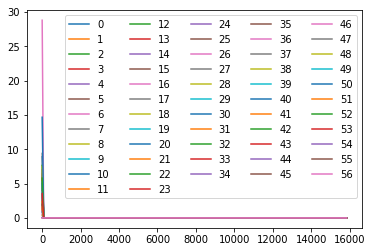

In [8]:
# plot the distribution of all features
nextplot()
densities = [scipy.stats.gaussian_kde(X[:, j]) for j in range(D)]
xs = np.linspace(0, np.max(X), 200)
for j in range(D):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('11')

(3065, 54)
42.81


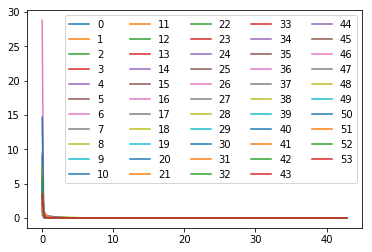

In [9]:
nextplot()
X_del = np.delete(X, np.s_[54:57], 1)
print(X_del.shape)
print(np.max(X_del))
densities = [scipy.stats.gaussian_kde(X_del[:, j]) for j in range(X_del.shape[1])]
xs = np.linspace(np.min(X_del), np.max(X_del), 200)
for j in range(X_del.shape[1]):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('12')

(3065, 54)
42.81


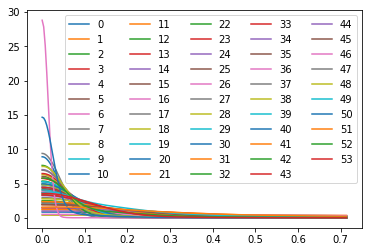

In [10]:
# this plots is not really helpful; go now explore further
# YOUR CODE HERE
#Plotting all features except the last three features
nextplot()
X_del = np.delete(X, np.s_[54:57], 1)
print(X_del.shape)
print(np.max(X_del))
densities = [scipy.stats.gaussian_kde(X_del[:, j]) for j in range(X_del.shape[1])]
xs = np.linspace(np.min(X_del), np.max(X_del)/60, 200)
for j in range(X_del.shape[1]):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('13')

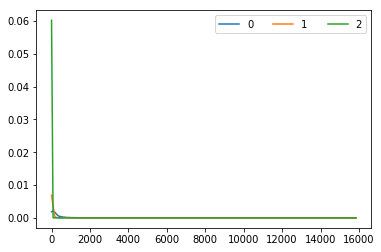

In [11]:
#KDE for last three features
nextplot()
densities = [scipy.stats.gaussian_kde(X[:, D - j-1]) for j in range(3)]
xs = np.linspace(0, np.max(X), 200)
for j in range(3):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('14')

In [12]:
# for l in range(X_del.shape[1]):
#     print(np.max(X_del[:,l]))

In [13]:
# for l in range(X.shape[1]):
#     print(np.max(X[:,l]))

In [14]:
# Let's compute z-scores; create two new variables Xz and Xtestz.
Xz = np.zeros((N,D))
Xtestz = np.zeros((Ntest,D))
for j in range(D):
    Xz[:,j] = (X[:,j] - np.mean(X[:,j]))/np.std(X[:,j])
    Xtestz[:,j] = (Xtest[:,j] - np.mean(X[:,j]))/np.std(X[:,j])


In [15]:
# Let's check. Xz and Xtestz refer to the normalized datasets just created. We
# will use them throughout.
print(np.mean(Xz, axis=0))  # should be all 0
print(np.var(Xz, axis=0))  # should be all 1
print(np.mean(Xtestz, axis=0))  # what do you get here?
print(np.var(Xtestz, axis=0))

np.sum(Xz ** 3)  # should be: 1925261.15

[-1.72329071e-15  1.38116815e-15 -2.23381219e-15 -5.89989359e-16
  5.10901816e-16 -4.09170613e-16 -7.19109383e-15  1.65189595e-15
  5.23869510e-15 -2.22345253e-15  2.84879968e-15 -2.49102895e-16
  2.72951862e-15 -9.90380516e-16  3.54226346e-15  7.49576221e-15
  3.83209868e-15  5.15411531e-16  7.04240001e-16 -3.38319186e-17
  7.76915237e-15  1.51961097e-15 -2.58379506e-15 -4.67947233e-15
  1.42525107e-15  1.65283774e-15  7.26245238e-16 -3.30368323e-16
  2.49564734e-15 -2.75107108e-15 -9.13516136e-16 -3.00584281e-15
  6.03106472e-18  1.47570917e-15 -1.76302692e-15 -3.90405489e-15
  3.34780237e-15  5.50728576e-16 -4.35538863e-15  1.41936490e-15
  2.02846621e-16  1.70874734e-15 -1.59884793e-15 -2.63003322e-16
  6.02737001e-15 -4.41144312e-15 -1.09319840e-15  2.63361926e-15
  2.38815674e-16 -5.79308216e-16 -2.54663066e-16 -8.75419005e-16
 -2.74686925e-15 -5.98614868e-16 -1.84572314e-16  7.25285338e-16
  1.86546446e-18]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

1925261.1560010156

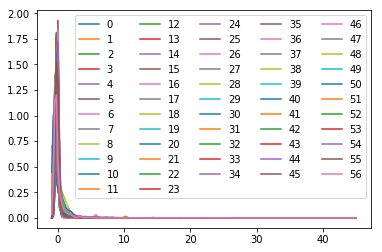

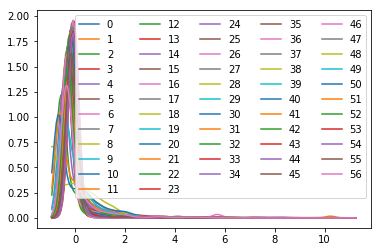

In [16]:
# Explore the normalized data
# YOUR CODE HERE
# plot the distribution of all features
nextplot()
densities = [scipy.stats.gaussian_kde(Xz[:, j]) for j in range(D)]
xs = np.linspace(np.min(Xz), np.max(Xz), 200)
for j in range(D):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('15')

nextplot()
densities = [scipy.stats.gaussian_kde(Xz[:, j]) for j in range(D)]
xs = np.linspace(np.min(Xz), np.max(Xz)/4, 200)
for j in range(D):
    plt.plot(xs, densities[j](xs), label=j)
plt.legend(ncol=5)
#plt.savefig('16')

# 2. Maximum Likelihood Estimation

## Helper functions

In [17]:
def logsumexp(x):
    """Computes log(sum(exp(x)).

    Uses offset trick to reduce risk of numeric over- or underflow. When x is a
    1D ndarray, computes logsumexp of its entries. When x is a 2D ndarray,
    computes logsumexp of each column.

    Keyword arguments:
    x : a 1D or 2D ndarray
    """
    offset = np.max(x, axis=0)
    return offset + np.log(np.sum(np.exp(x - offset), axis=0))

In [18]:
# Define the logistic function. Make sure it operates on both scalars
# and vectors.
def sigma(x):
    # YOUR CODE HERE
    if isinstance(x, np.ndarray):
        sigma = np.zeros((x.shape[0]))
        sigma[:] = 1/(1+ np.exp(-x[:]))
    else:
        sigma = 1/(1+ np.exp(-x))
    return sigma

In [19]:
# this should give:
# [0.5, array([0.26894142, 0.5, 0.73105858])]
[sigma(0), sigma(np.array([-1, 0, 1]))]

[0.5, array([0.26894142, 0.5       , 0.73105858])]

In [20]:
# Define the logarithm of the logistic function. Make sure it operates on both
# scalars and vectors. Perhaps helpful: isinstance(x, np.ndarray).
def logsigma(x):
    # YOUR CODE HERE
    if isinstance(x, np.ndarray):
        logsigma = np.zeros((x.shape[0]))
        logsigma[:] = np.log(sigma(x))
    else:
        logsigma = np.log(sigma(x))
    return logsigma

In [21]:
# this should give:
# [-0.69314718055994529, array([-1.31326169, -0.69314718, -0.31326169])]
[logsigma(0), logsigma(np.array([-1, 0, 1]))]

[-0.6931471805599453, array([-1.31326169, -0.69314718, -0.31326169])]

## 2b Log-likelihood and gradient

In [22]:
def l(y, X, w):
    """Log-likelihood of the logistic regression model.

    Parameters
    ----------
    y : ndarray of shape (N,)
        Binary labels (either 0 or 1).
    X : ndarray of shape (N,D)
        Design matrix.
    w : ndarray of shape (D,)
        Weight vector.
    """
    # YOUR CODE HERE
#     log_lik = np.sum(y*logsigma(np.dot(np.transpose(w), np.transpose(X))) + (1 - y)*logsigma(1 - (np.dot(np.transpose(w), np.transpose(X)))))
    log_lik = np.sum(y*logsigma(np.dot(X, w)) + (1 - y)*logsigma(-np.dot(X, w)))    
    return log_lik

In [23]:
# this should give:
# -47066.641667825766
l(y, Xz, np.linspace(-5, 5, D))

-47066.64166782577

In [24]:
def dl(y, X, w):
    """Gradient of the log-likelihood of the logistic regression model.

    Parameters
    ----------
    y : ndarray of shape (N,)
        Binary labels (either 0 or 1).
    X : ndarray of shape (N,D)
        Design matrix.
    w : ndarray of shape (D,)
        Weight vector.

    Returns
    -------
    ndarray of shape (D,)
    """
    # YOUR CODE HERE
    gredloglik = np.zeros(D)
#     for j in range(D):
#         gredloglik[j] = np.sum(X[:,j]*(y - sigma(np.dot(np.transpose(w), np.transpose(X))))) 
    
    gredloglik = np.dot(np.transpose(X),(y - sigma(np.dot(np.transpose(w), np.transpose(X)))) )
    
    return gredloglik

In [25]:
# this should give:
# array([  551.33985842,   143.84116318,   841.83373606,   156.87237578,
#          802.61217579,   795.96202907,   920.69045803,   621.96516752,
#          659.18724769,   470.81259805,   771.32406968,   352.40325626,
#          455.66972482,   234.36600888,   562.45454038,   864.83981264,
#          787.19723703,   649.48042176,   902.6478154 ,   544.00539886,
#         1174.78638035,   120.3598967 ,   839.61141672,   633.30453444,
#         -706.66815087,  -630.2039816 ,  -569.3451386 ,  -527.50996698,
#         -359.53701083,  -476.64334832,  -411.60620464,  -375.11950586,
#         -345.37195689,  -376.22044258,  -407.31761977,  -456.23251936,
#         -596.86960184,  -107.97072355,  -394.82170044,  -229.18125598,
#         -288.46356547,  -362.13402385,  -450.87896465,  -277.03932676,
#         -414.99293368,  -452.28771693,  -167.54649092,  -270.9043748 ,
#         -252.20140951,  -357.72497343,  -259.12468742,   418.35938483,
#          604.54173228,    43.10390907,   152.24258478,   378.16731033,
#          416.12032881])
dl(y, Xz, np.linspace(-5, 5, D))

array([ 551.33985842,  143.84116318,  841.83373606,  156.87237578,
        802.61217579,  795.96202907,  920.69045803,  621.96516752,
        659.18724769,  470.81259805,  771.32406968,  352.40325626,
        455.66972482,  234.36600888,  562.45454038,  864.83981264,
        787.19723703,  649.48042176,  902.6478154 ,  544.00539886,
       1174.78638035,  120.3598967 ,  839.61141672,  633.30453444,
       -706.66815087, -630.2039816 , -569.3451386 , -527.50996698,
       -359.53701083, -476.64334832, -411.60620464, -375.11950586,
       -345.37195689, -376.22044258, -407.31761977, -456.23251936,
       -596.86960184, -107.97072355, -394.82170044, -229.18125598,
       -288.46356547, -362.13402385, -450.87896465, -277.03932676,
       -414.99293368, -452.28771693, -167.54649092, -270.9043748 ,
       -252.20140951, -357.72497343, -259.12468742,  418.35938483,
        604.54173228,   43.10390907,  152.24258478,  378.16731033,
        416.12032881])

## 2c Gradient descent

In [26]:
# you don't need to modify this function
def optimize(obj_up, theta0, nepochs=50, eps0=0.01, verbose=True):
    """Iteratively minimize a function.

    We use it here to run either gradient descent or stochastic gradient
    descent, using arbitrarly optimization criteria.

    Parameters
    ----------
    obj_up  : a tuple of form (f, update) containing two functions f and update.
              f(theta) computes the value of the objective function.
              update(theta,eps) performs an epoch of parameter update with step size
              eps and returns the result.
    theta0  : ndarray of shape (D,)
              Initial parameter vector.
    nepochs : int
              How many epochs (calls to update) to run.
    eps0    : float
              Initial step size.
    verbose : boolean
              Whether to print progress information.

    Returns
    -------
    A triple consisting of the fitted parameter vector, the values of the
    objective function after every epoch, and the step sizes that were used.
    """

    f, update = obj_up

    # initialize results
    theta = theta0
    values = np.zeros(nepochs + 1)
    eps = np.zeros(nepochs + 1)
    values[0] = f(theta0)
    eps[0] = eps0

    # now run the update function nepochs times
    for epoch in range(nepochs):
        if verbose:
            print(
                "Epoch {:3d}: f={:10.3f}, eps={:10.9f}".format(
                    epoch, values[epoch], eps[epoch]
                )
            )
        theta = update(theta, eps[epoch])

        # we use the bold driver heuristic
        values[epoch + 1] = f(theta)
        if values[epoch] < values[epoch + 1]:
            eps[epoch + 1] = eps[epoch] / 2.0
        else:
            eps[epoch + 1] = eps[epoch] * 1.05

    # all done
    if verbose:
        print("Result after {} epochs: f={}".format(nepochs, values[-1]))
    return theta, values, eps

In [27]:
# define the objective and update function for one gradient-descent epoch for
# fitting an MLE estimate of logistic regression with gradient descent (should
# return a tuple of two functions; see optimize)
def gd(y, X):
    def objective(w):
        # YOUR CODE HERE
        return -l(y,X,w)
        

    def update(w, eps):
        # YOUR CODE HERE
        return (w + eps * dl(y, X, w))

    return (objective, update)

In [28]:
# this should give
# [47066.641667825766,
#  array([  4.13777838e+01,  -1.56745627e+01,   5.75882538e+01,
#           1.14225143e+01,   5.54249703e+01,   5.99229049e+01,
#           7.11220141e+01,   4.84761728e+01,   5.78067289e+01,
#           4.54794720e+01,   7.14638492e+01,   1.51369386e+01,
#           3.36375739e+01,   2.15061217e+01,   5.78014255e+01,
#           6.72743066e+01,   7.00829312e+01,   5.29328088e+01,
#           6.16042473e+01,   5.50018510e+01,   8.94624817e+01,
#           2.74784480e+01,   8.51763599e+01,   5.60363965e+01,
#          -2.55865589e+01,  -1.53788213e+01,  -4.67015412e+01,
#          -2.50356570e+00,  -3.85357592e+00,  -2.21819155e+00,
#           3.32098671e+00,   3.86933390e+00,  -2.00309898e+01,
#           3.84684492e+00,  -2.19847927e-01,  -1.29775457e+00,
#          -1.28374302e+01,  -2.78303173e+00,  -5.61671182e+00,
#           1.73657121e+01,  -6.81197570e+00,  -1.20249002e+01,
#           2.65789491e+00,  -1.39557852e+01,  -2.01135653e+01,
#          -2.72134051e+01,  -9.45952961e-01,  -1.02239111e+01,
#           1.52794293e-04,  -5.18938123e-01,  -3.19717561e+00,
#           4.62953437e+01,   7.87893022e+01,   1.88618651e+01,
#           2.85195027e+01,   5.04698358e+01,   6.41240689e+01])
f, update = gd(y, Xz)
[f(np.linspace(-5, 5, D)), update(np.linspace(-5, -5, D), 0.1)]

[47066.64166782577,
 array([ 4.13777838e+01, -1.56745627e+01,  5.75882538e+01,  1.14225143e+01,
         5.54249703e+01,  5.99229049e+01,  7.11220141e+01,  4.84761728e+01,
         5.78067289e+01,  4.54794720e+01,  7.14638492e+01,  1.51369386e+01,
         3.36375739e+01,  2.15061217e+01,  5.78014255e+01,  6.72743066e+01,
         7.00829312e+01,  5.29328088e+01,  6.16042473e+01,  5.50018510e+01,
         8.94624817e+01,  2.74784480e+01,  8.51763599e+01,  5.60363965e+01,
        -2.55865589e+01, -1.53788213e+01, -4.67015412e+01, -2.50356570e+00,
        -3.85357592e+00, -2.21819155e+00,  3.32098671e+00,  3.86933390e+00,
        -2.00309898e+01,  3.84684492e+00, -2.19847927e-01, -1.29775457e+00,
        -1.28374302e+01, -2.78303173e+00, -5.61671182e+00,  1.73657121e+01,
        -6.81197570e+00, -1.20249002e+01,  2.65789491e+00, -1.39557852e+01,
        -2.01135653e+01, -2.72134051e+01, -9.45952961e-01, -1.02239111e+01,
         1.52794293e-04, -5.18938123e-01, -3.19717561e+00,  4.629534

In [29]:
# you can run gradient descent!
numpy.random.seed(0)
w0 = np.random.normal(size=D)
wz_gd, vz_gd, ez_gd = optimize(gd(y, Xz), w0, nepochs=500)

Epoch   0: f=  6636.208, eps=0.010000000
Epoch   1: f=  4216.957, eps=0.010500000
Epoch   2: f=  2657.519, eps=0.011025000
Epoch   3: f=  1926.135, eps=0.011576250
Epoch   4: f=  1449.495, eps=0.012155063
Epoch   5: f=  1207.529, eps=0.012762816
Epoch   6: f=  1052.489, eps=0.013400956
Epoch   7: f=   957.275, eps=0.014071004
Epoch   8: f=   899.610, eps=0.014774554
Epoch   9: f=   882.904, eps=0.015513282
Epoch  10: f=  1017.083, eps=0.007756641
Epoch  11: f=   840.760, eps=0.008144473
Epoch  12: f=   805.649, eps=0.008551697
Epoch  13: f=   822.108, eps=0.004275848
Epoch  14: f=   746.377, eps=0.004489641
Epoch  15: f=   735.803, eps=0.004714123
Epoch  16: f=   729.780, eps=0.004949829
Epoch  17: f=   724.467, eps=0.005197320
Epoch  18: f=   719.408, eps=0.005457186
Epoch  19: f=   714.564, eps=0.005730046
Epoch  20: f=   709.932, eps=0.006016548
Epoch  21: f=   705.514, eps=0.006317375
Epoch  22: f=   701.321, eps=0.006633244
Epoch  23: f=   697.373, eps=0.006964906
Epoch  24: f=   

Epoch 305: f=   658.778, eps=0.004967422
Epoch 306: f=   658.761, eps=0.005215793
Epoch 307: f=   658.743, eps=0.005476582
Epoch 308: f=   658.725, eps=0.005750412
Epoch 309: f=   658.705, eps=0.006037932
Epoch 310: f=   658.684, eps=0.006339829
Epoch 311: f=   658.663, eps=0.006656820
Epoch 312: f=   658.640, eps=0.006989661
Epoch 313: f=   658.617, eps=0.007339144
Epoch 314: f=   658.593, eps=0.007706101
Epoch 315: f=   658.573, eps=0.008091406
Epoch 316: f=   658.582, eps=0.004045703
Epoch 317: f=   658.544, eps=0.004247988
Epoch 318: f=   658.521, eps=0.004460388
Epoch 319: f=   658.503, eps=0.004683407
Epoch 320: f=   658.486, eps=0.004917578
Epoch 321: f=   658.470, eps=0.005163456
Epoch 322: f=   658.455, eps=0.005421629
Epoch 323: f=   658.443, eps=0.005692711
Epoch 324: f=   658.436, eps=0.005977346
Epoch 325: f=   658.450, eps=0.002988673
Epoch 326: f=   658.381, eps=0.003138107
Epoch 327: f=   658.368, eps=0.003295012
Epoch 328: f=   658.356, eps=0.003459763
Epoch 329: f=   

Text(0,0.5,'Step size')

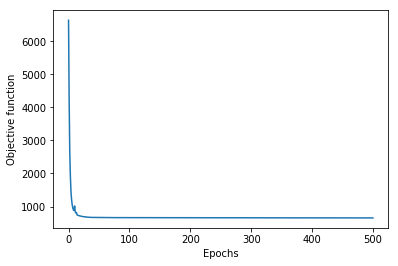

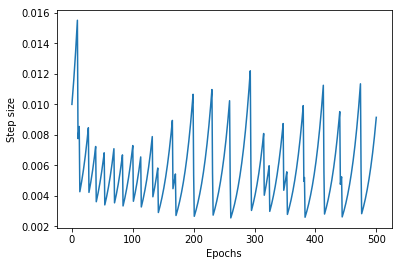

In [31]:
# look at how gradient descent made progess
# YOUR CODE HERE
nextplot()
plt.plot(range(501), vz_gd)
plt.xlabel("Epochs")
plt.ylabel("Objective function")
#plt.savefig('2_c.png')
nextplot()
plt.plot(range(501), ez_gd)
plt.xlabel("Epochs")
plt.ylabel("Step size")

## 2d Stochastic gradient descent

In [32]:
def sgdepoch(y, X, w, eps):
    """Run one SGD epoch and return the updated weight vector. """
    # Run N stochastic gradient steps (without replacement). Do not rescale each
    # step by factor N (i.e., proceed differently than in the lecture slides).
    # YOUR CODE HERE
    xy = np.concatenate((X,y[:,None]),axis=1)

    for n in range(X.shape[0]):
        xy1 = xy[np.random.choice(xy.shape[0], replace=False)]
        w = w + eps * dl(xy1[-1], xy1[:-1], w)
    return w
    

In [33]:
# when you run this multiple times, with 50% probability you should get the
# following result (there is one other result which is very close):
# array([ -3.43689655e+02,  -1.71161311e+02,  -5.71093536e+02,
#         -5.16478220e+01,   4.66294348e+02,  -3.71589878e+02,
#          5.21493183e+02,   1.25699230e+03,   8.33804130e+02,
#          5.63185399e+02,   1.32761302e+03,  -2.64104011e+02,
#          7.10693307e+02,  -1.75497331e+02,  -1.94174427e+02,
#          1.11641507e+02,  -3.30817509e+02,  -3.46754913e+02,
#          8.48722111e+02,  -1.89136304e+02,  -4.25693844e+02,
#         -1.23084189e+02,  -2.95894797e+02,  -2.35789333e+02,
#         -3.38695243e+02,  -3.05642830e+02,  -2.28975383e+02,
#         -2.38075137e+02,  -1.66702530e+02,  -2.27341599e+02,
#         -1.77575620e+02,  -1.49093855e+02,  -1.70028859e+02,
#         -1.50243833e+02,  -1.82986008e+02,  -2.41143708e+02,
#         -3.31047159e+02,  -5.79991185e+01,  -1.98477863e+02,
#         -1.91264948e+02,  -1.17371919e+02,  -1.66953779e+02,
#         -2.01472565e+02,  -1.23330949e+02,  -3.00857740e+02,
#         -1.95853348e+02,  -7.44868073e+01,  -1.11172370e+02,
#         -1.57618226e+02,  -1.25729512e+00,  -1.45536466e+02,
#         -1.43362438e+02,  -3.00429708e+02,  -9.84391082e+01,
#         -4.54152047e+01,  -5.26492232e+01,  -1.45175427e+02])
sgdepoch(y[1:3], Xz[1:3, :], np.linspace(-5, 5, D), 1000)

array([-3.43689655e+02, -1.71161311e+02, -5.71093536e+02, -5.16478220e+01,
        4.66294348e+02, -3.71589878e+02,  5.21493183e+02,  1.25699230e+03,
        8.33804130e+02,  5.63185399e+02,  1.32761302e+03, -2.64104011e+02,
        7.10693307e+02, -1.75497331e+02, -1.94174427e+02,  1.11641507e+02,
       -3.30817509e+02, -3.46754913e+02,  8.48722111e+02, -1.89136304e+02,
       -4.25693844e+02, -1.23084189e+02, -2.95894797e+02, -2.35789333e+02,
       -3.38695243e+02, -3.05642830e+02, -2.28975383e+02, -2.38075137e+02,
       -1.66702530e+02, -2.27341599e+02, -1.77575620e+02, -1.49093855e+02,
       -1.70028859e+02, -1.50243833e+02, -1.82986008e+02, -2.41143708e+02,
       -3.31047159e+02, -5.79991185e+01, -1.98477863e+02, -1.91264948e+02,
       -1.17371919e+02, -1.66953779e+02, -2.01472565e+02, -1.23330949e+02,
       -3.00857740e+02, -1.95853348e+02, -7.44868073e+01, -1.11172370e+02,
       -1.57618226e+02, -1.25729512e+00, -1.45536466e+02, -1.43362438e+02,
       -3.00429708e+02, -

In [34]:
# define the objective and update function for one gradient-descent epoch for
# fitting an MLE estimate of logistic regression with stochastic gradient descent
# (should return a tuple of two functions; see optimize)
def sgd(y, X):
    def objective(w):
        # YOUR CODE HERE
        return -l(y,X,w)

    def update(w, eps):
        return sgdepoch(y, X, w, eps)

    return (objective, update)

In [35]:
# with 50% probability, you should get:
# [40.864973045695081,
#  array([ -3.43689655e+02,  -1.71161311e+02,  -5.71093536e+02,
#          -5.16478220e+01,   4.66294348e+02,  -3.71589878e+02,
#           5.21493183e+02,   1.25699230e+03,   8.33804130e+02,
#           5.63185399e+02,   1.32761302e+03,  -2.64104011e+02,
#           7.10693307e+02,  -1.75497331e+02,  -1.94174427e+02,
#           1.11641507e+02,  -3.30817509e+02,  -3.46754913e+02,
#           8.48722111e+02,  -1.89136304e+02,  -4.25693844e+02,
#          -1.23084189e+02,  -2.95894797e+02,  -2.35789333e+02,
#          -3.38695243e+02,  -3.05642830e+02,  -2.28975383e+02,
#          -2.38075137e+02,  -1.66702530e+02,  -2.27341599e+02,
#          -1.77575620e+02,  -1.49093855e+02,  -1.70028859e+02,
#          -1.50243833e+02,  -1.82986008e+02,  -2.41143708e+02,
#          -3.31047159e+02,  -5.79991185e+01,  -1.98477863e+02,
#          -1.91264948e+02,  -1.17371919e+02,  -1.66953779e+02,
#          -2.01472565e+02,  -1.23330949e+02,  -3.00857740e+02,
#          -1.95853348e+02,  -7.44868073e+01,  -1.11172370e+02,
#          -1.57618226e+02,  -1.25729512e+00,  -1.45536466e+02,
#          -1.43362438e+02,  -3.00429708e+02,  -9.84391082e+01,
#          -4.54152047e+01,  -5.26492232e+01,  -1.45175427e+02])]
f, update = sgd(y[1:3], Xz[1:3, :])
[f(np.linspace(-5, 5, D)), update(np.linspace(-5, 5, D), 1000)]

[40.864973045695095,
 array([-343.68965468, -171.16131088, -571.0935363 ,  -51.64782199,
         466.29434839, -371.58987765,  521.49318326, 1256.99229669,
         833.80413052,  563.18539912, 1327.6130216 , -264.10401085,
         710.69330696, -175.49733124, -194.17442685,  111.6415075 ,
        -330.81750896, -346.75491303,  848.72211134, -189.13630403,
        -425.69384414, -123.08418879, -295.89479699, -235.78933296,
        -338.69524324, -305.64283021, -228.97538337, -238.07513719,
        -166.70252969, -227.34159943, -177.57562021, -149.09385494,
        -170.02885884, -150.24383253, -182.98600816, -241.14370766,
        -331.0471594 ,  -57.99911848, -198.47786321, -191.26494851,
        -117.37191884, -166.95377868, -201.47256486, -123.33094893,
        -300.85774034, -195.8533476 ,  -74.48680731, -111.17237043,
        -157.61822569,   -8.42895846, -145.53646559, -145.65820563,
        -300.42970793,  -98.43910824,  -45.41520475,  -52.64922325,
        -145.17542713])]

In [36]:
# you can run stochastic gradient descent!
wz_sgd, vz_sgd, ez_sgd = optimize(sgd(y, Xz), w0, nepochs=500)

Epoch   0: f=  6636.208, eps=0.010000000
Epoch   1: f=  1106.382, eps=0.010500000
Epoch   2: f=   841.690, eps=0.011025000
Epoch   3: f=   764.601, eps=0.011576250
Epoch   4: f=   735.154, eps=0.012155063
Epoch   5: f=   719.151, eps=0.012762816
Epoch   6: f=   707.500, eps=0.013400956
Epoch   7: f=   717.360, eps=0.006700478
Epoch   8: f=   698.355, eps=0.007035502
Epoch   9: f=   696.823, eps=0.007387277
Epoch  10: f=   688.051, eps=0.007756641
Epoch  11: f=   692.678, eps=0.003878321
Epoch  12: f=   683.750, eps=0.004072237
Epoch  13: f=   682.723, eps=0.004275848
Epoch  14: f=   682.665, eps=0.004489641
Epoch  15: f=   685.469, eps=0.002244820
Epoch  16: f=   683.285, eps=0.002357061
Epoch  17: f=   684.352, eps=0.001178531
Epoch  18: f=   680.692, eps=0.001237457
Epoch  19: f=   679.158, eps=0.001299330
Epoch  20: f=   679.500, eps=0.000649665
Epoch  21: f=   678.670, eps=0.000682148
Epoch  22: f=   677.341, eps=0.000716256
Epoch  23: f=   676.775, eps=0.000752069
Epoch  24: f=   

Epoch 200: f=   673.622, eps=0.000000725
Epoch 201: f=   673.622, eps=0.000000761
Epoch 202: f=   673.621, eps=0.000000799
Epoch 203: f=   673.621, eps=0.000000839
Epoch 204: f=   673.621, eps=0.000000419
Epoch 205: f=   673.621, eps=0.000000440
Epoch 206: f=   673.621, eps=0.000000462
Epoch 207: f=   673.621, eps=0.000000486
Epoch 208: f=   673.621, eps=0.000000510
Epoch 209: f=   673.621, eps=0.000000535
Epoch 210: f=   673.621, eps=0.000000562
Epoch 211: f=   673.620, eps=0.000000590
Epoch 212: f=   673.620, eps=0.000000620
Epoch 213: f=   673.620, eps=0.000000651
Epoch 214: f=   673.620, eps=0.000000683
Epoch 215: f=   673.620, eps=0.000000717
Epoch 216: f=   673.620, eps=0.000000359
Epoch 217: f=   673.620, eps=0.000000377
Epoch 218: f=   673.620, eps=0.000000395
Epoch 219: f=   673.620, eps=0.000000415
Epoch 220: f=   673.619, eps=0.000000436
Epoch 221: f=   673.619, eps=0.000000458
Epoch 222: f=   673.619, eps=0.000000481
Epoch 223: f=   673.619, eps=0.000000505
Epoch 224: f=   

Epoch 400: f=   673.618, eps=0.000000000
Epoch 401: f=   673.618, eps=0.000000000
Epoch 402: f=   673.618, eps=0.000000000
Epoch 403: f=   673.618, eps=0.000000000
Epoch 404: f=   673.618, eps=0.000000000
Epoch 405: f=   673.618, eps=0.000000000
Epoch 406: f=   673.618, eps=0.000000000
Epoch 407: f=   673.618, eps=0.000000000
Epoch 408: f=   673.618, eps=0.000000000
Epoch 409: f=   673.618, eps=0.000000000
Epoch 410: f=   673.618, eps=0.000000000
Epoch 411: f=   673.618, eps=0.000000000
Epoch 412: f=   673.618, eps=0.000000000
Epoch 413: f=   673.618, eps=0.000000000
Epoch 414: f=   673.618, eps=0.000000000
Epoch 415: f=   673.618, eps=0.000000000
Epoch 416: f=   673.618, eps=0.000000000
Epoch 417: f=   673.618, eps=0.000000000
Epoch 418: f=   673.618, eps=0.000000000
Epoch 419: f=   673.618, eps=0.000000000
Epoch 420: f=   673.618, eps=0.000000000
Epoch 421: f=   673.618, eps=0.000000000
Epoch 422: f=   673.618, eps=0.000000000
Epoch 423: f=   673.618, eps=0.000000000
Epoch 424: f=   

## 2e Compare GD and SGD

Text(0,0.5,'Step size - SGD')

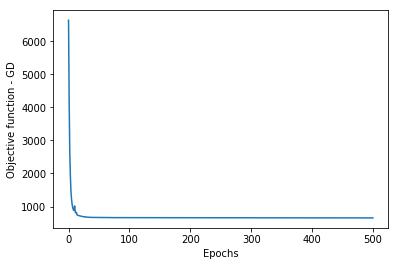

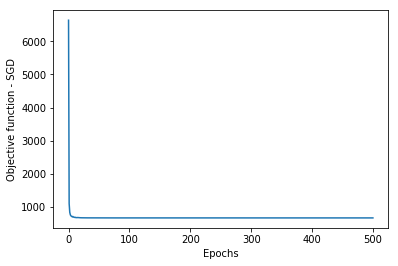

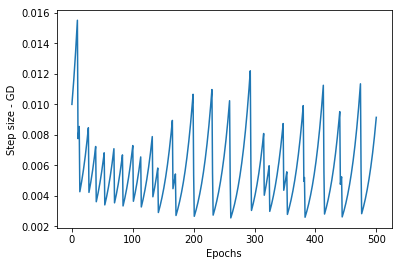

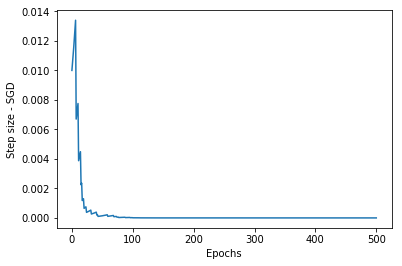

In [37]:
# YOUR CODE HERE
#variation of objective function and step size over epochs
nextplot()
plt.plot(range(501), vz_gd)
plt.xlabel("Epochs")
plt.ylabel("Objective function - GD")
#plt.savefig('2_e1.png')
nextplot()
plt.plot(range(501), vz_sgd)
plt.xlabel("Epochs")
plt.ylabel("Objective function - SGD")
#plt.savefig('2_e2.png')
nextplot()
plt.plot(range(501), ez_gd)
plt.xlabel("Epochs")
plt.ylabel("Step size - GD")
#plt.savefig('2_e3.png')
nextplot()
plt.plot(range(501), ez_sgd)
plt.xlabel("Epochs")
plt.ylabel("Step size - SGD")
#plt.savefig('2_e4.png')


Text(0.5,1,'Feature weights by GD')

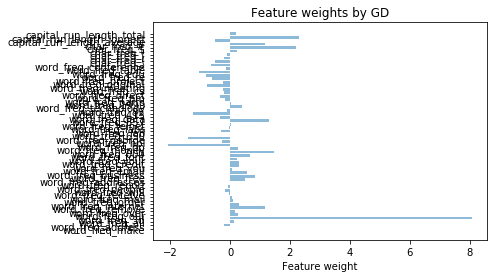

In [38]:
#weights for GD and SGD 
# print(wz_gd)
# print(wz_sgd)
# print(wz_gd - wz_sgd)
nextplot()
y_pos = np.arange(len(features))
plt.rcParams["figure.figsize"] = [10,7]
#plt.figure(figsize=(7,6))

plt.barh(y_pos, wz_gd, align='center', alpha=0.5)
plt.yticks(y_pos, features)
plt.xlabel('Feature weight')
plt.title('Feature weights by GD')
#plt.savefig('2_e5_2.png')
#plt.show()

Text(0.5,1,'Feature weights by SGD')

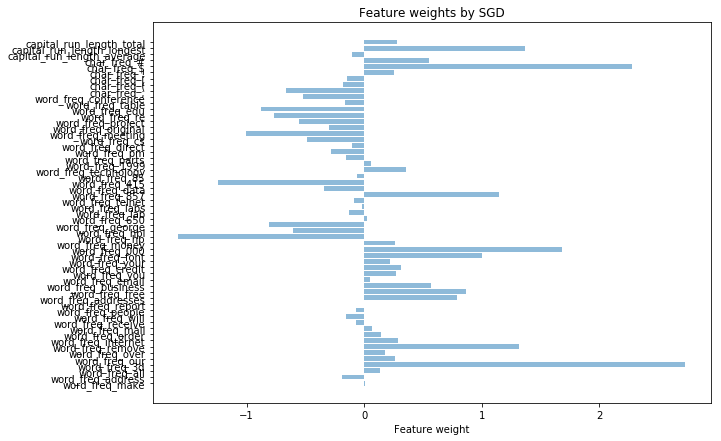

In [39]:
nextplot()
y_pos = np.arange(len(features))
# performance = [10,8,6,4,2,1]
plt.rcParams["figure.figsize"] = [10,7]
#plt.figure(figsize=(7,8))

plt.barh(y_pos, wz_sgd, align='center', alpha=0.5)
plt.yticks(y_pos, features)
plt.xlabel('Feature weight')
plt.title('Feature weights by SGD')
#plt.savefig('2_e6_2.png')

Text(0.5,1,'Feature weights difference for GD and SGD')

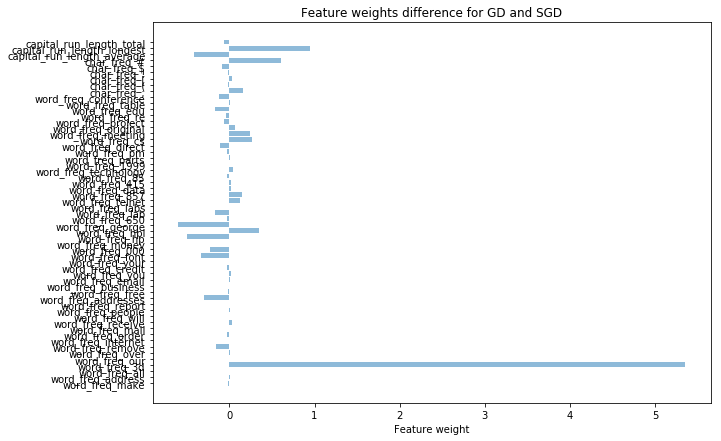

In [40]:
nextplot()
y_pos = np.arange(len(features))
plt.rcParams["figure.figsize"] = [10,7]
#plt.figure(figsize=(7,6))

plt.barh(y_pos, (wz_gd - wz_sgd), align='center', alpha=0.5)
plt.yticks(y_pos, features)
plt.xlabel('Feature weight')
plt.title('Feature weights difference for GD and SGD')
#plt.savefig('2_e7.png')

In [41]:
print((wz_gd - wz_sgd))

[-1.33968123e-02  2.59843268e-03 -1.02063468e-02  5.35593977e+00
  3.05274996e-05  1.07523910e-03 -1.61469121e-01 -2.18725489e-04
 -2.58186887e-02 -9.71798786e-04  2.46221247e-02 -7.57952987e-03
  7.51174948e-03 -8.10807874e-03 -2.98328408e-01 -2.19605497e-02
 -3.29911958e-03  2.56644891e-03  1.80198727e-02 -2.47911188e-02
 -2.09306970e-03 -3.35790559e-01 -2.23493673e-01 -6.11189328e-03
 -4.93400123e-01  3.44225818e-01 -6.05355229e-01 -2.85620350e-02
 -1.74742710e-01 -8.85537307e-03  1.25263811e-01  1.45107116e-01
  1.50850896e-02  1.48380958e-02 -2.98033728e-02  4.41360501e-02
 -9.44437355e-03  5.46874449e-03 -3.23590869e-02 -1.10955510e-01
  2.65517715e-01  2.39805617e-01  6.09209546e-02 -6.28408022e-02
 -3.52357118e-02 -1.72743319e-01  1.15439989e-02 -1.23466704e-01
  1.58771700e-01 -1.85687011e-02  3.40265205e-02 -1.70915603e-02
 -9.08658100e-02  6.02514267e-01 -4.17578387e-01  9.47479387e-01
 -6.62048264e-02]


# 3 Prediction

In [42]:
def predict(Xtest, w):
    """Returns vector of predicted confidence values for logistic regression with
weight vector w."""
    # YOUR CODE HERE
    yhat = sigma(np.dot(np.transpose(w),np.transpose(Xtest)))
    return yhat


def classify(Xtest, w):
    """Returns 0/1 vector of predicted class labels for logistic regression with
weight vector w."""
    # YOUR CODE HERE
    ypred = (sigma(np.dot(np.transpose(w),np.transpose(Xtest)))  > 0.5).astype(int)  
    return ypred

In [43]:
# Example: confusion matrix
yhat = predict(Xtestz, wz_gd)
ypred = classify(Xtestz, wz_gd)
print(sklearn.metrics.confusion_matrix(ytest, ypred))  # true x predicted

[[887  54]
 [ 71 524]]


In [44]:
# Example: classification report
print(sklearn.metrics.classification_report(ytest, ypred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93       941
           1       0.91      0.88      0.89       595

   micro avg       0.92      0.92      0.92      1536
   macro avg       0.92      0.91      0.91      1536
weighted avg       0.92      0.92      0.92      1536



In [45]:
print(sklearn.metrics.accuracy_score(ytest, ypred))

0.9186197916666666


Text(0,0.5,'Precision')

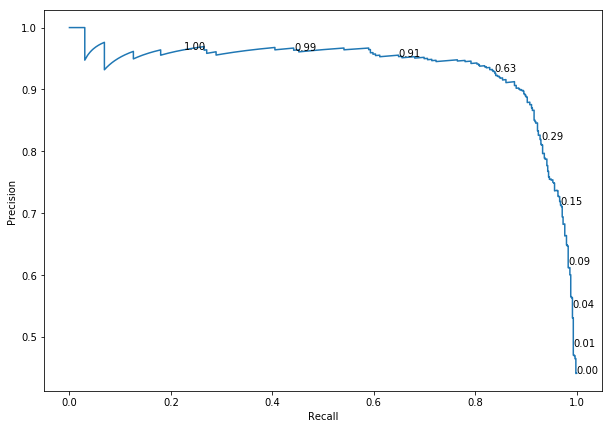

In [46]:
# Example: precision-recall curve (with annotated thresholds)
nextplot()
precision, recall, thresholds = sklearn.metrics.precision_recall_curve(ytest, yhat)
plt.plot(recall, precision)
for x in np.linspace(0, 1, 10, endpoint=False):
    index = int(x * (precision.size - 1))
    plt.text(recall[index], precision[index], "{:3.2f}".format(thresholds[index]))
plt.xlabel("Recall")
plt.ylabel("Precision")
#plt.savefig('3_1.png')

In [48]:
# Explore which features are considered important
# YOUR CODE HERE
features_weights = np.column_stack((features, wz_gd))

z = features_weights[:,1].argsort()
#print(features_weights)

#Important features with positive co-relation
max_features = features_weights[:,1].argsort()[-10:]
print(features_weights[max_features])

#Least important features
min_features = features_weights[:,1].argsort()[:10]
print(features_weights[min_features])

nextplot()
y_pos = np.arange(len(features_weights[max_features][:,0]))
plt.rcParams["figure.figsize"] = [10,7]
#plt.figure(figsize=(7,6))

# plt.barh(y_pos, features_weights[max_features][:,1], align='center', alpha=0.5)
# plt.yticks(y_pos, features_weights[max_features][:,0])
# plt.xlabel('Feature weight')
# plt.title('Feature weights by GD')
#plt.savefig('3_2.png')

[['word_freq_business' '0.5637102767084192']
 ['word_freq_font' '0.6649719578302691']
 ['word_freq_free' '0.8437001544042252']
 ['word_freq_remove' '1.1533358299128904']
 ['char_freq_#' '1.154539510763711']
 ['word_freq_857' '1.2894997971187552']
 ['word_freq_000' '1.4617469223472006']
 ['char_freq_$' '2.1892656629025953']
 ['capital_run_length_longest' '2.313660677115898']
 ['word_freq_3d' '8.086257206060692']]
[['word_freq_650' '-0.001473683176900042']
 ['word_freq_make' '-0.008868058029676837']
 ['word_freq_report' '-0.010947922246373958']
 ['word_freq_labs' '-0.03122581631469515']
 ['word_freq_receive' '-0.04683985873264899']
 ['word_freq_people' '-0.06531490900558684']
 ['word_freq_85' '-0.08943968392406434']
 ['char_freq_[' '-0.10844221511868748']
 ['word_freq_table' '-0.14990338096073436']
 ['word_freq_parts' '-0.1520738007649136']]


<Figure size 720x504 with 0 Axes>

# 4 Maximum Aposteriori Estimation

## 4a Gradient Descent

In [49]:
def l_l2(y, X, w, lambda_):
    """Log-density of posterior of logistic regression with weights w and L2
regularization parameter lambda_"""
    # YOUR CODE HERE
    log_l2 = l(y,X,w) - lambda_*np.sum(np.square(w))/2
    
    return log_l2
    

In [50]:
# this should give:
# [-47066.641667825766, -47312.623810682911]
[l_l2(y, Xz, np.linspace(-5, 5, D), 0), l_l2(y, Xz, np.linspace(-5, 5, D), 1)]

[-47066.64166782577, -47312.62381068291]

In [51]:
def dl_l2(y, X, w, lambda_):
    """Gradient of log-density of posterior of logistic regression with weights w
and L2 regularization parameter lambda_."""
    # YOUR CODE HERE
    gred_l2 = dl(y,X,w) - lambda_*w
    return gred_l2

In [52]:
# this should give:
# [array([  551.33985842,   143.84116318,   841.83373606,   156.87237578,
#           802.61217579,   795.96202907,   920.69045803,   621.96516752,
#           659.18724769,   470.81259805,   771.32406968,   352.40325626,
#           455.66972482,   234.36600888,   562.45454038,   864.83981264,
#           787.19723703,   649.48042176,   902.6478154 ,   544.00539886,
#          1174.78638035,   120.3598967 ,   839.61141672,   633.30453444,
#          -706.66815087,  -630.2039816 ,  -569.3451386 ,  -527.50996698,
#          -359.53701083,  -476.64334832,  -411.60620464,  -375.11950586,
#          -345.37195689,  -376.22044258,  -407.31761977,  -456.23251936,
#          -596.86960184,  -107.97072355,  -394.82170044,  -229.18125598,
#          -288.46356547,  -362.13402385,  -450.87896465,  -277.03932676,
#          -414.99293368,  -452.28771693,  -167.54649092,  -270.9043748 ,
#          -252.20140951,  -357.72497343,  -259.12468742,   418.35938483,
#           604.54173228,    43.10390907,   152.24258478,   378.16731033,
#           416.12032881]),
#  array([  556.33985842,   148.66259175,   846.4765932 ,   161.33666149,
#           806.89789007,   800.06917193,   924.61902946,   625.71516752,
#           662.75867626,   474.20545519,   774.5383554 ,   355.43897054,
#           458.52686767,   237.04458031,   564.95454038,   867.16124121,
#           789.34009417,   651.44470748,   904.43352968,   545.61254171,
#          1176.21495178,   121.6098967 ,   840.68284529,   634.19739158,
#          -705.95386516,  -629.66826731,  -568.98799574,  -527.33139555,
#          -359.53701083,  -476.82191975,  -411.9633475 ,  -375.65522015,
#          -346.08624261,  -377.11329972,  -408.38904835,  -457.48251936,
#          -598.29817327,  -109.57786641,  -396.60741472,  -231.14554169,
#          -290.60642261,  -364.45545242,  -453.37896465,  -279.71789819,
#          -417.85007654,  -455.32343122,  -170.76077664,  -274.29723194,
#          -255.77283808,  -361.47497343,  -263.05325885,   414.25224198,
#           600.25601799,    38.63962335,   147.59972763,   373.34588176,
#           411.12032881])]
[dl_l2(y, Xz, np.linspace(-5, 5, D), 0), dl_l2(y, Xz, np.linspace(-5, 5, D), 1)]

[array([ 551.33985842,  143.84116318,  841.83373606,  156.87237578,
         802.61217579,  795.96202907,  920.69045803,  621.96516752,
         659.18724769,  470.81259805,  771.32406968,  352.40325626,
         455.66972482,  234.36600888,  562.45454038,  864.83981264,
         787.19723703,  649.48042176,  902.6478154 ,  544.00539886,
        1174.78638035,  120.3598967 ,  839.61141672,  633.30453444,
        -706.66815087, -630.2039816 , -569.3451386 , -527.50996698,
        -359.53701083, -476.64334832, -411.60620464, -375.11950586,
        -345.37195689, -376.22044258, -407.31761977, -456.23251936,
        -596.86960184, -107.97072355, -394.82170044, -229.18125598,
        -288.46356547, -362.13402385, -450.87896465, -277.03932676,
        -414.99293368, -452.28771693, -167.54649092, -270.9043748 ,
        -252.20140951, -357.72497343, -259.12468742,  418.35938483,
         604.54173228,   43.10390907,  152.24258478,  378.16731033,
         416.12032881]),
 array([ 556.33985842, 

In [53]:
# now define the (f,update) tuple for optimize for logistic regression, L2
# regularization, and gradient descent
def gd_l2(y, X, lambda_):
    # YOUR CODE HERE
    def objective(w):
        # YOUR CODE HERE
        return - l_l2(y,X,w,lambda_)
        

    def update(w, eps):
        # YOUR CODE HERE
        return (w + eps * dl_l2(y, X, w, lambda_))
    
    return (objective, update)

In [54]:
# let's run!
lambda_ = 100
wz_gd_l2, vz_gd_l2, ez_gd_l2 = optimize(gd_l2(y, Xz, lambda_), w0, nepochs=500)

Epoch   0: f=  9992.358, eps=0.010000000
Epoch   1: f= 23977.384, eps=0.005000000
Epoch   2: f=  5534.851, eps=0.005250000
Epoch   3: f=  1427.453, eps=0.005512500
Epoch   4: f=  1131.716, eps=0.005788125
Epoch   5: f=  1540.933, eps=0.002894063
Epoch   6: f=  1323.168, eps=0.003038766
Epoch   7: f=  1049.068, eps=0.003190704
Epoch   8: f=  1067.960, eps=0.001595352
Epoch   9: f=   989.861, eps=0.001675120
Epoch  10: f=   988.742, eps=0.001758876
Epoch  11: f=   988.585, eps=0.001846819
Epoch  12: f=   988.539, eps=0.001939160
Epoch  13: f=   988.522, eps=0.002036118
Epoch  14: f=   988.516, eps=0.002137924
Epoch  15: f=   988.513, eps=0.002244820
Epoch  16: f=   988.512, eps=0.002357061
Epoch  17: f=   988.512, eps=0.002474914
Epoch  18: f=   988.512, eps=0.002598660
Epoch  19: f=   988.512, eps=0.002728593
Epoch  20: f=   988.512, eps=0.002865023
Epoch  21: f=   988.512, eps=0.003008274
Epoch  22: f=   988.512, eps=0.003158688
Epoch  23: f=   988.512, eps=0.003316622
Epoch  24: f=   

Epoch 291: f=   988.512, eps=0.000000000
Epoch 292: f=   988.512, eps=0.000000000
Epoch 293: f=   988.512, eps=0.000000000
Epoch 294: f=   988.512, eps=0.000000000
Epoch 295: f=   988.512, eps=0.000000000
Epoch 296: f=   988.512, eps=0.000000000
Epoch 297: f=   988.512, eps=0.000000000
Epoch 298: f=   988.512, eps=0.000000000
Epoch 299: f=   988.512, eps=0.000000000
Epoch 300: f=   988.512, eps=0.000000000
Epoch 301: f=   988.512, eps=0.000000000
Epoch 302: f=   988.512, eps=0.000000000
Epoch 303: f=   988.512, eps=0.000000000
Epoch 304: f=   988.512, eps=0.000000000
Epoch 305: f=   988.512, eps=0.000000000
Epoch 306: f=   988.512, eps=0.000000000
Epoch 307: f=   988.512, eps=0.000000000
Epoch 308: f=   988.512, eps=0.000000000
Epoch 309: f=   988.512, eps=0.000000000
Epoch 310: f=   988.512, eps=0.000000000
Epoch 311: f=   988.512, eps=0.000000000
Epoch 312: f=   988.512, eps=0.000000000
Epoch 313: f=   988.512, eps=0.000000000
Epoch 314: f=   988.512, eps=0.000000000
Epoch 315: f=   

## 4b Effect of Prior

In [55]:
# YOUR CODE HERE
lambdas = 500
train_loglik = np.zeros(lambdas)
test_loglik = np.zeros(lambdas)
accuracy = np.zeros(lambdas)
wz_gd_l2 = np.zeros([D,lambdas])
i=0
for lambda_ in range(lambdas):
    
    train_loglik[i] = l_l2(y, Xz, w0, lambda_)
    test_loglik[i] = l_l2(ytest, Xtestz, w0, lambda_)
    
    wz_gd_l2[:,i], vz_gd_l2, ez_gd_l2 = optimize(gd_l2(y, Xz, lambda_), w0, nepochs=500)

    yhat = predict(Xtestz, wz_gd_l2[:,i])
    ypred = classify(Xtestz, wz_gd_l2[:,i])
    accuracy[i] = sklearn.metrics.accuracy_score(ytest, ypred)
    #print(sklearn.metrics.accuracy_score(ytest, ypred))
    
    i = i+1
    

Epoch   0: f=  6636.208, eps=0.010000000
Epoch   1: f=  4216.957, eps=0.010500000
Epoch   2: f=  2657.519, eps=0.011025000
Epoch   3: f=  1926.135, eps=0.011576250
Epoch   4: f=  1449.495, eps=0.012155063
Epoch   5: f=  1207.529, eps=0.012762816
Epoch   6: f=  1052.489, eps=0.013400956
Epoch   7: f=   957.275, eps=0.014071004
Epoch   8: f=   899.610, eps=0.014774554
Epoch   9: f=   882.904, eps=0.015513282
Epoch  10: f=  1017.083, eps=0.007756641
Epoch  11: f=   840.760, eps=0.008144473
Epoch  12: f=   805.649, eps=0.008551697
Epoch  13: f=   822.108, eps=0.004275848
Epoch  14: f=   746.377, eps=0.004489641
Epoch  15: f=   735.803, eps=0.004714123
Epoch  16: f=   729.780, eps=0.004949829
Epoch  17: f=   724.467, eps=0.005197320
Epoch  18: f=   719.408, eps=0.005457186
Epoch  19: f=   714.564, eps=0.005730046
Epoch  20: f=   709.932, eps=0.006016548
Epoch  21: f=   705.514, eps=0.006317375
Epoch  22: f=   701.321, eps=0.006633244
Epoch  23: f=   697.373, eps=0.006964906
Epoch  24: f=   

Epoch 330: f=   658.333, eps=0.003814388
Epoch 331: f=   658.320, eps=0.004005108
Epoch 332: f=   658.307, eps=0.004205363
Epoch 333: f=   658.293, eps=0.004415631
Epoch 334: f=   658.278, eps=0.004636413
Epoch 335: f=   658.263, eps=0.004868234
Epoch 336: f=   658.247, eps=0.005111645
Epoch 337: f=   658.230, eps=0.005367228
Epoch 338: f=   658.212, eps=0.005635589
Epoch 339: f=   658.193, eps=0.005917368
Epoch 340: f=   658.174, eps=0.006213237
Epoch 341: f=   658.153, eps=0.006523899
Epoch 342: f=   658.132, eps=0.006850094
Epoch 343: f=   658.109, eps=0.007192598
Epoch 344: f=   658.086, eps=0.007552228
Epoch 345: f=   658.061, eps=0.007929840
Epoch 346: f=   658.036, eps=0.008326332
Epoch 347: f=   658.017, eps=0.008742648
Epoch 348: f=   658.040, eps=0.004371324
Epoch 349: f=   658.004, eps=0.004589890
Epoch 350: f=   657.981, eps=0.004819385
Epoch 351: f=   657.965, eps=0.005060354
Epoch 352: f=   657.954, eps=0.005313372
Epoch 353: f=   657.953, eps=0.005579040
Epoch 354: f=   

Epoch 179: f=   682.906, eps=0.004018220
Epoch 180: f=   682.905, eps=0.004219131
Epoch 181: f=   682.904, eps=0.004430087
Epoch 182: f=   682.903, eps=0.004651592
Epoch 183: f=   682.903, eps=0.004884171
Epoch 184: f=   682.902, eps=0.005128380
Epoch 185: f=   682.901, eps=0.005384799
Epoch 186: f=   682.900, eps=0.005654039
Epoch 187: f=   682.899, eps=0.005936741
Epoch 188: f=   682.899, eps=0.006233578
Epoch 189: f=   682.898, eps=0.006545257
Epoch 190: f=   682.899, eps=0.003272628
Epoch 191: f=   682.896, eps=0.003436260
Epoch 192: f=   682.896, eps=0.003608073
Epoch 193: f=   682.895, eps=0.003788476
Epoch 194: f=   682.895, eps=0.003977900
Epoch 195: f=   682.894, eps=0.004176795
Epoch 196: f=   682.893, eps=0.004385635
Epoch 197: f=   682.893, eps=0.004604917
Epoch 198: f=   682.892, eps=0.004835163
Epoch 199: f=   682.892, eps=0.005076921
Epoch 200: f=   682.891, eps=0.005330767
Epoch 201: f=   682.890, eps=0.005597305
Epoch 202: f=   682.890, eps=0.005877170
Epoch 203: f=   

Epoch  15: f=   740.861, eps=0.004714123
Epoch  16: f=   735.408, eps=0.004949829
Epoch  17: f=   730.460, eps=0.005197320
Epoch  18: f=   725.921, eps=0.005457186
Epoch  19: f=   721.765, eps=0.005730046
Epoch  20: f=   717.996, eps=0.006016548
Epoch  21: f=   714.616, eps=0.006317375
Epoch  22: f=   711.667, eps=0.006633244
Epoch  23: f=   709.262, eps=0.006964906
Epoch  24: f=   707.968, eps=0.007313152
Epoch  25: f=   709.731, eps=0.003656576
Epoch  26: f=   704.608, eps=0.003839405
Epoch  27: f=   702.999, eps=0.004031375
Epoch  28: f=   702.066, eps=0.004232944
Epoch  29: f=   701.292, eps=0.004444591
Epoch  30: f=   700.608, eps=0.004666820
Epoch  31: f=   699.990, eps=0.004900161
Epoch  32: f=   699.436, eps=0.005145169
Epoch  33: f=   698.945, eps=0.005402428
Epoch  34: f=   698.525, eps=0.005672549
Epoch  35: f=   698.197, eps=0.005956177
Epoch  36: f=   698.033, eps=0.006253986
Epoch  37: f=   698.241, eps=0.003126993
Epoch  38: f=   697.356, eps=0.003283342
Epoch  39: f=   

Epoch 390: f=   695.400, eps=0.007693518
Epoch 391: f=   695.400, eps=0.008078194
Epoch 392: f=   695.400, eps=0.008482104
Epoch 393: f=   695.400, eps=0.008906209
Epoch 394: f=   695.400, eps=0.009351519
Epoch 395: f=   695.400, eps=0.009819095
Epoch 396: f=   695.400, eps=0.004909548
Epoch 397: f=   695.400, eps=0.005155025
Epoch 398: f=   695.400, eps=0.002577512
Epoch 399: f=   695.400, eps=0.002706388
Epoch 400: f=   695.400, eps=0.002841708
Epoch 401: f=   695.400, eps=0.002983793
Epoch 402: f=   695.400, eps=0.003132983
Epoch 403: f=   695.400, eps=0.003289632
Epoch 404: f=   695.400, eps=0.003454113
Epoch 405: f=   695.400, eps=0.003626819
Epoch 406: f=   695.400, eps=0.003808160
Epoch 407: f=   695.400, eps=0.003998568
Epoch 408: f=   695.400, eps=0.004198496
Epoch 409: f=   695.400, eps=0.004408421
Epoch 410: f=   695.400, eps=0.004628842
Epoch 411: f=   695.400, eps=0.004860284
Epoch 412: f=   695.400, eps=0.005103298
Epoch 413: f=   695.400, eps=0.005358463
Epoch 414: f=   

Epoch  90: f=   705.710, eps=0.004482310
Epoch  91: f=   705.704, eps=0.004706425
Epoch  92: f=   705.698, eps=0.004941746
Epoch  93: f=   705.692, eps=0.005188834
Epoch  94: f=   705.687, eps=0.005448275
Epoch  95: f=   705.682, eps=0.005720689
Epoch  96: f=   705.678, eps=0.006006724
Epoch  97: f=   705.679, eps=0.003003362
Epoch  98: f=   705.665, eps=0.003153530
Epoch  99: f=   705.661, eps=0.003311206
Epoch 100: f=   705.658, eps=0.003476767
Epoch 101: f=   705.655, eps=0.003650605
Epoch 102: f=   705.651, eps=0.003833135
Epoch 103: f=   705.648, eps=0.004024792
Epoch 104: f=   705.645, eps=0.004226032
Epoch 105: f=   705.641, eps=0.004437333
Epoch 106: f=   705.637, eps=0.004659200
Epoch 107: f=   705.634, eps=0.004892160
Epoch 108: f=   705.630, eps=0.005136768
Epoch 109: f=   705.626, eps=0.005393606
Epoch 110: f=   705.623, eps=0.005663287
Epoch 111: f=   705.619, eps=0.005946451
Epoch 112: f=   705.615, eps=0.006243773
Epoch 113: f=   705.611, eps=0.006555962
Epoch 114: f=   

Epoch 355: f=   705.528, eps=0.006150892
Epoch 356: f=   705.528, eps=0.006458437
Epoch 357: f=   705.528, eps=0.006781358
Epoch 358: f=   705.528, eps=0.007120426
Epoch 359: f=   705.528, eps=0.007476448
Epoch 360: f=   705.528, eps=0.007850270
Epoch 361: f=   705.528, eps=0.008242783
Epoch 362: f=   705.528, eps=0.008654923
Epoch 363: f=   705.528, eps=0.009087669
Epoch 364: f=   705.528, eps=0.009542052
Epoch 365: f=   705.528, eps=0.010019155
Epoch 366: f=   705.528, eps=0.005009577
Epoch 367: f=   705.528, eps=0.002504789
Epoch 368: f=   705.528, eps=0.002630028
Epoch 369: f=   705.528, eps=0.002761530
Epoch 370: f=   705.528, eps=0.002899606
Epoch 371: f=   705.528, eps=0.003044586
Epoch 372: f=   705.528, eps=0.003196816
Epoch 373: f=   705.528, eps=0.003356656
Epoch 374: f=   705.528, eps=0.003524489
Epoch 375: f=   705.528, eps=0.003700714
Epoch 376: f=   705.528, eps=0.003885749
Epoch 377: f=   705.528, eps=0.004080037
Epoch 378: f=   705.528, eps=0.004284039
Epoch 379: f=   

Epoch 210: f=   714.381, eps=0.008683257
Epoch 211: f=   714.381, eps=0.004341629
Epoch 212: f=   714.381, eps=0.004558710
Epoch 213: f=   714.381, eps=0.004786646
Epoch 214: f=   714.381, eps=0.002393323
Epoch 215: f=   714.381, eps=0.002512989
Epoch 216: f=   714.381, eps=0.002638638
Epoch 217: f=   714.381, eps=0.002770570
Epoch 218: f=   714.381, eps=0.002909099
Epoch 219: f=   714.381, eps=0.003054554
Epoch 220: f=   714.381, eps=0.003207282
Epoch 221: f=   714.381, eps=0.003367646
Epoch 222: f=   714.381, eps=0.003536028
Epoch 223: f=   714.381, eps=0.003712829
Epoch 224: f=   714.381, eps=0.003898471
Epoch 225: f=   714.381, eps=0.004093394
Epoch 226: f=   714.381, eps=0.004298064
Epoch 227: f=   714.381, eps=0.004512967
Epoch 228: f=   714.381, eps=0.004738616
Epoch 229: f=   714.381, eps=0.004975546
Epoch 230: f=   714.381, eps=0.005224324
Epoch 231: f=   714.381, eps=0.005485540
Epoch 232: f=   714.381, eps=0.005759817
Epoch 233: f=   714.381, eps=0.006047808
Epoch 234: f=   

Epoch  51: f=   722.832, eps=0.006191232
Epoch  52: f=   722.798, eps=0.006500794
Epoch  53: f=   722.765, eps=0.006825833
Epoch  54: f=   722.733, eps=0.007167125
Epoch  55: f=   722.703, eps=0.007525481
Epoch  56: f=   722.674, eps=0.007901755
Epoch  57: f=   722.646, eps=0.008296843
Epoch  58: f=   722.620, eps=0.008711685
Epoch  59: f=   722.595, eps=0.009147269
Epoch  60: f=   722.571, eps=0.009604633
Epoch  61: f=   722.549, eps=0.010084864
Epoch  62: f=   722.529, eps=0.010589108
Epoch  63: f=   722.511, eps=0.011118563
Epoch  64: f=   722.509, eps=0.011674491
Epoch  65: f=   722.778, eps=0.005837246
Epoch  66: f=   723.237, eps=0.002918623
Epoch  67: f=   722.536, eps=0.003064554
Epoch  68: f=   722.472, eps=0.003217782
Epoch  69: f=   722.461, eps=0.003378671
Epoch  70: f=   722.456, eps=0.003547604
Epoch  71: f=   722.452, eps=0.003724984
Epoch  72: f=   722.448, eps=0.003911234
Epoch  73: f=   722.445, eps=0.004106795
Epoch  74: f=   722.441, eps=0.004312135
Epoch  75: f=   

Epoch 299: f=   722.372, eps=0.003706767
Epoch 300: f=   722.372, eps=0.003892105
Epoch 301: f=   722.372, eps=0.004086710
Epoch 302: f=   722.372, eps=0.004291046
Epoch 303: f=   722.372, eps=0.004505598
Epoch 304: f=   722.372, eps=0.004730878
Epoch 305: f=   722.372, eps=0.004967422
Epoch 306: f=   722.372, eps=0.005215793
Epoch 307: f=   722.372, eps=0.005476582
Epoch 308: f=   722.372, eps=0.005750412
Epoch 309: f=   722.372, eps=0.006037932
Epoch 310: f=   722.372, eps=0.006339829
Epoch 311: f=   722.372, eps=0.006656820
Epoch 312: f=   722.372, eps=0.006989661
Epoch 313: f=   722.372, eps=0.007339144
Epoch 314: f=   722.372, eps=0.007706101
Epoch 315: f=   722.372, eps=0.008091406
Epoch 316: f=   722.372, eps=0.008495977
Epoch 317: f=   722.372, eps=0.008920776
Epoch 318: f=   722.372, eps=0.004460388
Epoch 319: f=   722.372, eps=0.004683407
Epoch 320: f=   722.372, eps=0.004917578
Epoch 321: f=   722.372, eps=0.002458789
Epoch 322: f=   722.372, eps=0.002581728
Epoch 323: f=   

Epoch 157: f=   729.722, eps=0.002884619
Epoch 158: f=   729.722, eps=0.003028850
Epoch 159: f=   729.722, eps=0.003180292
Epoch 160: f=   729.722, eps=0.003339307
Epoch 161: f=   729.722, eps=0.003506272
Epoch 162: f=   729.722, eps=0.003681586
Epoch 163: f=   729.722, eps=0.003865665
Epoch 164: f=   729.722, eps=0.004058948
Epoch 165: f=   729.722, eps=0.004261896
Epoch 166: f=   729.722, eps=0.004474990
Epoch 167: f=   729.722, eps=0.004698740
Epoch 168: f=   729.722, eps=0.004933677
Epoch 169: f=   729.722, eps=0.005180361
Epoch 170: f=   729.722, eps=0.005439379
Epoch 171: f=   729.722, eps=0.005711348
Epoch 172: f=   729.722, eps=0.005996915
Epoch 173: f=   729.722, eps=0.006296761
Epoch 174: f=   729.722, eps=0.006611599
Epoch 175: f=   729.722, eps=0.006942179
Epoch 176: f=   729.722, eps=0.007289288
Epoch 177: f=   729.722, eps=0.007653752
Epoch 178: f=   729.722, eps=0.008036440
Epoch 179: f=   729.722, eps=0.008438262
Epoch 180: f=   729.722, eps=0.008860175
Epoch 181: f=   

Epoch 370: f=   729.722, eps=0.002899606
Epoch 371: f=   729.722, eps=0.003044586
Epoch 372: f=   729.722, eps=0.003196816
Epoch 373: f=   729.722, eps=0.003356656
Epoch 374: f=   729.722, eps=0.003524489
Epoch 375: f=   729.722, eps=0.003700714
Epoch 376: f=   729.722, eps=0.003885749
Epoch 377: f=   729.722, eps=0.004080037
Epoch 378: f=   729.722, eps=0.004284039
Epoch 379: f=   729.722, eps=0.004498241
Epoch 380: f=   729.722, eps=0.004723153
Epoch 381: f=   729.722, eps=0.004959310
Epoch 382: f=   729.722, eps=0.005207276
Epoch 383: f=   729.722, eps=0.005467640
Epoch 384: f=   729.722, eps=0.005741022
Epoch 385: f=   729.722, eps=0.006028073
Epoch 386: f=   729.722, eps=0.006329476
Epoch 387: f=   729.722, eps=0.006645950
Epoch 388: f=   729.722, eps=0.006978248
Epoch 389: f=   729.722, eps=0.007327160
Epoch 390: f=   729.722, eps=0.007693518
Epoch 391: f=   729.722, eps=0.003846759
Epoch 392: f=   729.722, eps=0.004039097
Epoch 393: f=   729.722, eps=0.004241052
Epoch 394: f=   

Epoch 168: f=   736.565, eps=0.002349370
Epoch 169: f=   736.565, eps=0.002466838
Epoch 170: f=   736.565, eps=0.002590180
Epoch 171: f=   736.565, eps=0.002719689
Epoch 172: f=   736.565, eps=0.002855674
Epoch 173: f=   736.565, eps=0.002998458
Epoch 174: f=   736.565, eps=0.003148380
Epoch 175: f=   736.565, eps=0.003305799
Epoch 176: f=   736.565, eps=0.003471089
Epoch 177: f=   736.565, eps=0.003644644
Epoch 178: f=   736.565, eps=0.003826876
Epoch 179: f=   736.565, eps=0.004018220
Epoch 180: f=   736.565, eps=0.004219131
Epoch 181: f=   736.565, eps=0.004430087
Epoch 182: f=   736.565, eps=0.004651592
Epoch 183: f=   736.565, eps=0.004884171
Epoch 184: f=   736.565, eps=0.005128380
Epoch 185: f=   736.565, eps=0.005384799
Epoch 186: f=   736.565, eps=0.005654039
Epoch 187: f=   736.565, eps=0.005936741
Epoch 188: f=   736.565, eps=0.006233578
Epoch 189: f=   736.565, eps=0.006545257
Epoch 190: f=   736.565, eps=0.006872520
Epoch 191: f=   736.565, eps=0.007216146
Epoch 192: f=   

Epoch  32: f=   743.910, eps=0.005145169
Epoch  33: f=   743.802, eps=0.005402428
Epoch  34: f=   743.707, eps=0.005672549
Epoch  35: f=   743.621, eps=0.005956177
Epoch  36: f=   743.545, eps=0.006253986
Epoch  37: f=   743.478, eps=0.006566685
Epoch  38: f=   743.427, eps=0.006895019
Epoch  39: f=   743.423, eps=0.007239770
Epoch  40: f=   743.680, eps=0.003619885
Epoch  41: f=   743.461, eps=0.003800879
Epoch  42: f=   743.369, eps=0.003990923
Epoch  43: f=   743.321, eps=0.004190469
Epoch  44: f=   743.295, eps=0.004399993
Epoch  45: f=   743.283, eps=0.004619993
Epoch  46: f=   743.292, eps=0.002309996
Epoch  47: f=   743.178, eps=0.002425496
Epoch  48: f=   743.169, eps=0.002546771
Epoch  49: f=   743.160, eps=0.002674109
Epoch  50: f=   743.152, eps=0.002807815
Epoch  51: f=   743.143, eps=0.002948206
Epoch  52: f=   743.135, eps=0.003095616
Epoch  53: f=   743.127, eps=0.003250397
Epoch  54: f=   743.118, eps=0.003412917
Epoch  55: f=   743.110, eps=0.003583562
Epoch  56: f=   

Epoch 299: f=   742.994, eps=0.003706767
Epoch 300: f=   742.994, eps=0.003892105
Epoch 301: f=   742.994, eps=0.004086710
Epoch 302: f=   742.994, eps=0.004291046
Epoch 303: f=   742.994, eps=0.004505598
Epoch 304: f=   742.994, eps=0.004730878
Epoch 305: f=   742.994, eps=0.004967422
Epoch 306: f=   742.994, eps=0.005215793
Epoch 307: f=   742.994, eps=0.005476582
Epoch 308: f=   742.994, eps=0.005750412
Epoch 309: f=   742.994, eps=0.006037932
Epoch 310: f=   742.994, eps=0.006339829
Epoch 311: f=   742.994, eps=0.006656820
Epoch 312: f=   742.994, eps=0.006989661
Epoch 313: f=   742.994, eps=0.003494831
Epoch 314: f=   742.994, eps=0.003669572
Epoch 315: f=   742.994, eps=0.003853051
Epoch 316: f=   742.994, eps=0.004045703
Epoch 317: f=   742.994, eps=0.004247988
Epoch 318: f=   742.994, eps=0.004460388
Epoch 319: f=   742.994, eps=0.004683407
Epoch 320: f=   742.994, eps=0.004917578
Epoch 321: f=   742.994, eps=0.005163456
Epoch 322: f=   742.994, eps=0.002581728
Epoch 323: f=   

Epoch 121: f=   749.073, eps=0.004612449
Epoch 122: f=   749.073, eps=0.004843071
Epoch 123: f=   749.073, eps=0.005085225
Epoch 124: f=   749.073, eps=0.005339486
Epoch 125: f=   749.073, eps=0.005606460
Epoch 126: f=   749.073, eps=0.005886783
Epoch 127: f=   749.073, eps=0.006181122
Epoch 128: f=   749.073, eps=0.006490178
Epoch 129: f=   749.073, eps=0.006814687
Epoch 130: f=   749.073, eps=0.007155422
Epoch 131: f=   749.073, eps=0.007513193
Epoch 132: f=   749.073, eps=0.007888852
Epoch 133: f=   749.073, eps=0.008283295
Epoch 134: f=   749.073, eps=0.008697460
Epoch 135: f=   749.073, eps=0.004348730
Epoch 136: f=   749.073, eps=0.004566166
Epoch 137: f=   749.073, eps=0.002283083
Epoch 138: f=   749.073, eps=0.002397237
Epoch 139: f=   749.073, eps=0.002517099
Epoch 140: f=   749.073, eps=0.002642954
Epoch 141: f=   749.073, eps=0.002775102
Epoch 142: f=   749.073, eps=0.002913857
Epoch 143: f=   749.073, eps=0.003059550
Epoch 144: f=   749.073, eps=0.003212527
Epoch 145: f=   

Epoch 469: f=   749.073, eps=0.000000000
Epoch 470: f=   749.073, eps=0.000000000
Epoch 471: f=   749.073, eps=0.000000000
Epoch 472: f=   749.073, eps=0.000000000
Epoch 473: f=   749.073, eps=0.000000000
Epoch 474: f=   749.073, eps=0.000000000
Epoch 475: f=   749.073, eps=0.000000000
Epoch 476: f=   749.073, eps=0.000000000
Epoch 477: f=   749.073, eps=0.000000001
Epoch 478: f=   749.073, eps=0.000000001
Epoch 479: f=   749.073, eps=0.000000001
Epoch 480: f=   749.073, eps=0.000000001
Epoch 481: f=   749.073, eps=0.000000001
Epoch 482: f=   749.073, eps=0.000000000
Epoch 483: f=   749.073, eps=0.000000000
Epoch 484: f=   749.073, eps=0.000000000
Epoch 485: f=   749.073, eps=0.000000000
Epoch 486: f=   749.073, eps=0.000000000
Epoch 487: f=   749.073, eps=0.000000000
Epoch 488: f=   749.073, eps=0.000000000
Epoch 489: f=   749.073, eps=0.000000000
Epoch 490: f=   749.073, eps=0.000000000
Epoch 491: f=   749.073, eps=0.000000000
Epoch 492: f=   749.073, eps=0.000000001
Epoch 493: f=   

Epoch 359: f=   754.852, eps=0.000000006
Epoch 360: f=   754.852, eps=0.000000006
Epoch 361: f=   754.852, eps=0.000000006
Epoch 362: f=   754.852, eps=0.000000007
Epoch 363: f=   754.852, eps=0.000000007
Epoch 364: f=   754.852, eps=0.000000003
Epoch 365: f=   754.852, eps=0.000000004
Epoch 366: f=   754.852, eps=0.000000002
Epoch 367: f=   754.852, eps=0.000000002
Epoch 368: f=   754.852, eps=0.000000002
Epoch 369: f=   754.852, eps=0.000000002
Epoch 370: f=   754.852, eps=0.000000002
Epoch 371: f=   754.852, eps=0.000000002
Epoch 372: f=   754.852, eps=0.000000002
Epoch 373: f=   754.852, eps=0.000000001
Epoch 374: f=   754.852, eps=0.000000001
Epoch 375: f=   754.852, eps=0.000000001
Epoch 376: f=   754.852, eps=0.000000001
Epoch 377: f=   754.852, eps=0.000000001
Epoch 378: f=   754.852, eps=0.000000001
Epoch 379: f=   754.852, eps=0.000000001
Epoch 380: f=   754.852, eps=0.000000001
Epoch 381: f=   754.852, eps=0.000000001
Epoch 382: f=   754.852, eps=0.000000001
Epoch 383: f=   

Epoch 262: f=   760.370, eps=0.005644806
Epoch 263: f=   760.370, eps=0.005927047
Epoch 264: f=   760.370, eps=0.006223399
Epoch 265: f=   760.370, eps=0.006534569
Epoch 266: f=   760.370, eps=0.006861297
Epoch 267: f=   760.370, eps=0.007204362
Epoch 268: f=   760.370, eps=0.007564580
Epoch 269: f=   760.370, eps=0.007942809
Epoch 270: f=   760.370, eps=0.008339950
Epoch 271: f=   760.370, eps=0.008756947
Epoch 272: f=   760.370, eps=0.009194795
Epoch 273: f=   760.370, eps=0.004597397
Epoch 274: f=   760.370, eps=0.002298699
Epoch 275: f=   760.370, eps=0.002413634
Epoch 276: f=   760.370, eps=0.002534315
Epoch 277: f=   760.370, eps=0.002661031
Epoch 278: f=   760.370, eps=0.002794083
Epoch 279: f=   760.370, eps=0.001397041
Epoch 280: f=   760.370, eps=0.001466893
Epoch 281: f=   760.370, eps=0.001540238
Epoch 282: f=   760.370, eps=0.000770119
Epoch 283: f=   760.370, eps=0.000808625
Epoch 284: f=   760.370, eps=0.000849056
Epoch 285: f=   760.370, eps=0.000891509
Epoch 286: f=   

Epoch  38: f=   765.813, eps=0.003283342
Epoch  39: f=   765.798, eps=0.003447510
Epoch  40: f=   765.785, eps=0.003619885
Epoch  41: f=   765.772, eps=0.003800879
Epoch  42: f=   765.759, eps=0.003990923
Epoch  43: f=   765.748, eps=0.004190469
Epoch  44: f=   765.737, eps=0.004399993
Epoch  45: f=   765.727, eps=0.004619993
Epoch  46: f=   765.718, eps=0.004850992
Epoch  47: f=   765.710, eps=0.005093542
Epoch  48: f=   765.703, eps=0.005348219
Epoch  49: f=   765.696, eps=0.005615630
Epoch  50: f=   765.690, eps=0.005896411
Epoch  51: f=   765.685, eps=0.006191232
Epoch  52: f=   765.680, eps=0.006500794
Epoch  53: f=   765.676, eps=0.006825833
Epoch  54: f=   765.674, eps=0.007167125
Epoch  55: f=   765.676, eps=0.003583562
Epoch  56: f=   765.672, eps=0.003762741
Epoch  57: f=   765.670, eps=0.003950878
Epoch  58: f=   765.669, eps=0.004148421
Epoch  59: f=   765.668, eps=0.004355843
Epoch  60: f=   765.667, eps=0.004573635
Epoch  61: f=   765.668, eps=0.002286817
Epoch  62: f=   

Epoch 364: f=   765.657, eps=0.000000015
Epoch 365: f=   765.657, eps=0.000000008
Epoch 366: f=   765.657, eps=0.000000008
Epoch 367: f=   765.657, eps=0.000000008
Epoch 368: f=   765.657, eps=0.000000009
Epoch 369: f=   765.657, eps=0.000000009
Epoch 370: f=   765.657, eps=0.000000010
Epoch 371: f=   765.657, eps=0.000000010
Epoch 372: f=   765.657, eps=0.000000011
Epoch 373: f=   765.657, eps=0.000000011
Epoch 374: f=   765.657, eps=0.000000012
Epoch 375: f=   765.657, eps=0.000000012
Epoch 376: f=   765.657, eps=0.000000006
Epoch 377: f=   765.657, eps=0.000000006
Epoch 378: f=   765.657, eps=0.000000007
Epoch 379: f=   765.657, eps=0.000000007
Epoch 380: f=   765.657, eps=0.000000007
Epoch 381: f=   765.657, eps=0.000000008
Epoch 382: f=   765.657, eps=0.000000008
Epoch 383: f=   765.657, eps=0.000000009
Epoch 384: f=   765.657, eps=0.000000009
Epoch 385: f=   765.657, eps=0.000000010
Epoch 386: f=   765.657, eps=0.000000010
Epoch 387: f=   765.657, eps=0.000000011
Epoch 388: f=   

Epoch 215: f=   770.738, eps=0.002512989
Epoch 216: f=   770.738, eps=0.002638638
Epoch 217: f=   770.738, eps=0.002770570
Epoch 218: f=   770.738, eps=0.002909099
Epoch 219: f=   770.738, eps=0.003054554
Epoch 220: f=   770.738, eps=0.003207282
Epoch 221: f=   770.738, eps=0.003367646
Epoch 222: f=   770.738, eps=0.003536028
Epoch 223: f=   770.738, eps=0.003712829
Epoch 224: f=   770.738, eps=0.003898471
Epoch 225: f=   770.738, eps=0.004093394
Epoch 226: f=   770.738, eps=0.004298064
Epoch 227: f=   770.738, eps=0.004512967
Epoch 228: f=   770.738, eps=0.004738616
Epoch 229: f=   770.738, eps=0.004975546
Epoch 230: f=   770.738, eps=0.005224324
Epoch 231: f=   770.738, eps=0.005485540
Epoch 232: f=   770.738, eps=0.005759817
Epoch 233: f=   770.738, eps=0.006047808
Epoch 234: f=   770.738, eps=0.006350198
Epoch 235: f=   770.738, eps=0.006667708
Epoch 236: f=   770.738, eps=0.007001093
Epoch 237: f=   770.738, eps=0.007351148
Epoch 238: f=   770.738, eps=0.007718705
Epoch 239: f=   

Epoch 467: f=   770.738, eps=0.000000000
Epoch 468: f=   770.738, eps=0.000000000
Epoch 469: f=   770.738, eps=0.000000000
Epoch 470: f=   770.738, eps=0.000000000
Epoch 471: f=   770.738, eps=0.000000000
Epoch 472: f=   770.738, eps=0.000000000
Epoch 473: f=   770.738, eps=0.000000000
Epoch 474: f=   770.738, eps=0.000000000
Epoch 475: f=   770.738, eps=0.000000000
Epoch 476: f=   770.738, eps=0.000000000
Epoch 477: f=   770.738, eps=0.000000000
Epoch 478: f=   770.738, eps=0.000000000
Epoch 479: f=   770.738, eps=0.000000000
Epoch 480: f=   770.738, eps=0.000000000
Epoch 481: f=   770.738, eps=0.000000000
Epoch 482: f=   770.738, eps=0.000000000
Epoch 483: f=   770.738, eps=0.000000000
Epoch 484: f=   770.738, eps=0.000000000
Epoch 485: f=   770.738, eps=0.000000000
Epoch 486: f=   770.738, eps=0.000000000
Epoch 487: f=   770.738, eps=0.000000000
Epoch 488: f=   770.738, eps=0.000000000
Epoch 489: f=   770.738, eps=0.000000000
Epoch 490: f=   770.738, eps=0.000000000
Epoch 491: f=   

Epoch 342: f=   775.632, eps=0.000000023
Epoch 343: f=   775.632, eps=0.000000024
Epoch 344: f=   775.632, eps=0.000000025
Epoch 345: f=   775.632, eps=0.000000013
Epoch 346: f=   775.632, eps=0.000000013
Epoch 347: f=   775.632, eps=0.000000014
Epoch 348: f=   775.632, eps=0.000000015
Epoch 349: f=   775.632, eps=0.000000007
Epoch 350: f=   775.632, eps=0.000000008
Epoch 351: f=   775.632, eps=0.000000008
Epoch 352: f=   775.632, eps=0.000000008
Epoch 353: f=   775.632, eps=0.000000009
Epoch 354: f=   775.632, eps=0.000000009
Epoch 355: f=   775.632, eps=0.000000010
Epoch 356: f=   775.632, eps=0.000000010
Epoch 357: f=   775.632, eps=0.000000011
Epoch 358: f=   775.632, eps=0.000000011
Epoch 359: f=   775.632, eps=0.000000012
Epoch 360: f=   775.632, eps=0.000000012
Epoch 361: f=   775.632, eps=0.000000013
Epoch 362: f=   775.632, eps=0.000000007
Epoch 363: f=   775.632, eps=0.000000007
Epoch 364: f=   775.632, eps=0.000000003
Epoch 365: f=   775.632, eps=0.000000004
Epoch 366: f=   

Epoch 135: f=   780.359, eps=0.004348730
Epoch 136: f=   780.359, eps=0.004566166
Epoch 137: f=   780.359, eps=0.004794475
Epoch 138: f=   780.359, eps=0.005034198
Epoch 139: f=   780.359, eps=0.005285908
Epoch 140: f=   780.359, eps=0.005550204
Epoch 141: f=   780.359, eps=0.005827714
Epoch 142: f=   780.359, eps=0.006119100
Epoch 143: f=   780.359, eps=0.006425055
Epoch 144: f=   780.359, eps=0.006746307
Epoch 145: f=   780.359, eps=0.007083623
Epoch 146: f=   780.359, eps=0.007437804
Epoch 147: f=   780.359, eps=0.007809694
Epoch 148: f=   780.359, eps=0.008200179
Epoch 149: f=   780.359, eps=0.008610188
Epoch 150: f=   780.359, eps=0.009040697
Epoch 151: f=   780.359, eps=0.004520348
Epoch 152: f=   780.359, eps=0.002260174
Epoch 153: f=   780.359, eps=0.002373183
Epoch 154: f=   780.359, eps=0.002491842
Epoch 155: f=   780.359, eps=0.002616434
Epoch 156: f=   780.359, eps=0.002747256
Epoch 157: f=   780.359, eps=0.002884619
Epoch 158: f=   780.359, eps=0.003028850
Epoch 159: f=   

Epoch 474: f=   780.359, eps=0.000000000
Epoch 475: f=   780.359, eps=0.000000000
Epoch 476: f=   780.359, eps=0.000000000
Epoch 477: f=   780.359, eps=0.000000000
Epoch 478: f=   780.359, eps=0.000000000
Epoch 479: f=   780.359, eps=0.000000000
Epoch 480: f=   780.359, eps=0.000000000
Epoch 481: f=   780.359, eps=0.000000000
Epoch 482: f=   780.359, eps=0.000000000
Epoch 483: f=   780.359, eps=0.000000000
Epoch 484: f=   780.359, eps=0.000000000
Epoch 485: f=   780.359, eps=0.000000000
Epoch 486: f=   780.359, eps=0.000000000
Epoch 487: f=   780.359, eps=0.000000000
Epoch 488: f=   780.359, eps=0.000000000
Epoch 489: f=   780.359, eps=0.000000000
Epoch 490: f=   780.359, eps=0.000000000
Epoch 491: f=   780.359, eps=0.000000000
Epoch 492: f=   780.359, eps=0.000000000
Epoch 493: f=   780.359, eps=0.000000000
Epoch 494: f=   780.359, eps=0.000000000
Epoch 495: f=   780.359, eps=0.000000000
Epoch 496: f=   780.359, eps=0.000000000
Epoch 497: f=   780.359, eps=0.000000000
Epoch 498: f=   

Epoch 350: f=   784.931, eps=0.000000004
Epoch 351: f=   784.931, eps=0.000000002
Epoch 352: f=   784.931, eps=0.000000002
Epoch 353: f=   784.931, eps=0.000000002
Epoch 354: f=   784.931, eps=0.000000002
Epoch 355: f=   784.931, eps=0.000000002
Epoch 356: f=   784.931, eps=0.000000001
Epoch 357: f=   784.931, eps=0.000000001
Epoch 358: f=   784.931, eps=0.000000001
Epoch 359: f=   784.931, eps=0.000000001
Epoch 360: f=   784.931, eps=0.000000001
Epoch 361: f=   784.931, eps=0.000000001
Epoch 362: f=   784.931, eps=0.000000001
Epoch 363: f=   784.931, eps=0.000000002
Epoch 364: f=   784.931, eps=0.000000002
Epoch 365: f=   784.931, eps=0.000000001
Epoch 366: f=   784.931, eps=0.000000001
Epoch 367: f=   784.931, eps=0.000000001
Epoch 368: f=   784.931, eps=0.000000001
Epoch 369: f=   784.931, eps=0.000000001
Epoch 370: f=   784.931, eps=0.000000001
Epoch 371: f=   784.931, eps=0.000000001
Epoch 372: f=   784.931, eps=0.000000001
Epoch 373: f=   784.931, eps=0.000000001
Epoch 374: f=   

Epoch 212: f=   789.362, eps=0.000234404
Epoch 213: f=   789.362, eps=0.000117202
Epoch 214: f=   789.362, eps=0.000123062
Epoch 215: f=   789.362, eps=0.000129215
Epoch 216: f=   789.362, eps=0.000064608
Epoch 217: f=   789.362, eps=0.000067838
Epoch 218: f=   789.362, eps=0.000033919
Epoch 219: f=   789.362, eps=0.000035615
Epoch 220: f=   789.362, eps=0.000037396
Epoch 221: f=   789.362, eps=0.000039265
Epoch 222: f=   789.362, eps=0.000041229
Epoch 223: f=   789.362, eps=0.000043290
Epoch 224: f=   789.362, eps=0.000021645
Epoch 225: f=   789.362, eps=0.000022727
Epoch 226: f=   789.362, eps=0.000023864
Epoch 227: f=   789.362, eps=0.000025057
Epoch 228: f=   789.362, eps=0.000012528
Epoch 229: f=   789.362, eps=0.000013155
Epoch 230: f=   789.362, eps=0.000013813
Epoch 231: f=   789.362, eps=0.000006906
Epoch 232: f=   789.362, eps=0.000007252
Epoch 233: f=   789.362, eps=0.000003626
Epoch 234: f=   789.362, eps=0.000003807
Epoch 235: f=   789.362, eps=0.000001904
Epoch 236: f=   

Epoch 413: f=   789.362, eps=0.000000000
Epoch 414: f=   789.362, eps=0.000000000
Epoch 415: f=   789.362, eps=0.000000000
Epoch 416: f=   789.362, eps=0.000000000
Epoch 417: f=   789.362, eps=0.000000000
Epoch 418: f=   789.362, eps=0.000000000
Epoch 419: f=   789.362, eps=0.000000000
Epoch 420: f=   789.362, eps=0.000000000
Epoch 421: f=   789.362, eps=0.000000000
Epoch 422: f=   789.362, eps=0.000000000
Epoch 423: f=   789.362, eps=0.000000000
Epoch 424: f=   789.362, eps=0.000000000
Epoch 425: f=   789.362, eps=0.000000000
Epoch 426: f=   789.362, eps=0.000000000
Epoch 427: f=   789.362, eps=0.000000000
Epoch 428: f=   789.362, eps=0.000000000
Epoch 429: f=   789.362, eps=0.000000000
Epoch 430: f=   789.362, eps=0.000000000
Epoch 431: f=   789.362, eps=0.000000000
Epoch 432: f=   789.362, eps=0.000000000
Epoch 433: f=   789.362, eps=0.000000000
Epoch 434: f=   789.362, eps=0.000000000
Epoch 435: f=   789.362, eps=0.000000000
Epoch 436: f=   789.362, eps=0.000000000
Epoch 437: f=   

Epoch 298: f=   793.664, eps=0.000000001
Epoch 299: f=   793.664, eps=0.000000001
Epoch 300: f=   793.664, eps=0.000000001
Epoch 301: f=   793.664, eps=0.000000001
Epoch 302: f=   793.664, eps=0.000000002
Epoch 303: f=   793.664, eps=0.000000002
Epoch 304: f=   793.664, eps=0.000000002
Epoch 305: f=   793.664, eps=0.000000002
Epoch 306: f=   793.664, eps=0.000000002
Epoch 307: f=   793.664, eps=0.000000002
Epoch 308: f=   793.664, eps=0.000000002
Epoch 309: f=   793.664, eps=0.000000002
Epoch 310: f=   793.664, eps=0.000000002
Epoch 311: f=   793.664, eps=0.000000002
Epoch 312: f=   793.664, eps=0.000000003
Epoch 313: f=   793.664, eps=0.000000003
Epoch 314: f=   793.664, eps=0.000000003
Epoch 315: f=   793.664, eps=0.000000003
Epoch 316: f=   793.664, eps=0.000000003
Epoch 317: f=   793.664, eps=0.000000003
Epoch 318: f=   793.664, eps=0.000000003
Epoch 319: f=   793.664, eps=0.000000004
Epoch 320: f=   793.664, eps=0.000000004
Epoch 321: f=   793.664, eps=0.000000004
Epoch 322: f=   

Epoch  52: f=   797.846, eps=0.003095616
Epoch  53: f=   797.846, eps=0.003250397
Epoch  54: f=   797.846, eps=0.003412917
Epoch  55: f=   797.845, eps=0.003583562
Epoch  56: f=   797.845, eps=0.003762741
Epoch  57: f=   797.845, eps=0.003950878
Epoch  58: f=   797.845, eps=0.004148421
Epoch  59: f=   797.845, eps=0.004355843
Epoch  60: f=   797.845, eps=0.004573635
Epoch  61: f=   797.845, eps=0.004802316
Epoch  62: f=   797.845, eps=0.005042432
Epoch  63: f=   797.845, eps=0.005294554
Epoch  64: f=   797.844, eps=0.005559282
Epoch  65: f=   797.844, eps=0.005837246
Epoch  66: f=   797.844, eps=0.006129108
Epoch  67: f=   797.844, eps=0.006435563
Epoch  68: f=   797.844, eps=0.006757341
Epoch  69: f=   797.844, eps=0.007095208
Epoch  70: f=   797.844, eps=0.007449969
Epoch  71: f=   797.844, eps=0.007822467
Epoch  72: f=   797.844, eps=0.008213591
Epoch  73: f=   797.844, eps=0.008624270
Epoch  74: f=   797.844, eps=0.004312135
Epoch  75: f=   797.844, eps=0.002156068
Epoch  76: f=   

Epoch 333: f=   797.844, eps=0.000000002
Epoch 334: f=   797.844, eps=0.000000001
Epoch 335: f=   797.844, eps=0.000000001
Epoch 336: f=   797.844, eps=0.000000000
Epoch 337: f=   797.844, eps=0.000000000
Epoch 338: f=   797.844, eps=0.000000000
Epoch 339: f=   797.844, eps=0.000000000
Epoch 340: f=   797.844, eps=0.000000000
Epoch 341: f=   797.844, eps=0.000000000
Epoch 342: f=   797.844, eps=0.000000000
Epoch 343: f=   797.844, eps=0.000000000
Epoch 344: f=   797.844, eps=0.000000000
Epoch 345: f=   797.844, eps=0.000000000
Epoch 346: f=   797.844, eps=0.000000000
Epoch 347: f=   797.844, eps=0.000000000
Epoch 348: f=   797.844, eps=0.000000000
Epoch 349: f=   797.844, eps=0.000000000
Epoch 350: f=   797.844, eps=0.000000000
Epoch 351: f=   797.844, eps=0.000000000
Epoch 352: f=   797.844, eps=0.000000000
Epoch 353: f=   797.844, eps=0.000000000
Epoch 354: f=   797.844, eps=0.000000000
Epoch 355: f=   797.844, eps=0.000000000
Epoch 356: f=   797.844, eps=0.000000000
Epoch 357: f=   

Epoch  68: f=   801.913, eps=0.006757341
Epoch  69: f=   801.913, eps=0.007095208
Epoch  70: f=   801.913, eps=0.007449969
Epoch  71: f=   801.913, eps=0.007822467
Epoch  72: f=   801.913, eps=0.008213591
Epoch  73: f=   801.913, eps=0.008624270
Epoch  74: f=   801.913, eps=0.004312135
Epoch  75: f=   801.913, eps=0.002156068
Epoch  76: f=   801.913, eps=0.002263871
Epoch  77: f=   801.913, eps=0.002377064
Epoch  78: f=   801.913, eps=0.002495918
Epoch  79: f=   801.913, eps=0.002620714
Epoch  80: f=   801.913, eps=0.002751749
Epoch  81: f=   801.913, eps=0.002889337
Epoch  82: f=   801.913, eps=0.003033804
Epoch  83: f=   801.913, eps=0.003185494
Epoch  84: f=   801.913, eps=0.003344768
Epoch  85: f=   801.913, eps=0.003512007
Epoch  86: f=   801.913, eps=0.003687607
Epoch  87: f=   801.913, eps=0.003871988
Epoch  88: f=   801.913, eps=0.004065587
Epoch  89: f=   801.913, eps=0.004268866
Epoch  90: f=   801.913, eps=0.004482310
Epoch  91: f=   801.913, eps=0.004706425
Epoch  92: f=   

Epoch 405: f=   801.913, eps=0.000000000
Epoch 406: f=   801.913, eps=0.000000000
Epoch 407: f=   801.913, eps=0.000000000
Epoch 408: f=   801.913, eps=0.000000000
Epoch 409: f=   801.913, eps=0.000000000
Epoch 410: f=   801.913, eps=0.000000000
Epoch 411: f=   801.913, eps=0.000000000
Epoch 412: f=   801.913, eps=0.000000000
Epoch 413: f=   801.913, eps=0.000000000
Epoch 414: f=   801.913, eps=0.000000000
Epoch 415: f=   801.913, eps=0.000000000
Epoch 416: f=   801.913, eps=0.000000000
Epoch 417: f=   801.913, eps=0.000000000
Epoch 418: f=   801.913, eps=0.000000000
Epoch 419: f=   801.913, eps=0.000000000
Epoch 420: f=   801.913, eps=0.000000000
Epoch 421: f=   801.913, eps=0.000000000
Epoch 422: f=   801.913, eps=0.000000000
Epoch 423: f=   801.913, eps=0.000000000
Epoch 424: f=   801.913, eps=0.000000000
Epoch 425: f=   801.913, eps=0.000000000
Epoch 426: f=   801.913, eps=0.000000000
Epoch 427: f=   801.913, eps=0.000000000
Epoch 428: f=   801.913, eps=0.000000000
Epoch 429: f=   

Epoch 191: f=   805.877, eps=0.000019079
Epoch 192: f=   805.877, eps=0.000020033
Epoch 193: f=   805.877, eps=0.000010016
Epoch 194: f=   805.877, eps=0.000010517
Epoch 195: f=   805.877, eps=0.000011043
Epoch 196: f=   805.877, eps=0.000011595
Epoch 197: f=   805.877, eps=0.000005798
Epoch 198: f=   805.877, eps=0.000006087
Epoch 199: f=   805.877, eps=0.000003044
Epoch 200: f=   805.877, eps=0.000003196
Epoch 201: f=   805.877, eps=0.000003356
Epoch 202: f=   805.877, eps=0.000001678
Epoch 203: f=   805.877, eps=0.000001762
Epoch 204: f=   805.877, eps=0.000001850
Epoch 205: f=   805.877, eps=0.000000925
Epoch 206: f=   805.877, eps=0.000000971
Epoch 207: f=   805.877, eps=0.000000486
Epoch 208: f=   805.877, eps=0.000000510
Epoch 209: f=   805.877, eps=0.000000535
Epoch 210: f=   805.877, eps=0.000000268
Epoch 211: f=   805.877, eps=0.000000281
Epoch 212: f=   805.877, eps=0.000000295
Epoch 213: f=   805.877, eps=0.000000148
Epoch 214: f=   805.877, eps=0.000000155
Epoch 215: f=   

Epoch 453: f=   805.877, eps=0.000000000
Epoch 454: f=   805.877, eps=0.000000000
Epoch 455: f=   805.877, eps=0.000000000
Epoch 456: f=   805.877, eps=0.000000000
Epoch 457: f=   805.877, eps=0.000000000
Epoch 458: f=   805.877, eps=0.000000000
Epoch 459: f=   805.877, eps=0.000000000
Epoch 460: f=   805.877, eps=0.000000000
Epoch 461: f=   805.877, eps=0.000000000
Epoch 462: f=   805.877, eps=0.000000000
Epoch 463: f=   805.877, eps=0.000000000
Epoch 464: f=   805.877, eps=0.000000000
Epoch 465: f=   805.877, eps=0.000000000
Epoch 466: f=   805.877, eps=0.000000000
Epoch 467: f=   805.877, eps=0.000000000
Epoch 468: f=   805.877, eps=0.000000000
Epoch 469: f=   805.877, eps=0.000000000
Epoch 470: f=   805.877, eps=0.000000000
Epoch 471: f=   805.877, eps=0.000000000
Epoch 472: f=   805.877, eps=0.000000000
Epoch 473: f=   805.877, eps=0.000000000
Epoch 474: f=   805.877, eps=0.000000000
Epoch 475: f=   805.877, eps=0.000000000
Epoch 476: f=   805.877, eps=0.000000000
Epoch 477: f=   

Epoch 309: f=   809.743, eps=0.000000005
Epoch 310: f=   809.743, eps=0.000000005
Epoch 311: f=   809.743, eps=0.000000005
Epoch 312: f=   809.743, eps=0.000000005
Epoch 313: f=   809.743, eps=0.000000006
Epoch 314: f=   809.743, eps=0.000000006
Epoch 315: f=   809.743, eps=0.000000006
Epoch 316: f=   809.743, eps=0.000000006
Epoch 317: f=   809.743, eps=0.000000007
Epoch 318: f=   809.743, eps=0.000000007
Epoch 319: f=   809.743, eps=0.000000007
Epoch 320: f=   809.743, eps=0.000000008
Epoch 321: f=   809.743, eps=0.000000008
Epoch 322: f=   809.743, eps=0.000000009
Epoch 323: f=   809.743, eps=0.000000009
Epoch 324: f=   809.743, eps=0.000000009
Epoch 325: f=   809.743, eps=0.000000010
Epoch 326: f=   809.743, eps=0.000000010
Epoch 327: f=   809.743, eps=0.000000011
Epoch 328: f=   809.743, eps=0.000000012
Epoch 329: f=   809.743, eps=0.000000012
Epoch 330: f=   809.743, eps=0.000000013
Epoch 331: f=   809.743, eps=0.000000013
Epoch 332: f=   809.743, eps=0.000000014
Epoch 333: f=   

Epoch 173: f=   813.518, eps=0.000007928
Epoch 174: f=   813.518, eps=0.000008324
Epoch 175: f=   813.518, eps=0.000008740
Epoch 176: f=   813.518, eps=0.000009177
Epoch 177: f=   813.518, eps=0.000004589
Epoch 178: f=   813.518, eps=0.000004818
Epoch 179: f=   813.518, eps=0.000005059
Epoch 180: f=   813.518, eps=0.000005312
Epoch 181: f=   813.518, eps=0.000002656
Epoch 182: f=   813.518, eps=0.000002789
Epoch 183: f=   813.518, eps=0.000001394
Epoch 184: f=   813.518, eps=0.000001464
Epoch 185: f=   813.518, eps=0.000000732
Epoch 186: f=   813.518, eps=0.000000366
Epoch 187: f=   813.518, eps=0.000000384
Epoch 188: f=   813.518, eps=0.000000404
Epoch 189: f=   813.518, eps=0.000000424
Epoch 190: f=   813.518, eps=0.000000445
Epoch 191: f=   813.518, eps=0.000000467
Epoch 192: f=   813.518, eps=0.000000234
Epoch 193: f=   813.518, eps=0.000000245
Epoch 194: f=   813.518, eps=0.000000258
Epoch 195: f=   813.518, eps=0.000000270
Epoch 196: f=   813.518, eps=0.000000284
Epoch 197: f=   

Epoch  51: f=   817.206, eps=0.002948206
Epoch  52: f=   817.206, eps=0.003095616
Epoch  53: f=   817.206, eps=0.003250397
Epoch  54: f=   817.206, eps=0.003412917
Epoch  55: f=   817.206, eps=0.003583562
Epoch  56: f=   817.206, eps=0.003762741
Epoch  57: f=   817.206, eps=0.003950878
Epoch  58: f=   817.206, eps=0.004148421
Epoch  59: f=   817.206, eps=0.004355843
Epoch  60: f=   817.206, eps=0.004573635
Epoch  61: f=   817.206, eps=0.004802316
Epoch  62: f=   817.206, eps=0.005042432
Epoch  63: f=   817.206, eps=0.005294554
Epoch  64: f=   817.206, eps=0.005559282
Epoch  65: f=   817.206, eps=0.005837246
Epoch  66: f=   817.206, eps=0.006129108
Epoch  67: f=   817.206, eps=0.006435563
Epoch  68: f=   817.206, eps=0.006757341
Epoch  69: f=   817.206, eps=0.007095208
Epoch  70: f=   817.206, eps=0.003547604
Epoch  71: f=   817.206, eps=0.003724984
Epoch  72: f=   817.206, eps=0.003911234
Epoch  73: f=   817.206, eps=0.001955617
Epoch  74: f=   817.206, eps=0.002053398
Epoch  75: f=   

Epoch 309: f=   817.206, eps=0.000000001
Epoch 310: f=   817.206, eps=0.000000001
Epoch 311: f=   817.206, eps=0.000000001
Epoch 312: f=   817.206, eps=0.000000001
Epoch 313: f=   817.206, eps=0.000000001
Epoch 314: f=   817.206, eps=0.000000001
Epoch 315: f=   817.206, eps=0.000000001
Epoch 316: f=   817.206, eps=0.000000001
Epoch 317: f=   817.206, eps=0.000000001
Epoch 318: f=   817.206, eps=0.000000001
Epoch 319: f=   817.206, eps=0.000000001
Epoch 320: f=   817.206, eps=0.000000001
Epoch 321: f=   817.206, eps=0.000000001
Epoch 322: f=   817.206, eps=0.000000001
Epoch 323: f=   817.206, eps=0.000000001
Epoch 324: f=   817.206, eps=0.000000001
Epoch 325: f=   817.206, eps=0.000000001
Epoch 326: f=   817.206, eps=0.000000001
Epoch 327: f=   817.206, eps=0.000000001
Epoch 328: f=   817.206, eps=0.000000001
Epoch 329: f=   817.206, eps=0.000000001
Epoch 330: f=   817.206, eps=0.000000001
Epoch 331: f=   817.206, eps=0.000000001
Epoch 332: f=   817.206, eps=0.000000002
Epoch 333: f=   

Epoch 203: f=   820.812, eps=0.000000190
Epoch 204: f=   820.812, eps=0.000000200
Epoch 205: f=   820.812, eps=0.000000210
Epoch 206: f=   820.812, eps=0.000000105
Epoch 207: f=   820.812, eps=0.000000052
Epoch 208: f=   820.812, eps=0.000000055
Epoch 209: f=   820.812, eps=0.000000058
Epoch 210: f=   820.812, eps=0.000000061
Epoch 211: f=   820.812, eps=0.000000030
Epoch 212: f=   820.812, eps=0.000000032
Epoch 213: f=   820.812, eps=0.000000016
Epoch 214: f=   820.812, eps=0.000000017
Epoch 215: f=   820.812, eps=0.000000018
Epoch 216: f=   820.812, eps=0.000000018
Epoch 217: f=   820.812, eps=0.000000019
Epoch 218: f=   820.812, eps=0.000000020
Epoch 219: f=   820.812, eps=0.000000021
Epoch 220: f=   820.812, eps=0.000000011
Epoch 221: f=   820.812, eps=0.000000011
Epoch 222: f=   820.812, eps=0.000000012
Epoch 223: f=   820.812, eps=0.000000012
Epoch 224: f=   820.812, eps=0.000000006
Epoch 225: f=   820.812, eps=0.000000006
Epoch 226: f=   820.812, eps=0.000000003
Epoch 227: f=   

Epoch 406: f=   820.812, eps=0.000000000
Epoch 407: f=   820.812, eps=0.000000000
Epoch 408: f=   820.812, eps=0.000000000
Epoch 409: f=   820.812, eps=0.000000000
Epoch 410: f=   820.812, eps=0.000000000
Epoch 411: f=   820.812, eps=0.000000000
Epoch 412: f=   820.812, eps=0.000000000
Epoch 413: f=   820.812, eps=0.000000000
Epoch 414: f=   820.812, eps=0.000000000
Epoch 415: f=   820.812, eps=0.000000000
Epoch 416: f=   820.812, eps=0.000000000
Epoch 417: f=   820.812, eps=0.000000000
Epoch 418: f=   820.812, eps=0.000000000
Epoch 419: f=   820.812, eps=0.000000000
Epoch 420: f=   820.812, eps=0.000000000
Epoch 421: f=   820.812, eps=0.000000000
Epoch 422: f=   820.812, eps=0.000000000
Epoch 423: f=   820.812, eps=0.000000000
Epoch 424: f=   820.812, eps=0.000000000
Epoch 425: f=   820.812, eps=0.000000000
Epoch 426: f=   820.812, eps=0.000000000
Epoch 427: f=   820.812, eps=0.000000000
Epoch 428: f=   820.812, eps=0.000000000
Epoch 429: f=   820.812, eps=0.000000000
Epoch 430: f=   

Epoch 300: f=   824.342, eps=0.000000000
Epoch 301: f=   824.342, eps=0.000000000
Epoch 302: f=   824.342, eps=0.000000000
Epoch 303: f=   824.342, eps=0.000000000
Epoch 304: f=   824.342, eps=0.000000000
Epoch 305: f=   824.342, eps=0.000000000
Epoch 306: f=   824.342, eps=0.000000000
Epoch 307: f=   824.342, eps=0.000000000
Epoch 308: f=   824.342, eps=0.000000000
Epoch 309: f=   824.342, eps=0.000000000
Epoch 310: f=   824.342, eps=0.000000000
Epoch 311: f=   824.342, eps=0.000000000
Epoch 312: f=   824.342, eps=0.000000000
Epoch 313: f=   824.342, eps=0.000000000
Epoch 314: f=   824.342, eps=0.000000000
Epoch 315: f=   824.342, eps=0.000000000
Epoch 316: f=   824.342, eps=0.000000000
Epoch 317: f=   824.342, eps=0.000000000
Epoch 318: f=   824.342, eps=0.000000000
Epoch 319: f=   824.342, eps=0.000000000
Epoch 320: f=   824.342, eps=0.000000000
Epoch 321: f=   824.342, eps=0.000000000
Epoch 322: f=   824.342, eps=0.000000000
Epoch 323: f=   824.342, eps=0.000000000
Epoch 324: f=   

Epoch 192: f=   827.799, eps=0.000000234
Epoch 193: f=   827.799, eps=0.000000245
Epoch 194: f=   827.799, eps=0.000000123
Epoch 195: f=   827.799, eps=0.000000129
Epoch 196: f=   827.799, eps=0.000000135
Epoch 197: f=   827.799, eps=0.000000142
Epoch 198: f=   827.799, eps=0.000000071
Epoch 199: f=   827.799, eps=0.000000075
Epoch 200: f=   827.799, eps=0.000000078
Epoch 201: f=   827.799, eps=0.000000082
Epoch 202: f=   827.799, eps=0.000000041
Epoch 203: f=   827.799, eps=0.000000043
Epoch 204: f=   827.799, eps=0.000000045
Epoch 205: f=   827.799, eps=0.000000048
Epoch 206: f=   827.799, eps=0.000000050
Epoch 207: f=   827.799, eps=0.000000025
Epoch 208: f=   827.799, eps=0.000000026
Epoch 209: f=   827.799, eps=0.000000028
Epoch 210: f=   827.799, eps=0.000000029
Epoch 211: f=   827.799, eps=0.000000030
Epoch 212: f=   827.799, eps=0.000000032
Epoch 213: f=   827.799, eps=0.000000033
Epoch 214: f=   827.799, eps=0.000000035
Epoch 215: f=   827.799, eps=0.000000037
Epoch 216: f=   

Epoch 392: f=   827.799, eps=0.000000000
Epoch 393: f=   827.799, eps=0.000000000
Epoch 394: f=   827.799, eps=0.000000000
Epoch 395: f=   827.799, eps=0.000000000
Epoch 396: f=   827.799, eps=0.000000000
Epoch 397: f=   827.799, eps=0.000000000
Epoch 398: f=   827.799, eps=0.000000000
Epoch 399: f=   827.799, eps=0.000000000
Epoch 400: f=   827.799, eps=0.000000000
Epoch 401: f=   827.799, eps=0.000000000
Epoch 402: f=   827.799, eps=0.000000000
Epoch 403: f=   827.799, eps=0.000000000
Epoch 404: f=   827.799, eps=0.000000000
Epoch 405: f=   827.799, eps=0.000000000
Epoch 406: f=   827.799, eps=0.000000000
Epoch 407: f=   827.799, eps=0.000000000
Epoch 408: f=   827.799, eps=0.000000000
Epoch 409: f=   827.799, eps=0.000000000
Epoch 410: f=   827.799, eps=0.000000000
Epoch 411: f=   827.799, eps=0.000000000
Epoch 412: f=   827.799, eps=0.000000000
Epoch 413: f=   827.799, eps=0.000000000
Epoch 414: f=   827.799, eps=0.000000000
Epoch 415: f=   827.799, eps=0.000000000
Epoch 416: f=   

Epoch 286: f=   831.186, eps=0.000000003
Epoch 287: f=   831.186, eps=0.000000003
Epoch 288: f=   831.186, eps=0.000000003
Epoch 289: f=   831.186, eps=0.000000004
Epoch 290: f=   831.186, eps=0.000000004
Epoch 291: f=   831.186, eps=0.000000004
Epoch 292: f=   831.186, eps=0.000000004
Epoch 293: f=   831.186, eps=0.000000004
Epoch 294: f=   831.186, eps=0.000000005
Epoch 295: f=   831.186, eps=0.000000005
Epoch 296: f=   831.186, eps=0.000000005
Epoch 297: f=   831.186, eps=0.000000005
Epoch 298: f=   831.186, eps=0.000000006
Epoch 299: f=   831.186, eps=0.000000006
Epoch 300: f=   831.186, eps=0.000000006
Epoch 301: f=   831.186, eps=0.000000006
Epoch 302: f=   831.186, eps=0.000000007
Epoch 303: f=   831.186, eps=0.000000007
Epoch 304: f=   831.186, eps=0.000000007
Epoch 305: f=   831.186, eps=0.000000004
Epoch 306: f=   831.186, eps=0.000000004
Epoch 307: f=   831.186, eps=0.000000002
Epoch 308: f=   831.186, eps=0.000000002
Epoch 309: f=   831.186, eps=0.000000001
Epoch 310: f=   

Epoch 182: f=   834.508, eps=0.000005856
Epoch 183: f=   834.508, eps=0.000006149
Epoch 184: f=   834.508, eps=0.000003075
Epoch 185: f=   834.508, eps=0.000003228
Epoch 186: f=   834.508, eps=0.000001614
Epoch 187: f=   834.508, eps=0.000001695
Epoch 188: f=   834.508, eps=0.000001780
Epoch 189: f=   834.508, eps=0.000001869
Epoch 190: f=   834.508, eps=0.000001962
Epoch 191: f=   834.508, eps=0.000002060
Epoch 192: f=   834.508, eps=0.000002163
Epoch 193: f=   834.508, eps=0.000001082
Epoch 194: f=   834.508, eps=0.000001136
Epoch 195: f=   834.508, eps=0.000001192
Epoch 196: f=   834.508, eps=0.000000596
Epoch 197: f=   834.508, eps=0.000000626
Epoch 198: f=   834.508, eps=0.000000657
Epoch 199: f=   834.508, eps=0.000000690
Epoch 200: f=   834.508, eps=0.000000725
Epoch 201: f=   834.508, eps=0.000000761
Epoch 202: f=   834.508, eps=0.000000380
Epoch 203: f=   834.508, eps=0.000000399
Epoch 204: f=   834.508, eps=0.000000419
Epoch 205: f=   834.508, eps=0.000000440
Epoch 206: f=   

Epoch 385: f=   834.508, eps=0.000000005
Epoch 386: f=   834.508, eps=0.000000005
Epoch 387: f=   834.508, eps=0.000000005
Epoch 388: f=   834.508, eps=0.000000003
Epoch 389: f=   834.508, eps=0.000000003
Epoch 390: f=   834.508, eps=0.000000003
Epoch 391: f=   834.508, eps=0.000000001
Epoch 392: f=   834.508, eps=0.000000001
Epoch 393: f=   834.508, eps=0.000000002
Epoch 394: f=   834.508, eps=0.000000002
Epoch 395: f=   834.508, eps=0.000000002
Epoch 396: f=   834.508, eps=0.000000002
Epoch 397: f=   834.508, eps=0.000000002
Epoch 398: f=   834.508, eps=0.000000001
Epoch 399: f=   834.508, eps=0.000000001
Epoch 400: f=   834.508, eps=0.000000001
Epoch 401: f=   834.508, eps=0.000000001
Epoch 402: f=   834.508, eps=0.000000001
Epoch 403: f=   834.508, eps=0.000000001
Epoch 404: f=   834.508, eps=0.000000001
Epoch 405: f=   834.508, eps=0.000000001
Epoch 406: f=   834.508, eps=0.000000001
Epoch 407: f=   834.508, eps=0.000000001
Epoch 408: f=   834.508, eps=0.000000001
Epoch 409: f=   

Epoch  84: f=   837.767, eps=0.003344768
Epoch  85: f=   837.767, eps=0.003512007
Epoch  86: f=   837.767, eps=0.003687607
Epoch  87: f=   837.767, eps=0.003871988
Epoch  88: f=   837.767, eps=0.004065587
Epoch  89: f=   837.767, eps=0.004268866
Epoch  90: f=   837.767, eps=0.004482310
Epoch  91: f=   837.767, eps=0.004706425
Epoch  92: f=   837.767, eps=0.004941746
Epoch  93: f=   837.767, eps=0.005188834
Epoch  94: f=   837.767, eps=0.005448275
Epoch  95: f=   837.767, eps=0.005720689
Epoch  96: f=   837.767, eps=0.006006724
Epoch  97: f=   837.767, eps=0.006307060
Epoch  98: f=   837.767, eps=0.006622413
Epoch  99: f=   837.767, eps=0.006953533
Epoch 100: f=   837.767, eps=0.007301210
Epoch 101: f=   837.767, eps=0.007666271
Epoch 102: f=   837.767, eps=0.003833135
Epoch 103: f=   837.767, eps=0.001916568
Epoch 104: f=   837.767, eps=0.002012396
Epoch 105: f=   837.767, eps=0.002113016
Epoch 106: f=   837.767, eps=0.002218667
Epoch 107: f=   837.767, eps=0.002329600
Epoch 108: f=   

Epoch 284: f=   837.767, eps=0.000000055
Epoch 285: f=   837.767, eps=0.000000027
Epoch 286: f=   837.767, eps=0.000000029
Epoch 287: f=   837.767, eps=0.000000030
Epoch 288: f=   837.767, eps=0.000000015
Epoch 289: f=   837.767, eps=0.000000016
Epoch 290: f=   837.767, eps=0.000000017
Epoch 291: f=   837.767, eps=0.000000018
Epoch 292: f=   837.767, eps=0.000000009
Epoch 293: f=   837.767, eps=0.000000009
Epoch 294: f=   837.767, eps=0.000000005
Epoch 295: f=   837.767, eps=0.000000005
Epoch 296: f=   837.767, eps=0.000000005
Epoch 297: f=   837.767, eps=0.000000005
Epoch 298: f=   837.767, eps=0.000000003
Epoch 299: f=   837.767, eps=0.000000003
Epoch 300: f=   837.767, eps=0.000000003
Epoch 301: f=   837.767, eps=0.000000001
Epoch 302: f=   837.767, eps=0.000000002
Epoch 303: f=   837.767, eps=0.000000002
Epoch 304: f=   837.767, eps=0.000000002
Epoch 305: f=   837.767, eps=0.000000002
Epoch 306: f=   837.767, eps=0.000000002
Epoch 307: f=   837.767, eps=0.000000002
Epoch 308: f=   

Epoch 177: f=   840.966, eps=0.000020236
Epoch 178: f=   840.966, eps=0.000021248
Epoch 179: f=   840.966, eps=0.000010624
Epoch 180: f=   840.966, eps=0.000011155
Epoch 181: f=   840.966, eps=0.000011713
Epoch 182: f=   840.966, eps=0.000012298
Epoch 183: f=   840.966, eps=0.000006149
Epoch 184: f=   840.966, eps=0.000006457
Epoch 185: f=   840.966, eps=0.000006779
Epoch 186: f=   840.966, eps=0.000007118
Epoch 187: f=   840.966, eps=0.000007474
Epoch 188: f=   840.966, eps=0.000007848
Epoch 189: f=   840.966, eps=0.000003924
Epoch 190: f=   840.966, eps=0.000004120
Epoch 191: f=   840.966, eps=0.000002060
Epoch 192: f=   840.966, eps=0.000002163
Epoch 193: f=   840.966, eps=0.000002271
Epoch 194: f=   840.966, eps=0.000002385
Epoch 195: f=   840.966, eps=0.000002504
Epoch 196: f=   840.966, eps=0.000002629
Epoch 197: f=   840.966, eps=0.000002761
Epoch 198: f=   840.966, eps=0.000002899
Epoch 199: f=   840.966, eps=0.000003044
Epoch 200: f=   840.966, eps=0.000003196
Epoch 201: f=   

Epoch 378: f=   840.966, eps=0.000000063
Epoch 379: f=   840.966, eps=0.000000066
Epoch 380: f=   840.966, eps=0.000000069
Epoch 381: f=   840.966, eps=0.000000073
Epoch 382: f=   840.966, eps=0.000000076
Epoch 383: f=   840.966, eps=0.000000080
Epoch 384: f=   840.966, eps=0.000000084
Epoch 385: f=   840.966, eps=0.000000088
Epoch 386: f=   840.966, eps=0.000000093
Epoch 387: f=   840.966, eps=0.000000098
Epoch 388: f=   840.966, eps=0.000000102
Epoch 389: f=   840.966, eps=0.000000108
Epoch 390: f=   840.966, eps=0.000000113
Epoch 391: f=   840.966, eps=0.000000056
Epoch 392: f=   840.966, eps=0.000000059
Epoch 393: f=   840.966, eps=0.000000062
Epoch 394: f=   840.966, eps=0.000000065
Epoch 395: f=   840.966, eps=0.000000069
Epoch 396: f=   840.966, eps=0.000000072
Epoch 397: f=   840.966, eps=0.000000076
Epoch 398: f=   840.966, eps=0.000000079
Epoch 399: f=   840.966, eps=0.000000083
Epoch 400: f=   840.966, eps=0.000000042
Epoch 401: f=   840.966, eps=0.000000044
Epoch 402: f=   

Epoch 272: f=   844.109, eps=0.000000007
Epoch 273: f=   844.109, eps=0.000000007
Epoch 274: f=   844.109, eps=0.000000008
Epoch 275: f=   844.109, eps=0.000000008
Epoch 276: f=   844.109, eps=0.000000008
Epoch 277: f=   844.109, eps=0.000000009
Epoch 278: f=   844.109, eps=0.000000004
Epoch 279: f=   844.109, eps=0.000000005
Epoch 280: f=   844.109, eps=0.000000005
Epoch 281: f=   844.109, eps=0.000000002
Epoch 282: f=   844.109, eps=0.000000003
Epoch 283: f=   844.109, eps=0.000000003
Epoch 284: f=   844.109, eps=0.000000003
Epoch 285: f=   844.109, eps=0.000000003
Epoch 286: f=   844.109, eps=0.000000003
Epoch 287: f=   844.109, eps=0.000000003
Epoch 288: f=   844.109, eps=0.000000003
Epoch 289: f=   844.109, eps=0.000000004
Epoch 290: f=   844.109, eps=0.000000004
Epoch 291: f=   844.109, eps=0.000000004
Epoch 292: f=   844.109, eps=0.000000004
Epoch 293: f=   844.109, eps=0.000000004
Epoch 294: f=   844.109, eps=0.000000005
Epoch 295: f=   844.109, eps=0.000000005
Epoch 296: f=   

Epoch 472: f=   844.109, eps=0.000000000
Epoch 473: f=   844.109, eps=0.000000000
Epoch 474: f=   844.109, eps=0.000000000
Epoch 475: f=   844.109, eps=0.000000000
Epoch 476: f=   844.109, eps=0.000000000
Epoch 477: f=   844.109, eps=0.000000000
Epoch 478: f=   844.109, eps=0.000000000
Epoch 479: f=   844.109, eps=0.000000000
Epoch 480: f=   844.109, eps=0.000000000
Epoch 481: f=   844.109, eps=0.000000000
Epoch 482: f=   844.109, eps=0.000000000
Epoch 483: f=   844.109, eps=0.000000000
Epoch 484: f=   844.109, eps=0.000000000
Epoch 485: f=   844.109, eps=0.000000000
Epoch 486: f=   844.109, eps=0.000000000
Epoch 487: f=   844.109, eps=0.000000000
Epoch 488: f=   844.109, eps=0.000000000
Epoch 489: f=   844.109, eps=0.000000000
Epoch 490: f=   844.109, eps=0.000000000
Epoch 491: f=   844.109, eps=0.000000000
Epoch 492: f=   844.109, eps=0.000000000
Epoch 493: f=   844.109, eps=0.000000000
Epoch 494: f=   844.109, eps=0.000000000
Epoch 495: f=   844.109, eps=0.000000000
Epoch 496: f=   

Epoch 373: f=   847.196, eps=0.000000000
Epoch 374: f=   847.196, eps=0.000000000
Epoch 375: f=   847.196, eps=0.000000000
Epoch 376: f=   847.196, eps=0.000000000
Epoch 377: f=   847.196, eps=0.000000000
Epoch 378: f=   847.196, eps=0.000000000
Epoch 379: f=   847.196, eps=0.000000000
Epoch 380: f=   847.196, eps=0.000000000
Epoch 381: f=   847.196, eps=0.000000000
Epoch 382: f=   847.196, eps=0.000000000
Epoch 383: f=   847.196, eps=0.000000000
Epoch 384: f=   847.196, eps=0.000000000
Epoch 385: f=   847.196, eps=0.000000000
Epoch 386: f=   847.196, eps=0.000000000
Epoch 387: f=   847.196, eps=0.000000000
Epoch 388: f=   847.196, eps=0.000000000
Epoch 389: f=   847.196, eps=0.000000000
Epoch 390: f=   847.196, eps=0.000000000
Epoch 391: f=   847.196, eps=0.000000000
Epoch 392: f=   847.196, eps=0.000000000
Epoch 393: f=   847.196, eps=0.000000000
Epoch 394: f=   847.196, eps=0.000000000
Epoch 395: f=   847.196, eps=0.000000000
Epoch 396: f=   847.196, eps=0.000000000
Epoch 397: f=   

Epoch 260: f=   850.232, eps=0.000000000
Epoch 261: f=   850.232, eps=0.000000000
Epoch 262: f=   850.232, eps=0.000000000
Epoch 263: f=   850.232, eps=0.000000000
Epoch 264: f=   850.232, eps=0.000000000
Epoch 265: f=   850.232, eps=0.000000000
Epoch 266: f=   850.232, eps=0.000000000
Epoch 267: f=   850.232, eps=0.000000000
Epoch 268: f=   850.232, eps=0.000000000
Epoch 269: f=   850.232, eps=0.000000000
Epoch 270: f=   850.232, eps=0.000000000
Epoch 271: f=   850.232, eps=0.000000000
Epoch 272: f=   850.232, eps=0.000000000
Epoch 273: f=   850.232, eps=0.000000000
Epoch 274: f=   850.232, eps=0.000000000
Epoch 275: f=   850.232, eps=0.000000000
Epoch 276: f=   850.232, eps=0.000000000
Epoch 277: f=   850.232, eps=0.000000000
Epoch 278: f=   850.232, eps=0.000000000
Epoch 279: f=   850.232, eps=0.000000000
Epoch 280: f=   850.232, eps=0.000000000
Epoch 281: f=   850.232, eps=0.000000000
Epoch 282: f=   850.232, eps=0.000000000
Epoch 283: f=   850.232, eps=0.000000000
Epoch 284: f=   

Epoch 156: f=   853.218, eps=0.000015253
Epoch 157: f=   853.218, eps=0.000016016
Epoch 158: f=   853.218, eps=0.000016817
Epoch 159: f=   853.218, eps=0.000008408
Epoch 160: f=   853.218, eps=0.000008829
Epoch 161: f=   853.218, eps=0.000009270
Epoch 162: f=   853.218, eps=0.000004635
Epoch 163: f=   853.218, eps=0.000004867
Epoch 164: f=   853.218, eps=0.000005110
Epoch 165: f=   853.218, eps=0.000002555
Epoch 166: f=   853.218, eps=0.000002683
Epoch 167: f=   853.218, eps=0.000002817
Epoch 168: f=   853.218, eps=0.000002958
Epoch 169: f=   853.218, eps=0.000003106
Epoch 170: f=   853.218, eps=0.000003261
Epoch 171: f=   853.218, eps=0.000003424
Epoch 172: f=   853.218, eps=0.000003595
Epoch 173: f=   853.218, eps=0.000001798
Epoch 174: f=   853.218, eps=0.000001888
Epoch 175: f=   853.218, eps=0.000001982
Epoch 176: f=   853.218, eps=0.000002081
Epoch 177: f=   853.218, eps=0.000001041
Epoch 178: f=   853.218, eps=0.000001093
Epoch 179: f=   853.218, eps=0.000001147
Epoch 180: f=   

Epoch 356: f=   853.218, eps=0.000000000
Epoch 357: f=   853.218, eps=0.000000000
Epoch 358: f=   853.218, eps=0.000000000
Epoch 359: f=   853.218, eps=0.000000000
Epoch 360: f=   853.218, eps=0.000000000
Epoch 361: f=   853.218, eps=0.000000000
Epoch 362: f=   853.218, eps=0.000000000
Epoch 363: f=   853.218, eps=0.000000000
Epoch 364: f=   853.218, eps=0.000000000
Epoch 365: f=   853.218, eps=0.000000000
Epoch 366: f=   853.218, eps=0.000000000
Epoch 367: f=   853.218, eps=0.000000000
Epoch 368: f=   853.218, eps=0.000000000
Epoch 369: f=   853.218, eps=0.000000000
Epoch 370: f=   853.218, eps=0.000000000
Epoch 371: f=   853.218, eps=0.000000000
Epoch 372: f=   853.218, eps=0.000000000
Epoch 373: f=   853.218, eps=0.000000000
Epoch 374: f=   853.218, eps=0.000000000
Epoch 375: f=   853.218, eps=0.000000000
Epoch 376: f=   853.218, eps=0.000000000
Epoch 377: f=   853.218, eps=0.000000000
Epoch 378: f=   853.218, eps=0.000000000
Epoch 379: f=   853.218, eps=0.000000000
Epoch 380: f=   

Epoch  55: f=   856.155, eps=0.003583562
Epoch  56: f=   856.155, eps=0.003762741
Epoch  57: f=   856.155, eps=0.003950878
Epoch  58: f=   856.155, eps=0.004148421
Epoch  59: f=   856.155, eps=0.004355843
Epoch  60: f=   856.155, eps=0.004573635
Epoch  61: f=   856.155, eps=0.004802316
Epoch  62: f=   856.155, eps=0.005042432
Epoch  63: f=   856.155, eps=0.005294554
Epoch  64: f=   856.155, eps=0.005559282
Epoch  65: f=   856.155, eps=0.005837246
Epoch  66: f=   856.155, eps=0.006129108
Epoch  67: f=   856.155, eps=0.006435563
Epoch  68: f=   856.155, eps=0.006757341
Epoch  69: f=   856.155, eps=0.007095208
Epoch  70: f=   856.155, eps=0.003547604
Epoch  71: f=   856.155, eps=0.003724984
Epoch  72: f=   856.155, eps=0.001862492
Epoch  73: f=   856.155, eps=0.001955617
Epoch  74: f=   856.155, eps=0.002053398
Epoch  75: f=   856.155, eps=0.002156068
Epoch  76: f=   856.155, eps=0.002263871
Epoch  77: f=   856.155, eps=0.002377064
Epoch  78: f=   856.155, eps=0.002495918
Epoch  79: f=   

Epoch 444: f=   856.155, eps=0.000000000
Epoch 445: f=   856.155, eps=0.000000000
Epoch 446: f=   856.155, eps=0.000000000
Epoch 447: f=   856.155, eps=0.000000000
Epoch 448: f=   856.155, eps=0.000000000
Epoch 449: f=   856.155, eps=0.000000000
Epoch 450: f=   856.155, eps=0.000000000
Epoch 451: f=   856.155, eps=0.000000000
Epoch 452: f=   856.155, eps=0.000000000
Epoch 453: f=   856.155, eps=0.000000000
Epoch 454: f=   856.155, eps=0.000000000
Epoch 455: f=   856.155, eps=0.000000000
Epoch 456: f=   856.155, eps=0.000000000
Epoch 457: f=   856.155, eps=0.000000000
Epoch 458: f=   856.155, eps=0.000000000
Epoch 459: f=   856.155, eps=0.000000000
Epoch 460: f=   856.155, eps=0.000000000
Epoch 461: f=   856.155, eps=0.000000000
Epoch 462: f=   856.155, eps=0.000000000
Epoch 463: f=   856.155, eps=0.000000000
Epoch 464: f=   856.155, eps=0.000000000
Epoch 465: f=   856.155, eps=0.000000000
Epoch 466: f=   856.155, eps=0.000000000
Epoch 467: f=   856.155, eps=0.000000000
Epoch 468: f=   

Epoch 345: f=   859.046, eps=0.000000003
Epoch 346: f=   859.046, eps=0.000000003
Epoch 347: f=   859.046, eps=0.000000003
Epoch 348: f=   859.046, eps=0.000000003
Epoch 349: f=   859.046, eps=0.000000003
Epoch 350: f=   859.046, eps=0.000000004
Epoch 351: f=   859.046, eps=0.000000004
Epoch 352: f=   859.046, eps=0.000000004
Epoch 353: f=   859.046, eps=0.000000004
Epoch 354: f=   859.046, eps=0.000000004
Epoch 355: f=   859.046, eps=0.000000005
Epoch 356: f=   859.046, eps=0.000000005
Epoch 357: f=   859.046, eps=0.000000005
Epoch 358: f=   859.046, eps=0.000000003
Epoch 359: f=   859.046, eps=0.000000003
Epoch 360: f=   859.046, eps=0.000000003
Epoch 361: f=   859.046, eps=0.000000001
Epoch 362: f=   859.046, eps=0.000000001
Epoch 363: f=   859.046, eps=0.000000002
Epoch 364: f=   859.046, eps=0.000000001
Epoch 365: f=   859.046, eps=0.000000001
Epoch 366: f=   859.046, eps=0.000000001
Epoch 367: f=   859.046, eps=0.000000001
Epoch 368: f=   859.046, eps=0.000000001
Epoch 369: f=   

Epoch 236: f=   861.893, eps=0.000000000
Epoch 237: f=   861.893, eps=0.000000000
Epoch 238: f=   861.893, eps=0.000000000
Epoch 239: f=   861.893, eps=0.000000000
Epoch 240: f=   861.893, eps=0.000000000
Epoch 241: f=   861.893, eps=0.000000000
Epoch 242: f=   861.893, eps=0.000000000
Epoch 243: f=   861.893, eps=0.000000000
Epoch 244: f=   861.893, eps=0.000000000
Epoch 245: f=   861.893, eps=0.000000000
Epoch 246: f=   861.893, eps=0.000000000
Epoch 247: f=   861.893, eps=0.000000000
Epoch 248: f=   861.893, eps=0.000000000
Epoch 249: f=   861.893, eps=0.000000000
Epoch 250: f=   861.893, eps=0.000000000
Epoch 251: f=   861.893, eps=0.000000000
Epoch 252: f=   861.893, eps=0.000000000
Epoch 253: f=   861.893, eps=0.000000000
Epoch 254: f=   861.893, eps=0.000000000
Epoch 255: f=   861.893, eps=0.000000000
Epoch 256: f=   861.893, eps=0.000000000
Epoch 257: f=   861.893, eps=0.000000000
Epoch 258: f=   861.893, eps=0.000000000
Epoch 259: f=   861.893, eps=0.000000000
Epoch 260: f=   

Epoch 129: f=   864.697, eps=0.000166859
Epoch 130: f=   864.697, eps=0.000175202
Epoch 131: f=   864.697, eps=0.000183962
Epoch 132: f=   864.697, eps=0.000091981
Epoch 133: f=   864.697, eps=0.000096580
Epoch 134: f=   864.697, eps=0.000101409
Epoch 135: f=   864.697, eps=0.000050705
Epoch 136: f=   864.697, eps=0.000053240
Epoch 137: f=   864.697, eps=0.000055902
Epoch 138: f=   864.697, eps=0.000058697
Epoch 139: f=   864.697, eps=0.000029348
Epoch 140: f=   864.697, eps=0.000030816
Epoch 141: f=   864.697, eps=0.000032357
Epoch 142: f=   864.697, eps=0.000033974
Epoch 143: f=   864.697, eps=0.000016987
Epoch 144: f=   864.697, eps=0.000017837
Epoch 145: f=   864.697, eps=0.000018728
Epoch 146: f=   864.697, eps=0.000019665
Epoch 147: f=   864.697, eps=0.000020648
Epoch 148: f=   864.697, eps=0.000010324
Epoch 149: f=   864.697, eps=0.000010840
Epoch 150: f=   864.697, eps=0.000011382
Epoch 151: f=   864.697, eps=0.000005691
Epoch 152: f=   864.697, eps=0.000005976
Epoch 153: f=   

Epoch 329: f=   864.697, eps=0.000000000
Epoch 330: f=   864.697, eps=0.000000000
Epoch 331: f=   864.697, eps=0.000000000
Epoch 332: f=   864.697, eps=0.000000000
Epoch 333: f=   864.697, eps=0.000000000
Epoch 334: f=   864.697, eps=0.000000000
Epoch 335: f=   864.697, eps=0.000000000
Epoch 336: f=   864.697, eps=0.000000000
Epoch 337: f=   864.697, eps=0.000000000
Epoch 338: f=   864.697, eps=0.000000000
Epoch 339: f=   864.697, eps=0.000000000
Epoch 340: f=   864.697, eps=0.000000000
Epoch 341: f=   864.697, eps=0.000000000
Epoch 342: f=   864.697, eps=0.000000000
Epoch 343: f=   864.697, eps=0.000000000
Epoch 344: f=   864.697, eps=0.000000000
Epoch 345: f=   864.697, eps=0.000000000
Epoch 346: f=   864.697, eps=0.000000000
Epoch 347: f=   864.697, eps=0.000000000
Epoch 348: f=   864.697, eps=0.000000000
Epoch 349: f=   864.697, eps=0.000000000
Epoch 350: f=   864.697, eps=0.000000000
Epoch 351: f=   864.697, eps=0.000000000
Epoch 352: f=   864.697, eps=0.000000000
Epoch 353: f=   

Epoch 224: f=   867.461, eps=0.000000000
Epoch 225: f=   867.461, eps=0.000000000
Epoch 226: f=   867.461, eps=0.000000000
Epoch 227: f=   867.461, eps=0.000000000
Epoch 228: f=   867.461, eps=0.000000000
Epoch 229: f=   867.461, eps=0.000000000
Epoch 230: f=   867.461, eps=0.000000000
Epoch 231: f=   867.461, eps=0.000000000
Epoch 232: f=   867.461, eps=0.000000000
Epoch 233: f=   867.461, eps=0.000000000
Epoch 234: f=   867.461, eps=0.000000001
Epoch 235: f=   867.461, eps=0.000000001
Epoch 236: f=   867.461, eps=0.000000001
Epoch 237: f=   867.461, eps=0.000000001
Epoch 238: f=   867.461, eps=0.000000001
Epoch 239: f=   867.461, eps=0.000000001
Epoch 240: f=   867.461, eps=0.000000001
Epoch 241: f=   867.461, eps=0.000000000
Epoch 242: f=   867.461, eps=0.000000000
Epoch 243: f=   867.461, eps=0.000000000
Epoch 244: f=   867.461, eps=0.000000000
Epoch 245: f=   867.461, eps=0.000000000
Epoch 246: f=   867.461, eps=0.000000000
Epoch 247: f=   867.461, eps=0.000000000
Epoch 248: f=   

Epoch  91: f=   870.184, eps=0.004706425
Epoch  92: f=   870.184, eps=0.004941746
Epoch  93: f=   870.184, eps=0.005188834
Epoch  94: f=   870.184, eps=0.005448275
Epoch  95: f=   870.184, eps=0.005720689
Epoch  96: f=   870.184, eps=0.006006724
Epoch  97: f=   870.184, eps=0.006307060
Epoch  98: f=   870.184, eps=0.006622413
Epoch  99: f=   870.184, eps=0.006953533
Epoch 100: f=   870.184, eps=0.003476767
Epoch 101: f=   870.184, eps=0.003650605
Epoch 102: f=   870.184, eps=0.003833135
Epoch 103: f=   870.184, eps=0.001916568
Epoch 104: f=   870.184, eps=0.002012396
Epoch 105: f=   870.184, eps=0.002113016
Epoch 106: f=   870.184, eps=0.002218667
Epoch 107: f=   870.184, eps=0.002329600
Epoch 108: f=   870.184, eps=0.001164800
Epoch 109: f=   870.184, eps=0.001223040
Epoch 110: f=   870.184, eps=0.001284192
Epoch 111: f=   870.184, eps=0.001348402
Epoch 112: f=   870.184, eps=0.000674201
Epoch 113: f=   870.184, eps=0.000707911
Epoch 114: f=   870.184, eps=0.000353955
Epoch 115: f=   

Epoch 293: f=   870.184, eps=0.000000000
Epoch 294: f=   870.184, eps=0.000000000
Epoch 295: f=   870.184, eps=0.000000000
Epoch 296: f=   870.184, eps=0.000000000
Epoch 297: f=   870.184, eps=0.000000000
Epoch 298: f=   870.184, eps=0.000000000
Epoch 299: f=   870.184, eps=0.000000000
Epoch 300: f=   870.184, eps=0.000000000
Epoch 301: f=   870.184, eps=0.000000000
Epoch 302: f=   870.184, eps=0.000000000
Epoch 303: f=   870.184, eps=0.000000000
Epoch 304: f=   870.184, eps=0.000000000
Epoch 305: f=   870.184, eps=0.000000000
Epoch 306: f=   870.184, eps=0.000000000
Epoch 307: f=   870.184, eps=0.000000000
Epoch 308: f=   870.184, eps=0.000000000
Epoch 309: f=   870.184, eps=0.000000000
Epoch 310: f=   870.184, eps=0.000000000
Epoch 311: f=   870.184, eps=0.000000000
Epoch 312: f=   870.184, eps=0.000000000
Epoch 313: f=   870.184, eps=0.000000000
Epoch 314: f=   870.184, eps=0.000000000
Epoch 315: f=   870.184, eps=0.000000000
Epoch 316: f=   870.184, eps=0.000000000
Epoch 317: f=   

Epoch 493: f=   870.184, eps=0.000000000
Epoch 494: f=   870.184, eps=0.000000000
Epoch 495: f=   870.184, eps=0.000000000
Epoch 496: f=   870.184, eps=0.000000000
Epoch 497: f=   870.184, eps=0.000000000
Epoch 498: f=   870.184, eps=0.000000000
Epoch 499: f=   870.184, eps=0.000000000
Result after 500 epochs: f=870.1838054733554
Epoch   0: f=  8045.791, eps=0.010000000
Epoch   1: f= 11415.655, eps=0.005000000
Epoch   2: f=  6404.828, eps=0.005250000
Epoch   3: f=  3510.347, eps=0.005512500
Epoch   4: f=  1926.130, eps=0.005788125
Epoch   5: f=  1220.166, eps=0.006077531
Epoch   6: f=   970.214, eps=0.006381408
Epoch   7: f=   928.779, eps=0.006700478
Epoch   8: f=  1072.771, eps=0.003350239
Epoch   9: f=   901.189, eps=0.003517751
Epoch  10: f=   891.563, eps=0.003693639
Epoch  11: f=   891.106, eps=0.003878321
Epoch  12: f=   902.303, eps=0.001939160
Epoch  13: f=   873.416, eps=0.002036118
Epoch  14: f=   873.111, eps=0.002137924
Epoch  15: f=   873.028, eps=0.002244820
Epoch  16: f

Epoch 383: f=   872.869, eps=0.000000000
Epoch 384: f=   872.869, eps=0.000000000
Epoch 385: f=   872.869, eps=0.000000000
Epoch 386: f=   872.869, eps=0.000000000
Epoch 387: f=   872.869, eps=0.000000000
Epoch 388: f=   872.869, eps=0.000000000
Epoch 389: f=   872.869, eps=0.000000000
Epoch 390: f=   872.869, eps=0.000000000
Epoch 391: f=   872.869, eps=0.000000000
Epoch 392: f=   872.869, eps=0.000000000
Epoch 393: f=   872.869, eps=0.000000000
Epoch 394: f=   872.869, eps=0.000000000
Epoch 395: f=   872.869, eps=0.000000000
Epoch 396: f=   872.869, eps=0.000000000
Epoch 397: f=   872.869, eps=0.000000000
Epoch 398: f=   872.869, eps=0.000000000
Epoch 399: f=   872.869, eps=0.000000000
Epoch 400: f=   872.869, eps=0.000000000
Epoch 401: f=   872.869, eps=0.000000000
Epoch 402: f=   872.869, eps=0.000000000
Epoch 403: f=   872.869, eps=0.000000000
Epoch 404: f=   872.869, eps=0.000000000
Epoch 405: f=   872.869, eps=0.000000000
Epoch 406: f=   872.869, eps=0.000000000
Epoch 407: f=   

Epoch 279: f=   875.517, eps=0.000000000
Epoch 280: f=   875.517, eps=0.000000000
Epoch 281: f=   875.517, eps=0.000000000
Epoch 282: f=   875.517, eps=0.000000000
Epoch 283: f=   875.517, eps=0.000000000
Epoch 284: f=   875.517, eps=0.000000000
Epoch 285: f=   875.517, eps=0.000000000
Epoch 286: f=   875.517, eps=0.000000000
Epoch 287: f=   875.517, eps=0.000000000
Epoch 288: f=   875.517, eps=0.000000000
Epoch 289: f=   875.517, eps=0.000000000
Epoch 290: f=   875.517, eps=0.000000000
Epoch 291: f=   875.517, eps=0.000000000
Epoch 292: f=   875.517, eps=0.000000000
Epoch 293: f=   875.517, eps=0.000000000
Epoch 294: f=   875.517, eps=0.000000000
Epoch 295: f=   875.517, eps=0.000000000
Epoch 296: f=   875.517, eps=0.000000000
Epoch 297: f=   875.517, eps=0.000000000
Epoch 298: f=   875.517, eps=0.000000000
Epoch 299: f=   875.517, eps=0.000000000
Epoch 300: f=   875.517, eps=0.000000000
Epoch 301: f=   875.517, eps=0.000000000
Epoch 302: f=   875.517, eps=0.000000000
Epoch 303: f=   

Epoch 480: f=   875.517, eps=0.000000000
Epoch 481: f=   875.517, eps=0.000000000
Epoch 482: f=   875.517, eps=0.000000000
Epoch 483: f=   875.517, eps=0.000000000
Epoch 484: f=   875.517, eps=0.000000000
Epoch 485: f=   875.517, eps=0.000000000
Epoch 486: f=   875.517, eps=0.000000000
Epoch 487: f=   875.517, eps=0.000000000
Epoch 488: f=   875.517, eps=0.000000000
Epoch 489: f=   875.517, eps=0.000000000
Epoch 490: f=   875.517, eps=0.000000000
Epoch 491: f=   875.517, eps=0.000000000
Epoch 492: f=   875.517, eps=0.000000000
Epoch 493: f=   875.517, eps=0.000000000
Epoch 494: f=   875.517, eps=0.000000000
Epoch 495: f=   875.517, eps=0.000000000
Epoch 496: f=   875.517, eps=0.000000000
Epoch 497: f=   875.517, eps=0.000000000
Epoch 498: f=   875.517, eps=0.000000000
Epoch 499: f=   875.517, eps=0.000000000
Result after 500 epochs: f=875.5167072044849
Epoch   0: f=  8112.914, eps=0.010000000
Epoch   1: f= 11781.143, eps=0.005000000
Epoch   2: f=  6455.537, eps=0.005250000
Epoch   3: f

Epoch 369: f=   878.129, eps=0.000000000
Epoch 370: f=   878.129, eps=0.000000000
Epoch 371: f=   878.129, eps=0.000000000
Epoch 372: f=   878.129, eps=0.000000000
Epoch 373: f=   878.129, eps=0.000000000
Epoch 374: f=   878.129, eps=0.000000000
Epoch 375: f=   878.129, eps=0.000000000
Epoch 376: f=   878.129, eps=0.000000000
Epoch 377: f=   878.129, eps=0.000000000
Epoch 378: f=   878.129, eps=0.000000000
Epoch 379: f=   878.129, eps=0.000000000
Epoch 380: f=   878.129, eps=0.000000000
Epoch 381: f=   878.129, eps=0.000000000
Epoch 382: f=   878.129, eps=0.000000000
Epoch 383: f=   878.129, eps=0.000000000
Epoch 384: f=   878.129, eps=0.000000000
Epoch 385: f=   878.129, eps=0.000000000
Epoch 386: f=   878.129, eps=0.000000000
Epoch 387: f=   878.129, eps=0.000000000
Epoch 388: f=   878.129, eps=0.000000000
Epoch 389: f=   878.129, eps=0.000000000
Epoch 390: f=   878.129, eps=0.000000000
Epoch 391: f=   878.129, eps=0.000000000
Epoch 392: f=   878.129, eps=0.000000000
Epoch 393: f=   

Epoch 266: f=   880.706, eps=0.000000002
Epoch 267: f=   880.706, eps=0.000000001
Epoch 268: f=   880.706, eps=0.000000001
Epoch 269: f=   880.706, eps=0.000000001
Epoch 270: f=   880.706, eps=0.000000001
Epoch 271: f=   880.706, eps=0.000000001
Epoch 272: f=   880.706, eps=0.000000001
Epoch 273: f=   880.706, eps=0.000000001
Epoch 274: f=   880.706, eps=0.000000001
Epoch 275: f=   880.706, eps=0.000000001
Epoch 276: f=   880.706, eps=0.000000001
Epoch 277: f=   880.706, eps=0.000000001
Epoch 278: f=   880.706, eps=0.000000001
Epoch 279: f=   880.706, eps=0.000000001
Epoch 280: f=   880.706, eps=0.000000001
Epoch 281: f=   880.706, eps=0.000000001
Epoch 282: f=   880.706, eps=0.000000001
Epoch 283: f=   880.706, eps=0.000000001
Epoch 284: f=   880.706, eps=0.000000001
Epoch 285: f=   880.706, eps=0.000000001
Epoch 286: f=   880.706, eps=0.000000001
Epoch 287: f=   880.706, eps=0.000000002
Epoch 288: f=   880.706, eps=0.000000002
Epoch 289: f=   880.706, eps=0.000000002
Epoch 290: f=   

Epoch 155: f=   883.250, eps=0.000000081
Epoch 156: f=   883.250, eps=0.000000085
Epoch 157: f=   883.250, eps=0.000000089
Epoch 158: f=   883.250, eps=0.000000093
Epoch 159: f=   883.250, eps=0.000000098
Epoch 160: f=   883.250, eps=0.000000103
Epoch 161: f=   883.250, eps=0.000000108
Epoch 162: f=   883.250, eps=0.000000113
Epoch 163: f=   883.250, eps=0.000000119
Epoch 164: f=   883.250, eps=0.000000125
Epoch 165: f=   883.250, eps=0.000000131
Epoch 166: f=   883.250, eps=0.000000066
Epoch 167: f=   883.250, eps=0.000000069
Epoch 168: f=   883.250, eps=0.000000072
Epoch 169: f=   883.250, eps=0.000000076
Epoch 170: f=   883.250, eps=0.000000080
Epoch 171: f=   883.250, eps=0.000000084
Epoch 172: f=   883.250, eps=0.000000042
Epoch 173: f=   883.250, eps=0.000000044
Epoch 174: f=   883.250, eps=0.000000046
Epoch 175: f=   883.250, eps=0.000000049
Epoch 176: f=   883.250, eps=0.000000051
Epoch 177: f=   883.250, eps=0.000000054
Epoch 178: f=   883.250, eps=0.000000056
Epoch 179: f=   

Epoch  41: f=   885.762, eps=0.001809943
Epoch  42: f=   885.762, eps=0.001900440
Epoch  43: f=   885.762, eps=0.001995462
Epoch  44: f=   885.762, eps=0.002095235
Epoch  45: f=   885.762, eps=0.002199996
Epoch  46: f=   885.762, eps=0.002309996
Epoch  47: f=   885.762, eps=0.002425496
Epoch  48: f=   885.762, eps=0.002546771
Epoch  49: f=   885.762, eps=0.002674109
Epoch  50: f=   885.762, eps=0.002807815
Epoch  51: f=   885.762, eps=0.002948206
Epoch  52: f=   885.762, eps=0.003095616
Epoch  53: f=   885.762, eps=0.003250397
Epoch  54: f=   885.762, eps=0.003412917
Epoch  55: f=   885.762, eps=0.003583562
Epoch  56: f=   885.762, eps=0.003762741
Epoch  57: f=   885.762, eps=0.003950878
Epoch  58: f=   885.762, eps=0.004148421
Epoch  59: f=   885.762, eps=0.004355843
Epoch  60: f=   885.762, eps=0.004573635
Epoch  61: f=   885.762, eps=0.004802316
Epoch  62: f=   885.762, eps=0.005042432
Epoch  63: f=   885.762, eps=0.005294554
Epoch  64: f=   885.762, eps=0.005559282
Epoch  65: f=   

Epoch 242: f=   885.762, eps=0.000000002
Epoch 243: f=   885.762, eps=0.000000002
Epoch 244: f=   885.762, eps=0.000000002
Epoch 245: f=   885.762, eps=0.000000002
Epoch 246: f=   885.762, eps=0.000000002
Epoch 247: f=   885.762, eps=0.000000002
Epoch 248: f=   885.762, eps=0.000000002
Epoch 249: f=   885.762, eps=0.000000002
Epoch 250: f=   885.762, eps=0.000000002
Epoch 251: f=   885.762, eps=0.000000001
Epoch 252: f=   885.762, eps=0.000000001
Epoch 253: f=   885.762, eps=0.000000001
Epoch 254: f=   885.762, eps=0.000000001
Epoch 255: f=   885.762, eps=0.000000000
Epoch 256: f=   885.762, eps=0.000000000
Epoch 257: f=   885.762, eps=0.000000000
Epoch 258: f=   885.762, eps=0.000000000
Epoch 259: f=   885.762, eps=0.000000000
Epoch 260: f=   885.762, eps=0.000000000
Epoch 261: f=   885.762, eps=0.000000000
Epoch 262: f=   885.762, eps=0.000000000
Epoch 263: f=   885.762, eps=0.000000000
Epoch 264: f=   885.762, eps=0.000000000
Epoch 265: f=   885.762, eps=0.000000000
Epoch 266: f=   

Epoch 442: f=   885.762, eps=0.000000000
Epoch 443: f=   885.762, eps=0.000000000
Epoch 444: f=   885.762, eps=0.000000000
Epoch 445: f=   885.762, eps=0.000000000
Epoch 446: f=   885.762, eps=0.000000000
Epoch 447: f=   885.762, eps=0.000000000
Epoch 448: f=   885.762, eps=0.000000000
Epoch 449: f=   885.762, eps=0.000000000
Epoch 450: f=   885.762, eps=0.000000000
Epoch 451: f=   885.762, eps=0.000000000
Epoch 452: f=   885.762, eps=0.000000000
Epoch 453: f=   885.762, eps=0.000000000
Epoch 454: f=   885.762, eps=0.000000000
Epoch 455: f=   885.762, eps=0.000000000
Epoch 456: f=   885.762, eps=0.000000000
Epoch 457: f=   885.762, eps=0.000000000
Epoch 458: f=   885.762, eps=0.000000000
Epoch 459: f=   885.762, eps=0.000000000
Epoch 460: f=   885.762, eps=0.000000000
Epoch 461: f=   885.762, eps=0.000000000
Epoch 462: f=   885.762, eps=0.000000000
Epoch 463: f=   885.762, eps=0.000000000
Epoch 464: f=   885.762, eps=0.000000000
Epoch 465: f=   885.762, eps=0.000000000
Epoch 466: f=   

Epoch 331: f=   888.242, eps=0.000000544
Epoch 332: f=   888.242, eps=0.000000572
Epoch 333: f=   888.242, eps=0.000000600
Epoch 334: f=   888.242, eps=0.000000630
Epoch 335: f=   888.242, eps=0.000000662
Epoch 336: f=   888.242, eps=0.000000695
Epoch 337: f=   888.242, eps=0.000000730
Epoch 338: f=   888.242, eps=0.000000766
Epoch 339: f=   888.242, eps=0.000000804
Epoch 340: f=   888.242, eps=0.000000845
Epoch 341: f=   888.242, eps=0.000000887
Epoch 342: f=   888.242, eps=0.000000931
Epoch 343: f=   888.242, eps=0.000000978
Epoch 344: f=   888.242, eps=0.000001027
Epoch 345: f=   888.242, eps=0.000001078
Epoch 346: f=   888.242, eps=0.000001132
Epoch 347: f=   888.242, eps=0.000001189
Epoch 348: f=   888.242, eps=0.000001248
Epoch 349: f=   888.242, eps=0.000001310
Epoch 350: f=   888.242, eps=0.000001376
Epoch 351: f=   888.242, eps=0.000001445
Epoch 352: f=   888.242, eps=0.000001517
Epoch 353: f=   888.242, eps=0.000001593
Epoch 354: f=   888.242, eps=0.000001672
Epoch 355: f=   

Epoch  30: f=   890.692, eps=0.004666820
Epoch  31: f=   890.692, eps=0.004900161
Epoch  32: f=   890.691, eps=0.005145169
Epoch  33: f=   890.691, eps=0.005402428
Epoch  34: f=   890.691, eps=0.005672549
Epoch  35: f=   890.691, eps=0.005956177
Epoch  36: f=   890.691, eps=0.002978088
Epoch  37: f=   890.691, eps=0.003126993
Epoch  38: f=   890.691, eps=0.003283342
Epoch  39: f=   890.691, eps=0.001641671
Epoch  40: f=   890.691, eps=0.001723755
Epoch  41: f=   890.691, eps=0.001809943
Epoch  42: f=   890.691, eps=0.001900440
Epoch  43: f=   890.691, eps=0.001995462
Epoch  44: f=   890.691, eps=0.002095235
Epoch  45: f=   890.691, eps=0.002199996
Epoch  46: f=   890.691, eps=0.002309996
Epoch  47: f=   890.691, eps=0.002425496
Epoch  48: f=   890.691, eps=0.002546771
Epoch  49: f=   890.691, eps=0.002674109
Epoch  50: f=   890.691, eps=0.002807815
Epoch  51: f=   890.691, eps=0.002948206
Epoch  52: f=   890.691, eps=0.003095616
Epoch  53: f=   890.691, eps=0.003250397
Epoch  54: f=   

Epoch 233: f=   890.691, eps=0.000000000
Epoch 234: f=   890.691, eps=0.000000000
Epoch 235: f=   890.691, eps=0.000000000
Epoch 236: f=   890.691, eps=0.000000000
Epoch 237: f=   890.691, eps=0.000000000
Epoch 238: f=   890.691, eps=0.000000000
Epoch 239: f=   890.691, eps=0.000000000
Epoch 240: f=   890.691, eps=0.000000000
Epoch 241: f=   890.691, eps=0.000000000
Epoch 242: f=   890.691, eps=0.000000000
Epoch 243: f=   890.691, eps=0.000000000
Epoch 244: f=   890.691, eps=0.000000000
Epoch 245: f=   890.691, eps=0.000000000
Epoch 246: f=   890.691, eps=0.000000000
Epoch 247: f=   890.691, eps=0.000000000
Epoch 248: f=   890.691, eps=0.000000000
Epoch 249: f=   890.691, eps=0.000000000
Epoch 250: f=   890.691, eps=0.000000000
Epoch 251: f=   890.691, eps=0.000000000
Epoch 252: f=   890.691, eps=0.000000000
Epoch 253: f=   890.691, eps=0.000000000
Epoch 254: f=   890.691, eps=0.000000000
Epoch 255: f=   890.691, eps=0.000000000
Epoch 256: f=   890.691, eps=0.000000000
Epoch 257: f=   

Epoch 438: f=   890.691, eps=0.000000000
Epoch 439: f=   890.691, eps=0.000000000
Epoch 440: f=   890.691, eps=0.000000000
Epoch 441: f=   890.691, eps=0.000000000
Epoch 442: f=   890.691, eps=0.000000000
Epoch 443: f=   890.691, eps=0.000000000
Epoch 444: f=   890.691, eps=0.000000000
Epoch 445: f=   890.691, eps=0.000000000
Epoch 446: f=   890.691, eps=0.000000000
Epoch 447: f=   890.691, eps=0.000000000
Epoch 448: f=   890.691, eps=0.000000000
Epoch 449: f=   890.691, eps=0.000000000
Epoch 450: f=   890.691, eps=0.000000000
Epoch 451: f=   890.691, eps=0.000000000
Epoch 452: f=   890.691, eps=0.000000000
Epoch 453: f=   890.691, eps=0.000000000
Epoch 454: f=   890.691, eps=0.000000000
Epoch 455: f=   890.691, eps=0.000000000
Epoch 456: f=   890.691, eps=0.000000000
Epoch 457: f=   890.691, eps=0.000000000
Epoch 458: f=   890.691, eps=0.000000000
Epoch 459: f=   890.691, eps=0.000000000
Epoch 460: f=   890.691, eps=0.000000000
Epoch 461: f=   890.691, eps=0.000000000
Epoch 462: f=   

Epoch 328: f=   893.111, eps=0.000000001
Epoch 329: f=   893.111, eps=0.000000000
Epoch 330: f=   893.111, eps=0.000000000
Epoch 331: f=   893.111, eps=0.000000000
Epoch 332: f=   893.111, eps=0.000000000
Epoch 333: f=   893.111, eps=0.000000000
Epoch 334: f=   893.111, eps=0.000000000
Epoch 335: f=   893.111, eps=0.000000000
Epoch 336: f=   893.111, eps=0.000000000
Epoch 337: f=   893.111, eps=0.000000000
Epoch 338: f=   893.111, eps=0.000000000
Epoch 339: f=   893.111, eps=0.000000000
Epoch 340: f=   893.111, eps=0.000000000
Epoch 341: f=   893.111, eps=0.000000000
Epoch 342: f=   893.111, eps=0.000000000
Epoch 343: f=   893.111, eps=0.000000000
Epoch 344: f=   893.111, eps=0.000000000
Epoch 345: f=   893.111, eps=0.000000000
Epoch 346: f=   893.111, eps=0.000000000
Epoch 347: f=   893.111, eps=0.000000000
Epoch 348: f=   893.111, eps=0.000000000
Epoch 349: f=   893.111, eps=0.000000000
Epoch 350: f=   893.111, eps=0.000000000
Epoch 351: f=   893.111, eps=0.000000000
Epoch 352: f=   

Epoch 231: f=   895.502, eps=0.000000000
Epoch 232: f=   895.502, eps=0.000000000
Epoch 233: f=   895.502, eps=0.000000000
Epoch 234: f=   895.502, eps=0.000000001
Epoch 235: f=   895.502, eps=0.000000001
Epoch 236: f=   895.502, eps=0.000000001
Epoch 237: f=   895.502, eps=0.000000001
Epoch 238: f=   895.502, eps=0.000000001
Epoch 239: f=   895.502, eps=0.000000001
Epoch 240: f=   895.502, eps=0.000000001
Epoch 241: f=   895.502, eps=0.000000001
Epoch 242: f=   895.502, eps=0.000000001
Epoch 243: f=   895.502, eps=0.000000001
Epoch 244: f=   895.502, eps=0.000000001
Epoch 245: f=   895.502, eps=0.000000001
Epoch 246: f=   895.502, eps=0.000000001
Epoch 247: f=   895.502, eps=0.000000001
Epoch 248: f=   895.502, eps=0.000000001
Epoch 249: f=   895.502, eps=0.000000001
Epoch 250: f=   895.502, eps=0.000000001
Epoch 251: f=   895.502, eps=0.000000001
Epoch 252: f=   895.502, eps=0.000000001
Epoch 253: f=   895.502, eps=0.000000001
Epoch 254: f=   895.502, eps=0.000000001
Epoch 255: f=   

Epoch 113: f=   897.865, eps=0.000076440
Epoch 114: f=   897.865, eps=0.000038220
Epoch 115: f=   897.865, eps=0.000040131
Epoch 116: f=   897.865, eps=0.000042138
Epoch 117: f=   897.865, eps=0.000044244
Epoch 118: f=   897.865, eps=0.000022122
Epoch 119: f=   897.865, eps=0.000023228
Epoch 120: f=   897.865, eps=0.000024390
Epoch 121: f=   897.865, eps=0.000025609
Epoch 122: f=   897.865, eps=0.000026890
Epoch 123: f=   897.865, eps=0.000028234
Epoch 124: f=   897.865, eps=0.000029646
Epoch 125: f=   897.865, eps=0.000014823
Epoch 126: f=   897.865, eps=0.000015564
Epoch 127: f=   897.865, eps=0.000007782
Epoch 128: f=   897.865, eps=0.000008171
Epoch 129: f=   897.865, eps=0.000008580
Epoch 130: f=   897.865, eps=0.000004290
Epoch 131: f=   897.865, eps=0.000004504
Epoch 132: f=   897.865, eps=0.000002252
Epoch 133: f=   897.865, eps=0.000002365
Epoch 134: f=   897.865, eps=0.000001182
Epoch 135: f=   897.865, eps=0.000001242
Epoch 136: f=   897.865, eps=0.000001304
Epoch 137: f=   

Epoch   7: f=   920.563, eps=0.006700478
Epoch   8: f=   987.864, eps=0.003350239
Epoch   9: f=   916.044, eps=0.003517751
Epoch  10: f=   919.360, eps=0.001758876
Epoch  11: f=   900.413, eps=0.001846819
Epoch  12: f=   900.284, eps=0.001939160
Epoch  13: f=   900.253, eps=0.002036118
Epoch  14: f=   900.237, eps=0.002137924
Epoch  15: f=   900.226, eps=0.002244820
Epoch  16: f=   900.219, eps=0.002357061
Epoch  17: f=   900.214, eps=0.002474914
Epoch  18: f=   900.210, eps=0.002598660
Epoch  19: f=   900.208, eps=0.002728593
Epoch  20: f=   900.206, eps=0.002865023
Epoch  21: f=   900.204, eps=0.003008274
Epoch  22: f=   900.203, eps=0.003158688
Epoch  23: f=   900.203, eps=0.003316622
Epoch  24: f=   900.202, eps=0.003482453
Epoch  25: f=   900.202, eps=0.003656576
Epoch  26: f=   900.202, eps=0.003839405
Epoch  27: f=   900.202, eps=0.004031375
Epoch  28: f=   900.201, eps=0.004232944
Epoch  29: f=   900.201, eps=0.004444591
Epoch  30: f=   900.201, eps=0.004666820
Epoch  31: f=   

Epoch 207: f=   900.201, eps=0.000000052
Epoch 208: f=   900.201, eps=0.000000026
Epoch 209: f=   900.201, eps=0.000000028
Epoch 210: f=   900.201, eps=0.000000029
Epoch 211: f=   900.201, eps=0.000000014
Epoch 212: f=   900.201, eps=0.000000015
Epoch 213: f=   900.201, eps=0.000000008
Epoch 214: f=   900.201, eps=0.000000008
Epoch 215: f=   900.201, eps=0.000000008
Epoch 216: f=   900.201, eps=0.000000009
Epoch 217: f=   900.201, eps=0.000000009
Epoch 218: f=   900.201, eps=0.000000010
Epoch 219: f=   900.201, eps=0.000000010
Epoch 220: f=   900.201, eps=0.000000011
Epoch 221: f=   900.201, eps=0.000000005
Epoch 222: f=   900.201, eps=0.000000006
Epoch 223: f=   900.201, eps=0.000000006
Epoch 224: f=   900.201, eps=0.000000006
Epoch 225: f=   900.201, eps=0.000000006
Epoch 226: f=   900.201, eps=0.000000007
Epoch 227: f=   900.201, eps=0.000000007
Epoch 228: f=   900.201, eps=0.000000008
Epoch 229: f=   900.201, eps=0.000000008
Epoch 230: f=   900.201, eps=0.000000008
Epoch 231: f=   

Epoch  89: f=   902.511, eps=0.000460951
Epoch  90: f=   902.511, eps=0.000483998
Epoch  91: f=   902.511, eps=0.000241999
Epoch  92: f=   902.511, eps=0.000254099
Epoch  93: f=   902.511, eps=0.000127050
Epoch  94: f=   902.511, eps=0.000133402
Epoch  95: f=   902.511, eps=0.000140072
Epoch  96: f=   902.511, eps=0.000070036
Epoch  97: f=   902.511, eps=0.000073538
Epoch  98: f=   902.511, eps=0.000077215
Epoch  99: f=   902.511, eps=0.000081076
Epoch 100: f=   902.511, eps=0.000085129
Epoch 101: f=   902.511, eps=0.000089386
Epoch 102: f=   902.511, eps=0.000044693
Epoch 103: f=   902.511, eps=0.000046928
Epoch 104: f=   902.511, eps=0.000049274
Epoch 105: f=   902.511, eps=0.000051738
Epoch 106: f=   902.511, eps=0.000054324
Epoch 107: f=   902.511, eps=0.000027162
Epoch 108: f=   902.511, eps=0.000013581
Epoch 109: f=   902.511, eps=0.000014260
Epoch 110: f=   902.511, eps=0.000014973
Epoch 111: f=   902.511, eps=0.000015722
Epoch 112: f=   902.511, eps=0.000007861
Epoch 113: f=   

Epoch 478: f=   902.511, eps=0.000000000
Epoch 479: f=   902.511, eps=0.000000000
Epoch 480: f=   902.511, eps=0.000000000
Epoch 481: f=   902.511, eps=0.000000000
Epoch 482: f=   902.511, eps=0.000000000
Epoch 483: f=   902.511, eps=0.000000000
Epoch 484: f=   902.511, eps=0.000000000
Epoch 485: f=   902.511, eps=0.000000000
Epoch 486: f=   902.511, eps=0.000000000
Epoch 487: f=   902.511, eps=0.000000000
Epoch 488: f=   902.511, eps=0.000000000
Epoch 489: f=   902.511, eps=0.000000000
Epoch 490: f=   902.511, eps=0.000000000
Epoch 491: f=   902.511, eps=0.000000000
Epoch 492: f=   902.511, eps=0.000000000
Epoch 493: f=   902.511, eps=0.000000000
Epoch 494: f=   902.511, eps=0.000000000
Epoch 495: f=   902.511, eps=0.000000000
Epoch 496: f=   902.511, eps=0.000000000
Epoch 497: f=   902.511, eps=0.000000000
Epoch 498: f=   902.511, eps=0.000000000
Epoch 499: f=   902.511, eps=0.000000000
Result after 500 epochs: f=902.5108245374412
Epoch   0: f=  8482.091, eps=0.010000000
Epoch   1: f

Epoch 372: f=   904.795, eps=0.000000000
Epoch 373: f=   904.795, eps=0.000000000
Epoch 374: f=   904.795, eps=0.000000000
Epoch 375: f=   904.795, eps=0.000000000
Epoch 376: f=   904.795, eps=0.000000000
Epoch 377: f=   904.795, eps=0.000000000
Epoch 378: f=   904.795, eps=0.000000000
Epoch 379: f=   904.795, eps=0.000000000
Epoch 380: f=   904.795, eps=0.000000000
Epoch 381: f=   904.795, eps=0.000000000
Epoch 382: f=   904.795, eps=0.000000000
Epoch 383: f=   904.795, eps=0.000000000
Epoch 384: f=   904.795, eps=0.000000000
Epoch 385: f=   904.795, eps=0.000000000
Epoch 386: f=   904.795, eps=0.000000000
Epoch 387: f=   904.795, eps=0.000000000
Epoch 388: f=   904.795, eps=0.000000000
Epoch 389: f=   904.795, eps=0.000000000
Epoch 390: f=   904.795, eps=0.000000000
Epoch 391: f=   904.795, eps=0.000000000
Epoch 392: f=   904.795, eps=0.000000000
Epoch 393: f=   904.795, eps=0.000000000
Epoch 394: f=   904.795, eps=0.000000000
Epoch 395: f=   904.795, eps=0.000000000
Epoch 396: f=   

Epoch 260: f=   907.053, eps=0.000000000
Epoch 261: f=   907.053, eps=0.000000000
Epoch 262: f=   907.053, eps=0.000000000
Epoch 263: f=   907.053, eps=0.000000000
Epoch 264: f=   907.053, eps=0.000000000
Epoch 265: f=   907.053, eps=0.000000000
Epoch 266: f=   907.053, eps=0.000000000
Epoch 267: f=   907.053, eps=0.000000000
Epoch 268: f=   907.053, eps=0.000000000
Epoch 269: f=   907.053, eps=0.000000000
Epoch 270: f=   907.053, eps=0.000000000
Epoch 271: f=   907.053, eps=0.000000000
Epoch 272: f=   907.053, eps=0.000000000
Epoch 273: f=   907.053, eps=0.000000000
Epoch 274: f=   907.053, eps=0.000000000
Epoch 275: f=   907.053, eps=0.000000000
Epoch 276: f=   907.053, eps=0.000000000
Epoch 277: f=   907.053, eps=0.000000000
Epoch 278: f=   907.053, eps=0.000000000
Epoch 279: f=   907.053, eps=0.000000000
Epoch 280: f=   907.053, eps=0.000000000
Epoch 281: f=   907.053, eps=0.000000000
Epoch 282: f=   907.053, eps=0.000000000
Epoch 283: f=   907.053, eps=0.000000000
Epoch 284: f=   

Epoch 461: f=   907.053, eps=0.000000000
Epoch 462: f=   907.053, eps=0.000000000
Epoch 463: f=   907.053, eps=0.000000000
Epoch 464: f=   907.053, eps=0.000000000
Epoch 465: f=   907.053, eps=0.000000000
Epoch 466: f=   907.053, eps=0.000000000
Epoch 467: f=   907.053, eps=0.000000000
Epoch 468: f=   907.053, eps=0.000000000
Epoch 469: f=   907.053, eps=0.000000000
Epoch 470: f=   907.053, eps=0.000000000
Epoch 471: f=   907.053, eps=0.000000000
Epoch 472: f=   907.053, eps=0.000000000
Epoch 473: f=   907.053, eps=0.000000000
Epoch 474: f=   907.053, eps=0.000000000
Epoch 475: f=   907.053, eps=0.000000000
Epoch 476: f=   907.053, eps=0.000000000
Epoch 477: f=   907.053, eps=0.000000000
Epoch 478: f=   907.053, eps=0.000000000
Epoch 479: f=   907.053, eps=0.000000000
Epoch 480: f=   907.053, eps=0.000000000
Epoch 481: f=   907.053, eps=0.000000000
Epoch 482: f=   907.053, eps=0.000000000
Epoch 483: f=   907.053, eps=0.000000000
Epoch 484: f=   907.053, eps=0.000000000
Epoch 485: f=   

Epoch 358: f=   909.288, eps=0.000000000
Epoch 359: f=   909.288, eps=0.000000000
Epoch 360: f=   909.288, eps=0.000000000
Epoch 361: f=   909.288, eps=0.000000000
Epoch 362: f=   909.288, eps=0.000000000
Epoch 363: f=   909.288, eps=0.000000000
Epoch 364: f=   909.288, eps=0.000000000
Epoch 365: f=   909.288, eps=0.000000000
Epoch 366: f=   909.288, eps=0.000000000
Epoch 367: f=   909.288, eps=0.000000000
Epoch 368: f=   909.288, eps=0.000000000
Epoch 369: f=   909.288, eps=0.000000000
Epoch 370: f=   909.288, eps=0.000000000
Epoch 371: f=   909.288, eps=0.000000000
Epoch 372: f=   909.288, eps=0.000000000
Epoch 373: f=   909.288, eps=0.000000000
Epoch 374: f=   909.288, eps=0.000000000
Epoch 375: f=   909.288, eps=0.000000000
Epoch 376: f=   909.288, eps=0.000000000
Epoch 377: f=   909.288, eps=0.000000000
Epoch 378: f=   909.288, eps=0.000000000
Epoch 379: f=   909.288, eps=0.000000000
Epoch 380: f=   909.288, eps=0.000000000
Epoch 381: f=   909.288, eps=0.000000000
Epoch 382: f=   

Epoch 251: f=   911.498, eps=0.000000001
Epoch 252: f=   911.498, eps=0.000000001
Epoch 253: f=   911.498, eps=0.000000001
Epoch 254: f=   911.498, eps=0.000000001
Epoch 255: f=   911.498, eps=0.000000001
Epoch 256: f=   911.498, eps=0.000000002
Epoch 257: f=   911.498, eps=0.000000001
Epoch 258: f=   911.498, eps=0.000000001
Epoch 259: f=   911.498, eps=0.000000000
Epoch 260: f=   911.498, eps=0.000000000
Epoch 261: f=   911.498, eps=0.000000000
Epoch 262: f=   911.498, eps=0.000000000
Epoch 263: f=   911.498, eps=0.000000000
Epoch 264: f=   911.498, eps=0.000000001
Epoch 265: f=   911.498, eps=0.000000001
Epoch 266: f=   911.498, eps=0.000000001
Epoch 267: f=   911.498, eps=0.000000001
Epoch 268: f=   911.498, eps=0.000000001
Epoch 269: f=   911.498, eps=0.000000001
Epoch 270: f=   911.498, eps=0.000000001
Epoch 271: f=   911.498, eps=0.000000001
Epoch 272: f=   911.498, eps=0.000000000
Epoch 273: f=   911.498, eps=0.000000000
Epoch 274: f=   911.498, eps=0.000000000
Epoch 275: f=   

Epoch 145: f=   913.686, eps=0.000004247
Epoch 146: f=   913.686, eps=0.000004459
Epoch 147: f=   913.686, eps=0.000004682
Epoch 148: f=   913.686, eps=0.000004916
Epoch 149: f=   913.686, eps=0.000005162
Epoch 150: f=   913.686, eps=0.000005420
Epoch 151: f=   913.686, eps=0.000002710
Epoch 152: f=   913.686, eps=0.000002846
Epoch 153: f=   913.686, eps=0.000002988
Epoch 154: f=   913.686, eps=0.000003137
Epoch 155: f=   913.686, eps=0.000003294
Epoch 156: f=   913.686, eps=0.000003459
Epoch 157: f=   913.686, eps=0.000001729
Epoch 158: f=   913.686, eps=0.000001816
Epoch 159: f=   913.686, eps=0.000001907
Epoch 160: f=   913.686, eps=0.000000953
Epoch 161: f=   913.686, eps=0.000001001
Epoch 162: f=   913.686, eps=0.000001051
Epoch 163: f=   913.686, eps=0.000000526
Epoch 164: f=   913.686, eps=0.000000552
Epoch 165: f=   913.686, eps=0.000000276
Epoch 166: f=   913.686, eps=0.000000290
Epoch 167: f=   913.686, eps=0.000000304
Epoch 168: f=   913.686, eps=0.000000152
Epoch 169: f=   

Epoch 345: f=   913.686, eps=0.000000000
Epoch 346: f=   913.686, eps=0.000000000
Epoch 347: f=   913.686, eps=0.000000000
Epoch 348: f=   913.686, eps=0.000000000
Epoch 349: f=   913.686, eps=0.000000000
Epoch 350: f=   913.686, eps=0.000000000
Epoch 351: f=   913.686, eps=0.000000000
Epoch 352: f=   913.686, eps=0.000000000
Epoch 353: f=   913.686, eps=0.000000000
Epoch 354: f=   913.686, eps=0.000000000
Epoch 355: f=   913.686, eps=0.000000000
Epoch 356: f=   913.686, eps=0.000000000
Epoch 357: f=   913.686, eps=0.000000000
Epoch 358: f=   913.686, eps=0.000000000
Epoch 359: f=   913.686, eps=0.000000000
Epoch 360: f=   913.686, eps=0.000000000
Epoch 361: f=   913.686, eps=0.000000000
Epoch 362: f=   913.686, eps=0.000000000
Epoch 363: f=   913.686, eps=0.000000000
Epoch 364: f=   913.686, eps=0.000000000
Epoch 365: f=   913.686, eps=0.000000000
Epoch 366: f=   913.686, eps=0.000000000
Epoch 367: f=   913.686, eps=0.000000000
Epoch 368: f=   913.686, eps=0.000000000
Epoch 369: f=   

Epoch 236: f=   915.850, eps=0.000000011
Epoch 237: f=   915.850, eps=0.000000012
Epoch 238: f=   915.850, eps=0.000000012
Epoch 239: f=   915.850, eps=0.000000013
Epoch 240: f=   915.850, eps=0.000000013
Epoch 241: f=   915.850, eps=0.000000014
Epoch 242: f=   915.850, eps=0.000000015
Epoch 243: f=   915.850, eps=0.000000016
Epoch 244: f=   915.850, eps=0.000000016
Epoch 245: f=   915.850, eps=0.000000017
Epoch 246: f=   915.850, eps=0.000000018
Epoch 247: f=   915.850, eps=0.000000019
Epoch 248: f=   915.850, eps=0.000000020
Epoch 249: f=   915.850, eps=0.000000021
Epoch 250: f=   915.850, eps=0.000000022
Epoch 251: f=   915.850, eps=0.000000023
Epoch 252: f=   915.850, eps=0.000000024
Epoch 253: f=   915.850, eps=0.000000025
Epoch 254: f=   915.850, eps=0.000000027
Epoch 255: f=   915.850, eps=0.000000013
Epoch 256: f=   915.850, eps=0.000000014
Epoch 257: f=   915.850, eps=0.000000007
Epoch 258: f=   915.850, eps=0.000000007
Epoch 259: f=   915.850, eps=0.000000004
Epoch 260: f=   

Epoch 436: f=   915.850, eps=0.000000003
Epoch 437: f=   915.850, eps=0.000000003
Epoch 438: f=   915.850, eps=0.000000001
Epoch 439: f=   915.850, eps=0.000000002
Epoch 440: f=   915.850, eps=0.000000001
Epoch 441: f=   915.850, eps=0.000000001
Epoch 442: f=   915.850, eps=0.000000001
Epoch 443: f=   915.850, eps=0.000000001
Epoch 444: f=   915.850, eps=0.000000001
Epoch 445: f=   915.850, eps=0.000000001
Epoch 446: f=   915.850, eps=0.000000001
Epoch 447: f=   915.850, eps=0.000000001
Epoch 448: f=   915.850, eps=0.000000001
Epoch 449: f=   915.850, eps=0.000000001
Epoch 450: f=   915.850, eps=0.000000001
Epoch 451: f=   915.850, eps=0.000000001
Epoch 452: f=   915.850, eps=0.000000000
Epoch 453: f=   915.850, eps=0.000000000
Epoch 454: f=   915.850, eps=0.000000000
Epoch 455: f=   915.850, eps=0.000000000
Epoch 456: f=   915.850, eps=0.000000000
Epoch 457: f=   915.850, eps=0.000000000
Epoch 458: f=   915.850, eps=0.000000000
Epoch 459: f=   915.850, eps=0.000000000
Epoch 460: f=   

Epoch 330: f=   917.993, eps=0.000000000
Epoch 331: f=   917.993, eps=0.000000000
Epoch 332: f=   917.993, eps=0.000000000
Epoch 333: f=   917.993, eps=0.000000000
Epoch 334: f=   917.993, eps=0.000000000
Epoch 335: f=   917.993, eps=0.000000000
Epoch 336: f=   917.993, eps=0.000000000
Epoch 337: f=   917.993, eps=0.000000000
Epoch 338: f=   917.993, eps=0.000000000
Epoch 339: f=   917.993, eps=0.000000000
Epoch 340: f=   917.993, eps=0.000000000
Epoch 341: f=   917.993, eps=0.000000000
Epoch 342: f=   917.993, eps=0.000000000
Epoch 343: f=   917.993, eps=0.000000000
Epoch 344: f=   917.993, eps=0.000000000
Epoch 345: f=   917.993, eps=0.000000000
Epoch 346: f=   917.993, eps=0.000000000
Epoch 347: f=   917.993, eps=0.000000000
Epoch 348: f=   917.993, eps=0.000000000
Epoch 349: f=   917.993, eps=0.000000000
Epoch 350: f=   917.993, eps=0.000000000
Epoch 351: f=   917.993, eps=0.000000000
Epoch 352: f=   917.993, eps=0.000000000
Epoch 353: f=   917.993, eps=0.000000000
Epoch 354: f=   

Epoch 227: f=   920.114, eps=0.000000003
Epoch 228: f=   920.114, eps=0.000000004
Epoch 229: f=   920.114, eps=0.000000004
Epoch 230: f=   920.114, eps=0.000000004
Epoch 231: f=   920.114, eps=0.000000002
Epoch 232: f=   920.114, eps=0.000000001
Epoch 233: f=   920.114, eps=0.000000001
Epoch 234: f=   920.114, eps=0.000000001
Epoch 235: f=   920.114, eps=0.000000001
Epoch 236: f=   920.114, eps=0.000000001
Epoch 237: f=   920.114, eps=0.000000001
Epoch 238: f=   920.114, eps=0.000000001
Epoch 239: f=   920.114, eps=0.000000001
Epoch 240: f=   920.114, eps=0.000000001
Epoch 241: f=   920.114, eps=0.000000002
Epoch 242: f=   920.114, eps=0.000000002
Epoch 243: f=   920.114, eps=0.000000002
Epoch 244: f=   920.114, eps=0.000000002
Epoch 245: f=   920.114, eps=0.000000002
Epoch 246: f=   920.114, eps=0.000000002
Epoch 247: f=   920.114, eps=0.000000002
Epoch 248: f=   920.114, eps=0.000000002
Epoch 249: f=   920.114, eps=0.000000002
Epoch 250: f=   920.114, eps=0.000000002
Epoch 251: f=   

Epoch 428: f=   920.114, eps=0.000000000
Epoch 429: f=   920.114, eps=0.000000000
Epoch 430: f=   920.114, eps=0.000000000
Epoch 431: f=   920.114, eps=0.000000000
Epoch 432: f=   920.114, eps=0.000000000
Epoch 433: f=   920.114, eps=0.000000000
Epoch 434: f=   920.114, eps=0.000000000
Epoch 435: f=   920.114, eps=0.000000000
Epoch 436: f=   920.114, eps=0.000000000
Epoch 437: f=   920.114, eps=0.000000000
Epoch 438: f=   920.114, eps=0.000000000
Epoch 439: f=   920.114, eps=0.000000000
Epoch 440: f=   920.114, eps=0.000000000
Epoch 441: f=   920.114, eps=0.000000000
Epoch 442: f=   920.114, eps=0.000000000
Epoch 443: f=   920.114, eps=0.000000000
Epoch 444: f=   920.114, eps=0.000000000
Epoch 445: f=   920.114, eps=0.000000000
Epoch 446: f=   920.114, eps=0.000000000
Epoch 447: f=   920.114, eps=0.000000000
Epoch 448: f=   920.114, eps=0.000000000
Epoch 449: f=   920.114, eps=0.000000000
Epoch 450: f=   920.114, eps=0.000000000
Epoch 451: f=   920.114, eps=0.000000000
Epoch 452: f=   

Epoch 324: f=   922.215, eps=0.000000000
Epoch 325: f=   922.215, eps=0.000000000
Epoch 326: f=   922.215, eps=0.000000000
Epoch 327: f=   922.215, eps=0.000000000
Epoch 328: f=   922.215, eps=0.000000000
Epoch 329: f=   922.215, eps=0.000000000
Epoch 330: f=   922.215, eps=0.000000000
Epoch 331: f=   922.215, eps=0.000000000
Epoch 332: f=   922.215, eps=0.000000000
Epoch 333: f=   922.215, eps=0.000000000
Epoch 334: f=   922.215, eps=0.000000000
Epoch 335: f=   922.215, eps=0.000000000
Epoch 336: f=   922.215, eps=0.000000000
Epoch 337: f=   922.215, eps=0.000000000
Epoch 338: f=   922.215, eps=0.000000000
Epoch 339: f=   922.215, eps=0.000000000
Epoch 340: f=   922.215, eps=0.000000000
Epoch 341: f=   922.215, eps=0.000000000
Epoch 342: f=   922.215, eps=0.000000000
Epoch 343: f=   922.215, eps=0.000000000
Epoch 344: f=   922.215, eps=0.000000000
Epoch 345: f=   922.215, eps=0.000000000
Epoch 346: f=   922.215, eps=0.000000000
Epoch 347: f=   922.215, eps=0.000000000
Epoch 348: f=   

Epoch 215: f=   924.294, eps=0.000000018
Epoch 216: f=   924.294, eps=0.000000018
Epoch 217: f=   924.294, eps=0.000000019
Epoch 218: f=   924.294, eps=0.000000020
Epoch 219: f=   924.294, eps=0.000000021
Epoch 220: f=   924.294, eps=0.000000022
Epoch 221: f=   924.294, eps=0.000000024
Epoch 222: f=   924.294, eps=0.000000025
Epoch 223: f=   924.294, eps=0.000000012
Epoch 224: f=   924.294, eps=0.000000013
Epoch 225: f=   924.294, eps=0.000000014
Epoch 226: f=   924.294, eps=0.000000014
Epoch 227: f=   924.294, eps=0.000000015
Epoch 228: f=   924.294, eps=0.000000016
Epoch 229: f=   924.294, eps=0.000000017
Epoch 230: f=   924.294, eps=0.000000017
Epoch 231: f=   924.294, eps=0.000000009
Epoch 232: f=   924.294, eps=0.000000009
Epoch 233: f=   924.294, eps=0.000000010
Epoch 234: f=   924.294, eps=0.000000010
Epoch 235: f=   924.294, eps=0.000000011
Epoch 236: f=   924.294, eps=0.000000011
Epoch 237: f=   924.294, eps=0.000000012
Epoch 238: f=   924.294, eps=0.000000006
Epoch 239: f=   

Epoch 111: f=   926.354, eps=0.000642096
Epoch 112: f=   926.354, eps=0.000321048
Epoch 113: f=   926.354, eps=0.000337100
Epoch 114: f=   926.354, eps=0.000353955
Epoch 115: f=   926.354, eps=0.000176978
Epoch 116: f=   926.354, eps=0.000185827
Epoch 117: f=   926.354, eps=0.000195118
Epoch 118: f=   926.354, eps=0.000204874
Epoch 119: f=   926.354, eps=0.000215118
Epoch 120: f=   926.354, eps=0.000225873
Epoch 121: f=   926.354, eps=0.000237167
Epoch 122: f=   926.354, eps=0.000249025
Epoch 123: f=   926.354, eps=0.000261477
Epoch 124: f=   926.354, eps=0.000274551
Epoch 125: f=   926.354, eps=0.000288278
Epoch 126: f=   926.354, eps=0.000302692
Epoch 127: f=   926.354, eps=0.000317827
Epoch 128: f=   926.354, eps=0.000333718
Epoch 129: f=   926.354, eps=0.000166859
Epoch 130: f=   926.354, eps=0.000175202
Epoch 131: f=   926.354, eps=0.000183962
Epoch 132: f=   926.354, eps=0.000193160
Epoch 133: f=   926.354, eps=0.000202818
Epoch 134: f=   926.354, eps=0.000212959
Epoch 135: f=   

Epoch 312: f=   926.354, eps=0.000000023
Epoch 313: f=   926.354, eps=0.000000024
Epoch 314: f=   926.354, eps=0.000000026
Epoch 315: f=   926.354, eps=0.000000027
Epoch 316: f=   926.354, eps=0.000000028
Epoch 317: f=   926.354, eps=0.000000030
Epoch 318: f=   926.354, eps=0.000000031
Epoch 319: f=   926.354, eps=0.000000033
Epoch 320: f=   926.354, eps=0.000000034
Epoch 321: f=   926.354, eps=0.000000036
Epoch 322: f=   926.354, eps=0.000000038
Epoch 323: f=   926.354, eps=0.000000040
Epoch 324: f=   926.354, eps=0.000000042
Epoch 325: f=   926.354, eps=0.000000044
Epoch 326: f=   926.354, eps=0.000000046
Epoch 327: f=   926.354, eps=0.000000048
Epoch 328: f=   926.354, eps=0.000000051
Epoch 329: f=   926.354, eps=0.000000053
Epoch 330: f=   926.354, eps=0.000000056
Epoch 331: f=   926.354, eps=0.000000059
Epoch 332: f=   926.354, eps=0.000000062
Epoch 333: f=   926.354, eps=0.000000065
Epoch 334: f=   926.354, eps=0.000000068
Epoch 335: f=   926.354, eps=0.000000071
Epoch 336: f=   

Epoch 204: f=   928.394, eps=0.000000010
Epoch 205: f=   928.394, eps=0.000000011
Epoch 206: f=   928.394, eps=0.000000011
Epoch 207: f=   928.394, eps=0.000000012
Epoch 208: f=   928.394, eps=0.000000012
Epoch 209: f=   928.394, eps=0.000000013
Epoch 210: f=   928.394, eps=0.000000014
Epoch 211: f=   928.394, eps=0.000000014
Epoch 212: f=   928.394, eps=0.000000015
Epoch 213: f=   928.394, eps=0.000000016
Epoch 214: f=   928.394, eps=0.000000017
Epoch 215: f=   928.394, eps=0.000000018
Epoch 216: f=   928.394, eps=0.000000018
Epoch 217: f=   928.394, eps=0.000000019
Epoch 218: f=   928.394, eps=0.000000020
Epoch 219: f=   928.394, eps=0.000000021
Epoch 220: f=   928.394, eps=0.000000022
Epoch 221: f=   928.394, eps=0.000000024
Epoch 222: f=   928.394, eps=0.000000025
Epoch 223: f=   928.394, eps=0.000000026
Epoch 224: f=   928.394, eps=0.000000013
Epoch 225: f=   928.394, eps=0.000000014
Epoch 226: f=   928.394, eps=0.000000014
Epoch 227: f=   928.394, eps=0.000000007
Epoch 228: f=   

Epoch 100: f=   930.415, eps=0.000019304
Epoch 101: f=   930.415, eps=0.000020269
Epoch 102: f=   930.415, eps=0.000010134
Epoch 103: f=   930.415, eps=0.000010641
Epoch 104: f=   930.415, eps=0.000011173
Epoch 105: f=   930.415, eps=0.000011732
Epoch 106: f=   930.415, eps=0.000005866
Epoch 107: f=   930.415, eps=0.000006159
Epoch 108: f=   930.415, eps=0.000003080
Epoch 109: f=   930.415, eps=0.000003234
Epoch 110: f=   930.415, eps=0.000001617
Epoch 111: f=   930.415, eps=0.000000808
Epoch 112: f=   930.415, eps=0.000000849
Epoch 113: f=   930.415, eps=0.000000891
Epoch 114: f=   930.415, eps=0.000000936
Epoch 115: f=   930.415, eps=0.000000983
Epoch 116: f=   930.415, eps=0.000001032
Epoch 117: f=   930.415, eps=0.000001083
Epoch 118: f=   930.415, eps=0.000001137
Epoch 119: f=   930.415, eps=0.000001194
Epoch 120: f=   930.415, eps=0.000001254
Epoch 121: f=   930.415, eps=0.000001317
Epoch 122: f=   930.415, eps=0.000001383
Epoch 123: f=   930.415, eps=0.000001452
Epoch 124: f=   

Epoch 304: f=   930.415, eps=0.000000000
Epoch 305: f=   930.415, eps=0.000000000
Epoch 306: f=   930.415, eps=0.000000000
Epoch 307: f=   930.415, eps=0.000000000
Epoch 308: f=   930.415, eps=0.000000000
Epoch 309: f=   930.415, eps=0.000000000
Epoch 310: f=   930.415, eps=0.000000000
Epoch 311: f=   930.415, eps=0.000000000
Epoch 312: f=   930.415, eps=0.000000000
Epoch 313: f=   930.415, eps=0.000000000
Epoch 314: f=   930.415, eps=0.000000000
Epoch 315: f=   930.415, eps=0.000000000
Epoch 316: f=   930.415, eps=0.000000000
Epoch 317: f=   930.415, eps=0.000000000
Epoch 318: f=   930.415, eps=0.000000000
Epoch 319: f=   930.415, eps=0.000000000
Epoch 320: f=   930.415, eps=0.000000000
Epoch 321: f=   930.415, eps=0.000000000
Epoch 322: f=   930.415, eps=0.000000000
Epoch 323: f=   930.415, eps=0.000000000
Epoch 324: f=   930.415, eps=0.000000000
Epoch 325: f=   930.415, eps=0.000000000
Epoch 326: f=   930.415, eps=0.000000000
Epoch 327: f=   930.415, eps=0.000000000
Epoch 328: f=   

Epoch 194: f=   932.417, eps=0.000000013
Epoch 195: f=   932.417, eps=0.000000014
Epoch 196: f=   932.417, eps=0.000000015
Epoch 197: f=   932.417, eps=0.000000015
Epoch 198: f=   932.417, eps=0.000000016
Epoch 199: f=   932.417, eps=0.000000017
Epoch 200: f=   932.417, eps=0.000000018
Epoch 201: f=   932.417, eps=0.000000009
Epoch 202: f=   932.417, eps=0.000000009
Epoch 203: f=   932.417, eps=0.000000010
Epoch 204: f=   932.417, eps=0.000000010
Epoch 205: f=   932.417, eps=0.000000011
Epoch 206: f=   932.417, eps=0.000000011
Epoch 207: f=   932.417, eps=0.000000012
Epoch 208: f=   932.417, eps=0.000000012
Epoch 209: f=   932.417, eps=0.000000013
Epoch 210: f=   932.417, eps=0.000000014
Epoch 211: f=   932.417, eps=0.000000014
Epoch 212: f=   932.417, eps=0.000000015
Epoch 213: f=   932.417, eps=0.000000016
Epoch 214: f=   932.417, eps=0.000000008
Epoch 215: f=   932.417, eps=0.000000008
Epoch 216: f=   932.417, eps=0.000000009
Epoch 217: f=   932.417, eps=0.000000009
Epoch 218: f=   

Epoch 394: f=   932.417, eps=0.000000003
Epoch 395: f=   932.417, eps=0.000000004
Epoch 396: f=   932.417, eps=0.000000004
Epoch 397: f=   932.417, eps=0.000000004
Epoch 398: f=   932.417, eps=0.000000004
Epoch 399: f=   932.417, eps=0.000000004
Epoch 400: f=   932.417, eps=0.000000005
Epoch 401: f=   932.417, eps=0.000000005
Epoch 402: f=   932.417, eps=0.000000005
Epoch 403: f=   932.417, eps=0.000000002
Epoch 404: f=   932.417, eps=0.000000003
Epoch 405: f=   932.417, eps=0.000000003
Epoch 406: f=   932.417, eps=0.000000003
Epoch 407: f=   932.417, eps=0.000000003
Epoch 408: f=   932.417, eps=0.000000003
Epoch 409: f=   932.417, eps=0.000000003
Epoch 410: f=   932.417, eps=0.000000003
Epoch 411: f=   932.417, eps=0.000000004
Epoch 412: f=   932.417, eps=0.000000004
Epoch 413: f=   932.417, eps=0.000000002
Epoch 414: f=   932.417, eps=0.000000002
Epoch 415: f=   932.417, eps=0.000000001
Epoch 416: f=   932.417, eps=0.000000001
Epoch 417: f=   932.417, eps=0.000000001
Epoch 418: f=   

Epoch  93: f=   934.401, eps=0.000028809
Epoch  94: f=   934.401, eps=0.000030250
Epoch  95: f=   934.401, eps=0.000015125
Epoch  96: f=   934.401, eps=0.000007562
Epoch  97: f=   934.401, eps=0.000007941
Epoch  98: f=   934.401, eps=0.000008338
Epoch  99: f=   934.401, eps=0.000008755
Epoch 100: f=   934.401, eps=0.000009192
Epoch 101: f=   934.401, eps=0.000009652
Epoch 102: f=   934.401, eps=0.000010134
Epoch 103: f=   934.401, eps=0.000005067
Epoch 104: f=   934.401, eps=0.000005321
Epoch 105: f=   934.401, eps=0.000005587
Epoch 106: f=   934.401, eps=0.000005866
Epoch 107: f=   934.401, eps=0.000006159
Epoch 108: f=   934.401, eps=0.000006467
Epoch 109: f=   934.401, eps=0.000006791
Epoch 110: f=   934.401, eps=0.000003395
Epoch 111: f=   934.401, eps=0.000003565
Epoch 112: f=   934.401, eps=0.000003743
Epoch 113: f=   934.401, eps=0.000001872
Epoch 114: f=   934.401, eps=0.000001965
Epoch 115: f=   934.401, eps=0.000000983
Epoch 116: f=   934.401, eps=0.000001032
Epoch 117: f=   

Epoch 295: f=   934.401, eps=0.000000000
Epoch 296: f=   934.401, eps=0.000000000
Epoch 297: f=   934.401, eps=0.000000000
Epoch 298: f=   934.401, eps=0.000000000
Epoch 299: f=   934.401, eps=0.000000000
Epoch 300: f=   934.401, eps=0.000000000
Epoch 301: f=   934.401, eps=0.000000000
Epoch 302: f=   934.401, eps=0.000000000
Epoch 303: f=   934.401, eps=0.000000000
Epoch 304: f=   934.401, eps=0.000000000
Epoch 305: f=   934.401, eps=0.000000000
Epoch 306: f=   934.401, eps=0.000000000
Epoch 307: f=   934.401, eps=0.000000000
Epoch 308: f=   934.401, eps=0.000000000
Epoch 309: f=   934.401, eps=0.000000000
Epoch 310: f=   934.401, eps=0.000000000
Epoch 311: f=   934.401, eps=0.000000000
Epoch 312: f=   934.401, eps=0.000000000
Epoch 313: f=   934.401, eps=0.000000000
Epoch 314: f=   934.401, eps=0.000000000
Epoch 315: f=   934.401, eps=0.000000000
Epoch 316: f=   934.401, eps=0.000000000
Epoch 317: f=   934.401, eps=0.000000000
Epoch 318: f=   934.401, eps=0.000000000
Epoch 319: f=   

Epoch 184: f=   936.367, eps=0.000000008
Epoch 185: f=   936.367, eps=0.000000009
Epoch 186: f=   936.367, eps=0.000000009
Epoch 187: f=   936.367, eps=0.000000009
Epoch 188: f=   936.367, eps=0.000000010
Epoch 189: f=   936.367, eps=0.000000010
Epoch 190: f=   936.367, eps=0.000000011
Epoch 191: f=   936.367, eps=0.000000011
Epoch 192: f=   936.367, eps=0.000000012
Epoch 193: f=   936.367, eps=0.000000013
Epoch 194: f=   936.367, eps=0.000000013
Epoch 195: f=   936.367, eps=0.000000014
Epoch 196: f=   936.367, eps=0.000000015
Epoch 197: f=   936.367, eps=0.000000015
Epoch 198: f=   936.367, eps=0.000000016
Epoch 199: f=   936.367, eps=0.000000017
Epoch 200: f=   936.367, eps=0.000000008
Epoch 201: f=   936.367, eps=0.000000009
Epoch 202: f=   936.367, eps=0.000000009
Epoch 203: f=   936.367, eps=0.000000010
Epoch 204: f=   936.367, eps=0.000000010
Epoch 205: f=   936.367, eps=0.000000005
Epoch 206: f=   936.367, eps=0.000000005
Epoch 207: f=   936.367, eps=0.000000003
Epoch 208: f=   

Epoch  73: f=   938.315, eps=0.000443451
Epoch  74: f=   938.315, eps=0.000465623
Epoch  75: f=   938.315, eps=0.000232812
Epoch  76: f=   938.315, eps=0.000244452
Epoch  77: f=   938.315, eps=0.000122226
Epoch  78: f=   938.315, eps=0.000128337
Epoch  79: f=   938.315, eps=0.000134754
Epoch  80: f=   938.315, eps=0.000141492
Epoch  81: f=   938.315, eps=0.000070746
Epoch  82: f=   938.315, eps=0.000074283
Epoch  83: f=   938.315, eps=0.000077997
Epoch  84: f=   938.315, eps=0.000081897
Epoch  85: f=   938.315, eps=0.000040949
Epoch  86: f=   938.315, eps=0.000042996
Epoch  87: f=   938.315, eps=0.000021498
Epoch  88: f=   938.315, eps=0.000022573
Epoch  89: f=   938.315, eps=0.000011286
Epoch  90: f=   938.315, eps=0.000011851
Epoch  91: f=   938.315, eps=0.000012443
Epoch  92: f=   938.315, eps=0.000013066
Epoch  93: f=   938.315, eps=0.000013719
Epoch  94: f=   938.315, eps=0.000014405
Epoch  95: f=   938.315, eps=0.000007202
Epoch  96: f=   938.315, eps=0.000007562
Epoch  97: f=   

Epoch 468: f=   938.315, eps=0.000000000
Epoch 469: f=   938.315, eps=0.000000000
Epoch 470: f=   938.315, eps=0.000000000
Epoch 471: f=   938.315, eps=0.000000000
Epoch 472: f=   938.315, eps=0.000000000
Epoch 473: f=   938.315, eps=0.000000000
Epoch 474: f=   938.315, eps=0.000000000
Epoch 475: f=   938.315, eps=0.000000000
Epoch 476: f=   938.315, eps=0.000000000
Epoch 477: f=   938.315, eps=0.000000001
Epoch 478: f=   938.315, eps=0.000000001
Epoch 479: f=   938.315, eps=0.000000001
Epoch 480: f=   938.315, eps=0.000000001
Epoch 481: f=   938.315, eps=0.000000001
Epoch 482: f=   938.315, eps=0.000000001
Epoch 483: f=   938.315, eps=0.000000001
Epoch 484: f=   938.315, eps=0.000000001
Epoch 485: f=   938.315, eps=0.000000001
Epoch 486: f=   938.315, eps=0.000000001
Epoch 487: f=   938.315, eps=0.000000001
Epoch 488: f=   938.315, eps=0.000000001
Epoch 489: f=   938.315, eps=0.000000001
Epoch 490: f=   938.315, eps=0.000000001
Epoch 491: f=   938.315, eps=0.000000001
Epoch 492: f=   

Epoch 364: f=   940.246, eps=0.000000001
Epoch 365: f=   940.246, eps=0.000000001
Epoch 366: f=   940.246, eps=0.000000001
Epoch 367: f=   940.246, eps=0.000000001
Epoch 368: f=   940.246, eps=0.000000001
Epoch 369: f=   940.246, eps=0.000000001
Epoch 370: f=   940.246, eps=0.000000001
Epoch 371: f=   940.246, eps=0.000000001
Epoch 372: f=   940.246, eps=0.000000001
Epoch 373: f=   940.246, eps=0.000000001
Epoch 374: f=   940.246, eps=0.000000001
Epoch 375: f=   940.246, eps=0.000000001
Epoch 376: f=   940.246, eps=0.000000001
Epoch 377: f=   940.246, eps=0.000000001
Epoch 378: f=   940.246, eps=0.000000001
Epoch 379: f=   940.246, eps=0.000000001
Epoch 380: f=   940.246, eps=0.000000001
Epoch 381: f=   940.246, eps=0.000000001
Epoch 382: f=   940.246, eps=0.000000001
Epoch 383: f=   940.246, eps=0.000000001
Epoch 384: f=   940.246, eps=0.000000001
Epoch 385: f=   940.246, eps=0.000000000
Epoch 386: f=   940.246, eps=0.000000001
Epoch 387: f=   940.246, eps=0.000000001
Epoch 388: f=   

Epoch 259: f=   942.160, eps=0.000000002
Epoch 260: f=   942.160, eps=0.000000002
Epoch 261: f=   942.160, eps=0.000000002
Epoch 262: f=   942.160, eps=0.000000002
Epoch 263: f=   942.160, eps=0.000000002
Epoch 264: f=   942.160, eps=0.000000002
Epoch 265: f=   942.160, eps=0.000000002
Epoch 266: f=   942.160, eps=0.000000001
Epoch 267: f=   942.160, eps=0.000000001
Epoch 268: f=   942.160, eps=0.000000001
Epoch 269: f=   942.160, eps=0.000000001
Epoch 270: f=   942.160, eps=0.000000001
Epoch 271: f=   942.160, eps=0.000000001
Epoch 272: f=   942.160, eps=0.000000002
Epoch 273: f=   942.160, eps=0.000000002
Epoch 274: f=   942.160, eps=0.000000002
Epoch 275: f=   942.160, eps=0.000000002
Epoch 276: f=   942.160, eps=0.000000002
Epoch 277: f=   942.160, eps=0.000000001
Epoch 278: f=   942.160, eps=0.000000001
Epoch 279: f=   942.160, eps=0.000000001
Epoch 280: f=   942.160, eps=0.000000001
Epoch 281: f=   942.160, eps=0.000000001
Epoch 282: f=   942.160, eps=0.000000001
Epoch 283: f=   

Epoch 159: f=   944.058, eps=0.000000908
Epoch 160: f=   944.058, eps=0.000000953
Epoch 161: f=   944.058, eps=0.000001001
Epoch 162: f=   944.058, eps=0.000001051
Epoch 163: f=   944.058, eps=0.000001104
Epoch 164: f=   944.058, eps=0.000001159
Epoch 165: f=   944.058, eps=0.000001217
Epoch 166: f=   944.058, eps=0.000001278
Epoch 167: f=   944.058, eps=0.000001341
Epoch 168: f=   944.058, eps=0.000000671
Epoch 169: f=   944.058, eps=0.000000704
Epoch 170: f=   944.058, eps=0.000000739
Epoch 171: f=   944.058, eps=0.000000776
Epoch 172: f=   944.058, eps=0.000000815
Epoch 173: f=   944.058, eps=0.000000856
Epoch 174: f=   944.058, eps=0.000000899
Epoch 175: f=   944.058, eps=0.000000944
Epoch 176: f=   944.058, eps=0.000000991
Epoch 177: f=   944.058, eps=0.000001041
Epoch 178: f=   944.058, eps=0.000000520
Epoch 179: f=   944.058, eps=0.000000546
Epoch 180: f=   944.058, eps=0.000000574
Epoch 181: f=   944.058, eps=0.000000602
Epoch 182: f=   944.058, eps=0.000000301
Epoch 183: f=   

Epoch  51: f=   945.940, eps=0.002948206
Epoch  52: f=   945.940, eps=0.003095616
Epoch  53: f=   945.940, eps=0.003250397
Epoch  54: f=   945.940, eps=0.003412917
Epoch  55: f=   945.940, eps=0.003583562
Epoch  56: f=   945.940, eps=0.003762741
Epoch  57: f=   945.940, eps=0.003950878
Epoch  58: f=   945.940, eps=0.004148421
Epoch  59: f=   945.940, eps=0.004355843
Epoch  60: f=   945.940, eps=0.004573635
Epoch  61: f=   945.940, eps=0.004802316
Epoch  62: f=   945.940, eps=0.005042432
Epoch  63: f=   945.940, eps=0.005294554
Epoch  64: f=   945.940, eps=0.005559282
Epoch  65: f=   945.940, eps=0.002779641
Epoch  66: f=   945.940, eps=0.002918623
Epoch  67: f=   945.940, eps=0.003064554
Epoch  68: f=   945.940, eps=0.003217782
Epoch  69: f=   945.940, eps=0.001608891
Epoch  70: f=   945.940, eps=0.001689335
Epoch  71: f=   945.940, eps=0.000844668
Epoch  72: f=   945.940, eps=0.000886901
Epoch  73: f=   945.940, eps=0.000443451
Epoch  74: f=   945.940, eps=0.000465623
Epoch  75: f=   

Epoch 449: f=   945.940, eps=0.000000000
Epoch 450: f=   945.940, eps=0.000000000
Epoch 451: f=   945.940, eps=0.000000000
Epoch 452: f=   945.940, eps=0.000000000
Epoch 453: f=   945.940, eps=0.000000000
Epoch 454: f=   945.940, eps=0.000000000
Epoch 455: f=   945.940, eps=0.000000000
Epoch 456: f=   945.940, eps=0.000000000
Epoch 457: f=   945.940, eps=0.000000000
Epoch 458: f=   945.940, eps=0.000000000
Epoch 459: f=   945.940, eps=0.000000000
Epoch 460: f=   945.940, eps=0.000000000
Epoch 461: f=   945.940, eps=0.000000000
Epoch 462: f=   945.940, eps=0.000000000
Epoch 463: f=   945.940, eps=0.000000000
Epoch 464: f=   945.940, eps=0.000000000
Epoch 465: f=   945.940, eps=0.000000000
Epoch 466: f=   945.940, eps=0.000000000
Epoch 467: f=   945.940, eps=0.000000000
Epoch 468: f=   945.940, eps=0.000000000
Epoch 469: f=   945.940, eps=0.000000000
Epoch 470: f=   945.940, eps=0.000000000
Epoch 471: f=   945.940, eps=0.000000000
Epoch 472: f=   945.940, eps=0.000000000
Epoch 473: f=   

Epoch 148: f=   947.806, eps=0.000004916
Epoch 149: f=   947.806, eps=0.000005162
Epoch 150: f=   947.806, eps=0.000005420
Epoch 151: f=   947.806, eps=0.000005691
Epoch 152: f=   947.806, eps=0.000002846
Epoch 153: f=   947.806, eps=0.000002988
Epoch 154: f=   947.806, eps=0.000001494
Epoch 155: f=   947.806, eps=0.000001569
Epoch 156: f=   947.806, eps=0.000001647
Epoch 157: f=   947.806, eps=0.000001729
Epoch 158: f=   947.806, eps=0.000001816
Epoch 159: f=   947.806, eps=0.000001907
Epoch 160: f=   947.806, eps=0.000002002
Epoch 161: f=   947.806, eps=0.000001001
Epoch 162: f=   947.806, eps=0.000001051
Epoch 163: f=   947.806, eps=0.000001104
Epoch 164: f=   947.806, eps=0.000001159
Epoch 165: f=   947.806, eps=0.000001217
Epoch 166: f=   947.806, eps=0.000001278
Epoch 167: f=   947.806, eps=0.000001341
Epoch 168: f=   947.806, eps=0.000001409
Epoch 169: f=   947.806, eps=0.000001479
Epoch 170: f=   947.806, eps=0.000001553
Epoch 171: f=   947.806, eps=0.000000776
Epoch 172: f=   

Epoch  32: f=   949.656, eps=0.002450081
Epoch  33: f=   949.656, eps=0.002572585
Epoch  34: f=   949.656, eps=0.002701214
Epoch  35: f=   949.656, eps=0.002836275
Epoch  36: f=   949.656, eps=0.002978088
Epoch  37: f=   949.656, eps=0.003126993
Epoch  38: f=   949.656, eps=0.001563496
Epoch  39: f=   949.656, eps=0.001641671
Epoch  40: f=   949.656, eps=0.001723755
Epoch  41: f=   949.656, eps=0.001809943
Epoch  42: f=   949.656, eps=0.001900440
Epoch  43: f=   949.656, eps=0.001995462
Epoch  44: f=   949.656, eps=0.002095235
Epoch  45: f=   949.656, eps=0.002199996
Epoch  46: f=   949.656, eps=0.002309996
Epoch  47: f=   949.656, eps=0.002425496
Epoch  48: f=   949.656, eps=0.002546771
Epoch  49: f=   949.656, eps=0.002674109
Epoch  50: f=   949.656, eps=0.002807815
Epoch  51: f=   949.656, eps=0.002948206
Epoch  52: f=   949.656, eps=0.003095616
Epoch  53: f=   949.656, eps=0.003250397
Epoch  54: f=   949.656, eps=0.003412917
Epoch  55: f=   949.656, eps=0.003583562
Epoch  56: f=   

Epoch 423: f=   949.656, eps=0.000000001
Epoch 424: f=   949.656, eps=0.000000002
Epoch 425: f=   949.656, eps=0.000000002
Epoch 426: f=   949.656, eps=0.000000002
Epoch 427: f=   949.656, eps=0.000000002
Epoch 428: f=   949.656, eps=0.000000002
Epoch 429: f=   949.656, eps=0.000000002
Epoch 430: f=   949.656, eps=0.000000002
Epoch 431: f=   949.656, eps=0.000000002
Epoch 432: f=   949.656, eps=0.000000002
Epoch 433: f=   949.656, eps=0.000000002
Epoch 434: f=   949.656, eps=0.000000003
Epoch 435: f=   949.656, eps=0.000000003
Epoch 436: f=   949.656, eps=0.000000003
Epoch 437: f=   949.656, eps=0.000000003
Epoch 438: f=   949.656, eps=0.000000003
Epoch 439: f=   949.656, eps=0.000000003
Epoch 440: f=   949.656, eps=0.000000003
Epoch 441: f=   949.656, eps=0.000000004
Epoch 442: f=   949.656, eps=0.000000004
Epoch 443: f=   949.656, eps=0.000000004
Epoch 444: f=   949.656, eps=0.000000004
Epoch 445: f=   949.656, eps=0.000000004
Epoch 446: f=   949.656, eps=0.000000002
Epoch 447: f=   

Epoch 305: f=   951.491, eps=0.000000008
Epoch 306: f=   951.491, eps=0.000000008
Epoch 307: f=   951.491, eps=0.000000009
Epoch 308: f=   951.491, eps=0.000000009
Epoch 309: f=   951.491, eps=0.000000010
Epoch 310: f=   951.491, eps=0.000000010
Epoch 311: f=   951.491, eps=0.000000011
Epoch 312: f=   951.491, eps=0.000000011
Epoch 313: f=   951.491, eps=0.000000012
Epoch 314: f=   951.491, eps=0.000000012
Epoch 315: f=   951.491, eps=0.000000013
Epoch 316: f=   951.491, eps=0.000000013
Epoch 317: f=   951.491, eps=0.000000014
Epoch 318: f=   951.491, eps=0.000000015
Epoch 319: f=   951.491, eps=0.000000016
Epoch 320: f=   951.491, eps=0.000000016
Epoch 321: f=   951.491, eps=0.000000017
Epoch 322: f=   951.491, eps=0.000000018
Epoch 323: f=   951.491, eps=0.000000019
Epoch 324: f=   951.491, eps=0.000000020
Epoch 325: f=   951.491, eps=0.000000010
Epoch 326: f=   951.491, eps=0.000000010
Epoch 327: f=   951.491, eps=0.000000011
Epoch 328: f=   951.491, eps=0.000000012
Epoch 329: f=   

Epoch 196: f=   953.311, eps=0.000000031
Epoch 197: f=   953.311, eps=0.000000015
Epoch 198: f=   953.311, eps=0.000000016
Epoch 199: f=   953.311, eps=0.000000017
Epoch 200: f=   953.311, eps=0.000000018
Epoch 201: f=   953.311, eps=0.000000019
Epoch 202: f=   953.311, eps=0.000000020
Epoch 203: f=   953.311, eps=0.000000021
Epoch 204: f=   953.311, eps=0.000000022
Epoch 205: f=   953.311, eps=0.000000023
Epoch 206: f=   953.311, eps=0.000000024
Epoch 207: f=   953.311, eps=0.000000025
Epoch 208: f=   953.311, eps=0.000000026
Epoch 209: f=   953.311, eps=0.000000028
Epoch 210: f=   953.311, eps=0.000000029
Epoch 211: f=   953.311, eps=0.000000030
Epoch 212: f=   953.311, eps=0.000000032
Epoch 213: f=   953.311, eps=0.000000033
Epoch 214: f=   953.311, eps=0.000000035
Epoch 215: f=   953.311, eps=0.000000037
Epoch 216: f=   953.311, eps=0.000000039
Epoch 217: f=   953.311, eps=0.000000041
Epoch 218: f=   953.311, eps=0.000000043
Epoch 219: f=   953.311, eps=0.000000045
Epoch 220: f=   

Epoch  83: f=   955.116, eps=0.000722334
Epoch  84: f=   955.116, eps=0.000361167
Epoch  85: f=   955.116, eps=0.000379225
Epoch  86: f=   955.116, eps=0.000398187
Epoch  87: f=   955.116, eps=0.000418096
Epoch  88: f=   955.116, eps=0.000439001
Epoch  89: f=   955.116, eps=0.000460951
Epoch  90: f=   955.116, eps=0.000483998
Epoch  91: f=   955.116, eps=0.000241999
Epoch  92: f=   955.116, eps=0.000254099
Epoch  93: f=   955.116, eps=0.000127050
Epoch  94: f=   955.116, eps=0.000133402
Epoch  95: f=   955.116, eps=0.000140072
Epoch  96: f=   955.116, eps=0.000147076
Epoch  97: f=   955.116, eps=0.000073538
Epoch  98: f=   955.116, eps=0.000077215
Epoch  99: f=   955.116, eps=0.000081076
Epoch 100: f=   955.116, eps=0.000085129
Epoch 101: f=   955.116, eps=0.000089386
Epoch 102: f=   955.116, eps=0.000093855
Epoch 103: f=   955.116, eps=0.000098548
Epoch 104: f=   955.116, eps=0.000103475
Epoch 105: f=   955.116, eps=0.000108649
Epoch 106: f=   955.116, eps=0.000114081
Epoch 107: f=   

Epoch 471: f=   955.116, eps=0.000000000
Epoch 472: f=   955.116, eps=0.000000000
Epoch 473: f=   955.116, eps=0.000000000
Epoch 474: f=   955.116, eps=0.000000000
Epoch 475: f=   955.116, eps=0.000000000
Epoch 476: f=   955.116, eps=0.000000000
Epoch 477: f=   955.116, eps=0.000000000
Epoch 478: f=   955.116, eps=0.000000000
Epoch 479: f=   955.116, eps=0.000000000
Epoch 480: f=   955.116, eps=0.000000000
Epoch 481: f=   955.116, eps=0.000000000
Epoch 482: f=   955.116, eps=0.000000000
Epoch 483: f=   955.116, eps=0.000000000
Epoch 484: f=   955.116, eps=0.000000000
Epoch 485: f=   955.116, eps=0.000000000
Epoch 486: f=   955.116, eps=0.000000000
Epoch 487: f=   955.116, eps=0.000000000
Epoch 488: f=   955.116, eps=0.000000000
Epoch 489: f=   955.116, eps=0.000000000
Epoch 490: f=   955.116, eps=0.000000000
Epoch 491: f=   955.116, eps=0.000000000
Epoch 492: f=   955.116, eps=0.000000000
Epoch 493: f=   955.116, eps=0.000000000
Epoch 494: f=   955.116, eps=0.000000000
Epoch 495: f=   

Epoch 358: f=   956.907, eps=0.000000000
Epoch 359: f=   956.907, eps=0.000000000
Epoch 360: f=   956.907, eps=0.000000000
Epoch 361: f=   956.907, eps=0.000000000
Epoch 362: f=   956.907, eps=0.000000000
Epoch 363: f=   956.907, eps=0.000000000
Epoch 364: f=   956.907, eps=0.000000000
Epoch 365: f=   956.907, eps=0.000000000
Epoch 366: f=   956.907, eps=0.000000000
Epoch 367: f=   956.907, eps=0.000000000
Epoch 368: f=   956.907, eps=0.000000000
Epoch 369: f=   956.907, eps=0.000000000
Epoch 370: f=   956.907, eps=0.000000000
Epoch 371: f=   956.907, eps=0.000000000
Epoch 372: f=   956.907, eps=0.000000000
Epoch 373: f=   956.907, eps=0.000000000
Epoch 374: f=   956.907, eps=0.000000000
Epoch 375: f=   956.907, eps=0.000000000
Epoch 376: f=   956.907, eps=0.000000000
Epoch 377: f=   956.907, eps=0.000000000
Epoch 378: f=   956.907, eps=0.000000000
Epoch 379: f=   956.907, eps=0.000000000
Epoch 380: f=   956.907, eps=0.000000000
Epoch 381: f=   956.907, eps=0.000000000
Epoch 382: f=   

Epoch 254: f=   958.684, eps=0.000000000
Epoch 255: f=   958.684, eps=0.000000000
Epoch 256: f=   958.684, eps=0.000000000
Epoch 257: f=   958.684, eps=0.000000000
Epoch 258: f=   958.684, eps=0.000000000
Epoch 259: f=   958.684, eps=0.000000000
Epoch 260: f=   958.684, eps=0.000000000
Epoch 261: f=   958.684, eps=0.000000000
Epoch 262: f=   958.684, eps=0.000000000
Epoch 263: f=   958.684, eps=0.000000000
Epoch 264: f=   958.684, eps=0.000000001
Epoch 265: f=   958.684, eps=0.000000001
Epoch 266: f=   958.684, eps=0.000000001
Epoch 267: f=   958.684, eps=0.000000001
Epoch 268: f=   958.684, eps=0.000000001
Epoch 269: f=   958.684, eps=0.000000001
Epoch 270: f=   958.684, eps=0.000000001
Epoch 271: f=   958.684, eps=0.000000001
Epoch 272: f=   958.684, eps=0.000000001
Epoch 273: f=   958.684, eps=0.000000001
Epoch 274: f=   958.684, eps=0.000000001
Epoch 275: f=   958.684, eps=0.000000001
Epoch 276: f=   958.684, eps=0.000000001
Epoch 277: f=   958.684, eps=0.000000001
Epoch 278: f=   

Epoch 150: f=   960.447, eps=0.000000014
Epoch 151: f=   960.447, eps=0.000000015
Epoch 152: f=   960.447, eps=0.000000016
Epoch 153: f=   960.447, eps=0.000000008
Epoch 154: f=   960.447, eps=0.000000008
Epoch 155: f=   960.447, eps=0.000000009
Epoch 156: f=   960.447, eps=0.000000009
Epoch 157: f=   960.447, eps=0.000000005
Epoch 158: f=   960.447, eps=0.000000005
Epoch 159: f=   960.447, eps=0.000000005
Epoch 160: f=   960.447, eps=0.000000005
Epoch 161: f=   960.447, eps=0.000000006
Epoch 162: f=   960.447, eps=0.000000006
Epoch 163: f=   960.447, eps=0.000000006
Epoch 164: f=   960.447, eps=0.000000006
Epoch 165: f=   960.447, eps=0.000000007
Epoch 166: f=   960.447, eps=0.000000003
Epoch 167: f=   960.447, eps=0.000000004
Epoch 168: f=   960.447, eps=0.000000002
Epoch 169: f=   960.447, eps=0.000000001
Epoch 170: f=   960.447, eps=0.000000001
Epoch 171: f=   960.447, eps=0.000000001
Epoch 172: f=   960.447, eps=0.000000001
Epoch 173: f=   960.447, eps=0.000000001
Epoch 174: f=   

Epoch  44: f=   962.196, eps=0.002095235
Epoch  45: f=   962.196, eps=0.002199996
Epoch  46: f=   962.196, eps=0.002309996
Epoch  47: f=   962.196, eps=0.002425496
Epoch  48: f=   962.196, eps=0.002546771
Epoch  49: f=   962.196, eps=0.002674109
Epoch  50: f=   962.196, eps=0.002807815
Epoch  51: f=   962.196, eps=0.002948206
Epoch  52: f=   962.196, eps=0.003095616
Epoch  53: f=   962.196, eps=0.003250397
Epoch  54: f=   962.196, eps=0.003412917
Epoch  55: f=   962.196, eps=0.003583562
Epoch  56: f=   962.196, eps=0.001791781
Epoch  57: f=   962.196, eps=0.001881370
Epoch  58: f=   962.196, eps=0.001975439
Epoch  59: f=   962.196, eps=0.002074211
Epoch  60: f=   962.196, eps=0.002177921
Epoch  61: f=   962.196, eps=0.002286817
Epoch  62: f=   962.196, eps=0.002401158
Epoch  63: f=   962.196, eps=0.002521216
Epoch  64: f=   962.196, eps=0.001260608
Epoch  65: f=   962.196, eps=0.001323638
Epoch  66: f=   962.196, eps=0.001389820
Epoch  67: f=   962.196, eps=0.000694910
Epoch  68: f=   

Epoch 244: f=   962.196, eps=0.000000000
Epoch 245: f=   962.196, eps=0.000000000
Epoch 246: f=   962.196, eps=0.000000000
Epoch 247: f=   962.196, eps=0.000000000
Epoch 248: f=   962.196, eps=0.000000000
Epoch 249: f=   962.196, eps=0.000000001
Epoch 250: f=   962.196, eps=0.000000001
Epoch 251: f=   962.196, eps=0.000000001
Epoch 252: f=   962.196, eps=0.000000001
Epoch 253: f=   962.196, eps=0.000000001
Epoch 254: f=   962.196, eps=0.000000001
Epoch 255: f=   962.196, eps=0.000000001
Epoch 256: f=   962.196, eps=0.000000001
Epoch 257: f=   962.196, eps=0.000000001
Epoch 258: f=   962.196, eps=0.000000000
Epoch 259: f=   962.196, eps=0.000000000
Epoch 260: f=   962.196, eps=0.000000000
Epoch 261: f=   962.196, eps=0.000000000
Epoch 262: f=   962.196, eps=0.000000000
Epoch 263: f=   962.196, eps=0.000000000
Epoch 264: f=   962.196, eps=0.000000001
Epoch 265: f=   962.196, eps=0.000000000
Epoch 266: f=   962.196, eps=0.000000000
Epoch 267: f=   962.196, eps=0.000000000
Epoch 268: f=   

Epoch 135: f=   963.932, eps=0.000001242
Epoch 136: f=   963.932, eps=0.000001304
Epoch 137: f=   963.932, eps=0.000001369
Epoch 138: f=   963.932, eps=0.000000684
Epoch 139: f=   963.932, eps=0.000000719
Epoch 140: f=   963.932, eps=0.000000755
Epoch 141: f=   963.932, eps=0.000000792
Epoch 142: f=   963.932, eps=0.000000832
Epoch 143: f=   963.932, eps=0.000000873
Epoch 144: f=   963.932, eps=0.000000917
Epoch 145: f=   963.932, eps=0.000000459
Epoch 146: f=   963.932, eps=0.000000481
Epoch 147: f=   963.932, eps=0.000000506
Epoch 148: f=   963.932, eps=0.000000531
Epoch 149: f=   963.932, eps=0.000000557
Epoch 150: f=   963.932, eps=0.000000279
Epoch 151: f=   963.932, eps=0.000000293
Epoch 152: f=   963.932, eps=0.000000307
Epoch 153: f=   963.932, eps=0.000000323
Epoch 154: f=   963.932, eps=0.000000339
Epoch 155: f=   963.932, eps=0.000000356
Epoch 156: f=   963.932, eps=0.000000373
Epoch 157: f=   963.932, eps=0.000000392
Epoch 158: f=   963.932, eps=0.000000196
Epoch 159: f=   

Epoch 335: f=   963.932, eps=0.000000016
Epoch 336: f=   963.932, eps=0.000000017
Epoch 337: f=   963.932, eps=0.000000018
Epoch 338: f=   963.932, eps=0.000000009
Epoch 339: f=   963.932, eps=0.000000009
Epoch 340: f=   963.932, eps=0.000000005
Epoch 341: f=   963.932, eps=0.000000005
Epoch 342: f=   963.932, eps=0.000000005
Epoch 343: f=   963.932, eps=0.000000005
Epoch 344: f=   963.932, eps=0.000000006
Epoch 345: f=   963.932, eps=0.000000006
Epoch 346: f=   963.932, eps=0.000000003
Epoch 347: f=   963.932, eps=0.000000003
Epoch 348: f=   963.932, eps=0.000000003
Epoch 349: f=   963.932, eps=0.000000003
Epoch 350: f=   963.932, eps=0.000000004
Epoch 351: f=   963.932, eps=0.000000004
Epoch 352: f=   963.932, eps=0.000000004
Epoch 353: f=   963.932, eps=0.000000004
Epoch 354: f=   963.932, eps=0.000000004
Epoch 355: f=   963.932, eps=0.000000002
Epoch 356: f=   963.932, eps=0.000000002
Epoch 357: f=   963.932, eps=0.000000002
Epoch 358: f=   963.932, eps=0.000000003
Epoch 359: f=   

Epoch 229: f=   965.655, eps=0.000000000
Epoch 230: f=   965.655, eps=0.000000000
Epoch 231: f=   965.655, eps=0.000000000
Epoch 232: f=   965.655, eps=0.000000000
Epoch 233: f=   965.655, eps=0.000000000
Epoch 234: f=   965.655, eps=0.000000000
Epoch 235: f=   965.655, eps=0.000000000
Epoch 236: f=   965.655, eps=0.000000000
Epoch 237: f=   965.655, eps=0.000000000
Epoch 238: f=   965.655, eps=0.000000000
Epoch 239: f=   965.655, eps=0.000000000
Epoch 240: f=   965.655, eps=0.000000000
Epoch 241: f=   965.655, eps=0.000000000
Epoch 242: f=   965.655, eps=0.000000000
Epoch 243: f=   965.655, eps=0.000000000
Epoch 244: f=   965.655, eps=0.000000000
Epoch 245: f=   965.655, eps=0.000000000
Epoch 246: f=   965.655, eps=0.000000000
Epoch 247: f=   965.655, eps=0.000000000
Epoch 248: f=   965.655, eps=0.000000000
Epoch 249: f=   965.655, eps=0.000000000
Epoch 250: f=   965.655, eps=0.000000000
Epoch 251: f=   965.655, eps=0.000000000
Epoch 252: f=   965.655, eps=0.000000000
Epoch 253: f=   

Epoch 110: f=   967.365, eps=0.000000770
Epoch 111: f=   967.365, eps=0.000000808
Epoch 112: f=   967.365, eps=0.000000849
Epoch 113: f=   967.365, eps=0.000000891
Epoch 114: f=   967.365, eps=0.000000936
Epoch 115: f=   967.365, eps=0.000000983
Epoch 116: f=   967.365, eps=0.000001032
Epoch 117: f=   967.365, eps=0.000001083
Epoch 118: f=   967.365, eps=0.000001137
Epoch 119: f=   967.365, eps=0.000001194
Epoch 120: f=   967.365, eps=0.000001254
Epoch 121: f=   967.365, eps=0.000000627
Epoch 122: f=   967.365, eps=0.000000658
Epoch 123: f=   967.365, eps=0.000000691
Epoch 124: f=   967.365, eps=0.000000726
Epoch 125: f=   967.365, eps=0.000000762
Epoch 126: f=   967.365, eps=0.000000800
Epoch 127: f=   967.365, eps=0.000000840
Epoch 128: f=   967.365, eps=0.000000882
Epoch 129: f=   967.365, eps=0.000000441
Epoch 130: f=   967.365, eps=0.000000463
Epoch 131: f=   967.365, eps=0.000000486
Epoch 132: f=   967.365, eps=0.000000511
Epoch 133: f=   967.365, eps=0.000000536
Epoch 134: f=   

Epoch   0: f=  9589.620, eps=0.010000000
Epoch   1: f= 20957.884, eps=0.005000000
Epoch   2: f=  6050.912, eps=0.005250000
Epoch   3: f=  1753.220, eps=0.005512500
Epoch   4: f=  1058.966, eps=0.005788125
Epoch   5: f=  1076.350, eps=0.002894063
Epoch   6: f=   977.274, eps=0.003038766
Epoch   7: f=   970.254, eps=0.003190704
Epoch   8: f=   970.400, eps=0.001595352
Epoch   9: f=   969.122, eps=0.001675120
Epoch  10: f=   969.088, eps=0.001758876
Epoch  11: f=   969.076, eps=0.001846819
Epoch  12: f=   969.070, eps=0.001939160
Epoch  13: f=   969.066, eps=0.002036118
Epoch  14: f=   969.065, eps=0.002137924
Epoch  15: f=   969.063, eps=0.002244820
Epoch  16: f=   969.063, eps=0.002357061
Epoch  17: f=   969.063, eps=0.002474914
Epoch  18: f=   969.062, eps=0.002598660
Epoch  19: f=   969.062, eps=0.002728593
Epoch  20: f=   969.062, eps=0.002865023
Epoch  21: f=   969.062, eps=0.003008274
Epoch  22: f=   969.062, eps=0.003158688
Epoch  23: f=   969.062, eps=0.003316622
Epoch  24: f=   

Epoch 200: f=   969.062, eps=0.000000000
Epoch 201: f=   969.062, eps=0.000000000
Epoch 202: f=   969.062, eps=0.000000000
Epoch 203: f=   969.062, eps=0.000000000
Epoch 204: f=   969.062, eps=0.000000000
Epoch 205: f=   969.062, eps=0.000000000
Epoch 206: f=   969.062, eps=0.000000000
Epoch 207: f=   969.062, eps=0.000000000
Epoch 208: f=   969.062, eps=0.000000000
Epoch 209: f=   969.062, eps=0.000000000
Epoch 210: f=   969.062, eps=0.000000000
Epoch 211: f=   969.062, eps=0.000000000
Epoch 212: f=   969.062, eps=0.000000000
Epoch 213: f=   969.062, eps=0.000000000
Epoch 214: f=   969.062, eps=0.000000000
Epoch 215: f=   969.062, eps=0.000000000
Epoch 216: f=   969.062, eps=0.000000000
Epoch 217: f=   969.062, eps=0.000000000
Epoch 218: f=   969.062, eps=0.000000000
Epoch 219: f=   969.062, eps=0.000000000
Epoch 220: f=   969.062, eps=0.000000000
Epoch 221: f=   969.062, eps=0.000000000
Epoch 222: f=   969.062, eps=0.000000000
Epoch 223: f=   969.062, eps=0.000000000
Epoch 224: f=   

Epoch 401: f=   969.062, eps=0.000000000
Epoch 402: f=   969.062, eps=0.000000000
Epoch 403: f=   969.062, eps=0.000000000
Epoch 404: f=   969.062, eps=0.000000000
Epoch 405: f=   969.062, eps=0.000000000
Epoch 406: f=   969.062, eps=0.000000000
Epoch 407: f=   969.062, eps=0.000000000
Epoch 408: f=   969.062, eps=0.000000000
Epoch 409: f=   969.062, eps=0.000000000
Epoch 410: f=   969.062, eps=0.000000000
Epoch 411: f=   969.062, eps=0.000000000
Epoch 412: f=   969.062, eps=0.000000000
Epoch 413: f=   969.062, eps=0.000000000
Epoch 414: f=   969.062, eps=0.000000000
Epoch 415: f=   969.062, eps=0.000000000
Epoch 416: f=   969.062, eps=0.000000000
Epoch 417: f=   969.062, eps=0.000000000
Epoch 418: f=   969.062, eps=0.000000000
Epoch 419: f=   969.062, eps=0.000000000
Epoch 420: f=   969.062, eps=0.000000000
Epoch 421: f=   969.062, eps=0.000000000
Epoch 422: f=   969.062, eps=0.000000000
Epoch 423: f=   969.062, eps=0.000000000
Epoch 424: f=   969.062, eps=0.000000000
Epoch 425: f=   

Epoch 293: f=   970.747, eps=0.000000000
Epoch 294: f=   970.747, eps=0.000000000
Epoch 295: f=   970.747, eps=0.000000001
Epoch 296: f=   970.747, eps=0.000000001
Epoch 297: f=   970.747, eps=0.000000001
Epoch 298: f=   970.747, eps=0.000000001
Epoch 299: f=   970.747, eps=0.000000001
Epoch 300: f=   970.747, eps=0.000000001
Epoch 301: f=   970.747, eps=0.000000001
Epoch 302: f=   970.747, eps=0.000000001
Epoch 303: f=   970.747, eps=0.000000001
Epoch 304: f=   970.747, eps=0.000000001
Epoch 305: f=   970.747, eps=0.000000001
Epoch 306: f=   970.747, eps=0.000000001
Epoch 307: f=   970.747, eps=0.000000001
Epoch 308: f=   970.747, eps=0.000000001
Epoch 309: f=   970.747, eps=0.000000001
Epoch 310: f=   970.747, eps=0.000000001
Epoch 311: f=   970.747, eps=0.000000001
Epoch 312: f=   970.747, eps=0.000000001
Epoch 313: f=   970.747, eps=0.000000001
Epoch 314: f=   970.747, eps=0.000000001
Epoch 315: f=   970.747, eps=0.000000001
Epoch 316: f=   970.747, eps=0.000000001
Epoch 317: f=   

Epoch 177: f=   972.420, eps=0.000000025
Epoch 178: f=   972.420, eps=0.000000013
Epoch 179: f=   972.420, eps=0.000000013
Epoch 180: f=   972.420, eps=0.000000014
Epoch 181: f=   972.420, eps=0.000000015
Epoch 182: f=   972.420, eps=0.000000015
Epoch 183: f=   972.420, eps=0.000000016
Epoch 184: f=   972.420, eps=0.000000017
Epoch 185: f=   972.420, eps=0.000000018
Epoch 186: f=   972.420, eps=0.000000019
Epoch 187: f=   972.420, eps=0.000000020
Epoch 188: f=   972.420, eps=0.000000021
Epoch 189: f=   972.420, eps=0.000000022
Epoch 190: f=   972.420, eps=0.000000023
Epoch 191: f=   972.420, eps=0.000000024
Epoch 192: f=   972.420, eps=0.000000012
Epoch 193: f=   972.420, eps=0.000000013
Epoch 194: f=   972.420, eps=0.000000006
Epoch 195: f=   972.420, eps=0.000000007
Epoch 196: f=   972.420, eps=0.000000007
Epoch 197: f=   972.420, eps=0.000000007
Epoch 198: f=   972.420, eps=0.000000008
Epoch 199: f=   972.420, eps=0.000000008
Epoch 200: f=   972.420, eps=0.000000008
Epoch 201: f=   

Epoch  67: f=   974.080, eps=0.001459311
Epoch  68: f=   974.080, eps=0.001532277
Epoch  69: f=   974.080, eps=0.001608891
Epoch  70: f=   974.080, eps=0.000804445
Epoch  71: f=   974.080, eps=0.000844668
Epoch  72: f=   974.080, eps=0.000886901
Epoch  73: f=   974.080, eps=0.000931246
Epoch  74: f=   974.080, eps=0.000977808
Epoch  75: f=   974.080, eps=0.001026699
Epoch  76: f=   974.080, eps=0.001078034
Epoch  77: f=   974.080, eps=0.001131935
Epoch  78: f=   974.080, eps=0.000565968
Epoch  79: f=   974.080, eps=0.000594266
Epoch  80: f=   974.080, eps=0.000623979
Epoch  81: f=   974.080, eps=0.000655178
Epoch  82: f=   974.080, eps=0.000687937
Epoch  83: f=   974.080, eps=0.000722334
Epoch  84: f=   974.080, eps=0.000361167
Epoch  85: f=   974.080, eps=0.000379225
Epoch  86: f=   974.080, eps=0.000398187
Epoch  87: f=   974.080, eps=0.000418096
Epoch  88: f=   974.080, eps=0.000439001
Epoch  89: f=   974.080, eps=0.000460951
Epoch  90: f=   974.080, eps=0.000483998
Epoch  91: f=   

Epoch 461: f=   974.080, eps=0.000000042
Epoch 462: f=   974.080, eps=0.000000044
Epoch 463: f=   974.080, eps=0.000000046
Epoch 464: f=   974.080, eps=0.000000049
Epoch 465: f=   974.080, eps=0.000000051
Epoch 466: f=   974.080, eps=0.000000054
Epoch 467: f=   974.080, eps=0.000000056
Epoch 468: f=   974.080, eps=0.000000059
Epoch 469: f=   974.080, eps=0.000000062
Epoch 470: f=   974.080, eps=0.000000065
Epoch 471: f=   974.080, eps=0.000000069
Epoch 472: f=   974.080, eps=0.000000072
Epoch 473: f=   974.080, eps=0.000000076
Epoch 474: f=   974.080, eps=0.000000038
Epoch 475: f=   974.080, eps=0.000000040
Epoch 476: f=   974.080, eps=0.000000042
Epoch 477: f=   974.080, eps=0.000000044
Epoch 478: f=   974.080, eps=0.000000046
Epoch 479: f=   974.080, eps=0.000000048
Epoch 480: f=   974.080, eps=0.000000051
Epoch 481: f=   974.080, eps=0.000000053
Epoch 482: f=   974.080, eps=0.000000027
Epoch 483: f=   974.080, eps=0.000000028
Epoch 484: f=   974.080, eps=0.000000029
Epoch 485: f=   

Epoch 356: f=   975.728, eps=0.000000000
Epoch 357: f=   975.728, eps=0.000000000
Epoch 358: f=   975.728, eps=0.000000000
Epoch 359: f=   975.728, eps=0.000000000
Epoch 360: f=   975.728, eps=0.000000000
Epoch 361: f=   975.728, eps=0.000000000
Epoch 362: f=   975.728, eps=0.000000000
Epoch 363: f=   975.728, eps=0.000000000
Epoch 364: f=   975.728, eps=0.000000000
Epoch 365: f=   975.728, eps=0.000000000
Epoch 366: f=   975.728, eps=0.000000000
Epoch 367: f=   975.728, eps=0.000000000
Epoch 368: f=   975.728, eps=0.000000000
Epoch 369: f=   975.728, eps=0.000000000
Epoch 370: f=   975.728, eps=0.000000000
Epoch 371: f=   975.728, eps=0.000000000
Epoch 372: f=   975.728, eps=0.000000000
Epoch 373: f=   975.728, eps=0.000000000
Epoch 374: f=   975.728, eps=0.000000000
Epoch 375: f=   975.728, eps=0.000000000
Epoch 376: f=   975.728, eps=0.000000000
Epoch 377: f=   975.728, eps=0.000000000
Epoch 378: f=   975.728, eps=0.000000000
Epoch 379: f=   975.728, eps=0.000000000
Epoch 380: f=   

Epoch 237: f=   977.365, eps=0.000000001
Epoch 238: f=   977.365, eps=0.000000001
Epoch 239: f=   977.365, eps=0.000000001
Epoch 240: f=   977.365, eps=0.000000001
Epoch 241: f=   977.365, eps=0.000000000
Epoch 242: f=   977.365, eps=0.000000000
Epoch 243: f=   977.365, eps=0.000000000
Epoch 244: f=   977.365, eps=0.000000000
Epoch 245: f=   977.365, eps=0.000000000
Epoch 246: f=   977.365, eps=0.000000000
Epoch 247: f=   977.365, eps=0.000000000
Epoch 248: f=   977.365, eps=0.000000000
Epoch 249: f=   977.365, eps=0.000000000
Epoch 250: f=   977.365, eps=0.000000000
Epoch 251: f=   977.365, eps=0.000000000
Epoch 252: f=   977.365, eps=0.000000000
Epoch 253: f=   977.365, eps=0.000000000
Epoch 254: f=   977.365, eps=0.000000000
Epoch 255: f=   977.365, eps=0.000000000
Epoch 256: f=   977.365, eps=0.000000000
Epoch 257: f=   977.365, eps=0.000000000
Epoch 258: f=   977.365, eps=0.000000000
Epoch 259: f=   977.365, eps=0.000000000
Epoch 260: f=   977.365, eps=0.000000000
Epoch 261: f=   

Epoch 438: f=   977.365, eps=0.000000000
Epoch 439: f=   977.365, eps=0.000000000
Epoch 440: f=   977.365, eps=0.000000000
Epoch 441: f=   977.365, eps=0.000000000
Epoch 442: f=   977.365, eps=0.000000000
Epoch 443: f=   977.365, eps=0.000000000
Epoch 444: f=   977.365, eps=0.000000000
Epoch 445: f=   977.365, eps=0.000000000
Epoch 446: f=   977.365, eps=0.000000000
Epoch 447: f=   977.365, eps=0.000000000
Epoch 448: f=   977.365, eps=0.000000000
Epoch 449: f=   977.365, eps=0.000000000
Epoch 450: f=   977.365, eps=0.000000000
Epoch 451: f=   977.365, eps=0.000000000
Epoch 452: f=   977.365, eps=0.000000000
Epoch 453: f=   977.365, eps=0.000000000
Epoch 454: f=   977.365, eps=0.000000000
Epoch 455: f=   977.365, eps=0.000000000
Epoch 456: f=   977.365, eps=0.000000000
Epoch 457: f=   977.365, eps=0.000000000
Epoch 458: f=   977.365, eps=0.000000000
Epoch 459: f=   977.365, eps=0.000000000
Epoch 460: f=   977.365, eps=0.000000000
Epoch 461: f=   977.365, eps=0.000000000
Epoch 462: f=   

Epoch 333: f=   978.991, eps=0.000000001
Epoch 334: f=   978.991, eps=0.000000001
Epoch 335: f=   978.991, eps=0.000000001
Epoch 336: f=   978.991, eps=0.000000001
Epoch 337: f=   978.991, eps=0.000000001
Epoch 338: f=   978.991, eps=0.000000001
Epoch 339: f=   978.991, eps=0.000000001
Epoch 340: f=   978.991, eps=0.000000001
Epoch 341: f=   978.991, eps=0.000000001
Epoch 342: f=   978.991, eps=0.000000001
Epoch 343: f=   978.991, eps=0.000000001
Epoch 344: f=   978.991, eps=0.000000001
Epoch 345: f=   978.991, eps=0.000000001
Epoch 346: f=   978.991, eps=0.000000001
Epoch 347: f=   978.991, eps=0.000000001
Epoch 348: f=   978.991, eps=0.000000002
Epoch 349: f=   978.991, eps=0.000000002
Epoch 350: f=   978.991, eps=0.000000002
Epoch 351: f=   978.991, eps=0.000000002
Epoch 352: f=   978.991, eps=0.000000001
Epoch 353: f=   978.991, eps=0.000000001
Epoch 354: f=   978.991, eps=0.000000001
Epoch 355: f=   978.991, eps=0.000000001
Epoch 356: f=   978.991, eps=0.000000001
Epoch 357: f=   

Epoch 228: f=   980.605, eps=0.000000001
Epoch 229: f=   980.605, eps=0.000000001
Epoch 230: f=   980.605, eps=0.000000001
Epoch 231: f=   980.605, eps=0.000000001
Epoch 232: f=   980.605, eps=0.000000001
Epoch 233: f=   980.605, eps=0.000000001
Epoch 234: f=   980.605, eps=0.000000001
Epoch 235: f=   980.605, eps=0.000000001
Epoch 236: f=   980.605, eps=0.000000001
Epoch 237: f=   980.605, eps=0.000000001
Epoch 238: f=   980.605, eps=0.000000001
Epoch 239: f=   980.605, eps=0.000000001
Epoch 240: f=   980.605, eps=0.000000001
Epoch 241: f=   980.605, eps=0.000000001
Epoch 242: f=   980.605, eps=0.000000001
Epoch 243: f=   980.605, eps=0.000000001
Epoch 244: f=   980.605, eps=0.000000001
Epoch 245: f=   980.605, eps=0.000000001
Epoch 246: f=   980.605, eps=0.000000001
Epoch 247: f=   980.605, eps=0.000000001
Epoch 248: f=   980.605, eps=0.000000000
Epoch 249: f=   980.605, eps=0.000000001
Epoch 250: f=   980.605, eps=0.000000001
Epoch 251: f=   980.605, eps=0.000000001
Epoch 252: f=   

Epoch 114: f=   982.208, eps=0.000004127
Epoch 115: f=   982.208, eps=0.000004333
Epoch 116: f=   982.208, eps=0.000004550
Epoch 117: f=   982.208, eps=0.000004777
Epoch 118: f=   982.208, eps=0.000005016
Epoch 119: f=   982.208, eps=0.000005267
Epoch 120: f=   982.208, eps=0.000002634
Epoch 121: f=   982.208, eps=0.000002765
Epoch 122: f=   982.208, eps=0.000002904
Epoch 123: f=   982.208, eps=0.000003049
Epoch 124: f=   982.208, eps=0.000003201
Epoch 125: f=   982.208, eps=0.000003361
Epoch 126: f=   982.208, eps=0.000003529
Epoch 127: f=   982.208, eps=0.000003706
Epoch 128: f=   982.208, eps=0.000003891
Epoch 129: f=   982.208, eps=0.000001946
Epoch 130: f=   982.208, eps=0.000002043
Epoch 131: f=   982.208, eps=0.000001021
Epoch 132: f=   982.208, eps=0.000001072
Epoch 133: f=   982.208, eps=0.000000536
Epoch 134: f=   982.208, eps=0.000000563
Epoch 135: f=   982.208, eps=0.000000591
Epoch 136: f=   982.208, eps=0.000000296
Epoch 137: f=   982.208, eps=0.000000310
Epoch 138: f=   

Epoch   5: f=  1331.059, eps=0.002894063
Epoch   6: f=  1137.988, eps=0.003038766
Epoch   7: f=  1037.692, eps=0.003190704
Epoch   8: f=  1070.922, eps=0.001595352
Epoch   9: f=   985.745, eps=0.001675120
Epoch  10: f=   983.990, eps=0.001758876
Epoch  11: f=   983.847, eps=0.001846819
Epoch  12: f=   983.816, eps=0.001939160
Epoch  13: f=   983.806, eps=0.002036118
Epoch  14: f=   983.802, eps=0.002137924
Epoch  15: f=   983.801, eps=0.002244820
Epoch  16: f=   983.800, eps=0.002357061
Epoch  17: f=   983.800, eps=0.002474914
Epoch  18: f=   983.800, eps=0.002598660
Epoch  19: f=   983.800, eps=0.002728593
Epoch  20: f=   983.800, eps=0.002865023
Epoch  21: f=   983.800, eps=0.003008274
Epoch  22: f=   983.800, eps=0.003158688
Epoch  23: f=   983.800, eps=0.003316622
Epoch  24: f=   983.800, eps=0.001658311
Epoch  25: f=   983.800, eps=0.001741227
Epoch  26: f=   983.800, eps=0.001828288
Epoch  27: f=   983.800, eps=0.001919702
Epoch  28: f=   983.800, eps=0.002015687
Epoch  29: f=   

Epoch 361: f=   983.800, eps=0.000000000
Epoch 362: f=   983.800, eps=0.000000000
Epoch 363: f=   983.800, eps=0.000000000
Epoch 364: f=   983.800, eps=0.000000000
Epoch 365: f=   983.800, eps=0.000000000
Epoch 366: f=   983.800, eps=0.000000000
Epoch 367: f=   983.800, eps=0.000000000
Epoch 368: f=   983.800, eps=0.000000000
Epoch 369: f=   983.800, eps=0.000000000
Epoch 370: f=   983.800, eps=0.000000000
Epoch 371: f=   983.800, eps=0.000000001
Epoch 372: f=   983.800, eps=0.000000001
Epoch 373: f=   983.800, eps=0.000000001
Epoch 374: f=   983.800, eps=0.000000001
Epoch 375: f=   983.800, eps=0.000000001
Epoch 376: f=   983.800, eps=0.000000001
Epoch 377: f=   983.800, eps=0.000000001
Epoch 378: f=   983.800, eps=0.000000001
Epoch 379: f=   983.800, eps=0.000000001
Epoch 380: f=   983.800, eps=0.000000001
Epoch 381: f=   983.800, eps=0.000000001
Epoch 382: f=   983.800, eps=0.000000001
Epoch 383: f=   983.800, eps=0.000000001
Epoch 384: f=   983.800, eps=0.000000001
Epoch 385: f=   

Epoch 253: f=   985.381, eps=0.000000025
Epoch 254: f=   985.381, eps=0.000000027
Epoch 255: f=   985.381, eps=0.000000028
Epoch 256: f=   985.381, eps=0.000000029
Epoch 257: f=   985.381, eps=0.000000031
Epoch 258: f=   985.381, eps=0.000000032
Epoch 259: f=   985.381, eps=0.000000034
Epoch 260: f=   985.381, eps=0.000000036
Epoch 261: f=   985.381, eps=0.000000038
Epoch 262: f=   985.381, eps=0.000000019
Epoch 263: f=   985.381, eps=0.000000020
Epoch 264: f=   985.381, eps=0.000000021
Epoch 265: f=   985.381, eps=0.000000022
Epoch 266: f=   985.381, eps=0.000000011
Epoch 267: f=   985.381, eps=0.000000011
Epoch 268: f=   985.381, eps=0.000000012
Epoch 269: f=   985.381, eps=0.000000013
Epoch 270: f=   985.381, eps=0.000000013
Epoch 271: f=   985.381, eps=0.000000014
Epoch 272: f=   985.381, eps=0.000000015
Epoch 273: f=   985.381, eps=0.000000015
Epoch 274: f=   985.381, eps=0.000000016
Epoch 275: f=   985.381, eps=0.000000017
Epoch 276: f=   985.381, eps=0.000000018
Epoch 277: f=   

Epoch  99: f=   986.952, eps=0.000008755
Epoch 100: f=   986.952, eps=0.000009192
Epoch 101: f=   986.952, eps=0.000009652
Epoch 102: f=   986.952, eps=0.000010134
Epoch 103: f=   986.952, eps=0.000010641
Epoch 104: f=   986.952, eps=0.000011173
Epoch 105: f=   986.952, eps=0.000011732
Epoch 106: f=   986.952, eps=0.000012318
Epoch 107: f=   986.952, eps=0.000012934
Epoch 108: f=   986.952, eps=0.000013581
Epoch 109: f=   986.952, eps=0.000006791
Epoch 110: f=   986.952, eps=0.000007130
Epoch 111: f=   986.952, eps=0.000007487
Epoch 112: f=   986.952, eps=0.000007861
Epoch 113: f=   986.952, eps=0.000008254
Epoch 114: f=   986.952, eps=0.000004127
Epoch 115: f=   986.952, eps=0.000004333
Epoch 116: f=   986.952, eps=0.000004550
Epoch 117: f=   986.952, eps=0.000004777
Epoch 118: f=   986.952, eps=0.000002389
Epoch 119: f=   986.952, eps=0.000002508
Epoch 120: f=   986.952, eps=0.000002634
Epoch 121: f=   986.952, eps=0.000001317
Epoch 122: f=   986.952, eps=0.000000658
Epoch 123: f=   

Epoch 494: f=   986.952, eps=0.000000000
Epoch 495: f=   986.952, eps=0.000000000
Epoch 496: f=   986.952, eps=0.000000000
Epoch 497: f=   986.952, eps=0.000000000
Epoch 498: f=   986.952, eps=0.000000000
Epoch 499: f=   986.952, eps=0.000000000
Result after 500 epochs: f=986.9516545521798
Epoch   0: f=  9992.358, eps=0.010000000
Epoch   1: f= 23977.384, eps=0.005000000
Epoch   2: f=  5534.851, eps=0.005250000
Epoch   3: f=  1427.453, eps=0.005512500
Epoch   4: f=  1131.716, eps=0.005788125
Epoch   5: f=  1540.933, eps=0.002894063
Epoch   6: f=  1323.168, eps=0.003038766
Epoch   7: f=  1049.068, eps=0.003190704
Epoch   8: f=  1067.960, eps=0.001595352
Epoch   9: f=   989.861, eps=0.001675120
Epoch  10: f=   988.742, eps=0.001758876
Epoch  11: f=   988.585, eps=0.001846819
Epoch  12: f=   988.539, eps=0.001939160
Epoch  13: f=   988.522, eps=0.002036118
Epoch  14: f=   988.516, eps=0.002137924
Epoch  15: f=   988.513, eps=0.002244820
Epoch  16: f=   988.512, eps=0.002357061
Epoch  17: f

Epoch 385: f=   988.512, eps=0.000000001
Epoch 386: f=   988.512, eps=0.000000001
Epoch 387: f=   988.512, eps=0.000000001
Epoch 388: f=   988.512, eps=0.000000001
Epoch 389: f=   988.512, eps=0.000000001
Epoch 390: f=   988.512, eps=0.000000001
Epoch 391: f=   988.512, eps=0.000000001
Epoch 392: f=   988.512, eps=0.000000001
Epoch 393: f=   988.512, eps=0.000000001
Epoch 394: f=   988.512, eps=0.000000001
Epoch 395: f=   988.512, eps=0.000000001
Epoch 396: f=   988.512, eps=0.000000001
Epoch 397: f=   988.512, eps=0.000000001
Epoch 398: f=   988.512, eps=0.000000001
Epoch 399: f=   988.512, eps=0.000000001
Epoch 400: f=   988.512, eps=0.000000001
Epoch 401: f=   988.512, eps=0.000000001
Epoch 402: f=   988.512, eps=0.000000001
Epoch 403: f=   988.512, eps=0.000000001
Epoch 404: f=   988.512, eps=0.000000001
Epoch 405: f=   988.512, eps=0.000000001
Epoch 406: f=   988.512, eps=0.000000001
Epoch 407: f=   988.512, eps=0.000000001
Epoch 408: f=   988.512, eps=0.000000002
Epoch 409: f=   

Epoch 278: f=   990.062, eps=0.000000000
Epoch 279: f=   990.062, eps=0.000000000
Epoch 280: f=   990.062, eps=0.000000000
Epoch 281: f=   990.062, eps=0.000000000
Epoch 282: f=   990.062, eps=0.000000000
Epoch 283: f=   990.062, eps=0.000000000
Epoch 284: f=   990.062, eps=0.000000000
Epoch 285: f=   990.062, eps=0.000000000
Epoch 286: f=   990.062, eps=0.000000000
Epoch 287: f=   990.062, eps=0.000000000
Epoch 288: f=   990.062, eps=0.000000000
Epoch 289: f=   990.062, eps=0.000000000
Epoch 290: f=   990.062, eps=0.000000000
Epoch 291: f=   990.062, eps=0.000000000
Epoch 292: f=   990.062, eps=0.000000000
Epoch 293: f=   990.062, eps=0.000000000
Epoch 294: f=   990.062, eps=0.000000000
Epoch 295: f=   990.062, eps=0.000000000
Epoch 296: f=   990.062, eps=0.000000000
Epoch 297: f=   990.062, eps=0.000000000
Epoch 298: f=   990.062, eps=0.000000000
Epoch 299: f=   990.062, eps=0.000000000
Epoch 300: f=   990.062, eps=0.000000000
Epoch 301: f=   990.062, eps=0.000000000
Epoch 302: f=   

Epoch 167: f=   991.601, eps=0.000000016
Epoch 168: f=   991.601, eps=0.000000016
Epoch 169: f=   991.601, eps=0.000000017
Epoch 170: f=   991.601, eps=0.000000018
Epoch 171: f=   991.601, eps=0.000000019
Epoch 172: f=   991.601, eps=0.000000020
Epoch 173: f=   991.601, eps=0.000000021
Epoch 174: f=   991.601, eps=0.000000022
Epoch 175: f=   991.601, eps=0.000000023
Epoch 176: f=   991.601, eps=0.000000024
Epoch 177: f=   991.601, eps=0.000000025
Epoch 178: f=   991.601, eps=0.000000027
Epoch 179: f=   991.601, eps=0.000000028
Epoch 180: f=   991.601, eps=0.000000029
Epoch 181: f=   991.601, eps=0.000000031
Epoch 182: f=   991.601, eps=0.000000033
Epoch 183: f=   991.601, eps=0.000000034
Epoch 184: f=   991.601, eps=0.000000036
Epoch 185: f=   991.601, eps=0.000000018
Epoch 186: f=   991.601, eps=0.000000009
Epoch 187: f=   991.601, eps=0.000000009
Epoch 188: f=   991.601, eps=0.000000010
Epoch 189: f=   991.601, eps=0.000000010
Epoch 190: f=   991.601, eps=0.000000011
Epoch 191: f=   

Epoch  55: f=   993.131, eps=0.001706458
Epoch  56: f=   993.131, eps=0.000853229
Epoch  57: f=   993.131, eps=0.000895891
Epoch  58: f=   993.131, eps=0.000447945
Epoch  59: f=   993.131, eps=0.000470343
Epoch  60: f=   993.131, eps=0.000235171
Epoch  61: f=   993.131, eps=0.000246930
Epoch  62: f=   993.131, eps=0.000259276
Epoch  63: f=   993.131, eps=0.000129638
Epoch  64: f=   993.131, eps=0.000136120
Epoch  65: f=   993.131, eps=0.000142926
Epoch  66: f=   993.131, eps=0.000150072
Epoch  67: f=   993.131, eps=0.000157576
Epoch  68: f=   993.131, eps=0.000165455
Epoch  69: f=   993.131, eps=0.000173728
Epoch  70: f=   993.131, eps=0.000086864
Epoch  71: f=   993.131, eps=0.000091207
Epoch  72: f=   993.131, eps=0.000045603
Epoch  73: f=   993.131, eps=0.000047884
Epoch  74: f=   993.131, eps=0.000023942
Epoch  75: f=   993.131, eps=0.000025139
Epoch  76: f=   993.131, eps=0.000026396
Epoch  77: f=   993.131, eps=0.000013198
Epoch  78: f=   993.131, eps=0.000013858
Epoch  79: f=   

Epoch 447: f=   993.131, eps=0.000000000
Epoch 448: f=   993.131, eps=0.000000000
Epoch 449: f=   993.131, eps=0.000000000
Epoch 450: f=   993.131, eps=0.000000000
Epoch 451: f=   993.131, eps=0.000000000
Epoch 452: f=   993.131, eps=0.000000000
Epoch 453: f=   993.131, eps=0.000000000
Epoch 454: f=   993.131, eps=0.000000000
Epoch 455: f=   993.131, eps=0.000000000
Epoch 456: f=   993.131, eps=0.000000000
Epoch 457: f=   993.131, eps=0.000000000
Epoch 458: f=   993.131, eps=0.000000000
Epoch 459: f=   993.131, eps=0.000000000
Epoch 460: f=   993.131, eps=0.000000000
Epoch 461: f=   993.131, eps=0.000000000
Epoch 462: f=   993.131, eps=0.000000000
Epoch 463: f=   993.131, eps=0.000000000
Epoch 464: f=   993.131, eps=0.000000000
Epoch 465: f=   993.131, eps=0.000000000
Epoch 466: f=   993.131, eps=0.000000000
Epoch 467: f=   993.131, eps=0.000000000
Epoch 468: f=   993.131, eps=0.000000000
Epoch 469: f=   993.131, eps=0.000000000
Epoch 470: f=   993.131, eps=0.000000000
Epoch 471: f=   

Epoch 335: f=   994.651, eps=0.000000000
Epoch 336: f=   994.651, eps=0.000000000
Epoch 337: f=   994.651, eps=0.000000000
Epoch 338: f=   994.651, eps=0.000000000
Epoch 339: f=   994.651, eps=0.000000000
Epoch 340: f=   994.651, eps=0.000000000
Epoch 341: f=   994.651, eps=0.000000000
Epoch 342: f=   994.651, eps=0.000000000
Epoch 343: f=   994.651, eps=0.000000000
Epoch 344: f=   994.651, eps=0.000000000
Epoch 345: f=   994.651, eps=0.000000000
Epoch 346: f=   994.651, eps=0.000000000
Epoch 347: f=   994.651, eps=0.000000000
Epoch 348: f=   994.651, eps=0.000000000
Epoch 349: f=   994.651, eps=0.000000000
Epoch 350: f=   994.651, eps=0.000000000
Epoch 351: f=   994.651, eps=0.000000000
Epoch 352: f=   994.651, eps=0.000000000
Epoch 353: f=   994.651, eps=0.000000000
Epoch 354: f=   994.651, eps=0.000000000
Epoch 355: f=   994.651, eps=0.000000001
Epoch 356: f=   994.651, eps=0.000000001
Epoch 357: f=   994.651, eps=0.000000001
Epoch 358: f=   994.651, eps=0.000000001
Epoch 359: f=   

Epoch 227: f=   996.161, eps=0.000000000
Epoch 228: f=   996.161, eps=0.000000000
Epoch 229: f=   996.161, eps=0.000000000
Epoch 230: f=   996.161, eps=0.000000000
Epoch 231: f=   996.161, eps=0.000000000
Epoch 232: f=   996.161, eps=0.000000000
Epoch 233: f=   996.161, eps=0.000000000
Epoch 234: f=   996.161, eps=0.000000000
Epoch 235: f=   996.161, eps=0.000000000
Epoch 236: f=   996.161, eps=0.000000000
Epoch 237: f=   996.161, eps=0.000000000
Epoch 238: f=   996.161, eps=0.000000000
Epoch 239: f=   996.161, eps=0.000000000
Epoch 240: f=   996.161, eps=0.000000000
Epoch 241: f=   996.161, eps=0.000000000
Epoch 242: f=   996.161, eps=0.000000000
Epoch 243: f=   996.161, eps=0.000000000
Epoch 244: f=   996.161, eps=0.000000000
Epoch 245: f=   996.161, eps=0.000000000
Epoch 246: f=   996.161, eps=0.000000000
Epoch 247: f=   996.161, eps=0.000000000
Epoch 248: f=   996.161, eps=0.000000000
Epoch 249: f=   996.161, eps=0.000000001
Epoch 250: f=   996.161, eps=0.000000001
Epoch 251: f=   

Epoch 113: f=   997.662, eps=0.000008254
Epoch 114: f=   997.662, eps=0.000008667
Epoch 115: f=   997.662, eps=0.000009100
Epoch 116: f=   997.662, eps=0.000004550
Epoch 117: f=   997.662, eps=0.000004777
Epoch 118: f=   997.662, eps=0.000002389
Epoch 119: f=   997.662, eps=0.000002508
Epoch 120: f=   997.662, eps=0.000002634
Epoch 121: f=   997.662, eps=0.000002765
Epoch 122: f=   997.662, eps=0.000002904
Epoch 123: f=   997.662, eps=0.000003049
Epoch 124: f=   997.662, eps=0.000003201
Epoch 125: f=   997.662, eps=0.000001601
Epoch 126: f=   997.662, eps=0.000001681
Epoch 127: f=   997.662, eps=0.000001765
Epoch 128: f=   997.662, eps=0.000000882
Epoch 129: f=   997.662, eps=0.000000926
Epoch 130: f=   997.662, eps=0.000000973
Epoch 131: f=   997.662, eps=0.000001021
Epoch 132: f=   997.662, eps=0.000001072
Epoch 133: f=   997.662, eps=0.000000536
Epoch 134: f=   997.662, eps=0.000000563
Epoch 135: f=   997.662, eps=0.000000591
Epoch 136: f=   997.662, eps=0.000000296
Epoch 137: f=   

Epoch 498: f=   997.662, eps=0.000000006
Epoch 499: f=   997.662, eps=0.000000007
Result after 500 epochs: f=997.6621100163802
Epoch   0: f= 10227.288, eps=0.010000000
Epoch   1: f= 25868.978, eps=0.005000000
Epoch   2: f=  5174.836, eps=0.005250000
Epoch   3: f=  1303.824, eps=0.005512500
Epoch   4: f=  1261.402, eps=0.005788125
Epoch   5: f=  2281.867, eps=0.002894063
Epoch   6: f=  1943.775, eps=0.003038766
Epoch   7: f=  1078.633, eps=0.003190704
Epoch   8: f=  1018.274, eps=0.003350239
Epoch   9: f=  1022.810, eps=0.001675120
Epoch  10: f=  1001.819, eps=0.001758876
Epoch  11: f=   999.397, eps=0.001846819
Epoch  12: f=   999.204, eps=0.001939160
Epoch  13: f=   999.169, eps=0.002036118
Epoch  14: f=   999.159, eps=0.002137924
Epoch  15: f=   999.156, eps=0.002244820
Epoch  16: f=   999.154, eps=0.002357061
Epoch  17: f=   999.154, eps=0.002474914
Epoch  18: f=   999.154, eps=0.002598660
Epoch  19: f=   999.153, eps=0.002728593
Epoch  20: f=   999.153, eps=0.002865023
Epoch  21: f

Epoch 384: f=   999.153, eps=0.000295197
Epoch 385: f=   999.153, eps=0.000309957
Epoch 386: f=   999.153, eps=0.000325455
Epoch 387: f=   999.153, eps=0.000341727
Epoch 388: f=   999.153, eps=0.000358814
Epoch 389: f=   999.153, eps=0.000376755
Epoch 390: f=   999.153, eps=0.000395592
Epoch 391: f=   999.153, eps=0.000415372
Epoch 392: f=   999.153, eps=0.000436140
Epoch 393: f=   999.153, eps=0.000457947
Epoch 394: f=   999.153, eps=0.000480845
Epoch 395: f=   999.153, eps=0.000504887
Epoch 396: f=   999.153, eps=0.000530131
Epoch 397: f=   999.153, eps=0.000556638
Epoch 398: f=   999.153, eps=0.000584470
Epoch 399: f=   999.153, eps=0.000613693
Epoch 400: f=   999.153, eps=0.000644378
Epoch 401: f=   999.153, eps=0.000676597
Epoch 402: f=   999.153, eps=0.000710427
Epoch 403: f=   999.153, eps=0.000745948
Epoch 404: f=   999.153, eps=0.000783246
Epoch 405: f=   999.153, eps=0.000822408
Epoch 406: f=   999.153, eps=0.000863528
Epoch 407: f=   999.153, eps=0.000906705
Epoch 408: f=   

Epoch 264: f=  1000.635, eps=0.000000010
Epoch 265: f=  1000.635, eps=0.000000010
Epoch 266: f=  1000.635, eps=0.000000011
Epoch 267: f=  1000.635, eps=0.000000011
Epoch 268: f=  1000.635, eps=0.000000012
Epoch 269: f=  1000.635, eps=0.000000013
Epoch 270: f=  1000.635, eps=0.000000013
Epoch 271: f=  1000.635, eps=0.000000014
Epoch 272: f=  1000.635, eps=0.000000015
Epoch 273: f=  1000.635, eps=0.000000007
Epoch 274: f=  1000.635, eps=0.000000008
Epoch 275: f=  1000.635, eps=0.000000008
Epoch 276: f=  1000.635, eps=0.000000008
Epoch 277: f=  1000.635, eps=0.000000009
Epoch 278: f=  1000.635, eps=0.000000009
Epoch 279: f=  1000.635, eps=0.000000010
Epoch 280: f=  1000.635, eps=0.000000010
Epoch 281: f=  1000.635, eps=0.000000005
Epoch 282: f=  1000.635, eps=0.000000005
Epoch 283: f=  1000.635, eps=0.000000006
Epoch 284: f=  1000.635, eps=0.000000006
Epoch 285: f=  1000.635, eps=0.000000006
Epoch 286: f=  1000.635, eps=0.000000007
Epoch 287: f=  1000.635, eps=0.000000007
Epoch 288: f=  1

Epoch 156: f=  1002.108, eps=0.000000019
Epoch 157: f=  1002.108, eps=0.000000020
Epoch 158: f=  1002.108, eps=0.000000021
Epoch 159: f=  1002.108, eps=0.000000022
Epoch 160: f=  1002.108, eps=0.000000023
Epoch 161: f=  1002.108, eps=0.000000025
Epoch 162: f=  1002.108, eps=0.000000026
Epoch 163: f=  1002.108, eps=0.000000013
Epoch 164: f=  1002.108, eps=0.000000014
Epoch 165: f=  1002.108, eps=0.000000014
Epoch 166: f=  1002.108, eps=0.000000007
Epoch 167: f=  1002.108, eps=0.000000007
Epoch 168: f=  1002.108, eps=0.000000008
Epoch 169: f=  1002.108, eps=0.000000008
Epoch 170: f=  1002.108, eps=0.000000009
Epoch 171: f=  1002.108, eps=0.000000009
Epoch 172: f=  1002.108, eps=0.000000010
Epoch 173: f=  1002.108, eps=0.000000005
Epoch 174: f=  1002.108, eps=0.000000005
Epoch 175: f=  1002.108, eps=0.000000005
Epoch 176: f=  1002.108, eps=0.000000006
Epoch 177: f=  1002.108, eps=0.000000006
Epoch 178: f=  1002.108, eps=0.000000006
Epoch 179: f=  1002.108, eps=0.000000006
Epoch 180: f=  1

Epoch  49: f=  1003.572, eps=0.001273385
Epoch  50: f=  1003.572, eps=0.000636693
Epoch  51: f=  1003.572, eps=0.000668527
Epoch  52: f=  1003.572, eps=0.000701954
Epoch  53: f=  1003.572, eps=0.000737051
Epoch  54: f=  1003.572, eps=0.000773904
Epoch  55: f=  1003.572, eps=0.000386952
Epoch  56: f=  1003.572, eps=0.000406300
Epoch  57: f=  1003.572, eps=0.000426615
Epoch  58: f=  1003.572, eps=0.000447945
Epoch  59: f=  1003.572, eps=0.000470343
Epoch  60: f=  1003.572, eps=0.000493860
Epoch  61: f=  1003.572, eps=0.000246930
Epoch  62: f=  1003.572, eps=0.000259276
Epoch  63: f=  1003.572, eps=0.000272240
Epoch  64: f=  1003.572, eps=0.000285852
Epoch  65: f=  1003.572, eps=0.000142926
Epoch  66: f=  1003.572, eps=0.000150072
Epoch  67: f=  1003.572, eps=0.000157576
Epoch  68: f=  1003.572, eps=0.000078788
Epoch  69: f=  1003.572, eps=0.000082727
Epoch  70: f=  1003.572, eps=0.000086864
Epoch  71: f=  1003.572, eps=0.000091207
Epoch  72: f=  1003.572, eps=0.000095767
Epoch  73: f=  1

Epoch 435: f=  1003.572, eps=0.000000003
Epoch 436: f=  1003.572, eps=0.000000001
Epoch 437: f=  1003.572, eps=0.000000001
Epoch 438: f=  1003.572, eps=0.000000001
Epoch 439: f=  1003.572, eps=0.000000000
Epoch 440: f=  1003.572, eps=0.000000000
Epoch 441: f=  1003.572, eps=0.000000000
Epoch 442: f=  1003.572, eps=0.000000000
Epoch 443: f=  1003.572, eps=0.000000000
Epoch 444: f=  1003.572, eps=0.000000000
Epoch 445: f=  1003.572, eps=0.000000000
Epoch 446: f=  1003.572, eps=0.000000000
Epoch 447: f=  1003.572, eps=0.000000000
Epoch 448: f=  1003.572, eps=0.000000000
Epoch 449: f=  1003.572, eps=0.000000000
Epoch 450: f=  1003.572, eps=0.000000000
Epoch 451: f=  1003.572, eps=0.000000000
Epoch 452: f=  1003.572, eps=0.000000000
Epoch 453: f=  1003.572, eps=0.000000000
Epoch 454: f=  1003.572, eps=0.000000000
Epoch 455: f=  1003.572, eps=0.000000000
Epoch 456: f=  1003.572, eps=0.000000000
Epoch 457: f=  1003.572, eps=0.000000000
Epoch 458: f=  1003.572, eps=0.000000000
Epoch 459: f=  1

Epoch 331: f=  1005.027, eps=0.000000001
Epoch 332: f=  1005.027, eps=0.000000002
Epoch 333: f=  1005.027, eps=0.000000002
Epoch 334: f=  1005.027, eps=0.000000002
Epoch 335: f=  1005.027, eps=0.000000002
Epoch 336: f=  1005.027, eps=0.000000002
Epoch 337: f=  1005.027, eps=0.000000001
Epoch 338: f=  1005.027, eps=0.000000001
Epoch 339: f=  1005.027, eps=0.000000001
Epoch 340: f=  1005.027, eps=0.000000001
Epoch 341: f=  1005.027, eps=0.000000001
Epoch 342: f=  1005.027, eps=0.000000001
Epoch 343: f=  1005.027, eps=0.000000001
Epoch 344: f=  1005.027, eps=0.000000001
Epoch 345: f=  1005.027, eps=0.000000001
Epoch 346: f=  1005.027, eps=0.000000001
Epoch 347: f=  1005.027, eps=0.000000001
Epoch 348: f=  1005.027, eps=0.000000001
Epoch 349: f=  1005.027, eps=0.000000001
Epoch 350: f=  1005.027, eps=0.000000001
Epoch 351: f=  1005.027, eps=0.000000001
Epoch 352: f=  1005.027, eps=0.000000001
Epoch 353: f=  1005.027, eps=0.000000001
Epoch 354: f=  1005.027, eps=0.000000001
Epoch 355: f=  1

Epoch 217: f=  1006.473, eps=0.000000004
Epoch 218: f=  1006.473, eps=0.000000005
Epoch 219: f=  1006.473, eps=0.000000005
Epoch 220: f=  1006.473, eps=0.000000005
Epoch 221: f=  1006.473, eps=0.000000005
Epoch 222: f=  1006.473, eps=0.000000006
Epoch 223: f=  1006.473, eps=0.000000006
Epoch 224: f=  1006.473, eps=0.000000003
Epoch 225: f=  1006.473, eps=0.000000003
Epoch 226: f=  1006.473, eps=0.000000003
Epoch 227: f=  1006.473, eps=0.000000003
Epoch 228: f=  1006.473, eps=0.000000002
Epoch 229: f=  1006.473, eps=0.000000002
Epoch 230: f=  1006.473, eps=0.000000002
Epoch 231: f=  1006.473, eps=0.000000002
Epoch 232: f=  1006.473, eps=0.000000002
Epoch 233: f=  1006.473, eps=0.000000002
Epoch 234: f=  1006.473, eps=0.000000001
Epoch 235: f=  1006.473, eps=0.000000001
Epoch 236: f=  1006.473, eps=0.000000001
Epoch 237: f=  1006.473, eps=0.000000001
Epoch 238: f=  1006.473, eps=0.000000001
Epoch 239: f=  1006.473, eps=0.000000001
Epoch 240: f=  1006.473, eps=0.000000001
Epoch 241: f=  1

Epoch 109: f=  1007.910, eps=0.000000038
Epoch 110: f=  1007.910, eps=0.000000040
Epoch 111: f=  1007.910, eps=0.000000042
Epoch 112: f=  1007.910, eps=0.000000044
Epoch 113: f=  1007.910, eps=0.000000046
Epoch 114: f=  1007.910, eps=0.000000048
Epoch 115: f=  1007.910, eps=0.000000051
Epoch 116: f=  1007.910, eps=0.000000053
Epoch 117: f=  1007.910, eps=0.000000056
Epoch 118: f=  1007.910, eps=0.000000058
Epoch 119: f=  1007.910, eps=0.000000061
Epoch 120: f=  1007.910, eps=0.000000064
Epoch 121: f=  1007.910, eps=0.000000032
Epoch 122: f=  1007.910, eps=0.000000034
Epoch 123: f=  1007.910, eps=0.000000036
Epoch 124: f=  1007.910, eps=0.000000018
Epoch 125: f=  1007.910, eps=0.000000019
Epoch 126: f=  1007.910, eps=0.000000020
Epoch 127: f=  1007.910, eps=0.000000021
Epoch 128: f=  1007.910, eps=0.000000022
Epoch 129: f=  1007.910, eps=0.000000011
Epoch 130: f=  1007.910, eps=0.000000011
Epoch 131: f=  1007.910, eps=0.000000006
Epoch 132: f=  1007.910, eps=0.000000006
Epoch 133: f=  1

Epoch   1: f= 27866.511, eps=0.005000000
Epoch   2: f=  4781.548, eps=0.005250000
Epoch   3: f=  1237.111, eps=0.005512500
Epoch   4: f=  1474.015, eps=0.002756250
Epoch   5: f=  1110.990, eps=0.002894063
Epoch   6: f=  1065.692, eps=0.003038766
Epoch   7: f=  1057.449, eps=0.003190704
Epoch   8: f=  1111.293, eps=0.001595352
Epoch   9: f=  1010.967, eps=0.001675120
Epoch  10: f=  1009.473, eps=0.001758876
Epoch  11: f=  1009.366, eps=0.001846819
Epoch  12: f=  1009.348, eps=0.001939160
Epoch  13: f=  1009.342, eps=0.002036118
Epoch  14: f=  1009.340, eps=0.002137924
Epoch  15: f=  1009.340, eps=0.002244820
Epoch  16: f=  1009.339, eps=0.002357061
Epoch  17: f=  1009.339, eps=0.002474914
Epoch  18: f=  1009.339, eps=0.002598660
Epoch  19: f=  1009.339, eps=0.002728593
Epoch  20: f=  1009.339, eps=0.002865023
Epoch  21: f=  1009.339, eps=0.003008274
Epoch  22: f=  1009.339, eps=0.001504137
Epoch  23: f=  1009.339, eps=0.001579344
Epoch  24: f=  1009.339, eps=0.001658311
Epoch  25: f=  1

Epoch 389: f=  1009.339, eps=0.000000000
Epoch 390: f=  1009.339, eps=0.000000000
Epoch 391: f=  1009.339, eps=0.000000000
Epoch 392: f=  1009.339, eps=0.000000000
Epoch 393: f=  1009.339, eps=0.000000000
Epoch 394: f=  1009.339, eps=0.000000000
Epoch 395: f=  1009.339, eps=0.000000000
Epoch 396: f=  1009.339, eps=0.000000000
Epoch 397: f=  1009.339, eps=0.000000000
Epoch 398: f=  1009.339, eps=0.000000000
Epoch 399: f=  1009.339, eps=0.000000000
Epoch 400: f=  1009.339, eps=0.000000000
Epoch 401: f=  1009.339, eps=0.000000000
Epoch 402: f=  1009.339, eps=0.000000000
Epoch 403: f=  1009.339, eps=0.000000000
Epoch 404: f=  1009.339, eps=0.000000000
Epoch 405: f=  1009.339, eps=0.000000000
Epoch 406: f=  1009.339, eps=0.000000000
Epoch 407: f=  1009.339, eps=0.000000000
Epoch 408: f=  1009.339, eps=0.000000000
Epoch 409: f=  1009.339, eps=0.000000000
Epoch 410: f=  1009.339, eps=0.000000000
Epoch 411: f=  1009.339, eps=0.000000000
Epoch 412: f=  1009.339, eps=0.000000000
Epoch 413: f=  1

Epoch 281: f=  1010.760, eps=0.000000011
Epoch 282: f=  1010.760, eps=0.000000011
Epoch 283: f=  1010.760, eps=0.000000012
Epoch 284: f=  1010.760, eps=0.000000012
Epoch 285: f=  1010.760, eps=0.000000013
Epoch 286: f=  1010.760, eps=0.000000014
Epoch 287: f=  1010.760, eps=0.000000014
Epoch 288: f=  1010.760, eps=0.000000015
Epoch 289: f=  1010.760, eps=0.000000016
Epoch 290: f=  1010.760, eps=0.000000017
Epoch 291: f=  1010.760, eps=0.000000018
Epoch 292: f=  1010.760, eps=0.000000018
Epoch 293: f=  1010.760, eps=0.000000019
Epoch 294: f=  1010.760, eps=0.000000020
Epoch 295: f=  1010.760, eps=0.000000021
Epoch 296: f=  1010.760, eps=0.000000022
Epoch 297: f=  1010.760, eps=0.000000024
Epoch 298: f=  1010.760, eps=0.000000025
Epoch 299: f=  1010.760, eps=0.000000026
Epoch 300: f=  1010.760, eps=0.000000027
Epoch 301: f=  1010.760, eps=0.000000029
Epoch 302: f=  1010.760, eps=0.000000014
Epoch 303: f=  1010.760, eps=0.000000015
Epoch 304: f=  1010.760, eps=0.000000016
Epoch 305: f=  1

Epoch 167: f=  1012.172, eps=0.000000000
Epoch 168: f=  1012.172, eps=0.000000000
Epoch 169: f=  1012.172, eps=0.000000000
Epoch 170: f=  1012.172, eps=0.000000000
Epoch 171: f=  1012.172, eps=0.000000000
Epoch 172: f=  1012.172, eps=0.000000000
Epoch 173: f=  1012.172, eps=0.000000000
Epoch 174: f=  1012.172, eps=0.000000000
Epoch 175: f=  1012.172, eps=0.000000000
Epoch 176: f=  1012.172, eps=0.000000000
Epoch 177: f=  1012.172, eps=0.000000000
Epoch 178: f=  1012.172, eps=0.000000000
Epoch 179: f=  1012.172, eps=0.000000000
Epoch 180: f=  1012.172, eps=0.000000000
Epoch 181: f=  1012.172, eps=0.000000000
Epoch 182: f=  1012.172, eps=0.000000000
Epoch 183: f=  1012.172, eps=0.000000000
Epoch 184: f=  1012.172, eps=0.000000000
Epoch 185: f=  1012.172, eps=0.000000000
Epoch 186: f=  1012.172, eps=0.000000000
Epoch 187: f=  1012.172, eps=0.000000000
Epoch 188: f=  1012.172, eps=0.000000001
Epoch 189: f=  1012.172, eps=0.000000001
Epoch 190: f=  1012.172, eps=0.000000001
Epoch 191: f=  1

Epoch  59: f=  1013.576, eps=0.000470343
Epoch  60: f=  1013.576, eps=0.000493860
Epoch  61: f=  1013.576, eps=0.000518553
Epoch  62: f=  1013.576, eps=0.000259276
Epoch  63: f=  1013.576, eps=0.000272240
Epoch  64: f=  1013.576, eps=0.000285852
Epoch  65: f=  1013.576, eps=0.000300145
Epoch  66: f=  1013.576, eps=0.000150072
Epoch  67: f=  1013.576, eps=0.000157576
Epoch  68: f=  1013.576, eps=0.000165455
Epoch  69: f=  1013.576, eps=0.000173728
Epoch  70: f=  1013.576, eps=0.000086864
Epoch  71: f=  1013.576, eps=0.000091207
Epoch  72: f=  1013.576, eps=0.000095767
Epoch  73: f=  1013.576, eps=0.000100556
Epoch  74: f=  1013.576, eps=0.000050278
Epoch  75: f=  1013.576, eps=0.000052792
Epoch  76: f=  1013.576, eps=0.000055431
Epoch  77: f=  1013.576, eps=0.000027716
Epoch  78: f=  1013.576, eps=0.000029101
Epoch  79: f=  1013.576, eps=0.000014551
Epoch  80: f=  1013.576, eps=0.000015278
Epoch  81: f=  1013.576, eps=0.000016042
Epoch  82: f=  1013.576, eps=0.000008021
Epoch  83: f=  1

Epoch 455: f=  1013.576, eps=0.000000000
Epoch 456: f=  1013.576, eps=0.000000000
Epoch 457: f=  1013.576, eps=0.000000000
Epoch 458: f=  1013.576, eps=0.000000000
Epoch 459: f=  1013.576, eps=0.000000000
Epoch 460: f=  1013.576, eps=0.000000000
Epoch 461: f=  1013.576, eps=0.000000000
Epoch 462: f=  1013.576, eps=0.000000000
Epoch 463: f=  1013.576, eps=0.000000000
Epoch 464: f=  1013.576, eps=0.000000000
Epoch 465: f=  1013.576, eps=0.000000000
Epoch 466: f=  1013.576, eps=0.000000000
Epoch 467: f=  1013.576, eps=0.000000000
Epoch 468: f=  1013.576, eps=0.000000000
Epoch 469: f=  1013.576, eps=0.000000000
Epoch 470: f=  1013.576, eps=0.000000000
Epoch 471: f=  1013.576, eps=0.000000000
Epoch 472: f=  1013.576, eps=0.000000000
Epoch 473: f=  1013.576, eps=0.000000000
Epoch 474: f=  1013.576, eps=0.000000000
Epoch 475: f=  1013.576, eps=0.000000000
Epoch 476: f=  1013.576, eps=0.000000000
Epoch 477: f=  1013.576, eps=0.000000000
Epoch 478: f=  1013.576, eps=0.000000000
Epoch 479: f=  1

Epoch 332: f=  1014.972, eps=0.000000014
Epoch 333: f=  1014.972, eps=0.000000015
Epoch 334: f=  1014.972, eps=0.000000015
Epoch 335: f=  1014.972, eps=0.000000016
Epoch 336: f=  1014.972, eps=0.000000017
Epoch 337: f=  1014.972, eps=0.000000018
Epoch 338: f=  1014.972, eps=0.000000019
Epoch 339: f=  1014.972, eps=0.000000020
Epoch 340: f=  1014.972, eps=0.000000021
Epoch 341: f=  1014.972, eps=0.000000010
Epoch 342: f=  1014.972, eps=0.000000011
Epoch 343: f=  1014.972, eps=0.000000011
Epoch 344: f=  1014.972, eps=0.000000012
Epoch 345: f=  1014.972, eps=0.000000013
Epoch 346: f=  1014.972, eps=0.000000013
Epoch 347: f=  1014.972, eps=0.000000014
Epoch 348: f=  1014.972, eps=0.000000007
Epoch 349: f=  1014.972, eps=0.000000007
Epoch 350: f=  1014.972, eps=0.000000008
Epoch 351: f=  1014.972, eps=0.000000008
Epoch 352: f=  1014.972, eps=0.000000004
Epoch 353: f=  1014.972, eps=0.000000004
Epoch 354: f=  1014.972, eps=0.000000004
Epoch 355: f=  1014.972, eps=0.000000002
Epoch 356: f=  1

Epoch 118: f=  1016.359, eps=0.000000028
Epoch 119: f=  1016.359, eps=0.000000029
Epoch 120: f=  1016.359, eps=0.000000031
Epoch 121: f=  1016.359, eps=0.000000032
Epoch 122: f=  1016.359, eps=0.000000016
Epoch 123: f=  1016.359, eps=0.000000017
Epoch 124: f=  1016.359, eps=0.000000018
Epoch 125: f=  1016.359, eps=0.000000019
Epoch 126: f=  1016.359, eps=0.000000020
Epoch 127: f=  1016.359, eps=0.000000010
Epoch 128: f=  1016.359, eps=0.000000010
Epoch 129: f=  1016.359, eps=0.000000011
Epoch 130: f=  1016.359, eps=0.000000011
Epoch 131: f=  1016.359, eps=0.000000012
Epoch 132: f=  1016.359, eps=0.000000013
Epoch 133: f=  1016.359, eps=0.000000013
Epoch 134: f=  1016.359, eps=0.000000014
Epoch 135: f=  1016.359, eps=0.000000014
Epoch 136: f=  1016.359, eps=0.000000015
Epoch 137: f=  1016.359, eps=0.000000016
Epoch 138: f=  1016.359, eps=0.000000017
Epoch 139: f=  1016.359, eps=0.000000018
Epoch 140: f=  1016.359, eps=0.000000018
Epoch 141: f=  1016.359, eps=0.000000019
Epoch 142: f=  1

Epoch 431: f=  1016.359, eps=0.000000001
Epoch 432: f=  1016.359, eps=0.000000000
Epoch 433: f=  1016.359, eps=0.000000000
Epoch 434: f=  1016.359, eps=0.000000000
Epoch 435: f=  1016.359, eps=0.000000000
Epoch 436: f=  1016.359, eps=0.000000000
Epoch 437: f=  1016.359, eps=0.000000000
Epoch 438: f=  1016.359, eps=0.000000000
Epoch 439: f=  1016.359, eps=0.000000000
Epoch 440: f=  1016.359, eps=0.000000000
Epoch 441: f=  1016.359, eps=0.000000000
Epoch 442: f=  1016.359, eps=0.000000000
Epoch 443: f=  1016.359, eps=0.000000000
Epoch 444: f=  1016.359, eps=0.000000000
Epoch 445: f=  1016.359, eps=0.000000000
Epoch 446: f=  1016.359, eps=0.000000000
Epoch 447: f=  1016.359, eps=0.000000001
Epoch 448: f=  1016.359, eps=0.000000001
Epoch 449: f=  1016.359, eps=0.000000001
Epoch 450: f=  1016.359, eps=0.000000001
Epoch 451: f=  1016.359, eps=0.000000001
Epoch 452: f=  1016.359, eps=0.000000001
Epoch 453: f=  1016.359, eps=0.000000001
Epoch 454: f=  1016.359, eps=0.000000001
Epoch 455: f=  1

Epoch 246: f=  1017.739, eps=0.000000038
Epoch 247: f=  1017.739, eps=0.000000040
Epoch 248: f=  1017.739, eps=0.000000042
Epoch 249: f=  1017.739, eps=0.000000044
Epoch 250: f=  1017.739, eps=0.000000046
Epoch 251: f=  1017.739, eps=0.000000048
Epoch 252: f=  1017.739, eps=0.000000051
Epoch 253: f=  1017.739, eps=0.000000053
Epoch 254: f=  1017.739, eps=0.000000056
Epoch 255: f=  1017.739, eps=0.000000028
Epoch 256: f=  1017.739, eps=0.000000029
Epoch 257: f=  1017.739, eps=0.000000015
Epoch 258: f=  1017.739, eps=0.000000015
Epoch 259: f=  1017.739, eps=0.000000016
Epoch 260: f=  1017.739, eps=0.000000017
Epoch 261: f=  1017.739, eps=0.000000018
Epoch 262: f=  1017.739, eps=0.000000019
Epoch 263: f=  1017.739, eps=0.000000009
Epoch 264: f=  1017.739, eps=0.000000010
Epoch 265: f=  1017.739, eps=0.000000010
Epoch 266: f=  1017.739, eps=0.000000011
Epoch 267: f=  1017.739, eps=0.000000011
Epoch 268: f=  1017.739, eps=0.000000012
Epoch 269: f=  1017.739, eps=0.000000013
Epoch 270: f=  1

Epoch 129: f=  1019.111, eps=0.000000023
Epoch 130: f=  1019.111, eps=0.000000024
Epoch 131: f=  1019.111, eps=0.000000025
Epoch 132: f=  1019.111, eps=0.000000026
Epoch 133: f=  1019.111, eps=0.000000028
Epoch 134: f=  1019.111, eps=0.000000029
Epoch 135: f=  1019.111, eps=0.000000014
Epoch 136: f=  1019.111, eps=0.000000015
Epoch 137: f=  1019.111, eps=0.000000016
Epoch 138: f=  1019.111, eps=0.000000017
Epoch 139: f=  1019.111, eps=0.000000018
Epoch 140: f=  1019.111, eps=0.000000009
Epoch 141: f=  1019.111, eps=0.000000009
Epoch 142: f=  1019.111, eps=0.000000010
Epoch 143: f=  1019.111, eps=0.000000010
Epoch 144: f=  1019.111, eps=0.000000011
Epoch 145: f=  1019.111, eps=0.000000011
Epoch 146: f=  1019.111, eps=0.000000006
Epoch 147: f=  1019.111, eps=0.000000006
Epoch 148: f=  1019.111, eps=0.000000006
Epoch 149: f=  1019.111, eps=0.000000006
Epoch 150: f=  1019.111, eps=0.000000007
Epoch 151: f=  1019.111, eps=0.000000007
Epoch 152: f=  1019.111, eps=0.000000004
Epoch 153: f=  1

Epoch 464: f=  1019.111, eps=0.000000000
Epoch 465: f=  1019.111, eps=0.000000000
Epoch 466: f=  1019.111, eps=0.000000000
Epoch 467: f=  1019.111, eps=0.000000000
Epoch 468: f=  1019.111, eps=0.000000000
Epoch 469: f=  1019.111, eps=0.000000000
Epoch 470: f=  1019.111, eps=0.000000000
Epoch 471: f=  1019.111, eps=0.000000000
Epoch 472: f=  1019.111, eps=0.000000000
Epoch 473: f=  1019.111, eps=0.000000000
Epoch 474: f=  1019.111, eps=0.000000000
Epoch 475: f=  1019.111, eps=0.000000000
Epoch 476: f=  1019.111, eps=0.000000000
Epoch 477: f=  1019.111, eps=0.000000000
Epoch 478: f=  1019.111, eps=0.000000000
Epoch 479: f=  1019.111, eps=0.000000000
Epoch 480: f=  1019.111, eps=0.000000000
Epoch 481: f=  1019.111, eps=0.000000000
Epoch 482: f=  1019.111, eps=0.000000000
Epoch 483: f=  1019.111, eps=0.000000000
Epoch 484: f=  1019.111, eps=0.000000000
Epoch 485: f=  1019.111, eps=0.000000000
Epoch 486: f=  1019.111, eps=0.000000000
Epoch 487: f=  1019.111, eps=0.000000000
Epoch 488: f=  1

Epoch 317: f=  1020.476, eps=0.000000000
Epoch 318: f=  1020.476, eps=0.000000000
Epoch 319: f=  1020.476, eps=0.000000000
Epoch 320: f=  1020.476, eps=0.000000000
Epoch 321: f=  1020.476, eps=0.000000000
Epoch 322: f=  1020.476, eps=0.000000000
Epoch 323: f=  1020.476, eps=0.000000000
Epoch 324: f=  1020.476, eps=0.000000000
Epoch 325: f=  1020.476, eps=0.000000000
Epoch 326: f=  1020.476, eps=0.000000000
Epoch 327: f=  1020.476, eps=0.000000000
Epoch 328: f=  1020.476, eps=0.000000000
Epoch 329: f=  1020.476, eps=0.000000000
Epoch 330: f=  1020.476, eps=0.000000000
Epoch 331: f=  1020.476, eps=0.000000000
Epoch 332: f=  1020.476, eps=0.000000000
Epoch 333: f=  1020.476, eps=0.000000000
Epoch 334: f=  1020.476, eps=0.000000000
Epoch 335: f=  1020.476, eps=0.000000000
Epoch 336: f=  1020.476, eps=0.000000000
Epoch 337: f=  1020.476, eps=0.000000000
Epoch 338: f=  1020.476, eps=0.000000000
Epoch 339: f=  1020.476, eps=0.000000000
Epoch 340: f=  1020.476, eps=0.000000000
Epoch 341: f=  1

Epoch 204: f=  1021.833, eps=0.000000000
Epoch 205: f=  1021.833, eps=0.000000000
Epoch 206: f=  1021.833, eps=0.000000000
Epoch 207: f=  1021.833, eps=0.000000000
Epoch 208: f=  1021.833, eps=0.000000000
Epoch 209: f=  1021.833, eps=0.000000000
Epoch 210: f=  1021.833, eps=0.000000000
Epoch 211: f=  1021.833, eps=0.000000000
Epoch 212: f=  1021.833, eps=0.000000000
Epoch 213: f=  1021.833, eps=0.000000000
Epoch 214: f=  1021.833, eps=0.000000000
Epoch 215: f=  1021.833, eps=0.000000000
Epoch 216: f=  1021.833, eps=0.000000000
Epoch 217: f=  1021.833, eps=0.000000000
Epoch 218: f=  1021.833, eps=0.000000000
Epoch 219: f=  1021.833, eps=0.000000000
Epoch 220: f=  1021.833, eps=0.000000000
Epoch 221: f=  1021.833, eps=0.000000000
Epoch 222: f=  1021.833, eps=0.000000000
Epoch 223: f=  1021.833, eps=0.000000000
Epoch 224: f=  1021.833, eps=0.000000000
Epoch 225: f=  1021.833, eps=0.000000000
Epoch 226: f=  1021.833, eps=0.000000000
Epoch 227: f=  1021.833, eps=0.000000000
Epoch 228: f=  1

Epoch  65: f=  1023.182, eps=0.000015433
Epoch  66: f=  1023.182, eps=0.000016205
Epoch  67: f=  1023.182, eps=0.000017015
Epoch  68: f=  1023.182, eps=0.000008508
Epoch  69: f=  1023.182, eps=0.000008933
Epoch  70: f=  1023.182, eps=0.000009380
Epoch  71: f=  1023.182, eps=0.000009849
Epoch  72: f=  1023.182, eps=0.000010341
Epoch  73: f=  1023.182, eps=0.000010858
Epoch  74: f=  1023.182, eps=0.000005429
Epoch  75: f=  1023.182, eps=0.000005700
Epoch  76: f=  1023.182, eps=0.000005985
Epoch  77: f=  1023.182, eps=0.000006285
Epoch  78: f=  1023.182, eps=0.000003142
Epoch  79: f=  1023.182, eps=0.000003299
Epoch  80: f=  1023.182, eps=0.000003464
Epoch  81: f=  1023.182, eps=0.000003638
Epoch  82: f=  1023.182, eps=0.000003820
Epoch  83: f=  1023.182, eps=0.000004011
Epoch  84: f=  1023.182, eps=0.000004211
Epoch  85: f=  1023.182, eps=0.000002106
Epoch  86: f=  1023.182, eps=0.000002211
Epoch  87: f=  1023.182, eps=0.000001105
Epoch  88: f=  1023.182, eps=0.000001161
Epoch  89: f=  1

Epoch 459: f=  1023.182, eps=0.000000000
Epoch 460: f=  1023.182, eps=0.000000000
Epoch 461: f=  1023.182, eps=0.000000000
Epoch 462: f=  1023.182, eps=0.000000000
Epoch 463: f=  1023.182, eps=0.000000000
Epoch 464: f=  1023.182, eps=0.000000000
Epoch 465: f=  1023.182, eps=0.000000000
Epoch 466: f=  1023.182, eps=0.000000000
Epoch 467: f=  1023.182, eps=0.000000000
Epoch 468: f=  1023.182, eps=0.000000000
Epoch 469: f=  1023.182, eps=0.000000000
Epoch 470: f=  1023.182, eps=0.000000000
Epoch 471: f=  1023.182, eps=0.000000000
Epoch 472: f=  1023.182, eps=0.000000000
Epoch 473: f=  1023.182, eps=0.000000000
Epoch 474: f=  1023.182, eps=0.000000000
Epoch 475: f=  1023.182, eps=0.000000000
Epoch 476: f=  1023.182, eps=0.000000000
Epoch 477: f=  1023.182, eps=0.000000000
Epoch 478: f=  1023.182, eps=0.000000000
Epoch 479: f=  1023.182, eps=0.000000000
Epoch 480: f=  1023.182, eps=0.000000000
Epoch 481: f=  1023.182, eps=0.000000000
Epoch 482: f=  1023.182, eps=0.000000000
Epoch 483: f=  1

Epoch 351: f=  1024.524, eps=0.000000035
Epoch 352: f=  1024.524, eps=0.000000037
Epoch 353: f=  1024.524, eps=0.000000039
Epoch 354: f=  1024.524, eps=0.000000041
Epoch 355: f=  1024.524, eps=0.000000043
Epoch 356: f=  1024.524, eps=0.000000045
Epoch 357: f=  1024.524, eps=0.000000047
Epoch 358: f=  1024.524, eps=0.000000050
Epoch 359: f=  1024.524, eps=0.000000052
Epoch 360: f=  1024.524, eps=0.000000055
Epoch 361: f=  1024.524, eps=0.000000058
Epoch 362: f=  1024.524, eps=0.000000029
Epoch 363: f=  1024.524, eps=0.000000030
Epoch 364: f=  1024.524, eps=0.000000032
Epoch 365: f=  1024.524, eps=0.000000033
Epoch 366: f=  1024.524, eps=0.000000035
Epoch 367: f=  1024.524, eps=0.000000037
Epoch 368: f=  1024.524, eps=0.000000039
Epoch 369: f=  1024.524, eps=0.000000019
Epoch 370: f=  1024.524, eps=0.000000020
Epoch 371: f=  1024.524, eps=0.000000021
Epoch 372: f=  1024.524, eps=0.000000022
Epoch 373: f=  1024.524, eps=0.000000023
Epoch 374: f=  1024.524, eps=0.000000025
Epoch 375: f=  1

Epoch 245: f=  1025.859, eps=0.000000008
Epoch 246: f=  1025.859, eps=0.000000004
Epoch 247: f=  1025.859, eps=0.000000004
Epoch 248: f=  1025.859, eps=0.000000005
Epoch 249: f=  1025.859, eps=0.000000005
Epoch 250: f=  1025.859, eps=0.000000005
Epoch 251: f=  1025.859, eps=0.000000005
Epoch 252: f=  1025.859, eps=0.000000005
Epoch 253: f=  1025.859, eps=0.000000006
Epoch 254: f=  1025.859, eps=0.000000006
Epoch 255: f=  1025.859, eps=0.000000006
Epoch 256: f=  1025.859, eps=0.000000007
Epoch 257: f=  1025.859, eps=0.000000007
Epoch 258: f=  1025.859, eps=0.000000007
Epoch 259: f=  1025.859, eps=0.000000008
Epoch 260: f=  1025.859, eps=0.000000008
Epoch 261: f=  1025.859, eps=0.000000009
Epoch 262: f=  1025.859, eps=0.000000009
Epoch 263: f=  1025.859, eps=0.000000009
Epoch 264: f=  1025.859, eps=0.000000010
Epoch 265: f=  1025.859, eps=0.000000005
Epoch 266: f=  1025.859, eps=0.000000005
Epoch 267: f=  1025.859, eps=0.000000005
Epoch 268: f=  1025.859, eps=0.000000006
Epoch 269: f=  1

Epoch 132: f=  1027.186, eps=0.000000243
Epoch 133: f=  1027.186, eps=0.000000122
Epoch 134: f=  1027.186, eps=0.000000128
Epoch 135: f=  1027.186, eps=0.000000134
Epoch 136: f=  1027.186, eps=0.000000141
Epoch 137: f=  1027.186, eps=0.000000070
Epoch 138: f=  1027.186, eps=0.000000074
Epoch 139: f=  1027.186, eps=0.000000078
Epoch 140: f=  1027.186, eps=0.000000081
Epoch 141: f=  1027.186, eps=0.000000086
Epoch 142: f=  1027.186, eps=0.000000043
Epoch 143: f=  1027.186, eps=0.000000045
Epoch 144: f=  1027.186, eps=0.000000047
Epoch 145: f=  1027.186, eps=0.000000050
Epoch 146: f=  1027.186, eps=0.000000025
Epoch 147: f=  1027.186, eps=0.000000026
Epoch 148: f=  1027.186, eps=0.000000027
Epoch 149: f=  1027.186, eps=0.000000014
Epoch 150: f=  1027.186, eps=0.000000014
Epoch 151: f=  1027.186, eps=0.000000015
Epoch 152: f=  1027.186, eps=0.000000016
Epoch 153: f=  1027.186, eps=0.000000017
Epoch 154: f=  1027.186, eps=0.000000017
Epoch 155: f=  1027.186, eps=0.000000009
Epoch 156: f=  1

Epoch  23: f=  1028.506, eps=0.001579344
Epoch  24: f=  1028.506, eps=0.001658311
Epoch  25: f=  1028.506, eps=0.001741227
Epoch  26: f=  1028.506, eps=0.001828288
Epoch  27: f=  1028.506, eps=0.001919702
Epoch  28: f=  1028.506, eps=0.002015687
Epoch  29: f=  1028.506, eps=0.002116472
Epoch  30: f=  1028.506, eps=0.002222295
Epoch  31: f=  1028.506, eps=0.002333410
Epoch  32: f=  1028.506, eps=0.002450081
Epoch  33: f=  1028.506, eps=0.002572585
Epoch  34: f=  1028.506, eps=0.002701214
Epoch  35: f=  1028.506, eps=0.002836275
Epoch  36: f=  1028.506, eps=0.002978088
Epoch  37: f=  1028.506, eps=0.003126993
Epoch  38: f=  1028.506, eps=0.003283342
Epoch  39: f=  1028.506, eps=0.003447510
Epoch  40: f=  1028.506, eps=0.003619885
Epoch  41: f=  1028.506, eps=0.003800879
Epoch  42: f=  1028.506, eps=0.003990923
Epoch  43: f=  1028.506, eps=0.004190469
Epoch  44: f=  1028.506, eps=0.004399993
Epoch  45: f=  1028.506, eps=0.004619993
Epoch  46: f=  1028.506, eps=0.002309996
Epoch  47: f=  1

Epoch 414: f=  1028.506, eps=0.000137763
Epoch 415: f=  1028.506, eps=0.000144651
Epoch 416: f=  1028.506, eps=0.000151884
Epoch 417: f=  1028.506, eps=0.000159478
Epoch 418: f=  1028.506, eps=0.000167452
Epoch 419: f=  1028.506, eps=0.000175825
Epoch 420: f=  1028.506, eps=0.000184616
Epoch 421: f=  1028.506, eps=0.000193847
Epoch 422: f=  1028.506, eps=0.000203539
Epoch 423: f=  1028.506, eps=0.000213716
Epoch 424: f=  1028.506, eps=0.000224402
Epoch 425: f=  1028.506, eps=0.000235622
Epoch 426: f=  1028.506, eps=0.000247403
Epoch 427: f=  1028.506, eps=0.000259773
Epoch 428: f=  1028.506, eps=0.000272762
Epoch 429: f=  1028.506, eps=0.000286400
Epoch 430: f=  1028.506, eps=0.000300720
Epoch 431: f=  1028.506, eps=0.000315756
Epoch 432: f=  1028.506, eps=0.000331543
Epoch 433: f=  1028.506, eps=0.000348121
Epoch 434: f=  1028.506, eps=0.000365527
Epoch 435: f=  1028.506, eps=0.000383803
Epoch 436: f=  1028.506, eps=0.000402993
Epoch 437: f=  1028.506, eps=0.000423143
Epoch 438: f=  1

Epoch 303: f=  1029.819, eps=0.000000001
Epoch 304: f=  1029.819, eps=0.000000001
Epoch 305: f=  1029.819, eps=0.000000001
Epoch 306: f=  1029.819, eps=0.000000001
Epoch 307: f=  1029.819, eps=0.000000001
Epoch 308: f=  1029.819, eps=0.000000000
Epoch 309: f=  1029.819, eps=0.000000000
Epoch 310: f=  1029.819, eps=0.000000001
Epoch 311: f=  1029.819, eps=0.000000001
Epoch 312: f=  1029.819, eps=0.000000001
Epoch 313: f=  1029.819, eps=0.000000001
Epoch 314: f=  1029.819, eps=0.000000001
Epoch 315: f=  1029.819, eps=0.000000001
Epoch 316: f=  1029.819, eps=0.000000000
Epoch 317: f=  1029.819, eps=0.000000000
Epoch 318: f=  1029.819, eps=0.000000000
Epoch 319: f=  1029.819, eps=0.000000000
Epoch 320: f=  1029.819, eps=0.000000000
Epoch 321: f=  1029.819, eps=0.000000000
Epoch 322: f=  1029.819, eps=0.000000000
Epoch 323: f=  1029.819, eps=0.000000000
Epoch 324: f=  1029.819, eps=0.000000000
Epoch 325: f=  1029.819, eps=0.000000001
Epoch 326: f=  1029.819, eps=0.000000001
Epoch 327: f=  1

Epoch 198: f=  1031.125, eps=0.002302458
Epoch 199: f=  1031.125, eps=0.002417581
Epoch 200: f=  1031.125, eps=0.001208791
Epoch 201: f=  1031.125, eps=0.001269230
Epoch 202: f=  1031.125, eps=0.001332692
Epoch 203: f=  1031.125, eps=0.001399326
Epoch 204: f=  1031.125, eps=0.001469293
Epoch 205: f=  1031.125, eps=0.001542757
Epoch 206: f=  1031.125, eps=0.001619895
Epoch 207: f=  1031.125, eps=0.001700890
Epoch 208: f=  1031.125, eps=0.001785934
Epoch 209: f=  1031.125, eps=0.001875231
Epoch 210: f=  1031.125, eps=0.001968993
Epoch 211: f=  1031.125, eps=0.002067442
Epoch 212: f=  1031.125, eps=0.001033721
Epoch 213: f=  1031.125, eps=0.001085407
Epoch 214: f=  1031.125, eps=0.001139678
Epoch 215: f=  1031.125, eps=0.000569839
Epoch 216: f=  1031.125, eps=0.000598331
Epoch 217: f=  1031.125, eps=0.000628247
Epoch 218: f=  1031.125, eps=0.000659660
Epoch 219: f=  1031.125, eps=0.000692643
Epoch 220: f=  1031.125, eps=0.000727275
Epoch 221: f=  1031.125, eps=0.000763638
Epoch 222: f=  1

Epoch  83: f=  1032.425, eps=0.000037142
Epoch  84: f=  1032.425, eps=0.000018571
Epoch  85: f=  1032.425, eps=0.000019499
Epoch  86: f=  1032.425, eps=0.000020474
Epoch  87: f=  1032.425, eps=0.000010237
Epoch  88: f=  1032.425, eps=0.000010749
Epoch  89: f=  1032.425, eps=0.000011286
Epoch  90: f=  1032.425, eps=0.000011851
Epoch  91: f=  1032.425, eps=0.000005925
Epoch  92: f=  1032.425, eps=0.000006222
Epoch  93: f=  1032.425, eps=0.000006533
Epoch  94: f=  1032.425, eps=0.000006859
Epoch  95: f=  1032.425, eps=0.000007202
Epoch  96: f=  1032.425, eps=0.000007562
Epoch  97: f=  1032.425, eps=0.000007941
Epoch  98: f=  1032.425, eps=0.000003970
Epoch  99: f=  1032.425, eps=0.000004169
Epoch 100: f=  1032.425, eps=0.000004377
Epoch 101: f=  1032.425, eps=0.000004596
Epoch 102: f=  1032.425, eps=0.000004826
Epoch 103: f=  1032.425, eps=0.000005067
Epoch 104: f=  1032.425, eps=0.000005321
Epoch 105: f=  1032.425, eps=0.000005587
Epoch 106: f=  1032.425, eps=0.000005866
Epoch 107: f=  1

Epoch 478: f=  1032.425, eps=0.000000046
Epoch 479: f=  1032.425, eps=0.000000048
Epoch 480: f=  1032.425, eps=0.000000051
Epoch 481: f=  1032.425, eps=0.000000053
Epoch 482: f=  1032.425, eps=0.000000056
Epoch 483: f=  1032.425, eps=0.000000059
Epoch 484: f=  1032.425, eps=0.000000062
Epoch 485: f=  1032.425, eps=0.000000065
Epoch 486: f=  1032.425, eps=0.000000068
Epoch 487: f=  1032.425, eps=0.000000071
Epoch 488: f=  1032.425, eps=0.000000075
Epoch 489: f=  1032.425, eps=0.000000079
Epoch 490: f=  1032.425, eps=0.000000082
Epoch 491: f=  1032.425, eps=0.000000087
Epoch 492: f=  1032.425, eps=0.000000091
Epoch 493: f=  1032.425, eps=0.000000095
Epoch 494: f=  1032.425, eps=0.000000100
Epoch 495: f=  1032.425, eps=0.000000105
Epoch 496: f=  1032.425, eps=0.000000111
Epoch 497: f=  1032.425, eps=0.000000116
Epoch 498: f=  1032.425, eps=0.000000122
Epoch 499: f=  1032.425, eps=0.000000128
Result after 500 epochs: f=1032.4247439769567
Epoch   0: f= 11066.326, eps=0.010000000
Epoch   1: 

Epoch 365: f=  1033.717, eps=0.000000309
Epoch 366: f=  1033.717, eps=0.000000324
Epoch 367: f=  1033.717, eps=0.000000341
Epoch 368: f=  1033.717, eps=0.000000358
Epoch 369: f=  1033.717, eps=0.000000375
Epoch 370: f=  1033.717, eps=0.000000188
Epoch 371: f=  1033.717, eps=0.000000197
Epoch 372: f=  1033.717, eps=0.000000099
Epoch 373: f=  1033.717, eps=0.000000103
Epoch 374: f=  1033.717, eps=0.000000109
Epoch 375: f=  1033.717, eps=0.000000114
Epoch 376: f=  1033.717, eps=0.000000120
Epoch 377: f=  1033.717, eps=0.000000126
Epoch 378: f=  1033.717, eps=0.000000132
Epoch 379: f=  1033.717, eps=0.000000139
Epoch 380: f=  1033.717, eps=0.000000146
Epoch 381: f=  1033.717, eps=0.000000153
Epoch 382: f=  1033.717, eps=0.000000161
Epoch 383: f=  1033.717, eps=0.000000169
Epoch 384: f=  1033.717, eps=0.000000177
Epoch 385: f=  1033.717, eps=0.000000186
Epoch 386: f=  1033.717, eps=0.000000195
Epoch 387: f=  1033.717, eps=0.000000098
Epoch 388: f=  1033.717, eps=0.000000102
Epoch 389: f=  1

Epoch 256: f=  1035.003, eps=0.000000014
Epoch 257: f=  1035.003, eps=0.000000015
Epoch 258: f=  1035.003, eps=0.000000015
Epoch 259: f=  1035.003, eps=0.000000016
Epoch 260: f=  1035.003, eps=0.000000017
Epoch 261: f=  1035.003, eps=0.000000018
Epoch 262: f=  1035.003, eps=0.000000019
Epoch 263: f=  1035.003, eps=0.000000020
Epoch 264: f=  1035.003, eps=0.000000021
Epoch 265: f=  1035.003, eps=0.000000022
Epoch 266: f=  1035.003, eps=0.000000023
Epoch 267: f=  1035.003, eps=0.000000024
Epoch 268: f=  1035.003, eps=0.000000025
Epoch 269: f=  1035.003, eps=0.000000026
Epoch 270: f=  1035.003, eps=0.000000028
Epoch 271: f=  1035.003, eps=0.000000029
Epoch 272: f=  1035.003, eps=0.000000031
Epoch 273: f=  1035.003, eps=0.000000032
Epoch 274: f=  1035.003, eps=0.000000034
Epoch 275: f=  1035.003, eps=0.000000035
Epoch 276: f=  1035.003, eps=0.000000037
Epoch 277: f=  1035.003, eps=0.000000039
Epoch 278: f=  1035.003, eps=0.000000041
Epoch 279: f=  1035.003, eps=0.000000043
Epoch 280: f=  1

Epoch 147: f=  1036.282, eps=0.000401566
Epoch 148: f=  1036.282, eps=0.000421644
Epoch 149: f=  1036.282, eps=0.000442726
Epoch 150: f=  1036.282, eps=0.000464863
Epoch 151: f=  1036.282, eps=0.000488106
Epoch 152: f=  1036.282, eps=0.000512511
Epoch 153: f=  1036.282, eps=0.000538137
Epoch 154: f=  1036.282, eps=0.000565044
Epoch 155: f=  1036.282, eps=0.000593296
Epoch 156: f=  1036.282, eps=0.000622961
Epoch 157: f=  1036.282, eps=0.000654109
Epoch 158: f=  1036.282, eps=0.000686814
Epoch 159: f=  1036.282, eps=0.000721155
Epoch 160: f=  1036.282, eps=0.000757212
Epoch 161: f=  1036.282, eps=0.000795073
Epoch 162: f=  1036.282, eps=0.000834827
Epoch 163: f=  1036.282, eps=0.000876568
Epoch 164: f=  1036.282, eps=0.000920396
Epoch 165: f=  1036.282, eps=0.000966416
Epoch 166: f=  1036.282, eps=0.001014737
Epoch 167: f=  1036.282, eps=0.001065474
Epoch 168: f=  1036.282, eps=0.000532737
Epoch 169: f=  1036.282, eps=0.000559374
Epoch 170: f=  1036.282, eps=0.000587342
Epoch 171: f=  1

Epoch  21: f=  1037.554, eps=0.001432511
Epoch  22: f=  1037.554, eps=0.001504137
Epoch  23: f=  1037.554, eps=0.001579344
Epoch  24: f=  1037.554, eps=0.001658311
Epoch  25: f=  1037.554, eps=0.001741227
Epoch  26: f=  1037.554, eps=0.001828288
Epoch  27: f=  1037.554, eps=0.001919702
Epoch  28: f=  1037.554, eps=0.002015687
Epoch  29: f=  1037.554, eps=0.002116472
Epoch  30: f=  1037.554, eps=0.002222295
Epoch  31: f=  1037.554, eps=0.002333410
Epoch  32: f=  1037.554, eps=0.002450081
Epoch  33: f=  1037.554, eps=0.002572585
Epoch  34: f=  1037.554, eps=0.002701214
Epoch  35: f=  1037.554, eps=0.002836275
Epoch  36: f=  1037.554, eps=0.002978088
Epoch  37: f=  1037.554, eps=0.003126993
Epoch  38: f=  1037.554, eps=0.003283342
Epoch  39: f=  1037.554, eps=0.003447510
Epoch  40: f=  1037.554, eps=0.003619885
Epoch  41: f=  1037.554, eps=0.003800879
Epoch  42: f=  1037.554, eps=0.001900440
Epoch  43: f=  1037.554, eps=0.001995462
Epoch  44: f=  1037.554, eps=0.002095235
Epoch  45: f=  1

Epoch 416: f=  1037.554, eps=0.000000091
Epoch 417: f=  1037.554, eps=0.000000096
Epoch 418: f=  1037.554, eps=0.000000100
Epoch 419: f=  1037.554, eps=0.000000105
Epoch 420: f=  1037.554, eps=0.000000111
Epoch 421: f=  1037.554, eps=0.000000116
Epoch 422: f=  1037.554, eps=0.000000122
Epoch 423: f=  1037.554, eps=0.000000128
Epoch 424: f=  1037.554, eps=0.000000135
Epoch 425: f=  1037.554, eps=0.000000141
Epoch 426: f=  1037.554, eps=0.000000148
Epoch 427: f=  1037.554, eps=0.000000156
Epoch 428: f=  1037.554, eps=0.000000164
Epoch 429: f=  1037.554, eps=0.000000172
Epoch 430: f=  1037.554, eps=0.000000086
Epoch 431: f=  1037.554, eps=0.000000090
Epoch 432: f=  1037.554, eps=0.000000095
Epoch 433: f=  1037.554, eps=0.000000099
Epoch 434: f=  1037.554, eps=0.000000104
Epoch 435: f=  1037.554, eps=0.000000110
Epoch 436: f=  1037.554, eps=0.000000115
Epoch 437: f=  1037.554, eps=0.000000121
Epoch 438: f=  1037.554, eps=0.000000127
Epoch 439: f=  1037.554, eps=0.000000133
Epoch 440: f=  1

Epoch 305: f=  1038.820, eps=0.002365439
Epoch 306: f=  1038.820, eps=0.002483711
Epoch 307: f=  1038.820, eps=0.002607896
Epoch 308: f=  1038.820, eps=0.002738291
Epoch 309: f=  1038.820, eps=0.002875206
Epoch 310: f=  1038.820, eps=0.001437603
Epoch 311: f=  1038.820, eps=0.001509483
Epoch 312: f=  1038.820, eps=0.001584957
Epoch 313: f=  1038.820, eps=0.001664205
Epoch 314: f=  1038.820, eps=0.001747415
Epoch 315: f=  1038.820, eps=0.001834786
Epoch 316: f=  1038.820, eps=0.001926525
Epoch 317: f=  1038.820, eps=0.002022852
Epoch 318: f=  1038.820, eps=0.002123994
Epoch 319: f=  1038.820, eps=0.002230194
Epoch 320: f=  1038.820, eps=0.002341704
Epoch 321: f=  1038.820, eps=0.002458789
Epoch 322: f=  1038.820, eps=0.002581728
Epoch 323: f=  1038.820, eps=0.002710815
Epoch 324: f=  1038.820, eps=0.002846355
Epoch 325: f=  1038.820, eps=0.002988673
Epoch 326: f=  1038.820, eps=0.003138107
Epoch 327: f=  1038.820, eps=0.003295012
Epoch 328: f=  1038.820, eps=0.003459763
Epoch 329: f=  1

Epoch 199: f=  1040.080, eps=0.000000329
Epoch 200: f=  1040.080, eps=0.000000345
Epoch 201: f=  1040.080, eps=0.000000362
Epoch 202: f=  1040.080, eps=0.000000380
Epoch 203: f=  1040.080, eps=0.000000399
Epoch 204: f=  1040.080, eps=0.000000419
Epoch 205: f=  1040.080, eps=0.000000440
Epoch 206: f=  1040.080, eps=0.000000462
Epoch 207: f=  1040.080, eps=0.000000486
Epoch 208: f=  1040.080, eps=0.000000510
Epoch 209: f=  1040.080, eps=0.000000535
Epoch 210: f=  1040.080, eps=0.000000562
Epoch 211: f=  1040.080, eps=0.000000590
Epoch 212: f=  1040.080, eps=0.000000620
Epoch 213: f=  1040.080, eps=0.000000651
Epoch 214: f=  1040.080, eps=0.000000683
Epoch 215: f=  1040.080, eps=0.000000342
Epoch 216: f=  1040.080, eps=0.000000359
Epoch 217: f=  1040.080, eps=0.000000377
Epoch 218: f=  1040.080, eps=0.000000395
Epoch 219: f=  1040.080, eps=0.000000198
Epoch 220: f=  1040.080, eps=0.000000208
Epoch 221: f=  1040.080, eps=0.000000218
Epoch 222: f=  1040.080, eps=0.000000229
Epoch 223: f=  1

Epoch  90: f=  1041.333, eps=0.000230475
Epoch  91: f=  1041.333, eps=0.000241999
Epoch  92: f=  1041.333, eps=0.000254099
Epoch  93: f=  1041.333, eps=0.000266804
Epoch  94: f=  1041.333, eps=0.000280144
Epoch  95: f=  1041.333, eps=0.000294152
Epoch  96: f=  1041.333, eps=0.000308859
Epoch  97: f=  1041.333, eps=0.000324302
Epoch  98: f=  1041.333, eps=0.000340517
Epoch  99: f=  1041.333, eps=0.000357543
Epoch 100: f=  1041.333, eps=0.000375420
Epoch 101: f=  1041.333, eps=0.000394191
Epoch 102: f=  1041.333, eps=0.000413901
Epoch 103: f=  1041.333, eps=0.000434596
Epoch 104: f=  1041.333, eps=0.000456326
Epoch 105: f=  1041.333, eps=0.000479142
Epoch 106: f=  1041.333, eps=0.000503099
Epoch 107: f=  1041.333, eps=0.000251550
Epoch 108: f=  1041.333, eps=0.000264127
Epoch 109: f=  1041.333, eps=0.000277333
Epoch 110: f=  1041.333, eps=0.000291200
Epoch 111: f=  1041.333, eps=0.000305760
Epoch 112: f=  1041.333, eps=0.000321048
Epoch 113: f=  1041.333, eps=0.000337100
Epoch 114: f=  1

Epoch 466: f=  1041.333, eps=0.003657598
Epoch 467: f=  1041.333, eps=0.003840478
Epoch 468: f=  1041.333, eps=0.004032501
Epoch 469: f=  1041.333, eps=0.004234127
Epoch 470: f=  1041.333, eps=0.004445833
Epoch 471: f=  1041.333, eps=0.004668125
Epoch 472: f=  1041.333, eps=0.004901531
Epoch 473: f=  1041.333, eps=0.005146607
Epoch 474: f=  1041.333, eps=0.005403938
Epoch 475: f=  1041.333, eps=0.005674135
Epoch 476: f=  1041.333, eps=0.002837067
Epoch 477: f=  1041.333, eps=0.002978921
Epoch 478: f=  1041.333, eps=0.003127867
Epoch 479: f=  1041.333, eps=0.003284260
Epoch 480: f=  1041.333, eps=0.003448473
Epoch 481: f=  1041.333, eps=0.001724236
Epoch 482: f=  1041.333, eps=0.001810448
Epoch 483: f=  1041.333, eps=0.001900971
Epoch 484: f=  1041.333, eps=0.001996019
Epoch 485: f=  1041.333, eps=0.002095820
Epoch 486: f=  1041.333, eps=0.002200611
Epoch 487: f=  1041.333, eps=0.002310642
Epoch 488: f=  1041.333, eps=0.001155321
Epoch 489: f=  1041.333, eps=0.001213087
Epoch 490: f=  1

Epoch 358: f=  1042.580, eps=0.000000024
Epoch 359: f=  1042.580, eps=0.000000025
Epoch 360: f=  1042.580, eps=0.000000026
Epoch 361: f=  1042.580, eps=0.000000027
Epoch 362: f=  1042.580, eps=0.000000029
Epoch 363: f=  1042.580, eps=0.000000030
Epoch 364: f=  1042.580, eps=0.000000032
Epoch 365: f=  1042.580, eps=0.000000033
Epoch 366: f=  1042.580, eps=0.000000035
Epoch 367: f=  1042.580, eps=0.000000037
Epoch 368: f=  1042.580, eps=0.000000039
Epoch 369: f=  1042.580, eps=0.000000019
Epoch 370: f=  1042.580, eps=0.000000020
Epoch 371: f=  1042.580, eps=0.000000021
Epoch 372: f=  1042.580, eps=0.000000022
Epoch 373: f=  1042.580, eps=0.000000023
Epoch 374: f=  1042.580, eps=0.000000025
Epoch 375: f=  1042.580, eps=0.000000026
Epoch 376: f=  1042.580, eps=0.000000027
Epoch 377: f=  1042.580, eps=0.000000014
Epoch 378: f=  1042.580, eps=0.000000014
Epoch 379: f=  1042.580, eps=0.000000007
Epoch 380: f=  1042.580, eps=0.000000007
Epoch 381: f=  1042.580, eps=0.000000008
Epoch 382: f=  1

Epoch 243: f=  1043.821, eps=0.000241210
Epoch 244: f=  1043.821, eps=0.000253270
Epoch 245: f=  1043.821, eps=0.000265934
Epoch 246: f=  1043.821, eps=0.000279230
Epoch 247: f=  1043.821, eps=0.000293192
Epoch 248: f=  1043.821, eps=0.000307851
Epoch 249: f=  1043.821, eps=0.000323244
Epoch 250: f=  1043.821, eps=0.000339406
Epoch 251: f=  1043.821, eps=0.000356376
Epoch 252: f=  1043.821, eps=0.000374195
Epoch 253: f=  1043.821, eps=0.000392905
Epoch 254: f=  1043.821, eps=0.000412550
Epoch 255: f=  1043.821, eps=0.000433178
Epoch 256: f=  1043.821, eps=0.000216589
Epoch 257: f=  1043.821, eps=0.000227418
Epoch 258: f=  1043.821, eps=0.000238789
Epoch 259: f=  1043.821, eps=0.000250729
Epoch 260: f=  1043.821, eps=0.000263265
Epoch 261: f=  1043.821, eps=0.000276428
Epoch 262: f=  1043.821, eps=0.000290250
Epoch 263: f=  1043.821, eps=0.000304762
Epoch 264: f=  1043.821, eps=0.000320000
Epoch 265: f=  1043.821, eps=0.000160000
Epoch 266: f=  1043.821, eps=0.000168000
Epoch 267: f=  1

Epoch 132: f=  1045.055, eps=0.000193160
Epoch 133: f=  1045.055, eps=0.000202818
Epoch 134: f=  1045.055, eps=0.000212959
Epoch 135: f=  1045.055, eps=0.000223607
Epoch 136: f=  1045.055, eps=0.000234787
Epoch 137: f=  1045.055, eps=0.000246527
Epoch 138: f=  1045.055, eps=0.000123263
Epoch 139: f=  1045.055, eps=0.000129426
Epoch 140: f=  1045.055, eps=0.000135898
Epoch 141: f=  1045.055, eps=0.000142693
Epoch 142: f=  1045.055, eps=0.000149827
Epoch 143: f=  1045.055, eps=0.000157319
Epoch 144: f=  1045.055, eps=0.000165185
Epoch 145: f=  1045.055, eps=0.000082592
Epoch 146: f=  1045.055, eps=0.000086722
Epoch 147: f=  1045.055, eps=0.000091058
Epoch 148: f=  1045.055, eps=0.000045529
Epoch 149: f=  1045.055, eps=0.000047805
Epoch 150: f=  1045.055, eps=0.000050196
Epoch 151: f=  1045.055, eps=0.000052706
Epoch 152: f=  1045.055, eps=0.000026353
Epoch 153: f=  1045.055, eps=0.000027670
Epoch 154: f=  1045.055, eps=0.000013835
Epoch 155: f=  1045.055, eps=0.000014527
Epoch 156: f=  1

Epoch  13: f=  1046.285, eps=0.002036118
Epoch  14: f=  1046.284, eps=0.002137924
Epoch  15: f=  1046.284, eps=0.002244820
Epoch  16: f=  1046.284, eps=0.002357061
Epoch  17: f=  1046.284, eps=0.002474914
Epoch  18: f=  1046.284, eps=0.002598660
Epoch  19: f=  1046.284, eps=0.001299330
Epoch  20: f=  1046.284, eps=0.001364297
Epoch  21: f=  1046.284, eps=0.001432511
Epoch  22: f=  1046.284, eps=0.001504137
Epoch  23: f=  1046.284, eps=0.001579344
Epoch  24: f=  1046.284, eps=0.001658311
Epoch  25: f=  1046.284, eps=0.001741227
Epoch  26: f=  1046.284, eps=0.001828288
Epoch  27: f=  1046.284, eps=0.001919702
Epoch  28: f=  1046.284, eps=0.002015687
Epoch  29: f=  1046.284, eps=0.002116472
Epoch  30: f=  1046.284, eps=0.002222295
Epoch  31: f=  1046.284, eps=0.002333410
Epoch  32: f=  1046.284, eps=0.002450081
Epoch  33: f=  1046.284, eps=0.002572585
Epoch  34: f=  1046.284, eps=0.002701214
Epoch  35: f=  1046.284, eps=0.002836275
Epoch  36: f=  1046.284, eps=0.002978088
Epoch  37: f=  1

Epoch 388: f=  1046.284, eps=0.000000005
Epoch 389: f=  1046.284, eps=0.000000006
Epoch 390: f=  1046.284, eps=0.000000006
Epoch 391: f=  1046.284, eps=0.000000006
Epoch 392: f=  1046.284, eps=0.000000006
Epoch 393: f=  1046.284, eps=0.000000007
Epoch 394: f=  1046.284, eps=0.000000007
Epoch 395: f=  1046.284, eps=0.000000007
Epoch 396: f=  1046.284, eps=0.000000008
Epoch 397: f=  1046.284, eps=0.000000008
Epoch 398: f=  1046.284, eps=0.000000009
Epoch 399: f=  1046.284, eps=0.000000009
Epoch 400: f=  1046.284, eps=0.000000009
Epoch 401: f=  1046.284, eps=0.000000010
Epoch 402: f=  1046.284, eps=0.000000010
Epoch 403: f=  1046.284, eps=0.000000011
Epoch 404: f=  1046.284, eps=0.000000011
Epoch 405: f=  1046.284, eps=0.000000012
Epoch 406: f=  1046.284, eps=0.000000013
Epoch 407: f=  1046.284, eps=0.000000013
Epoch 408: f=  1046.284, eps=0.000000007
Epoch 409: f=  1046.284, eps=0.000000007
Epoch 410: f=  1046.284, eps=0.000000007
Epoch 411: f=  1046.284, eps=0.000000008
Epoch 412: f=  1

Epoch 276: f=  1047.506, eps=0.005322062
Epoch 277: f=  1047.506, eps=0.005588165
Epoch 278: f=  1047.506, eps=0.005867574
Epoch 279: f=  1047.506, eps=0.006160952
Epoch 280: f=  1047.506, eps=0.006469000
Epoch 281: f=  1047.506, eps=0.006792450
Epoch 282: f=  1047.506, eps=0.007132072
Epoch 283: f=  1047.506, eps=0.007488676
Epoch 284: f=  1047.506, eps=0.003744338
Epoch 285: f=  1047.506, eps=0.001872169
Epoch 286: f=  1047.506, eps=0.001965777
Epoch 287: f=  1047.506, eps=0.002064066
Epoch 288: f=  1047.506, eps=0.002167270
Epoch 289: f=  1047.506, eps=0.001083635
Epoch 290: f=  1047.506, eps=0.001137817
Epoch 291: f=  1047.506, eps=0.001194707
Epoch 292: f=  1047.506, eps=0.001254443
Epoch 293: f=  1047.506, eps=0.001317165
Epoch 294: f=  1047.506, eps=0.001383023
Epoch 295: f=  1047.506, eps=0.001452174
Epoch 296: f=  1047.506, eps=0.001524783
Epoch 297: f=  1047.506, eps=0.001601022
Epoch 298: f=  1047.506, eps=0.001681073
Epoch 299: f=  1047.506, eps=0.001765127
Epoch 300: f=  1

Epoch 163: f=  1048.723, eps=0.000001104
Epoch 164: f=  1048.723, eps=0.000001159
Epoch 165: f=  1048.723, eps=0.000001217
Epoch 166: f=  1048.723, eps=0.000001278
Epoch 167: f=  1048.723, eps=0.000000639
Epoch 168: f=  1048.723, eps=0.000000671
Epoch 169: f=  1048.723, eps=0.000000704
Epoch 170: f=  1048.723, eps=0.000000739
Epoch 171: f=  1048.723, eps=0.000000776
Epoch 172: f=  1048.723, eps=0.000000815
Epoch 173: f=  1048.723, eps=0.000000408
Epoch 174: f=  1048.723, eps=0.000000428
Epoch 175: f=  1048.723, eps=0.000000449
Epoch 176: f=  1048.723, eps=0.000000472
Epoch 177: f=  1048.723, eps=0.000000236
Epoch 178: f=  1048.723, eps=0.000000248
Epoch 179: f=  1048.723, eps=0.000000260
Epoch 180: f=  1048.723, eps=0.000000273
Epoch 181: f=  1048.723, eps=0.000000287
Epoch 182: f=  1048.723, eps=0.000000301
Epoch 183: f=  1048.723, eps=0.000000316
Epoch 184: f=  1048.723, eps=0.000000332
Epoch 185: f=  1048.723, eps=0.000000166
Epoch 186: f=  1048.723, eps=0.000000174
Epoch 187: f=  1

Epoch  50: f=  1049.933, eps=0.002807815
Epoch  51: f=  1049.933, eps=0.002948206
Epoch  52: f=  1049.933, eps=0.001474103
Epoch  53: f=  1049.933, eps=0.001547808
Epoch  54: f=  1049.933, eps=0.000773904
Epoch  55: f=  1049.933, eps=0.000812599
Epoch  56: f=  1049.933, eps=0.000853229
Epoch  57: f=  1049.933, eps=0.000895891
Epoch  58: f=  1049.933, eps=0.000940685
Epoch  59: f=  1049.933, eps=0.000470343
Epoch  60: f=  1049.933, eps=0.000493860
Epoch  61: f=  1049.933, eps=0.000246930
Epoch  62: f=  1049.933, eps=0.000259276
Epoch  63: f=  1049.933, eps=0.000129638
Epoch  64: f=  1049.933, eps=0.000136120
Epoch  65: f=  1049.933, eps=0.000142926
Epoch  66: f=  1049.933, eps=0.000150072
Epoch  67: f=  1049.933, eps=0.000157576
Epoch  68: f=  1049.933, eps=0.000165455
Epoch  69: f=  1049.933, eps=0.000082727
Epoch  70: f=  1049.933, eps=0.000086864
Epoch  71: f=  1049.933, eps=0.000043432
Epoch  72: f=  1049.933, eps=0.000045603
Epoch  73: f=  1049.933, eps=0.000047884
Epoch  74: f=  1

Epoch 444: f=  1049.933, eps=0.000000170
Epoch 445: f=  1049.933, eps=0.000000178
Epoch 446: f=  1049.933, eps=0.000000187
Epoch 447: f=  1049.933, eps=0.000000197
Epoch 448: f=  1049.933, eps=0.000000207
Epoch 449: f=  1049.933, eps=0.000000217
Epoch 450: f=  1049.933, eps=0.000000228
Epoch 451: f=  1049.933, eps=0.000000239
Epoch 452: f=  1049.933, eps=0.000000251
Epoch 453: f=  1049.933, eps=0.000000264
Epoch 454: f=  1049.933, eps=0.000000277
Epoch 455: f=  1049.933, eps=0.000000291
Epoch 456: f=  1049.933, eps=0.000000305
Epoch 457: f=  1049.933, eps=0.000000321
Epoch 458: f=  1049.933, eps=0.000000337
Epoch 459: f=  1049.933, eps=0.000000353
Epoch 460: f=  1049.933, eps=0.000000177
Epoch 461: f=  1049.933, eps=0.000000186
Epoch 462: f=  1049.933, eps=0.000000195
Epoch 463: f=  1049.933, eps=0.000000205
Epoch 464: f=  1049.933, eps=0.000000215
Epoch 465: f=  1049.933, eps=0.000000226
Epoch 466: f=  1049.933, eps=0.000000237
Epoch 467: f=  1049.933, eps=0.000000249
Epoch 468: f=  1

Epoch 325: f=  1051.138, eps=0.000000005
Epoch 326: f=  1051.138, eps=0.000000005
Epoch 327: f=  1051.138, eps=0.000000005
Epoch 328: f=  1051.138, eps=0.000000005
Epoch 329: f=  1051.138, eps=0.000000006
Epoch 330: f=  1051.138, eps=0.000000006
Epoch 331: f=  1051.138, eps=0.000000006
Epoch 332: f=  1051.138, eps=0.000000003
Epoch 333: f=  1051.138, eps=0.000000003
Epoch 334: f=  1051.138, eps=0.000000003
Epoch 335: f=  1051.138, eps=0.000000004
Epoch 336: f=  1051.138, eps=0.000000004
Epoch 337: f=  1051.138, eps=0.000000004
Epoch 338: f=  1051.138, eps=0.000000004
Epoch 339: f=  1051.138, eps=0.000000004
Epoch 340: f=  1051.138, eps=0.000000005
Epoch 341: f=  1051.138, eps=0.000000005
Epoch 342: f=  1051.138, eps=0.000000005
Epoch 343: f=  1051.138, eps=0.000000005
Epoch 344: f=  1051.138, eps=0.000000006
Epoch 345: f=  1051.138, eps=0.000000006
Epoch 346: f=  1051.138, eps=0.000000006
Epoch 347: f=  1051.138, eps=0.000000007
Epoch 348: f=  1051.138, eps=0.000000007
Epoch 349: f=  1

Epoch 215: f=  1052.337, eps=0.002512989
Epoch 216: f=  1052.337, eps=0.002638638
Epoch 217: f=  1052.337, eps=0.002770570
Epoch 218: f=  1052.337, eps=0.002909099
Epoch 219: f=  1052.337, eps=0.003054554
Epoch 220: f=  1052.337, eps=0.003207282
Epoch 221: f=  1052.337, eps=0.003367646
Epoch 222: f=  1052.337, eps=0.003536028
Epoch 223: f=  1052.337, eps=0.003712829
Epoch 224: f=  1052.337, eps=0.003898471
Epoch 225: f=  1052.337, eps=0.004093394
Epoch 226: f=  1052.337, eps=0.004298064
Epoch 227: f=  1052.337, eps=0.004512967
Epoch 228: f=  1052.337, eps=0.004738616
Epoch 229: f=  1052.337, eps=0.004975546
Epoch 230: f=  1052.337, eps=0.005224324
Epoch 231: f=  1052.337, eps=0.005485540
Epoch 232: f=  1052.337, eps=0.005759817
Epoch 233: f=  1052.337, eps=0.006047808
Epoch 234: f=  1052.337, eps=0.006350198
Epoch 235: f=  1052.337, eps=0.006667708
Epoch 236: f=  1052.337, eps=0.003333854
Epoch 237: f=  1052.337, eps=0.003500547
Epoch 238: f=  1052.337, eps=0.001750273
Epoch 239: f=  1

Epoch 105: f=  1053.530, eps=0.002113016
Epoch 106: f=  1053.530, eps=0.002218667
Epoch 107: f=  1053.530, eps=0.002329600
Epoch 108: f=  1053.530, eps=0.002446080
Epoch 109: f=  1053.530, eps=0.002568384
Epoch 110: f=  1053.530, eps=0.002696803
Epoch 111: f=  1053.530, eps=0.002831643
Epoch 112: f=  1053.530, eps=0.002973225
Epoch 113: f=  1053.530, eps=0.003121887
Epoch 114: f=  1053.530, eps=0.003277981
Epoch 115: f=  1053.530, eps=0.003441880
Epoch 116: f=  1053.530, eps=0.003613974
Epoch 117: f=  1053.530, eps=0.001806987
Epoch 118: f=  1053.530, eps=0.001897336
Epoch 119: f=  1053.530, eps=0.001992203
Epoch 120: f=  1053.530, eps=0.002091813
Epoch 121: f=  1053.530, eps=0.002196404
Epoch 122: f=  1053.530, eps=0.002306224
Epoch 123: f=  1053.530, eps=0.002421535
Epoch 124: f=  1053.530, eps=0.002542612
Epoch 125: f=  1053.530, eps=0.002669743
Epoch 126: f=  1053.530, eps=0.002803230
Epoch 127: f=  1053.530, eps=0.002943392
Epoch 128: f=  1053.530, eps=0.003090561
Epoch 129: f=  1

Epoch 456: f=  1053.530, eps=0.002245448
Epoch 457: f=  1053.530, eps=0.002357720
Epoch 458: f=  1053.530, eps=0.002475606
Epoch 459: f=  1053.530, eps=0.001237803
Epoch 460: f=  1053.530, eps=0.001299693
Epoch 461: f=  1053.530, eps=0.001364678
Epoch 462: f=  1053.530, eps=0.001432912
Epoch 463: f=  1053.530, eps=0.001504557
Epoch 464: f=  1053.530, eps=0.001579785
Epoch 465: f=  1053.530, eps=0.001658774
Epoch 466: f=  1053.530, eps=0.001741713
Epoch 467: f=  1053.530, eps=0.001828799
Epoch 468: f=  1053.530, eps=0.001920239
Epoch 469: f=  1053.530, eps=0.002016251
Epoch 470: f=  1053.530, eps=0.002117063
Epoch 471: f=  1053.530, eps=0.002222916
Epoch 472: f=  1053.530, eps=0.002334062
Epoch 473: f=  1053.530, eps=0.002450765
Epoch 474: f=  1053.530, eps=0.002573304
Epoch 475: f=  1053.530, eps=0.002701969
Epoch 476: f=  1053.530, eps=0.002837067
Epoch 477: f=  1053.530, eps=0.002978921
Epoch 478: f=  1053.530, eps=0.003127867
Epoch 479: f=  1053.530, eps=0.003284260
Epoch 480: f=  1

Epoch 349: f=  1054.718, eps=0.000000015
Epoch 350: f=  1054.718, eps=0.000000016
Epoch 351: f=  1054.718, eps=0.000000017
Epoch 352: f=  1054.718, eps=0.000000018
Epoch 353: f=  1054.718, eps=0.000000019
Epoch 354: f=  1054.718, eps=0.000000019
Epoch 355: f=  1054.718, eps=0.000000020
Epoch 356: f=  1054.718, eps=0.000000021
Epoch 357: f=  1054.718, eps=0.000000023
Epoch 358: f=  1054.718, eps=0.000000024
Epoch 359: f=  1054.718, eps=0.000000025
Epoch 360: f=  1054.718, eps=0.000000026
Epoch 361: f=  1054.718, eps=0.000000027
Epoch 362: f=  1054.718, eps=0.000000029
Epoch 363: f=  1054.718, eps=0.000000030
Epoch 364: f=  1054.718, eps=0.000000032
Epoch 365: f=  1054.718, eps=0.000000033
Epoch 366: f=  1054.718, eps=0.000000035
Epoch 367: f=  1054.718, eps=0.000000037
Epoch 368: f=  1054.718, eps=0.000000039
Epoch 369: f=  1054.718, eps=0.000000041
Epoch 370: f=  1054.718, eps=0.000000043
Epoch 371: f=  1054.718, eps=0.000000021
Epoch 372: f=  1054.718, eps=0.000000022
Epoch 373: f=  1

Epoch  95: f=  1055.900, eps=0.000000778
Epoch  96: f=  1055.900, eps=0.000000389
Epoch  97: f=  1055.900, eps=0.000000408
Epoch  98: f=  1055.900, eps=0.000000429
Epoch  99: f=  1055.900, eps=0.000000450
Epoch 100: f=  1055.900, eps=0.000000473
Epoch 101: f=  1055.900, eps=0.000000496
Epoch 102: f=  1055.900, eps=0.000000521
Epoch 103: f=  1055.900, eps=0.000000261
Epoch 104: f=  1055.900, eps=0.000000274
Epoch 105: f=  1055.900, eps=0.000000287
Epoch 106: f=  1055.900, eps=0.000000144
Epoch 107: f=  1055.900, eps=0.000000151
Epoch 108: f=  1055.900, eps=0.000000158
Epoch 109: f=  1055.900, eps=0.000000166
Epoch 110: f=  1055.900, eps=0.000000175
Epoch 111: f=  1055.900, eps=0.000000183
Epoch 112: f=  1055.900, eps=0.000000092
Epoch 113: f=  1055.900, eps=0.000000096
Epoch 114: f=  1055.900, eps=0.000000101
Epoch 115: f=  1055.900, eps=0.000000106
Epoch 116: f=  1055.900, eps=0.000000111
Epoch 117: f=  1055.900, eps=0.000000117
Epoch 118: f=  1055.900, eps=0.000000123
Epoch 119: f=  1

Epoch 441: f=  1055.900, eps=0.000000001
Epoch 442: f=  1055.900, eps=0.000000001
Epoch 443: f=  1055.900, eps=0.000000001
Epoch 444: f=  1055.900, eps=0.000000001
Epoch 445: f=  1055.900, eps=0.000000001
Epoch 446: f=  1055.900, eps=0.000000001
Epoch 447: f=  1055.900, eps=0.000000001
Epoch 448: f=  1055.900, eps=0.000000001
Epoch 449: f=  1055.900, eps=0.000000001
Epoch 450: f=  1055.900, eps=0.000000001
Epoch 451: f=  1055.900, eps=0.000000001
Epoch 452: f=  1055.900, eps=0.000000001
Epoch 453: f=  1055.900, eps=0.000000001
Epoch 454: f=  1055.900, eps=0.000000001
Epoch 455: f=  1055.900, eps=0.000000001
Epoch 456: f=  1055.900, eps=0.000000001
Epoch 457: f=  1055.900, eps=0.000000001
Epoch 458: f=  1055.900, eps=0.000000001
Epoch 459: f=  1055.900, eps=0.000000001
Epoch 460: f=  1055.900, eps=0.000000001
Epoch 461: f=  1055.900, eps=0.000000001
Epoch 462: f=  1055.900, eps=0.000000001
Epoch 463: f=  1055.900, eps=0.000000001
Epoch 464: f=  1055.900, eps=0.000000001
Epoch 465: f=  1

Epoch 269: f=  1057.077, eps=0.000092610
Epoch 270: f=  1057.077, eps=0.000097241
Epoch 271: f=  1057.077, eps=0.000102103
Epoch 272: f=  1057.077, eps=0.000107208
Epoch 273: f=  1057.077, eps=0.000112568
Epoch 274: f=  1057.077, eps=0.000118197
Epoch 275: f=  1057.077, eps=0.000124106
Epoch 276: f=  1057.077, eps=0.000130312
Epoch 277: f=  1057.077, eps=0.000136827
Epoch 278: f=  1057.077, eps=0.000143669
Epoch 279: f=  1057.077, eps=0.000150852
Epoch 280: f=  1057.077, eps=0.000158395
Epoch 281: f=  1057.077, eps=0.000166314
Epoch 282: f=  1057.077, eps=0.000174630
Epoch 283: f=  1057.077, eps=0.000087315
Epoch 284: f=  1057.077, eps=0.000091681
Epoch 285: f=  1057.077, eps=0.000096265
Epoch 286: f=  1057.077, eps=0.000101078
Epoch 287: f=  1057.077, eps=0.000106132
Epoch 288: f=  1057.077, eps=0.000111439
Epoch 289: f=  1057.077, eps=0.000117011
Epoch 290: f=  1057.077, eps=0.000122861
Epoch 291: f=  1057.077, eps=0.000129004
Epoch 292: f=  1057.077, eps=0.000135454
Epoch 293: f=  1

Epoch 156: f=  1058.248, eps=0.000000373
Epoch 157: f=  1058.248, eps=0.000000392
Epoch 158: f=  1058.248, eps=0.000000412
Epoch 159: f=  1058.248, eps=0.000000432
Epoch 160: f=  1058.248, eps=0.000000454
Epoch 161: f=  1058.248, eps=0.000000477
Epoch 162: f=  1058.248, eps=0.000000500
Epoch 163: f=  1058.248, eps=0.000000526
Epoch 164: f=  1058.248, eps=0.000000552
Epoch 165: f=  1058.248, eps=0.000000579
Epoch 166: f=  1058.248, eps=0.000000608
Epoch 167: f=  1058.248, eps=0.000000639
Epoch 168: f=  1058.248, eps=0.000000671
Epoch 169: f=  1058.248, eps=0.000000704
Epoch 170: f=  1058.248, eps=0.000000739
Epoch 171: f=  1058.248, eps=0.000000776
Epoch 172: f=  1058.248, eps=0.000000388
Epoch 173: f=  1058.248, eps=0.000000408
Epoch 174: f=  1058.248, eps=0.000000428
Epoch 175: f=  1058.248, eps=0.000000449
Epoch 176: f=  1058.248, eps=0.000000472
Epoch 177: f=  1058.248, eps=0.000000495
Epoch 178: f=  1058.248, eps=0.000000520
Epoch 179: f=  1058.248, eps=0.000000260
Epoch 180: f=  1

Epoch  47: f=  1059.413, eps=0.002425496
Epoch  48: f=  1059.413, eps=0.002546771
Epoch  49: f=  1059.413, eps=0.002674109
Epoch  50: f=  1059.413, eps=0.002807815
Epoch  51: f=  1059.413, eps=0.002948206
Epoch  52: f=  1059.413, eps=0.003095616
Epoch  53: f=  1059.413, eps=0.001547808
Epoch  54: f=  1059.413, eps=0.001625198
Epoch  55: f=  1059.413, eps=0.001706458
Epoch  56: f=  1059.413, eps=0.000853229
Epoch  57: f=  1059.413, eps=0.000895891
Epoch  58: f=  1059.413, eps=0.000940685
Epoch  59: f=  1059.413, eps=0.000987719
Epoch  60: f=  1059.413, eps=0.000493860
Epoch  61: f=  1059.413, eps=0.000518553
Epoch  62: f=  1059.413, eps=0.000544480
Epoch  63: f=  1059.413, eps=0.000571704
Epoch  64: f=  1059.413, eps=0.000285852
Epoch  65: f=  1059.413, eps=0.000300145
Epoch  66: f=  1059.413, eps=0.000315152
Epoch  67: f=  1059.413, eps=0.000330910
Epoch  68: f=  1059.413, eps=0.000347455
Epoch  69: f=  1059.413, eps=0.000364828
Epoch  70: f=  1059.413, eps=0.000383069
Epoch  71: f=  1

Epoch 437: f=  1059.413, eps=0.000423143
Epoch 438: f=  1059.413, eps=0.000444300
Epoch 439: f=  1059.413, eps=0.000466515
Epoch 440: f=  1059.413, eps=0.000489841
Epoch 441: f=  1059.413, eps=0.000514333
Epoch 442: f=  1059.413, eps=0.000540049
Epoch 443: f=  1059.413, eps=0.000567052
Epoch 444: f=  1059.413, eps=0.000595404
Epoch 445: f=  1059.413, eps=0.000625175
Epoch 446: f=  1059.413, eps=0.000656433
Epoch 447: f=  1059.413, eps=0.000689255
Epoch 448: f=  1059.413, eps=0.000723718
Epoch 449: f=  1059.413, eps=0.000759904
Epoch 450: f=  1059.413, eps=0.000797899
Epoch 451: f=  1059.413, eps=0.000837794
Epoch 452: f=  1059.413, eps=0.000879684
Epoch 453: f=  1059.413, eps=0.000923668
Epoch 454: f=  1059.413, eps=0.000969851
Epoch 455: f=  1059.413, eps=0.001018344
Epoch 456: f=  1059.413, eps=0.001069261
Epoch 457: f=  1059.413, eps=0.001122724
Epoch 458: f=  1059.413, eps=0.001178860
Epoch 459: f=  1059.413, eps=0.001237803
Epoch 460: f=  1059.413, eps=0.001299693
Epoch 461: f=  1

Epoch 322: f=  1060.574, eps=0.001229394
Epoch 323: f=  1060.574, eps=0.001290864
Epoch 324: f=  1060.574, eps=0.001355407
Epoch 325: f=  1060.574, eps=0.001423178
Epoch 326: f=  1060.574, eps=0.001494337
Epoch 327: f=  1060.574, eps=0.001569053
Epoch 328: f=  1060.574, eps=0.001647506
Epoch 329: f=  1060.574, eps=0.001729881
Epoch 330: f=  1060.574, eps=0.000864941
Epoch 331: f=  1060.574, eps=0.000908188
Epoch 332: f=  1060.574, eps=0.000953597
Epoch 333: f=  1060.574, eps=0.001001277
Epoch 334: f=  1060.574, eps=0.001051341
Epoch 335: f=  1060.574, eps=0.001103908
Epoch 336: f=  1060.574, eps=0.001159103
Epoch 337: f=  1060.574, eps=0.001217058
Epoch 338: f=  1060.574, eps=0.001277911
Epoch 339: f=  1060.574, eps=0.001341807
Epoch 340: f=  1060.574, eps=0.001408897
Epoch 341: f=  1060.574, eps=0.001479342
Epoch 342: f=  1060.574, eps=0.000739671
Epoch 343: f=  1060.574, eps=0.000776655
Epoch 344: f=  1060.574, eps=0.000815487
Epoch 345: f=  1060.574, eps=0.000856262
Epoch 346: f=  1

Epoch 189: f=  1061.729, eps=0.000000890
Epoch 190: f=  1061.729, eps=0.000000934
Epoch 191: f=  1061.729, eps=0.000000467
Epoch 192: f=  1061.729, eps=0.000000491
Epoch 193: f=  1061.729, eps=0.000000515
Epoch 194: f=  1061.729, eps=0.000000541
Epoch 195: f=  1061.729, eps=0.000000568
Epoch 196: f=  1061.729, eps=0.000000596
Epoch 197: f=  1061.729, eps=0.000000626
Epoch 198: f=  1061.729, eps=0.000000657
Epoch 199: f=  1061.729, eps=0.000000690
Epoch 200: f=  1061.729, eps=0.000000725
Epoch 201: f=  1061.729, eps=0.000000761
Epoch 202: f=  1061.729, eps=0.000000799
Epoch 203: f=  1061.729, eps=0.000000839
Epoch 204: f=  1061.729, eps=0.000000881
Epoch 205: f=  1061.729, eps=0.000000925
Epoch 206: f=  1061.729, eps=0.000000971
Epoch 207: f=  1061.729, eps=0.000001020
Epoch 208: f=  1061.729, eps=0.000001071
Epoch 209: f=  1061.729, eps=0.000001124
Epoch 210: f=  1061.729, eps=0.000001180
Epoch 211: f=  1061.729, eps=0.000001239
Epoch 212: f=  1061.729, eps=0.000001301
Epoch 213: f=  1

Epoch  69: f=  1062.878, eps=0.003378671
Epoch  70: f=  1062.878, eps=0.003547604
Epoch  71: f=  1062.878, eps=0.003724984
Epoch  72: f=  1062.878, eps=0.003911234
Epoch  73: f=  1062.878, eps=0.004106795
Epoch  74: f=  1062.878, eps=0.002053398
Epoch  75: f=  1062.878, eps=0.002156068
Epoch  76: f=  1062.878, eps=0.002263871
Epoch  77: f=  1062.878, eps=0.002377064
Epoch  78: f=  1062.878, eps=0.002495918
Epoch  79: f=  1062.878, eps=0.002620714
Epoch  80: f=  1062.878, eps=0.002751749
Epoch  81: f=  1062.878, eps=0.002889337
Epoch  82: f=  1062.878, eps=0.003033804
Epoch  83: f=  1062.878, eps=0.003185494
Epoch  84: f=  1062.878, eps=0.003344768
Epoch  85: f=  1062.878, eps=0.003512007
Epoch  86: f=  1062.878, eps=0.003687607
Epoch  87: f=  1062.878, eps=0.003871988
Epoch  88: f=  1062.878, eps=0.004065587
Epoch  89: f=  1062.878, eps=0.002032793
Epoch  90: f=  1062.878, eps=0.002134433
Epoch  91: f=  1062.878, eps=0.002241155
Epoch  92: f=  1062.878, eps=0.002353213
Epoch  93: f=  1

Epoch 454: f=  1062.878, eps=0.000969851
Epoch 455: f=  1062.878, eps=0.001018344
Epoch 456: f=  1062.878, eps=0.001069261
Epoch 457: f=  1062.878, eps=0.001122724
Epoch 458: f=  1062.878, eps=0.001178860
Epoch 459: f=  1062.878, eps=0.000589430
Epoch 460: f=  1062.878, eps=0.000618902
Epoch 461: f=  1062.878, eps=0.000649847
Epoch 462: f=  1062.878, eps=0.000682339
Epoch 463: f=  1062.878, eps=0.000716456
Epoch 464: f=  1062.878, eps=0.000752279
Epoch 465: f=  1062.878, eps=0.000789893
Epoch 466: f=  1062.878, eps=0.000829387
Epoch 467: f=  1062.878, eps=0.000870857
Epoch 468: f=  1062.878, eps=0.000914399
Epoch 469: f=  1062.878, eps=0.000960119
Epoch 470: f=  1062.878, eps=0.001008125
Epoch 471: f=  1062.878, eps=0.001058532
Epoch 472: f=  1062.878, eps=0.001111458
Epoch 473: f=  1062.878, eps=0.001167031
Epoch 474: f=  1062.878, eps=0.001225383
Epoch 475: f=  1062.878, eps=0.001286652
Epoch 476: f=  1062.878, eps=0.000643326
Epoch 477: f=  1062.878, eps=0.000675492
Epoch 478: f=  1

Epoch 328: f=  1064.023, eps=0.000000470
Epoch 329: f=  1064.023, eps=0.000000494
Epoch 330: f=  1064.023, eps=0.000000519
Epoch 331: f=  1064.023, eps=0.000000544
Epoch 332: f=  1064.023, eps=0.000000572
Epoch 333: f=  1064.023, eps=0.000000600
Epoch 334: f=  1064.023, eps=0.000000630
Epoch 335: f=  1064.023, eps=0.000000662
Epoch 336: f=  1064.023, eps=0.000000695
Epoch 337: f=  1064.023, eps=0.000000730
Epoch 338: f=  1064.023, eps=0.000000766
Epoch 339: f=  1064.023, eps=0.000000804
Epoch 340: f=  1064.023, eps=0.000000845
Epoch 341: f=  1064.023, eps=0.000000887
Epoch 342: f=  1064.023, eps=0.000000443
Epoch 343: f=  1064.023, eps=0.000000466
Epoch 344: f=  1064.023, eps=0.000000489
Epoch 345: f=  1064.023, eps=0.000000244
Epoch 346: f=  1064.023, eps=0.000000257
Epoch 347: f=  1064.023, eps=0.000000270
Epoch 348: f=  1064.023, eps=0.000000135
Epoch 349: f=  1064.023, eps=0.000000141
Epoch 350: f=  1064.023, eps=0.000000149
Epoch 351: f=  1064.023, eps=0.000000156
Epoch 352: f=  1

Epoch 215: f=  1065.162, eps=0.000013953
Epoch 216: f=  1065.162, eps=0.000014650
Epoch 217: f=  1065.162, eps=0.000015383
Epoch 218: f=  1065.162, eps=0.000016152
Epoch 219: f=  1065.162, eps=0.000016959
Epoch 220: f=  1065.162, eps=0.000017807
Epoch 221: f=  1065.162, eps=0.000018698
Epoch 222: f=  1065.162, eps=0.000019633
Epoch 223: f=  1065.162, eps=0.000020614
Epoch 224: f=  1065.162, eps=0.000021645
Epoch 225: f=  1065.162, eps=0.000022727
Epoch 226: f=  1065.162, eps=0.000023864
Epoch 227: f=  1065.162, eps=0.000025057
Epoch 228: f=  1065.162, eps=0.000026310
Epoch 229: f=  1065.162, eps=0.000027625
Epoch 230: f=  1065.162, eps=0.000029006
Epoch 231: f=  1065.162, eps=0.000030457
Epoch 232: f=  1065.162, eps=0.000031980
Epoch 233: f=  1065.162, eps=0.000033579
Epoch 234: f=  1065.162, eps=0.000035258
Epoch 235: f=  1065.162, eps=0.000037020
Epoch 236: f=  1065.162, eps=0.000038871
Epoch 237: f=  1065.162, eps=0.000040815
Epoch 238: f=  1065.162, eps=0.000042856
Epoch 239: f=  1

Epoch  94: f=  1066.297, eps=0.000003266
Epoch  95: f=  1066.297, eps=0.000001633
Epoch  96: f=  1066.297, eps=0.000001715
Epoch  97: f=  1066.297, eps=0.000000857
Epoch  98: f=  1066.297, eps=0.000000900
Epoch  99: f=  1066.297, eps=0.000000945
Epoch 100: f=  1066.297, eps=0.000000993
Epoch 101: f=  1066.297, eps=0.000001042
Epoch 102: f=  1066.297, eps=0.000001094
Epoch 103: f=  1066.297, eps=0.000000547
Epoch 104: f=  1066.297, eps=0.000000575
Epoch 105: f=  1066.297, eps=0.000000603
Epoch 106: f=  1066.297, eps=0.000000633
Epoch 107: f=  1066.297, eps=0.000000665
Epoch 108: f=  1066.297, eps=0.000000698
Epoch 109: f=  1066.297, eps=0.000000733
Epoch 110: f=  1066.297, eps=0.000000770
Epoch 111: f=  1066.297, eps=0.000000385
Epoch 112: f=  1066.297, eps=0.000000404
Epoch 113: f=  1066.297, eps=0.000000424
Epoch 114: f=  1066.297, eps=0.000000446
Epoch 115: f=  1066.297, eps=0.000000468
Epoch 116: f=  1066.297, eps=0.000000491
Epoch 117: f=  1066.297, eps=0.000000246
Epoch 118: f=  1

Epoch 473: f=  1066.297, eps=0.000000333
Epoch 474: f=  1066.297, eps=0.000000167
Epoch 475: f=  1066.297, eps=0.000000175
Epoch 476: f=  1066.297, eps=0.000000184
Epoch 477: f=  1066.297, eps=0.000000193
Epoch 478: f=  1066.297, eps=0.000000202
Epoch 479: f=  1066.297, eps=0.000000213
Epoch 480: f=  1066.297, eps=0.000000223
Epoch 481: f=  1066.297, eps=0.000000234
Epoch 482: f=  1066.297, eps=0.000000246
Epoch 483: f=  1066.297, eps=0.000000258
Epoch 484: f=  1066.297, eps=0.000000271
Epoch 485: f=  1066.297, eps=0.000000285
Epoch 486: f=  1066.297, eps=0.000000299
Epoch 487: f=  1066.297, eps=0.000000314
Epoch 488: f=  1066.297, eps=0.000000330
Epoch 489: f=  1066.297, eps=0.000000346
Epoch 490: f=  1066.297, eps=0.000000364
Epoch 491: f=  1066.297, eps=0.000000382
Epoch 492: f=  1066.297, eps=0.000000401
Epoch 493: f=  1066.297, eps=0.000000421
Epoch 494: f=  1066.297, eps=0.000000442
Epoch 495: f=  1066.297, eps=0.000000464
Epoch 496: f=  1066.297, eps=0.000000487
Epoch 497: f=  1

Epoch 344: f=  1067.426, eps=0.003596299
Epoch 345: f=  1067.426, eps=0.003776114
Epoch 346: f=  1067.426, eps=0.003964920
Epoch 347: f=  1067.426, eps=0.001982460
Epoch 348: f=  1067.426, eps=0.002081583
Epoch 349: f=  1067.426, eps=0.001040791
Epoch 350: f=  1067.426, eps=0.001092831
Epoch 351: f=  1067.426, eps=0.001147473
Epoch 352: f=  1067.426, eps=0.001204846
Epoch 353: f=  1067.426, eps=0.001265089
Epoch 354: f=  1067.426, eps=0.001328343
Epoch 355: f=  1067.426, eps=0.001394760
Epoch 356: f=  1067.426, eps=0.001464498
Epoch 357: f=  1067.426, eps=0.001537723
Epoch 358: f=  1067.426, eps=0.001614609
Epoch 359: f=  1067.426, eps=0.001695340
Epoch 360: f=  1067.426, eps=0.001780107
Epoch 361: f=  1067.426, eps=0.001869112
Epoch 362: f=  1067.426, eps=0.001962567
Epoch 363: f=  1067.426, eps=0.002060696
Epoch 364: f=  1067.426, eps=0.002163731
Epoch 365: f=  1067.426, eps=0.002271917
Epoch 366: f=  1067.426, eps=0.002385513
Epoch 367: f=  1067.426, eps=0.002504789
Epoch 368: f=  1

Epoch 227: f=  1068.550, eps=0.002149032
Epoch 228: f=  1068.550, eps=0.002256484
Epoch 229: f=  1068.550, eps=0.002369308
Epoch 230: f=  1068.550, eps=0.002487773
Epoch 231: f=  1068.550, eps=0.001243887
Epoch 232: f=  1068.550, eps=0.001306081
Epoch 233: f=  1068.550, eps=0.001371385
Epoch 234: f=  1068.550, eps=0.001439954
Epoch 235: f=  1068.550, eps=0.001511952
Epoch 236: f=  1068.550, eps=0.001587549
Epoch 237: f=  1068.550, eps=0.001666927
Epoch 238: f=  1068.550, eps=0.001750273
Epoch 239: f=  1068.550, eps=0.001837787
Epoch 240: f=  1068.550, eps=0.001929676
Epoch 241: f=  1068.550, eps=0.002026160
Epoch 242: f=  1068.550, eps=0.001013080
Epoch 243: f=  1068.550, eps=0.001063734
Epoch 244: f=  1068.550, eps=0.001116921
Epoch 245: f=  1068.550, eps=0.001172767
Epoch 246: f=  1068.550, eps=0.001231405
Epoch 247: f=  1068.550, eps=0.001292975
Epoch 248: f=  1068.550, eps=0.001357624
Epoch 249: f=  1068.550, eps=0.001425505
Epoch 250: f=  1068.550, eps=0.001496781
Epoch 251: f=  1

Epoch 113: f=  1069.669, eps=0.003121887
Epoch 114: f=  1069.669, eps=0.003277981
Epoch 115: f=  1069.669, eps=0.001638991
Epoch 116: f=  1069.669, eps=0.001720940
Epoch 117: f=  1069.669, eps=0.001806987
Epoch 118: f=  1069.669, eps=0.001897336
Epoch 119: f=  1069.669, eps=0.001992203
Epoch 120: f=  1069.669, eps=0.002091813
Epoch 121: f=  1069.669, eps=0.002196404
Epoch 122: f=  1069.669, eps=0.002306224
Epoch 123: f=  1069.669, eps=0.002421535
Epoch 124: f=  1069.669, eps=0.002542612
Epoch 125: f=  1069.669, eps=0.002669743
Epoch 126: f=  1069.669, eps=0.002803230
Epoch 127: f=  1069.669, eps=0.002943392
Epoch 128: f=  1069.669, eps=0.003090561
Epoch 129: f=  1069.669, eps=0.003245089
Epoch 130: f=  1069.669, eps=0.003407344
Epoch 131: f=  1069.669, eps=0.003577711
Epoch 132: f=  1069.669, eps=0.003756596
Epoch 133: f=  1069.669, eps=0.003944426
Epoch 134: f=  1069.669, eps=0.004141647
Epoch 135: f=  1069.669, eps=0.004348730
Epoch 136: f=  1069.669, eps=0.004566166
Epoch 137: f=  1

Epoch   0: f= 12106.732, eps=0.010000000
Epoch   1: f= 45356.543, eps=0.005000000
Epoch   2: f=  1972.033, eps=0.005250000
Epoch   3: f=  1687.839, eps=0.005512500
Epoch   4: f=  4235.809, eps=0.002756250
Epoch   5: f=  1496.385, eps=0.002894063
Epoch   6: f=  1083.862, eps=0.003038766
Epoch   7: f=  1075.211, eps=0.003190704
Epoch   8: f=  1076.671, eps=0.001595352
Epoch   9: f=  1071.497, eps=0.001675120
Epoch  10: f=  1070.911, eps=0.001758876
Epoch  11: f=  1070.822, eps=0.001846819
Epoch  12: f=  1070.798, eps=0.001939160
Epoch  13: f=  1070.791, eps=0.002036118
Epoch  14: f=  1070.788, eps=0.002137924
Epoch  15: f=  1070.787, eps=0.002244820
Epoch  16: f=  1070.787, eps=0.002357061
Epoch  17: f=  1070.787, eps=0.001178531
Epoch  18: f=  1070.784, eps=0.001237457
Epoch  19: f=  1070.784, eps=0.001299330
Epoch  20: f=  1070.784, eps=0.001364297
Epoch  21: f=  1070.784, eps=0.001432511
Epoch  22: f=  1070.784, eps=0.001504137
Epoch  23: f=  1070.784, eps=0.001579344
Epoch  24: f=  1

Epoch 391: f=  1070.784, eps=0.001831790
Epoch 392: f=  1070.784, eps=0.001923379
Epoch 393: f=  1070.784, eps=0.002019548
Epoch 394: f=  1070.784, eps=0.001009774
Epoch 395: f=  1070.784, eps=0.001060263
Epoch 396: f=  1070.784, eps=0.001113276
Epoch 397: f=  1070.784, eps=0.001168940
Epoch 398: f=  1070.784, eps=0.001227387
Epoch 399: f=  1070.784, eps=0.001288756
Epoch 400: f=  1070.784, eps=0.001353194
Epoch 401: f=  1070.784, eps=0.001420854
Epoch 402: f=  1070.784, eps=0.001491896
Epoch 403: f=  1070.784, eps=0.001566491
Epoch 404: f=  1070.784, eps=0.001644816
Epoch 405: f=  1070.784, eps=0.001727057
Epoch 406: f=  1070.784, eps=0.001813409
Epoch 407: f=  1070.784, eps=0.001904080
Epoch 408: f=  1070.784, eps=0.001999284
Epoch 409: f=  1070.784, eps=0.002099248
Epoch 410: f=  1070.784, eps=0.002204211
Epoch 411: f=  1070.784, eps=0.002314421
Epoch 412: f=  1070.784, eps=0.002430142
Epoch 413: f=  1070.784, eps=0.002551649
Epoch 414: f=  1070.784, eps=0.002679232
Epoch 415: f=  1

Epoch 273: f=  1071.893, eps=0.000012155
Epoch 274: f=  1071.893, eps=0.000012763
Epoch 275: f=  1071.893, eps=0.000013401
Epoch 276: f=  1071.893, eps=0.000014071
Epoch 277: f=  1071.893, eps=0.000014775
Epoch 278: f=  1071.893, eps=0.000015513
Epoch 279: f=  1071.893, eps=0.000016289
Epoch 280: f=  1071.893, eps=0.000008144
Epoch 281: f=  1071.893, eps=0.000008552
Epoch 282: f=  1071.893, eps=0.000008979
Epoch 283: f=  1071.893, eps=0.000009428
Epoch 284: f=  1071.893, eps=0.000009900
Epoch 285: f=  1071.893, eps=0.000010395
Epoch 286: f=  1071.893, eps=0.000005197
Epoch 287: f=  1071.893, eps=0.000005457
Epoch 288: f=  1071.893, eps=0.000005730
Epoch 289: f=  1071.893, eps=0.000006017
Epoch 290: f=  1071.893, eps=0.000006317
Epoch 291: f=  1071.893, eps=0.000006633
Epoch 292: f=  1071.893, eps=0.000006965
Epoch 293: f=  1071.893, eps=0.000007313
Epoch 294: f=  1071.893, eps=0.000007679
Epoch 295: f=  1071.893, eps=0.000003839
Epoch 296: f=  1071.893, eps=0.000004031
Epoch 297: f=  1

Epoch 157: f=  1072.998, eps=0.000000020
Epoch 158: f=  1072.998, eps=0.000000021
Epoch 159: f=  1072.998, eps=0.000000022
Epoch 160: f=  1072.998, eps=0.000000023
Epoch 161: f=  1072.998, eps=0.000000012
Epoch 162: f=  1072.998, eps=0.000000012
Epoch 163: f=  1072.998, eps=0.000000013
Epoch 164: f=  1072.998, eps=0.000000014
Epoch 165: f=  1072.998, eps=0.000000014
Epoch 166: f=  1072.998, eps=0.000000015
Epoch 167: f=  1072.998, eps=0.000000016
Epoch 168: f=  1072.998, eps=0.000000016
Epoch 169: f=  1072.998, eps=0.000000017
Epoch 170: f=  1072.998, eps=0.000000018
Epoch 171: f=  1072.998, eps=0.000000019
Epoch 172: f=  1072.998, eps=0.000000020
Epoch 173: f=  1072.998, eps=0.000000021
Epoch 174: f=  1072.998, eps=0.000000022
Epoch 175: f=  1072.998, eps=0.000000023
Epoch 176: f=  1072.998, eps=0.000000024
Epoch 177: f=  1072.998, eps=0.000000025
Epoch 178: f=  1072.998, eps=0.000000027
Epoch 179: f=  1072.998, eps=0.000000013
Epoch 180: f=  1072.998, eps=0.000000014
Epoch 181: f=  1

Epoch  41: f=  1074.098, eps=0.001809943
Epoch  42: f=  1074.098, eps=0.001900440
Epoch  43: f=  1074.098, eps=0.001995462
Epoch  44: f=  1074.098, eps=0.002095235
Epoch  45: f=  1074.098, eps=0.002199996
Epoch  46: f=  1074.098, eps=0.002309996
Epoch  47: f=  1074.098, eps=0.002425496
Epoch  48: f=  1074.098, eps=0.002546771
Epoch  49: f=  1074.098, eps=0.002674109
Epoch  50: f=  1074.098, eps=0.002807815
Epoch  51: f=  1074.098, eps=0.002948206
Epoch  52: f=  1074.098, eps=0.001474103
Epoch  53: f=  1074.098, eps=0.001547808
Epoch  54: f=  1074.098, eps=0.001625198
Epoch  55: f=  1074.098, eps=0.000812599
Epoch  56: f=  1074.098, eps=0.000853229
Epoch  57: f=  1074.098, eps=0.000895891
Epoch  58: f=  1074.098, eps=0.000940685
Epoch  59: f=  1074.098, eps=0.000987719
Epoch  60: f=  1074.098, eps=0.001037105
Epoch  61: f=  1074.098, eps=0.001088961
Epoch  62: f=  1074.098, eps=0.001143409
Epoch  63: f=  1074.098, eps=0.001200579
Epoch  64: f=  1074.098, eps=0.001260608
Epoch  65: f=  1

Epoch 426: f=  1074.098, eps=0.004811515
Epoch 427: f=  1074.098, eps=0.005052091
Epoch 428: f=  1074.098, eps=0.005304695
Epoch 429: f=  1074.098, eps=0.005569930
Epoch 430: f=  1074.098, eps=0.005848427
Epoch 431: f=  1074.098, eps=0.006140848
Epoch 432: f=  1074.098, eps=0.006447890
Epoch 433: f=  1074.098, eps=0.006770285
Epoch 434: f=  1074.098, eps=0.003385142
Epoch 435: f=  1074.098, eps=0.001692571
Epoch 436: f=  1074.098, eps=0.001777200
Epoch 437: f=  1074.098, eps=0.001866060
Epoch 438: f=  1074.098, eps=0.001959363
Epoch 439: f=  1074.098, eps=0.002057331
Epoch 440: f=  1074.098, eps=0.002160197
Epoch 441: f=  1074.098, eps=0.002268207
Epoch 442: f=  1074.098, eps=0.002381618
Epoch 443: f=  1074.098, eps=0.002500699
Epoch 444: f=  1074.098, eps=0.001250349
Epoch 445: f=  1074.098, eps=0.001312867
Epoch 446: f=  1074.098, eps=0.001378510
Epoch 447: f=  1074.098, eps=0.001447436
Epoch 448: f=  1074.098, eps=0.001519807
Epoch 449: f=  1074.098, eps=0.001595798
Epoch 450: f=  1

Epoch 314: f=  1075.193, eps=0.000000113
Epoch 315: f=  1075.193, eps=0.000000119
Epoch 316: f=  1075.193, eps=0.000000125
Epoch 317: f=  1075.193, eps=0.000000131
Epoch 318: f=  1075.193, eps=0.000000137
Epoch 319: f=  1075.193, eps=0.000000144
Epoch 320: f=  1075.193, eps=0.000000152
Epoch 321: f=  1075.193, eps=0.000000159
Epoch 322: f=  1075.193, eps=0.000000167
Epoch 323: f=  1075.193, eps=0.000000175
Epoch 324: f=  1075.193, eps=0.000000184
Epoch 325: f=  1075.193, eps=0.000000193
Epoch 326: f=  1075.193, eps=0.000000097
Epoch 327: f=  1075.193, eps=0.000000102
Epoch 328: f=  1075.193, eps=0.000000107
Epoch 329: f=  1075.193, eps=0.000000112
Epoch 330: f=  1075.193, eps=0.000000118
Epoch 331: f=  1075.193, eps=0.000000123
Epoch 332: f=  1075.193, eps=0.000000130
Epoch 333: f=  1075.193, eps=0.000000065
Epoch 334: f=  1075.193, eps=0.000000068
Epoch 335: f=  1075.193, eps=0.000000071
Epoch 336: f=  1075.193, eps=0.000000075
Epoch 337: f=  1075.193, eps=0.000000079
Epoch 338: f=  1

Epoch 192: f=  1076.284, eps=0.000004543
Epoch 193: f=  1076.284, eps=0.000004770
Epoch 194: f=  1076.284, eps=0.000005008
Epoch 195: f=  1076.284, eps=0.000005259
Epoch 196: f=  1076.284, eps=0.000005522
Epoch 197: f=  1076.284, eps=0.000005798
Epoch 198: f=  1076.284, eps=0.000006087
Epoch 199: f=  1076.284, eps=0.000003044
Epoch 200: f=  1076.284, eps=0.000003196
Epoch 201: f=  1076.284, eps=0.000003356
Epoch 202: f=  1076.284, eps=0.000003524
Epoch 203: f=  1076.284, eps=0.000003700
Epoch 204: f=  1076.284, eps=0.000001850
Epoch 205: f=  1076.284, eps=0.000001942
Epoch 206: f=  1076.284, eps=0.000002039
Epoch 207: f=  1076.284, eps=0.000002141
Epoch 208: f=  1076.284, eps=0.000002248
Epoch 209: f=  1076.284, eps=0.000002361
Epoch 210: f=  1076.284, eps=0.000002479
Epoch 211: f=  1076.284, eps=0.000002603
Epoch 212: f=  1076.284, eps=0.000002733
Epoch 213: f=  1076.284, eps=0.000001367
Epoch 214: f=  1076.284, eps=0.000001435
Epoch 215: f=  1076.284, eps=0.000001507
Epoch 216: f=  1

Epoch  54: f=  1077.370, eps=0.000368526
Epoch  55: f=  1077.370, eps=0.000386952
Epoch  56: f=  1077.370, eps=0.000406300
Epoch  57: f=  1077.370, eps=0.000426615
Epoch  58: f=  1077.370, eps=0.000447945
Epoch  59: f=  1077.370, eps=0.000223973
Epoch  60: f=  1077.370, eps=0.000235171
Epoch  61: f=  1077.370, eps=0.000246930
Epoch  62: f=  1077.370, eps=0.000259276
Epoch  63: f=  1077.370, eps=0.000129638
Epoch  64: f=  1077.370, eps=0.000136120
Epoch  65: f=  1077.370, eps=0.000142926
Epoch  66: f=  1077.370, eps=0.000071463
Epoch  67: f=  1077.370, eps=0.000075036
Epoch  68: f=  1077.370, eps=0.000037518
Epoch  69: f=  1077.370, eps=0.000039394
Epoch  70: f=  1077.370, eps=0.000041364
Epoch  71: f=  1077.370, eps=0.000043432
Epoch  72: f=  1077.370, eps=0.000045603
Epoch  73: f=  1077.370, eps=0.000047884
Epoch  74: f=  1077.370, eps=0.000050278
Epoch  75: f=  1077.370, eps=0.000052792
Epoch  76: f=  1077.370, eps=0.000055431
Epoch  77: f=  1077.370, eps=0.000058203
Epoch  78: f=  1

Epoch 440: f=  1077.370, eps=0.000000032
Epoch 441: f=  1077.370, eps=0.000000033
Epoch 442: f=  1077.370, eps=0.000000035
Epoch 443: f=  1077.370, eps=0.000000037
Epoch 444: f=  1077.370, eps=0.000000039
Epoch 445: f=  1077.370, eps=0.000000040
Epoch 446: f=  1077.370, eps=0.000000042
Epoch 447: f=  1077.370, eps=0.000000045
Epoch 448: f=  1077.370, eps=0.000000047
Epoch 449: f=  1077.370, eps=0.000000049
Epoch 450: f=  1077.370, eps=0.000000052
Epoch 451: f=  1077.370, eps=0.000000054
Epoch 452: f=  1077.370, eps=0.000000057
Epoch 453: f=  1077.370, eps=0.000000060
Epoch 454: f=  1077.370, eps=0.000000063
Epoch 455: f=  1077.370, eps=0.000000066
Epoch 456: f=  1077.370, eps=0.000000069
Epoch 457: f=  1077.370, eps=0.000000035
Epoch 458: f=  1077.370, eps=0.000000036
Epoch 459: f=  1077.370, eps=0.000000038
Epoch 460: f=  1077.370, eps=0.000000040
Epoch 461: f=  1077.370, eps=0.000000042
Epoch 462: f=  1077.370, eps=0.000000044
Epoch 463: f=  1077.370, eps=0.000000046
Epoch 464: f=  1

Epoch 315: f=  1078.451, eps=0.000000003
Epoch 316: f=  1078.451, eps=0.000000003
Epoch 317: f=  1078.451, eps=0.000000003
Epoch 318: f=  1078.451, eps=0.000000003
Epoch 319: f=  1078.451, eps=0.000000002
Epoch 320: f=  1078.451, eps=0.000000002
Epoch 321: f=  1078.451, eps=0.000000002
Epoch 322: f=  1078.451, eps=0.000000002
Epoch 323: f=  1078.451, eps=0.000000002
Epoch 324: f=  1078.451, eps=0.000000002
Epoch 325: f=  1078.451, eps=0.000000002
Epoch 326: f=  1078.451, eps=0.000000002
Epoch 327: f=  1078.451, eps=0.000000002
Epoch 328: f=  1078.451, eps=0.000000003
Epoch 329: f=  1078.451, eps=0.000000003
Epoch 330: f=  1078.451, eps=0.000000003
Epoch 331: f=  1078.451, eps=0.000000003
Epoch 332: f=  1078.451, eps=0.000000003
Epoch 333: f=  1078.451, eps=0.000000003
Epoch 334: f=  1078.451, eps=0.000000003
Epoch 335: f=  1078.451, eps=0.000000004
Epoch 336: f=  1078.451, eps=0.000000004
Epoch 337: f=  1078.451, eps=0.000000004
Epoch 338: f=  1078.451, eps=0.000000004
Epoch 339: f=  1

Epoch 200: f=  1079.528, eps=0.001208791
Epoch 201: f=  1079.528, eps=0.001269230
Epoch 202: f=  1079.528, eps=0.001332692
Epoch 203: f=  1079.528, eps=0.001399326
Epoch 204: f=  1079.528, eps=0.001469293
Epoch 205: f=  1079.528, eps=0.001542757
Epoch 206: f=  1079.528, eps=0.001619895
Epoch 207: f=  1079.528, eps=0.001700890
Epoch 208: f=  1079.528, eps=0.001785934
Epoch 209: f=  1079.528, eps=0.001875231
Epoch 210: f=  1079.528, eps=0.001968993
Epoch 211: f=  1079.528, eps=0.002067442
Epoch 212: f=  1079.528, eps=0.002170814
Epoch 213: f=  1079.528, eps=0.002279355
Epoch 214: f=  1079.528, eps=0.002393323
Epoch 215: f=  1079.528, eps=0.002512989
Epoch 216: f=  1079.528, eps=0.002638638
Epoch 217: f=  1079.528, eps=0.002770570
Epoch 218: f=  1079.528, eps=0.002909099
Epoch 219: f=  1079.528, eps=0.003054554
Epoch 220: f=  1079.528, eps=0.003207282
Epoch 221: f=  1079.528, eps=0.003367646
Epoch 222: f=  1079.528, eps=0.003536028
Epoch 223: f=  1079.528, eps=0.003712829
Epoch 224: f=  1

Epoch  81: f=  1080.600, eps=0.000033689
Epoch  82: f=  1080.600, eps=0.000035373
Epoch  83: f=  1080.600, eps=0.000037142
Epoch  84: f=  1080.600, eps=0.000038999
Epoch  85: f=  1080.600, eps=0.000040949
Epoch  86: f=  1080.600, eps=0.000042996
Epoch  87: f=  1080.600, eps=0.000045146
Epoch  88: f=  1080.600, eps=0.000022573
Epoch  89: f=  1080.600, eps=0.000023702
Epoch  90: f=  1080.600, eps=0.000024887
Epoch  91: f=  1080.600, eps=0.000026131
Epoch  92: f=  1080.600, eps=0.000027438
Epoch  93: f=  1080.600, eps=0.000028809
Epoch  94: f=  1080.600, eps=0.000030250
Epoch  95: f=  1080.600, eps=0.000031762
Epoch  96: f=  1080.600, eps=0.000033351
Epoch  97: f=  1080.600, eps=0.000035018
Epoch  98: f=  1080.600, eps=0.000036769
Epoch  99: f=  1080.600, eps=0.000038607
Epoch 100: f=  1080.600, eps=0.000040538
Epoch 101: f=  1080.600, eps=0.000042565
Epoch 102: f=  1080.600, eps=0.000044693
Epoch 103: f=  1080.600, eps=0.000046928
Epoch 104: f=  1080.600, eps=0.000049274
Epoch 105: f=  1

Epoch 473: f=  1080.600, eps=0.000000036
Epoch 474: f=  1080.600, eps=0.000000038
Epoch 475: f=  1080.600, eps=0.000000040
Epoch 476: f=  1080.600, eps=0.000000042
Epoch 477: f=  1080.600, eps=0.000000044
Epoch 478: f=  1080.600, eps=0.000000046
Epoch 479: f=  1080.600, eps=0.000000048
Epoch 480: f=  1080.600, eps=0.000000051
Epoch 481: f=  1080.600, eps=0.000000053
Epoch 482: f=  1080.600, eps=0.000000056
Epoch 483: f=  1080.600, eps=0.000000059
Epoch 484: f=  1080.600, eps=0.000000062
Epoch 485: f=  1080.600, eps=0.000000065
Epoch 486: f=  1080.600, eps=0.000000032
Epoch 487: f=  1080.600, eps=0.000000034
Epoch 488: f=  1080.600, eps=0.000000036
Epoch 489: f=  1080.600, eps=0.000000037
Epoch 490: f=  1080.600, eps=0.000000039
Epoch 491: f=  1080.600, eps=0.000000041
Epoch 492: f=  1080.600, eps=0.000000043
Epoch 493: f=  1080.600, eps=0.000000045
Epoch 494: f=  1080.600, eps=0.000000048
Epoch 495: f=  1080.600, eps=0.000000024
Epoch 496: f=  1080.600, eps=0.000000025
Epoch 497: f=  1

Epoch 357: f=  1081.668, eps=0.001537723
Epoch 358: f=  1081.668, eps=0.001614609
Epoch 359: f=  1081.668, eps=0.001695340
Epoch 360: f=  1081.668, eps=0.001780107
Epoch 361: f=  1081.668, eps=0.001869112
Epoch 362: f=  1081.668, eps=0.001962567
Epoch 363: f=  1081.668, eps=0.002060696
Epoch 364: f=  1081.668, eps=0.002163731
Epoch 365: f=  1081.668, eps=0.002271917
Epoch 366: f=  1081.668, eps=0.001135959
Epoch 367: f=  1081.668, eps=0.001192757
Epoch 368: f=  1081.668, eps=0.001252394
Epoch 369: f=  1081.668, eps=0.001315014
Epoch 370: f=  1081.668, eps=0.001380765
Epoch 371: f=  1081.668, eps=0.001449803
Epoch 372: f=  1081.668, eps=0.001522293
Epoch 373: f=  1081.668, eps=0.001598408
Epoch 374: f=  1081.668, eps=0.000799204
Epoch 375: f=  1081.668, eps=0.000839164
Epoch 376: f=  1081.668, eps=0.000881122
Epoch 377: f=  1081.668, eps=0.000925178
Epoch 378: f=  1081.668, eps=0.000971437
Epoch 379: f=  1081.668, eps=0.001020009
Epoch 380: f=  1081.668, eps=0.001071010
Epoch 381: f=  1

Epoch 239: f=  1082.731, eps=0.000000001
Epoch 240: f=  1082.731, eps=0.000000001
Epoch 241: f=  1082.731, eps=0.000000002
Epoch 242: f=  1082.731, eps=0.000000002
Epoch 243: f=  1082.731, eps=0.000000002
Epoch 244: f=  1082.731, eps=0.000000002
Epoch 245: f=  1082.731, eps=0.000000002
Epoch 246: f=  1082.731, eps=0.000000002
Epoch 247: f=  1082.731, eps=0.000000002
Epoch 248: f=  1082.731, eps=0.000000002
Epoch 249: f=  1082.731, eps=0.000000002
Epoch 250: f=  1082.731, eps=0.000000002
Epoch 251: f=  1082.731, eps=0.000000002
Epoch 252: f=  1082.731, eps=0.000000003
Epoch 253: f=  1082.731, eps=0.000000003
Epoch 254: f=  1082.731, eps=0.000000003
Epoch 255: f=  1082.731, eps=0.000000003
Epoch 256: f=  1082.731, eps=0.000000003
Epoch 257: f=  1082.731, eps=0.000000003
Epoch 258: f=  1082.731, eps=0.000000004
Epoch 259: f=  1082.731, eps=0.000000004
Epoch 260: f=  1082.731, eps=0.000000002
Epoch 261: f=  1082.731, eps=0.000000002
Epoch 262: f=  1082.731, eps=0.000000002
Epoch 263: f=  1

Epoch 121: f=  1083.790, eps=0.000237167
Epoch 122: f=  1083.790, eps=0.000249025
Epoch 123: f=  1083.790, eps=0.000124513
Epoch 124: f=  1083.790, eps=0.000130738
Epoch 125: f=  1083.790, eps=0.000137275
Epoch 126: f=  1083.790, eps=0.000144139
Epoch 127: f=  1083.790, eps=0.000151346
Epoch 128: f=  1083.790, eps=0.000158913
Epoch 129: f=  1083.790, eps=0.000079457
Epoch 130: f=  1083.790, eps=0.000083429
Epoch 131: f=  1083.790, eps=0.000087601
Epoch 132: f=  1083.790, eps=0.000091981
Epoch 133: f=  1083.790, eps=0.000096580
Epoch 134: f=  1083.790, eps=0.000101409
Epoch 135: f=  1083.790, eps=0.000106479
Epoch 136: f=  1083.790, eps=0.000111803
Epoch 137: f=  1083.790, eps=0.000117394
Epoch 138: f=  1083.790, eps=0.000123263
Epoch 139: f=  1083.790, eps=0.000129426
Epoch 140: f=  1083.790, eps=0.000135898
Epoch 141: f=  1083.790, eps=0.000142693
Epoch 142: f=  1083.790, eps=0.000149827
Epoch 143: f=  1083.790, eps=0.000157319
Epoch 144: f=  1083.790, eps=0.000165185
Epoch 145: f=  1

Epoch   8: f=  1090.250, eps=0.001595352
Epoch   9: f=  1085.978, eps=0.001675120
Epoch  10: f=  1085.113, eps=0.001758876
Epoch  11: f=  1084.911, eps=0.001846819
Epoch  12: f=  1084.861, eps=0.001939160
Epoch  13: f=  1084.849, eps=0.002036118
Epoch  14: f=  1084.846, eps=0.002137924
Epoch  15: f=  1084.845, eps=0.002244820
Epoch  16: f=  1084.845, eps=0.002357061
Epoch  17: f=  1084.845, eps=0.002474914
Epoch  18: f=  1084.845, eps=0.002598660
Epoch  19: f=  1084.845, eps=0.001299330
Epoch  20: f=  1084.845, eps=0.001364297
Epoch  21: f=  1084.845, eps=0.001432511
Epoch  22: f=  1084.845, eps=0.001504137
Epoch  23: f=  1084.845, eps=0.001579344
Epoch  24: f=  1084.845, eps=0.001658311
Epoch  25: f=  1084.845, eps=0.001741227
Epoch  26: f=  1084.845, eps=0.001828288
Epoch  27: f=  1084.845, eps=0.001919702
Epoch  28: f=  1084.845, eps=0.002015687
Epoch  29: f=  1084.845, eps=0.002116472
Epoch  30: f=  1084.845, eps=0.002222295
Epoch  31: f=  1084.845, eps=0.002333410
Epoch  32: f=  1

Epoch 393: f=  1084.845, eps=0.000000000
Epoch 394: f=  1084.845, eps=0.000000000
Epoch 395: f=  1084.845, eps=0.000000000
Epoch 396: f=  1084.845, eps=0.000000000
Epoch 397: f=  1084.845, eps=0.000000000
Epoch 398: f=  1084.845, eps=0.000000000
Epoch 399: f=  1084.845, eps=0.000000000
Epoch 400: f=  1084.845, eps=0.000000000
Epoch 401: f=  1084.845, eps=0.000000001
Epoch 402: f=  1084.845, eps=0.000000001
Epoch 403: f=  1084.845, eps=0.000000001
Epoch 404: f=  1084.845, eps=0.000000001
Epoch 405: f=  1084.845, eps=0.000000001
Epoch 406: f=  1084.845, eps=0.000000001
Epoch 407: f=  1084.845, eps=0.000000001
Epoch 408: f=  1084.845, eps=0.000000001
Epoch 409: f=  1084.845, eps=0.000000001
Epoch 410: f=  1084.845, eps=0.000000001
Epoch 411: f=  1084.845, eps=0.000000001
Epoch 412: f=  1084.845, eps=0.000000001
Epoch 413: f=  1084.845, eps=0.000000001
Epoch 414: f=  1084.845, eps=0.000000001
Epoch 415: f=  1084.845, eps=0.000000001
Epoch 416: f=  1084.845, eps=0.000000001
Epoch 417: f=  1

Epoch 278: f=  1085.895, eps=0.002794083
Epoch 279: f=  1085.895, eps=0.002933787
Epoch 280: f=  1085.895, eps=0.003080476
Epoch 281: f=  1085.895, eps=0.003234500
Epoch 282: f=  1085.895, eps=0.003396225
Epoch 283: f=  1085.895, eps=0.003566036
Epoch 284: f=  1085.895, eps=0.003744338
Epoch 285: f=  1085.895, eps=0.003931555
Epoch 286: f=  1085.895, eps=0.004128133
Epoch 287: f=  1085.895, eps=0.004334539
Epoch 288: f=  1085.895, eps=0.004551266
Epoch 289: f=  1085.895, eps=0.004778830
Epoch 290: f=  1085.895, eps=0.005017771
Epoch 291: f=  1085.895, eps=0.005268660
Epoch 292: f=  1085.895, eps=0.005532093
Epoch 293: f=  1085.895, eps=0.005808697
Epoch 294: f=  1085.895, eps=0.006099132
Epoch 295: f=  1085.895, eps=0.006404089
Epoch 296: f=  1085.895, eps=0.003202044
Epoch 297: f=  1085.895, eps=0.001601022
Epoch 298: f=  1085.895, eps=0.001681073
Epoch 299: f=  1085.895, eps=0.001765127
Epoch 300: f=  1085.895, eps=0.001853383
Epoch 301: f=  1085.895, eps=0.001946052
Epoch 302: f=  1

Epoch 158: f=  1086.941, eps=0.000000044
Epoch 159: f=  1086.941, eps=0.000000047
Epoch 160: f=  1086.941, eps=0.000000049
Epoch 161: f=  1086.941, eps=0.000000051
Epoch 162: f=  1086.941, eps=0.000000054
Epoch 163: f=  1086.941, eps=0.000000027
Epoch 164: f=  1086.941, eps=0.000000028
Epoch 165: f=  1086.941, eps=0.000000030
Epoch 166: f=  1086.941, eps=0.000000031
Epoch 167: f=  1086.941, eps=0.000000016
Epoch 168: f=  1086.941, eps=0.000000016
Epoch 169: f=  1086.941, eps=0.000000017
Epoch 170: f=  1086.941, eps=0.000000018
Epoch 171: f=  1086.941, eps=0.000000019
Epoch 172: f=  1086.941, eps=0.000000020
Epoch 173: f=  1086.941, eps=0.000000021
Epoch 174: f=  1086.941, eps=0.000000022
Epoch 175: f=  1086.941, eps=0.000000023
Epoch 176: f=  1086.941, eps=0.000000024
Epoch 177: f=  1086.941, eps=0.000000025
Epoch 178: f=  1086.941, eps=0.000000027
Epoch 179: f=  1086.941, eps=0.000000028
Epoch 180: f=  1086.941, eps=0.000000014
Epoch 181: f=  1086.941, eps=0.000000015
Epoch 182: f=  1

Epoch  44: f=  1087.983, eps=0.002095235
Epoch  45: f=  1087.983, eps=0.002199996
Epoch  46: f=  1087.983, eps=0.002309996
Epoch  47: f=  1087.983, eps=0.002425496
Epoch  48: f=  1087.983, eps=0.002546771
Epoch  49: f=  1087.983, eps=0.002674109
Epoch  50: f=  1087.983, eps=0.001337055
Epoch  51: f=  1087.983, eps=0.001403907
Epoch  52: f=  1087.983, eps=0.001474103
Epoch  53: f=  1087.983, eps=0.000737051
Epoch  54: f=  1087.983, eps=0.000773904
Epoch  55: f=  1087.983, eps=0.000386952
Epoch  56: f=  1087.983, eps=0.000406300
Epoch  57: f=  1087.983, eps=0.000426615
Epoch  58: f=  1087.983, eps=0.000447945
Epoch  59: f=  1087.983, eps=0.000470343
Epoch  60: f=  1087.983, eps=0.000493860
Epoch  61: f=  1087.983, eps=0.000518553
Epoch  62: f=  1087.983, eps=0.000544480
Epoch  63: f=  1087.983, eps=0.000571704
Epoch  64: f=  1087.983, eps=0.000285852
Epoch  65: f=  1087.983, eps=0.000300145
Epoch  66: f=  1087.983, eps=0.000315152
Epoch  67: f=  1087.983, eps=0.000330910
Epoch  68: f=  1

Epoch 426: f=  1087.983, eps=0.001091047
Epoch 427: f=  1087.983, eps=0.001145599
Epoch 428: f=  1087.983, eps=0.001202879
Epoch 429: f=  1087.983, eps=0.001263023
Epoch 430: f=  1087.983, eps=0.001326174
Epoch 431: f=  1087.983, eps=0.001392483
Epoch 432: f=  1087.983, eps=0.001462107
Epoch 433: f=  1087.983, eps=0.001535212
Epoch 434: f=  1087.983, eps=0.001611973
Epoch 435: f=  1087.983, eps=0.001692571
Epoch 436: f=  1087.983, eps=0.001777200
Epoch 437: f=  1087.983, eps=0.001866060
Epoch 438: f=  1087.983, eps=0.000933030
Epoch 439: f=  1087.983, eps=0.000979681
Epoch 440: f=  1087.983, eps=0.001028665
Epoch 441: f=  1087.983, eps=0.001080099
Epoch 442: f=  1087.983, eps=0.001134104
Epoch 443: f=  1087.983, eps=0.001190809
Epoch 444: f=  1087.983, eps=0.001250349
Epoch 445: f=  1087.983, eps=0.001312867
Epoch 446: f=  1087.983, eps=0.000656433
Epoch 447: f=  1087.983, eps=0.000689255
Epoch 448: f=  1087.983, eps=0.000723718
Epoch 449: f=  1087.983, eps=0.000759904
Epoch 450: f=  1

Epoch 307: f=  1089.021, eps=0.000134095
Epoch 308: f=  1089.021, eps=0.000140800
Epoch 309: f=  1089.021, eps=0.000147840
Epoch 310: f=  1089.021, eps=0.000155232
Epoch 311: f=  1089.021, eps=0.000077616
Epoch 312: f=  1089.021, eps=0.000081497
Epoch 313: f=  1089.021, eps=0.000085572
Epoch 314: f=  1089.021, eps=0.000089850
Epoch 315: f=  1089.021, eps=0.000094343
Epoch 316: f=  1089.021, eps=0.000099060
Epoch 317: f=  1089.021, eps=0.000104013
Epoch 318: f=  1089.021, eps=0.000109213
Epoch 319: f=  1089.021, eps=0.000114674
Epoch 320: f=  1089.021, eps=0.000120408
Epoch 321: f=  1089.021, eps=0.000126428
Epoch 322: f=  1089.021, eps=0.000132750
Epoch 323: f=  1089.021, eps=0.000139387
Epoch 324: f=  1089.021, eps=0.000146356
Epoch 325: f=  1089.021, eps=0.000153674
Epoch 326: f=  1089.021, eps=0.000161358
Epoch 327: f=  1089.021, eps=0.000169426
Epoch 328: f=  1089.021, eps=0.000177897
Epoch 329: f=  1089.021, eps=0.000186792
Epoch 330: f=  1089.021, eps=0.000196132
Epoch 331: f=  1

Epoch 195: f=  1090.054, eps=0.004176795
Epoch 196: f=  1090.054, eps=0.004385635
Epoch 197: f=  1090.054, eps=0.004604917
Epoch 198: f=  1090.054, eps=0.004835163
Epoch 199: f=  1090.054, eps=0.005076921
Epoch 200: f=  1090.054, eps=0.005330767
Epoch 201: f=  1090.054, eps=0.005597305
Epoch 202: f=  1090.054, eps=0.002798653
Epoch 203: f=  1090.054, eps=0.002938585
Epoch 204: f=  1090.054, eps=0.003085514
Epoch 205: f=  1090.054, eps=0.003239790
Epoch 206: f=  1090.054, eps=0.003401780
Epoch 207: f=  1090.054, eps=0.001700890
Epoch 208: f=  1090.054, eps=0.001785934
Epoch 209: f=  1090.054, eps=0.001875231
Epoch 210: f=  1090.054, eps=0.001968993
Epoch 211: f=  1090.054, eps=0.002067442
Epoch 212: f=  1090.054, eps=0.002170814
Epoch 213: f=  1090.054, eps=0.002279355
Epoch 214: f=  1090.054, eps=0.002393323
Epoch 215: f=  1090.054, eps=0.001196661
Epoch 216: f=  1090.054, eps=0.001256494
Epoch 217: f=  1090.054, eps=0.001319319
Epoch 218: f=  1090.054, eps=0.001385285
Epoch 219: f=  1

Epoch  75: f=  1091.084, eps=0.001026699
Epoch  76: f=  1091.084, eps=0.001078034
Epoch  77: f=  1091.084, eps=0.001131935
Epoch  78: f=  1091.084, eps=0.001188532
Epoch  79: f=  1091.084, eps=0.001247959
Epoch  80: f=  1091.084, eps=0.001310357
Epoch  81: f=  1091.084, eps=0.001375875
Epoch  82: f=  1091.084, eps=0.001444668
Epoch  83: f=  1091.084, eps=0.001516902
Epoch  84: f=  1091.084, eps=0.001592747
Epoch  85: f=  1091.084, eps=0.001672384
Epoch  86: f=  1091.084, eps=0.001756003
Epoch  87: f=  1091.084, eps=0.001843804
Epoch  88: f=  1091.084, eps=0.001935994
Epoch  89: f=  1091.084, eps=0.002032793
Epoch  90: f=  1091.084, eps=0.002134433
Epoch  91: f=  1091.084, eps=0.002241155
Epoch  92: f=  1091.084, eps=0.002353213
Epoch  93: f=  1091.084, eps=0.002470873
Epoch  94: f=  1091.084, eps=0.002594417
Epoch  95: f=  1091.084, eps=0.002724138
Epoch  96: f=  1091.084, eps=0.001362069
Epoch  97: f=  1091.084, eps=0.001430172
Epoch  98: f=  1091.084, eps=0.001501681
Epoch  99: f=  1

Epoch 460: f=  1091.084, eps=0.001299693
Epoch 461: f=  1091.084, eps=0.001364678
Epoch 462: f=  1091.084, eps=0.001432912
Epoch 463: f=  1091.084, eps=0.001504557
Epoch 464: f=  1091.084, eps=0.001579785
Epoch 465: f=  1091.084, eps=0.001658774
Epoch 466: f=  1091.084, eps=0.001741713
Epoch 467: f=  1091.084, eps=0.001828799
Epoch 468: f=  1091.084, eps=0.001920239
Epoch 469: f=  1091.084, eps=0.002016251
Epoch 470: f=  1091.084, eps=0.002117063
Epoch 471: f=  1091.084, eps=0.002222916
Epoch 472: f=  1091.084, eps=0.002334062
Epoch 473: f=  1091.084, eps=0.001167031
Epoch 474: f=  1091.084, eps=0.001225383
Epoch 475: f=  1091.084, eps=0.001286652
Epoch 476: f=  1091.084, eps=0.001350984
Epoch 477: f=  1091.084, eps=0.001418534
Epoch 478: f=  1091.084, eps=0.001489460
Epoch 479: f=  1091.084, eps=0.001563933
Epoch 480: f=  1091.084, eps=0.001642130
Epoch 481: f=  1091.084, eps=0.001724236
Epoch 482: f=  1091.084, eps=0.001810448
Epoch 483: f=  1091.084, eps=0.001900971
Epoch 484: f=  1

Epoch 347: f=  1092.109, eps=0.000000014
Epoch 348: f=  1092.109, eps=0.000000015
Epoch 349: f=  1092.109, eps=0.000000015
Epoch 350: f=  1092.109, eps=0.000000016
Epoch 351: f=  1092.109, eps=0.000000017
Epoch 352: f=  1092.109, eps=0.000000018
Epoch 353: f=  1092.109, eps=0.000000019
Epoch 354: f=  1092.109, eps=0.000000019
Epoch 355: f=  1092.109, eps=0.000000010
Epoch 356: f=  1092.109, eps=0.000000010
Epoch 357: f=  1092.109, eps=0.000000011
Epoch 358: f=  1092.109, eps=0.000000005
Epoch 359: f=  1092.109, eps=0.000000006
Epoch 360: f=  1092.109, eps=0.000000006
Epoch 361: f=  1092.109, eps=0.000000006
Epoch 362: f=  1092.109, eps=0.000000007
Epoch 363: f=  1092.109, eps=0.000000007
Epoch 364: f=  1092.109, eps=0.000000007
Epoch 365: f=  1092.109, eps=0.000000008
Epoch 366: f=  1092.109, eps=0.000000008
Epoch 367: f=  1092.109, eps=0.000000008
Epoch 368: f=  1092.109, eps=0.000000009
Epoch 369: f=  1092.109, eps=0.000000009
Epoch 370: f=  1092.109, eps=0.000000010
Epoch 371: f=  1

Epoch 231: f=  1093.130, eps=0.000000018
Epoch 232: f=  1093.130, eps=0.000000019
Epoch 233: f=  1093.130, eps=0.000000020
Epoch 234: f=  1093.130, eps=0.000000021
Epoch 235: f=  1093.130, eps=0.000000022
Epoch 236: f=  1093.130, eps=0.000000023
Epoch 237: f=  1093.130, eps=0.000000024
Epoch 238: f=  1093.130, eps=0.000000026
Epoch 239: f=  1093.130, eps=0.000000027
Epoch 240: f=  1093.130, eps=0.000000028
Epoch 241: f=  1093.130, eps=0.000000030
Epoch 242: f=  1093.130, eps=0.000000031
Epoch 243: f=  1093.130, eps=0.000000033
Epoch 244: f=  1093.130, eps=0.000000034
Epoch 245: f=  1093.130, eps=0.000000036
Epoch 246: f=  1093.130, eps=0.000000038
Epoch 247: f=  1093.130, eps=0.000000040
Epoch 248: f=  1093.130, eps=0.000000042
Epoch 249: f=  1093.130, eps=0.000000044
Epoch 250: f=  1093.130, eps=0.000000046
Epoch 251: f=  1093.130, eps=0.000000048
Epoch 252: f=  1093.130, eps=0.000000051
Epoch 253: f=  1093.130, eps=0.000000053
Epoch 254: f=  1093.130, eps=0.000000056
Epoch 255: f=  1

Epoch 118: f=  1094.148, eps=0.000000123
Epoch 119: f=  1094.148, eps=0.000000061
Epoch 120: f=  1094.148, eps=0.000000064
Epoch 121: f=  1094.148, eps=0.000000068
Epoch 122: f=  1094.148, eps=0.000000071
Epoch 123: f=  1094.148, eps=0.000000036
Epoch 124: f=  1094.148, eps=0.000000037
Epoch 125: f=  1094.148, eps=0.000000039
Epoch 126: f=  1094.148, eps=0.000000020
Epoch 127: f=  1094.148, eps=0.000000021
Epoch 128: f=  1094.148, eps=0.000000022
Epoch 129: f=  1094.148, eps=0.000000023
Epoch 130: f=  1094.148, eps=0.000000024
Epoch 131: f=  1094.148, eps=0.000000025
Epoch 132: f=  1094.148, eps=0.000000026
Epoch 133: f=  1094.148, eps=0.000000028
Epoch 134: f=  1094.148, eps=0.000000029
Epoch 135: f=  1094.148, eps=0.000000030
Epoch 136: f=  1094.148, eps=0.000000032
Epoch 137: f=  1094.148, eps=0.000000034
Epoch 138: f=  1094.148, eps=0.000000035
Epoch 139: f=  1094.148, eps=0.000000037
Epoch 140: f=  1094.148, eps=0.000000039
Epoch 141: f=  1094.148, eps=0.000000041
Epoch 142: f=  1

Epoch   0: f= 12878.647, eps=0.010000000
Epoch   1: f= 56126.347, eps=0.005000000
Epoch   2: f=  2562.362, eps=0.005250000
Epoch   3: f= 10539.639, eps=0.002625000
Epoch   4: f=  2335.631, eps=0.002756250
Epoch   5: f=  1198.580, eps=0.002894063
Epoch   6: f=  1164.240, eps=0.003038766
Epoch   7: f=  1237.341, eps=0.001519383
Epoch   8: f=  1139.542, eps=0.001595352
Epoch   9: f=  1098.324, eps=0.001675120
Epoch  10: f=  1096.017, eps=0.001758876
Epoch  11: f=  1095.460, eps=0.001846819
Epoch  12: f=  1095.315, eps=0.001939160
Epoch  13: f=  1095.255, eps=0.002036118
Epoch  14: f=  1095.235, eps=0.002137924
Epoch  15: f=  1095.230, eps=0.002244820
Epoch  16: f=  1095.242, eps=0.001122410
Epoch  17: f=  1095.161, eps=0.001178531
Epoch  18: f=  1095.161, eps=0.001237457
Epoch  19: f=  1095.161, eps=0.001299330
Epoch  20: f=  1095.161, eps=0.001364297
Epoch  21: f=  1095.161, eps=0.001432511
Epoch  22: f=  1095.161, eps=0.001504137
Epoch  23: f=  1095.161, eps=0.001579344
Epoch  24: f=  1

Epoch 384: f=  1095.161, eps=0.000000780
Epoch 385: f=  1095.161, eps=0.000000819
Epoch 386: f=  1095.161, eps=0.000000860
Epoch 387: f=  1095.161, eps=0.000000903
Epoch 388: f=  1095.161, eps=0.000000949
Epoch 389: f=  1095.161, eps=0.000000996
Epoch 390: f=  1095.161, eps=0.000001046
Epoch 391: f=  1095.161, eps=0.000000523
Epoch 392: f=  1095.161, eps=0.000000549
Epoch 393: f=  1095.161, eps=0.000000577
Epoch 394: f=  1095.161, eps=0.000000605
Epoch 395: f=  1095.161, eps=0.000000636
Epoch 396: f=  1095.161, eps=0.000000667
Epoch 397: f=  1095.161, eps=0.000000701
Epoch 398: f=  1095.161, eps=0.000000736
Epoch 399: f=  1095.161, eps=0.000000773
Epoch 400: f=  1095.161, eps=0.000000811
Epoch 401: f=  1095.161, eps=0.000000852
Epoch 402: f=  1095.161, eps=0.000000894
Epoch 403: f=  1095.161, eps=0.000000939
Epoch 404: f=  1095.161, eps=0.000000986
Epoch 405: f=  1095.161, eps=0.000000493
Epoch 406: f=  1095.161, eps=0.000000518
Epoch 407: f=  1095.161, eps=0.000000544
Epoch 408: f=  1

Epoch 265: f=  1096.170, eps=0.003111700
Epoch 266: f=  1096.170, eps=0.003267285
Epoch 267: f=  1096.170, eps=0.003430649
Epoch 268: f=  1096.170, eps=0.003602181
Epoch 269: f=  1096.170, eps=0.003782290
Epoch 270: f=  1096.170, eps=0.003971405
Epoch 271: f=  1096.170, eps=0.004169975
Epoch 272: f=  1096.170, eps=0.004378474
Epoch 273: f=  1096.170, eps=0.004597397
Epoch 274: f=  1096.170, eps=0.004827267
Epoch 275: f=  1096.170, eps=0.005068631
Epoch 276: f=  1096.170, eps=0.005322062
Epoch 277: f=  1096.170, eps=0.002661031
Epoch 278: f=  1096.170, eps=0.002794083
Epoch 279: f=  1096.170, eps=0.002933787
Epoch 280: f=  1096.170, eps=0.003080476
Epoch 281: f=  1096.170, eps=0.003234500
Epoch 282: f=  1096.170, eps=0.003396225
Epoch 283: f=  1096.170, eps=0.003566036
Epoch 284: f=  1096.170, eps=0.003744338
Epoch 285: f=  1096.170, eps=0.001872169
Epoch 286: f=  1096.170, eps=0.001965777
Epoch 287: f=  1096.170, eps=0.002064066
Epoch 288: f=  1096.170, eps=0.001032033
Epoch 289: f=  1

Epoch 146: f=  1097.175, eps=0.000000109
Epoch 147: f=  1097.175, eps=0.000000115
Epoch 148: f=  1097.175, eps=0.000000120
Epoch 149: f=  1097.175, eps=0.000000126
Epoch 150: f=  1097.175, eps=0.000000133
Epoch 151: f=  1097.175, eps=0.000000139
Epoch 152: f=  1097.175, eps=0.000000146
Epoch 153: f=  1097.175, eps=0.000000154
Epoch 154: f=  1097.175, eps=0.000000161
Epoch 155: f=  1097.175, eps=0.000000081
Epoch 156: f=  1097.175, eps=0.000000085
Epoch 157: f=  1097.175, eps=0.000000089
Epoch 158: f=  1097.175, eps=0.000000044
Epoch 159: f=  1097.175, eps=0.000000047
Epoch 160: f=  1097.175, eps=0.000000049
Epoch 161: f=  1097.175, eps=0.000000051
Epoch 162: f=  1097.175, eps=0.000000054
Epoch 163: f=  1097.175, eps=0.000000057
Epoch 164: f=  1097.175, eps=0.000000060
Epoch 165: f=  1097.175, eps=0.000000063
Epoch 166: f=  1097.175, eps=0.000000066
Epoch 167: f=  1097.175, eps=0.000000069
Epoch 168: f=  1097.175, eps=0.000000072
Epoch 169: f=  1097.175, eps=0.000000076
Epoch 170: f=  1

Epoch  21: f=  1098.177, eps=0.001432511
Epoch  22: f=  1098.177, eps=0.001504137
Epoch  23: f=  1098.177, eps=0.001579344
Epoch  24: f=  1098.177, eps=0.001658311
Epoch  25: f=  1098.177, eps=0.001741227
Epoch  26: f=  1098.177, eps=0.001828288
Epoch  27: f=  1098.177, eps=0.001919702
Epoch  28: f=  1098.177, eps=0.002015687
Epoch  29: f=  1098.177, eps=0.002116472
Epoch  30: f=  1098.177, eps=0.002222295
Epoch  31: f=  1098.177, eps=0.002333410
Epoch  32: f=  1098.177, eps=0.002450081
Epoch  33: f=  1098.177, eps=0.002572585
Epoch  34: f=  1098.177, eps=0.002701214
Epoch  35: f=  1098.177, eps=0.002836275
Epoch  36: f=  1098.177, eps=0.002978088
Epoch  37: f=  1098.177, eps=0.001489044
Epoch  38: f=  1098.177, eps=0.001563496
Epoch  39: f=  1098.177, eps=0.001641671
Epoch  40: f=  1098.177, eps=0.001723755
Epoch  41: f=  1098.177, eps=0.001809943
Epoch  42: f=  1098.177, eps=0.001900440
Epoch  43: f=  1098.177, eps=0.000950220
Epoch  44: f=  1098.177, eps=0.000997731
Epoch  45: f=  1

Epoch 404: f=  1098.177, eps=0.000000011
Epoch 405: f=  1098.177, eps=0.000000012
Epoch 406: f=  1098.177, eps=0.000000013
Epoch 407: f=  1098.177, eps=0.000000013
Epoch 408: f=  1098.177, eps=0.000000014
Epoch 409: f=  1098.177, eps=0.000000015
Epoch 410: f=  1098.177, eps=0.000000007
Epoch 411: f=  1098.177, eps=0.000000008
Epoch 412: f=  1098.177, eps=0.000000008
Epoch 413: f=  1098.177, eps=0.000000008
Epoch 414: f=  1098.177, eps=0.000000009
Epoch 415: f=  1098.177, eps=0.000000009
Epoch 416: f=  1098.177, eps=0.000000010
Epoch 417: f=  1098.177, eps=0.000000010
Epoch 418: f=  1098.177, eps=0.000000011
Epoch 419: f=  1098.177, eps=0.000000011
Epoch 420: f=  1098.177, eps=0.000000012
Epoch 421: f=  1098.177, eps=0.000000013
Epoch 422: f=  1098.177, eps=0.000000013
Epoch 423: f=  1098.177, eps=0.000000014
Epoch 424: f=  1098.177, eps=0.000000015
Epoch 425: f=  1098.177, eps=0.000000015
Epoch 426: f=  1098.177, eps=0.000000016
Epoch 427: f=  1098.177, eps=0.000000017
Epoch 428: f=  1

Epoch 288: f=  1099.175, eps=0.004551266
Epoch 289: f=  1099.175, eps=0.004778830
Epoch 290: f=  1099.175, eps=0.005017771
Epoch 291: f=  1099.175, eps=0.005268660
Epoch 292: f=  1099.175, eps=0.005532093
Epoch 293: f=  1099.175, eps=0.005808697
Epoch 294: f=  1099.175, eps=0.002904349
Epoch 295: f=  1099.175, eps=0.003049566
Epoch 296: f=  1099.175, eps=0.001524783
Epoch 297: f=  1099.175, eps=0.001601022
Epoch 298: f=  1099.175, eps=0.001681073
Epoch 299: f=  1099.175, eps=0.001765127
Epoch 300: f=  1099.175, eps=0.000882563
Epoch 301: f=  1099.175, eps=0.000926692
Epoch 302: f=  1099.175, eps=0.000973026
Epoch 303: f=  1099.175, eps=0.000486513
Epoch 304: f=  1099.175, eps=0.000510839
Epoch 305: f=  1099.175, eps=0.000536381
Epoch 306: f=  1099.175, eps=0.000563200
Epoch 307: f=  1099.175, eps=0.000591360
Epoch 308: f=  1099.175, eps=0.000620928
Epoch 309: f=  1099.175, eps=0.000651974
Epoch 310: f=  1099.175, eps=0.000684573
Epoch 311: f=  1099.175, eps=0.000718801
Epoch 312: f=  1

Epoch 166: f=  1100.168, eps=0.000483208
Epoch 167: f=  1100.168, eps=0.000507369
Epoch 168: f=  1100.168, eps=0.000532737
Epoch 169: f=  1100.168, eps=0.000266368
Epoch 170: f=  1100.168, eps=0.000279687
Epoch 171: f=  1100.168, eps=0.000293671
Epoch 172: f=  1100.168, eps=0.000308355
Epoch 173: f=  1100.168, eps=0.000323773
Epoch 174: f=  1100.168, eps=0.000339961
Epoch 175: f=  1100.168, eps=0.000356959
Epoch 176: f=  1100.168, eps=0.000374807
Epoch 177: f=  1100.168, eps=0.000393548
Epoch 178: f=  1100.168, eps=0.000413225
Epoch 179: f=  1100.168, eps=0.000433886
Epoch 180: f=  1100.168, eps=0.000455580
Epoch 181: f=  1100.168, eps=0.000478360
Epoch 182: f=  1100.168, eps=0.000502277
Epoch 183: f=  1100.168, eps=0.000527391
Epoch 184: f=  1100.168, eps=0.000263696
Epoch 185: f=  1100.168, eps=0.000276880
Epoch 186: f=  1100.168, eps=0.000290724
Epoch 187: f=  1100.168, eps=0.000305261
Epoch 188: f=  1100.168, eps=0.000320524
Epoch 189: f=  1100.168, eps=0.000336550
Epoch 190: f=  1

Epoch  49: f=  1101.158, eps=0.002674109
Epoch  50: f=  1101.158, eps=0.002807815
Epoch  51: f=  1101.158, eps=0.002948206
Epoch  52: f=  1101.158, eps=0.003095616
Epoch  53: f=  1101.158, eps=0.003250397
Epoch  54: f=  1101.158, eps=0.003412917
Epoch  55: f=  1101.158, eps=0.003583562
Epoch  56: f=  1101.158, eps=0.003762741
Epoch  57: f=  1101.158, eps=0.001881370
Epoch  58: f=  1101.158, eps=0.001975439
Epoch  59: f=  1101.158, eps=0.002074211
Epoch  60: f=  1101.158, eps=0.002177921
Epoch  61: f=  1101.158, eps=0.002286817
Epoch  62: f=  1101.158, eps=0.002401158
Epoch  63: f=  1101.158, eps=0.001200579
Epoch  64: f=  1101.158, eps=0.001260608
Epoch  65: f=  1101.158, eps=0.001323638
Epoch  66: f=  1101.158, eps=0.001389820
Epoch  67: f=  1101.158, eps=0.001459311
Epoch  68: f=  1101.158, eps=0.001532277
Epoch  69: f=  1101.158, eps=0.001608891
Epoch  70: f=  1101.158, eps=0.001689335
Epoch  71: f=  1101.158, eps=0.001773802
Epoch  72: f=  1101.158, eps=0.001862492
Epoch  73: f=  1

Epoch 435: f=  1101.158, eps=0.003554400
Epoch 436: f=  1101.158, eps=0.003732120
Epoch 437: f=  1101.158, eps=0.003918726
Epoch 438: f=  1101.158, eps=0.001959363
Epoch 439: f=  1101.158, eps=0.002057331
Epoch 440: f=  1101.158, eps=0.002160197
Epoch 441: f=  1101.158, eps=0.002268207
Epoch 442: f=  1101.158, eps=0.002381618
Epoch 443: f=  1101.158, eps=0.002500699
Epoch 444: f=  1101.158, eps=0.002625734
Epoch 445: f=  1101.158, eps=0.002757020
Epoch 446: f=  1101.158, eps=0.002894871
Epoch 447: f=  1101.158, eps=0.003039615
Epoch 448: f=  1101.158, eps=0.003191596
Epoch 449: f=  1101.158, eps=0.003351175
Epoch 450: f=  1101.158, eps=0.003518734
Epoch 451: f=  1101.158, eps=0.003694671
Epoch 452: f=  1101.158, eps=0.003879404
Epoch 453: f=  1101.158, eps=0.004073375
Epoch 454: f=  1101.158, eps=0.004277043
Epoch 455: f=  1101.158, eps=0.004490895
Epoch 456: f=  1101.158, eps=0.004715440
Epoch 457: f=  1101.158, eps=0.004951212
Epoch 458: f=  1101.158, eps=0.005198773
Epoch 459: f=  1

Epoch 314: f=  1102.145, eps=0.000000001
Epoch 315: f=  1102.145, eps=0.000000001
Epoch 316: f=  1102.145, eps=0.000000001
Epoch 317: f=  1102.145, eps=0.000000001
Epoch 318: f=  1102.145, eps=0.000000001
Epoch 319: f=  1102.145, eps=0.000000001
Epoch 320: f=  1102.145, eps=0.000000001
Epoch 321: f=  1102.145, eps=0.000000001
Epoch 322: f=  1102.145, eps=0.000000001
Epoch 323: f=  1102.145, eps=0.000000001
Epoch 324: f=  1102.145, eps=0.000000001
Epoch 325: f=  1102.145, eps=0.000000001
Epoch 326: f=  1102.145, eps=0.000000001
Epoch 327: f=  1102.145, eps=0.000000001
Epoch 328: f=  1102.145, eps=0.000000001
Epoch 329: f=  1102.145, eps=0.000000001
Epoch 330: f=  1102.145, eps=0.000000001
Epoch 331: f=  1102.145, eps=0.000000001
Epoch 332: f=  1102.145, eps=0.000000001
Epoch 333: f=  1102.145, eps=0.000000001
Epoch 334: f=  1102.145, eps=0.000000001
Epoch 335: f=  1102.145, eps=0.000000001
Epoch 336: f=  1102.145, eps=0.000000001
Epoch 337: f=  1102.145, eps=0.000000001
Epoch 338: f=  1

Epoch 199: f=  1103.127, eps=0.000000008
Epoch 200: f=  1103.127, eps=0.000000008
Epoch 201: f=  1103.127, eps=0.000000009
Epoch 202: f=  1103.127, eps=0.000000009
Epoch 203: f=  1103.127, eps=0.000000010
Epoch 204: f=  1103.127, eps=0.000000010
Epoch 205: f=  1103.127, eps=0.000000005
Epoch 206: f=  1103.127, eps=0.000000005
Epoch 207: f=  1103.127, eps=0.000000006
Epoch 208: f=  1103.127, eps=0.000000006
Epoch 209: f=  1103.127, eps=0.000000006
Epoch 210: f=  1103.127, eps=0.000000007
Epoch 211: f=  1103.127, eps=0.000000003
Epoch 212: f=  1103.127, eps=0.000000003
Epoch 213: f=  1103.127, eps=0.000000004
Epoch 214: f=  1103.127, eps=0.000000004
Epoch 215: f=  1103.127, eps=0.000000004
Epoch 216: f=  1103.127, eps=0.000000004
Epoch 217: f=  1103.127, eps=0.000000004
Epoch 218: f=  1103.127, eps=0.000000005
Epoch 219: f=  1103.127, eps=0.000000005
Epoch 220: f=  1103.127, eps=0.000000005
Epoch 221: f=  1103.127, eps=0.000000005
Epoch 222: f=  1103.127, eps=0.000000006
Epoch 223: f=  1

Epoch  70: f=  1104.106, eps=0.001689335
Epoch  71: f=  1104.106, eps=0.001773802
Epoch  72: f=  1104.106, eps=0.001862492
Epoch  73: f=  1104.106, eps=0.001955617
Epoch  74: f=  1104.106, eps=0.002053398
Epoch  75: f=  1104.106, eps=0.002156068
Epoch  76: f=  1104.106, eps=0.002263871
Epoch  77: f=  1104.106, eps=0.002377064
Epoch  78: f=  1104.106, eps=0.002495918
Epoch  79: f=  1104.106, eps=0.002620714
Epoch  80: f=  1104.106, eps=0.002751749
Epoch  81: f=  1104.106, eps=0.002889337
Epoch  82: f=  1104.106, eps=0.003033804
Epoch  83: f=  1104.106, eps=0.003185494
Epoch  84: f=  1104.106, eps=0.003344768
Epoch  85: f=  1104.106, eps=0.003512007
Epoch  86: f=  1104.106, eps=0.003687607
Epoch  87: f=  1104.106, eps=0.003871988
Epoch  88: f=  1104.106, eps=0.004065587
Epoch  89: f=  1104.106, eps=0.004268866
Epoch  90: f=  1104.106, eps=0.004482310
Epoch  91: f=  1104.106, eps=0.004706425
Epoch  92: f=  1104.106, eps=0.004941746
Epoch  93: f=  1104.106, eps=0.005188834
Epoch  94: f=  1

Epoch 459: f=  1104.106, eps=0.005458711
Epoch 460: f=  1104.106, eps=0.005731647
Epoch 461: f=  1104.106, eps=0.006018229
Epoch 462: f=  1104.106, eps=0.006319141
Epoch 463: f=  1104.106, eps=0.006635098
Epoch 464: f=  1104.106, eps=0.003317549
Epoch 465: f=  1104.106, eps=0.001658774
Epoch 466: f=  1104.106, eps=0.001741713
Epoch 467: f=  1104.106, eps=0.001828799
Epoch 468: f=  1104.106, eps=0.001920239
Epoch 469: f=  1104.106, eps=0.002016251
Epoch 470: f=  1104.106, eps=0.002117063
Epoch 471: f=  1104.106, eps=0.002222916
Epoch 472: f=  1104.106, eps=0.001111458
Epoch 473: f=  1104.106, eps=0.001167031
Epoch 474: f=  1104.106, eps=0.001225383
Epoch 475: f=  1104.106, eps=0.001286652
Epoch 476: f=  1104.106, eps=0.001350984
Epoch 477: f=  1104.106, eps=0.001418534
Epoch 478: f=  1104.106, eps=0.001489460
Epoch 479: f=  1104.106, eps=0.001563933
Epoch 480: f=  1104.106, eps=0.001642130
Epoch 481: f=  1104.106, eps=0.001724236
Epoch 482: f=  1104.106, eps=0.000862118
Epoch 483: f=  1

Epoch 344: f=  1105.081, eps=0.000388327
Epoch 345: f=  1105.081, eps=0.000407744
Epoch 346: f=  1105.081, eps=0.000428131
Epoch 347: f=  1105.081, eps=0.000449537
Epoch 348: f=  1105.081, eps=0.000472014
Epoch 349: f=  1105.081, eps=0.000495615
Epoch 350: f=  1105.081, eps=0.000520396
Epoch 351: f=  1105.081, eps=0.000546416
Epoch 352: f=  1105.081, eps=0.000573736
Epoch 353: f=  1105.081, eps=0.000602423
Epoch 354: f=  1105.081, eps=0.000301212
Epoch 355: f=  1105.081, eps=0.000316272
Epoch 356: f=  1105.081, eps=0.000332086
Epoch 357: f=  1105.081, eps=0.000348690
Epoch 358: f=  1105.081, eps=0.000366125
Epoch 359: f=  1105.081, eps=0.000384431
Epoch 360: f=  1105.081, eps=0.000403652
Epoch 361: f=  1105.081, eps=0.000423835
Epoch 362: f=  1105.081, eps=0.000445027
Epoch 363: f=  1105.081, eps=0.000467278
Epoch 364: f=  1105.081, eps=0.000490642
Epoch 365: f=  1105.081, eps=0.000515174
Epoch 366: f=  1105.081, eps=0.000540933
Epoch 367: f=  1105.081, eps=0.000567979
Epoch 368: f=  1

Epoch 224: f=  1106.053, eps=0.000000120
Epoch 225: f=  1106.053, eps=0.000000126
Epoch 226: f=  1106.053, eps=0.000000132
Epoch 227: f=  1106.053, eps=0.000000139
Epoch 228: f=  1106.053, eps=0.000000146
Epoch 229: f=  1106.053, eps=0.000000153
Epoch 230: f=  1106.053, eps=0.000000161
Epoch 231: f=  1106.053, eps=0.000000169
Epoch 232: f=  1106.053, eps=0.000000178
Epoch 233: f=  1106.053, eps=0.000000186
Epoch 234: f=  1106.053, eps=0.000000196
Epoch 235: f=  1106.053, eps=0.000000206
Epoch 236: f=  1106.053, eps=0.000000216
Epoch 237: f=  1106.053, eps=0.000000227
Epoch 238: f=  1106.053, eps=0.000000113
Epoch 239: f=  1106.053, eps=0.000000119
Epoch 240: f=  1106.053, eps=0.000000125
Epoch 241: f=  1106.053, eps=0.000000131
Epoch 242: f=  1106.053, eps=0.000000138
Epoch 243: f=  1106.053, eps=0.000000145
Epoch 244: f=  1106.053, eps=0.000000152
Epoch 245: f=  1106.053, eps=0.000000076
Epoch 246: f=  1106.053, eps=0.000000080
Epoch 247: f=  1106.053, eps=0.000000084
Epoch 248: f=  1

Epoch 107: f=  1107.021, eps=0.000000317
Epoch 108: f=  1107.021, eps=0.000000158
Epoch 109: f=  1107.021, eps=0.000000166
Epoch 110: f=  1107.021, eps=0.000000083
Epoch 111: f=  1107.021, eps=0.000000087
Epoch 112: f=  1107.021, eps=0.000000092
Epoch 113: f=  1107.021, eps=0.000000096
Epoch 114: f=  1107.021, eps=0.000000101
Epoch 115: f=  1107.021, eps=0.000000106
Epoch 116: f=  1107.021, eps=0.000000111
Epoch 117: f=  1107.021, eps=0.000000117
Epoch 118: f=  1107.021, eps=0.000000123
Epoch 119: f=  1107.021, eps=0.000000061
Epoch 120: f=  1107.021, eps=0.000000064
Epoch 121: f=  1107.021, eps=0.000000068
Epoch 122: f=  1107.021, eps=0.000000071
Epoch 123: f=  1107.021, eps=0.000000075
Epoch 124: f=  1107.021, eps=0.000000078
Epoch 125: f=  1107.021, eps=0.000000082
Epoch 126: f=  1107.021, eps=0.000000086
Epoch 127: f=  1107.021, eps=0.000000091
Epoch 128: f=  1107.021, eps=0.000000095
Epoch 129: f=  1107.021, eps=0.000000100
Epoch 130: f=  1107.021, eps=0.000000105
Epoch 131: f=  1

Epoch 446: f=  1107.021, eps=0.000000010
Epoch 447: f=  1107.021, eps=0.000000010
Epoch 448: f=  1107.021, eps=0.000000011
Epoch 449: f=  1107.021, eps=0.000000011
Epoch 450: f=  1107.021, eps=0.000000012
Epoch 451: f=  1107.021, eps=0.000000012
Epoch 452: f=  1107.021, eps=0.000000013
Epoch 453: f=  1107.021, eps=0.000000014
Epoch 454: f=  1107.021, eps=0.000000014
Epoch 455: f=  1107.021, eps=0.000000007
Epoch 456: f=  1107.021, eps=0.000000007
Epoch 457: f=  1107.021, eps=0.000000008
Epoch 458: f=  1107.021, eps=0.000000008
Epoch 459: f=  1107.021, eps=0.000000009
Epoch 460: f=  1107.021, eps=0.000000009
Epoch 461: f=  1107.021, eps=0.000000010
Epoch 462: f=  1107.021, eps=0.000000005
Epoch 463: f=  1107.021, eps=0.000000005
Epoch 464: f=  1107.021, eps=0.000000005
Epoch 465: f=  1107.021, eps=0.000000006
Epoch 466: f=  1107.021, eps=0.000000006
Epoch 467: f=  1107.021, eps=0.000000003
Epoch 468: f=  1107.021, eps=0.000000003
Epoch 469: f=  1107.021, eps=0.000000003
Epoch 470: f=  1

Epoch 262: f=  1107.985, eps=0.002688003
Epoch 263: f=  1107.985, eps=0.002822403
Epoch 264: f=  1107.985, eps=0.002963523
Epoch 265: f=  1107.985, eps=0.003111700
Epoch 266: f=  1107.985, eps=0.001555850
Epoch 267: f=  1107.985, eps=0.001633642
Epoch 268: f=  1107.985, eps=0.001715324
Epoch 269: f=  1107.985, eps=0.001801091
Epoch 270: f=  1107.985, eps=0.001891145
Epoch 271: f=  1107.985, eps=0.001985702
Epoch 272: f=  1107.985, eps=0.002084987
Epoch 273: f=  1107.985, eps=0.002189237
Epoch 274: f=  1107.985, eps=0.001094618
Epoch 275: f=  1107.985, eps=0.001149349
Epoch 276: f=  1107.985, eps=0.001206817
Epoch 277: f=  1107.985, eps=0.001267158
Epoch 278: f=  1107.985, eps=0.001330516
Epoch 279: f=  1107.985, eps=0.001397041
Epoch 280: f=  1107.985, eps=0.001466893
Epoch 281: f=  1107.985, eps=0.001540238
Epoch 282: f=  1107.985, eps=0.001617250
Epoch 283: f=  1107.985, eps=0.001698112
Epoch 284: f=  1107.985, eps=0.001783018
Epoch 285: f=  1107.985, eps=0.001872169
Epoch 286: f=  1

Epoch 143: f=  1108.946, eps=0.000008089
Epoch 144: f=  1108.946, eps=0.000008494
Epoch 145: f=  1108.946, eps=0.000008918
Epoch 146: f=  1108.946, eps=0.000009364
Epoch 147: f=  1108.946, eps=0.000009832
Epoch 148: f=  1108.946, eps=0.000004916
Epoch 149: f=  1108.946, eps=0.000005162
Epoch 150: f=  1108.946, eps=0.000005420
Epoch 151: f=  1108.946, eps=0.000005691
Epoch 152: f=  1108.946, eps=0.000005976
Epoch 153: f=  1108.946, eps=0.000006274
Epoch 154: f=  1108.946, eps=0.000006588
Epoch 155: f=  1108.946, eps=0.000006918
Epoch 156: f=  1108.946, eps=0.000003459
Epoch 157: f=  1108.946, eps=0.000003632
Epoch 158: f=  1108.946, eps=0.000003813
Epoch 159: f=  1108.946, eps=0.000004004
Epoch 160: f=  1108.946, eps=0.000004204
Epoch 161: f=  1108.946, eps=0.000002102
Epoch 162: f=  1108.946, eps=0.000002207
Epoch 163: f=  1108.946, eps=0.000002318
Epoch 164: f=  1108.946, eps=0.000001159
Epoch 165: f=  1108.946, eps=0.000001217
Epoch 166: f=  1108.946, eps=0.000001278
Epoch 167: f=  1

Epoch  23: f=  1109.903, eps=0.001579344
Epoch  24: f=  1109.903, eps=0.001658311
Epoch  25: f=  1109.903, eps=0.001741227
Epoch  26: f=  1109.903, eps=0.001828288
Epoch  27: f=  1109.903, eps=0.001919702
Epoch  28: f=  1109.903, eps=0.002015687
Epoch  29: f=  1109.903, eps=0.002116472
Epoch  30: f=  1109.903, eps=0.002222295
Epoch  31: f=  1109.903, eps=0.002333410
Epoch  32: f=  1109.903, eps=0.002450081
Epoch  33: f=  1109.903, eps=0.002572585
Epoch  34: f=  1109.903, eps=0.002701214
Epoch  35: f=  1109.903, eps=0.002836275
Epoch  36: f=  1109.903, eps=0.002978088
Epoch  37: f=  1109.903, eps=0.003126993
Epoch  38: f=  1109.903, eps=0.001563496
Epoch  39: f=  1109.903, eps=0.001641671
Epoch  40: f=  1109.903, eps=0.001723755
Epoch  41: f=  1109.903, eps=0.001809943
Epoch  42: f=  1109.903, eps=0.000904971
Epoch  43: f=  1109.903, eps=0.000950220
Epoch  44: f=  1109.903, eps=0.000475110
Epoch  45: f=  1109.903, eps=0.000498865
Epoch  46: f=  1109.903, eps=0.000249433
Epoch  47: f=  1

Epoch 401: f=  1109.903, eps=0.000000092
Epoch 402: f=  1109.903, eps=0.000000097
Epoch 403: f=  1109.903, eps=0.000000101
Epoch 404: f=  1109.903, eps=0.000000106
Epoch 405: f=  1109.903, eps=0.000000053
Epoch 406: f=  1109.903, eps=0.000000056
Epoch 407: f=  1109.903, eps=0.000000059
Epoch 408: f=  1109.903, eps=0.000000062
Epoch 409: f=  1109.903, eps=0.000000065
Epoch 410: f=  1109.903, eps=0.000000032
Epoch 411: f=  1109.903, eps=0.000000034
Epoch 412: f=  1109.903, eps=0.000000036
Epoch 413: f=  1109.903, eps=0.000000037
Epoch 414: f=  1109.903, eps=0.000000039
Epoch 415: f=  1109.903, eps=0.000000041
Epoch 416: f=  1109.903, eps=0.000000043
Epoch 417: f=  1109.903, eps=0.000000046
Epoch 418: f=  1109.903, eps=0.000000048
Epoch 419: f=  1109.903, eps=0.000000050
Epoch 420: f=  1109.903, eps=0.000000053
Epoch 421: f=  1109.903, eps=0.000000055
Epoch 422: f=  1109.903, eps=0.000000028
Epoch 423: f=  1109.903, eps=0.000000029
Epoch 424: f=  1109.903, eps=0.000000031
Epoch 425: f=  1

Epoch 281: f=  1110.857, eps=0.001540238
Epoch 282: f=  1110.857, eps=0.001617250
Epoch 283: f=  1110.857, eps=0.001698112
Epoch 284: f=  1110.857, eps=0.001783018
Epoch 285: f=  1110.857, eps=0.001872169
Epoch 286: f=  1110.857, eps=0.001965777
Epoch 287: f=  1110.857, eps=0.002064066
Epoch 288: f=  1110.857, eps=0.002167270
Epoch 289: f=  1110.857, eps=0.002275633
Epoch 290: f=  1110.857, eps=0.002389415
Epoch 291: f=  1110.857, eps=0.002508885
Epoch 292: f=  1110.857, eps=0.002634330
Epoch 293: f=  1110.857, eps=0.002766046
Epoch 294: f=  1110.857, eps=0.001383023
Epoch 295: f=  1110.857, eps=0.001452174
Epoch 296: f=  1110.857, eps=0.001524783
Epoch 297: f=  1110.857, eps=0.001601022
Epoch 298: f=  1110.857, eps=0.001681073
Epoch 299: f=  1110.857, eps=0.001765127
Epoch 300: f=  1110.857, eps=0.001853383
Epoch 301: f=  1110.857, eps=0.001946052
Epoch 302: f=  1110.857, eps=0.002043355
Epoch 303: f=  1110.857, eps=0.002145523
Epoch 304: f=  1110.857, eps=0.002252799
Epoch 305: f=  1

Epoch 164: f=  1111.807, eps=0.000000006
Epoch 165: f=  1111.807, eps=0.000000007
Epoch 166: f=  1111.807, eps=0.000000007
Epoch 167: f=  1111.807, eps=0.000000007
Epoch 168: f=  1111.807, eps=0.000000008
Epoch 169: f=  1111.807, eps=0.000000008
Epoch 170: f=  1111.807, eps=0.000000009
Epoch 171: f=  1111.807, eps=0.000000009
Epoch 172: f=  1111.807, eps=0.000000005
Epoch 173: f=  1111.807, eps=0.000000005
Epoch 174: f=  1111.807, eps=0.000000002
Epoch 175: f=  1111.807, eps=0.000000002
Epoch 176: f=  1111.807, eps=0.000000003
Epoch 177: f=  1111.807, eps=0.000000003
Epoch 178: f=  1111.807, eps=0.000000001
Epoch 179: f=  1111.807, eps=0.000000001
Epoch 180: f=  1111.807, eps=0.000000002
Epoch 181: f=  1111.807, eps=0.000000002
Epoch 182: f=  1111.807, eps=0.000000002
Epoch 183: f=  1111.807, eps=0.000000002
Epoch 184: f=  1111.807, eps=0.000000002
Epoch 185: f=  1111.807, eps=0.000000002
Epoch 186: f=  1111.807, eps=0.000000001
Epoch 187: f=  1111.807, eps=0.000000001
Epoch 188: f=  1

Epoch  47: f=  1112.754, eps=0.000124716
Epoch  48: f=  1112.754, eps=0.000062358
Epoch  49: f=  1112.754, eps=0.000065476
Epoch  50: f=  1112.754, eps=0.000068750
Epoch  51: f=  1112.754, eps=0.000072187
Epoch  52: f=  1112.754, eps=0.000036094
Epoch  53: f=  1112.754, eps=0.000037898
Epoch  54: f=  1112.754, eps=0.000039793
Epoch  55: f=  1112.754, eps=0.000019897
Epoch  56: f=  1112.754, eps=0.000020891
Epoch  57: f=  1112.754, eps=0.000021936
Epoch  58: f=  1112.754, eps=0.000023033
Epoch  59: f=  1112.754, eps=0.000024184
Epoch  60: f=  1112.754, eps=0.000025394
Epoch  61: f=  1112.754, eps=0.000026663
Epoch  62: f=  1112.754, eps=0.000027997
Epoch  63: f=  1112.754, eps=0.000029396
Epoch  64: f=  1112.754, eps=0.000030866
Epoch  65: f=  1112.754, eps=0.000032410
Epoch  66: f=  1112.754, eps=0.000034030
Epoch  67: f=  1112.754, eps=0.000017015
Epoch  68: f=  1112.754, eps=0.000017866
Epoch  69: f=  1112.754, eps=0.000018759
Epoch  70: f=  1112.754, eps=0.000019697
Epoch  71: f=  1

Epoch 433: f=  1112.754, eps=0.000000000
Epoch 434: f=  1112.754, eps=0.000000000
Epoch 435: f=  1112.754, eps=0.000000000
Epoch 436: f=  1112.754, eps=0.000000000
Epoch 437: f=  1112.754, eps=0.000000000
Epoch 438: f=  1112.754, eps=0.000000000
Epoch 439: f=  1112.754, eps=0.000000000
Epoch 440: f=  1112.754, eps=0.000000000
Epoch 441: f=  1112.754, eps=0.000000000
Epoch 442: f=  1112.754, eps=0.000000000
Epoch 443: f=  1112.754, eps=0.000000000
Epoch 444: f=  1112.754, eps=0.000000000
Epoch 445: f=  1112.754, eps=0.000000000
Epoch 446: f=  1112.754, eps=0.000000000
Epoch 447: f=  1112.754, eps=0.000000001
Epoch 448: f=  1112.754, eps=0.000000001
Epoch 449: f=  1112.754, eps=0.000000001
Epoch 450: f=  1112.754, eps=0.000000001
Epoch 451: f=  1112.754, eps=0.000000001
Epoch 452: f=  1112.754, eps=0.000000001
Epoch 453: f=  1112.754, eps=0.000000001
Epoch 454: f=  1112.754, eps=0.000000001
Epoch 455: f=  1112.754, eps=0.000000001
Epoch 456: f=  1112.754, eps=0.000000001
Epoch 457: f=  1

Epoch 320: f=  1113.698, eps=0.000000004
Epoch 321: f=  1113.698, eps=0.000000004
Epoch 322: f=  1113.698, eps=0.000000004
Epoch 323: f=  1113.698, eps=0.000000002
Epoch 324: f=  1113.698, eps=0.000000002
Epoch 325: f=  1113.698, eps=0.000000002
Epoch 326: f=  1113.698, eps=0.000000002
Epoch 327: f=  1113.698, eps=0.000000002
Epoch 328: f=  1113.698, eps=0.000000003
Epoch 329: f=  1113.698, eps=0.000000003
Epoch 330: f=  1113.698, eps=0.000000003
Epoch 331: f=  1113.698, eps=0.000000003
Epoch 332: f=  1113.698, eps=0.000000003
Epoch 333: f=  1113.698, eps=0.000000003
Epoch 334: f=  1113.698, eps=0.000000003
Epoch 335: f=  1113.698, eps=0.000000002
Epoch 336: f=  1113.698, eps=0.000000002
Epoch 337: f=  1113.698, eps=0.000000002
Epoch 338: f=  1113.698, eps=0.000000002
Epoch 339: f=  1113.698, eps=0.000000001
Epoch 340: f=  1113.698, eps=0.000000001
Epoch 341: f=  1113.698, eps=0.000000001
Epoch 342: f=  1113.698, eps=0.000000001
Epoch 343: f=  1113.698, eps=0.000000001
Epoch 344: f=  1

Epoch 198: f=  1114.638, eps=0.000002899
Epoch 199: f=  1114.638, eps=0.000003044
Epoch 200: f=  1114.638, eps=0.000003196
Epoch 201: f=  1114.638, eps=0.000001598
Epoch 202: f=  1114.638, eps=0.000001678
Epoch 203: f=  1114.638, eps=0.000000839
Epoch 204: f=  1114.638, eps=0.000000881
Epoch 205: f=  1114.638, eps=0.000000440
Epoch 206: f=  1114.638, eps=0.000000462
Epoch 207: f=  1114.638, eps=0.000000486
Epoch 208: f=  1114.638, eps=0.000000510
Epoch 209: f=  1114.638, eps=0.000000255
Epoch 210: f=  1114.638, eps=0.000000268
Epoch 211: f=  1114.638, eps=0.000000281
Epoch 212: f=  1114.638, eps=0.000000295
Epoch 213: f=  1114.638, eps=0.000000310
Epoch 214: f=  1114.638, eps=0.000000325
Epoch 215: f=  1114.638, eps=0.000000342
Epoch 216: f=  1114.638, eps=0.000000359
Epoch 217: f=  1114.638, eps=0.000000377
Epoch 218: f=  1114.638, eps=0.000000395
Epoch 219: f=  1114.638, eps=0.000000415
Epoch 220: f=  1114.638, eps=0.000000436
Epoch 221: f=  1114.638, eps=0.000000458
Epoch 222: f=  1

Epoch  83: f=  1115.575, eps=0.000722334
Epoch  84: f=  1115.575, eps=0.000758451
Epoch  85: f=  1115.575, eps=0.000796373
Epoch  86: f=  1115.575, eps=0.000836192
Epoch  87: f=  1115.575, eps=0.000878002
Epoch  88: f=  1115.575, eps=0.000921902
Epoch  89: f=  1115.575, eps=0.000967997
Epoch  90: f=  1115.575, eps=0.001016397
Epoch  91: f=  1115.575, eps=0.001067217
Epoch  92: f=  1115.575, eps=0.001120577
Epoch  93: f=  1115.575, eps=0.001176606
Epoch  94: f=  1115.575, eps=0.001235437
Epoch  95: f=  1115.575, eps=0.001297208
Epoch  96: f=  1115.575, eps=0.001362069
Epoch  97: f=  1115.575, eps=0.001430172
Epoch  98: f=  1115.575, eps=0.001501681
Epoch  99: f=  1115.575, eps=0.001576765
Epoch 100: f=  1115.575, eps=0.001655603
Epoch 101: f=  1115.575, eps=0.001738383
Epoch 102: f=  1115.575, eps=0.001825303
Epoch 103: f=  1115.575, eps=0.001916568
Epoch 104: f=  1115.575, eps=0.002012396
Epoch 105: f=  1115.575, eps=0.002113016
Epoch 106: f=  1115.575, eps=0.002218667
Epoch 107: f=  1

Epoch 461: f=  1115.575, eps=0.002865824
Epoch 462: f=  1115.575, eps=0.003009115
Epoch 463: f=  1115.575, eps=0.001504557
Epoch 464: f=  1115.575, eps=0.001579785
Epoch 465: f=  1115.575, eps=0.001658774
Epoch 466: f=  1115.575, eps=0.001741713
Epoch 467: f=  1115.575, eps=0.001828799
Epoch 468: f=  1115.575, eps=0.001920239
Epoch 469: f=  1115.575, eps=0.002016251
Epoch 470: f=  1115.575, eps=0.002117063
Epoch 471: f=  1115.575, eps=0.002222916
Epoch 472: f=  1115.575, eps=0.002334062
Epoch 473: f=  1115.575, eps=0.002450765
Epoch 474: f=  1115.575, eps=0.001225383
Epoch 475: f=  1115.575, eps=0.001286652
Epoch 476: f=  1115.575, eps=0.001350984
Epoch 477: f=  1115.575, eps=0.001418534
Epoch 478: f=  1115.575, eps=0.001489460
Epoch 479: f=  1115.575, eps=0.001563933
Epoch 480: f=  1115.575, eps=0.001642130
Epoch 481: f=  1115.575, eps=0.001724236
Epoch 482: f=  1115.575, eps=0.001810448
Epoch 483: f=  1115.575, eps=0.001900971
Epoch 484: f=  1115.575, eps=0.001996019
Epoch 485: f=  1

Epoch 332: f=  1116.508, eps=0.000000272
Epoch 333: f=  1116.508, eps=0.000000286
Epoch 334: f=  1116.508, eps=0.000000300
Epoch 335: f=  1116.508, eps=0.000000315
Epoch 336: f=  1116.508, eps=0.000000331
Epoch 337: f=  1116.508, eps=0.000000347
Epoch 338: f=  1116.508, eps=0.000000365
Epoch 339: f=  1116.508, eps=0.000000383
Epoch 340: f=  1116.508, eps=0.000000402
Epoch 341: f=  1116.508, eps=0.000000422
Epoch 342: f=  1116.508, eps=0.000000443
Epoch 343: f=  1116.508, eps=0.000000466
Epoch 344: f=  1116.508, eps=0.000000489
Epoch 345: f=  1116.508, eps=0.000000513
Epoch 346: f=  1116.508, eps=0.000000539
Epoch 347: f=  1116.508, eps=0.000000566
Epoch 348: f=  1116.508, eps=0.000000594
Epoch 349: f=  1116.508, eps=0.000000624
Epoch 350: f=  1116.508, eps=0.000000655
Epoch 351: f=  1116.508, eps=0.000000688
Epoch 352: f=  1116.508, eps=0.000000722
Epoch 353: f=  1116.508, eps=0.000000758
Epoch 354: f=  1116.508, eps=0.000000379
Epoch 355: f=  1116.508, eps=0.000000398
Epoch 356: f=  1

Epoch 214: f=  1117.438, eps=0.005025978
Epoch 215: f=  1117.438, eps=0.005277277
Epoch 216: f=  1117.438, eps=0.005541141
Epoch 217: f=  1117.438, eps=0.005818198
Epoch 218: f=  1117.438, eps=0.006109108
Epoch 219: f=  1117.438, eps=0.003054554
Epoch 220: f=  1117.438, eps=0.001527277
Epoch 221: f=  1117.438, eps=0.001603641
Epoch 222: f=  1117.438, eps=0.001683823
Epoch 223: f=  1117.438, eps=0.001768014
Epoch 224: f=  1117.438, eps=0.001856415
Epoch 225: f=  1117.438, eps=0.001949235
Epoch 226: f=  1117.438, eps=0.002046697
Epoch 227: f=  1117.438, eps=0.002149032
Epoch 228: f=  1117.438, eps=0.001074516
Epoch 229: f=  1117.438, eps=0.001128242
Epoch 230: f=  1117.438, eps=0.000564121
Epoch 231: f=  1117.438, eps=0.000592327
Epoch 232: f=  1117.438, eps=0.000621943
Epoch 233: f=  1117.438, eps=0.000653040
Epoch 234: f=  1117.438, eps=0.000685692
Epoch 235: f=  1117.438, eps=0.000719977
Epoch 236: f=  1117.438, eps=0.000755976
Epoch 237: f=  1117.438, eps=0.000793775
Epoch 238: f=  1

Epoch  86: f=  1118.365, eps=0.000009750
Epoch  87: f=  1118.365, eps=0.000010237
Epoch  88: f=  1118.365, eps=0.000005119
Epoch  89: f=  1118.365, eps=0.000005375
Epoch  90: f=  1118.365, eps=0.000005643
Epoch  91: f=  1118.365, eps=0.000002822
Epoch  92: f=  1118.365, eps=0.000002963
Epoch  93: f=  1118.365, eps=0.000003111
Epoch  94: f=  1118.365, eps=0.000003266
Epoch  95: f=  1118.365, eps=0.000001633
Epoch  96: f=  1118.365, eps=0.000001715
Epoch  97: f=  1118.365, eps=0.000001801
Epoch  98: f=  1118.365, eps=0.000001891
Epoch  99: f=  1118.365, eps=0.000000945
Epoch 100: f=  1118.365, eps=0.000000993
Epoch 101: f=  1118.365, eps=0.000000496
Epoch 102: f=  1118.365, eps=0.000000521
Epoch 103: f=  1118.365, eps=0.000000547
Epoch 104: f=  1118.365, eps=0.000000274
Epoch 105: f=  1118.365, eps=0.000000287
Epoch 106: f=  1118.365, eps=0.000000302
Epoch 107: f=  1118.365, eps=0.000000317
Epoch 108: f=  1118.365, eps=0.000000333
Epoch 109: f=  1118.365, eps=0.000000166
Epoch 110: f=  1

Epoch 470: f=  1118.365, eps=0.000000065
Epoch 471: f=  1118.365, eps=0.000000069
Epoch 472: f=  1118.365, eps=0.000000072
Epoch 473: f=  1118.365, eps=0.000000076
Epoch 474: f=  1118.365, eps=0.000000079
Epoch 475: f=  1118.365, eps=0.000000083
Epoch 476: f=  1118.365, eps=0.000000087
Epoch 477: f=  1118.365, eps=0.000000092
Epoch 478: f=  1118.365, eps=0.000000096
Epoch 479: f=  1118.365, eps=0.000000101
Epoch 480: f=  1118.365, eps=0.000000106
Epoch 481: f=  1118.365, eps=0.000000112
Epoch 482: f=  1118.365, eps=0.000000117
Epoch 483: f=  1118.365, eps=0.000000123
Epoch 484: f=  1118.365, eps=0.000000129
Epoch 485: f=  1118.365, eps=0.000000136
Epoch 486: f=  1118.365, eps=0.000000142
Epoch 487: f=  1118.365, eps=0.000000150
Epoch 488: f=  1118.365, eps=0.000000157
Epoch 489: f=  1118.365, eps=0.000000165
Epoch 490: f=  1118.365, eps=0.000000173
Epoch 491: f=  1118.365, eps=0.000000182
Epoch 492: f=  1118.365, eps=0.000000191
Epoch 493: f=  1118.365, eps=0.000000200
Epoch 494: f=  1

Epoch 352: f=  1119.288, eps=0.001204846
Epoch 353: f=  1119.288, eps=0.001265089
Epoch 354: f=  1119.288, eps=0.001328343
Epoch 355: f=  1119.288, eps=0.001394760
Epoch 356: f=  1119.288, eps=0.001464498
Epoch 357: f=  1119.288, eps=0.001537723
Epoch 358: f=  1119.288, eps=0.001614609
Epoch 359: f=  1119.288, eps=0.001695340
Epoch 360: f=  1119.288, eps=0.001780107
Epoch 361: f=  1119.288, eps=0.001869112
Epoch 362: f=  1119.288, eps=0.001962567
Epoch 363: f=  1119.288, eps=0.002060696
Epoch 364: f=  1119.288, eps=0.002163731
Epoch 365: f=  1119.288, eps=0.002271917
Epoch 366: f=  1119.288, eps=0.002385513
Epoch 367: f=  1119.288, eps=0.002504789
Epoch 368: f=  1119.288, eps=0.002630028
Epoch 369: f=  1119.288, eps=0.002761530
Epoch 370: f=  1119.288, eps=0.002899606
Epoch 371: f=  1119.288, eps=0.003044586
Epoch 372: f=  1119.288, eps=0.003196816
Epoch 373: f=  1119.288, eps=0.003356656
Epoch 374: f=  1119.288, eps=0.003524489
Epoch 375: f=  1119.288, eps=0.003700714
Epoch 376: f=  1

Epoch 211: f=  1120.209, eps=0.000000281
Epoch 212: f=  1120.209, eps=0.000000295
Epoch 213: f=  1120.209, eps=0.000000310
Epoch 214: f=  1120.209, eps=0.000000325
Epoch 215: f=  1120.209, eps=0.000000342
Epoch 216: f=  1120.209, eps=0.000000359
Epoch 217: f=  1120.209, eps=0.000000377
Epoch 218: f=  1120.209, eps=0.000000395
Epoch 219: f=  1120.209, eps=0.000000415
Epoch 220: f=  1120.209, eps=0.000000436
Epoch 221: f=  1120.209, eps=0.000000458
Epoch 222: f=  1120.209, eps=0.000000481
Epoch 223: f=  1120.209, eps=0.000000505
Epoch 224: f=  1120.209, eps=0.000000252
Epoch 225: f=  1120.209, eps=0.000000265
Epoch 226: f=  1120.209, eps=0.000000278
Epoch 227: f=  1120.209, eps=0.000000292
Epoch 228: f=  1120.209, eps=0.000000307
Epoch 229: f=  1120.209, eps=0.000000322
Epoch 230: f=  1120.209, eps=0.000000338
Epoch 231: f=  1120.209, eps=0.000000355
Epoch 232: f=  1120.209, eps=0.000000373
Epoch 233: f=  1120.209, eps=0.000000392
Epoch 234: f=  1120.209, eps=0.000000411
Epoch 235: f=  1

Epoch  99: f=  1121.126, eps=0.000004169
Epoch 100: f=  1121.126, eps=0.000004377
Epoch 101: f=  1121.126, eps=0.000004596
Epoch 102: f=  1121.126, eps=0.000004826
Epoch 103: f=  1121.126, eps=0.000005067
Epoch 104: f=  1121.126, eps=0.000005321
Epoch 105: f=  1121.126, eps=0.000005587
Epoch 106: f=  1121.126, eps=0.000005866
Epoch 107: f=  1121.126, eps=0.000002933
Epoch 108: f=  1121.126, eps=0.000003080
Epoch 109: f=  1121.126, eps=0.000003234
Epoch 110: f=  1121.126, eps=0.000003395
Epoch 111: f=  1121.126, eps=0.000003565
Epoch 112: f=  1121.126, eps=0.000003743
Epoch 113: f=  1121.126, eps=0.000003930
Epoch 114: f=  1121.126, eps=0.000001965
Epoch 115: f=  1121.126, eps=0.000002063
Epoch 116: f=  1121.126, eps=0.000002167
Epoch 117: f=  1121.126, eps=0.000002275
Epoch 118: f=  1121.126, eps=0.000002389
Epoch 119: f=  1121.126, eps=0.000001194
Epoch 120: f=  1121.126, eps=0.000001254
Epoch 121: f=  1121.126, eps=0.000001317
Epoch 122: f=  1121.126, eps=0.000001383
Epoch 123: f=  1

Epoch 480: f=  1121.126, eps=0.000000024
Epoch 481: f=  1121.126, eps=0.000000025
Epoch 482: f=  1121.126, eps=0.000000027
Epoch 483: f=  1121.126, eps=0.000000028
Epoch 484: f=  1121.126, eps=0.000000029
Epoch 485: f=  1121.126, eps=0.000000031
Epoch 486: f=  1121.126, eps=0.000000032
Epoch 487: f=  1121.126, eps=0.000000034
Epoch 488: f=  1121.126, eps=0.000000036
Epoch 489: f=  1121.126, eps=0.000000037
Epoch 490: f=  1121.126, eps=0.000000039
Epoch 491: f=  1121.126, eps=0.000000041
Epoch 492: f=  1121.126, eps=0.000000043
Epoch 493: f=  1121.126, eps=0.000000045
Epoch 494: f=  1121.126, eps=0.000000048
Epoch 495: f=  1121.126, eps=0.000000050
Epoch 496: f=  1121.126, eps=0.000000053
Epoch 497: f=  1121.126, eps=0.000000055
Epoch 498: f=  1121.126, eps=0.000000058
Epoch 499: f=  1121.126, eps=0.000000061
Result after 500 epochs: f=1121.1258364771875
Epoch   0: f= 13818.369, eps=0.010000000
Epoch   1: f= 71883.639, eps=0.005000000
Epoch   2: f= 10470.067, eps=0.005250000
Epoch   3: 

Epoch 361: f=  1122.040, eps=0.000423835
Epoch 362: f=  1122.040, eps=0.000445027
Epoch 363: f=  1122.040, eps=0.000467278
Epoch 364: f=  1122.040, eps=0.000490642
Epoch 365: f=  1122.040, eps=0.000515174
Epoch 366: f=  1122.040, eps=0.000540933
Epoch 367: f=  1122.040, eps=0.000567979
Epoch 368: f=  1122.040, eps=0.000596378
Epoch 369: f=  1122.040, eps=0.000298189
Epoch 370: f=  1122.040, eps=0.000313099
Epoch 371: f=  1122.040, eps=0.000328754
Epoch 372: f=  1122.040, eps=0.000345191
Epoch 373: f=  1122.040, eps=0.000362451
Epoch 374: f=  1122.040, eps=0.000380573
Epoch 375: f=  1122.040, eps=0.000399602
Epoch 376: f=  1122.040, eps=0.000419582
Epoch 377: f=  1122.040, eps=0.000440561
Epoch 378: f=  1122.040, eps=0.000462589
Epoch 379: f=  1122.040, eps=0.000485719
Epoch 380: f=  1122.040, eps=0.000510005
Epoch 381: f=  1122.040, eps=0.000535505
Epoch 382: f=  1122.040, eps=0.000562280
Epoch 383: f=  1122.040, eps=0.000590394
Epoch 384: f=  1122.040, eps=0.000295197
Epoch 385: f=  1

Epoch 243: f=  1122.950, eps=0.000506540
Epoch 244: f=  1122.950, eps=0.000253270
Epoch 245: f=  1122.950, eps=0.000265934
Epoch 246: f=  1122.950, eps=0.000279230
Epoch 247: f=  1122.950, eps=0.000293192
Epoch 248: f=  1122.950, eps=0.000307851
Epoch 249: f=  1122.950, eps=0.000323244
Epoch 250: f=  1122.950, eps=0.000339406
Epoch 251: f=  1122.950, eps=0.000356376
Epoch 252: f=  1122.950, eps=0.000374195
Epoch 253: f=  1122.950, eps=0.000392905
Epoch 254: f=  1122.950, eps=0.000412550
Epoch 255: f=  1122.950, eps=0.000433178
Epoch 256: f=  1122.950, eps=0.000454837
Epoch 257: f=  1122.950, eps=0.000477578
Epoch 258: f=  1122.950, eps=0.000501457
Epoch 259: f=  1122.950, eps=0.000526530
Epoch 260: f=  1122.950, eps=0.000552857
Epoch 261: f=  1122.950, eps=0.000580500
Epoch 262: f=  1122.950, eps=0.000609525
Epoch 263: f=  1122.950, eps=0.000640001
Epoch 264: f=  1122.950, eps=0.000672001
Epoch 265: f=  1122.950, eps=0.000705601
Epoch 266: f=  1122.950, eps=0.000352800
Epoch 267: f=  1

Epoch 118: f=  1123.858, eps=0.000000058
Epoch 119: f=  1123.858, eps=0.000000029
Epoch 120: f=  1123.858, eps=0.000000031
Epoch 121: f=  1123.858, eps=0.000000032
Epoch 122: f=  1123.858, eps=0.000000034
Epoch 123: f=  1123.858, eps=0.000000036
Epoch 124: f=  1123.858, eps=0.000000037
Epoch 125: f=  1123.858, eps=0.000000039
Epoch 126: f=  1123.858, eps=0.000000041
Epoch 127: f=  1123.858, eps=0.000000021
Epoch 128: f=  1123.858, eps=0.000000022
Epoch 129: f=  1123.858, eps=0.000000023
Epoch 130: f=  1123.858, eps=0.000000024
Epoch 131: f=  1123.858, eps=0.000000025
Epoch 132: f=  1123.858, eps=0.000000026
Epoch 133: f=  1123.858, eps=0.000000028
Epoch 134: f=  1123.858, eps=0.000000029
Epoch 135: f=  1123.858, eps=0.000000030
Epoch 136: f=  1123.858, eps=0.000000032
Epoch 137: f=  1123.858, eps=0.000000034
Epoch 138: f=  1123.858, eps=0.000000035
Epoch 139: f=  1123.858, eps=0.000000037
Epoch 140: f=  1123.858, eps=0.000000039
Epoch 141: f=  1123.858, eps=0.000000041
Epoch 142: f=  1

Epoch   5: f=  1599.960, eps=0.002894063
Epoch   6: f=  1172.108, eps=0.003038766
Epoch   7: f=  1204.653, eps=0.001519383
Epoch   8: f=  1127.264, eps=0.001595352
Epoch   9: f=  1124.912, eps=0.001675120
Epoch  10: f=  1124.811, eps=0.001758876
Epoch  11: f=  1124.787, eps=0.001846819
Epoch  12: f=  1124.779, eps=0.001939160
Epoch  13: f=  1124.776, eps=0.002036118
Epoch  14: f=  1124.776, eps=0.001018059
Epoch  15: f=  1124.763, eps=0.001068962
Epoch  16: f=  1124.763, eps=0.001122410
Epoch  17: f=  1124.763, eps=0.001178531
Epoch  18: f=  1124.763, eps=0.001237457
Epoch  19: f=  1124.763, eps=0.001299330
Epoch  20: f=  1124.763, eps=0.001364297
Epoch  21: f=  1124.763, eps=0.001432511
Epoch  22: f=  1124.763, eps=0.001504137
Epoch  23: f=  1124.763, eps=0.001579344
Epoch  24: f=  1124.763, eps=0.001658311
Epoch  25: f=  1124.763, eps=0.001741227
Epoch  26: f=  1124.763, eps=0.001828288
Epoch  27: f=  1124.763, eps=0.001919702
Epoch  28: f=  1124.763, eps=0.002015687
Epoch  29: f=  1

Epoch 387: f=  1124.763, eps=0.000000022
Epoch 388: f=  1124.763, eps=0.000000023
Epoch 389: f=  1124.763, eps=0.000000024
Epoch 390: f=  1124.763, eps=0.000000026
Epoch 391: f=  1124.763, eps=0.000000027
Epoch 392: f=  1124.763, eps=0.000000028
Epoch 393: f=  1124.763, eps=0.000000030
Epoch 394: f=  1124.763, eps=0.000000031
Epoch 395: f=  1124.763, eps=0.000000033
Epoch 396: f=  1124.763, eps=0.000000034
Epoch 397: f=  1124.763, eps=0.000000036
Epoch 398: f=  1124.763, eps=0.000000038
Epoch 399: f=  1124.763, eps=0.000000040
Epoch 400: f=  1124.763, eps=0.000000020
Epoch 401: f=  1124.763, eps=0.000000021
Epoch 402: f=  1124.763, eps=0.000000022
Epoch 403: f=  1124.763, eps=0.000000023
Epoch 404: f=  1124.763, eps=0.000000024
Epoch 405: f=  1124.763, eps=0.000000025
Epoch 406: f=  1124.763, eps=0.000000027
Epoch 407: f=  1124.763, eps=0.000000028
Epoch 408: f=  1124.763, eps=0.000000029
Epoch 409: f=  1124.763, eps=0.000000031
Epoch 410: f=  1124.763, eps=0.000000032
Epoch 411: f=  1

Epoch 270: f=  1125.664, eps=0.003971405
Epoch 271: f=  1125.664, eps=0.004169975
Epoch 272: f=  1125.664, eps=0.004378474
Epoch 273: f=  1125.664, eps=0.004597397
Epoch 274: f=  1125.664, eps=0.004827267
Epoch 275: f=  1125.664, eps=0.005068631
Epoch 276: f=  1125.664, eps=0.005322062
Epoch 277: f=  1125.664, eps=0.005588165
Epoch 278: f=  1125.664, eps=0.005867574
Epoch 279: f=  1125.664, eps=0.006160952
Epoch 280: f=  1125.664, eps=0.003080476
Epoch 281: f=  1125.664, eps=0.001540238
Epoch 282: f=  1125.664, eps=0.001617250
Epoch 283: f=  1125.664, eps=0.001698112
Epoch 284: f=  1125.664, eps=0.001783018
Epoch 285: f=  1125.664, eps=0.001872169
Epoch 286: f=  1125.664, eps=0.001965777
Epoch 287: f=  1125.664, eps=0.002064066
Epoch 288: f=  1125.664, eps=0.002167270
Epoch 289: f=  1125.664, eps=0.002275633
Epoch 290: f=  1125.664, eps=0.002389415
Epoch 291: f=  1125.664, eps=0.002508885
Epoch 292: f=  1125.664, eps=0.001254443
Epoch 293: f=  1125.664, eps=0.001317165
Epoch 294: f=  1

Epoch 150: f=  1126.562, eps=0.000005420
Epoch 151: f=  1126.562, eps=0.000005691
Epoch 152: f=  1126.562, eps=0.000005976
Epoch 153: f=  1126.562, eps=0.000006274
Epoch 154: f=  1126.562, eps=0.000006588
Epoch 155: f=  1126.562, eps=0.000006918
Epoch 156: f=  1126.562, eps=0.000007263
Epoch 157: f=  1126.562, eps=0.000007627
Epoch 158: f=  1126.562, eps=0.000008008
Epoch 159: f=  1126.562, eps=0.000008408
Epoch 160: f=  1126.562, eps=0.000008829
Epoch 161: f=  1126.562, eps=0.000009270
Epoch 162: f=  1126.562, eps=0.000009734
Epoch 163: f=  1126.562, eps=0.000010220
Epoch 164: f=  1126.562, eps=0.000010731
Epoch 165: f=  1126.562, eps=0.000011268
Epoch 166: f=  1126.562, eps=0.000011831
Epoch 167: f=  1126.562, eps=0.000012423
Epoch 168: f=  1126.562, eps=0.000013044
Epoch 169: f=  1126.562, eps=0.000006522
Epoch 170: f=  1126.562, eps=0.000006848
Epoch 171: f=  1126.562, eps=0.000007191
Epoch 172: f=  1126.562, eps=0.000007550
Epoch 173: f=  1126.562, eps=0.000007928
Epoch 174: f=  1

Epoch  31: f=  1127.457, eps=0.002333410
Epoch  32: f=  1127.457, eps=0.002450081
Epoch  33: f=  1127.457, eps=0.002572585
Epoch  34: f=  1127.457, eps=0.002701214
Epoch  35: f=  1127.457, eps=0.001350607
Epoch  36: f=  1127.457, eps=0.001418137
Epoch  37: f=  1127.457, eps=0.000709069
Epoch  38: f=  1127.457, eps=0.000744522
Epoch  39: f=  1127.457, eps=0.000781748
Epoch  40: f=  1127.457, eps=0.000390874
Epoch  41: f=  1127.457, eps=0.000410418
Epoch  42: f=  1127.457, eps=0.000430939
Epoch  43: f=  1127.457, eps=0.000215469
Epoch  44: f=  1127.457, eps=0.000226243
Epoch  45: f=  1127.457, eps=0.000237555
Epoch  46: f=  1127.457, eps=0.000118777
Epoch  47: f=  1127.457, eps=0.000124716
Epoch  48: f=  1127.457, eps=0.000130952
Epoch  49: f=  1127.457, eps=0.000137500
Epoch  50: f=  1127.457, eps=0.000144375
Epoch  51: f=  1127.457, eps=0.000151594
Epoch  52: f=  1127.457, eps=0.000075797
Epoch  53: f=  1127.457, eps=0.000079587
Epoch  54: f=  1127.457, eps=0.000083566
Epoch  55: f=  1

Epoch 416: f=  1127.457, eps=0.000000001
Epoch 417: f=  1127.457, eps=0.000000001
Epoch 418: f=  1127.457, eps=0.000000001
Epoch 419: f=  1127.457, eps=0.000000001
Epoch 420: f=  1127.457, eps=0.000000001
Epoch 421: f=  1127.457, eps=0.000000001
Epoch 422: f=  1127.457, eps=0.000000001
Epoch 423: f=  1127.457, eps=0.000000001
Epoch 424: f=  1127.457, eps=0.000000002
Epoch 425: f=  1127.457, eps=0.000000002
Epoch 426: f=  1127.457, eps=0.000000002
Epoch 427: f=  1127.457, eps=0.000000002
Epoch 428: f=  1127.457, eps=0.000000002
Epoch 429: f=  1127.457, eps=0.000000002
Epoch 430: f=  1127.457, eps=0.000000002
Epoch 431: f=  1127.457, eps=0.000000002
Epoch 432: f=  1127.457, eps=0.000000002
Epoch 433: f=  1127.457, eps=0.000000002
Epoch 434: f=  1127.457, eps=0.000000003
Epoch 435: f=  1127.457, eps=0.000000003
Epoch 436: f=  1127.457, eps=0.000000003
Epoch 437: f=  1127.457, eps=0.000000003
Epoch 438: f=  1127.457, eps=0.000000003
Epoch 439: f=  1127.457, eps=0.000000003
Epoch 440: f=  1

Epoch 293: f=  1128.350, eps=0.002766046
Epoch 294: f=  1128.350, eps=0.002904349
Epoch 295: f=  1128.350, eps=0.003049566
Epoch 296: f=  1128.350, eps=0.003202044
Epoch 297: f=  1128.350, eps=0.003362147
Epoch 298: f=  1128.350, eps=0.003530254
Epoch 299: f=  1128.350, eps=0.003706767
Epoch 300: f=  1128.350, eps=0.003892105
Epoch 301: f=  1128.350, eps=0.004086710
Epoch 302: f=  1128.350, eps=0.004291046
Epoch 303: f=  1128.350, eps=0.004505598
Epoch 304: f=  1128.350, eps=0.004730878
Epoch 305: f=  1128.350, eps=0.004967422
Epoch 306: f=  1128.350, eps=0.005215793
Epoch 307: f=  1128.350, eps=0.005476582
Epoch 308: f=  1128.350, eps=0.005750412
Epoch 309: f=  1128.350, eps=0.006037932
Epoch 310: f=  1128.350, eps=0.003018966
Epoch 311: f=  1128.350, eps=0.003169914
Epoch 312: f=  1128.350, eps=0.001584957
Epoch 313: f=  1128.350, eps=0.001664205
Epoch 314: f=  1128.350, eps=0.001747415
Epoch 315: f=  1128.350, eps=0.001834786
Epoch 316: f=  1128.350, eps=0.001926525
Epoch 317: f=  1

Epoch 180: f=  1129.239, eps=0.000956719
Epoch 181: f=  1129.239, eps=0.001004555
Epoch 182: f=  1129.239, eps=0.001054783
Epoch 183: f=  1129.239, eps=0.001107522
Epoch 184: f=  1129.239, eps=0.001162898
Epoch 185: f=  1129.239, eps=0.001221043
Epoch 186: f=  1129.239, eps=0.001282095
Epoch 187: f=  1129.239, eps=0.001346200
Epoch 188: f=  1129.239, eps=0.001413510
Epoch 189: f=  1129.239, eps=0.001484185
Epoch 190: f=  1129.239, eps=0.001558394
Epoch 191: f=  1129.239, eps=0.001636314
Epoch 192: f=  1129.239, eps=0.001718130
Epoch 193: f=  1129.239, eps=0.001804036
Epoch 194: f=  1129.239, eps=0.001894238
Epoch 195: f=  1129.239, eps=0.001988950
Epoch 196: f=  1129.239, eps=0.002088398
Epoch 197: f=  1129.239, eps=0.002192818
Epoch 198: f=  1129.239, eps=0.002302458
Epoch 199: f=  1129.239, eps=0.002417581
Epoch 200: f=  1129.239, eps=0.002538460
Epoch 201: f=  1129.239, eps=0.002665383
Epoch 202: f=  1129.239, eps=0.002798653
Epoch 203: f=  1129.239, eps=0.002938585
Epoch 204: f=  1

Epoch  51: f=  1130.125, eps=0.001403907
Epoch  52: f=  1130.125, eps=0.001474103
Epoch  53: f=  1130.125, eps=0.001547808
Epoch  54: f=  1130.125, eps=0.001625198
Epoch  55: f=  1130.125, eps=0.001706458
Epoch  56: f=  1130.125, eps=0.001791781
Epoch  57: f=  1130.125, eps=0.001881370
Epoch  58: f=  1130.125, eps=0.001975439
Epoch  59: f=  1130.125, eps=0.002074211
Epoch  60: f=  1130.125, eps=0.002177921
Epoch  61: f=  1130.125, eps=0.002286817
Epoch  62: f=  1130.125, eps=0.002401158
Epoch  63: f=  1130.125, eps=0.002521216
Epoch  64: f=  1130.125, eps=0.002647277
Epoch  65: f=  1130.125, eps=0.002779641
Epoch  66: f=  1130.125, eps=0.002918623
Epoch  67: f=  1130.125, eps=0.003064554
Epoch  68: f=  1130.125, eps=0.001532277
Epoch  69: f=  1130.125, eps=0.001608891
Epoch  70: f=  1130.125, eps=0.001689335
Epoch  71: f=  1130.125, eps=0.001773802
Epoch  72: f=  1130.125, eps=0.001862492
Epoch  73: f=  1130.125, eps=0.001955617
Epoch  74: f=  1130.125, eps=0.002053398
Epoch  75: f=  1

Epoch 437: f=  1130.125, eps=0.001866060
Epoch 438: f=  1130.125, eps=0.001959363
Epoch 439: f=  1130.125, eps=0.002057331
Epoch 440: f=  1130.125, eps=0.002160197
Epoch 441: f=  1130.125, eps=0.002268207
Epoch 442: f=  1130.125, eps=0.002381618
Epoch 443: f=  1130.125, eps=0.002500699
Epoch 444: f=  1130.125, eps=0.002625734
Epoch 445: f=  1130.125, eps=0.002757020
Epoch 446: f=  1130.125, eps=0.002894871
Epoch 447: f=  1130.125, eps=0.003039615
Epoch 448: f=  1130.125, eps=0.003191596
Epoch 449: f=  1130.125, eps=0.003351175
Epoch 450: f=  1130.125, eps=0.003518734
Epoch 451: f=  1130.125, eps=0.003694671
Epoch 452: f=  1130.125, eps=0.003879404
Epoch 453: f=  1130.125, eps=0.004073375
Epoch 454: f=  1130.125, eps=0.004277043
Epoch 455: f=  1130.125, eps=0.004490895
Epoch 456: f=  1130.125, eps=0.004715440
Epoch 457: f=  1130.125, eps=0.004951212
Epoch 458: f=  1130.125, eps=0.005198773
Epoch 459: f=  1130.125, eps=0.005458711
Epoch 460: f=  1130.125, eps=0.005731647
Epoch 461: f=  1

Epoch 318: f=  1131.008, eps=0.000000289
Epoch 319: f=  1131.008, eps=0.000000303
Epoch 320: f=  1131.008, eps=0.000000318
Epoch 321: f=  1131.008, eps=0.000000334
Epoch 322: f=  1131.008, eps=0.000000351
Epoch 323: f=  1131.008, eps=0.000000369
Epoch 324: f=  1131.008, eps=0.000000184
Epoch 325: f=  1131.008, eps=0.000000193
Epoch 326: f=  1131.008, eps=0.000000203
Epoch 327: f=  1131.008, eps=0.000000213
Epoch 328: f=  1131.008, eps=0.000000224
Epoch 329: f=  1131.008, eps=0.000000235
Epoch 330: f=  1131.008, eps=0.000000247
Epoch 331: f=  1131.008, eps=0.000000259
Epoch 332: f=  1131.008, eps=0.000000272
Epoch 333: f=  1131.008, eps=0.000000286
Epoch 334: f=  1131.008, eps=0.000000300
Epoch 335: f=  1131.008, eps=0.000000315
Epoch 336: f=  1131.008, eps=0.000000331
Epoch 337: f=  1131.008, eps=0.000000347
Epoch 338: f=  1131.008, eps=0.000000365
Epoch 339: f=  1131.008, eps=0.000000383
Epoch 340: f=  1131.008, eps=0.000000402
Epoch 341: f=  1131.008, eps=0.000000422
Epoch 342: f=  1

Epoch 194: f=  1131.889, eps=0.000902018
Epoch 195: f=  1131.889, eps=0.000947119
Epoch 196: f=  1131.889, eps=0.000994475
Epoch 197: f=  1131.889, eps=0.001044199
Epoch 198: f=  1131.889, eps=0.001096409
Epoch 199: f=  1131.889, eps=0.000548204
Epoch 200: f=  1131.889, eps=0.000575615
Epoch 201: f=  1131.889, eps=0.000604395
Epoch 202: f=  1131.889, eps=0.000634615
Epoch 203: f=  1131.889, eps=0.000666346
Epoch 204: f=  1131.889, eps=0.000699663
Epoch 205: f=  1131.889, eps=0.000734646
Epoch 206: f=  1131.889, eps=0.000771379
Epoch 207: f=  1131.889, eps=0.000809948
Epoch 208: f=  1131.889, eps=0.000850445
Epoch 209: f=  1131.889, eps=0.000892967
Epoch 210: f=  1131.889, eps=0.000937616
Epoch 211: f=  1131.889, eps=0.000984496
Epoch 212: f=  1131.889, eps=0.001033721
Epoch 213: f=  1131.889, eps=0.001085407
Epoch 214: f=  1131.889, eps=0.001139678
Epoch 215: f=  1131.889, eps=0.001196661
Epoch 216: f=  1131.889, eps=0.000598331
Epoch 217: f=  1131.889, eps=0.000628247
Epoch 218: f=  1

Epoch  73: f=  1132.766, eps=0.001955617
Epoch  74: f=  1132.766, eps=0.002053398
Epoch  75: f=  1132.766, eps=0.002156068
Epoch  76: f=  1132.766, eps=0.002263871
Epoch  77: f=  1132.766, eps=0.002377064
Epoch  78: f=  1132.766, eps=0.002495918
Epoch  79: f=  1132.766, eps=0.002620714
Epoch  80: f=  1132.766, eps=0.002751749
Epoch  81: f=  1132.766, eps=0.002889337
Epoch  82: f=  1132.766, eps=0.003033804
Epoch  83: f=  1132.766, eps=0.003185494
Epoch  84: f=  1132.766, eps=0.003344768
Epoch  85: f=  1132.766, eps=0.003512007
Epoch  86: f=  1132.766, eps=0.003687607
Epoch  87: f=  1132.766, eps=0.003871988
Epoch  88: f=  1132.766, eps=0.004065587
Epoch  89: f=  1132.766, eps=0.004268866
Epoch  90: f=  1132.766, eps=0.004482310
Epoch  91: f=  1132.766, eps=0.004706425
Epoch  92: f=  1132.766, eps=0.004941746
Epoch  93: f=  1132.766, eps=0.005188834
Epoch  94: f=  1132.766, eps=0.005448275
Epoch  95: f=  1132.766, eps=0.005720689
Epoch  96: f=  1132.766, eps=0.006006724
Epoch  97: f=  1

Epoch 457: f=  1132.766, eps=0.001122724
Epoch 458: f=  1132.766, eps=0.001178860
Epoch 459: f=  1132.766, eps=0.001237803
Epoch 460: f=  1132.766, eps=0.001299693
Epoch 461: f=  1132.766, eps=0.001364678
Epoch 462: f=  1132.766, eps=0.001432912
Epoch 463: f=  1132.766, eps=0.000716456
Epoch 464: f=  1132.766, eps=0.000752279
Epoch 465: f=  1132.766, eps=0.000789893
Epoch 466: f=  1132.766, eps=0.000829387
Epoch 467: f=  1132.766, eps=0.000870857
Epoch 468: f=  1132.766, eps=0.000914399
Epoch 469: f=  1132.766, eps=0.000960119
Epoch 470: f=  1132.766, eps=0.001008125
Epoch 471: f=  1132.766, eps=0.001058532
Epoch 472: f=  1132.766, eps=0.001111458
Epoch 473: f=  1132.766, eps=0.001167031
Epoch 474: f=  1132.766, eps=0.000583516
Epoch 475: f=  1132.766, eps=0.000612691
Epoch 476: f=  1132.766, eps=0.000643326
Epoch 477: f=  1132.766, eps=0.000321663
Epoch 478: f=  1132.766, eps=0.000337746
Epoch 479: f=  1132.766, eps=0.000354633
Epoch 480: f=  1132.766, eps=0.000372365
Epoch 481: f=  1

Epoch 334: f=  1133.641, eps=0.001051341
Epoch 335: f=  1133.641, eps=0.001103908
Epoch 336: f=  1133.641, eps=0.001159103
Epoch 337: f=  1133.641, eps=0.001217058
Epoch 338: f=  1133.641, eps=0.001277911
Epoch 339: f=  1133.641, eps=0.001341807
Epoch 340: f=  1133.641, eps=0.001408897
Epoch 341: f=  1133.641, eps=0.001479342
Epoch 342: f=  1133.641, eps=0.001553309
Epoch 343: f=  1133.641, eps=0.001630975
Epoch 344: f=  1133.641, eps=0.001712523
Epoch 345: f=  1133.641, eps=0.001798150
Epoch 346: f=  1133.641, eps=0.001888057
Epoch 347: f=  1133.641, eps=0.001982460
Epoch 348: f=  1133.641, eps=0.002081583
Epoch 349: f=  1133.641, eps=0.002185662
Epoch 350: f=  1133.641, eps=0.002294945
Epoch 351: f=  1133.641, eps=0.002409692
Epoch 352: f=  1133.641, eps=0.002530177
Epoch 353: f=  1133.641, eps=0.002656686
Epoch 354: f=  1133.641, eps=0.002789520
Epoch 355: f=  1133.641, eps=0.002928996
Epoch 356: f=  1133.641, eps=0.001464498
Epoch 357: f=  1133.641, eps=0.001537723
Epoch 358: f=  1

Epoch 219: f=  1134.512, eps=0.000329830
Epoch 220: f=  1134.512, eps=0.000346321
Epoch 221: f=  1134.512, eps=0.000363637
Epoch 222: f=  1134.512, eps=0.000381819
Epoch 223: f=  1134.512, eps=0.000400910
Epoch 224: f=  1134.512, eps=0.000420956
Epoch 225: f=  1134.512, eps=0.000442003
Epoch 226: f=  1134.512, eps=0.000464104
Epoch 227: f=  1134.512, eps=0.000487309
Epoch 228: f=  1134.512, eps=0.000511674
Epoch 229: f=  1134.512, eps=0.000537258
Epoch 230: f=  1134.512, eps=0.000564121
Epoch 231: f=  1134.512, eps=0.000592327
Epoch 232: f=  1134.512, eps=0.000296163
Epoch 233: f=  1134.512, eps=0.000310972
Epoch 234: f=  1134.512, eps=0.000326520
Epoch 235: f=  1134.512, eps=0.000342846
Epoch 236: f=  1134.512, eps=0.000359989
Epoch 237: f=  1134.512, eps=0.000377988
Epoch 238: f=  1134.512, eps=0.000396887
Epoch 239: f=  1134.512, eps=0.000416732
Epoch 240: f=  1134.512, eps=0.000437568
Epoch 241: f=  1134.512, eps=0.000459447
Epoch 242: f=  1134.512, eps=0.000482419
Epoch 243: f=  1

Epoch  97: f=  1135.381, eps=0.000035018
Epoch  98: f=  1135.381, eps=0.000036769
Epoch  99: f=  1135.381, eps=0.000038607
Epoch 100: f=  1135.381, eps=0.000040538
Epoch 101: f=  1135.381, eps=0.000042565
Epoch 102: f=  1135.381, eps=0.000044693
Epoch 103: f=  1135.381, eps=0.000046928
Epoch 104: f=  1135.381, eps=0.000049274
Epoch 105: f=  1135.381, eps=0.000051738
Epoch 106: f=  1135.381, eps=0.000054324
Epoch 107: f=  1135.381, eps=0.000057041
Epoch 108: f=  1135.381, eps=0.000059893
Epoch 109: f=  1135.381, eps=0.000062887
Epoch 110: f=  1135.381, eps=0.000066032
Epoch 111: f=  1135.381, eps=0.000069333
Epoch 112: f=  1135.381, eps=0.000072800
Epoch 113: f=  1135.381, eps=0.000076440
Epoch 114: f=  1135.381, eps=0.000080262
Epoch 115: f=  1135.381, eps=0.000040131
Epoch 116: f=  1135.381, eps=0.000042138
Epoch 117: f=  1135.381, eps=0.000044244
Epoch 118: f=  1135.381, eps=0.000046457
Epoch 119: f=  1135.381, eps=0.000048779
Epoch 120: f=  1135.381, eps=0.000051218
Epoch 121: f=  1

Epoch 485: f=  1135.381, eps=0.000475243
Epoch 486: f=  1135.381, eps=0.000499005
Epoch 487: f=  1135.381, eps=0.000523955
Epoch 488: f=  1135.381, eps=0.000550153
Epoch 489: f=  1135.381, eps=0.000577660
Epoch 490: f=  1135.381, eps=0.000606543
Epoch 491: f=  1135.381, eps=0.000636871
Epoch 492: f=  1135.381, eps=0.000668714
Epoch 493: f=  1135.381, eps=0.000334357
Epoch 494: f=  1135.381, eps=0.000351075
Epoch 495: f=  1135.381, eps=0.000368629
Epoch 496: f=  1135.381, eps=0.000387060
Epoch 497: f=  1135.381, eps=0.000406413
Epoch 498: f=  1135.381, eps=0.000426734
Epoch 499: f=  1135.381, eps=0.000448070
Result after 500 epochs: f=1135.3810484285686
Epoch   0: f= 14355.353, eps=0.010000000
Epoch   1: f= 82345.952, eps=0.005000000
Epoch   2: f= 17963.768, eps=0.005250000
Epoch   3: f= 53885.833, eps=0.002625000
Epoch   4: f=  8163.680, eps=0.002756250
Epoch   5: f=  1504.473, eps=0.002894063
Epoch   6: f=  1193.389, eps=0.003038766
Epoch   7: f=  1239.744, eps=0.001519383
Epoch   8: 

Epoch 366: f=  1136.247, eps=0.001135959
Epoch 367: f=  1136.247, eps=0.001192757
Epoch 368: f=  1136.247, eps=0.001252394
Epoch 369: f=  1136.247, eps=0.001315014
Epoch 370: f=  1136.247, eps=0.001380765
Epoch 371: f=  1136.247, eps=0.001449803
Epoch 372: f=  1136.247, eps=0.001522293
Epoch 373: f=  1136.247, eps=0.001598408
Epoch 374: f=  1136.247, eps=0.001678328
Epoch 375: f=  1136.247, eps=0.001762245
Epoch 376: f=  1136.247, eps=0.001850357
Epoch 377: f=  1136.247, eps=0.001942875
Epoch 378: f=  1136.247, eps=0.002040018
Epoch 379: f=  1136.247, eps=0.002142019
Epoch 380: f=  1136.247, eps=0.002249120
Epoch 381: f=  1136.247, eps=0.002361576
Epoch 382: f=  1136.247, eps=0.002479655
Epoch 383: f=  1136.247, eps=0.002603638
Epoch 384: f=  1136.247, eps=0.002733820
Epoch 385: f=  1136.247, eps=0.002870511
Epoch 386: f=  1136.247, eps=0.003014036
Epoch 387: f=  1136.247, eps=0.003164738
Epoch 388: f=  1136.247, eps=0.003322975
Epoch 389: f=  1136.247, eps=0.003489124
Epoch 390: f=  1

Epoch 237: f=  1137.110, eps=0.001666927
Epoch 238: f=  1137.110, eps=0.001750273
Epoch 239: f=  1137.110, eps=0.001837787
Epoch 240: f=  1137.110, eps=0.001929676
Epoch 241: f=  1137.110, eps=0.002026160
Epoch 242: f=  1137.110, eps=0.002127468
Epoch 243: f=  1137.110, eps=0.002233842
Epoch 244: f=  1137.110, eps=0.002345534
Epoch 245: f=  1137.110, eps=0.002462810
Epoch 246: f=  1137.110, eps=0.002585951
Epoch 247: f=  1137.110, eps=0.002715248
Epoch 248: f=  1137.110, eps=0.002851011
Epoch 249: f=  1137.110, eps=0.002993561
Epoch 250: f=  1137.110, eps=0.001496781
Epoch 251: f=  1137.110, eps=0.001571620
Epoch 252: f=  1137.110, eps=0.001650201
Epoch 253: f=  1137.110, eps=0.001732711
Epoch 254: f=  1137.110, eps=0.001819346
Epoch 255: f=  1137.110, eps=0.001910314
Epoch 256: f=  1137.110, eps=0.002005829
Epoch 257: f=  1137.110, eps=0.002106121
Epoch 258: f=  1137.110, eps=0.002211427
Epoch 259: f=  1137.110, eps=0.002321998
Epoch 260: f=  1137.110, eps=0.002438098
Epoch 261: f=  1

Epoch 118: f=  1137.970, eps=0.000001137
Epoch 119: f=  1137.970, eps=0.000001194
Epoch 120: f=  1137.970, eps=0.000001254
Epoch 121: f=  1137.970, eps=0.000001317
Epoch 122: f=  1137.970, eps=0.000001383
Epoch 123: f=  1137.970, eps=0.000001452
Epoch 124: f=  1137.970, eps=0.000001524
Epoch 125: f=  1137.970, eps=0.000001601
Epoch 126: f=  1137.970, eps=0.000000800
Epoch 127: f=  1137.970, eps=0.000000840
Epoch 128: f=  1137.970, eps=0.000000882
Epoch 129: f=  1137.970, eps=0.000000926
Epoch 130: f=  1137.970, eps=0.000000973
Epoch 131: f=  1137.970, eps=0.000000486
Epoch 132: f=  1137.970, eps=0.000000511
Epoch 133: f=  1137.970, eps=0.000000536
Epoch 134: f=  1137.970, eps=0.000000268
Epoch 135: f=  1137.970, eps=0.000000282
Epoch 136: f=  1137.970, eps=0.000000296
Epoch 137: f=  1137.970, eps=0.000000310
Epoch 138: f=  1137.970, eps=0.000000155
Epoch 139: f=  1137.970, eps=0.000000163
Epoch 140: f=  1137.970, eps=0.000000081
Epoch 141: f=  1137.970, eps=0.000000086
Epoch 142: f=  1

Result after 500 epochs: f=1137.9703604862066
Epoch   0: f= 14456.037, eps=0.010000000
Epoch   1: f= 84435.297, eps=0.005000000
Epoch   2: f= 19563.716, eps=0.005250000
Epoch   3: f= 55738.349, eps=0.002625000
Epoch   4: f=  8120.503, eps=0.002756250
Epoch   5: f=  1477.358, eps=0.002894063
Epoch   6: f=  1199.499, eps=0.003038766
Epoch   7: f=  1252.467, eps=0.001519383
Epoch   8: f=  1143.582, eps=0.001595352
Epoch   9: f=  1139.123, eps=0.001675120
Epoch  10: f=  1138.948, eps=0.001758876
Epoch  11: f=  1138.897, eps=0.001846819
Epoch  12: f=  1138.882, eps=0.001939160
Epoch  13: f=  1138.879, eps=0.002036118
Epoch  14: f=  1138.889, eps=0.001018059
Epoch  15: f=  1138.828, eps=0.001068962
Epoch  16: f=  1138.828, eps=0.001122410
Epoch  17: f=  1138.828, eps=0.001178531
Epoch  18: f=  1138.828, eps=0.001237457
Epoch  19: f=  1138.828, eps=0.001299330
Epoch  20: f=  1138.828, eps=0.001364297
Epoch  21: f=  1138.828, eps=0.001432511
Epoch  22: f=  1138.828, eps=0.001504137
Epoch  23: 

Epoch 385: f=  1138.828, eps=0.002870511
Epoch 386: f=  1138.828, eps=0.003014036
Epoch 387: f=  1138.828, eps=0.003164738
Epoch 388: f=  1138.828, eps=0.003322975
Epoch 389: f=  1138.828, eps=0.003489124
Epoch 390: f=  1138.828, eps=0.003663580
Epoch 391: f=  1138.828, eps=0.003846759
Epoch 392: f=  1138.828, eps=0.004039097
Epoch 393: f=  1138.828, eps=0.002019548
Epoch 394: f=  1138.828, eps=0.001009774
Epoch 395: f=  1138.828, eps=0.001060263
Epoch 396: f=  1138.828, eps=0.001113276
Epoch 397: f=  1138.828, eps=0.001168940
Epoch 398: f=  1138.828, eps=0.001227387
Epoch 399: f=  1138.828, eps=0.001288756
Epoch 400: f=  1138.828, eps=0.001353194
Epoch 401: f=  1138.828, eps=0.001420854
Epoch 402: f=  1138.828, eps=0.001491896
Epoch 403: f=  1138.828, eps=0.001566491
Epoch 404: f=  1138.828, eps=0.001644816
Epoch 405: f=  1138.828, eps=0.001727057
Epoch 406: f=  1138.828, eps=0.001813409
Epoch 407: f=  1138.828, eps=0.001904080
Epoch 408: f=  1138.828, eps=0.001999284
Epoch 409: f=  1

Epoch 265: f=  1139.683, eps=0.000336000
Epoch 266: f=  1139.683, eps=0.000352800
Epoch 267: f=  1139.683, eps=0.000370440
Epoch 268: f=  1139.683, eps=0.000388962
Epoch 269: f=  1139.683, eps=0.000408411
Epoch 270: f=  1139.683, eps=0.000428831
Epoch 271: f=  1139.683, eps=0.000450273
Epoch 272: f=  1139.683, eps=0.000472786
Epoch 273: f=  1139.683, eps=0.000496426
Epoch 274: f=  1139.683, eps=0.000248213
Epoch 275: f=  1139.683, eps=0.000260623
Epoch 276: f=  1139.683, eps=0.000273655
Epoch 277: f=  1139.683, eps=0.000287337
Epoch 278: f=  1139.683, eps=0.000301704
Epoch 279: f=  1139.683, eps=0.000316789
Epoch 280: f=  1139.683, eps=0.000332629
Epoch 281: f=  1139.683, eps=0.000349260
Epoch 282: f=  1139.683, eps=0.000366723
Epoch 283: f=  1139.683, eps=0.000385060
Epoch 284: f=  1139.683, eps=0.000404312
Epoch 285: f=  1139.683, eps=0.000424528
Epoch 286: f=  1139.683, eps=0.000445755
Epoch 287: f=  1139.683, eps=0.000468042
Epoch 288: f=  1139.683, eps=0.000491444
Epoch 289: f=  1

Epoch  45: f=  1140.535, eps=0.002199996
Epoch  46: f=  1140.535, eps=0.002309996
Epoch  47: f=  1140.535, eps=0.002425496
Epoch  48: f=  1140.535, eps=0.002546771
Epoch  49: f=  1140.535, eps=0.002674109
Epoch  50: f=  1140.535, eps=0.002807815
Epoch  51: f=  1140.535, eps=0.002948206
Epoch  52: f=  1140.535, eps=0.003095616
Epoch  53: f=  1140.535, eps=0.003250397
Epoch  54: f=  1140.535, eps=0.001625198
Epoch  55: f=  1140.535, eps=0.001706458
Epoch  56: f=  1140.535, eps=0.001791781
Epoch  57: f=  1140.535, eps=0.001881370
Epoch  58: f=  1140.535, eps=0.001975439
Epoch  59: f=  1140.535, eps=0.002074211
Epoch  60: f=  1140.535, eps=0.002177921
Epoch  61: f=  1140.535, eps=0.001088961
Epoch  62: f=  1140.535, eps=0.001143409
Epoch  63: f=  1140.535, eps=0.001200579
Epoch  64: f=  1140.535, eps=0.001260608
Epoch  65: f=  1140.535, eps=0.001323638
Epoch  66: f=  1140.535, eps=0.001389820
Epoch  67: f=  1140.535, eps=0.001459311
Epoch  68: f=  1140.535, eps=0.001532277
Epoch  69: f=  1

Epoch 396: f=  1140.535, eps=0.002337880
Epoch 397: f=  1140.535, eps=0.002454774
Epoch 398: f=  1140.535, eps=0.002577512
Epoch 399: f=  1140.535, eps=0.001288756
Epoch 400: f=  1140.535, eps=0.001353194
Epoch 401: f=  1140.535, eps=0.001420854
Epoch 402: f=  1140.535, eps=0.001491896
Epoch 403: f=  1140.535, eps=0.000745948
Epoch 404: f=  1140.535, eps=0.000783246
Epoch 405: f=  1140.535, eps=0.000822408
Epoch 406: f=  1140.535, eps=0.000863528
Epoch 407: f=  1140.535, eps=0.000906705
Epoch 408: f=  1140.535, eps=0.000952040
Epoch 409: f=  1140.535, eps=0.000999642
Epoch 410: f=  1140.535, eps=0.001049624
Epoch 411: f=  1140.535, eps=0.001102105
Epoch 412: f=  1140.535, eps=0.001157211
Epoch 413: f=  1140.535, eps=0.001215071
Epoch 414: f=  1140.535, eps=0.001275825
Epoch 415: f=  1140.535, eps=0.001339616
Epoch 416: f=  1140.535, eps=0.001406597
Epoch 417: f=  1140.535, eps=0.001476926
Epoch 418: f=  1140.535, eps=0.001550773
Epoch 419: f=  1140.535, eps=0.001628311
Epoch 420: f=  1

Epoch 274: f=  1141.384, eps=0.000000008
Epoch 275: f=  1141.384, eps=0.000000008
Epoch 276: f=  1141.384, eps=0.000000008
Epoch 277: f=  1141.384, eps=0.000000009
Epoch 278: f=  1141.384, eps=0.000000009
Epoch 279: f=  1141.384, eps=0.000000010
Epoch 280: f=  1141.384, eps=0.000000010
Epoch 281: f=  1141.384, eps=0.000000011
Epoch 282: f=  1141.384, eps=0.000000011
Epoch 283: f=  1141.384, eps=0.000000012
Epoch 284: f=  1141.384, eps=0.000000012
Epoch 285: f=  1141.384, eps=0.000000013
Epoch 286: f=  1141.384, eps=0.000000014
Epoch 287: f=  1141.384, eps=0.000000014
Epoch 288: f=  1141.384, eps=0.000000007
Epoch 289: f=  1141.384, eps=0.000000008
Epoch 290: f=  1141.384, eps=0.000000008
Epoch 291: f=  1141.384, eps=0.000000008
Epoch 292: f=  1141.384, eps=0.000000009
Epoch 293: f=  1141.384, eps=0.000000009
Epoch 294: f=  1141.384, eps=0.000000010
Epoch 295: f=  1141.384, eps=0.000000010
Epoch 296: f=  1141.384, eps=0.000000011
Epoch 297: f=  1141.384, eps=0.000000011
Epoch 298: f=  1

Epoch 150: f=  1142.230, eps=0.000976212
Epoch 151: f=  1142.230, eps=0.001025022
Epoch 152: f=  1142.230, eps=0.000512511
Epoch 153: f=  1142.230, eps=0.000538137
Epoch 154: f=  1142.230, eps=0.000565044
Epoch 155: f=  1142.230, eps=0.000593296
Epoch 156: f=  1142.230, eps=0.000622961
Epoch 157: f=  1142.230, eps=0.000654109
Epoch 158: f=  1142.230, eps=0.000686814
Epoch 159: f=  1142.230, eps=0.000721155
Epoch 160: f=  1142.230, eps=0.000757212
Epoch 161: f=  1142.230, eps=0.000795073
Epoch 162: f=  1142.230, eps=0.000834827
Epoch 163: f=  1142.230, eps=0.000876568
Epoch 164: f=  1142.230, eps=0.000920396
Epoch 165: f=  1142.230, eps=0.000966416
Epoch 166: f=  1142.230, eps=0.001014737
Epoch 167: f=  1142.230, eps=0.001065474
Epoch 168: f=  1142.230, eps=0.001118748
Epoch 169: f=  1142.230, eps=0.000559374
Epoch 170: f=  1142.230, eps=0.000587342
Epoch 171: f=  1142.230, eps=0.000616710
Epoch 172: f=  1142.230, eps=0.000647545
Epoch 173: f=  1142.230, eps=0.000679922
Epoch 174: f=  1

Epoch  28: f=  1143.074, eps=0.002015687
Epoch  29: f=  1143.074, eps=0.002116472
Epoch  30: f=  1143.074, eps=0.002222295
Epoch  31: f=  1143.074, eps=0.002333410
Epoch  32: f=  1143.074, eps=0.002450081
Epoch  33: f=  1143.074, eps=0.001225040
Epoch  34: f=  1143.074, eps=0.001286292
Epoch  35: f=  1143.074, eps=0.001350607
Epoch  36: f=  1143.074, eps=0.000675303
Epoch  37: f=  1143.074, eps=0.000709069
Epoch  38: f=  1143.074, eps=0.000744522
Epoch  39: f=  1143.074, eps=0.000781748
Epoch  40: f=  1143.074, eps=0.000820836
Epoch  41: f=  1143.074, eps=0.000861877
Epoch  42: f=  1143.074, eps=0.000430939
Epoch  43: f=  1143.074, eps=0.000452486
Epoch  44: f=  1143.074, eps=0.000475110
Epoch  45: f=  1143.074, eps=0.000498865
Epoch  46: f=  1143.074, eps=0.000523809
Epoch  47: f=  1143.074, eps=0.000549999
Epoch  48: f=  1143.074, eps=0.000577499
Epoch  49: f=  1143.074, eps=0.000606374
Epoch  50: f=  1143.074, eps=0.000636693
Epoch  51: f=  1143.074, eps=0.000668527
Epoch  52: f=  1

Epoch 409: f=  1143.074, eps=0.000000031
Epoch 410: f=  1143.074, eps=0.000000032
Epoch 411: f=  1143.074, eps=0.000000034
Epoch 412: f=  1143.074, eps=0.000000036
Epoch 413: f=  1143.074, eps=0.000000037
Epoch 414: f=  1143.074, eps=0.000000019
Epoch 415: f=  1143.074, eps=0.000000020
Epoch 416: f=  1143.074, eps=0.000000021
Epoch 417: f=  1143.074, eps=0.000000022
Epoch 418: f=  1143.074, eps=0.000000023
Epoch 419: f=  1143.074, eps=0.000000024
Epoch 420: f=  1143.074, eps=0.000000025
Epoch 421: f=  1143.074, eps=0.000000026
Epoch 422: f=  1143.074, eps=0.000000028
Epoch 423: f=  1143.074, eps=0.000000029
Epoch 424: f=  1143.074, eps=0.000000031
Epoch 425: f=  1143.074, eps=0.000000032
Epoch 426: f=  1143.074, eps=0.000000034
Epoch 427: f=  1143.074, eps=0.000000035
Epoch 428: f=  1143.074, eps=0.000000037
Epoch 429: f=  1143.074, eps=0.000000039
Epoch 430: f=  1143.074, eps=0.000000041
Epoch 431: f=  1143.074, eps=0.000000043
Epoch 432: f=  1143.074, eps=0.000000045
Epoch 433: f=  1

Epoch 290: f=  1143.916, eps=0.000000004
Epoch 291: f=  1143.916, eps=0.000000004
Epoch 292: f=  1143.916, eps=0.000000004
Epoch 293: f=  1143.916, eps=0.000000004
Epoch 294: f=  1143.916, eps=0.000000005
Epoch 295: f=  1143.916, eps=0.000000005
Epoch 296: f=  1143.916, eps=0.000000005
Epoch 297: f=  1143.916, eps=0.000000005
Epoch 298: f=  1143.916, eps=0.000000006
Epoch 299: f=  1143.916, eps=0.000000006
Epoch 300: f=  1143.916, eps=0.000000003
Epoch 301: f=  1143.916, eps=0.000000003
Epoch 302: f=  1143.916, eps=0.000000003
Epoch 303: f=  1143.916, eps=0.000000003
Epoch 304: f=  1143.916, eps=0.000000004
Epoch 305: f=  1143.916, eps=0.000000004
Epoch 306: f=  1143.916, eps=0.000000004
Epoch 307: f=  1143.916, eps=0.000000004
Epoch 308: f=  1143.916, eps=0.000000004
Epoch 309: f=  1143.916, eps=0.000000005
Epoch 310: f=  1143.916, eps=0.000000005
Epoch 311: f=  1143.916, eps=0.000000005
Epoch 312: f=  1143.916, eps=0.000000005
Epoch 313: f=  1143.916, eps=0.000000006
Epoch 314: f=  1

Epoch 170: f=  1144.754, eps=0.000587342
Epoch 171: f=  1144.754, eps=0.000616710
Epoch 172: f=  1144.754, eps=0.000647545
Epoch 173: f=  1144.754, eps=0.000679922
Epoch 174: f=  1144.754, eps=0.000339961
Epoch 175: f=  1144.754, eps=0.000356959
Epoch 176: f=  1144.754, eps=0.000374807
Epoch 177: f=  1144.754, eps=0.000393548
Epoch 178: f=  1144.754, eps=0.000413225
Epoch 179: f=  1144.754, eps=0.000433886
Epoch 180: f=  1144.754, eps=0.000455580
Epoch 181: f=  1144.754, eps=0.000478360
Epoch 182: f=  1144.754, eps=0.000502277
Epoch 183: f=  1144.754, eps=0.000527391
Epoch 184: f=  1144.754, eps=0.000553761
Epoch 185: f=  1144.754, eps=0.000581449
Epoch 186: f=  1144.754, eps=0.000290724
Epoch 187: f=  1144.754, eps=0.000305261
Epoch 188: f=  1144.754, eps=0.000320524
Epoch 189: f=  1144.754, eps=0.000336550
Epoch 190: f=  1144.754, eps=0.000353377
Epoch 191: f=  1144.754, eps=0.000371046
Epoch 192: f=  1144.754, eps=0.000389599
Epoch 193: f=  1144.754, eps=0.000409079
Epoch 194: f=  1

Epoch  34: f=  1145.590, eps=0.001286292
Epoch  35: f=  1145.590, eps=0.001350607
Epoch  36: f=  1145.590, eps=0.000675303
Epoch  37: f=  1145.590, eps=0.000709069
Epoch  38: f=  1145.590, eps=0.000744522
Epoch  39: f=  1145.590, eps=0.000781748
Epoch  40: f=  1145.590, eps=0.000820836
Epoch  41: f=  1145.590, eps=0.000861877
Epoch  42: f=  1145.590, eps=0.000430939
Epoch  43: f=  1145.590, eps=0.000452486
Epoch  44: f=  1145.590, eps=0.000475110
Epoch  45: f=  1145.590, eps=0.000498865
Epoch  46: f=  1145.590, eps=0.000523809
Epoch  47: f=  1145.590, eps=0.000549999
Epoch  48: f=  1145.590, eps=0.000275000
Epoch  49: f=  1145.590, eps=0.000288750
Epoch  50: f=  1145.590, eps=0.000303187
Epoch  51: f=  1145.590, eps=0.000318346
Epoch  52: f=  1145.590, eps=0.000159173
Epoch  53: f=  1145.590, eps=0.000167132
Epoch  54: f=  1145.590, eps=0.000175488
Epoch  55: f=  1145.590, eps=0.000184263
Epoch  56: f=  1145.590, eps=0.000193476
Epoch  57: f=  1145.590, eps=0.000203150
Epoch  58: f=  1

Epoch 415: f=  1145.590, eps=0.000000004
Epoch 416: f=  1145.590, eps=0.000000005
Epoch 417: f=  1145.590, eps=0.000000005
Epoch 418: f=  1145.590, eps=0.000000005
Epoch 419: f=  1145.590, eps=0.000000003
Epoch 420: f=  1145.590, eps=0.000000003
Epoch 421: f=  1145.590, eps=0.000000003
Epoch 422: f=  1145.590, eps=0.000000003
Epoch 423: f=  1145.590, eps=0.000000003
Epoch 424: f=  1145.590, eps=0.000000003
Epoch 425: f=  1145.590, eps=0.000000003
Epoch 426: f=  1145.590, eps=0.000000004
Epoch 427: f=  1145.590, eps=0.000000004
Epoch 428: f=  1145.590, eps=0.000000004
Epoch 429: f=  1145.590, eps=0.000000004
Epoch 430: f=  1145.590, eps=0.000000004
Epoch 431: f=  1145.590, eps=0.000000005
Epoch 432: f=  1145.590, eps=0.000000005
Epoch 433: f=  1145.590, eps=0.000000002
Epoch 434: f=  1145.590, eps=0.000000003
Epoch 435: f=  1145.590, eps=0.000000003
Epoch 436: f=  1145.590, eps=0.000000003
Epoch 437: f=  1145.590, eps=0.000000003
Epoch 438: f=  1145.590, eps=0.000000003
Epoch 439: f=  1

Epoch 296: f=  1146.423, eps=0.000000099
Epoch 297: f=  1146.423, eps=0.000000104
Epoch 298: f=  1146.423, eps=0.000000109
Epoch 299: f=  1146.423, eps=0.000000114
Epoch 300: f=  1146.423, eps=0.000000120
Epoch 301: f=  1146.423, eps=0.000000126
Epoch 302: f=  1146.423, eps=0.000000132
Epoch 303: f=  1146.423, eps=0.000000139
Epoch 304: f=  1146.423, eps=0.000000146
Epoch 305: f=  1146.423, eps=0.000000153
Epoch 306: f=  1146.423, eps=0.000000161
Epoch 307: f=  1146.423, eps=0.000000169
Epoch 308: f=  1146.423, eps=0.000000177
Epoch 309: f=  1146.423, eps=0.000000186
Epoch 310: f=  1146.423, eps=0.000000195
Epoch 311: f=  1146.423, eps=0.000000205
Epoch 312: f=  1146.423, eps=0.000000215
Epoch 313: f=  1146.423, eps=0.000000226
Epoch 314: f=  1146.423, eps=0.000000238
Epoch 315: f=  1146.423, eps=0.000000249
Epoch 316: f=  1146.423, eps=0.000000262
Epoch 317: f=  1146.423, eps=0.000000275
Epoch 318: f=  1146.423, eps=0.000000289
Epoch 319: f=  1146.423, eps=0.000000144
Epoch 320: f=  1

Epoch 178: f=  1147.254, eps=0.000000013
Epoch 179: f=  1147.254, eps=0.000000013
Epoch 180: f=  1147.254, eps=0.000000014
Epoch 181: f=  1147.254, eps=0.000000015
Epoch 182: f=  1147.254, eps=0.000000015
Epoch 183: f=  1147.254, eps=0.000000016
Epoch 184: f=  1147.254, eps=0.000000017
Epoch 185: f=  1147.254, eps=0.000000018
Epoch 186: f=  1147.254, eps=0.000000019
Epoch 187: f=  1147.254, eps=0.000000020
Epoch 188: f=  1147.254, eps=0.000000021
Epoch 189: f=  1147.254, eps=0.000000022
Epoch 190: f=  1147.254, eps=0.000000023
Epoch 191: f=  1147.254, eps=0.000000024
Epoch 192: f=  1147.254, eps=0.000000025
Epoch 193: f=  1147.254, eps=0.000000026
Epoch 194: f=  1147.254, eps=0.000000028
Epoch 195: f=  1147.254, eps=0.000000029
Epoch 196: f=  1147.254, eps=0.000000031
Epoch 197: f=  1147.254, eps=0.000000032
Epoch 198: f=  1147.254, eps=0.000000034
Epoch 199: f=  1147.254, eps=0.000000035
Epoch 200: f=  1147.254, eps=0.000000037
Epoch 201: f=  1147.254, eps=0.000000039
Epoch 202: f=  1

Epoch  56: f=  1148.082, eps=0.001791781
Epoch  57: f=  1148.082, eps=0.001881370
Epoch  58: f=  1148.082, eps=0.001975439
Epoch  59: f=  1148.082, eps=0.002074211
Epoch  60: f=  1148.082, eps=0.002177921
Epoch  61: f=  1148.082, eps=0.002286817
Epoch  62: f=  1148.082, eps=0.001143409
Epoch  63: f=  1148.082, eps=0.001200579
Epoch  64: f=  1148.082, eps=0.001260608
Epoch  65: f=  1148.082, eps=0.001323638
Epoch  66: f=  1148.082, eps=0.001389820
Epoch  67: f=  1148.082, eps=0.001459311
Epoch  68: f=  1148.082, eps=0.001532277
Epoch  69: f=  1148.082, eps=0.001608891
Epoch  70: f=  1148.082, eps=0.001689335
Epoch  71: f=  1148.082, eps=0.001773802
Epoch  72: f=  1148.082, eps=0.001862492
Epoch  73: f=  1148.082, eps=0.001955617
Epoch  74: f=  1148.082, eps=0.002053398
Epoch  75: f=  1148.082, eps=0.002156068
Epoch  76: f=  1148.082, eps=0.002263871
Epoch  77: f=  1148.082, eps=0.002377064
Epoch  78: f=  1148.082, eps=0.002495918
Epoch  79: f=  1148.082, eps=0.002620714
Epoch  80: f=  1

Epoch 434: f=  1148.082, eps=0.000767606
Epoch 435: f=  1148.082, eps=0.000805986
Epoch 436: f=  1148.082, eps=0.000846286
Epoch 437: f=  1148.082, eps=0.000888600
Epoch 438: f=  1148.082, eps=0.000933030
Epoch 439: f=  1148.082, eps=0.000979681
Epoch 440: f=  1148.082, eps=0.001028665
Epoch 441: f=  1148.082, eps=0.001080099
Epoch 442: f=  1148.082, eps=0.001134104
Epoch 443: f=  1148.082, eps=0.001190809
Epoch 444: f=  1148.082, eps=0.001250349
Epoch 445: f=  1148.082, eps=0.001312867
Epoch 446: f=  1148.082, eps=0.001378510
Epoch 447: f=  1148.082, eps=0.001447436
Epoch 448: f=  1148.082, eps=0.001519807
Epoch 449: f=  1148.082, eps=0.001595798
Epoch 450: f=  1148.082, eps=0.001675588
Epoch 451: f=  1148.082, eps=0.001759367
Epoch 452: f=  1148.082, eps=0.001847335
Epoch 453: f=  1148.082, eps=0.001939702
Epoch 454: f=  1148.082, eps=0.002036687
Epoch 455: f=  1148.082, eps=0.002138522
Epoch 456: f=  1148.082, eps=0.002245448
Epoch 457: f=  1148.082, eps=0.002357720
Epoch 458: f=  1

Epoch 312: f=  1148.908, eps=0.000754742
Epoch 313: f=  1148.908, eps=0.000792479
Epoch 314: f=  1148.908, eps=0.000832103
Epoch 315: f=  1148.908, eps=0.000873708
Epoch 316: f=  1148.908, eps=0.000917393
Epoch 317: f=  1148.908, eps=0.000963263
Epoch 318: f=  1148.908, eps=0.001011426
Epoch 319: f=  1148.908, eps=0.000505713
Epoch 320: f=  1148.908, eps=0.000530999
Epoch 321: f=  1148.908, eps=0.000557548
Epoch 322: f=  1148.908, eps=0.000585426
Epoch 323: f=  1148.908, eps=0.000614697
Epoch 324: f=  1148.908, eps=0.000645432
Epoch 325: f=  1148.908, eps=0.000677704
Epoch 326: f=  1148.908, eps=0.000711589
Epoch 327: f=  1148.908, eps=0.000747168
Epoch 328: f=  1148.908, eps=0.000784527
Epoch 329: f=  1148.908, eps=0.000823753
Epoch 330: f=  1148.908, eps=0.000864941
Epoch 331: f=  1148.908, eps=0.000908188
Epoch 332: f=  1148.908, eps=0.000953597
Epoch 333: f=  1148.908, eps=0.001001277
Epoch 334: f=  1148.908, eps=0.001051341
Epoch 335: f=  1148.908, eps=0.001103908
Epoch 336: f=  1

Epoch 186: f=  1149.731, eps=0.002692399
Epoch 187: f=  1149.731, eps=0.002827019
Epoch 188: f=  1149.731, eps=0.001413510
Epoch 189: f=  1149.731, eps=0.001484185
Epoch 190: f=  1149.731, eps=0.001558394
Epoch 191: f=  1149.731, eps=0.001636314
Epoch 192: f=  1149.731, eps=0.001718130
Epoch 193: f=  1149.731, eps=0.000859065
Epoch 194: f=  1149.731, eps=0.000902018
Epoch 195: f=  1149.731, eps=0.000947119
Epoch 196: f=  1149.731, eps=0.000994475
Epoch 197: f=  1149.731, eps=0.001044199
Epoch 198: f=  1149.731, eps=0.001096409
Epoch 199: f=  1149.731, eps=0.001151229
Epoch 200: f=  1149.731, eps=0.001208791
Epoch 201: f=  1149.731, eps=0.001269230
Epoch 202: f=  1149.731, eps=0.001332692
Epoch 203: f=  1149.731, eps=0.001399326
Epoch 204: f=  1149.731, eps=0.001469293
Epoch 205: f=  1149.731, eps=0.001542757
Epoch 206: f=  1149.731, eps=0.001619895
Epoch 207: f=  1149.731, eps=0.001700890
Epoch 208: f=  1149.731, eps=0.001785934
Epoch 209: f=  1149.731, eps=0.001875231
Epoch 210: f=  1

Epoch  63: f=  1150.551, eps=0.001200579
Epoch  64: f=  1150.551, eps=0.001260608
Epoch  65: f=  1150.551, eps=0.001323638
Epoch  66: f=  1150.551, eps=0.001389820
Epoch  67: f=  1150.551, eps=0.001459311
Epoch  68: f=  1150.551, eps=0.001532277
Epoch  69: f=  1150.551, eps=0.001608891
Epoch  70: f=  1150.551, eps=0.001689335
Epoch  71: f=  1150.551, eps=0.001773802
Epoch  72: f=  1150.551, eps=0.001862492
Epoch  73: f=  1150.551, eps=0.001955617
Epoch  74: f=  1150.551, eps=0.002053398
Epoch  75: f=  1150.551, eps=0.002156068
Epoch  76: f=  1150.551, eps=0.002263871
Epoch  77: f=  1150.551, eps=0.002377064
Epoch  78: f=  1150.551, eps=0.002495918
Epoch  79: f=  1150.551, eps=0.001247959
Epoch  80: f=  1150.551, eps=0.001310357
Epoch  81: f=  1150.551, eps=0.001375875
Epoch  82: f=  1150.551, eps=0.001444668
Epoch  83: f=  1150.551, eps=0.001516902
Epoch  84: f=  1150.551, eps=0.001592747
Epoch  85: f=  1150.551, eps=0.000796373
Epoch  86: f=  1150.551, eps=0.000836192
Epoch  87: f=  1

Epoch 435: f=  1150.551, eps=0.003554400
Epoch 436: f=  1150.551, eps=0.003732120
Epoch 437: f=  1150.551, eps=0.003918726
Epoch 438: f=  1150.551, eps=0.004114662
Epoch 439: f=  1150.551, eps=0.004320395
Epoch 440: f=  1150.551, eps=0.004536415
Epoch 441: f=  1150.551, eps=0.004763235
Epoch 442: f=  1150.551, eps=0.005001397
Epoch 443: f=  1150.551, eps=0.005251467
Epoch 444: f=  1150.551, eps=0.005514040
Epoch 445: f=  1150.551, eps=0.002757020
Epoch 446: f=  1150.551, eps=0.001378510
Epoch 447: f=  1150.551, eps=0.001447436
Epoch 448: f=  1150.551, eps=0.001519807
Epoch 449: f=  1150.551, eps=0.001595798
Epoch 450: f=  1150.551, eps=0.001675588
Epoch 451: f=  1150.551, eps=0.001759367
Epoch 452: f=  1150.551, eps=0.000879684
Epoch 453: f=  1150.551, eps=0.000923668
Epoch 454: f=  1150.551, eps=0.000969851
Epoch 455: f=  1150.551, eps=0.001018344
Epoch 456: f=  1150.551, eps=0.001069261
Epoch 457: f=  1150.551, eps=0.001122724
Epoch 458: f=  1150.551, eps=0.001178860
Epoch 459: f=  1

Epoch 316: f=  1151.369, eps=0.001926525
Epoch 317: f=  1151.369, eps=0.000963263
Epoch 318: f=  1151.369, eps=0.001011426
Epoch 319: f=  1151.369, eps=0.001061997
Epoch 320: f=  1151.369, eps=0.001115097
Epoch 321: f=  1151.369, eps=0.001170852
Epoch 322: f=  1151.369, eps=0.001229394
Epoch 323: f=  1151.369, eps=0.001290864
Epoch 324: f=  1151.369, eps=0.001355407
Epoch 325: f=  1151.369, eps=0.001423178
Epoch 326: f=  1151.369, eps=0.001494337
Epoch 327: f=  1151.369, eps=0.001569053
Epoch 328: f=  1151.369, eps=0.001647506
Epoch 329: f=  1151.369, eps=0.001729881
Epoch 330: f=  1151.369, eps=0.001816375
Epoch 331: f=  1151.369, eps=0.001907194
Epoch 332: f=  1151.369, eps=0.002002554
Epoch 333: f=  1151.369, eps=0.002102682
Epoch 334: f=  1151.369, eps=0.002207816
Epoch 335: f=  1151.369, eps=0.002318206
Epoch 336: f=  1151.369, eps=0.002434117
Epoch 337: f=  1151.369, eps=0.002555823
Epoch 338: f=  1151.369, eps=0.002683614
Epoch 339: f=  1151.369, eps=0.002817794
Epoch 340: f=  1

Epoch 192: f=  1152.184, eps=0.000000006
Epoch 193: f=  1152.184, eps=0.000000006
Epoch 194: f=  1152.184, eps=0.000000006
Epoch 195: f=  1152.184, eps=0.000000003
Epoch 196: f=  1152.184, eps=0.000000003
Epoch 197: f=  1152.184, eps=0.000000003
Epoch 198: f=  1152.184, eps=0.000000004
Epoch 199: f=  1152.184, eps=0.000000004
Epoch 200: f=  1152.184, eps=0.000000004
Epoch 201: f=  1152.184, eps=0.000000004
Epoch 202: f=  1152.184, eps=0.000000004
Epoch 203: f=  1152.184, eps=0.000000005
Epoch 204: f=  1152.184, eps=0.000000005
Epoch 205: f=  1152.184, eps=0.000000005
Epoch 206: f=  1152.184, eps=0.000000005
Epoch 207: f=  1152.184, eps=0.000000006
Epoch 208: f=  1152.184, eps=0.000000006
Epoch 209: f=  1152.184, eps=0.000000006
Epoch 210: f=  1152.184, eps=0.000000007
Epoch 211: f=  1152.184, eps=0.000000007
Epoch 212: f=  1152.184, eps=0.000000007
Epoch 213: f=  1152.184, eps=0.000000008
Epoch 214: f=  1152.184, eps=0.000000008
Epoch 215: f=  1152.184, eps=0.000000008
Epoch 216: f=  1

Epoch  72: f=  1152.997, eps=0.000010341
Epoch  73: f=  1152.997, eps=0.000005170
Epoch  74: f=  1152.997, eps=0.000005429
Epoch  75: f=  1152.997, eps=0.000005700
Epoch  76: f=  1152.997, eps=0.000005985
Epoch  77: f=  1152.997, eps=0.000006285
Epoch  78: f=  1152.997, eps=0.000006599
Epoch  79: f=  1152.997, eps=0.000003299
Epoch  80: f=  1152.997, eps=0.000003464
Epoch  81: f=  1152.997, eps=0.000003638
Epoch  82: f=  1152.997, eps=0.000003820
Epoch  83: f=  1152.997, eps=0.000004011
Epoch  84: f=  1152.997, eps=0.000004211
Epoch  85: f=  1152.997, eps=0.000002106
Epoch  86: f=  1152.997, eps=0.000002211
Epoch  87: f=  1152.997, eps=0.000002321
Epoch  88: f=  1152.997, eps=0.000002437
Epoch  89: f=  1152.997, eps=0.000001219
Epoch  90: f=  1152.997, eps=0.000001280
Epoch  91: f=  1152.997, eps=0.000001344
Epoch  92: f=  1152.997, eps=0.000001411
Epoch  93: f=  1152.997, eps=0.000001481
Epoch  94: f=  1152.997, eps=0.000000741
Epoch  95: f=  1152.997, eps=0.000000778
Epoch  96: f=  1

Epoch 452: f=  1152.997, eps=0.000000006
Epoch 453: f=  1152.997, eps=0.000000006
Epoch 454: f=  1152.997, eps=0.000000007
Epoch 455: f=  1152.997, eps=0.000000007
Epoch 456: f=  1152.997, eps=0.000000007
Epoch 457: f=  1152.997, eps=0.000000004
Epoch 458: f=  1152.997, eps=0.000000004
Epoch 459: f=  1152.997, eps=0.000000004
Epoch 460: f=  1152.997, eps=0.000000004
Epoch 461: f=  1152.997, eps=0.000000005
Epoch 462: f=  1152.997, eps=0.000000005
Epoch 463: f=  1152.997, eps=0.000000002
Epoch 464: f=  1152.997, eps=0.000000003
Epoch 465: f=  1152.997, eps=0.000000003
Epoch 466: f=  1152.997, eps=0.000000003
Epoch 467: f=  1152.997, eps=0.000000003
Epoch 468: f=  1152.997, eps=0.000000003
Epoch 469: f=  1152.997, eps=0.000000003
Epoch 470: f=  1152.997, eps=0.000000003
Epoch 471: f=  1152.997, eps=0.000000004
Epoch 472: f=  1152.997, eps=0.000000004
Epoch 473: f=  1152.997, eps=0.000000004
Epoch 474: f=  1152.997, eps=0.000000004
Epoch 475: f=  1152.997, eps=0.000000004
Epoch 476: f=  1

Epoch 313: f=  1153.808, eps=0.000000006
Epoch 314: f=  1153.808, eps=0.000000006
Epoch 315: f=  1153.808, eps=0.000000006
Epoch 316: f=  1153.808, eps=0.000000006
Epoch 317: f=  1153.808, eps=0.000000007
Epoch 318: f=  1153.808, eps=0.000000007
Epoch 319: f=  1153.808, eps=0.000000007
Epoch 320: f=  1153.808, eps=0.000000008
Epoch 321: f=  1153.808, eps=0.000000008
Epoch 322: f=  1153.808, eps=0.000000009
Epoch 323: f=  1153.808, eps=0.000000009
Epoch 324: f=  1153.808, eps=0.000000009
Epoch 325: f=  1153.808, eps=0.000000010
Epoch 326: f=  1153.808, eps=0.000000010
Epoch 327: f=  1153.808, eps=0.000000011
Epoch 328: f=  1153.808, eps=0.000000012
Epoch 329: f=  1153.808, eps=0.000000006
Epoch 330: f=  1153.808, eps=0.000000006
Epoch 331: f=  1153.808, eps=0.000000006
Epoch 332: f=  1153.808, eps=0.000000003
Epoch 333: f=  1153.808, eps=0.000000003
Epoch 334: f=  1153.808, eps=0.000000003
Epoch 335: f=  1153.808, eps=0.000000004
Epoch 336: f=  1153.808, eps=0.000000004
Epoch 337: f=  1

Epoch 195: f=  1154.616, eps=0.001988950
Epoch 196: f=  1154.616, eps=0.002088398
Epoch 197: f=  1154.616, eps=0.002192818
Epoch 198: f=  1154.616, eps=0.002302458
Epoch 199: f=  1154.616, eps=0.001151229
Epoch 200: f=  1154.616, eps=0.001208791
Epoch 201: f=  1154.616, eps=0.001269230
Epoch 202: f=  1154.616, eps=0.001332692
Epoch 203: f=  1154.616, eps=0.000666346
Epoch 204: f=  1154.616, eps=0.000699663
Epoch 205: f=  1154.616, eps=0.000734646
Epoch 206: f=  1154.616, eps=0.000771379
Epoch 207: f=  1154.616, eps=0.000809948
Epoch 208: f=  1154.616, eps=0.000850445
Epoch 209: f=  1154.616, eps=0.000892967
Epoch 210: f=  1154.616, eps=0.000937616
Epoch 211: f=  1154.616, eps=0.000984496
Epoch 212: f=  1154.616, eps=0.001033721
Epoch 213: f=  1154.616, eps=0.001085407
Epoch 214: f=  1154.616, eps=0.001139678
Epoch 215: f=  1154.616, eps=0.001196661
Epoch 216: f=  1154.616, eps=0.001256494
Epoch 217: f=  1154.616, eps=0.001319319
Epoch 218: f=  1154.616, eps=0.001385285
Epoch 219: f=  1

Epoch  68: f=  1155.422, eps=0.000078788
Epoch  69: f=  1155.422, eps=0.000082727
Epoch  70: f=  1155.422, eps=0.000086864
Epoch  71: f=  1155.422, eps=0.000091207
Epoch  72: f=  1155.422, eps=0.000095767
Epoch  73: f=  1155.422, eps=0.000100556
Epoch  74: f=  1155.422, eps=0.000105583
Epoch  75: f=  1155.422, eps=0.000110863
Epoch  76: f=  1155.422, eps=0.000116406
Epoch  77: f=  1155.422, eps=0.000058203
Epoch  78: f=  1155.422, eps=0.000061113
Epoch  79: f=  1155.422, eps=0.000030557
Epoch  80: f=  1155.422, eps=0.000032084
Epoch  81: f=  1155.422, eps=0.000033689
Epoch  82: f=  1155.422, eps=0.000035373
Epoch  83: f=  1155.422, eps=0.000017686
Epoch  84: f=  1155.422, eps=0.000018571
Epoch  85: f=  1155.422, eps=0.000019499
Epoch  86: f=  1155.422, eps=0.000009750
Epoch  87: f=  1155.422, eps=0.000010237
Epoch  88: f=  1155.422, eps=0.000010749
Epoch  89: f=  1155.422, eps=0.000005375
Epoch  90: f=  1155.422, eps=0.000005643
Epoch  91: f=  1155.422, eps=0.000005925
Epoch  92: f=  1

Epoch 449: f=  1155.422, eps=0.000000456
Epoch 450: f=  1155.422, eps=0.000000478
Epoch 451: f=  1155.422, eps=0.000000502
Epoch 452: f=  1155.422, eps=0.000000527
Epoch 453: f=  1155.422, eps=0.000000554
Epoch 454: f=  1155.422, eps=0.000000581
Epoch 455: f=  1155.422, eps=0.000000611
Epoch 456: f=  1155.422, eps=0.000000641
Epoch 457: f=  1155.422, eps=0.000000673
Epoch 458: f=  1155.422, eps=0.000000707
Epoch 459: f=  1155.422, eps=0.000000742
Epoch 460: f=  1155.422, eps=0.000000779
Epoch 461: f=  1155.422, eps=0.000000818
Epoch 462: f=  1155.422, eps=0.000000859
Epoch 463: f=  1155.422, eps=0.000000430
Epoch 464: f=  1155.422, eps=0.000000451
Epoch 465: f=  1155.422, eps=0.000000226
Epoch 466: f=  1155.422, eps=0.000000237
Epoch 467: f=  1155.422, eps=0.000000249
Epoch 468: f=  1155.422, eps=0.000000261
Epoch 469: f=  1155.422, eps=0.000000274
Epoch 470: f=  1155.422, eps=0.000000288
Epoch 471: f=  1155.422, eps=0.000000302
Epoch 472: f=  1155.422, eps=0.000000317
Epoch 473: f=  1

Epoch 326: f=  1156.225, eps=0.000000010
Epoch 327: f=  1156.225, eps=0.000000011
Epoch 328: f=  1156.225, eps=0.000000012
Epoch 329: f=  1156.225, eps=0.000000012
Epoch 330: f=  1156.225, eps=0.000000013
Epoch 331: f=  1156.225, eps=0.000000013
Epoch 332: f=  1156.225, eps=0.000000014
Epoch 333: f=  1156.225, eps=0.000000015
Epoch 334: f=  1156.225, eps=0.000000015
Epoch 335: f=  1156.225, eps=0.000000016
Epoch 336: f=  1156.225, eps=0.000000017
Epoch 337: f=  1156.225, eps=0.000000018
Epoch 338: f=  1156.225, eps=0.000000019
Epoch 339: f=  1156.225, eps=0.000000020
Epoch 340: f=  1156.225, eps=0.000000021
Epoch 341: f=  1156.225, eps=0.000000022
Epoch 342: f=  1156.225, eps=0.000000023
Epoch 343: f=  1156.225, eps=0.000000024
Epoch 344: f=  1156.225, eps=0.000000025
Epoch 345: f=  1156.225, eps=0.000000026
Epoch 346: f=  1156.225, eps=0.000000028
Epoch 347: f=  1156.225, eps=0.000000029
Epoch 348: f=  1156.225, eps=0.000000031
Epoch 349: f=  1156.225, eps=0.000000032
Epoch 350: f=  1

Epoch 203: f=  1157.025, eps=0.000001762
Epoch 204: f=  1157.025, eps=0.000001850
Epoch 205: f=  1157.025, eps=0.000001942
Epoch 206: f=  1157.025, eps=0.000000971
Epoch 207: f=  1157.025, eps=0.000001020
Epoch 208: f=  1157.025, eps=0.000000510
Epoch 209: f=  1157.025, eps=0.000000535
Epoch 210: f=  1157.025, eps=0.000000562
Epoch 211: f=  1157.025, eps=0.000000590
Epoch 212: f=  1157.025, eps=0.000000620
Epoch 213: f=  1157.025, eps=0.000000651
Epoch 214: f=  1157.025, eps=0.000000683
Epoch 215: f=  1157.025, eps=0.000000717
Epoch 216: f=  1157.025, eps=0.000000753
Epoch 217: f=  1157.025, eps=0.000000377
Epoch 218: f=  1157.025, eps=0.000000395
Epoch 219: f=  1157.025, eps=0.000000198
Epoch 220: f=  1157.025, eps=0.000000208
Epoch 221: f=  1157.025, eps=0.000000218
Epoch 222: f=  1157.025, eps=0.000000229
Epoch 223: f=  1157.025, eps=0.000000240
Epoch 224: f=  1157.025, eps=0.000000120
Epoch 225: f=  1157.025, eps=0.000000126
Epoch 226: f=  1157.025, eps=0.000000132
Epoch 227: f=  1

Epoch  85: f=  1157.824, eps=0.000009285
Epoch  86: f=  1157.824, eps=0.000009750
Epoch  87: f=  1157.824, eps=0.000010237
Epoch  88: f=  1157.824, eps=0.000005119
Epoch  89: f=  1157.824, eps=0.000005375
Epoch  90: f=  1157.824, eps=0.000002687
Epoch  91: f=  1157.824, eps=0.000002822
Epoch  92: f=  1157.824, eps=0.000002963
Epoch  93: f=  1157.824, eps=0.000003111
Epoch  94: f=  1157.824, eps=0.000003266
Epoch  95: f=  1157.824, eps=0.000003430
Epoch  96: f=  1157.824, eps=0.000003601
Epoch  97: f=  1157.824, eps=0.000001801
Epoch  98: f=  1157.824, eps=0.000001891
Epoch  99: f=  1157.824, eps=0.000001985
Epoch 100: f=  1157.824, eps=0.000002084
Epoch 101: f=  1157.824, eps=0.000002189
Epoch 102: f=  1157.824, eps=0.000002298
Epoch 103: f=  1157.824, eps=0.000002413
Epoch 104: f=  1157.824, eps=0.000002534
Epoch 105: f=  1157.824, eps=0.000002660
Epoch 106: f=  1157.824, eps=0.000002793
Epoch 107: f=  1157.824, eps=0.000001397
Epoch 108: f=  1157.824, eps=0.000001466
Epoch 109: f=  1

Epoch 463: f=  1157.824, eps=0.000000002
Epoch 464: f=  1157.824, eps=0.000000003
Epoch 465: f=  1157.824, eps=0.000000003
Epoch 466: f=  1157.824, eps=0.000000003
Epoch 467: f=  1157.824, eps=0.000000003
Epoch 468: f=  1157.824, eps=0.000000003
Epoch 469: f=  1157.824, eps=0.000000002
Epoch 470: f=  1157.824, eps=0.000000002
Epoch 471: f=  1157.824, eps=0.000000002
Epoch 472: f=  1157.824, eps=0.000000002
Epoch 473: f=  1157.824, eps=0.000000002
Epoch 474: f=  1157.824, eps=0.000000002
Epoch 475: f=  1157.824, eps=0.000000002
Epoch 476: f=  1157.824, eps=0.000000002
Epoch 477: f=  1157.824, eps=0.000000002
Epoch 478: f=  1157.824, eps=0.000000002
Epoch 479: f=  1157.824, eps=0.000000002
Epoch 480: f=  1157.824, eps=0.000000003
Epoch 481: f=  1157.824, eps=0.000000003
Epoch 482: f=  1157.824, eps=0.000000003
Epoch 483: f=  1157.824, eps=0.000000001
Epoch 484: f=  1157.824, eps=0.000000002
Epoch 485: f=  1157.824, eps=0.000000002
Epoch 486: f=  1157.824, eps=0.000000002
Epoch 487: f=  1

Epoch 345: f=  1158.620, eps=0.000000026
Epoch 346: f=  1158.620, eps=0.000000028
Epoch 347: f=  1158.620, eps=0.000000029
Epoch 348: f=  1158.620, eps=0.000000031
Epoch 349: f=  1158.620, eps=0.000000032
Epoch 350: f=  1158.620, eps=0.000000034
Epoch 351: f=  1158.620, eps=0.000000035
Epoch 352: f=  1158.620, eps=0.000000037
Epoch 353: f=  1158.620, eps=0.000000039
Epoch 354: f=  1158.620, eps=0.000000041
Epoch 355: f=  1158.620, eps=0.000000043
Epoch 356: f=  1158.620, eps=0.000000045
Epoch 357: f=  1158.620, eps=0.000000047
Epoch 358: f=  1158.620, eps=0.000000050
Epoch 359: f=  1158.620, eps=0.000000052
Epoch 360: f=  1158.620, eps=0.000000055
Epoch 361: f=  1158.620, eps=0.000000058
Epoch 362: f=  1158.620, eps=0.000000060
Epoch 363: f=  1158.620, eps=0.000000064
Epoch 364: f=  1158.620, eps=0.000000067
Epoch 365: f=  1158.620, eps=0.000000070
Epoch 366: f=  1158.620, eps=0.000000074
Epoch 367: f=  1158.620, eps=0.000000077
Epoch 368: f=  1158.620, eps=0.000000081
Epoch 369: f=  1

Epoch 217: f=  1159.413, eps=0.002770570
Epoch 218: f=  1159.413, eps=0.002909099
Epoch 219: f=  1159.413, eps=0.003054554
Epoch 220: f=  1159.413, eps=0.003207282
Epoch 221: f=  1159.413, eps=0.001603641
Epoch 222: f=  1159.413, eps=0.001683823
Epoch 223: f=  1159.413, eps=0.001768014
Epoch 224: f=  1159.413, eps=0.001856415
Epoch 225: f=  1159.413, eps=0.001949235
Epoch 226: f=  1159.413, eps=0.002046697
Epoch 227: f=  1159.413, eps=0.002149032
Epoch 228: f=  1159.413, eps=0.002256484
Epoch 229: f=  1159.413, eps=0.002369308
Epoch 230: f=  1159.413, eps=0.002487773
Epoch 231: f=  1159.413, eps=0.002612162
Epoch 232: f=  1159.413, eps=0.002742770
Epoch 233: f=  1159.413, eps=0.002879908
Epoch 234: f=  1159.413, eps=0.003023904
Epoch 235: f=  1159.413, eps=0.001511952
Epoch 236: f=  1159.413, eps=0.001587549
Epoch 237: f=  1159.413, eps=0.001666927
Epoch 238: f=  1159.413, eps=0.001750273
Epoch 239: f=  1159.413, eps=0.001837787
Epoch 240: f=  1159.413, eps=0.000918893
Epoch 241: f=  1

Epoch  91: f=  1160.205, eps=0.000115238
Epoch  92: f=  1160.205, eps=0.000121000
Epoch  93: f=  1160.205, eps=0.000127050
Epoch  94: f=  1160.205, eps=0.000133402
Epoch  95: f=  1160.205, eps=0.000140072
Epoch  96: f=  1160.205, eps=0.000147076
Epoch  97: f=  1160.205, eps=0.000154430
Epoch  98: f=  1160.205, eps=0.000162151
Epoch  99: f=  1160.205, eps=0.000081076
Epoch 100: f=  1160.205, eps=0.000085129
Epoch 101: f=  1160.205, eps=0.000089386
Epoch 102: f=  1160.205, eps=0.000093855
Epoch 103: f=  1160.205, eps=0.000046928
Epoch 104: f=  1160.205, eps=0.000049274
Epoch 105: f=  1160.205, eps=0.000051738
Epoch 106: f=  1160.205, eps=0.000025869
Epoch 107: f=  1160.205, eps=0.000027162
Epoch 108: f=  1160.205, eps=0.000028520
Epoch 109: f=  1160.205, eps=0.000029946
Epoch 110: f=  1160.205, eps=0.000031444
Epoch 111: f=  1160.205, eps=0.000015722
Epoch 112: f=  1160.205, eps=0.000016508
Epoch 113: f=  1160.205, eps=0.000017333
Epoch 114: f=  1160.205, eps=0.000018200
Epoch 115: f=  1

Epoch 475: f=  1160.205, eps=0.000000040
Epoch 476: f=  1160.205, eps=0.000000020
Epoch 477: f=  1160.205, eps=0.000000021
Epoch 478: f=  1160.205, eps=0.000000022
Epoch 479: f=  1160.205, eps=0.000000023
Epoch 480: f=  1160.205, eps=0.000000024
Epoch 481: f=  1160.205, eps=0.000000025
Epoch 482: f=  1160.205, eps=0.000000027
Epoch 483: f=  1160.205, eps=0.000000013
Epoch 484: f=  1160.205, eps=0.000000014
Epoch 485: f=  1160.205, eps=0.000000015
Epoch 486: f=  1160.205, eps=0.000000015
Epoch 487: f=  1160.205, eps=0.000000016
Epoch 488: f=  1160.205, eps=0.000000017
Epoch 489: f=  1160.205, eps=0.000000018
Epoch 490: f=  1160.205, eps=0.000000019
Epoch 491: f=  1160.205, eps=0.000000020
Epoch 492: f=  1160.205, eps=0.000000021
Epoch 493: f=  1160.205, eps=0.000000022
Epoch 494: f=  1160.205, eps=0.000000023
Epoch 495: f=  1160.205, eps=0.000000011
Epoch 496: f=  1160.205, eps=0.000000012
Epoch 497: f=  1160.205, eps=0.000000013
Epoch 498: f=  1160.205, eps=0.000000013
Epoch 499: f=  1

Epoch 354: f=  1160.994, eps=0.000000019
Epoch 355: f=  1160.994, eps=0.000000010
Epoch 356: f=  1160.994, eps=0.000000010
Epoch 357: f=  1160.994, eps=0.000000011
Epoch 358: f=  1160.994, eps=0.000000011
Epoch 359: f=  1160.994, eps=0.000000006
Epoch 360: f=  1160.994, eps=0.000000006
Epoch 361: f=  1160.994, eps=0.000000006
Epoch 362: f=  1160.994, eps=0.000000003
Epoch 363: f=  1160.994, eps=0.000000003
Epoch 364: f=  1160.994, eps=0.000000003
Epoch 365: f=  1160.994, eps=0.000000004
Epoch 366: f=  1160.994, eps=0.000000004
Epoch 367: f=  1160.994, eps=0.000000004
Epoch 368: f=  1160.994, eps=0.000000002
Epoch 369: f=  1160.994, eps=0.000000002
Epoch 370: f=  1160.994, eps=0.000000002
Epoch 371: f=  1160.994, eps=0.000000002
Epoch 372: f=  1160.994, eps=0.000000002
Epoch 373: f=  1160.994, eps=0.000000003
Epoch 374: f=  1160.994, eps=0.000000003
Epoch 375: f=  1160.994, eps=0.000000003
Epoch 376: f=  1160.994, eps=0.000000003
Epoch 377: f=  1160.994, eps=0.000000003
Epoch 378: f=  1

Epoch 233: f=  1161.780, eps=0.000000020
Epoch 234: f=  1161.780, eps=0.000000021
Epoch 235: f=  1161.780, eps=0.000000022
Epoch 236: f=  1161.780, eps=0.000000023
Epoch 237: f=  1161.780, eps=0.000000024
Epoch 238: f=  1161.780, eps=0.000000026
Epoch 239: f=  1161.780, eps=0.000000013
Epoch 240: f=  1161.780, eps=0.000000013
Epoch 241: f=  1161.780, eps=0.000000014
Epoch 242: f=  1161.780, eps=0.000000015
Epoch 243: f=  1161.780, eps=0.000000016
Epoch 244: f=  1161.780, eps=0.000000016
Epoch 245: f=  1161.780, eps=0.000000017
Epoch 246: f=  1161.780, eps=0.000000018
Epoch 247: f=  1161.780, eps=0.000000019
Epoch 248: f=  1161.780, eps=0.000000020
Epoch 249: f=  1161.780, eps=0.000000021
Epoch 250: f=  1161.780, eps=0.000000010
Epoch 251: f=  1161.780, eps=0.000000011
Epoch 252: f=  1161.780, eps=0.000000012
Epoch 253: f=  1161.780, eps=0.000000012
Epoch 254: f=  1161.780, eps=0.000000013
Epoch 255: f=  1161.780, eps=0.000000013
Epoch 256: f=  1161.780, eps=0.000000014
Epoch 257: f=  1

Epoch 111: f=  1162.565, eps=0.000033016
Epoch 112: f=  1162.565, eps=0.000034667
Epoch 113: f=  1162.565, eps=0.000036400
Epoch 114: f=  1162.565, eps=0.000018200
Epoch 115: f=  1162.565, eps=0.000019110
Epoch 116: f=  1162.565, eps=0.000020065
Epoch 117: f=  1162.565, eps=0.000021069
Epoch 118: f=  1162.565, eps=0.000022122
Epoch 119: f=  1162.565, eps=0.000011061
Epoch 120: f=  1162.565, eps=0.000011614
Epoch 121: f=  1162.565, eps=0.000012195
Epoch 122: f=  1162.565, eps=0.000012805
Epoch 123: f=  1162.565, eps=0.000013445
Epoch 124: f=  1162.565, eps=0.000014117
Epoch 125: f=  1162.565, eps=0.000014823
Epoch 126: f=  1162.565, eps=0.000015564
Epoch 127: f=  1162.565, eps=0.000016342
Epoch 128: f=  1162.565, eps=0.000017159
Epoch 129: f=  1162.565, eps=0.000018017
Epoch 130: f=  1162.565, eps=0.000018918
Epoch 131: f=  1162.565, eps=0.000009459
Epoch 132: f=  1162.565, eps=0.000009932
Epoch 133: f=  1162.565, eps=0.000010429
Epoch 134: f=  1162.565, eps=0.000010950
Epoch 135: f=  1

Epoch 489: f=  1162.565, eps=0.000000165
Epoch 490: f=  1162.565, eps=0.000000173
Epoch 491: f=  1162.565, eps=0.000000087
Epoch 492: f=  1162.565, eps=0.000000091
Epoch 493: f=  1162.565, eps=0.000000095
Epoch 494: f=  1162.565, eps=0.000000100
Epoch 495: f=  1162.565, eps=0.000000105
Epoch 496: f=  1162.565, eps=0.000000111
Epoch 497: f=  1162.565, eps=0.000000116
Epoch 498: f=  1162.565, eps=0.000000122
Epoch 499: f=  1162.565, eps=0.000000128
Result after 500 epochs: f=1162.5646038219154
Epoch   0: f= 15462.882, eps=0.010000000
Epoch   1: f=107727.444, eps=0.005000000
Epoch   2: f= 39806.196, eps=0.005250000
Epoch   3: f= 75341.773, eps=0.002625000
Epoch   4: f=  7016.225, eps=0.002756250
Epoch   5: f=  1338.980, eps=0.002894063
Epoch   6: f=  1457.603, eps=0.001447031
Epoch   7: f=  1170.141, eps=0.001519383
Epoch   8: f=  1165.326, eps=0.001595352
Epoch   9: f=  1164.109, eps=0.001675120
Epoch  10: f=  1163.846, eps=0.001758876
Epoch  11: f=  1163.722, eps=0.001846819
Epoch  12: 

Epoch 374: f=  1163.347, eps=0.000000003
Epoch 375: f=  1163.347, eps=0.000000003
Epoch 376: f=  1163.347, eps=0.000000003
Epoch 377: f=  1163.347, eps=0.000000003
Epoch 378: f=  1163.347, eps=0.000000003
Epoch 379: f=  1163.347, eps=0.000000003
Epoch 380: f=  1163.347, eps=0.000000004
Epoch 381: f=  1163.347, eps=0.000000002
Epoch 382: f=  1163.347, eps=0.000000002
Epoch 383: f=  1163.347, eps=0.000000002
Epoch 384: f=  1163.347, eps=0.000000002
Epoch 385: f=  1163.347, eps=0.000000001
Epoch 386: f=  1163.347, eps=0.000000001
Epoch 387: f=  1163.347, eps=0.000000001
Epoch 388: f=  1163.347, eps=0.000000001
Epoch 389: f=  1163.347, eps=0.000000001
Epoch 390: f=  1163.347, eps=0.000000001
Epoch 391: f=  1163.347, eps=0.000000001
Epoch 392: f=  1163.347, eps=0.000000001
Epoch 393: f=  1163.347, eps=0.000000001
Epoch 394: f=  1163.347, eps=0.000000001
Epoch 395: f=  1163.347, eps=0.000000001
Epoch 396: f=  1163.347, eps=0.000000001
Epoch 397: f=  1163.347, eps=0.000000001
Epoch 398: f=  1

Epoch 248: f=  1164.126, eps=0.002851011
Epoch 249: f=  1164.126, eps=0.001425505
Epoch 250: f=  1164.126, eps=0.001496781
Epoch 251: f=  1164.126, eps=0.001571620
Epoch 252: f=  1164.126, eps=0.001650201
Epoch 253: f=  1164.126, eps=0.001732711
Epoch 254: f=  1164.126, eps=0.000866355
Epoch 255: f=  1164.126, eps=0.000909673
Epoch 256: f=  1164.126, eps=0.000955157
Epoch 257: f=  1164.126, eps=0.001002915
Epoch 258: f=  1164.126, eps=0.001053060
Epoch 259: f=  1164.126, eps=0.001105713
Epoch 260: f=  1164.126, eps=0.001160999
Epoch 261: f=  1164.126, eps=0.001219049
Epoch 262: f=  1164.126, eps=0.001280001
Epoch 263: f=  1164.126, eps=0.001344002
Epoch 264: f=  1164.126, eps=0.001411202
Epoch 265: f=  1164.126, eps=0.001481762
Epoch 266: f=  1164.126, eps=0.001555850
Epoch 267: f=  1164.126, eps=0.001633642
Epoch 268: f=  1164.126, eps=0.001715324
Epoch 269: f=  1164.126, eps=0.001801091
Epoch 270: f=  1164.126, eps=0.001891145
Epoch 271: f=  1164.126, eps=0.001985702
Epoch 272: f=  1

Epoch 125: f=  1164.904, eps=0.001271306
Epoch 126: f=  1164.904, eps=0.000635653
Epoch 127: f=  1164.904, eps=0.000667436
Epoch 128: f=  1164.904, eps=0.000700808
Epoch 129: f=  1164.904, eps=0.000735848
Epoch 130: f=  1164.904, eps=0.000772640
Epoch 131: f=  1164.904, eps=0.000811272
Epoch 132: f=  1164.904, eps=0.000851836
Epoch 133: f=  1164.904, eps=0.000894428
Epoch 134: f=  1164.904, eps=0.000447214
Epoch 135: f=  1164.904, eps=0.000469575
Epoch 136: f=  1164.904, eps=0.000493053
Epoch 137: f=  1164.904, eps=0.000517706
Epoch 138: f=  1164.904, eps=0.000543591
Epoch 139: f=  1164.904, eps=0.000570771
Epoch 140: f=  1164.904, eps=0.000599309
Epoch 141: f=  1164.904, eps=0.000629275
Epoch 142: f=  1164.904, eps=0.000660739
Epoch 143: f=  1164.904, eps=0.000693775
Epoch 144: f=  1164.904, eps=0.000728464
Epoch 145: f=  1164.904, eps=0.000764887
Epoch 146: f=  1164.904, eps=0.000803132
Epoch 147: f=  1164.904, eps=0.000843288
Epoch 148: f=  1164.904, eps=0.000885453
Epoch 149: f=  1

Epoch   5: f=  1343.572, eps=0.002894063
Epoch   6: f=  1521.531, eps=0.001447031
Epoch   7: f=  1172.047, eps=0.001519383
Epoch   8: f=  1167.544, eps=0.001595352
Epoch   9: f=  1166.470, eps=0.001675120
Epoch  10: f=  1166.233, eps=0.001758876
Epoch  11: f=  1166.113, eps=0.001846819
Epoch  12: f=  1166.137, eps=0.000923410
Epoch  13: f=  1165.679, eps=0.000969580
Epoch  14: f=  1165.679, eps=0.001018059
Epoch  15: f=  1165.679, eps=0.001068962
Epoch  16: f=  1165.679, eps=0.001122410
Epoch  17: f=  1165.679, eps=0.001178531
Epoch  18: f=  1165.679, eps=0.001237457
Epoch  19: f=  1165.679, eps=0.001299330
Epoch  20: f=  1165.679, eps=0.001364297
Epoch  21: f=  1165.679, eps=0.001432511
Epoch  22: f=  1165.679, eps=0.001504137
Epoch  23: f=  1165.679, eps=0.001579344
Epoch  24: f=  1165.679, eps=0.001658311
Epoch  25: f=  1165.679, eps=0.001741227
Epoch  26: f=  1165.679, eps=0.001828288
Epoch  27: f=  1165.679, eps=0.001919702
Epoch  28: f=  1165.679, eps=0.002015687
Epoch  29: f=  1

Epoch 383: f=  1165.679, eps=0.000000169
Epoch 384: f=  1165.679, eps=0.000000177
Epoch 385: f=  1165.679, eps=0.000000186
Epoch 386: f=  1165.679, eps=0.000000195
Epoch 387: f=  1165.679, eps=0.000000205
Epoch 388: f=  1165.679, eps=0.000000215
Epoch 389: f=  1165.679, eps=0.000000226
Epoch 390: f=  1165.679, eps=0.000000237
Epoch 391: f=  1165.679, eps=0.000000249
Epoch 392: f=  1165.679, eps=0.000000261
Epoch 393: f=  1165.679, eps=0.000000275
Epoch 394: f=  1165.679, eps=0.000000288
Epoch 395: f=  1165.679, eps=0.000000303
Epoch 396: f=  1165.679, eps=0.000000318
Epoch 397: f=  1165.679, eps=0.000000334
Epoch 398: f=  1165.679, eps=0.000000350
Epoch 399: f=  1165.679, eps=0.000000368
Epoch 400: f=  1165.679, eps=0.000000386
Epoch 401: f=  1165.679, eps=0.000000406
Epoch 402: f=  1165.679, eps=0.000000426
Epoch 403: f=  1165.679, eps=0.000000213
Epoch 404: f=  1165.679, eps=0.000000224
Epoch 405: f=  1165.679, eps=0.000000235
Epoch 406: f=  1165.679, eps=0.000000117
Epoch 407: f=  1

Epoch 265: f=  1166.452, eps=0.003111700
Epoch 266: f=  1166.452, eps=0.003267285
Epoch 267: f=  1166.452, eps=0.003430649
Epoch 268: f=  1166.452, eps=0.003602181
Epoch 269: f=  1166.452, eps=0.001801091
Epoch 270: f=  1166.452, eps=0.001891145
Epoch 271: f=  1166.452, eps=0.001985702
Epoch 272: f=  1166.452, eps=0.000992851
Epoch 273: f=  1166.452, eps=0.001042494
Epoch 274: f=  1166.452, eps=0.001094618
Epoch 275: f=  1166.452, eps=0.001149349
Epoch 276: f=  1166.452, eps=0.001206817
Epoch 277: f=  1166.452, eps=0.001267158
Epoch 278: f=  1166.452, eps=0.001330516
Epoch 279: f=  1166.452, eps=0.001397041
Epoch 280: f=  1166.452, eps=0.001466893
Epoch 281: f=  1166.452, eps=0.001540238
Epoch 282: f=  1166.452, eps=0.001617250
Epoch 283: f=  1166.452, eps=0.001698112
Epoch 284: f=  1166.452, eps=0.001783018
Epoch 285: f=  1166.452, eps=0.001872169
Epoch 286: f=  1166.452, eps=0.001965777
Epoch 287: f=  1166.452, eps=0.002064066
Epoch 288: f=  1166.452, eps=0.002167270
Epoch 289: f=  1

Epoch 124: f=  1167.223, eps=0.000003201
Epoch 125: f=  1167.223, eps=0.000003361
Epoch 126: f=  1167.223, eps=0.000003529
Epoch 127: f=  1167.223, eps=0.000003706
Epoch 128: f=  1167.223, eps=0.000003891
Epoch 129: f=  1167.223, eps=0.000004086
Epoch 130: f=  1167.223, eps=0.000004290
Epoch 131: f=  1167.223, eps=0.000004504
Epoch 132: f=  1167.223, eps=0.000002252
Epoch 133: f=  1167.223, eps=0.000002365
Epoch 134: f=  1167.223, eps=0.000002483
Epoch 135: f=  1167.223, eps=0.000002607
Epoch 136: f=  1167.223, eps=0.000002738
Epoch 137: f=  1167.223, eps=0.000002874
Epoch 138: f=  1167.223, eps=0.000003018
Epoch 139: f=  1167.223, eps=0.000003169
Epoch 140: f=  1167.223, eps=0.000003327
Epoch 141: f=  1167.223, eps=0.000003494
Epoch 142: f=  1167.223, eps=0.000003669
Epoch 143: f=  1167.223, eps=0.000001834
Epoch 144: f=  1167.223, eps=0.000001926
Epoch 145: f=  1167.223, eps=0.000002022
Epoch 146: f=  1167.223, eps=0.000002123
Epoch 147: f=  1167.223, eps=0.000002230
Epoch 148: f=  1

Epoch 499: f=  1167.223, eps=0.000000029
Result after 500 epochs: f=1167.2228970968115
Epoch   0: f= 15664.251, eps=0.010000000
Epoch   1: f=112938.982, eps=0.005000000
Epoch   2: f= 45006.634, eps=0.005250000
Epoch   3: f= 80151.418, eps=0.002625000
Epoch   4: f=  6731.423, eps=0.002756250
Epoch   5: f=  1351.515, eps=0.002894063
Epoch   6: f=  1595.117, eps=0.001447031
Epoch   7: f=  1174.663, eps=0.001519383
Epoch   8: f=  1169.836, eps=0.001595352
Epoch   9: f=  1168.759, eps=0.001675120
Epoch  10: f=  1168.548, eps=0.001758876
Epoch  11: f=  1168.436, eps=0.001846819
Epoch  12: f=  1168.475, eps=0.000923410
Epoch  13: f=  1167.992, eps=0.000969580
Epoch  14: f=  1167.991, eps=0.001018059
Epoch  15: f=  1167.991, eps=0.001068962
Epoch  16: f=  1167.991, eps=0.001122410
Epoch  17: f=  1167.991, eps=0.001178531
Epoch  18: f=  1167.991, eps=0.001237457
Epoch  19: f=  1167.991, eps=0.001299330
Epoch  20: f=  1167.991, eps=0.001364297
Epoch  21: f=  1167.991, eps=0.001432511
Epoch  22: 

Epoch 373: f=  1167.991, eps=0.000004226
Epoch 374: f=  1167.991, eps=0.000004437
Epoch 375: f=  1167.991, eps=0.000004659
Epoch 376: f=  1167.991, eps=0.000004892
Epoch 377: f=  1167.991, eps=0.000005137
Epoch 378: f=  1167.991, eps=0.000005394
Epoch 379: f=  1167.991, eps=0.000002697
Epoch 380: f=  1167.991, eps=0.000002832
Epoch 381: f=  1167.991, eps=0.000002973
Epoch 382: f=  1167.991, eps=0.000003122
Epoch 383: f=  1167.991, eps=0.000003278
Epoch 384: f=  1167.991, eps=0.000003442
Epoch 385: f=  1167.991, eps=0.000003614
Epoch 386: f=  1167.991, eps=0.000003795
Epoch 387: f=  1167.991, eps=0.000003984
Epoch 388: f=  1167.991, eps=0.000004184
Epoch 389: f=  1167.991, eps=0.000002092
Epoch 390: f=  1167.991, eps=0.000002196
Epoch 391: f=  1167.991, eps=0.000002306
Epoch 392: f=  1167.991, eps=0.000002422
Epoch 393: f=  1167.991, eps=0.000001211
Epoch 394: f=  1167.991, eps=0.000001271
Epoch 395: f=  1167.991, eps=0.000001335
Epoch 396: f=  1167.991, eps=0.000001402
Epoch 397: f=  1

Epoch 245: f=  1168.758, eps=0.000558460
Epoch 246: f=  1168.758, eps=0.000586383
Epoch 247: f=  1168.758, eps=0.000615703
Epoch 248: f=  1168.758, eps=0.000646488
Epoch 249: f=  1168.758, eps=0.000678812
Epoch 250: f=  1168.758, eps=0.000712753
Epoch 251: f=  1168.758, eps=0.000748390
Epoch 252: f=  1168.758, eps=0.000785810
Epoch 253: f=  1168.758, eps=0.000825100
Epoch 254: f=  1168.758, eps=0.000866355
Epoch 255: f=  1168.758, eps=0.000909673
Epoch 256: f=  1168.758, eps=0.000955157
Epoch 257: f=  1168.758, eps=0.001002915
Epoch 258: f=  1168.758, eps=0.001053060
Epoch 259: f=  1168.758, eps=0.001105713
Epoch 260: f=  1168.758, eps=0.001160999
Epoch 261: f=  1168.758, eps=0.001219049
Epoch 262: f=  1168.758, eps=0.001280001
Epoch 263: f=  1168.758, eps=0.001344002
Epoch 264: f=  1168.758, eps=0.001411202
Epoch 265: f=  1168.758, eps=0.001481762
Epoch 266: f=  1168.758, eps=0.000740881
Epoch 267: f=  1168.758, eps=0.000777925
Epoch 268: f=  1168.758, eps=0.000388962
Epoch 269: f=  1

Epoch 123: f=  1169.522, eps=0.000261477
Epoch 124: f=  1169.522, eps=0.000274551
Epoch 125: f=  1169.522, eps=0.000288278
Epoch 126: f=  1169.522, eps=0.000302692
Epoch 127: f=  1169.522, eps=0.000317827
Epoch 128: f=  1169.522, eps=0.000333718
Epoch 129: f=  1169.522, eps=0.000350404
Epoch 130: f=  1169.522, eps=0.000367924
Epoch 131: f=  1169.522, eps=0.000386320
Epoch 132: f=  1169.522, eps=0.000405636
Epoch 133: f=  1169.522, eps=0.000425918
Epoch 134: f=  1169.522, eps=0.000447214
Epoch 135: f=  1169.522, eps=0.000469575
Epoch 136: f=  1169.522, eps=0.000493053
Epoch 137: f=  1169.522, eps=0.000517706
Epoch 138: f=  1169.522, eps=0.000543591
Epoch 139: f=  1169.522, eps=0.000570771
Epoch 140: f=  1169.522, eps=0.000599309
Epoch 141: f=  1169.522, eps=0.000629275
Epoch 142: f=  1169.522, eps=0.000660739
Epoch 143: f=  1169.522, eps=0.000693775
Epoch 144: f=  1169.522, eps=0.000728464
Epoch 145: f=  1169.522, eps=0.000764887
Epoch 146: f=  1169.522, eps=0.000803132
Epoch 147: f=  1

Epoch 492: f=  1169.522, eps=0.001404300
Epoch 493: f=  1169.522, eps=0.001474515
Epoch 494: f=  1169.522, eps=0.001548241
Epoch 495: f=  1169.522, eps=0.001625653
Epoch 496: f=  1169.522, eps=0.001706935
Epoch 497: f=  1169.522, eps=0.001792282
Epoch 498: f=  1169.522, eps=0.000896141
Epoch 499: f=  1169.522, eps=0.000940948
Result after 500 epochs: f=1169.5220402983427
Epoch   0: f= 15764.935, eps=0.010000000
Epoch   1: f=115617.517, eps=0.005000000
Epoch   2: f= 47774.257, eps=0.005250000
Epoch   3: f= 82721.382, eps=0.002625000
Epoch   4: f=  6584.205, eps=0.002756250
Epoch   5: f=  1362.987, eps=0.002894063
Epoch   6: f=  1679.879, eps=0.001447031
Epoch   7: f=  1178.043, eps=0.001519383
Epoch   8: f=  1172.148, eps=0.001595352
Epoch   9: f=  1170.948, eps=0.001675120
Epoch  10: f=  1170.760, eps=0.001758876
Epoch  11: f=  1170.663, eps=0.001846819
Epoch  12: f=  1170.704, eps=0.000923410
Epoch  13: f=  1170.284, eps=0.000969580
Epoch  14: f=  1170.284, eps=0.001018059
Epoch  15: 

Epoch 336: f=  1170.284, eps=0.000551954
Epoch 337: f=  1170.284, eps=0.000579552
Epoch 338: f=  1170.284, eps=0.000608529
Epoch 339: f=  1170.284, eps=0.000638956
Epoch 340: f=  1170.284, eps=0.000670903
Epoch 341: f=  1170.284, eps=0.000704449
Epoch 342: f=  1170.284, eps=0.000739671
Epoch 343: f=  1170.284, eps=0.000776655
Epoch 344: f=  1170.284, eps=0.000815487
Epoch 345: f=  1170.284, eps=0.000856262
Epoch 346: f=  1170.284, eps=0.000899075
Epoch 347: f=  1170.284, eps=0.000944029
Epoch 348: f=  1170.284, eps=0.000991230
Epoch 349: f=  1170.284, eps=0.001040791
Epoch 350: f=  1170.284, eps=0.001092831
Epoch 351: f=  1170.284, eps=0.000546416
Epoch 352: f=  1170.284, eps=0.000573736
Epoch 353: f=  1170.284, eps=0.000602423
Epoch 354: f=  1170.284, eps=0.000632544
Epoch 355: f=  1170.284, eps=0.000664171
Epoch 356: f=  1170.284, eps=0.000697380
Epoch 357: f=  1170.284, eps=0.000732249
Epoch 358: f=  1170.284, eps=0.000768861
Epoch 359: f=  1170.284, eps=0.000807305
Epoch 360: f=  1

Epoch 215: f=  1171.044, eps=0.000000018
Epoch 216: f=  1171.044, eps=0.000000009
Epoch 217: f=  1171.044, eps=0.000000009
Epoch 218: f=  1171.044, eps=0.000000010
Epoch 219: f=  1171.044, eps=0.000000010
Epoch 220: f=  1171.044, eps=0.000000011
Epoch 221: f=  1171.044, eps=0.000000011
Epoch 222: f=  1171.044, eps=0.000000012
Epoch 223: f=  1171.044, eps=0.000000012
Epoch 224: f=  1171.044, eps=0.000000013
Epoch 225: f=  1171.044, eps=0.000000014
Epoch 226: f=  1171.044, eps=0.000000014
Epoch 227: f=  1171.044, eps=0.000000015
Epoch 228: f=  1171.044, eps=0.000000016
Epoch 229: f=  1171.044, eps=0.000000017
Epoch 230: f=  1171.044, eps=0.000000017
Epoch 231: f=  1171.044, eps=0.000000018
Epoch 232: f=  1171.044, eps=0.000000019
Epoch 233: f=  1171.044, eps=0.000000020
Epoch 234: f=  1171.044, eps=0.000000021
Epoch 235: f=  1171.044, eps=0.000000022
Epoch 236: f=  1171.044, eps=0.000000023
Epoch 237: f=  1171.044, eps=0.000000012
Epoch 238: f=  1171.044, eps=0.000000012
Epoch 239: f=  1

Epoch  94: f=  1171.802, eps=0.000030250
Epoch  95: f=  1171.802, eps=0.000031762
Epoch  96: f=  1171.802, eps=0.000033351
Epoch  97: f=  1171.802, eps=0.000035018
Epoch  98: f=  1171.802, eps=0.000017509
Epoch  99: f=  1171.802, eps=0.000018384
Epoch 100: f=  1171.802, eps=0.000009192
Epoch 101: f=  1171.802, eps=0.000009652
Epoch 102: f=  1171.802, eps=0.000010134
Epoch 103: f=  1171.802, eps=0.000010641
Epoch 104: f=  1171.802, eps=0.000011173
Epoch 105: f=  1171.802, eps=0.000011732
Epoch 106: f=  1171.802, eps=0.000012318
Epoch 107: f=  1171.802, eps=0.000006159
Epoch 108: f=  1171.802, eps=0.000006467
Epoch 109: f=  1171.802, eps=0.000006791
Epoch 110: f=  1171.802, eps=0.000007130
Epoch 111: f=  1171.802, eps=0.000007487
Epoch 112: f=  1171.802, eps=0.000007861
Epoch 113: f=  1171.802, eps=0.000008254
Epoch 114: f=  1171.802, eps=0.000008667
Epoch 115: f=  1171.802, eps=0.000009100
Epoch 116: f=  1171.802, eps=0.000009555
Epoch 117: f=  1171.802, eps=0.000010033
Epoch 118: f=  1

Epoch 474: f=  1171.802, eps=0.000000079
Epoch 475: f=  1171.802, eps=0.000000083
Epoch 476: f=  1171.802, eps=0.000000087
Epoch 477: f=  1171.802, eps=0.000000092
Epoch 478: f=  1171.802, eps=0.000000096
Epoch 479: f=  1171.802, eps=0.000000048
Epoch 480: f=  1171.802, eps=0.000000051
Epoch 481: f=  1171.802, eps=0.000000053
Epoch 482: f=  1171.802, eps=0.000000056
Epoch 483: f=  1171.802, eps=0.000000059
Epoch 484: f=  1171.802, eps=0.000000062
Epoch 485: f=  1171.802, eps=0.000000065
Epoch 486: f=  1171.802, eps=0.000000068
Epoch 487: f=  1171.802, eps=0.000000071
Epoch 488: f=  1171.802, eps=0.000000075
Epoch 489: f=  1171.802, eps=0.000000079
Epoch 490: f=  1171.802, eps=0.000000082
Epoch 491: f=  1171.802, eps=0.000000087
Epoch 492: f=  1171.802, eps=0.000000091
Epoch 493: f=  1171.802, eps=0.000000095
Epoch 494: f=  1171.802, eps=0.000000100
Epoch 495: f=  1171.802, eps=0.000000105
Epoch 496: f=  1171.802, eps=0.000000111
Epoch 497: f=  1171.802, eps=0.000000116
Epoch 498: f=  1

Epoch 344: f=  1172.557, eps=0.000184918
Epoch 345: f=  1172.557, eps=0.000194164
Epoch 346: f=  1172.557, eps=0.000203872
Epoch 347: f=  1172.557, eps=0.000214065
Epoch 348: f=  1172.557, eps=0.000224769
Epoch 349: f=  1172.557, eps=0.000236007
Epoch 350: f=  1172.557, eps=0.000247807
Epoch 351: f=  1172.557, eps=0.000260198
Epoch 352: f=  1172.557, eps=0.000273208
Epoch 353: f=  1172.557, eps=0.000286868
Epoch 354: f=  1172.557, eps=0.000143434
Epoch 355: f=  1172.557, eps=0.000150606
Epoch 356: f=  1172.557, eps=0.000158136
Epoch 357: f=  1172.557, eps=0.000166043
Epoch 358: f=  1172.557, eps=0.000174345
Epoch 359: f=  1172.557, eps=0.000183062
Epoch 360: f=  1172.557, eps=0.000192215
Epoch 361: f=  1172.557, eps=0.000201826
Epoch 362: f=  1172.557, eps=0.000211917
Epoch 363: f=  1172.557, eps=0.000222513
Epoch 364: f=  1172.557, eps=0.000233639
Epoch 365: f=  1172.557, eps=0.000116819
Epoch 366: f=  1172.557, eps=0.000122660
Epoch 367: f=  1172.557, eps=0.000128793
Epoch 368: f=  1

Epoch 226: f=  1173.311, eps=0.000000003
Epoch 227: f=  1173.311, eps=0.000000003
Epoch 228: f=  1173.311, eps=0.000000004
Epoch 229: f=  1173.311, eps=0.000000004
Epoch 230: f=  1173.311, eps=0.000000004
Epoch 231: f=  1173.311, eps=0.000000004
Epoch 232: f=  1173.311, eps=0.000000004
Epoch 233: f=  1173.311, eps=0.000000005
Epoch 234: f=  1173.311, eps=0.000000005
Epoch 235: f=  1173.311, eps=0.000000005
Epoch 236: f=  1173.311, eps=0.000000005
Epoch 237: f=  1173.311, eps=0.000000006
Epoch 238: f=  1173.311, eps=0.000000006
Epoch 239: f=  1173.311, eps=0.000000006
Epoch 240: f=  1173.311, eps=0.000000006
Epoch 241: f=  1173.311, eps=0.000000007
Epoch 242: f=  1173.311, eps=0.000000007
Epoch 243: f=  1173.311, eps=0.000000007
Epoch 244: f=  1173.311, eps=0.000000008
Epoch 245: f=  1173.311, eps=0.000000008
Epoch 246: f=  1173.311, eps=0.000000009
Epoch 247: f=  1173.311, eps=0.000000009
Epoch 248: f=  1173.311, eps=0.000000009
Epoch 249: f=  1173.311, eps=0.000000010
Epoch 250: f=  1

Epoch  98: f=  1174.062, eps=0.003153530
Epoch  99: f=  1174.062, eps=0.003311206
Epoch 100: f=  1174.062, eps=0.001655603
Epoch 101: f=  1174.062, eps=0.001738383
Epoch 102: f=  1174.062, eps=0.001825303
Epoch 103: f=  1174.062, eps=0.000912651
Epoch 104: f=  1174.062, eps=0.000958284
Epoch 105: f=  1174.062, eps=0.001006198
Epoch 106: f=  1174.062, eps=0.001056508
Epoch 107: f=  1174.062, eps=0.001109333
Epoch 108: f=  1174.062, eps=0.001164800
Epoch 109: f=  1174.062, eps=0.001223040
Epoch 110: f=  1174.062, eps=0.001284192
Epoch 111: f=  1174.062, eps=0.001348402
Epoch 112: f=  1174.062, eps=0.001415822
Epoch 113: f=  1174.062, eps=0.001486613
Epoch 114: f=  1174.062, eps=0.001560943
Epoch 115: f=  1174.062, eps=0.001638991
Epoch 116: f=  1174.062, eps=0.001720940
Epoch 117: f=  1174.062, eps=0.001806987
Epoch 118: f=  1174.062, eps=0.001897336
Epoch 119: f=  1174.062, eps=0.001992203
Epoch 120: f=  1174.062, eps=0.002091813
Epoch 121: f=  1174.062, eps=0.002196404
Epoch 122: f=  1

Epoch 480: f=  1174.062, eps=0.001642130
Epoch 481: f=  1174.062, eps=0.001724236
Epoch 482: f=  1174.062, eps=0.001810448
Epoch 483: f=  1174.062, eps=0.001900971
Epoch 484: f=  1174.062, eps=0.000950485
Epoch 485: f=  1174.062, eps=0.000475243
Epoch 486: f=  1174.062, eps=0.000499005
Epoch 487: f=  1174.062, eps=0.000523955
Epoch 488: f=  1174.062, eps=0.000550153
Epoch 489: f=  1174.062, eps=0.000577660
Epoch 490: f=  1174.062, eps=0.000606543
Epoch 491: f=  1174.062, eps=0.000636871
Epoch 492: f=  1174.062, eps=0.000668714
Epoch 493: f=  1174.062, eps=0.000702150
Epoch 494: f=  1174.062, eps=0.000737257
Epoch 495: f=  1174.062, eps=0.000774120
Epoch 496: f=  1174.062, eps=0.000812826
Epoch 497: f=  1174.062, eps=0.000853468
Epoch 498: f=  1174.062, eps=0.000896141
Epoch 499: f=  1174.062, eps=0.000940948
Result after 500 epochs: f=1174.0620854444544
Epoch   0: f= 15966.304, eps=0.010000000
Epoch   1: f=121123.401, eps=0.005000000
Epoch   2: f= 53661.529, eps=0.005250000
Epoch   3: 

Epoch 349: f=  1174.811, eps=0.000000001
Epoch 350: f=  1174.811, eps=0.000000001
Epoch 351: f=  1174.811, eps=0.000000001
Epoch 352: f=  1174.811, eps=0.000000000
Epoch 353: f=  1174.811, eps=0.000000000
Epoch 354: f=  1174.811, eps=0.000000000
Epoch 355: f=  1174.811, eps=0.000000001
Epoch 356: f=  1174.811, eps=0.000000001
Epoch 357: f=  1174.811, eps=0.000000001
Epoch 358: f=  1174.811, eps=0.000000001
Epoch 359: f=  1174.811, eps=0.000000001
Epoch 360: f=  1174.811, eps=0.000000001
Epoch 361: f=  1174.811, eps=0.000000001
Epoch 362: f=  1174.811, eps=0.000000001
Epoch 363: f=  1174.811, eps=0.000000001
Epoch 364: f=  1174.811, eps=0.000000001
Epoch 365: f=  1174.811, eps=0.000000001
Epoch 366: f=  1174.811, eps=0.000000001
Epoch 367: f=  1174.811, eps=0.000000001
Epoch 368: f=  1174.811, eps=0.000000000
Epoch 369: f=  1174.811, eps=0.000000000
Epoch 370: f=  1174.811, eps=0.000000000
Epoch 371: f=  1174.811, eps=0.000000001
Epoch 372: f=  1174.811, eps=0.000000001
Epoch 373: f=  1

Epoch 224: f=  1175.559, eps=0.001856415
Epoch 225: f=  1175.559, eps=0.000928207
Epoch 226: f=  1175.559, eps=0.000974618
Epoch 227: f=  1175.559, eps=0.001023349
Epoch 228: f=  1175.559, eps=0.001074516
Epoch 229: f=  1175.559, eps=0.001128242
Epoch 230: f=  1175.559, eps=0.001184654
Epoch 231: f=  1175.559, eps=0.001243887
Epoch 232: f=  1175.559, eps=0.001306081
Epoch 233: f=  1175.559, eps=0.001371385
Epoch 234: f=  1175.559, eps=0.001439954
Epoch 235: f=  1175.559, eps=0.001511952
Epoch 236: f=  1175.559, eps=0.001587549
Epoch 237: f=  1175.559, eps=0.000793775
Epoch 238: f=  1175.559, eps=0.000833463
Epoch 239: f=  1175.559, eps=0.000875137
Epoch 240: f=  1175.559, eps=0.000918893
Epoch 241: f=  1175.559, eps=0.000964838
Epoch 242: f=  1175.559, eps=0.001013080
Epoch 243: f=  1175.559, eps=0.001063734
Epoch 244: f=  1175.559, eps=0.001116921
Epoch 245: f=  1175.559, eps=0.001172767
Epoch 246: f=  1175.559, eps=0.001231405
Epoch 247: f=  1175.559, eps=0.001292975
Epoch 248: f=  1

Epoch 107: f=  1176.304, eps=0.000012934
Epoch 108: f=  1176.304, eps=0.000006467
Epoch 109: f=  1176.304, eps=0.000006791
Epoch 110: f=  1176.304, eps=0.000007130
Epoch 111: f=  1176.304, eps=0.000003565
Epoch 112: f=  1176.304, eps=0.000003743
Epoch 113: f=  1176.304, eps=0.000003930
Epoch 114: f=  1176.304, eps=0.000004127
Epoch 115: f=  1176.304, eps=0.000004333
Epoch 116: f=  1176.304, eps=0.000004550
Epoch 117: f=  1176.304, eps=0.000004777
Epoch 118: f=  1176.304, eps=0.000005016
Epoch 119: f=  1176.304, eps=0.000005267
Epoch 120: f=  1176.304, eps=0.000005531
Epoch 121: f=  1176.304, eps=0.000005807
Epoch 122: f=  1176.304, eps=0.000002904
Epoch 123: f=  1176.304, eps=0.000003049
Epoch 124: f=  1176.304, eps=0.000003201
Epoch 125: f=  1176.304, eps=0.000003361
Epoch 126: f=  1176.304, eps=0.000001681
Epoch 127: f=  1176.304, eps=0.000001765
Epoch 128: f=  1176.304, eps=0.000001853
Epoch 129: f=  1176.304, eps=0.000001946
Epoch 130: f=  1176.304, eps=0.000000973
Epoch 131: f=  1

Epoch 490: f=  1176.304, eps=0.000000004
Epoch 491: f=  1176.304, eps=0.000000004
Epoch 492: f=  1176.304, eps=0.000000005
Epoch 493: f=  1176.304, eps=0.000000005
Epoch 494: f=  1176.304, eps=0.000000005
Epoch 495: f=  1176.304, eps=0.000000005
Epoch 496: f=  1176.304, eps=0.000000006
Epoch 497: f=  1176.304, eps=0.000000006
Epoch 498: f=  1176.304, eps=0.000000006
Epoch 499: f=  1176.304, eps=0.000000003
Result after 500 epochs: f=1176.3036643941653
Epoch   0: f= 16066.989, eps=0.010000000
Epoch   1: f=123952.080, eps=0.005000000
Epoch   2: f= 56799.090, eps=0.005250000
Epoch   3: f= 91257.107, eps=0.002625000
Epoch   4: f=  6129.700, eps=0.002756250
Epoch   5: f=  1419.279, eps=0.002894063
Epoch   6: f=  2022.211, eps=0.001447031
Epoch   7: f=  1196.685, eps=0.001519383
Epoch   8: f=  1178.556, eps=0.001595352
Epoch   9: f=  1177.400, eps=0.001675120
Epoch  10: f=  1177.173, eps=0.001758876
Epoch  11: f=  1177.117, eps=0.001846819
Epoch  12: f=  1177.101, eps=0.001939160
Epoch  13: 

Epoch 367: f=  1177.047, eps=0.005260056
Epoch 368: f=  1177.047, eps=0.005523059
Epoch 369: f=  1177.047, eps=0.002761530
Epoch 370: f=  1177.047, eps=0.001380765
Epoch 371: f=  1177.047, eps=0.001449803
Epoch 372: f=  1177.047, eps=0.001522293
Epoch 373: f=  1177.047, eps=0.001598408
Epoch 374: f=  1177.047, eps=0.001678328
Epoch 375: f=  1177.047, eps=0.001762245
Epoch 376: f=  1177.047, eps=0.001850357
Epoch 377: f=  1177.047, eps=0.001942875
Epoch 378: f=  1177.047, eps=0.002040018
Epoch 379: f=  1177.047, eps=0.001020009
Epoch 380: f=  1177.047, eps=0.001071010
Epoch 381: f=  1177.047, eps=0.001124560
Epoch 382: f=  1177.047, eps=0.001180788
Epoch 383: f=  1177.047, eps=0.001239828
Epoch 384: f=  1177.047, eps=0.000619914
Epoch 385: f=  1177.047, eps=0.000650909
Epoch 386: f=  1177.047, eps=0.000683455
Epoch 387: f=  1177.047, eps=0.000717628
Epoch 388: f=  1177.047, eps=0.000753509
Epoch 389: f=  1177.047, eps=0.000791185
Epoch 390: f=  1177.047, eps=0.000830744
Epoch 391: f=  1

Epoch 251: f=  1177.788, eps=0.000748390
Epoch 252: f=  1177.788, eps=0.000785810
Epoch 253: f=  1177.788, eps=0.000825100
Epoch 254: f=  1177.788, eps=0.000866355
Epoch 255: f=  1177.788, eps=0.000909673
Epoch 256: f=  1177.788, eps=0.000955157
Epoch 257: f=  1177.788, eps=0.001002915
Epoch 258: f=  1177.788, eps=0.001053060
Epoch 259: f=  1177.788, eps=0.001105713
Epoch 260: f=  1177.788, eps=0.001160999
Epoch 261: f=  1177.788, eps=0.001219049
Epoch 262: f=  1177.788, eps=0.001280001
Epoch 263: f=  1177.788, eps=0.001344002
Epoch 264: f=  1177.788, eps=0.001411202
Epoch 265: f=  1177.788, eps=0.001481762
Epoch 266: f=  1177.788, eps=0.001555850
Epoch 267: f=  1177.788, eps=0.001633642
Epoch 268: f=  1177.788, eps=0.001715324
Epoch 269: f=  1177.788, eps=0.001801091
Epoch 270: f=  1177.788, eps=0.001891145
Epoch 271: f=  1177.788, eps=0.001985702
Epoch 272: f=  1177.788, eps=0.002084987
Epoch 273: f=  1177.788, eps=0.002189237
Epoch 274: f=  1177.788, eps=0.002298699
Epoch 275: f=  1

Epoch 123: f=  1178.527, eps=0.000261477
Epoch 124: f=  1178.527, eps=0.000274551
Epoch 125: f=  1178.527, eps=0.000288278
Epoch 126: f=  1178.527, eps=0.000302692
Epoch 127: f=  1178.527, eps=0.000317827
Epoch 128: f=  1178.527, eps=0.000333718
Epoch 129: f=  1178.527, eps=0.000350404
Epoch 130: f=  1178.527, eps=0.000367924
Epoch 131: f=  1178.527, eps=0.000386320
Epoch 132: f=  1178.527, eps=0.000405636
Epoch 133: f=  1178.527, eps=0.000425918
Epoch 134: f=  1178.527, eps=0.000447214
Epoch 135: f=  1178.527, eps=0.000469575
Epoch 136: f=  1178.527, eps=0.000493053
Epoch 137: f=  1178.527, eps=0.000517706
Epoch 138: f=  1178.527, eps=0.000543591
Epoch 139: f=  1178.527, eps=0.000570771
Epoch 140: f=  1178.527, eps=0.000599309
Epoch 141: f=  1178.527, eps=0.000629275
Epoch 142: f=  1178.527, eps=0.000660739
Epoch 143: f=  1178.527, eps=0.000330369
Epoch 144: f=  1178.527, eps=0.000346888
Epoch 145: f=  1178.527, eps=0.000364232
Epoch 146: f=  1178.527, eps=0.000382444
Epoch 147: f=  1

Epoch   2: f= 60084.752, eps=0.005250000
Epoch   3: f= 94462.533, eps=0.002625000
Epoch   4: f=  5976.513, eps=0.002756250
Epoch   5: f=  1445.686, eps=0.002894063
Epoch   6: f=  2181.617, eps=0.001447031
Epoch   7: f=  1209.538, eps=0.001519383
Epoch   8: f=  1181.625, eps=0.001595352
Epoch   9: f=  1180.180, eps=0.001675120
Epoch  10: f=  1179.783, eps=0.001758876
Epoch  11: f=  1179.726, eps=0.001846819
Epoch  12: f=  1179.754, eps=0.000923410
Epoch  13: f=  1179.266, eps=0.000969580
Epoch  14: f=  1179.264, eps=0.001018059
Epoch  15: f=  1179.264, eps=0.001068962
Epoch  16: f=  1179.264, eps=0.001122410
Epoch  17: f=  1179.264, eps=0.001178531
Epoch  18: f=  1179.264, eps=0.001237457
Epoch  19: f=  1179.264, eps=0.001299330
Epoch  20: f=  1179.264, eps=0.001364297
Epoch  21: f=  1179.264, eps=0.001432511
Epoch  22: f=  1179.264, eps=0.001504137
Epoch  23: f=  1179.264, eps=0.001579344
Epoch  24: f=  1179.264, eps=0.001658311
Epoch  25: f=  1179.264, eps=0.001741227
Epoch  26: f=  1

Epoch 384: f=  1179.264, eps=0.002733820
Epoch 385: f=  1179.264, eps=0.002870511
Epoch 386: f=  1179.264, eps=0.003014036
Epoch 387: f=  1179.264, eps=0.003164738
Epoch 388: f=  1179.264, eps=0.003322975
Epoch 389: f=  1179.264, eps=0.001661488
Epoch 390: f=  1179.264, eps=0.001744562
Epoch 391: f=  1179.264, eps=0.001831790
Epoch 392: f=  1179.264, eps=0.001923379
Epoch 393: f=  1179.264, eps=0.000961690
Epoch 394: f=  1179.264, eps=0.001009774
Epoch 395: f=  1179.264, eps=0.001060263
Epoch 396: f=  1179.264, eps=0.000530131
Epoch 397: f=  1179.264, eps=0.000556638
Epoch 398: f=  1179.264, eps=0.000584470
Epoch 399: f=  1179.264, eps=0.000613693
Epoch 400: f=  1179.264, eps=0.000644378
Epoch 401: f=  1179.264, eps=0.000676597
Epoch 402: f=  1179.264, eps=0.000710427
Epoch 403: f=  1179.264, eps=0.000745948
Epoch 404: f=  1179.264, eps=0.000783246
Epoch 405: f=  1179.264, eps=0.000822408
Epoch 406: f=  1179.264, eps=0.000863528
Epoch 407: f=  1179.264, eps=0.000906705
Epoch 408: f=  1

Epoch 270: f=  1179.999, eps=0.000000013
Epoch 271: f=  1179.999, eps=0.000000014
Epoch 272: f=  1179.999, eps=0.000000015
Epoch 273: f=  1179.999, eps=0.000000015
Epoch 274: f=  1179.999, eps=0.000000016
Epoch 275: f=  1179.999, eps=0.000000017
Epoch 276: f=  1179.999, eps=0.000000018
Epoch 277: f=  1179.999, eps=0.000000019
Epoch 278: f=  1179.999, eps=0.000000020
Epoch 279: f=  1179.999, eps=0.000000021
Epoch 280: f=  1179.999, eps=0.000000010
Epoch 281: f=  1179.999, eps=0.000000011
Epoch 282: f=  1179.999, eps=0.000000011
Epoch 283: f=  1179.999, eps=0.000000012
Epoch 284: f=  1179.999, eps=0.000000012
Epoch 285: f=  1179.999, eps=0.000000013
Epoch 286: f=  1179.999, eps=0.000000014
Epoch 287: f=  1179.999, eps=0.000000014
Epoch 288: f=  1179.999, eps=0.000000015
Epoch 289: f=  1179.999, eps=0.000000016
Epoch 290: f=  1179.999, eps=0.000000017
Epoch 291: f=  1179.999, eps=0.000000018
Epoch 292: f=  1179.999, eps=0.000000018
Epoch 293: f=  1179.999, eps=0.000000019
Epoch 294: f=  1

Epoch 146: f=  1180.732, eps=0.000002123
Epoch 147: f=  1180.732, eps=0.000002230
Epoch 148: f=  1180.732, eps=0.000002341
Epoch 149: f=  1180.732, eps=0.000002458
Epoch 150: f=  1180.732, eps=0.000002581
Epoch 151: f=  1180.732, eps=0.000002710
Epoch 152: f=  1180.732, eps=0.000002846
Epoch 153: f=  1180.732, eps=0.000002988
Epoch 154: f=  1180.732, eps=0.000003137
Epoch 155: f=  1180.732, eps=0.000003294
Epoch 156: f=  1180.732, eps=0.000003459
Epoch 157: f=  1180.732, eps=0.000003632
Epoch 158: f=  1180.732, eps=0.000003813
Epoch 159: f=  1180.732, eps=0.000004004
Epoch 160: f=  1180.732, eps=0.000004204
Epoch 161: f=  1180.732, eps=0.000004414
Epoch 162: f=  1180.732, eps=0.000002207
Epoch 163: f=  1180.732, eps=0.000002318
Epoch 164: f=  1180.732, eps=0.000002433
Epoch 165: f=  1180.732, eps=0.000002555
Epoch 166: f=  1180.732, eps=0.000002683
Epoch 167: f=  1180.732, eps=0.000002817
Epoch 168: f=  1180.732, eps=0.000002958
Epoch 169: f=  1180.732, eps=0.000003106
Epoch 170: f=  1

Epoch  17: f=  1181.463, eps=0.001178531
Epoch  18: f=  1181.463, eps=0.001237457
Epoch  19: f=  1181.463, eps=0.001299330
Epoch  20: f=  1181.463, eps=0.001364297
Epoch  21: f=  1181.463, eps=0.001432511
Epoch  22: f=  1181.463, eps=0.001504137
Epoch  23: f=  1181.463, eps=0.001579344
Epoch  24: f=  1181.463, eps=0.001658311
Epoch  25: f=  1181.463, eps=0.001741227
Epoch  26: f=  1181.463, eps=0.001828288
Epoch  27: f=  1181.463, eps=0.001919702
Epoch  28: f=  1181.463, eps=0.002015687
Epoch  29: f=  1181.463, eps=0.002116472
Epoch  30: f=  1181.463, eps=0.002222295
Epoch  31: f=  1181.463, eps=0.002333410
Epoch  32: f=  1181.463, eps=0.002450081
Epoch  33: f=  1181.463, eps=0.001225040
Epoch  34: f=  1181.463, eps=0.001286292
Epoch  35: f=  1181.463, eps=0.001350607
Epoch  36: f=  1181.463, eps=0.001418137
Epoch  37: f=  1181.463, eps=0.001489044
Epoch  38: f=  1181.463, eps=0.001563496
Epoch  39: f=  1181.463, eps=0.001641671
Epoch  40: f=  1181.463, eps=0.001723755
Epoch  41: f=  1

Epoch 402: f=  1181.463, eps=0.003132983
Epoch 403: f=  1181.463, eps=0.001566491
Epoch 404: f=  1181.463, eps=0.000783246
Epoch 405: f=  1181.463, eps=0.000822408
Epoch 406: f=  1181.463, eps=0.000863528
Epoch 407: f=  1181.463, eps=0.000906705
Epoch 408: f=  1181.463, eps=0.000952040
Epoch 409: f=  1181.463, eps=0.000999642
Epoch 410: f=  1181.463, eps=0.001049624
Epoch 411: f=  1181.463, eps=0.001102105
Epoch 412: f=  1181.463, eps=0.001157211
Epoch 413: f=  1181.463, eps=0.001215071
Epoch 414: f=  1181.463, eps=0.001275825
Epoch 415: f=  1181.463, eps=0.001339616
Epoch 416: f=  1181.463, eps=0.001406597
Epoch 417: f=  1181.463, eps=0.001476926
Epoch 418: f=  1181.463, eps=0.001550773
Epoch 419: f=  1181.463, eps=0.001628311
Epoch 420: f=  1181.463, eps=0.001709727
Epoch 421: f=  1181.463, eps=0.001795213
Epoch 422: f=  1181.463, eps=0.001884974
Epoch 423: f=  1181.463, eps=0.001979223
Epoch 424: f=  1181.463, eps=0.002078184
Epoch 425: f=  1181.463, eps=0.002182093
Epoch 426: f=  1

Epoch 278: f=  1182.191, eps=0.000000041
Epoch 279: f=  1182.191, eps=0.000000021
Epoch 280: f=  1182.191, eps=0.000000022
Epoch 281: f=  1182.191, eps=0.000000023
Epoch 282: f=  1182.191, eps=0.000000024
Epoch 283: f=  1182.191, eps=0.000000025
Epoch 284: f=  1182.191, eps=0.000000026
Epoch 285: f=  1182.191, eps=0.000000027
Epoch 286: f=  1182.191, eps=0.000000029
Epoch 287: f=  1182.191, eps=0.000000030
Epoch 288: f=  1182.191, eps=0.000000032
Epoch 289: f=  1182.191, eps=0.000000033
Epoch 290: f=  1182.191, eps=0.000000035
Epoch 291: f=  1182.191, eps=0.000000037
Epoch 292: f=  1182.191, eps=0.000000039
Epoch 293: f=  1182.191, eps=0.000000041
Epoch 294: f=  1182.191, eps=0.000000043
Epoch 295: f=  1182.191, eps=0.000000045
Epoch 296: f=  1182.191, eps=0.000000047
Epoch 297: f=  1182.191, eps=0.000000049
Epoch 298: f=  1182.191, eps=0.000000052
Epoch 299: f=  1182.191, eps=0.000000026
Epoch 300: f=  1182.191, eps=0.000000027
Epoch 301: f=  1182.191, eps=0.000000029
Epoch 302: f=  1

Epoch 153: f=  1182.918, eps=0.000002988
Epoch 154: f=  1182.918, eps=0.000003137
Epoch 155: f=  1182.918, eps=0.000003294
Epoch 156: f=  1182.918, eps=0.000003459
Epoch 157: f=  1182.918, eps=0.000003632
Epoch 158: f=  1182.918, eps=0.000003813
Epoch 159: f=  1182.918, eps=0.000004004
Epoch 160: f=  1182.918, eps=0.000004204
Epoch 161: f=  1182.918, eps=0.000004414
Epoch 162: f=  1182.918, eps=0.000004635
Epoch 163: f=  1182.918, eps=0.000004867
Epoch 164: f=  1182.918, eps=0.000005110
Epoch 165: f=  1182.918, eps=0.000005366
Epoch 166: f=  1182.918, eps=0.000005634
Epoch 167: f=  1182.918, eps=0.000005916
Epoch 168: f=  1182.918, eps=0.000006212
Epoch 169: f=  1182.918, eps=0.000006522
Epoch 170: f=  1182.918, eps=0.000006848
Epoch 171: f=  1182.918, eps=0.000007191
Epoch 172: f=  1182.918, eps=0.000007550
Epoch 173: f=  1182.918, eps=0.000007928
Epoch 174: f=  1182.918, eps=0.000008324
Epoch 175: f=  1182.918, eps=0.000008740
Epoch 176: f=  1182.918, eps=0.000009177
Epoch 177: f=  1

Epoch  26: f=  1183.644, eps=0.001828288
Epoch  27: f=  1183.644, eps=0.001919702
Epoch  28: f=  1183.644, eps=0.002015687
Epoch  29: f=  1183.644, eps=0.002116472
Epoch  30: f=  1183.644, eps=0.002222295
Epoch  31: f=  1183.644, eps=0.002333410
Epoch  32: f=  1183.644, eps=0.002450081
Epoch  33: f=  1183.644, eps=0.001225040
Epoch  34: f=  1183.644, eps=0.001286292
Epoch  35: f=  1183.644, eps=0.000643146
Epoch  36: f=  1183.644, eps=0.000675303
Epoch  37: f=  1183.644, eps=0.000709069
Epoch  38: f=  1183.644, eps=0.000354534
Epoch  39: f=  1183.644, eps=0.000372261
Epoch  40: f=  1183.644, eps=0.000390874
Epoch  41: f=  1183.644, eps=0.000410418
Epoch  42: f=  1183.644, eps=0.000205209
Epoch  43: f=  1183.644, eps=0.000215469
Epoch  44: f=  1183.644, eps=0.000226243
Epoch  45: f=  1183.644, eps=0.000237555
Epoch  46: f=  1183.644, eps=0.000249433
Epoch  47: f=  1183.644, eps=0.000261904
Epoch  48: f=  1183.644, eps=0.000275000
Epoch  49: f=  1183.644, eps=0.000137500
Epoch  50: f=  1

Epoch 402: f=  1183.644, eps=0.000000022
Epoch 403: f=  1183.644, eps=0.000000023
Epoch 404: f=  1183.644, eps=0.000000024
Epoch 405: f=  1183.644, eps=0.000000025
Epoch 406: f=  1183.644, eps=0.000000027
Epoch 407: f=  1183.644, eps=0.000000028
Epoch 408: f=  1183.644, eps=0.000000029
Epoch 409: f=  1183.644, eps=0.000000031
Epoch 410: f=  1183.644, eps=0.000000032
Epoch 411: f=  1183.644, eps=0.000000016
Epoch 412: f=  1183.644, eps=0.000000017
Epoch 413: f=  1183.644, eps=0.000000018
Epoch 414: f=  1183.644, eps=0.000000019
Epoch 415: f=  1183.644, eps=0.000000020
Epoch 416: f=  1183.644, eps=0.000000021
Epoch 417: f=  1183.644, eps=0.000000022
Epoch 418: f=  1183.644, eps=0.000000023
Epoch 419: f=  1183.644, eps=0.000000024
Epoch 420: f=  1183.644, eps=0.000000025
Epoch 421: f=  1183.644, eps=0.000000026
Epoch 422: f=  1183.644, eps=0.000000028
Epoch 423: f=  1183.644, eps=0.000000014
Epoch 424: f=  1183.644, eps=0.000000015
Epoch 425: f=  1183.644, eps=0.000000015
Epoch 426: f=  1

Epoch 280: f=  1184.367, eps=0.003080476
Epoch 281: f=  1184.367, eps=0.003234500
Epoch 282: f=  1184.367, eps=0.003396225
Epoch 283: f=  1184.367, eps=0.003566036
Epoch 284: f=  1184.367, eps=0.003744338
Epoch 285: f=  1184.367, eps=0.003931555
Epoch 286: f=  1184.367, eps=0.004128133
Epoch 287: f=  1184.367, eps=0.004334539
Epoch 288: f=  1184.367, eps=0.002167270
Epoch 289: f=  1184.367, eps=0.002275633
Epoch 290: f=  1184.367, eps=0.002389415
Epoch 291: f=  1184.367, eps=0.002508885
Epoch 292: f=  1184.367, eps=0.002634330
Epoch 293: f=  1184.367, eps=0.002766046
Epoch 294: f=  1184.367, eps=0.002904349
Epoch 295: f=  1184.367, eps=0.001452174
Epoch 296: f=  1184.367, eps=0.001524783
Epoch 297: f=  1184.367, eps=0.001601022
Epoch 298: f=  1184.367, eps=0.001681073
Epoch 299: f=  1184.367, eps=0.000840537
Epoch 300: f=  1184.367, eps=0.000882563
Epoch 301: f=  1184.367, eps=0.000926692
Epoch 302: f=  1184.367, eps=0.000973026
Epoch 303: f=  1184.367, eps=0.000486513
Epoch 304: f=  1

Epoch 158: f=  1185.088, eps=0.000000196
Epoch 159: f=  1185.088, eps=0.000000206
Epoch 160: f=  1185.088, eps=0.000000216
Epoch 161: f=  1185.088, eps=0.000000227
Epoch 162: f=  1185.088, eps=0.000000238
Epoch 163: f=  1185.088, eps=0.000000119
Epoch 164: f=  1185.088, eps=0.000000125
Epoch 165: f=  1185.088, eps=0.000000131
Epoch 166: f=  1185.088, eps=0.000000138
Epoch 167: f=  1185.088, eps=0.000000145
Epoch 168: f=  1185.088, eps=0.000000152
Epoch 169: f=  1185.088, eps=0.000000160
Epoch 170: f=  1185.088, eps=0.000000168
Epoch 171: f=  1185.088, eps=0.000000176
Epoch 172: f=  1185.088, eps=0.000000185
Epoch 173: f=  1185.088, eps=0.000000194
Epoch 174: f=  1185.088, eps=0.000000204
Epoch 175: f=  1185.088, eps=0.000000214
Epoch 176: f=  1185.088, eps=0.000000107
Epoch 177: f=  1185.088, eps=0.000000112
Epoch 178: f=  1185.088, eps=0.000000118
Epoch 179: f=  1185.088, eps=0.000000124
Epoch 180: f=  1185.088, eps=0.000000130
Epoch 181: f=  1185.088, eps=0.000000137
Epoch 182: f=  1

Epoch  36: f=  1185.807, eps=0.001418137
Epoch  37: f=  1185.807, eps=0.001489044
Epoch  38: f=  1185.807, eps=0.001563496
Epoch  39: f=  1185.807, eps=0.001641671
Epoch  40: f=  1185.807, eps=0.001723755
Epoch  41: f=  1185.807, eps=0.001809943
Epoch  42: f=  1185.807, eps=0.001900440
Epoch  43: f=  1185.807, eps=0.001995462
Epoch  44: f=  1185.807, eps=0.002095235
Epoch  45: f=  1185.807, eps=0.002199996
Epoch  46: f=  1185.807, eps=0.002309996
Epoch  47: f=  1185.807, eps=0.002425496
Epoch  48: f=  1185.807, eps=0.002546771
Epoch  49: f=  1185.807, eps=0.002674109
Epoch  50: f=  1185.807, eps=0.002807815
Epoch  51: f=  1185.807, eps=0.002948206
Epoch  52: f=  1185.807, eps=0.001474103
Epoch  53: f=  1185.807, eps=0.001547808
Epoch  54: f=  1185.807, eps=0.001625198
Epoch  55: f=  1185.807, eps=0.001706458
Epoch  56: f=  1185.807, eps=0.000853229
Epoch  57: f=  1185.807, eps=0.000895891
Epoch  58: f=  1185.807, eps=0.000940685
Epoch  59: f=  1185.807, eps=0.000987719
Epoch  60: f=  1

Epoch 420: f=  1185.807, eps=0.001709727
Epoch 421: f=  1185.807, eps=0.001795213
Epoch 422: f=  1185.807, eps=0.001884974
Epoch 423: f=  1185.807, eps=0.001979223
Epoch 424: f=  1185.807, eps=0.002078184
Epoch 425: f=  1185.807, eps=0.002182093
Epoch 426: f=  1185.807, eps=0.002291198
Epoch 427: f=  1185.807, eps=0.001145599
Epoch 428: f=  1185.807, eps=0.001202879
Epoch 429: f=  1185.807, eps=0.001263023
Epoch 430: f=  1185.807, eps=0.001326174
Epoch 431: f=  1185.807, eps=0.001392483
Epoch 432: f=  1185.807, eps=0.001462107
Epoch 433: f=  1185.807, eps=0.001535212
Epoch 434: f=  1185.807, eps=0.001611973
Epoch 435: f=  1185.807, eps=0.001692571
Epoch 436: f=  1185.807, eps=0.001777200
Epoch 437: f=  1185.807, eps=0.001866060
Epoch 438: f=  1185.807, eps=0.001959363
Epoch 439: f=  1185.807, eps=0.002057331
Epoch 440: f=  1185.807, eps=0.002160197
Epoch 441: f=  1185.807, eps=0.002268207
Epoch 442: f=  1185.807, eps=0.002381618
Epoch 443: f=  1185.807, eps=0.002500699
Epoch 444: f=  1

Epoch 293: f=  1186.524, eps=0.000000376
Epoch 294: f=  1186.524, eps=0.000000395
Epoch 295: f=  1186.524, eps=0.000000415
Epoch 296: f=  1186.524, eps=0.000000435
Epoch 297: f=  1186.524, eps=0.000000457
Epoch 298: f=  1186.524, eps=0.000000480
Epoch 299: f=  1186.524, eps=0.000000504
Epoch 300: f=  1186.524, eps=0.000000529
Epoch 301: f=  1186.524, eps=0.000000556
Epoch 302: f=  1186.524, eps=0.000000583
Epoch 303: f=  1186.524, eps=0.000000613
Epoch 304: f=  1186.524, eps=0.000000643
Epoch 305: f=  1186.524, eps=0.000000675
Epoch 306: f=  1186.524, eps=0.000000709
Epoch 307: f=  1186.524, eps=0.000000355
Epoch 308: f=  1186.524, eps=0.000000372
Epoch 309: f=  1186.524, eps=0.000000391
Epoch 310: f=  1186.524, eps=0.000000410
Epoch 311: f=  1186.524, eps=0.000000431
Epoch 312: f=  1186.524, eps=0.000000452
Epoch 313: f=  1186.524, eps=0.000000475
Epoch 314: f=  1186.524, eps=0.000000499
Epoch 315: f=  1186.524, eps=0.000000524
Epoch 316: f=  1186.524, eps=0.000000550
Epoch 317: f=  1

Epoch 161: f=  1187.240, eps=0.000795073
Epoch 162: f=  1187.240, eps=0.000834827
Epoch 163: f=  1187.240, eps=0.000876568
Epoch 164: f=  1187.240, eps=0.000920396
Epoch 165: f=  1187.240, eps=0.000966416
Epoch 166: f=  1187.240, eps=0.001014737
Epoch 167: f=  1187.240, eps=0.001065474
Epoch 168: f=  1187.240, eps=0.000532737
Epoch 169: f=  1187.240, eps=0.000559374
Epoch 170: f=  1187.240, eps=0.000587342
Epoch 171: f=  1187.240, eps=0.000616710
Epoch 172: f=  1187.240, eps=0.000647545
Epoch 173: f=  1187.240, eps=0.000679922
Epoch 174: f=  1187.240, eps=0.000713918
Epoch 175: f=  1187.240, eps=0.000749614
Epoch 176: f=  1187.240, eps=0.000787095
Epoch 177: f=  1187.240, eps=0.000826450
Epoch 178: f=  1187.240, eps=0.000867772
Epoch 179: f=  1187.240, eps=0.000433886
Epoch 180: f=  1187.240, eps=0.000455580
Epoch 181: f=  1187.240, eps=0.000478360
Epoch 182: f=  1187.240, eps=0.000502277
Epoch 183: f=  1187.240, eps=0.000527391
Epoch 184: f=  1187.240, eps=0.000553761
Epoch 185: f=  1

Epoch  42: f=  1187.953, eps=0.001900440
Epoch  43: f=  1187.953, eps=0.000950220
Epoch  44: f=  1187.953, eps=0.000997731
Epoch  45: f=  1187.953, eps=0.001047617
Epoch  46: f=  1187.953, eps=0.001099998
Epoch  47: f=  1187.953, eps=0.000549999
Epoch  48: f=  1187.953, eps=0.000577499
Epoch  49: f=  1187.953, eps=0.000606374
Epoch  50: f=  1187.953, eps=0.000636693
Epoch  51: f=  1187.953, eps=0.000318346
Epoch  52: f=  1187.953, eps=0.000334264
Epoch  53: f=  1187.953, eps=0.000350977
Epoch  54: f=  1187.953, eps=0.000368526
Epoch  55: f=  1187.953, eps=0.000386952
Epoch  56: f=  1187.953, eps=0.000406300
Epoch  57: f=  1187.953, eps=0.000203150
Epoch  58: f=  1187.953, eps=0.000213307
Epoch  59: f=  1187.953, eps=0.000223973
Epoch  60: f=  1187.953, eps=0.000235171
Epoch  61: f=  1187.953, eps=0.000246930
Epoch  62: f=  1187.953, eps=0.000259276
Epoch  63: f=  1187.953, eps=0.000272240
Epoch  64: f=  1187.953, eps=0.000285852
Epoch  65: f=  1187.953, eps=0.000142926
Epoch  66: f=  1

Epoch 423: f=  1187.953, eps=0.000213716
Epoch 424: f=  1187.953, eps=0.000224402
Epoch 425: f=  1187.953, eps=0.000235622
Epoch 426: f=  1187.953, eps=0.000247403
Epoch 427: f=  1187.953, eps=0.000259773
Epoch 428: f=  1187.953, eps=0.000129886
Epoch 429: f=  1187.953, eps=0.000136381
Epoch 430: f=  1187.953, eps=0.000143200
Epoch 431: f=  1187.953, eps=0.000150360
Epoch 432: f=  1187.953, eps=0.000157878
Epoch 433: f=  1187.953, eps=0.000165772
Epoch 434: f=  1187.953, eps=0.000174060
Epoch 435: f=  1187.953, eps=0.000182763
Epoch 436: f=  1187.953, eps=0.000191902
Epoch 437: f=  1187.953, eps=0.000201497
Epoch 438: f=  1187.953, eps=0.000211571
Epoch 439: f=  1187.953, eps=0.000222150
Epoch 440: f=  1187.953, eps=0.000233257
Epoch 441: f=  1187.953, eps=0.000244920
Epoch 442: f=  1187.953, eps=0.000257166
Epoch 443: f=  1187.953, eps=0.000128583
Epoch 444: f=  1187.953, eps=0.000135012
Epoch 445: f=  1187.953, eps=0.000141763
Epoch 446: f=  1187.953, eps=0.000148851
Epoch 447: f=  1

Epoch 303: f=  1188.665, eps=0.002145523
Epoch 304: f=  1188.665, eps=0.002252799
Epoch 305: f=  1188.665, eps=0.002365439
Epoch 306: f=  1188.665, eps=0.002483711
Epoch 307: f=  1188.665, eps=0.002607896
Epoch 308: f=  1188.665, eps=0.002738291
Epoch 309: f=  1188.665, eps=0.002875206
Epoch 310: f=  1188.665, eps=0.003018966
Epoch 311: f=  1188.665, eps=0.003169914
Epoch 312: f=  1188.665, eps=0.003328410
Epoch 313: f=  1188.665, eps=0.003494831
Epoch 314: f=  1188.665, eps=0.003669572
Epoch 315: f=  1188.665, eps=0.003853051
Epoch 316: f=  1188.665, eps=0.004045703
Epoch 317: f=  1188.665, eps=0.004247988
Epoch 318: f=  1188.665, eps=0.004460388
Epoch 319: f=  1188.665, eps=0.002230194
Epoch 320: f=  1188.665, eps=0.002341704
Epoch 321: f=  1188.665, eps=0.002458789
Epoch 322: f=  1188.665, eps=0.002581728
Epoch 323: f=  1188.665, eps=0.002710815
Epoch 324: f=  1188.665, eps=0.002846355
Epoch 325: f=  1188.665, eps=0.001423178
Epoch 326: f=  1188.665, eps=0.001494337
Epoch 327: f=  1

Epoch 180: f=  1189.375, eps=0.000216943
Epoch 181: f=  1189.375, eps=0.000227790
Epoch 182: f=  1189.375, eps=0.000239180
Epoch 183: f=  1189.375, eps=0.000251139
Epoch 184: f=  1189.375, eps=0.000263696
Epoch 185: f=  1189.375, eps=0.000276880
Epoch 186: f=  1189.375, eps=0.000290724
Epoch 187: f=  1189.375, eps=0.000305261
Epoch 188: f=  1189.375, eps=0.000320524
Epoch 189: f=  1189.375, eps=0.000336550
Epoch 190: f=  1189.375, eps=0.000353377
Epoch 191: f=  1189.375, eps=0.000371046
Epoch 192: f=  1189.375, eps=0.000389599
Epoch 193: f=  1189.375, eps=0.000409079
Epoch 194: f=  1189.375, eps=0.000429532
Epoch 195: f=  1189.375, eps=0.000451009
Epoch 196: f=  1189.375, eps=0.000473560
Epoch 197: f=  1189.375, eps=0.000497238
Epoch 198: f=  1189.375, eps=0.000522099
Epoch 199: f=  1189.375, eps=0.000548204
Epoch 200: f=  1189.375, eps=0.000575615
Epoch 201: f=  1189.375, eps=0.000604395
Epoch 202: f=  1189.375, eps=0.000634615
Epoch 203: f=  1189.375, eps=0.000666346
Epoch 204: f=  1

Epoch  57: f=  1190.083, eps=0.000426615
Epoch  58: f=  1190.083, eps=0.000213307
Epoch  59: f=  1190.083, eps=0.000223973
Epoch  60: f=  1190.083, eps=0.000235171
Epoch  61: f=  1190.083, eps=0.000246930
Epoch  62: f=  1190.083, eps=0.000123465
Epoch  63: f=  1190.083, eps=0.000129638
Epoch  64: f=  1190.083, eps=0.000136120
Epoch  65: f=  1190.083, eps=0.000142926
Epoch  66: f=  1190.083, eps=0.000150072
Epoch  67: f=  1190.083, eps=0.000157576
Epoch  68: f=  1190.083, eps=0.000165455
Epoch  69: f=  1190.083, eps=0.000173728
Epoch  70: f=  1190.083, eps=0.000182414
Epoch  71: f=  1190.083, eps=0.000191535
Epoch  72: f=  1190.083, eps=0.000201111
Epoch  73: f=  1190.083, eps=0.000211167
Epoch  74: f=  1190.083, eps=0.000221725
Epoch  75: f=  1190.083, eps=0.000232812
Epoch  76: f=  1190.083, eps=0.000244452
Epoch  77: f=  1190.083, eps=0.000256675
Epoch  78: f=  1190.083, eps=0.000269508
Epoch  79: f=  1190.083, eps=0.000282984
Epoch  80: f=  1190.083, eps=0.000297133
Epoch  81: f=  1

Epoch 436: f=  1190.083, eps=0.000402993
Epoch 437: f=  1190.083, eps=0.000423143
Epoch 438: f=  1190.083, eps=0.000444300
Epoch 439: f=  1190.083, eps=0.000466515
Epoch 440: f=  1190.083, eps=0.000489841
Epoch 441: f=  1190.083, eps=0.000514333
Epoch 442: f=  1190.083, eps=0.000540049
Epoch 443: f=  1190.083, eps=0.000270025
Epoch 444: f=  1190.083, eps=0.000283526
Epoch 445: f=  1190.083, eps=0.000297702
Epoch 446: f=  1190.083, eps=0.000312587
Epoch 447: f=  1190.083, eps=0.000328217
Epoch 448: f=  1190.083, eps=0.000344628
Epoch 449: f=  1190.083, eps=0.000361859
Epoch 450: f=  1190.083, eps=0.000379952
Epoch 451: f=  1190.083, eps=0.000398949
Epoch 452: f=  1190.083, eps=0.000418897
Epoch 453: f=  1190.083, eps=0.000439842
Epoch 454: f=  1190.083, eps=0.000461834
Epoch 455: f=  1190.083, eps=0.000484926
Epoch 456: f=  1190.083, eps=0.000509172
Epoch 457: f=  1190.083, eps=0.000534630
Epoch 458: f=  1190.083, eps=0.000561362
Epoch 459: f=  1190.083, eps=0.000280681
Epoch 460: f=  1

Epoch 314: f=  1190.789, eps=0.000188685
Epoch 315: f=  1190.789, eps=0.000198120
Epoch 316: f=  1190.789, eps=0.000208026
Epoch 317: f=  1190.789, eps=0.000218427
Epoch 318: f=  1190.789, eps=0.000229348
Epoch 319: f=  1190.789, eps=0.000240816
Epoch 320: f=  1190.789, eps=0.000120408
Epoch 321: f=  1190.789, eps=0.000126428
Epoch 322: f=  1190.789, eps=0.000132750
Epoch 323: f=  1190.789, eps=0.000139387
Epoch 324: f=  1190.789, eps=0.000146356
Epoch 325: f=  1190.789, eps=0.000153674
Epoch 326: f=  1190.789, eps=0.000161358
Epoch 327: f=  1190.789, eps=0.000169426
Epoch 328: f=  1190.789, eps=0.000177897
Epoch 329: f=  1190.789, eps=0.000186792
Epoch 330: f=  1190.789, eps=0.000196132
Epoch 331: f=  1190.789, eps=0.000205938
Epoch 332: f=  1190.789, eps=0.000216235
Epoch 333: f=  1190.789, eps=0.000227047
Epoch 334: f=  1190.789, eps=0.000238399
Epoch 335: f=  1190.789, eps=0.000119200
Epoch 336: f=  1190.789, eps=0.000125160
Epoch 337: f=  1190.789, eps=0.000131418
Epoch 338: f=  1

Epoch 192: f=  1191.493, eps=0.000185523
Epoch 193: f=  1191.493, eps=0.000194799
Epoch 194: f=  1191.493, eps=0.000204539
Epoch 195: f=  1191.493, eps=0.000214766
Epoch 196: f=  1191.493, eps=0.000225505
Epoch 197: f=  1191.493, eps=0.000236780
Epoch 198: f=  1191.493, eps=0.000248619
Epoch 199: f=  1191.493, eps=0.000261050
Epoch 200: f=  1191.493, eps=0.000274102
Epoch 201: f=  1191.493, eps=0.000287807
Epoch 202: f=  1191.493, eps=0.000302198
Epoch 203: f=  1191.493, eps=0.000317308
Epoch 204: f=  1191.493, eps=0.000333173
Epoch 205: f=  1191.493, eps=0.000166586
Epoch 206: f=  1191.493, eps=0.000174916
Epoch 207: f=  1191.493, eps=0.000183662
Epoch 208: f=  1191.493, eps=0.000192845
Epoch 209: f=  1191.493, eps=0.000202487
Epoch 210: f=  1191.493, eps=0.000212611
Epoch 211: f=  1191.493, eps=0.000223242
Epoch 212: f=  1191.493, eps=0.000234404
Epoch 213: f=  1191.493, eps=0.000117202
Epoch 214: f=  1191.493, eps=0.000123062
Epoch 215: f=  1191.493, eps=0.000061531
Epoch 216: f=  1

Epoch  39: f=  1192.196, eps=0.000372261
Epoch  40: f=  1192.196, eps=0.000390874
Epoch  41: f=  1192.196, eps=0.000410418
Epoch  42: f=  1192.196, eps=0.000430939
Epoch  43: f=  1192.196, eps=0.000215469
Epoch  44: f=  1192.196, eps=0.000226243
Epoch  45: f=  1192.196, eps=0.000237555
Epoch  46: f=  1192.196, eps=0.000118777
Epoch  47: f=  1192.196, eps=0.000124716
Epoch  48: f=  1192.196, eps=0.000062358
Epoch  49: f=  1192.196, eps=0.000065476
Epoch  50: f=  1192.196, eps=0.000068750
Epoch  51: f=  1192.196, eps=0.000072187
Epoch  52: f=  1192.196, eps=0.000075797
Epoch  53: f=  1192.196, eps=0.000079587
Epoch  54: f=  1192.196, eps=0.000083566
Epoch  55: f=  1192.196, eps=0.000087744
Epoch  56: f=  1192.196, eps=0.000092131
Epoch  57: f=  1192.196, eps=0.000096738
Epoch  58: f=  1192.196, eps=0.000101575
Epoch  59: f=  1192.196, eps=0.000106654
Epoch  60: f=  1192.196, eps=0.000111986
Epoch  61: f=  1192.196, eps=0.000117586
Epoch  62: f=  1192.196, eps=0.000058793
Epoch  63: f=  1

Epoch 386: f=  1192.196, eps=0.000000002
Epoch 387: f=  1192.196, eps=0.000000002
Epoch 388: f=  1192.196, eps=0.000000003
Epoch 389: f=  1192.196, eps=0.000000003
Epoch 390: f=  1192.196, eps=0.000000003
Epoch 391: f=  1192.196, eps=0.000000003
Epoch 392: f=  1192.196, eps=0.000000003
Epoch 393: f=  1192.196, eps=0.000000003
Epoch 394: f=  1192.196, eps=0.000000003
Epoch 395: f=  1192.196, eps=0.000000004
Epoch 396: f=  1192.196, eps=0.000000004
Epoch 397: f=  1192.196, eps=0.000000004
Epoch 398: f=  1192.196, eps=0.000000004
Epoch 399: f=  1192.196, eps=0.000000004
Epoch 400: f=  1192.196, eps=0.000000005
Epoch 401: f=  1192.196, eps=0.000000005
Epoch 402: f=  1192.196, eps=0.000000005
Epoch 403: f=  1192.196, eps=0.000000005
Epoch 404: f=  1192.196, eps=0.000000005
Epoch 405: f=  1192.196, eps=0.000000006
Epoch 406: f=  1192.196, eps=0.000000006
Epoch 407: f=  1192.196, eps=0.000000006
Epoch 408: f=  1192.196, eps=0.000000007
Epoch 409: f=  1192.196, eps=0.000000007
Epoch 410: f=  1

Epoch 247: f=  1192.896, eps=0.000000004
Epoch 248: f=  1192.896, eps=0.000000005
Epoch 249: f=  1192.896, eps=0.000000005
Epoch 250: f=  1192.896, eps=0.000000005
Epoch 251: f=  1192.896, eps=0.000000002
Epoch 252: f=  1192.896, eps=0.000000003
Epoch 253: f=  1192.896, eps=0.000000003
Epoch 254: f=  1192.896, eps=0.000000003
Epoch 255: f=  1192.896, eps=0.000000001
Epoch 256: f=  1192.896, eps=0.000000002
Epoch 257: f=  1192.896, eps=0.000000002
Epoch 258: f=  1192.896, eps=0.000000002
Epoch 259: f=  1192.896, eps=0.000000002
Epoch 260: f=  1192.896, eps=0.000000002
Epoch 261: f=  1192.896, eps=0.000000002
Epoch 262: f=  1192.896, eps=0.000000002
Epoch 263: f=  1192.896, eps=0.000000002
Epoch 264: f=  1192.896, eps=0.000000002
Epoch 265: f=  1192.896, eps=0.000000002
Epoch 266: f=  1192.896, eps=0.000000002
Epoch 267: f=  1192.896, eps=0.000000003
Epoch 268: f=  1192.896, eps=0.000000003
Epoch 269: f=  1192.896, eps=0.000000003
Epoch 270: f=  1192.896, eps=0.000000003
Epoch 271: f=  1

Epoch 119: f=  1193.595, eps=0.000000569
Epoch 120: f=  1193.595, eps=0.000000597
Epoch 121: f=  1193.595, eps=0.000000627
Epoch 122: f=  1193.595, eps=0.000000314
Epoch 123: f=  1193.595, eps=0.000000329
Epoch 124: f=  1193.595, eps=0.000000165
Epoch 125: f=  1193.595, eps=0.000000173
Epoch 126: f=  1193.595, eps=0.000000181
Epoch 127: f=  1193.595, eps=0.000000191
Epoch 128: f=  1193.595, eps=0.000000095
Epoch 129: f=  1193.595, eps=0.000000100
Epoch 130: f=  1193.595, eps=0.000000105
Epoch 131: f=  1193.595, eps=0.000000110
Epoch 132: f=  1193.595, eps=0.000000116
Epoch 133: f=  1193.595, eps=0.000000122
Epoch 134: f=  1193.595, eps=0.000000128
Epoch 135: f=  1193.595, eps=0.000000064
Epoch 136: f=  1193.595, eps=0.000000067
Epoch 137: f=  1193.595, eps=0.000000034
Epoch 138: f=  1193.595, eps=0.000000035
Epoch 139: f=  1193.595, eps=0.000000037
Epoch 140: f=  1193.595, eps=0.000000018
Epoch 141: f=  1193.595, eps=0.000000019
Epoch 142: f=  1193.595, eps=0.000000020
Epoch 143: f=  1

Epoch 490: f=  1193.595, eps=0.000000004
Epoch 491: f=  1193.595, eps=0.000000004
Epoch 492: f=  1193.595, eps=0.000000005
Epoch 493: f=  1193.595, eps=0.000000005
Epoch 494: f=  1193.595, eps=0.000000005
Epoch 495: f=  1193.595, eps=0.000000005
Epoch 496: f=  1193.595, eps=0.000000006
Epoch 497: f=  1193.595, eps=0.000000006
Epoch 498: f=  1193.595, eps=0.000000006
Epoch 499: f=  1193.595, eps=0.000000007
Result after 500 epochs: f=1193.5948565088022
Epoch   0: f= 16872.465, eps=0.010000000
Epoch   1: f=148460.654, eps=0.005000000
Epoch   2: f= 87778.499, eps=0.005250000
Epoch   3: f=124085.481, eps=0.002625000
Epoch   4: f=  4874.413, eps=0.002756250
Epoch   5: f=  1725.795, eps=0.002894063
Epoch   6: f=  4211.579, eps=0.001447031
Epoch   7: f=  1563.483, eps=0.001519383
Epoch   8: f=  1208.728, eps=0.001595352
Epoch   9: f=  1198.184, eps=0.001675120
Epoch  10: f=  1196.804, eps=0.001758876
Epoch  11: f=  1197.006, eps=0.000879438
Epoch  12: f=  1194.297, eps=0.000923410
Epoch  13: 

Epoch 364: f=  1194.292, eps=0.000000618
Epoch 365: f=  1194.292, eps=0.000000649
Epoch 366: f=  1194.292, eps=0.000000324
Epoch 367: f=  1194.292, eps=0.000000341
Epoch 368: f=  1194.292, eps=0.000000358
Epoch 369: f=  1194.292, eps=0.000000375
Epoch 370: f=  1194.292, eps=0.000000394
Epoch 371: f=  1194.292, eps=0.000000197
Epoch 372: f=  1194.292, eps=0.000000207
Epoch 373: f=  1194.292, eps=0.000000217
Epoch 374: f=  1194.292, eps=0.000000228
Epoch 375: f=  1194.292, eps=0.000000240
Epoch 376: f=  1194.292, eps=0.000000120
Epoch 377: f=  1194.292, eps=0.000000126
Epoch 378: f=  1194.292, eps=0.000000132
Epoch 379: f=  1194.292, eps=0.000000139
Epoch 380: f=  1194.292, eps=0.000000146
Epoch 381: f=  1194.292, eps=0.000000153
Epoch 382: f=  1194.292, eps=0.000000161
Epoch 383: f=  1194.292, eps=0.000000169
Epoch 384: f=  1194.292, eps=0.000000177
Epoch 385: f=  1194.292, eps=0.000000186
Epoch 386: f=  1194.292, eps=0.000000195
Epoch 387: f=  1194.292, eps=0.000000205
Epoch 388: f=  1

Epoch 237: f=  1194.987, eps=0.000002099
Epoch 238: f=  1194.987, eps=0.000002204
Epoch 239: f=  1194.987, eps=0.000002314
Epoch 240: f=  1194.987, eps=0.000002429
Epoch 241: f=  1194.987, eps=0.000002551
Epoch 242: f=  1194.987, eps=0.000002678
Epoch 243: f=  1194.987, eps=0.000002812
Epoch 244: f=  1194.987, eps=0.000002953
Epoch 245: f=  1194.987, eps=0.000003101
Epoch 246: f=  1194.987, eps=0.000003256
Epoch 247: f=  1194.987, eps=0.000003419
Epoch 248: f=  1194.987, eps=0.000003589
Epoch 249: f=  1194.987, eps=0.000003769
Epoch 250: f=  1194.987, eps=0.000003957
Epoch 251: f=  1194.987, eps=0.000001979
Epoch 252: f=  1194.987, eps=0.000002078
Epoch 253: f=  1194.987, eps=0.000002181
Epoch 254: f=  1194.987, eps=0.000002291
Epoch 255: f=  1194.987, eps=0.000002405
Epoch 256: f=  1194.987, eps=0.000002525
Epoch 257: f=  1194.987, eps=0.000002652
Epoch 258: f=  1194.987, eps=0.000002784
Epoch 259: f=  1194.987, eps=0.000002923
Epoch 260: f=  1194.987, eps=0.000003070
Epoch 261: f=  1

Epoch 117: f=  1195.680, eps=0.000860470
Epoch 118: f=  1195.680, eps=0.000903494
Epoch 119: f=  1195.680, eps=0.000948668
Epoch 120: f=  1195.680, eps=0.000996102
Epoch 121: f=  1195.680, eps=0.001045907
Epoch 122: f=  1195.680, eps=0.001098202
Epoch 123: f=  1195.680, eps=0.001153112
Epoch 124: f=  1195.680, eps=0.001210768
Epoch 125: f=  1195.680, eps=0.001271306
Epoch 126: f=  1195.680, eps=0.001334871
Epoch 127: f=  1195.680, eps=0.001401615
Epoch 128: f=  1195.680, eps=0.001471696
Epoch 129: f=  1195.680, eps=0.001545281
Epoch 130: f=  1195.680, eps=0.000772640
Epoch 131: f=  1195.680, eps=0.000811272
Epoch 132: f=  1195.680, eps=0.000851836
Epoch 133: f=  1195.680, eps=0.000894428
Epoch 134: f=  1195.680, eps=0.000939149
Epoch 135: f=  1195.680, eps=0.000986107
Epoch 136: f=  1195.680, eps=0.000493053
Epoch 137: f=  1195.680, eps=0.000517706
Epoch 138: f=  1195.680, eps=0.000543591
Epoch 139: f=  1195.680, eps=0.000570771
Epoch 140: f=  1195.680, eps=0.000599309
Epoch 141: f=  1

Epoch 497: f=  1195.680, eps=0.000853468
Epoch 498: f=  1195.680, eps=0.000896141
Epoch 499: f=  1195.680, eps=0.000940948
Result after 500 epochs: f=1195.6803994532218
Epoch   0: f= 16973.149, eps=0.010000000
Epoch   1: f=151765.929, eps=0.005000000
Epoch   2: f= 92462.946, eps=0.005250000
Epoch   3: f=129509.030, eps=0.002625000
Epoch   4: f=  4709.910, eps=0.002756250
Epoch   5: f=  1774.921, eps=0.002894063
Epoch   6: f=  4718.653, eps=0.001447031
Epoch   7: f=  1679.741, eps=0.001519383
Epoch   8: f=  1217.359, eps=0.001595352
Epoch   9: f=  1199.531, eps=0.001675120
Epoch  10: f=  1198.128, eps=0.001758876
Epoch  11: f=  1198.143, eps=0.000879438
Epoch  12: f=  1196.378, eps=0.000923410
Epoch  13: f=  1196.372, eps=0.000969580
Epoch  14: f=  1196.372, eps=0.001018059
Epoch  15: f=  1196.372, eps=0.001068962
Epoch  16: f=  1196.372, eps=0.001122410
Epoch  17: f=  1196.372, eps=0.001178531
Epoch  18: f=  1196.372, eps=0.001237457
Epoch  19: f=  1196.372, eps=0.001299330
Epoch  20: 

Epoch 373: f=  1196.372, eps=0.000761147
Epoch 374: f=  1196.372, eps=0.000799204
Epoch 375: f=  1196.372, eps=0.000839164
Epoch 376: f=  1196.372, eps=0.000881122
Epoch 377: f=  1196.372, eps=0.000925178
Epoch 378: f=  1196.372, eps=0.000971437
Epoch 379: f=  1196.372, eps=0.001020009
Epoch 380: f=  1196.372, eps=0.001071010
Epoch 381: f=  1196.372, eps=0.001124560
Epoch 382: f=  1196.372, eps=0.001180788
Epoch 383: f=  1196.372, eps=0.001239828
Epoch 384: f=  1196.372, eps=0.001301819
Epoch 385: f=  1196.372, eps=0.001366910
Epoch 386: f=  1196.372, eps=0.001435255
Epoch 387: f=  1196.372, eps=0.001507018
Epoch 388: f=  1196.372, eps=0.001582369
Epoch 389: f=  1196.372, eps=0.001661488
Epoch 390: f=  1196.372, eps=0.001744562
Epoch 391: f=  1196.372, eps=0.001831790
Epoch 392: f=  1196.372, eps=0.001923379
Epoch 393: f=  1196.372, eps=0.002019548
Epoch 394: f=  1196.372, eps=0.002120526
Epoch 395: f=  1196.372, eps=0.001060263
Epoch 396: f=  1196.372, eps=0.001113276
Epoch 397: f=  1

Epoch 238: f=  1197.062, eps=0.000000003
Epoch 239: f=  1197.062, eps=0.000000003
Epoch 240: f=  1197.062, eps=0.000000003
Epoch 241: f=  1197.062, eps=0.000000003
Epoch 242: f=  1197.062, eps=0.000000003
Epoch 243: f=  1197.062, eps=0.000000004
Epoch 244: f=  1197.062, eps=0.000000004
Epoch 245: f=  1197.062, eps=0.000000004
Epoch 246: f=  1197.062, eps=0.000000004
Epoch 247: f=  1197.062, eps=0.000000004
Epoch 248: f=  1197.062, eps=0.000000005
Epoch 249: f=  1197.062, eps=0.000000005
Epoch 250: f=  1197.062, eps=0.000000005
Epoch 251: f=  1197.062, eps=0.000000005
Epoch 252: f=  1197.062, eps=0.000000005
Epoch 253: f=  1197.062, eps=0.000000006
Epoch 254: f=  1197.062, eps=0.000000006
Epoch 255: f=  1197.062, eps=0.000000006
Epoch 256: f=  1197.062, eps=0.000000003
Epoch 257: f=  1197.062, eps=0.000000003
Epoch 258: f=  1197.062, eps=0.000000004
Epoch 259: f=  1197.062, eps=0.000000004
Epoch 260: f=  1197.062, eps=0.000000004
Epoch 261: f=  1197.062, eps=0.000000004
Epoch 262: f=  1

Epoch 119: f=  1197.750, eps=0.000000002
Epoch 120: f=  1197.750, eps=0.000000002
Epoch 121: f=  1197.750, eps=0.000000002
Epoch 122: f=  1197.750, eps=0.000000002
Epoch 123: f=  1197.750, eps=0.000000002
Epoch 124: f=  1197.750, eps=0.000000002
Epoch 125: f=  1197.750, eps=0.000000002
Epoch 126: f=  1197.750, eps=0.000000002
Epoch 127: f=  1197.750, eps=0.000000002
Epoch 128: f=  1197.750, eps=0.000000002
Epoch 129: f=  1197.750, eps=0.000000002
Epoch 130: f=  1197.750, eps=0.000000003
Epoch 131: f=  1197.750, eps=0.000000003
Epoch 132: f=  1197.750, eps=0.000000003
Epoch 133: f=  1197.750, eps=0.000000003
Epoch 134: f=  1197.750, eps=0.000000003
Epoch 135: f=  1197.750, eps=0.000000003
Epoch 136: f=  1197.750, eps=0.000000002
Epoch 137: f=  1197.750, eps=0.000000002
Epoch 138: f=  1197.750, eps=0.000000002
Epoch 139: f=  1197.750, eps=0.000000001
Epoch 140: f=  1197.750, eps=0.000000001
Epoch 141: f=  1197.750, eps=0.000000001
Epoch 142: f=  1197.750, eps=0.000000001
Epoch 143: f=  1

Epoch 498: f=  1197.750, eps=0.000000000
Epoch 499: f=  1197.750, eps=0.000000000
Result after 500 epochs: f=1197.7499798516296
Epoch   0: f= 17073.834, eps=0.010000000
Epoch   1: f=155126.594, eps=0.005000000
Epoch   2: f= 97348.482, eps=0.005250000
Epoch   3: f=135284.133, eps=0.002625000
Epoch   4: f=  4540.144, eps=0.002756250
Epoch   5: f=  1824.845, eps=0.002894063
Epoch   6: f=  5247.119, eps=0.001447031
Epoch   7: f=  1802.588, eps=0.001519383
Epoch   8: f=  1228.812, eps=0.001595352
Epoch   9: f=  1201.249, eps=0.001675120
Epoch  10: f=  1199.723, eps=0.001758876
Epoch  11: f=  1199.638, eps=0.001846819
Epoch  12: f=  1199.828, eps=0.000923410
Epoch  13: f=  1198.451, eps=0.000969580
Epoch  14: f=  1198.437, eps=0.001018059
Epoch  15: f=  1198.436, eps=0.001068962
Epoch  16: f=  1198.436, eps=0.001122410
Epoch  17: f=  1198.436, eps=0.001178531
Epoch  18: f=  1198.436, eps=0.001237457
Epoch  19: f=  1198.436, eps=0.001299330
Epoch  20: f=  1198.436, eps=0.001364297
Epoch  21: 

Epoch 375: f=  1198.436, eps=0.000399602
Epoch 376: f=  1198.436, eps=0.000419582
Epoch 377: f=  1198.436, eps=0.000440561
Epoch 378: f=  1198.436, eps=0.000462589
Epoch 379: f=  1198.436, eps=0.000485719
Epoch 380: f=  1198.436, eps=0.000510005
Epoch 381: f=  1198.436, eps=0.000535505
Epoch 382: f=  1198.436, eps=0.000562280
Epoch 383: f=  1198.436, eps=0.000590394
Epoch 384: f=  1198.436, eps=0.000619914
Epoch 385: f=  1198.436, eps=0.000650909
Epoch 386: f=  1198.436, eps=0.000683455
Epoch 387: f=  1198.436, eps=0.000717628
Epoch 388: f=  1198.436, eps=0.000358814
Epoch 389: f=  1198.436, eps=0.000376755
Epoch 390: f=  1198.436, eps=0.000395592
Epoch 391: f=  1198.436, eps=0.000415372
Epoch 392: f=  1198.436, eps=0.000436140
Epoch 393: f=  1198.436, eps=0.000457947
Epoch 394: f=  1198.436, eps=0.000480845
Epoch 395: f=  1198.436, eps=0.000504887
Epoch 396: f=  1198.436, eps=0.000530131
Epoch 397: f=  1198.436, eps=0.000556638
Epoch 398: f=  1198.436, eps=0.000584470
Epoch 399: f=  1

Epoch 253: f=  1199.121, eps=0.000000000
Epoch 254: f=  1199.121, eps=0.000000000
Epoch 255: f=  1199.121, eps=0.000000000
Epoch 256: f=  1199.121, eps=0.000000000
Epoch 257: f=  1199.121, eps=0.000000000
Epoch 258: f=  1199.121, eps=0.000000000
Epoch 259: f=  1199.121, eps=0.000000000
Epoch 260: f=  1199.121, eps=0.000000000
Epoch 261: f=  1199.121, eps=0.000000000
Epoch 262: f=  1199.121, eps=0.000000000
Epoch 263: f=  1199.121, eps=0.000000000
Epoch 264: f=  1199.121, eps=0.000000000
Epoch 265: f=  1199.121, eps=0.000000000
Epoch 266: f=  1199.121, eps=0.000000000
Epoch 267: f=  1199.121, eps=0.000000000
Epoch 268: f=  1199.121, eps=0.000000000
Epoch 269: f=  1199.121, eps=0.000000000
Epoch 270: f=  1199.121, eps=0.000000000
Epoch 271: f=  1199.121, eps=0.000000000
Epoch 272: f=  1199.121, eps=0.000000000
Epoch 273: f=  1199.121, eps=0.000000000
Epoch 274: f=  1199.121, eps=0.000000000
Epoch 275: f=  1199.121, eps=0.000000000
Epoch 276: f=  1199.121, eps=0.000000000
Epoch 277: f=  1

Epoch 127: f=  1199.804, eps=0.000000010
Epoch 128: f=  1199.804, eps=0.000000010
Epoch 129: f=  1199.804, eps=0.000000011
Epoch 130: f=  1199.804, eps=0.000000011
Epoch 131: f=  1199.804, eps=0.000000006
Epoch 132: f=  1199.804, eps=0.000000006
Epoch 133: f=  1199.804, eps=0.000000006
Epoch 134: f=  1199.804, eps=0.000000007
Epoch 135: f=  1199.804, eps=0.000000007
Epoch 136: f=  1199.804, eps=0.000000007
Epoch 137: f=  1199.804, eps=0.000000008
Epoch 138: f=  1199.804, eps=0.000000008
Epoch 139: f=  1199.804, eps=0.000000008
Epoch 140: f=  1199.804, eps=0.000000009
Epoch 141: f=  1199.804, eps=0.000000009
Epoch 142: f=  1199.804, eps=0.000000005
Epoch 143: f=  1199.804, eps=0.000000002
Epoch 144: f=  1199.804, eps=0.000000002
Epoch 145: f=  1199.804, eps=0.000000003
Epoch 146: f=  1199.804, eps=0.000000003
Epoch 147: f=  1199.804, eps=0.000000003
Epoch 148: f=  1199.804, eps=0.000000003
Epoch 149: f=  1199.804, eps=0.000000003
Epoch 150: f=  1199.804, eps=0.000000003
Epoch 151: f=  1

Epoch   7: f=  1920.553, eps=0.001519383
Epoch   8: f=  1240.828, eps=0.001595352
Epoch   9: f=  1203.197, eps=0.001675120
Epoch  10: f=  1201.500, eps=0.001758876
Epoch  11: f=  1201.364, eps=0.001846819
Epoch  12: f=  1201.473, eps=0.000923410
Epoch  13: f=  1200.495, eps=0.000969580
Epoch  14: f=  1200.485, eps=0.001018059
Epoch  15: f=  1200.485, eps=0.001068962
Epoch  16: f=  1200.485, eps=0.001122410
Epoch  17: f=  1200.485, eps=0.001178531
Epoch  18: f=  1200.485, eps=0.001237457
Epoch  19: f=  1200.485, eps=0.001299330
Epoch  20: f=  1200.485, eps=0.001364297
Epoch  21: f=  1200.485, eps=0.001432511
Epoch  22: f=  1200.485, eps=0.001504137
Epoch  23: f=  1200.485, eps=0.001579344
Epoch  24: f=  1200.485, eps=0.001658311
Epoch  25: f=  1200.485, eps=0.001741227
Epoch  26: f=  1200.485, eps=0.001828288
Epoch  27: f=  1200.485, eps=0.000914144
Epoch  28: f=  1200.485, eps=0.000959851
Epoch  29: f=  1200.485, eps=0.001007844
Epoch  30: f=  1200.485, eps=0.001058236
Epoch  31: f=  1

Epoch 379: f=  1200.485, eps=0.000000007
Epoch 380: f=  1200.485, eps=0.000000007
Epoch 381: f=  1200.485, eps=0.000000008
Epoch 382: f=  1200.485, eps=0.000000008
Epoch 383: f=  1200.485, eps=0.000000009
Epoch 384: f=  1200.485, eps=0.000000009
Epoch 385: f=  1200.485, eps=0.000000010
Epoch 386: f=  1200.485, eps=0.000000010
Epoch 387: f=  1200.485, eps=0.000000011
Epoch 388: f=  1200.485, eps=0.000000011
Epoch 389: f=  1200.485, eps=0.000000012
Epoch 390: f=  1200.485, eps=0.000000012
Epoch 391: f=  1200.485, eps=0.000000013
Epoch 392: f=  1200.485, eps=0.000000013
Epoch 393: f=  1200.485, eps=0.000000014
Epoch 394: f=  1200.485, eps=0.000000015
Epoch 395: f=  1200.485, eps=0.000000016
Epoch 396: f=  1200.485, eps=0.000000016
Epoch 397: f=  1200.485, eps=0.000000017
Epoch 398: f=  1200.485, eps=0.000000018
Epoch 399: f=  1200.485, eps=0.000000019
Epoch 400: f=  1200.485, eps=0.000000020
Epoch 401: f=  1200.485, eps=0.000000021
Epoch 402: f=  1200.485, eps=0.000000022
Epoch 403: f=  1

Epoch 248: f=  1201.164, eps=0.000000020
Epoch 249: f=  1201.164, eps=0.000000010
Epoch 250: f=  1201.164, eps=0.000000010
Epoch 251: f=  1201.164, eps=0.000000011
Epoch 252: f=  1201.164, eps=0.000000012
Epoch 253: f=  1201.164, eps=0.000000012
Epoch 254: f=  1201.164, eps=0.000000013
Epoch 255: f=  1201.164, eps=0.000000013
Epoch 256: f=  1201.164, eps=0.000000014
Epoch 257: f=  1201.164, eps=0.000000015
Epoch 258: f=  1201.164, eps=0.000000015
Epoch 259: f=  1201.164, eps=0.000000016
Epoch 260: f=  1201.164, eps=0.000000017
Epoch 261: f=  1201.164, eps=0.000000018
Epoch 262: f=  1201.164, eps=0.000000019
Epoch 263: f=  1201.164, eps=0.000000020
Epoch 264: f=  1201.164, eps=0.000000021
Epoch 265: f=  1201.164, eps=0.000000022
Epoch 266: f=  1201.164, eps=0.000000011
Epoch 267: f=  1201.164, eps=0.000000011
Epoch 268: f=  1201.164, eps=0.000000012
Epoch 269: f=  1201.164, eps=0.000000013
Epoch 270: f=  1201.164, eps=0.000000013
Epoch 271: f=  1201.164, eps=0.000000014
Epoch 272: f=  1

Epoch 130: f=  1201.842, eps=0.000000003
Epoch 131: f=  1201.842, eps=0.000000003
Epoch 132: f=  1201.842, eps=0.000000003
Epoch 133: f=  1201.842, eps=0.000000003
Epoch 134: f=  1201.842, eps=0.000000003
Epoch 135: f=  1201.842, eps=0.000000003
Epoch 136: f=  1201.842, eps=0.000000003
Epoch 137: f=  1201.842, eps=0.000000004
Epoch 138: f=  1201.842, eps=0.000000004
Epoch 139: f=  1201.842, eps=0.000000004
Epoch 140: f=  1201.842, eps=0.000000004
Epoch 141: f=  1201.842, eps=0.000000002
Epoch 142: f=  1201.842, eps=0.000000002
Epoch 143: f=  1201.842, eps=0.000000002
Epoch 144: f=  1201.842, eps=0.000000002
Epoch 145: f=  1201.842, eps=0.000000003
Epoch 146: f=  1201.842, eps=0.000000003
Epoch 147: f=  1201.842, eps=0.000000003
Epoch 148: f=  1201.842, eps=0.000000001
Epoch 149: f=  1201.842, eps=0.000000001
Epoch 150: f=  1201.842, eps=0.000000002
Epoch 151: f=  1201.842, eps=0.000000002
Epoch 152: f=  1201.842, eps=0.000000002
Epoch 153: f=  1201.842, eps=0.000000002
Epoch 154: f=  1

Result after 500 epochs: f=1201.842246875153
Epoch   0: f= 17275.203, eps=0.010000000
Epoch   1: f=162016.195, eps=0.005000000
Epoch   2: f=107753.142, eps=0.005250000
Epoch   3: f=147976.825, eps=0.002625000
Epoch   4: f=  4182.334, eps=0.002756250
Epoch   5: f=  1931.303, eps=0.002894063
Epoch   6: f=  6268.913, eps=0.001447031
Epoch   7: f=  2031.095, eps=0.001519383
Epoch   8: f=  1251.957, eps=0.001595352
Epoch   9: f=  1205.208, eps=0.001675120
Epoch  10: f=  1203.350, eps=0.001758876
Epoch  11: f=  1203.180, eps=0.001846819
Epoch  12: f=  1203.231, eps=0.000923410
Epoch  13: f=  1202.524, eps=0.000969580
Epoch  14: f=  1202.518, eps=0.001018059
Epoch  15: f=  1202.518, eps=0.001068962
Epoch  16: f=  1202.518, eps=0.001122410
Epoch  17: f=  1202.518, eps=0.001178531
Epoch  18: f=  1202.518, eps=0.001237457
Epoch  19: f=  1202.518, eps=0.001299330
Epoch  20: f=  1202.518, eps=0.001364297
Epoch  21: f=  1202.518, eps=0.001432511
Epoch  22: f=  1202.518, eps=0.001504137
Epoch  23: f

Epoch 381: f=  1202.518, eps=0.002361576
Epoch 382: f=  1202.518, eps=0.002479655
Epoch 383: f=  1202.518, eps=0.002603638
Epoch 384: f=  1202.518, eps=0.002733820
Epoch 385: f=  1202.518, eps=0.001366910
Epoch 386: f=  1202.518, eps=0.001435255
Epoch 387: f=  1202.518, eps=0.001507018
Epoch 388: f=  1202.518, eps=0.000753509
Epoch 389: f=  1202.518, eps=0.000791185
Epoch 390: f=  1202.518, eps=0.000830744
Epoch 391: f=  1202.518, eps=0.000872281
Epoch 392: f=  1202.518, eps=0.000915895
Epoch 393: f=  1202.518, eps=0.000961690
Epoch 394: f=  1202.518, eps=0.001009774
Epoch 395: f=  1202.518, eps=0.001060263
Epoch 396: f=  1202.518, eps=0.001113276
Epoch 397: f=  1202.518, eps=0.001168940
Epoch 398: f=  1202.518, eps=0.001227387
Epoch 399: f=  1202.518, eps=0.001288756
Epoch 400: f=  1202.518, eps=0.001353194
Epoch 401: f=  1202.518, eps=0.001420854
Epoch 402: f=  1202.518, eps=0.001491896
Epoch 403: f=  1202.518, eps=0.001566491
Epoch 404: f=  1202.518, eps=0.001644816
Epoch 405: f=  1

Epoch 259: f=  1203.193, eps=0.000526530
Epoch 260: f=  1203.193, eps=0.000552857
Epoch 261: f=  1203.193, eps=0.000580500
Epoch 262: f=  1203.193, eps=0.000609525
Epoch 263: f=  1203.193, eps=0.000640001
Epoch 264: f=  1203.193, eps=0.000672001
Epoch 265: f=  1203.193, eps=0.000705601
Epoch 266: f=  1203.193, eps=0.000740881
Epoch 267: f=  1203.193, eps=0.000777925
Epoch 268: f=  1203.193, eps=0.000388962
Epoch 269: f=  1203.193, eps=0.000408411
Epoch 270: f=  1203.193, eps=0.000428831
Epoch 271: f=  1203.193, eps=0.000450273
Epoch 272: f=  1203.193, eps=0.000472786
Epoch 273: f=  1203.193, eps=0.000496426
Epoch 274: f=  1203.193, eps=0.000521247
Epoch 275: f=  1203.193, eps=0.000547309
Epoch 276: f=  1203.193, eps=0.000574675
Epoch 277: f=  1203.193, eps=0.000603408
Epoch 278: f=  1203.193, eps=0.000633579
Epoch 279: f=  1203.193, eps=0.000665258
Epoch 280: f=  1203.193, eps=0.000698521
Epoch 281: f=  1203.193, eps=0.000733447
Epoch 282: f=  1203.193, eps=0.000770119
Epoch 283: f=  1

Epoch 134: f=  1203.865, eps=0.000000029
Epoch 135: f=  1203.865, eps=0.000000030
Epoch 136: f=  1203.865, eps=0.000000032
Epoch 137: f=  1203.865, eps=0.000000034
Epoch 138: f=  1203.865, eps=0.000000017
Epoch 139: f=  1203.865, eps=0.000000018
Epoch 140: f=  1203.865, eps=0.000000018
Epoch 141: f=  1203.865, eps=0.000000019
Epoch 142: f=  1203.865, eps=0.000000020
Epoch 143: f=  1203.865, eps=0.000000021
Epoch 144: f=  1203.865, eps=0.000000022
Epoch 145: f=  1203.865, eps=0.000000024
Epoch 146: f=  1203.865, eps=0.000000025
Epoch 147: f=  1203.865, eps=0.000000026
Epoch 148: f=  1203.865, eps=0.000000027
Epoch 149: f=  1203.865, eps=0.000000029
Epoch 150: f=  1203.865, eps=0.000000030
Epoch 151: f=  1203.865, eps=0.000000015
Epoch 152: f=  1203.865, eps=0.000000016
Epoch 153: f=  1203.865, eps=0.000000017
Epoch 154: f=  1203.865, eps=0.000000017
Epoch 155: f=  1203.865, eps=0.000000018
Epoch 156: f=  1203.865, eps=0.000000019
Epoch 157: f=  1203.865, eps=0.000000020
Epoch 158: f=  1

Epoch  13: f=  1204.541, eps=0.000969580
Epoch  14: f=  1204.537, eps=0.001018059
Epoch  15: f=  1204.536, eps=0.001068962
Epoch  16: f=  1204.536, eps=0.001122410
Epoch  17: f=  1204.536, eps=0.001178531
Epoch  18: f=  1204.536, eps=0.001237457
Epoch  19: f=  1204.536, eps=0.001299330
Epoch  20: f=  1204.536, eps=0.001364297
Epoch  21: f=  1204.536, eps=0.001432511
Epoch  22: f=  1204.536, eps=0.001504137
Epoch  23: f=  1204.536, eps=0.001579344
Epoch  24: f=  1204.536, eps=0.001658311
Epoch  25: f=  1204.536, eps=0.001741227
Epoch  26: f=  1204.536, eps=0.001828288
Epoch  27: f=  1204.536, eps=0.000914144
Epoch  28: f=  1204.536, eps=0.000959851
Epoch  29: f=  1204.536, eps=0.001007844
Epoch  30: f=  1204.536, eps=0.001058236
Epoch  31: f=  1204.536, eps=0.001111148
Epoch  32: f=  1204.536, eps=0.001166705
Epoch  33: f=  1204.536, eps=0.001225040
Epoch  34: f=  1204.536, eps=0.000612520
Epoch  35: f=  1204.536, eps=0.000643146
Epoch  36: f=  1204.536, eps=0.000675303
Epoch  37: f=  1

Epoch 385: f=  1204.536, eps=0.000000000
Epoch 386: f=  1204.536, eps=0.000000000
Epoch 387: f=  1204.536, eps=0.000000000
Epoch 388: f=  1204.536, eps=0.000000000
Epoch 389: f=  1204.536, eps=0.000000000
Epoch 390: f=  1204.536, eps=0.000000000
Epoch 391: f=  1204.536, eps=0.000000000
Epoch 392: f=  1204.536, eps=0.000000000
Epoch 393: f=  1204.536, eps=0.000000000
Epoch 394: f=  1204.536, eps=0.000000000
Epoch 395: f=  1204.536, eps=0.000000000
Epoch 396: f=  1204.536, eps=0.000000000
Epoch 397: f=  1204.536, eps=0.000000000
Epoch 398: f=  1204.536, eps=0.000000000
Epoch 399: f=  1204.536, eps=0.000000000
Epoch 400: f=  1204.536, eps=0.000000000
Epoch 401: f=  1204.536, eps=0.000000000
Epoch 402: f=  1204.536, eps=0.000000000
Epoch 403: f=  1204.536, eps=0.000000000
Epoch 404: f=  1204.536, eps=0.000000000
Epoch 405: f=  1204.536, eps=0.000000000
Epoch 406: f=  1204.536, eps=0.000000000
Epoch 407: f=  1204.536, eps=0.000000000
Epoch 408: f=  1204.536, eps=0.000000000
Epoch 409: f=  1

Epoch 257: f=  1205.206, eps=0.002106121
Epoch 258: f=  1205.206, eps=0.002211427
Epoch 259: f=  1205.206, eps=0.002321998
Epoch 260: f=  1205.206, eps=0.002438098
Epoch 261: f=  1205.206, eps=0.002560003
Epoch 262: f=  1205.206, eps=0.002688003
Epoch 263: f=  1205.206, eps=0.002822403
Epoch 264: f=  1205.206, eps=0.002963523
Epoch 265: f=  1205.206, eps=0.003111700
Epoch 266: f=  1205.206, eps=0.001555850
Epoch 267: f=  1205.206, eps=0.000777925
Epoch 268: f=  1205.206, eps=0.000816821
Epoch 269: f=  1205.206, eps=0.000857662
Epoch 270: f=  1205.206, eps=0.000900545
Epoch 271: f=  1205.206, eps=0.000945573
Epoch 272: f=  1205.206, eps=0.000992851
Epoch 273: f=  1205.206, eps=0.001042494
Epoch 274: f=  1205.206, eps=0.001094618
Epoch 275: f=  1205.206, eps=0.001149349
Epoch 276: f=  1205.206, eps=0.001206817
Epoch 277: f=  1205.206, eps=0.001267158
Epoch 278: f=  1205.206, eps=0.001330516
Epoch 279: f=  1205.206, eps=0.001397041
Epoch 280: f=  1205.206, eps=0.001466893
Epoch 281: f=  1

Epoch 130: f=  1205.874, eps=0.000000105
Epoch 131: f=  1205.874, eps=0.000000110
Epoch 132: f=  1205.874, eps=0.000000055
Epoch 133: f=  1205.874, eps=0.000000058
Epoch 134: f=  1205.874, eps=0.000000061
Epoch 135: f=  1205.874, eps=0.000000064
Epoch 136: f=  1205.874, eps=0.000000067
Epoch 137: f=  1205.874, eps=0.000000070
Epoch 138: f=  1205.874, eps=0.000000074
Epoch 139: f=  1205.874, eps=0.000000078
Epoch 140: f=  1205.874, eps=0.000000081
Epoch 141: f=  1205.874, eps=0.000000086
Epoch 142: f=  1205.874, eps=0.000000090
Epoch 143: f=  1205.874, eps=0.000000045
Epoch 144: f=  1205.874, eps=0.000000047
Epoch 145: f=  1205.874, eps=0.000000050
Epoch 146: f=  1205.874, eps=0.000000052
Epoch 147: f=  1205.874, eps=0.000000055
Epoch 148: f=  1205.874, eps=0.000000027
Epoch 149: f=  1205.874, eps=0.000000029
Epoch 150: f=  1205.874, eps=0.000000030
Epoch 151: f=  1205.874, eps=0.000000032
Epoch 152: f=  1205.874, eps=0.000000033
Epoch 153: f=  1205.874, eps=0.000000017
Epoch 154: f=  1

Epoch  10: f=  1207.263, eps=0.001758876
Epoch  11: f=  1207.055, eps=0.001846819
Epoch  12: f=  1207.063, eps=0.000923410
Epoch  13: f=  1206.543, eps=0.000969580
Epoch  14: f=  1206.540, eps=0.001018059
Epoch  15: f=  1206.540, eps=0.001068962
Epoch  16: f=  1206.540, eps=0.001122410
Epoch  17: f=  1206.540, eps=0.001178531
Epoch  18: f=  1206.540, eps=0.001237457
Epoch  19: f=  1206.540, eps=0.001299330
Epoch  20: f=  1206.540, eps=0.001364297
Epoch  21: f=  1206.540, eps=0.001432511
Epoch  22: f=  1206.540, eps=0.001504137
Epoch  23: f=  1206.540, eps=0.001579344
Epoch  24: f=  1206.540, eps=0.001658311
Epoch  25: f=  1206.540, eps=0.001741227
Epoch  26: f=  1206.540, eps=0.001828288
Epoch  27: f=  1206.540, eps=0.000914144
Epoch  28: f=  1206.540, eps=0.000959851
Epoch  29: f=  1206.540, eps=0.001007844
Epoch  30: f=  1206.540, eps=0.001058236
Epoch  31: f=  1206.540, eps=0.001111148
Epoch  32: f=  1206.540, eps=0.001166705
Epoch  33: f=  1206.540, eps=0.001225040
Epoch  34: f=  1

Epoch 388: f=  1206.540, eps=0.000753509
Epoch 389: f=  1206.540, eps=0.000791185
Epoch 390: f=  1206.540, eps=0.000830744
Epoch 391: f=  1206.540, eps=0.000872281
Epoch 392: f=  1206.540, eps=0.000915895
Epoch 393: f=  1206.540, eps=0.000961690
Epoch 394: f=  1206.540, eps=0.001009774
Epoch 395: f=  1206.540, eps=0.001060263
Epoch 396: f=  1206.540, eps=0.001113276
Epoch 397: f=  1206.540, eps=0.001168940
Epoch 398: f=  1206.540, eps=0.001227387
Epoch 399: f=  1206.540, eps=0.001288756
Epoch 400: f=  1206.540, eps=0.001353194
Epoch 401: f=  1206.540, eps=0.001420854
Epoch 402: f=  1206.540, eps=0.001491896
Epoch 403: f=  1206.540, eps=0.001566491
Epoch 404: f=  1206.540, eps=0.001644816
Epoch 405: f=  1206.540, eps=0.001727057
Epoch 406: f=  1206.540, eps=0.001813409
Epoch 407: f=  1206.540, eps=0.001904080
Epoch 408: f=  1206.540, eps=0.001999284
Epoch 409: f=  1206.540, eps=0.002099248
Epoch 410: f=  1206.540, eps=0.002204211
Epoch 411: f=  1206.540, eps=0.002314421
Epoch 412: f=  1

Epoch 235: f=  1207.204, eps=0.000001904
Epoch 236: f=  1207.204, eps=0.000001999
Epoch 237: f=  1207.204, eps=0.000002099
Epoch 238: f=  1207.204, eps=0.000002204
Epoch 239: f=  1207.204, eps=0.000001102
Epoch 240: f=  1207.204, eps=0.000001157
Epoch 241: f=  1207.204, eps=0.000001215
Epoch 242: f=  1207.204, eps=0.000001275
Epoch 243: f=  1207.204, eps=0.000001339
Epoch 244: f=  1207.204, eps=0.000001406
Epoch 245: f=  1207.204, eps=0.000001477
Epoch 246: f=  1207.204, eps=0.000001550
Epoch 247: f=  1207.204, eps=0.000001628
Epoch 248: f=  1207.204, eps=0.000001709
Epoch 249: f=  1207.204, eps=0.000001795
Epoch 250: f=  1207.204, eps=0.000001884
Epoch 251: f=  1207.204, eps=0.000001979
Epoch 252: f=  1207.204, eps=0.000002078
Epoch 253: f=  1207.204, eps=0.000002181
Epoch 254: f=  1207.204, eps=0.000001091
Epoch 255: f=  1207.204, eps=0.000001145
Epoch 256: f=  1207.204, eps=0.000001203
Epoch 257: f=  1207.204, eps=0.000001263
Epoch 258: f=  1207.204, eps=0.000001326
Epoch 259: f=  1

Epoch 116: f=  1207.867, eps=0.000000111
Epoch 117: f=  1207.867, eps=0.000000117
Epoch 118: f=  1207.867, eps=0.000000123
Epoch 119: f=  1207.867, eps=0.000000129
Epoch 120: f=  1207.867, eps=0.000000064
Epoch 121: f=  1207.867, eps=0.000000068
Epoch 122: f=  1207.867, eps=0.000000034
Epoch 123: f=  1207.867, eps=0.000000036
Epoch 124: f=  1207.867, eps=0.000000037
Epoch 125: f=  1207.867, eps=0.000000039
Epoch 126: f=  1207.867, eps=0.000000041
Epoch 127: f=  1207.867, eps=0.000000043
Epoch 128: f=  1207.867, eps=0.000000045
Epoch 129: f=  1207.867, eps=0.000000048
Epoch 130: f=  1207.867, eps=0.000000050
Epoch 131: f=  1207.867, eps=0.000000053
Epoch 132: f=  1207.867, eps=0.000000055
Epoch 133: f=  1207.867, eps=0.000000058
Epoch 134: f=  1207.867, eps=0.000000029
Epoch 135: f=  1207.867, eps=0.000000030
Epoch 136: f=  1207.867, eps=0.000000032
Epoch 137: f=  1207.867, eps=0.000000016
Epoch 138: f=  1207.867, eps=0.000000017
Epoch 139: f=  1207.867, eps=0.000000018
Epoch 140: f=  1

Epoch 490: f=  1207.867, eps=0.000000004
Epoch 491: f=  1207.867, eps=0.000000002
Epoch 492: f=  1207.867, eps=0.000000002
Epoch 493: f=  1207.867, eps=0.000000002
Epoch 494: f=  1207.867, eps=0.000000002
Epoch 495: f=  1207.867, eps=0.000000001
Epoch 496: f=  1207.867, eps=0.000000001
Epoch 497: f=  1207.867, eps=0.000000001
Epoch 498: f=  1207.867, eps=0.000000001
Epoch 499: f=  1207.867, eps=0.000000001
Result after 500 epochs: f=1207.8669835825926
Epoch   0: f= 17577.256, eps=0.010000000
Epoch   1: f=172779.330, eps=0.005000000
Epoch   2: f=125052.961, eps=0.005250000
Epoch   3: f=170223.033, eps=0.002625000
Epoch   4: f=  3616.780, eps=0.002756250
Epoch   5: f=  2047.441, eps=0.002894063
Epoch   6: f=  7282.718, eps=0.001447031
Epoch   7: f=  2232.598, eps=0.001519383
Epoch   8: f=  1273.827, eps=0.001595352
Epoch   9: f=  1211.449, eps=0.001675120
Epoch  10: f=  1209.255, eps=0.001758876
Epoch  11: f=  1209.031, eps=0.001846819
Epoch  12: f=  1209.030, eps=0.001939160
Epoch  13: 

Epoch 365: f=  1208.528, eps=0.000000000
Epoch 366: f=  1208.528, eps=0.000000000
Epoch 367: f=  1208.528, eps=0.000000000
Epoch 368: f=  1208.528, eps=0.000000000
Epoch 369: f=  1208.528, eps=0.000000000
Epoch 370: f=  1208.528, eps=0.000000000
Epoch 371: f=  1208.528, eps=0.000000000
Epoch 372: f=  1208.528, eps=0.000000000
Epoch 373: f=  1208.528, eps=0.000000000
Epoch 374: f=  1208.528, eps=0.000000000
Epoch 375: f=  1208.528, eps=0.000000000
Epoch 376: f=  1208.528, eps=0.000000000
Epoch 377: f=  1208.528, eps=0.000000000
Epoch 378: f=  1208.528, eps=0.000000000
Epoch 379: f=  1208.528, eps=0.000000000
Epoch 380: f=  1208.528, eps=0.000000000
Epoch 381: f=  1208.528, eps=0.000000000
Epoch 382: f=  1208.528, eps=0.000000000
Epoch 383: f=  1208.528, eps=0.000000000
Epoch 384: f=  1208.528, eps=0.000000000
Epoch 385: f=  1208.528, eps=0.000000000
Epoch 386: f=  1208.528, eps=0.000000000
Epoch 387: f=  1208.528, eps=0.000000000
Epoch 388: f=  1208.528, eps=0.000000000
Epoch 389: f=  1

Epoch 239: f=  1209.188, eps=0.000000003
Epoch 240: f=  1209.188, eps=0.000000003
Epoch 241: f=  1209.188, eps=0.000000002
Epoch 242: f=  1209.188, eps=0.000000002
Epoch 243: f=  1209.188, eps=0.000000002
Epoch 244: f=  1209.188, eps=0.000000002
Epoch 245: f=  1209.188, eps=0.000000001
Epoch 246: f=  1209.188, eps=0.000000001
Epoch 247: f=  1209.188, eps=0.000000001
Epoch 248: f=  1209.188, eps=0.000000001
Epoch 249: f=  1209.188, eps=0.000000001
Epoch 250: f=  1209.188, eps=0.000000001
Epoch 251: f=  1209.188, eps=0.000000001
Epoch 252: f=  1209.188, eps=0.000000001
Epoch 253: f=  1209.188, eps=0.000000001
Epoch 254: f=  1209.188, eps=0.000000001
Epoch 255: f=  1209.188, eps=0.000000001
Epoch 256: f=  1209.188, eps=0.000000002
Epoch 257: f=  1209.188, eps=0.000000002
Epoch 258: f=  1209.188, eps=0.000000002
Epoch 259: f=  1209.188, eps=0.000000002
Epoch 260: f=  1209.188, eps=0.000000002
Epoch 261: f=  1209.188, eps=0.000000002
Epoch 262: f=  1209.188, eps=0.000000002
Epoch 263: f=  1

Epoch 106: f=  1209.846, eps=0.000001330
Epoch 107: f=  1209.846, eps=0.000001397
Epoch 108: f=  1209.846, eps=0.000001466
Epoch 109: f=  1209.846, eps=0.000000733
Epoch 110: f=  1209.846, eps=0.000000770
Epoch 111: f=  1209.846, eps=0.000000808
Epoch 112: f=  1209.846, eps=0.000000404
Epoch 113: f=  1209.846, eps=0.000000424
Epoch 114: f=  1209.846, eps=0.000000446
Epoch 115: f=  1209.846, eps=0.000000468
Epoch 116: f=  1209.846, eps=0.000000491
Epoch 117: f=  1209.846, eps=0.000000516
Epoch 118: f=  1209.846, eps=0.000000258
Epoch 119: f=  1209.846, eps=0.000000271
Epoch 120: f=  1209.846, eps=0.000000284
Epoch 121: f=  1209.846, eps=0.000000299
Epoch 122: f=  1209.846, eps=0.000000314
Epoch 123: f=  1209.846, eps=0.000000329
Epoch 124: f=  1209.846, eps=0.000000165
Epoch 125: f=  1209.846, eps=0.000000173
Epoch 126: f=  1209.846, eps=0.000000181
Epoch 127: f=  1209.846, eps=0.000000191
Epoch 128: f=  1209.846, eps=0.000000095
Epoch 129: f=  1209.846, eps=0.000000100
Epoch 130: f=  1

Epoch 478: f=  1209.846, eps=0.000000005
Epoch 479: f=  1209.846, eps=0.000000005
Epoch 480: f=  1209.846, eps=0.000000005
Epoch 481: f=  1209.846, eps=0.000000006
Epoch 482: f=  1209.846, eps=0.000000006
Epoch 483: f=  1209.846, eps=0.000000006
Epoch 484: f=  1209.846, eps=0.000000007
Epoch 485: f=  1209.846, eps=0.000000007
Epoch 486: f=  1209.846, eps=0.000000007
Epoch 487: f=  1209.846, eps=0.000000008
Epoch 488: f=  1209.846, eps=0.000000008
Epoch 489: f=  1209.846, eps=0.000000008
Epoch 490: f=  1209.846, eps=0.000000009
Epoch 491: f=  1209.846, eps=0.000000009
Epoch 492: f=  1209.846, eps=0.000000010
Epoch 493: f=  1209.846, eps=0.000000005
Epoch 494: f=  1209.846, eps=0.000000005
Epoch 495: f=  1209.846, eps=0.000000005
Epoch 496: f=  1209.846, eps=0.000000006
Epoch 497: f=  1209.846, eps=0.000000006
Epoch 498: f=  1209.846, eps=0.000000006
Epoch 499: f=  1209.846, eps=0.000000003
Result after 500 epochs: f=1209.8458314329935
Epoch   0: f= 17677.941, eps=0.010000000
Epoch   1: 

Epoch 353: f=  1210.502, eps=0.000000361
Epoch 354: f=  1210.502, eps=0.000000379
Epoch 355: f=  1210.502, eps=0.000000398
Epoch 356: f=  1210.502, eps=0.000000418
Epoch 357: f=  1210.502, eps=0.000000439
Epoch 358: f=  1210.502, eps=0.000000461
Epoch 359: f=  1210.502, eps=0.000000484
Epoch 360: f=  1210.502, eps=0.000000508
Epoch 361: f=  1210.502, eps=0.000000534
Epoch 362: f=  1210.502, eps=0.000000560
Epoch 363: f=  1210.502, eps=0.000000588
Epoch 364: f=  1210.502, eps=0.000000618
Epoch 365: f=  1210.502, eps=0.000000649
Epoch 366: f=  1210.502, eps=0.000000681
Epoch 367: f=  1210.502, eps=0.000000715
Epoch 368: f=  1210.502, eps=0.000000751
Epoch 369: f=  1210.502, eps=0.000000788
Epoch 370: f=  1210.502, eps=0.000000828
Epoch 371: f=  1210.502, eps=0.000000869
Epoch 372: f=  1210.502, eps=0.000000913
Epoch 373: f=  1210.502, eps=0.000000958
Epoch 374: f=  1210.502, eps=0.000001006
Epoch 375: f=  1210.502, eps=0.000001057
Epoch 376: f=  1210.502, eps=0.000001109
Epoch 377: f=  1

Epoch 228: f=  1211.157, eps=0.001074516
Epoch 229: f=  1211.157, eps=0.001128242
Epoch 230: f=  1211.157, eps=0.001184654
Epoch 231: f=  1211.157, eps=0.001243887
Epoch 232: f=  1211.157, eps=0.001306081
Epoch 233: f=  1211.157, eps=0.001371385
Epoch 234: f=  1211.157, eps=0.001439954
Epoch 235: f=  1211.157, eps=0.001511952
Epoch 236: f=  1211.157, eps=0.001587549
Epoch 237: f=  1211.157, eps=0.001666927
Epoch 238: f=  1211.157, eps=0.001750273
Epoch 239: f=  1211.157, eps=0.001837787
Epoch 240: f=  1211.157, eps=0.001929676
Epoch 241: f=  1211.157, eps=0.002026160
Epoch 242: f=  1211.157, eps=0.002127468
Epoch 243: f=  1211.157, eps=0.002233842
Epoch 244: f=  1211.157, eps=0.002345534
Epoch 245: f=  1211.157, eps=0.002462810
Epoch 246: f=  1211.157, eps=0.002585951
Epoch 247: f=  1211.157, eps=0.002715248
Epoch 248: f=  1211.157, eps=0.002851011
Epoch 249: f=  1211.157, eps=0.002993561
Epoch 250: f=  1211.157, eps=0.003143239
Epoch 251: f=  1211.157, eps=0.003300401
Epoch 252: f=  1

Epoch  87: f=  1211.810, eps=0.000001105
Epoch  88: f=  1211.810, eps=0.000001161
Epoch  89: f=  1211.810, eps=0.000001219
Epoch  90: f=  1211.810, eps=0.000001280
Epoch  91: f=  1211.810, eps=0.000001344
Epoch  92: f=  1211.810, eps=0.000001411
Epoch  93: f=  1211.810, eps=0.000000705
Epoch  94: f=  1211.810, eps=0.000000741
Epoch  95: f=  1211.810, eps=0.000000778
Epoch  96: f=  1211.810, eps=0.000000817
Epoch  97: f=  1211.810, eps=0.000000408
Epoch  98: f=  1211.810, eps=0.000000429
Epoch  99: f=  1211.810, eps=0.000000450
Epoch 100: f=  1211.810, eps=0.000000225
Epoch 101: f=  1211.810, eps=0.000000236
Epoch 102: f=  1211.810, eps=0.000000248
Epoch 103: f=  1211.810, eps=0.000000261
Epoch 104: f=  1211.810, eps=0.000000274
Epoch 105: f=  1211.810, eps=0.000000287
Epoch 106: f=  1211.810, eps=0.000000302
Epoch 107: f=  1211.810, eps=0.000000317
Epoch 108: f=  1211.810, eps=0.000000333
Epoch 109: f=  1211.810, eps=0.000000349
Epoch 110: f=  1211.810, eps=0.000000367
Epoch 111: f=  1

Epoch 461: f=  1211.810, eps=0.000000042
Epoch 462: f=  1211.810, eps=0.000000044
Epoch 463: f=  1211.810, eps=0.000000046
Epoch 464: f=  1211.810, eps=0.000000049
Epoch 465: f=  1211.810, eps=0.000000051
Epoch 466: f=  1211.810, eps=0.000000054
Epoch 467: f=  1211.810, eps=0.000000056
Epoch 468: f=  1211.810, eps=0.000000059
Epoch 469: f=  1211.810, eps=0.000000062
Epoch 470: f=  1211.810, eps=0.000000031
Epoch 471: f=  1211.810, eps=0.000000033
Epoch 472: f=  1211.810, eps=0.000000034
Epoch 473: f=  1211.810, eps=0.000000036
Epoch 474: f=  1211.810, eps=0.000000038
Epoch 475: f=  1211.810, eps=0.000000040
Epoch 476: f=  1211.810, eps=0.000000042
Epoch 477: f=  1211.810, eps=0.000000044
Epoch 478: f=  1211.810, eps=0.000000022
Epoch 479: f=  1211.810, eps=0.000000023
Epoch 480: f=  1211.810, eps=0.000000024
Epoch 481: f=  1211.810, eps=0.000000025
Epoch 482: f=  1211.810, eps=0.000000013
Epoch 483: f=  1211.810, eps=0.000000013
Epoch 484: f=  1211.810, eps=0.000000014
Epoch 485: f=  1

Epoch 330: f=  1212.462, eps=0.001816375
Epoch 331: f=  1212.462, eps=0.001907194
Epoch 332: f=  1212.462, eps=0.002002554
Epoch 333: f=  1212.462, eps=0.002102682
Epoch 334: f=  1212.462, eps=0.001051341
Epoch 335: f=  1212.462, eps=0.001103908
Epoch 336: f=  1212.462, eps=0.001159103
Epoch 337: f=  1212.462, eps=0.001217058
Epoch 338: f=  1212.462, eps=0.001277911
Epoch 339: f=  1212.462, eps=0.001341807
Epoch 340: f=  1212.462, eps=0.001408897
Epoch 341: f=  1212.462, eps=0.001479342
Epoch 342: f=  1212.462, eps=0.001553309
Epoch 343: f=  1212.462, eps=0.001630975
Epoch 344: f=  1212.462, eps=0.001712523
Epoch 345: f=  1212.462, eps=0.001798150
Epoch 346: f=  1212.462, eps=0.001888057
Epoch 347: f=  1212.462, eps=0.001982460
Epoch 348: f=  1212.462, eps=0.002081583
Epoch 349: f=  1212.462, eps=0.001040791
Epoch 350: f=  1212.462, eps=0.001092831
Epoch 351: f=  1212.462, eps=0.001147473
Epoch 352: f=  1212.462, eps=0.001204846
Epoch 353: f=  1212.462, eps=0.001265089
Epoch 354: f=  1

Epoch 206: f=  1213.112, eps=0.001619895
Epoch 207: f=  1213.112, eps=0.000809948
Epoch 208: f=  1213.112, eps=0.000850445
Epoch 209: f=  1213.112, eps=0.000892967
Epoch 210: f=  1213.112, eps=0.000446484
Epoch 211: f=  1213.112, eps=0.000468808
Epoch 212: f=  1213.112, eps=0.000492248
Epoch 213: f=  1213.112, eps=0.000516861
Epoch 214: f=  1213.112, eps=0.000542704
Epoch 215: f=  1213.112, eps=0.000569839
Epoch 216: f=  1213.112, eps=0.000598331
Epoch 217: f=  1213.112, eps=0.000628247
Epoch 218: f=  1213.112, eps=0.000659660
Epoch 219: f=  1213.112, eps=0.000692643
Epoch 220: f=  1213.112, eps=0.000727275
Epoch 221: f=  1213.112, eps=0.000763638
Epoch 222: f=  1213.112, eps=0.000381819
Epoch 223: f=  1213.112, eps=0.000400910
Epoch 224: f=  1213.112, eps=0.000420956
Epoch 225: f=  1213.112, eps=0.000442003
Epoch 226: f=  1213.112, eps=0.000464104
Epoch 227: f=  1213.112, eps=0.000487309
Epoch 228: f=  1213.112, eps=0.000511674
Epoch 229: f=  1213.112, eps=0.000537258
Epoch 230: f=  1

Epoch  81: f=  1213.761, eps=0.000655178
Epoch  82: f=  1213.761, eps=0.000687937
Epoch  83: f=  1213.761, eps=0.000722334
Epoch  84: f=  1213.761, eps=0.000758451
Epoch  85: f=  1213.761, eps=0.000796373
Epoch  86: f=  1213.761, eps=0.000836192
Epoch  87: f=  1213.761, eps=0.000878002
Epoch  88: f=  1213.761, eps=0.000921902
Epoch  89: f=  1213.761, eps=0.000967997
Epoch  90: f=  1213.761, eps=0.001016397
Epoch  91: f=  1213.761, eps=0.001067217
Epoch  92: f=  1213.761, eps=0.001120577
Epoch  93: f=  1213.761, eps=0.001176606
Epoch  94: f=  1213.761, eps=0.001235437
Epoch  95: f=  1213.761, eps=0.001297208
Epoch  96: f=  1213.761, eps=0.001362069
Epoch  97: f=  1213.761, eps=0.001430172
Epoch  98: f=  1213.761, eps=0.001501681
Epoch  99: f=  1213.761, eps=0.001576765
Epoch 100: f=  1213.761, eps=0.001655603
Epoch 101: f=  1213.761, eps=0.001738383
Epoch 102: f=  1213.761, eps=0.001825303
Epoch 103: f=  1213.761, eps=0.001916568
Epoch 104: f=  1213.761, eps=0.002012396
Epoch 105: f=  1

Epoch 431: f=  1213.761, eps=0.001392483
Epoch 432: f=  1213.761, eps=0.001462107
Epoch 433: f=  1213.761, eps=0.001535212
Epoch 434: f=  1213.761, eps=0.001611973
Epoch 435: f=  1213.761, eps=0.001692571
Epoch 436: f=  1213.761, eps=0.001777200
Epoch 437: f=  1213.761, eps=0.001866060
Epoch 438: f=  1213.761, eps=0.001959363
Epoch 439: f=  1213.761, eps=0.002057331
Epoch 440: f=  1213.761, eps=0.002160197
Epoch 441: f=  1213.761, eps=0.002268207
Epoch 442: f=  1213.761, eps=0.002381618
Epoch 443: f=  1213.761, eps=0.002500699
Epoch 444: f=  1213.761, eps=0.002625734
Epoch 445: f=  1213.761, eps=0.002757020
Epoch 446: f=  1213.761, eps=0.002894871
Epoch 447: f=  1213.761, eps=0.003039615
Epoch 448: f=  1213.761, eps=0.003191596
Epoch 449: f=  1213.761, eps=0.003351175
Epoch 450: f=  1213.761, eps=0.003518734
Epoch 451: f=  1213.761, eps=0.003694671
Epoch 452: f=  1213.761, eps=0.003879404
Epoch 453: f=  1213.761, eps=0.004073375
Epoch 454: f=  1213.761, eps=0.004277043
Epoch 455: f=  1

Epoch 294: f=  1214.408, eps=0.000003657
Epoch 295: f=  1214.408, eps=0.000003839
Epoch 296: f=  1214.408, eps=0.000004031
Epoch 297: f=  1214.408, eps=0.000004233
Epoch 298: f=  1214.408, eps=0.000004445
Epoch 299: f=  1214.408, eps=0.000004667
Epoch 300: f=  1214.408, eps=0.000004900
Epoch 301: f=  1214.408, eps=0.000005145
Epoch 302: f=  1214.408, eps=0.000005402
Epoch 303: f=  1214.408, eps=0.000005673
Epoch 304: f=  1214.408, eps=0.000005956
Epoch 305: f=  1214.408, eps=0.000002978
Epoch 306: f=  1214.408, eps=0.000003127
Epoch 307: f=  1214.408, eps=0.000003283
Epoch 308: f=  1214.408, eps=0.000003448
Epoch 309: f=  1214.408, eps=0.000003620
Epoch 310: f=  1214.408, eps=0.000003801
Epoch 311: f=  1214.408, eps=0.000003991
Epoch 312: f=  1214.408, eps=0.000004190
Epoch 313: f=  1214.408, eps=0.000004400
Epoch 314: f=  1214.408, eps=0.000004620
Epoch 315: f=  1214.408, eps=0.000004851
Epoch 316: f=  1214.408, eps=0.000005094
Epoch 317: f=  1214.408, eps=0.000005348
Epoch 318: f=  1

Epoch 172: f=  1215.053, eps=0.001359845
Epoch 173: f=  1215.053, eps=0.001427837
Epoch 174: f=  1215.053, eps=0.001499229
Epoch 175: f=  1215.053, eps=0.001574190
Epoch 176: f=  1215.053, eps=0.001652900
Epoch 177: f=  1215.053, eps=0.001735545
Epoch 178: f=  1215.053, eps=0.001822322
Epoch 179: f=  1215.053, eps=0.001913438
Epoch 180: f=  1215.053, eps=0.002009110
Epoch 181: f=  1215.053, eps=0.002109565
Epoch 182: f=  1215.053, eps=0.002215044
Epoch 183: f=  1215.053, eps=0.002325796
Epoch 184: f=  1215.053, eps=0.002442086
Epoch 185: f=  1215.053, eps=0.002564190
Epoch 186: f=  1215.053, eps=0.002692399
Epoch 187: f=  1215.053, eps=0.002827019
Epoch 188: f=  1215.053, eps=0.001413510
Epoch 189: f=  1215.053, eps=0.001484185
Epoch 190: f=  1215.053, eps=0.001558394
Epoch 191: f=  1215.053, eps=0.000779197
Epoch 192: f=  1215.053, eps=0.000818157
Epoch 193: f=  1215.053, eps=0.000859065
Epoch 194: f=  1215.053, eps=0.000902018
Epoch 195: f=  1215.053, eps=0.000947119
Epoch 196: f=  1

Epoch  39: f=  1215.697, eps=0.000781748
Epoch  40: f=  1215.697, eps=0.000820836
Epoch  41: f=  1215.697, eps=0.000861877
Epoch  42: f=  1215.697, eps=0.000904971
Epoch  43: f=  1215.697, eps=0.000950220
Epoch  44: f=  1215.697, eps=0.000997731
Epoch  45: f=  1215.697, eps=0.001047617
Epoch  46: f=  1215.697, eps=0.001099998
Epoch  47: f=  1215.697, eps=0.001154998
Epoch  48: f=  1215.697, eps=0.001212748
Epoch  49: f=  1215.697, eps=0.001273385
Epoch  50: f=  1215.697, eps=0.001337055
Epoch  51: f=  1215.697, eps=0.001403907
Epoch  52: f=  1215.697, eps=0.001474103
Epoch  53: f=  1215.697, eps=0.001547808
Epoch  54: f=  1215.697, eps=0.001625198
Epoch  55: f=  1215.697, eps=0.001706458
Epoch  56: f=  1215.697, eps=0.001791781
Epoch  57: f=  1215.697, eps=0.001881370
Epoch  58: f=  1215.697, eps=0.000940685
Epoch  59: f=  1215.697, eps=0.000987719
Epoch  60: f=  1215.697, eps=0.001037105
Epoch  61: f=  1215.697, eps=0.001088961
Epoch  62: f=  1215.697, eps=0.001143409
Epoch  63: f=  1

Epoch 414: f=  1215.697, eps=0.002679232
Epoch 415: f=  1215.697, eps=0.002813193
Epoch 416: f=  1215.697, eps=0.002953853
Epoch 417: f=  1215.697, eps=0.003101546
Epoch 418: f=  1215.697, eps=0.003256623
Epoch 419: f=  1215.697, eps=0.003419454
Epoch 420: f=  1215.697, eps=0.001709727
Epoch 421: f=  1215.697, eps=0.001795213
Epoch 422: f=  1215.697, eps=0.001884974
Epoch 423: f=  1215.697, eps=0.000942487
Epoch 424: f=  1215.697, eps=0.000989611
Epoch 425: f=  1215.697, eps=0.001039092
Epoch 426: f=  1215.697, eps=0.001091047
Epoch 427: f=  1215.697, eps=0.000545523
Epoch 428: f=  1215.697, eps=0.000572799
Epoch 429: f=  1215.697, eps=0.000601439
Epoch 430: f=  1215.697, eps=0.000631511
Epoch 431: f=  1215.697, eps=0.000663087
Epoch 432: f=  1215.697, eps=0.000331543
Epoch 433: f=  1215.697, eps=0.000348121
Epoch 434: f=  1215.697, eps=0.000365527
Epoch 435: f=  1215.697, eps=0.000383803
Epoch 436: f=  1215.697, eps=0.000402993
Epoch 437: f=  1215.697, eps=0.000423143
Epoch 438: f=  1

Epoch 287: f=  1216.340, eps=0.000000003
Epoch 288: f=  1216.340, eps=0.000000003
Epoch 289: f=  1216.340, eps=0.000000004
Epoch 290: f=  1216.340, eps=0.000000004
Epoch 291: f=  1216.340, eps=0.000000004
Epoch 292: f=  1216.340, eps=0.000000004
Epoch 293: f=  1216.340, eps=0.000000004
Epoch 294: f=  1216.340, eps=0.000000005
Epoch 295: f=  1216.340, eps=0.000000005
Epoch 296: f=  1216.340, eps=0.000000005
Epoch 297: f=  1216.340, eps=0.000000005
Epoch 298: f=  1216.340, eps=0.000000006
Epoch 299: f=  1216.340, eps=0.000000003
Epoch 300: f=  1216.340, eps=0.000000003
Epoch 301: f=  1216.340, eps=0.000000003
Epoch 302: f=  1216.340, eps=0.000000003
Epoch 303: f=  1216.340, eps=0.000000003
Epoch 304: f=  1216.340, eps=0.000000004
Epoch 305: f=  1216.340, eps=0.000000004
Epoch 306: f=  1216.340, eps=0.000000004
Epoch 307: f=  1216.340, eps=0.000000004
Epoch 308: f=  1216.340, eps=0.000000004
Epoch 309: f=  1216.340, eps=0.000000005
Epoch 310: f=  1216.340, eps=0.000000002
Epoch 311: f=  1

Epoch 167: f=  1216.981, eps=0.000026088
Epoch 168: f=  1216.981, eps=0.000027393
Epoch 169: f=  1216.981, eps=0.000028762
Epoch 170: f=  1216.981, eps=0.000030201
Epoch 171: f=  1216.981, eps=0.000031711
Epoch 172: f=  1216.981, eps=0.000033296
Epoch 173: f=  1216.981, eps=0.000034961
Epoch 174: f=  1216.981, eps=0.000036709
Epoch 175: f=  1216.981, eps=0.000038544
Epoch 176: f=  1216.981, eps=0.000040472
Epoch 177: f=  1216.981, eps=0.000042495
Epoch 178: f=  1216.981, eps=0.000044620
Epoch 179: f=  1216.981, eps=0.000046851
Epoch 180: f=  1216.981, eps=0.000049193
Epoch 181: f=  1216.981, eps=0.000024597
Epoch 182: f=  1216.981, eps=0.000025827
Epoch 183: f=  1216.981, eps=0.000027118
Epoch 184: f=  1216.981, eps=0.000013559
Epoch 185: f=  1216.981, eps=0.000014237
Epoch 186: f=  1216.981, eps=0.000014949
Epoch 187: f=  1216.981, eps=0.000015696
Epoch 188: f=  1216.981, eps=0.000016481
Epoch 189: f=  1216.981, eps=0.000017305
Epoch 190: f=  1216.981, eps=0.000018170
Epoch 191: f=  1

Epoch  42: f=  1217.620, eps=0.000904971
Epoch  43: f=  1217.620, eps=0.000950220
Epoch  44: f=  1217.620, eps=0.000997731
Epoch  45: f=  1217.620, eps=0.001047617
Epoch  46: f=  1217.620, eps=0.000523809
Epoch  47: f=  1217.620, eps=0.000549999
Epoch  48: f=  1217.620, eps=0.000577499
Epoch  49: f=  1217.620, eps=0.000606374
Epoch  50: f=  1217.620, eps=0.000636693
Epoch  51: f=  1217.620, eps=0.000668527
Epoch  52: f=  1217.620, eps=0.000701954
Epoch  53: f=  1217.620, eps=0.000737051
Epoch  54: f=  1217.620, eps=0.000773904
Epoch  55: f=  1217.620, eps=0.000812599
Epoch  56: f=  1217.620, eps=0.000853229
Epoch  57: f=  1217.620, eps=0.000895891
Epoch  58: f=  1217.620, eps=0.000940685
Epoch  59: f=  1217.620, eps=0.000987719
Epoch  60: f=  1217.620, eps=0.001037105
Epoch  61: f=  1217.620, eps=0.001088961
Epoch  62: f=  1217.620, eps=0.001143409
Epoch  63: f=  1217.620, eps=0.001200579
Epoch  64: f=  1217.620, eps=0.001260608
Epoch  65: f=  1217.620, eps=0.001323638
Epoch  66: f=  1

Epoch 408: f=  1217.620, eps=0.000952040
Epoch 409: f=  1217.620, eps=0.000999642
Epoch 410: f=  1217.620, eps=0.001049624
Epoch 411: f=  1217.620, eps=0.001102105
Epoch 412: f=  1217.620, eps=0.001157211
Epoch 413: f=  1217.620, eps=0.001215071
Epoch 414: f=  1217.620, eps=0.001275825
Epoch 415: f=  1217.620, eps=0.001339616
Epoch 416: f=  1217.620, eps=0.001406597
Epoch 417: f=  1217.620, eps=0.001476926
Epoch 418: f=  1217.620, eps=0.001550773
Epoch 419: f=  1217.620, eps=0.001628311
Epoch 420: f=  1217.620, eps=0.001709727
Epoch 421: f=  1217.620, eps=0.000854863
Epoch 422: f=  1217.620, eps=0.000897607
Epoch 423: f=  1217.620, eps=0.000942487
Epoch 424: f=  1217.620, eps=0.000989611
Epoch 425: f=  1217.620, eps=0.001039092
Epoch 426: f=  1217.620, eps=0.001091047
Epoch 427: f=  1217.620, eps=0.001145599
Epoch 428: f=  1217.620, eps=0.001202879
Epoch 429: f=  1217.620, eps=0.001263023
Epoch 430: f=  1217.620, eps=0.001326174
Epoch 431: f=  1217.620, eps=0.000663087
Epoch 432: f=  1

Epoch 282: f=  1218.258, eps=0.000000011
Epoch 283: f=  1218.258, eps=0.000000012
Epoch 284: f=  1218.258, eps=0.000000012
Epoch 285: f=  1218.258, eps=0.000000013
Epoch 286: f=  1218.258, eps=0.000000007
Epoch 287: f=  1218.258, eps=0.000000007
Epoch 288: f=  1218.258, eps=0.000000007
Epoch 289: f=  1218.258, eps=0.000000008
Epoch 290: f=  1218.258, eps=0.000000008
Epoch 291: f=  1218.258, eps=0.000000008
Epoch 292: f=  1218.258, eps=0.000000009
Epoch 293: f=  1218.258, eps=0.000000009
Epoch 294: f=  1218.258, eps=0.000000010
Epoch 295: f=  1218.258, eps=0.000000010
Epoch 296: f=  1218.258, eps=0.000000011
Epoch 297: f=  1218.258, eps=0.000000011
Epoch 298: f=  1218.258, eps=0.000000012
Epoch 299: f=  1218.258, eps=0.000000012
Epoch 300: f=  1218.258, eps=0.000000013
Epoch 301: f=  1218.258, eps=0.000000014
Epoch 302: f=  1218.258, eps=0.000000014
Epoch 303: f=  1218.258, eps=0.000000015
Epoch 304: f=  1218.258, eps=0.000000016
Epoch 305: f=  1218.258, eps=0.000000017
Epoch 306: f=  1

Epoch 156: f=  1218.894, eps=0.000000004
Epoch 157: f=  1218.894, eps=0.000000005
Epoch 158: f=  1218.894, eps=0.000000005
Epoch 159: f=  1218.894, eps=0.000000002
Epoch 160: f=  1218.894, eps=0.000000003
Epoch 161: f=  1218.894, eps=0.000000003
Epoch 162: f=  1218.894, eps=0.000000003
Epoch 163: f=  1218.894, eps=0.000000003
Epoch 164: f=  1218.894, eps=0.000000003
Epoch 165: f=  1218.894, eps=0.000000003
Epoch 166: f=  1218.894, eps=0.000000003
Epoch 167: f=  1218.894, eps=0.000000004
Epoch 168: f=  1218.894, eps=0.000000004
Epoch 169: f=  1218.894, eps=0.000000004
Epoch 170: f=  1218.894, eps=0.000000004
Epoch 171: f=  1218.894, eps=0.000000004
Epoch 172: f=  1218.894, eps=0.000000005
Epoch 173: f=  1218.894, eps=0.000000005
Epoch 174: f=  1218.894, eps=0.000000005
Epoch 175: f=  1218.894, eps=0.000000005
Epoch 176: f=  1218.894, eps=0.000000006
Epoch 177: f=  1218.894, eps=0.000000006
Epoch 178: f=  1218.894, eps=0.000000006
Epoch 179: f=  1218.894, eps=0.000000003
Epoch 180: f=  1

Epoch  26: f=  1219.529, eps=0.000870613
Epoch  27: f=  1219.529, eps=0.000914144
Epoch  28: f=  1219.529, eps=0.000959851
Epoch  29: f=  1219.529, eps=0.001007844
Epoch  30: f=  1219.529, eps=0.001058236
Epoch  31: f=  1219.529, eps=0.001111148
Epoch  32: f=  1219.529, eps=0.001166705
Epoch  33: f=  1219.529, eps=0.001225040
Epoch  34: f=  1219.529, eps=0.001286292
Epoch  35: f=  1219.529, eps=0.001350607
Epoch  36: f=  1219.529, eps=0.000675303
Epoch  37: f=  1219.529, eps=0.000709069
Epoch  38: f=  1219.529, eps=0.000744522
Epoch  39: f=  1219.529, eps=0.000781748
Epoch  40: f=  1219.529, eps=0.000820836
Epoch  41: f=  1219.529, eps=0.000861877
Epoch  42: f=  1219.529, eps=0.000904971
Epoch  43: f=  1219.529, eps=0.000452486
Epoch  44: f=  1219.529, eps=0.000475110
Epoch  45: f=  1219.529, eps=0.000498865
Epoch  46: f=  1219.529, eps=0.000523809
Epoch  47: f=  1219.529, eps=0.000549999
Epoch  48: f=  1219.529, eps=0.000577499
Epoch  49: f=  1219.529, eps=0.000606374
Epoch  50: f=  1

Epoch 273: f=  1219.529, eps=0.000012155
Epoch 274: f=  1219.529, eps=0.000012763
Epoch 275: f=  1219.529, eps=0.000013401
Epoch 276: f=  1219.529, eps=0.000014071
Epoch 277: f=  1219.529, eps=0.000007036
Epoch 278: f=  1219.529, eps=0.000007387
Epoch 279: f=  1219.529, eps=0.000007757
Epoch 280: f=  1219.529, eps=0.000008144
Epoch 281: f=  1219.529, eps=0.000008552
Epoch 282: f=  1219.529, eps=0.000008979
Epoch 283: f=  1219.529, eps=0.000009428
Epoch 284: f=  1219.529, eps=0.000009900
Epoch 285: f=  1219.529, eps=0.000010395
Epoch 286: f=  1219.529, eps=0.000010914
Epoch 287: f=  1219.529, eps=0.000011460
Epoch 288: f=  1219.529, eps=0.000012033
Epoch 289: f=  1219.529, eps=0.000012635
Epoch 290: f=  1219.529, eps=0.000013267
Epoch 291: f=  1219.529, eps=0.000013930
Epoch 292: f=  1219.529, eps=0.000014626
Epoch 293: f=  1219.529, eps=0.000015358
Epoch 294: f=  1219.529, eps=0.000016126
Epoch 295: f=  1219.529, eps=0.000016932
Epoch 296: f=  1219.529, eps=0.000017778
Epoch 297: f=  1

Epoch  60: f=  1220.163, eps=0.000235171
Epoch  61: f=  1220.163, eps=0.000246930
Epoch  62: f=  1220.163, eps=0.000259276
Epoch  63: f=  1220.163, eps=0.000129638
Epoch  64: f=  1220.163, eps=0.000136120
Epoch  65: f=  1220.163, eps=0.000142926
Epoch  66: f=  1220.163, eps=0.000150072
Epoch  67: f=  1220.163, eps=0.000157576
Epoch  68: f=  1220.163, eps=0.000165455
Epoch  69: f=  1220.163, eps=0.000173728
Epoch  70: f=  1220.163, eps=0.000182414
Epoch  71: f=  1220.163, eps=0.000191535
Epoch  72: f=  1220.163, eps=0.000201111
Epoch  73: f=  1220.163, eps=0.000211167
Epoch  74: f=  1220.163, eps=0.000221725
Epoch  75: f=  1220.163, eps=0.000232812
Epoch  76: f=  1220.163, eps=0.000116406
Epoch  77: f=  1220.163, eps=0.000122226
Epoch  78: f=  1220.163, eps=0.000128337
Epoch  79: f=  1220.163, eps=0.000134754
Epoch  80: f=  1220.163, eps=0.000141492
Epoch  81: f=  1220.163, eps=0.000148567
Epoch  82: f=  1220.163, eps=0.000155995
Epoch  83: f=  1220.163, eps=0.000163795
Epoch  84: f=  1

Epoch 385: f=  1220.163, eps=0.000147599
Epoch 386: f=  1220.163, eps=0.000154978
Epoch 387: f=  1220.163, eps=0.000162727
Epoch 388: f=  1220.163, eps=0.000170864
Epoch 389: f=  1220.163, eps=0.000179407
Epoch 390: f=  1220.163, eps=0.000188377
Epoch 391: f=  1220.163, eps=0.000197796
Epoch 392: f=  1220.163, eps=0.000098898
Epoch 393: f=  1220.163, eps=0.000103843
Epoch 394: f=  1220.163, eps=0.000109035
Epoch 395: f=  1220.163, eps=0.000114487
Epoch 396: f=  1220.163, eps=0.000120211
Epoch 397: f=  1220.163, eps=0.000126222
Epoch 398: f=  1220.163, eps=0.000132533
Epoch 399: f=  1220.163, eps=0.000139160
Epoch 400: f=  1220.163, eps=0.000146117
Epoch 401: f=  1220.163, eps=0.000153423
Epoch 402: f=  1220.163, eps=0.000161095
Epoch 403: f=  1220.163, eps=0.000169149
Epoch 404: f=  1220.163, eps=0.000177607
Epoch 405: f=  1220.163, eps=0.000186487
Epoch 406: f=  1220.163, eps=0.000195811
Epoch 407: f=  1220.163, eps=0.000205602
Epoch 408: f=  1220.163, eps=0.000215882
Epoch 409: f=  1

Epoch 177: f=  1220.795, eps=0.001735545
Epoch 178: f=  1220.795, eps=0.001822322
Epoch 179: f=  1220.795, eps=0.000911161
Epoch 180: f=  1220.795, eps=0.000956719
Epoch 181: f=  1220.795, eps=0.000478360
Epoch 182: f=  1220.795, eps=0.000502277
Epoch 183: f=  1220.795, eps=0.000527391
Epoch 184: f=  1220.795, eps=0.000263696
Epoch 185: f=  1220.795, eps=0.000276880
Epoch 186: f=  1220.795, eps=0.000290724
Epoch 187: f=  1220.795, eps=0.000305261
Epoch 188: f=  1220.795, eps=0.000320524
Epoch 189: f=  1220.795, eps=0.000336550
Epoch 190: f=  1220.795, eps=0.000353377
Epoch 191: f=  1220.795, eps=0.000371046
Epoch 192: f=  1220.795, eps=0.000389599
Epoch 193: f=  1220.795, eps=0.000409079
Epoch 194: f=  1220.795, eps=0.000429532
Epoch 195: f=  1220.795, eps=0.000451009
Epoch 196: f=  1220.795, eps=0.000473560
Epoch 197: f=  1220.795, eps=0.000497238
Epoch 198: f=  1220.795, eps=0.000522099
Epoch 199: f=  1220.795, eps=0.000548204
Epoch 200: f=  1220.795, eps=0.000575615
Epoch 201: f=  1

Epoch 462: f=  1220.795, eps=0.000324923
Epoch 463: f=  1220.795, eps=0.000341169
Epoch 464: f=  1220.795, eps=0.000358228
Epoch 465: f=  1220.795, eps=0.000376139
Epoch 466: f=  1220.795, eps=0.000394946
Epoch 467: f=  1220.795, eps=0.000414694
Epoch 468: f=  1220.795, eps=0.000435428
Epoch 469: f=  1220.795, eps=0.000457200
Epoch 470: f=  1220.795, eps=0.000480060
Epoch 471: f=  1220.795, eps=0.000504063
Epoch 472: f=  1220.795, eps=0.000529266
Epoch 473: f=  1220.795, eps=0.000264633
Epoch 474: f=  1220.795, eps=0.000277865
Epoch 475: f=  1220.795, eps=0.000291758
Epoch 476: f=  1220.795, eps=0.000306346
Epoch 477: f=  1220.795, eps=0.000321663
Epoch 478: f=  1220.795, eps=0.000337746
Epoch 479: f=  1220.795, eps=0.000354633
Epoch 480: f=  1220.795, eps=0.000372365
Epoch 481: f=  1220.795, eps=0.000390983
Epoch 482: f=  1220.795, eps=0.000410532
Epoch 483: f=  1220.795, eps=0.000431059
Epoch 484: f=  1220.795, eps=0.000452612
Epoch 485: f=  1220.795, eps=0.000475243
Epoch 486: f=  1

Epoch 326: f=  1221.425, eps=0.001494337
Epoch 327: f=  1221.425, eps=0.001569053
Epoch 328: f=  1221.425, eps=0.001647506
Epoch 329: f=  1221.425, eps=0.001729881
Epoch 330: f=  1221.425, eps=0.001816375
Epoch 331: f=  1221.425, eps=0.001907194
Epoch 332: f=  1221.425, eps=0.002002554
Epoch 333: f=  1221.425, eps=0.002102682
Epoch 334: f=  1221.425, eps=0.002207816
Epoch 335: f=  1221.425, eps=0.002318206
Epoch 336: f=  1221.425, eps=0.002434117
Epoch 337: f=  1221.425, eps=0.002555823
Epoch 338: f=  1221.425, eps=0.001277911
Epoch 339: f=  1221.425, eps=0.001341807
Epoch 340: f=  1221.425, eps=0.001408897
Epoch 341: f=  1221.425, eps=0.001479342
Epoch 342: f=  1221.425, eps=0.001553309
Epoch 343: f=  1221.425, eps=0.001630975
Epoch 344: f=  1221.425, eps=0.001712523
Epoch 345: f=  1221.425, eps=0.001798150
Epoch 346: f=  1221.425, eps=0.001888057
Epoch 347: f=  1221.425, eps=0.001982460
Epoch 348: f=  1221.425, eps=0.002081583
Epoch 349: f=  1221.425, eps=0.002185662
Epoch 350: f=  1

Epoch 172: f=  1222.054, eps=0.000000020
Epoch 173: f=  1222.054, eps=0.000000021
Epoch 174: f=  1222.054, eps=0.000000022
Epoch 175: f=  1222.054, eps=0.000000023
Epoch 176: f=  1222.054, eps=0.000000024
Epoch 177: f=  1222.054, eps=0.000000025
Epoch 178: f=  1222.054, eps=0.000000027
Epoch 179: f=  1222.054, eps=0.000000028
Epoch 180: f=  1222.054, eps=0.000000029
Epoch 181: f=  1222.054, eps=0.000000031
Epoch 182: f=  1222.054, eps=0.000000033
Epoch 183: f=  1222.054, eps=0.000000034
Epoch 184: f=  1222.054, eps=0.000000036
Epoch 185: f=  1222.054, eps=0.000000038
Epoch 186: f=  1222.054, eps=0.000000040
Epoch 187: f=  1222.054, eps=0.000000041
Epoch 188: f=  1222.054, eps=0.000000044
Epoch 189: f=  1222.054, eps=0.000000046
Epoch 190: f=  1222.054, eps=0.000000048
Epoch 191: f=  1222.054, eps=0.000000050
Epoch 192: f=  1222.054, eps=0.000000053
Epoch 193: f=  1222.054, eps=0.000000056
Epoch 194: f=  1222.054, eps=0.000000058
Epoch 195: f=  1222.054, eps=0.000000061
Epoch 196: f=  1

Epoch  13: f=  1222.682, eps=0.000969580
Epoch  14: f=  1222.682, eps=0.001018059
Epoch  15: f=  1222.682, eps=0.001068962
Epoch  16: f=  1222.682, eps=0.001122410
Epoch  17: f=  1222.682, eps=0.001178531
Epoch  18: f=  1222.682, eps=0.001237457
Epoch  19: f=  1222.682, eps=0.001299330
Epoch  20: f=  1222.682, eps=0.001364297
Epoch  21: f=  1222.682, eps=0.001432511
Epoch  22: f=  1222.682, eps=0.001504137
Epoch  23: f=  1222.682, eps=0.001579344
Epoch  24: f=  1222.682, eps=0.001658311
Epoch  25: f=  1222.682, eps=0.001741227
Epoch  26: f=  1222.682, eps=0.000870613
Epoch  27: f=  1222.682, eps=0.000914144
Epoch  28: f=  1222.682, eps=0.000959851
Epoch  29: f=  1222.682, eps=0.001007844
Epoch  30: f=  1222.682, eps=0.001058236
Epoch  31: f=  1222.682, eps=0.000529118
Epoch  32: f=  1222.682, eps=0.000555574
Epoch  33: f=  1222.682, eps=0.000583353
Epoch  34: f=  1222.682, eps=0.000612520
Epoch  35: f=  1222.682, eps=0.000306260
Epoch  36: f=  1222.682, eps=0.000321573
Epoch  37: f=  1

Epoch 364: f=  1222.682, eps=0.000490642
Epoch 365: f=  1222.682, eps=0.000515174
Epoch 366: f=  1222.682, eps=0.000540933
Epoch 367: f=  1222.682, eps=0.000567979
Epoch 368: f=  1222.682, eps=0.000596378
Epoch 369: f=  1222.682, eps=0.000626197
Epoch 370: f=  1222.682, eps=0.000657507
Epoch 371: f=  1222.682, eps=0.000690382
Epoch 372: f=  1222.682, eps=0.000724902
Epoch 373: f=  1222.682, eps=0.000761147
Epoch 374: f=  1222.682, eps=0.000799204
Epoch 375: f=  1222.682, eps=0.000399602
Epoch 376: f=  1222.682, eps=0.000419582
Epoch 377: f=  1222.682, eps=0.000440561
Epoch 378: f=  1222.682, eps=0.000462589
Epoch 379: f=  1222.682, eps=0.000485719
Epoch 380: f=  1222.682, eps=0.000510005
Epoch 381: f=  1222.682, eps=0.000535505
Epoch 382: f=  1222.682, eps=0.000562280
Epoch 383: f=  1222.682, eps=0.000590394
Epoch 384: f=  1222.682, eps=0.000619914
Epoch 385: f=  1222.682, eps=0.000650909
Epoch 386: f=  1222.682, eps=0.000683455
Epoch 387: f=  1222.682, eps=0.000717628
Epoch 388: f=  1

Epoch 193: f=  1223.308, eps=0.000021034
Epoch 194: f=  1223.308, eps=0.000022086
Epoch 195: f=  1223.308, eps=0.000023190
Epoch 196: f=  1223.308, eps=0.000024350
Epoch 197: f=  1223.308, eps=0.000012175
Epoch 198: f=  1223.308, eps=0.000012784
Epoch 199: f=  1223.308, eps=0.000013423
Epoch 200: f=  1223.308, eps=0.000014094
Epoch 201: f=  1223.308, eps=0.000014799
Epoch 202: f=  1223.308, eps=0.000015539
Epoch 203: f=  1223.308, eps=0.000016316
Epoch 204: f=  1223.308, eps=0.000017131
Epoch 205: f=  1223.308, eps=0.000017988
Epoch 206: f=  1223.308, eps=0.000018887
Epoch 207: f=  1223.308, eps=0.000019832
Epoch 208: f=  1223.308, eps=0.000020823
Epoch 209: f=  1223.308, eps=0.000021864
Epoch 210: f=  1223.308, eps=0.000022958
Epoch 211: f=  1223.308, eps=0.000024106
Epoch 212: f=  1223.308, eps=0.000025311
Epoch 213: f=  1223.308, eps=0.000026576
Epoch 214: f=  1223.308, eps=0.000027905
Epoch 215: f=  1223.308, eps=0.000013953
Epoch 216: f=  1223.308, eps=0.000014650
Epoch 217: f=  1

Epoch  43: f=  1223.933, eps=0.001995462
Epoch  44: f=  1223.933, eps=0.002095235
Epoch  45: f=  1223.933, eps=0.001047617
Epoch  46: f=  1223.933, eps=0.001099998
Epoch  47: f=  1223.933, eps=0.000549999
Epoch  48: f=  1223.933, eps=0.000577499
Epoch  49: f=  1223.933, eps=0.000288750
Epoch  50: f=  1223.933, eps=0.000303187
Epoch  51: f=  1223.933, eps=0.000318346
Epoch  52: f=  1223.933, eps=0.000334264
Epoch  53: f=  1223.933, eps=0.000350977
Epoch  54: f=  1223.933, eps=0.000368526
Epoch  55: f=  1223.933, eps=0.000386952
Epoch  56: f=  1223.933, eps=0.000406300
Epoch  57: f=  1223.933, eps=0.000426615
Epoch  58: f=  1223.933, eps=0.000447945
Epoch  59: f=  1223.933, eps=0.000470343
Epoch  60: f=  1223.933, eps=0.000493860
Epoch  61: f=  1223.933, eps=0.000518553
Epoch  62: f=  1223.933, eps=0.000544480
Epoch  63: f=  1223.933, eps=0.000571704
Epoch  64: f=  1223.933, eps=0.000600290
Epoch  65: f=  1223.933, eps=0.000630304
Epoch  66: f=  1223.933, eps=0.000661819
Epoch  67: f=  1

Epoch 392: f=  1223.933, eps=0.000915895
Epoch 393: f=  1223.933, eps=0.000961690
Epoch 394: f=  1223.933, eps=0.001009774
Epoch 395: f=  1223.933, eps=0.001060263
Epoch 396: f=  1223.933, eps=0.001113276
Epoch 397: f=  1223.933, eps=0.001168940
Epoch 398: f=  1223.933, eps=0.001227387
Epoch 399: f=  1223.933, eps=0.001288756
Epoch 400: f=  1223.933, eps=0.001353194
Epoch 401: f=  1223.933, eps=0.001420854
Epoch 402: f=  1223.933, eps=0.001491896
Epoch 403: f=  1223.933, eps=0.001566491
Epoch 404: f=  1223.933, eps=0.001644816
Epoch 405: f=  1223.933, eps=0.001727057
Epoch 406: f=  1223.933, eps=0.001813409
Epoch 407: f=  1223.933, eps=0.001904080
Epoch 408: f=  1223.933, eps=0.001999284
Epoch 409: f=  1223.933, eps=0.002099248
Epoch 410: f=  1223.933, eps=0.002204211
Epoch 411: f=  1223.933, eps=0.002314421
Epoch 412: f=  1223.933, eps=0.002430142
Epoch 413: f=  1223.933, eps=0.002551649
Epoch 414: f=  1223.933, eps=0.002679232
Epoch 415: f=  1223.933, eps=0.002813193
Epoch 416: f=  1

Epoch 250: f=  1224.556, eps=0.000000046
Epoch 251: f=  1224.556, eps=0.000000048
Epoch 252: f=  1224.556, eps=0.000000051
Epoch 253: f=  1224.556, eps=0.000000053
Epoch 254: f=  1224.556, eps=0.000000056
Epoch 255: f=  1224.556, eps=0.000000028
Epoch 256: f=  1224.556, eps=0.000000029
Epoch 257: f=  1224.556, eps=0.000000031
Epoch 258: f=  1224.556, eps=0.000000032
Epoch 259: f=  1224.556, eps=0.000000034
Epoch 260: f=  1224.556, eps=0.000000036
Epoch 261: f=  1224.556, eps=0.000000038
Epoch 262: f=  1224.556, eps=0.000000039
Epoch 263: f=  1224.556, eps=0.000000041
Epoch 264: f=  1224.556, eps=0.000000044
Epoch 265: f=  1224.556, eps=0.000000046
Epoch 266: f=  1224.556, eps=0.000000048
Epoch 267: f=  1224.556, eps=0.000000050
Epoch 268: f=  1224.556, eps=0.000000053
Epoch 269: f=  1224.556, eps=0.000000056
Epoch 270: f=  1224.556, eps=0.000000058
Epoch 271: f=  1224.556, eps=0.000000061
Epoch 272: f=  1224.556, eps=0.000000064
Epoch 273: f=  1224.556, eps=0.000000067
Epoch 274: f=  1

Epoch 105: f=  1225.178, eps=0.000011732
Epoch 106: f=  1225.178, eps=0.000005866
Epoch 107: f=  1225.178, eps=0.000006159
Epoch 108: f=  1225.178, eps=0.000006467
Epoch 109: f=  1225.178, eps=0.000006791
Epoch 110: f=  1225.178, eps=0.000007130
Epoch 111: f=  1225.178, eps=0.000007487
Epoch 112: f=  1225.178, eps=0.000007861
Epoch 113: f=  1225.178, eps=0.000008254
Epoch 114: f=  1225.178, eps=0.000008667
Epoch 115: f=  1225.178, eps=0.000009100
Epoch 116: f=  1225.178, eps=0.000004550
Epoch 117: f=  1225.178, eps=0.000004777
Epoch 118: f=  1225.178, eps=0.000005016
Epoch 119: f=  1225.178, eps=0.000002508
Epoch 120: f=  1225.178, eps=0.000002634
Epoch 121: f=  1225.178, eps=0.000002765
Epoch 122: f=  1225.178, eps=0.000002904
Epoch 123: f=  1225.178, eps=0.000003049
Epoch 124: f=  1225.178, eps=0.000001524
Epoch 125: f=  1225.178, eps=0.000001601
Epoch 126: f=  1225.178, eps=0.000001681
Epoch 127: f=  1225.178, eps=0.000000840
Epoch 128: f=  1225.178, eps=0.000000882
Epoch 129: f=  1

Epoch 477: f=  1225.178, eps=0.000000005
Epoch 478: f=  1225.178, eps=0.000000002
Epoch 479: f=  1225.178, eps=0.000000002
Epoch 480: f=  1225.178, eps=0.000000003
Epoch 481: f=  1225.178, eps=0.000000001
Epoch 482: f=  1225.178, eps=0.000000001
Epoch 483: f=  1225.178, eps=0.000000001
Epoch 484: f=  1225.178, eps=0.000000002
Epoch 485: f=  1225.178, eps=0.000000002
Epoch 486: f=  1225.178, eps=0.000000002
Epoch 487: f=  1225.178, eps=0.000000002
Epoch 488: f=  1225.178, eps=0.000000002
Epoch 489: f=  1225.178, eps=0.000000002
Epoch 490: f=  1225.178, eps=0.000000002
Epoch 491: f=  1225.178, eps=0.000000002
Epoch 492: f=  1225.178, eps=0.000000002
Epoch 493: f=  1225.178, eps=0.000000002
Epoch 494: f=  1225.178, eps=0.000000002
Epoch 495: f=  1225.178, eps=0.000000003
Epoch 496: f=  1225.178, eps=0.000000003
Epoch 497: f=  1225.178, eps=0.000000003
Epoch 498: f=  1225.178, eps=0.000000003
Epoch 499: f=  1225.178, eps=0.000000003
Result after 500 epochs: f=1225.1777274579383
Epoch   0: 

Epoch 351: f=  1225.798, eps=0.000000008
Epoch 352: f=  1225.798, eps=0.000000008
Epoch 353: f=  1225.798, eps=0.000000009
Epoch 354: f=  1225.798, eps=0.000000009
Epoch 355: f=  1225.798, eps=0.000000010
Epoch 356: f=  1225.798, eps=0.000000010
Epoch 357: f=  1225.798, eps=0.000000011
Epoch 358: f=  1225.798, eps=0.000000011
Epoch 359: f=  1225.798, eps=0.000000012
Epoch 360: f=  1225.798, eps=0.000000012
Epoch 361: f=  1225.798, eps=0.000000013
Epoch 362: f=  1225.798, eps=0.000000014
Epoch 363: f=  1225.798, eps=0.000000014
Epoch 364: f=  1225.798, eps=0.000000007
Epoch 365: f=  1225.798, eps=0.000000008
Epoch 366: f=  1225.798, eps=0.000000008
Epoch 367: f=  1225.798, eps=0.000000008
Epoch 368: f=  1225.798, eps=0.000000009
Epoch 369: f=  1225.798, eps=0.000000004
Epoch 370: f=  1225.798, eps=0.000000005
Epoch 371: f=  1225.798, eps=0.000000005
Epoch 372: f=  1225.798, eps=0.000000005
Epoch 373: f=  1225.798, eps=0.000000005
Epoch 374: f=  1225.798, eps=0.000000006
Epoch 375: f=  1

Epoch 221: f=  1226.417, eps=0.000000049
Epoch 222: f=  1226.417, eps=0.000000052
Epoch 223: f=  1226.417, eps=0.000000055
Epoch 224: f=  1226.417, eps=0.000000057
Epoch 225: f=  1226.417, eps=0.000000029
Epoch 226: f=  1226.417, eps=0.000000030
Epoch 227: f=  1226.417, eps=0.000000032
Epoch 228: f=  1226.417, eps=0.000000033
Epoch 229: f=  1226.417, eps=0.000000035
Epoch 230: f=  1226.417, eps=0.000000037
Epoch 231: f=  1226.417, eps=0.000000038
Epoch 232: f=  1226.417, eps=0.000000040
Epoch 233: f=  1226.417, eps=0.000000042
Epoch 234: f=  1226.417, eps=0.000000044
Epoch 235: f=  1226.417, eps=0.000000047
Epoch 236: f=  1226.417, eps=0.000000049
Epoch 237: f=  1226.417, eps=0.000000051
Epoch 238: f=  1226.417, eps=0.000000054
Epoch 239: f=  1226.417, eps=0.000000057
Epoch 240: f=  1226.417, eps=0.000000059
Epoch 241: f=  1226.417, eps=0.000000062
Epoch 242: f=  1226.417, eps=0.000000031
Epoch 243: f=  1226.417, eps=0.000000033
Epoch 244: f=  1226.417, eps=0.000000034
Epoch 245: f=  1

Epoch  91: f=  1227.035, eps=0.000508198
Epoch  92: f=  1227.035, eps=0.000533608
Epoch  93: f=  1227.035, eps=0.000560289
Epoch  94: f=  1227.035, eps=0.000588303
Epoch  95: f=  1227.035, eps=0.000617718
Epoch  96: f=  1227.035, eps=0.000648604
Epoch  97: f=  1227.035, eps=0.000324302
Epoch  98: f=  1227.035, eps=0.000340517
Epoch  99: f=  1227.035, eps=0.000357543
Epoch 100: f=  1227.035, eps=0.000375420
Epoch 101: f=  1227.035, eps=0.000394191
Epoch 102: f=  1227.035, eps=0.000413901
Epoch 103: f=  1227.035, eps=0.000434596
Epoch 104: f=  1227.035, eps=0.000456326
Epoch 105: f=  1227.035, eps=0.000479142
Epoch 106: f=  1227.035, eps=0.000503099
Epoch 107: f=  1227.035, eps=0.000528254
Epoch 108: f=  1227.035, eps=0.000554667
Epoch 109: f=  1227.035, eps=0.000582400
Epoch 110: f=  1227.035, eps=0.000611520
Epoch 111: f=  1227.035, eps=0.000642096
Epoch 112: f=  1227.035, eps=0.000674201
Epoch 113: f=  1227.035, eps=0.000707911
Epoch 114: f=  1227.035, eps=0.000743306
Epoch 115: f=  1

Epoch 454: f=  1227.035, eps=0.000461834
Epoch 455: f=  1227.035, eps=0.000484926
Epoch 456: f=  1227.035, eps=0.000509172
Epoch 457: f=  1227.035, eps=0.000534630
Epoch 458: f=  1227.035, eps=0.000561362
Epoch 459: f=  1227.035, eps=0.000280681
Epoch 460: f=  1227.035, eps=0.000294715
Epoch 461: f=  1227.035, eps=0.000309451
Epoch 462: f=  1227.035, eps=0.000324923
Epoch 463: f=  1227.035, eps=0.000341169
Epoch 464: f=  1227.035, eps=0.000358228
Epoch 465: f=  1227.035, eps=0.000376139
Epoch 466: f=  1227.035, eps=0.000394946
Epoch 467: f=  1227.035, eps=0.000414694
Epoch 468: f=  1227.035, eps=0.000435428
Epoch 469: f=  1227.035, eps=0.000457200
Epoch 470: f=  1227.035, eps=0.000480060
Epoch 471: f=  1227.035, eps=0.000504063
Epoch 472: f=  1227.035, eps=0.000529266
Epoch 473: f=  1227.035, eps=0.000555729
Epoch 474: f=  1227.035, eps=0.000277865
Epoch 475: f=  1227.035, eps=0.000291758
Epoch 476: f=  1227.035, eps=0.000306346
Epoch 477: f=  1227.035, eps=0.000321663
Epoch 478: f=  1

Epoch 330: f=  1227.651, eps=0.000001089
Epoch 331: f=  1227.651, eps=0.000001143
Epoch 332: f=  1227.651, eps=0.000001201
Epoch 333: f=  1227.651, eps=0.000000600
Epoch 334: f=  1227.651, eps=0.000000630
Epoch 335: f=  1227.651, eps=0.000000662
Epoch 336: f=  1227.651, eps=0.000000695
Epoch 337: f=  1227.651, eps=0.000000730
Epoch 338: f=  1227.651, eps=0.000000766
Epoch 339: f=  1227.651, eps=0.000000804
Epoch 340: f=  1227.651, eps=0.000000845
Epoch 341: f=  1227.651, eps=0.000000887
Epoch 342: f=  1227.651, eps=0.000000931
Epoch 343: f=  1227.651, eps=0.000000978
Epoch 344: f=  1227.651, eps=0.000001027
Epoch 345: f=  1227.651, eps=0.000001078
Epoch 346: f=  1227.651, eps=0.000001132
Epoch 347: f=  1227.651, eps=0.000001189
Epoch 348: f=  1227.651, eps=0.000001248
Epoch 349: f=  1227.651, eps=0.000001310
Epoch 350: f=  1227.651, eps=0.000001376
Epoch 351: f=  1227.651, eps=0.000001445
Epoch 352: f=  1227.651, eps=0.000001517
Epoch 353: f=  1227.651, eps=0.000001593
Epoch 354: f=  1

Epoch 204: f=  1228.266, eps=0.000000045
Epoch 205: f=  1228.266, eps=0.000000048
Epoch 206: f=  1228.266, eps=0.000000050
Epoch 207: f=  1228.266, eps=0.000000052
Epoch 208: f=  1228.266, eps=0.000000055
Epoch 209: f=  1228.266, eps=0.000000058
Epoch 210: f=  1228.266, eps=0.000000061
Epoch 211: f=  1228.266, eps=0.000000064
Epoch 212: f=  1228.266, eps=0.000000067
Epoch 213: f=  1228.266, eps=0.000000070
Epoch 214: f=  1228.266, eps=0.000000074
Epoch 215: f=  1228.266, eps=0.000000077
Epoch 216: f=  1228.266, eps=0.000000081
Epoch 217: f=  1228.266, eps=0.000000041
Epoch 218: f=  1228.266, eps=0.000000043
Epoch 219: f=  1228.266, eps=0.000000045
Epoch 220: f=  1228.266, eps=0.000000047
Epoch 221: f=  1228.266, eps=0.000000049
Epoch 222: f=  1228.266, eps=0.000000052
Epoch 223: f=  1228.266, eps=0.000000055
Epoch 224: f=  1228.266, eps=0.000000057
Epoch 225: f=  1228.266, eps=0.000000060
Epoch 226: f=  1228.266, eps=0.000000063
Epoch 227: f=  1228.266, eps=0.000000066
Epoch 228: f=  1

Epoch  19: f=  1228.879, eps=0.001299330
Epoch  20: f=  1228.879, eps=0.001364297
Epoch  21: f=  1228.879, eps=0.001432511
Epoch  22: f=  1228.879, eps=0.001504137
Epoch  23: f=  1228.879, eps=0.001579344
Epoch  24: f=  1228.879, eps=0.001658311
Epoch  25: f=  1228.879, eps=0.001741227
Epoch  26: f=  1228.879, eps=0.001828288
Epoch  27: f=  1228.879, eps=0.000914144
Epoch  28: f=  1228.879, eps=0.000959851
Epoch  29: f=  1228.879, eps=0.001007844
Epoch  30: f=  1228.879, eps=0.001058236
Epoch  31: f=  1228.879, eps=0.001111148
Epoch  32: f=  1228.879, eps=0.001166705
Epoch  33: f=  1228.879, eps=0.001225040
Epoch  34: f=  1228.879, eps=0.001286292
Epoch  35: f=  1228.879, eps=0.000643146
Epoch  36: f=  1228.879, eps=0.000675303
Epoch  37: f=  1228.879, eps=0.000709069
Epoch  38: f=  1228.879, eps=0.000744522
Epoch  39: f=  1228.879, eps=0.000781748
Epoch  40: f=  1228.879, eps=0.000820836
Epoch  41: f=  1228.879, eps=0.000861877
Epoch  42: f=  1228.879, eps=0.000904971
Epoch  43: f=  1

Epoch 384: f=  1228.879, eps=0.000003442
Epoch 385: f=  1228.879, eps=0.000003614
Epoch 386: f=  1228.879, eps=0.000001807
Epoch 387: f=  1228.879, eps=0.000001897
Epoch 388: f=  1228.879, eps=0.000001992
Epoch 389: f=  1228.879, eps=0.000002092
Epoch 390: f=  1228.879, eps=0.000002196
Epoch 391: f=  1228.879, eps=0.000002306
Epoch 392: f=  1228.879, eps=0.000002422
Epoch 393: f=  1228.879, eps=0.000002543
Epoch 394: f=  1228.879, eps=0.000002670
Epoch 395: f=  1228.879, eps=0.000002803
Epoch 396: f=  1228.879, eps=0.000002943
Epoch 397: f=  1228.879, eps=0.000003091
Epoch 398: f=  1228.879, eps=0.000003245
Epoch 399: f=  1228.879, eps=0.000003407
Epoch 400: f=  1228.879, eps=0.000003578
Epoch 401: f=  1228.879, eps=0.000003757
Epoch 402: f=  1228.879, eps=0.000003944
Epoch 403: f=  1228.879, eps=0.000004142
Epoch 404: f=  1228.879, eps=0.000004349
Epoch 405: f=  1228.879, eps=0.000002174
Epoch 406: f=  1228.879, eps=0.000002283
Epoch 407: f=  1228.879, eps=0.000002397
Epoch 408: f=  1

Epoch 218: f=  1229.491, eps=0.000000000
Epoch 219: f=  1229.491, eps=0.000000000
Epoch 220: f=  1229.491, eps=0.000000000
Epoch 221: f=  1229.491, eps=0.000000000
Epoch 222: f=  1229.491, eps=0.000000000
Epoch 223: f=  1229.491, eps=0.000000000
Epoch 224: f=  1229.491, eps=0.000000000
Epoch 225: f=  1229.491, eps=0.000000000
Epoch 226: f=  1229.491, eps=0.000000000
Epoch 227: f=  1229.491, eps=0.000000000
Epoch 228: f=  1229.491, eps=0.000000000
Epoch 229: f=  1229.491, eps=0.000000000
Epoch 230: f=  1229.491, eps=0.000000000
Epoch 231: f=  1229.491, eps=0.000000000
Epoch 232: f=  1229.491, eps=0.000000000
Epoch 233: f=  1229.491, eps=0.000000000
Epoch 234: f=  1229.491, eps=0.000000000
Epoch 235: f=  1229.491, eps=0.000000000
Epoch 236: f=  1229.491, eps=0.000000000
Epoch 237: f=  1229.491, eps=0.000000000
Epoch 238: f=  1229.491, eps=0.000000000
Epoch 239: f=  1229.491, eps=0.000000000
Epoch 240: f=  1229.491, eps=0.000000000
Epoch 241: f=  1229.491, eps=0.000000000
Epoch 242: f=  1

Epoch  88: f=  1230.102, eps=0.000005119
Epoch  89: f=  1230.102, eps=0.000002559
Epoch  90: f=  1230.102, eps=0.000002687
Epoch  91: f=  1230.102, eps=0.000002822
Epoch  92: f=  1230.102, eps=0.000002963
Epoch  93: f=  1230.102, eps=0.000003111
Epoch  94: f=  1230.102, eps=0.000003266
Epoch  95: f=  1230.102, eps=0.000003430
Epoch  96: f=  1230.102, eps=0.000003601
Epoch  97: f=  1230.102, eps=0.000003781
Epoch  98: f=  1230.102, eps=0.000003970
Epoch  99: f=  1230.102, eps=0.000004169
Epoch 100: f=  1230.102, eps=0.000004377
Epoch 101: f=  1230.102, eps=0.000004596
Epoch 102: f=  1230.102, eps=0.000004826
Epoch 103: f=  1230.102, eps=0.000005067
Epoch 104: f=  1230.102, eps=0.000005321
Epoch 105: f=  1230.102, eps=0.000005587
Epoch 106: f=  1230.102, eps=0.000005866
Epoch 107: f=  1230.102, eps=0.000006159
Epoch 108: f=  1230.102, eps=0.000006467
Epoch 109: f=  1230.102, eps=0.000006791
Epoch 110: f=  1230.102, eps=0.000007130
Epoch 111: f=  1230.102, eps=0.000007487
Epoch 112: f=  1

Epoch 451: f=  1230.102, eps=0.000000114
Epoch 452: f=  1230.102, eps=0.000000120
Epoch 453: f=  1230.102, eps=0.000000126
Epoch 454: f=  1230.102, eps=0.000000132
Epoch 455: f=  1230.102, eps=0.000000138
Epoch 456: f=  1230.102, eps=0.000000145
Epoch 457: f=  1230.102, eps=0.000000153
Epoch 458: f=  1230.102, eps=0.000000160
Epoch 459: f=  1230.102, eps=0.000000168
Epoch 460: f=  1230.102, eps=0.000000177
Epoch 461: f=  1230.102, eps=0.000000088
Epoch 462: f=  1230.102, eps=0.000000093
Epoch 463: f=  1230.102, eps=0.000000097
Epoch 464: f=  1230.102, eps=0.000000102
Epoch 465: f=  1230.102, eps=0.000000107
Epoch 466: f=  1230.102, eps=0.000000113
Epoch 467: f=  1230.102, eps=0.000000118
Epoch 468: f=  1230.102, eps=0.000000124
Epoch 469: f=  1230.102, eps=0.000000131
Epoch 470: f=  1230.102, eps=0.000000137
Epoch 471: f=  1230.102, eps=0.000000144
Epoch 472: f=  1230.102, eps=0.000000151
Epoch 473: f=  1230.102, eps=0.000000159
Epoch 474: f=  1230.102, eps=0.000000167
Epoch 475: f=  1

Epoch 324: f=  1230.711, eps=0.000000000
Epoch 325: f=  1230.711, eps=0.000000001
Epoch 326: f=  1230.711, eps=0.000000001
Epoch 327: f=  1230.711, eps=0.000000001
Epoch 328: f=  1230.711, eps=0.000000001
Epoch 329: f=  1230.711, eps=0.000000001
Epoch 330: f=  1230.711, eps=0.000000001
Epoch 331: f=  1230.711, eps=0.000000001
Epoch 332: f=  1230.711, eps=0.000000001
Epoch 333: f=  1230.711, eps=0.000000001
Epoch 334: f=  1230.711, eps=0.000000001
Epoch 335: f=  1230.711, eps=0.000000001
Epoch 336: f=  1230.711, eps=0.000000001
Epoch 337: f=  1230.711, eps=0.000000001
Epoch 338: f=  1230.711, eps=0.000000001
Epoch 339: f=  1230.711, eps=0.000000001
Epoch 340: f=  1230.711, eps=0.000000001
Epoch 341: f=  1230.711, eps=0.000000001
Epoch 342: f=  1230.711, eps=0.000000001
Epoch 343: f=  1230.711, eps=0.000000001
Epoch 344: f=  1230.711, eps=0.000000001
Epoch 345: f=  1230.711, eps=0.000000001
Epoch 346: f=  1230.711, eps=0.000000001
Epoch 347: f=  1230.711, eps=0.000000001
Epoch 348: f=  1

Epoch 185: f=  1231.319, eps=0.001221043
Epoch 186: f=  1231.319, eps=0.001282095
Epoch 187: f=  1231.319, eps=0.001346200
Epoch 188: f=  1231.319, eps=0.001413510
Epoch 189: f=  1231.319, eps=0.001484185
Epoch 190: f=  1231.319, eps=0.001558394
Epoch 191: f=  1231.319, eps=0.001636314
Epoch 192: f=  1231.319, eps=0.001718130
Epoch 193: f=  1231.319, eps=0.000859065
Epoch 194: f=  1231.319, eps=0.000902018
Epoch 195: f=  1231.319, eps=0.000947119
Epoch 196: f=  1231.319, eps=0.000994475
Epoch 197: f=  1231.319, eps=0.001044199
Epoch 198: f=  1231.319, eps=0.001096409
Epoch 199: f=  1231.319, eps=0.000548204
Epoch 200: f=  1231.319, eps=0.000575615
Epoch 201: f=  1231.319, eps=0.000604395
Epoch 202: f=  1231.319, eps=0.000302198
Epoch 203: f=  1231.319, eps=0.000317308
Epoch 204: f=  1231.319, eps=0.000333173
Epoch 205: f=  1231.319, eps=0.000349832
Epoch 206: f=  1231.319, eps=0.000367323
Epoch 207: f=  1231.319, eps=0.000183662
Epoch 208: f=  1231.319, eps=0.000192845
Epoch 209: f=  1

Epoch  61: f=  1231.926, eps=0.000012697
Epoch  62: f=  1231.926, eps=0.000013332
Epoch  63: f=  1231.926, eps=0.000013998
Epoch  64: f=  1231.926, eps=0.000014698
Epoch  65: f=  1231.926, eps=0.000007349
Epoch  66: f=  1231.926, eps=0.000007717
Epoch  67: f=  1231.926, eps=0.000008102
Epoch  68: f=  1231.926, eps=0.000008508
Epoch  69: f=  1231.926, eps=0.000008933
Epoch  70: f=  1231.926, eps=0.000004466
Epoch  71: f=  1231.926, eps=0.000004690
Epoch  72: f=  1231.926, eps=0.000004924
Epoch  73: f=  1231.926, eps=0.000005170
Epoch  74: f=  1231.926, eps=0.000005429
Epoch  75: f=  1231.926, eps=0.000002714
Epoch  76: f=  1231.926, eps=0.000002850
Epoch  77: f=  1231.926, eps=0.000001425
Epoch  78: f=  1231.926, eps=0.000001496
Epoch  79: f=  1231.926, eps=0.000001571
Epoch  80: f=  1231.926, eps=0.000000786
Epoch  81: f=  1231.926, eps=0.000000825
Epoch  82: f=  1231.926, eps=0.000000866
Epoch  83: f=  1231.926, eps=0.000000433
Epoch  84: f=  1231.926, eps=0.000000455
Epoch  85: f=  1

Epoch 437: f=  1231.926, eps=0.000000006
Epoch 438: f=  1231.926, eps=0.000000007
Epoch 439: f=  1231.926, eps=0.000000007
Epoch 440: f=  1231.926, eps=0.000000003
Epoch 441: f=  1231.926, eps=0.000000004
Epoch 442: f=  1231.926, eps=0.000000004
Epoch 443: f=  1231.926, eps=0.000000004
Epoch 444: f=  1231.926, eps=0.000000004
Epoch 445: f=  1231.926, eps=0.000000004
Epoch 446: f=  1231.926, eps=0.000000005
Epoch 447: f=  1231.926, eps=0.000000005
Epoch 448: f=  1231.926, eps=0.000000005
Epoch 449: f=  1231.926, eps=0.000000005
Epoch 450: f=  1231.926, eps=0.000000006
Epoch 451: f=  1231.926, eps=0.000000006
Epoch 452: f=  1231.926, eps=0.000000006
Epoch 453: f=  1231.926, eps=0.000000006
Epoch 454: f=  1231.926, eps=0.000000007
Epoch 455: f=  1231.926, eps=0.000000007
Epoch 456: f=  1231.926, eps=0.000000007
Epoch 457: f=  1231.926, eps=0.000000008
Epoch 458: f=  1231.926, eps=0.000000008
Epoch 459: f=  1231.926, eps=0.000000009
Epoch 460: f=  1231.926, eps=0.000000009
Epoch 461: f=  1

Epoch 316: f=  1232.531, eps=0.000000125
Epoch 317: f=  1232.531, eps=0.000000131
Epoch 318: f=  1232.531, eps=0.000000137
Epoch 319: f=  1232.531, eps=0.000000069
Epoch 320: f=  1232.531, eps=0.000000072
Epoch 321: f=  1232.531, eps=0.000000076
Epoch 322: f=  1232.531, eps=0.000000080
Epoch 323: f=  1232.531, eps=0.000000084
Epoch 324: f=  1232.531, eps=0.000000088
Epoch 325: f=  1232.531, eps=0.000000092
Epoch 326: f=  1232.531, eps=0.000000097
Epoch 327: f=  1232.531, eps=0.000000102
Epoch 328: f=  1232.531, eps=0.000000107
Epoch 329: f=  1232.531, eps=0.000000112
Epoch 330: f=  1232.531, eps=0.000000118
Epoch 331: f=  1232.531, eps=0.000000123
Epoch 332: f=  1232.531, eps=0.000000130
Epoch 333: f=  1232.531, eps=0.000000136
Epoch 334: f=  1232.531, eps=0.000000143
Epoch 335: f=  1232.531, eps=0.000000150
Epoch 336: f=  1232.531, eps=0.000000158
Epoch 337: f=  1232.531, eps=0.000000165
Epoch 338: f=  1232.531, eps=0.000000174
Epoch 339: f=  1232.531, eps=0.000000182
Epoch 340: f=  1

Epoch 186: f=  1233.135, eps=0.000000002
Epoch 187: f=  1233.135, eps=0.000000001
Epoch 188: f=  1233.135, eps=0.000000001
Epoch 189: f=  1233.135, eps=0.000000001
Epoch 190: f=  1233.135, eps=0.000000001
Epoch 191: f=  1233.135, eps=0.000000001
Epoch 192: f=  1233.135, eps=0.000000001
Epoch 193: f=  1233.135, eps=0.000000001
Epoch 194: f=  1233.135, eps=0.000000001
Epoch 195: f=  1233.135, eps=0.000000001
Epoch 196: f=  1233.135, eps=0.000000001
Epoch 197: f=  1233.135, eps=0.000000001
Epoch 198: f=  1233.135, eps=0.000000001
Epoch 199: f=  1233.135, eps=0.000000001
Epoch 200: f=  1233.135, eps=0.000000001
Epoch 201: f=  1233.135, eps=0.000000001
Epoch 202: f=  1233.135, eps=0.000000001
Epoch 203: f=  1233.135, eps=0.000000001
Epoch 204: f=  1233.135, eps=0.000000001
Epoch 205: f=  1233.135, eps=0.000000001
Epoch 206: f=  1233.135, eps=0.000000001
Epoch 207: f=  1233.135, eps=0.000000001
Epoch 208: f=  1233.135, eps=0.000000001
Epoch 209: f=  1233.135, eps=0.000000001
Epoch 210: f=  1

Epoch  60: f=  1233.738, eps=0.000025394
Epoch  61: f=  1233.738, eps=0.000026663
Epoch  62: f=  1233.738, eps=0.000027997
Epoch  63: f=  1233.738, eps=0.000013998
Epoch  64: f=  1233.738, eps=0.000014698
Epoch  65: f=  1233.738, eps=0.000015433
Epoch  66: f=  1233.738, eps=0.000016205
Epoch  67: f=  1233.738, eps=0.000017015
Epoch  68: f=  1233.738, eps=0.000017866
Epoch  69: f=  1233.738, eps=0.000008933
Epoch  70: f=  1233.738, eps=0.000009380
Epoch  71: f=  1233.738, eps=0.000009849
Epoch  72: f=  1233.738, eps=0.000010341
Epoch  73: f=  1233.738, eps=0.000005170
Epoch  74: f=  1233.738, eps=0.000005429
Epoch  75: f=  1233.738, eps=0.000005700
Epoch  76: f=  1233.738, eps=0.000005985
Epoch  77: f=  1233.738, eps=0.000002993
Epoch  78: f=  1233.738, eps=0.000003142
Epoch  79: f=  1233.738, eps=0.000001571
Epoch  80: f=  1233.738, eps=0.000001650
Epoch  81: f=  1233.738, eps=0.000001732
Epoch  82: f=  1233.738, eps=0.000001819
Epoch  83: f=  1233.738, eps=0.000000909
Epoch  84: f=  1

Epoch 430: f=  1233.738, eps=0.000000019
Epoch 431: f=  1233.738, eps=0.000000020
Epoch 432: f=  1233.738, eps=0.000000021
Epoch 433: f=  1233.738, eps=0.000000023
Epoch 434: f=  1233.738, eps=0.000000024
Epoch 435: f=  1233.738, eps=0.000000025
Epoch 436: f=  1233.738, eps=0.000000026
Epoch 437: f=  1233.738, eps=0.000000027
Epoch 438: f=  1233.738, eps=0.000000029
Epoch 439: f=  1233.738, eps=0.000000030
Epoch 440: f=  1233.738, eps=0.000000032
Epoch 441: f=  1233.738, eps=0.000000033
Epoch 442: f=  1233.738, eps=0.000000035
Epoch 443: f=  1233.738, eps=0.000000037
Epoch 444: f=  1233.738, eps=0.000000039
Epoch 445: f=  1233.738, eps=0.000000040
Epoch 446: f=  1233.738, eps=0.000000042
Epoch 447: f=  1233.738, eps=0.000000045
Epoch 448: f=  1233.738, eps=0.000000047
Epoch 449: f=  1233.738, eps=0.000000049
Epoch 450: f=  1233.738, eps=0.000000052
Epoch 451: f=  1233.738, eps=0.000000054
Epoch 452: f=  1233.738, eps=0.000000027
Epoch 453: f=  1233.738, eps=0.000000028
Epoch 454: f=  1

Epoch 302: f=  1234.339, eps=0.000000030
Epoch 303: f=  1234.339, eps=0.000000031
Epoch 304: f=  1234.339, eps=0.000000033
Epoch 305: f=  1234.339, eps=0.000000035
Epoch 306: f=  1234.339, eps=0.000000036
Epoch 307: f=  1234.339, eps=0.000000038
Epoch 308: f=  1234.339, eps=0.000000040
Epoch 309: f=  1234.339, eps=0.000000042
Epoch 310: f=  1234.339, eps=0.000000044
Epoch 311: f=  1234.339, eps=0.000000047
Epoch 312: f=  1234.339, eps=0.000000049
Epoch 313: f=  1234.339, eps=0.000000051
Epoch 314: f=  1234.339, eps=0.000000026
Epoch 315: f=  1234.339, eps=0.000000027
Epoch 316: f=  1234.339, eps=0.000000028
Epoch 317: f=  1234.339, eps=0.000000030
Epoch 318: f=  1234.339, eps=0.000000031
Epoch 319: f=  1234.339, eps=0.000000033
Epoch 320: f=  1234.339, eps=0.000000034
Epoch 321: f=  1234.339, eps=0.000000017
Epoch 322: f=  1234.339, eps=0.000000018
Epoch 323: f=  1234.339, eps=0.000000019
Epoch 324: f=  1234.339, eps=0.000000020
Epoch 325: f=  1234.339, eps=0.000000010
Epoch 326: f=  1

Epoch 171: f=  1234.939, eps=0.000000004
Epoch 172: f=  1234.939, eps=0.000000005
Epoch 173: f=  1234.939, eps=0.000000005
Epoch 174: f=  1234.939, eps=0.000000005
Epoch 175: f=  1234.939, eps=0.000000005
Epoch 176: f=  1234.939, eps=0.000000006
Epoch 177: f=  1234.939, eps=0.000000006
Epoch 178: f=  1234.939, eps=0.000000006
Epoch 179: f=  1234.939, eps=0.000000006
Epoch 180: f=  1234.939, eps=0.000000007
Epoch 181: f=  1234.939, eps=0.000000007
Epoch 182: f=  1234.939, eps=0.000000007
Epoch 183: f=  1234.939, eps=0.000000004
Epoch 184: f=  1234.939, eps=0.000000004
Epoch 185: f=  1234.939, eps=0.000000004
Epoch 186: f=  1234.939, eps=0.000000004
Epoch 187: f=  1234.939, eps=0.000000002
Epoch 188: f=  1234.939, eps=0.000000002
Epoch 189: f=  1234.939, eps=0.000000002
Epoch 190: f=  1234.939, eps=0.000000002
Epoch 191: f=  1234.939, eps=0.000000003
Epoch 192: f=  1234.939, eps=0.000000001
Epoch 193: f=  1234.939, eps=0.000000001
Epoch 194: f=  1234.939, eps=0.000000001
Epoch 195: f=  1

Epoch  36: f=  1235.537, eps=0.001418137
Epoch  37: f=  1235.537, eps=0.001489044
Epoch  38: f=  1235.537, eps=0.000744522
Epoch  39: f=  1235.537, eps=0.000781748
Epoch  40: f=  1235.537, eps=0.000820836
Epoch  41: f=  1235.537, eps=0.000861877
Epoch  42: f=  1235.537, eps=0.000904971
Epoch  43: f=  1235.537, eps=0.000950220
Epoch  44: f=  1235.537, eps=0.000997731
Epoch  45: f=  1235.537, eps=0.001047617
Epoch  46: f=  1235.537, eps=0.001099998
Epoch  47: f=  1235.537, eps=0.000549999
Epoch  48: f=  1235.537, eps=0.000577499
Epoch  49: f=  1235.537, eps=0.000288750
Epoch  50: f=  1235.537, eps=0.000303187
Epoch  51: f=  1235.537, eps=0.000318346
Epoch  52: f=  1235.537, eps=0.000334264
Epoch  53: f=  1235.537, eps=0.000350977
Epoch  54: f=  1235.537, eps=0.000368526
Epoch  55: f=  1235.537, eps=0.000184263
Epoch  56: f=  1235.537, eps=0.000193476
Epoch  57: f=  1235.537, eps=0.000096738
Epoch  58: f=  1235.537, eps=0.000101575
Epoch  59: f=  1235.537, eps=0.000106654
Epoch  60: f=  1

Epoch 412: f=  1235.537, eps=0.001157211
Epoch 413: f=  1235.537, eps=0.001215071
Epoch 414: f=  1235.537, eps=0.001275825
Epoch 415: f=  1235.537, eps=0.001339616
Epoch 416: f=  1235.537, eps=0.001406597
Epoch 417: f=  1235.537, eps=0.001476926
Epoch 418: f=  1235.537, eps=0.001550773
Epoch 419: f=  1235.537, eps=0.001628311
Epoch 420: f=  1235.537, eps=0.001709727
Epoch 421: f=  1235.537, eps=0.001795213
Epoch 422: f=  1235.537, eps=0.001884974
Epoch 423: f=  1235.537, eps=0.001979223
Epoch 424: f=  1235.537, eps=0.000989611
Epoch 425: f=  1235.537, eps=0.001039092
Epoch 426: f=  1235.537, eps=0.001091047
Epoch 427: f=  1235.537, eps=0.001145599
Epoch 428: f=  1235.537, eps=0.001202879
Epoch 429: f=  1235.537, eps=0.001263023
Epoch 430: f=  1235.537, eps=0.001326174
Epoch 431: f=  1235.537, eps=0.001392483
Epoch 432: f=  1235.537, eps=0.001462107
Epoch 433: f=  1235.537, eps=0.001535212
Epoch 434: f=  1235.537, eps=0.001611973
Epoch 435: f=  1235.537, eps=0.001692571
Epoch 436: f=  1

Epoch 277: f=  1236.134, eps=0.000000002
Epoch 278: f=  1236.134, eps=0.000000002
Epoch 279: f=  1236.134, eps=0.000000002
Epoch 280: f=  1236.134, eps=0.000000002
Epoch 281: f=  1236.134, eps=0.000000002
Epoch 282: f=  1236.134, eps=0.000000001
Epoch 283: f=  1236.134, eps=0.000000001
Epoch 284: f=  1236.134, eps=0.000000001
Epoch 285: f=  1236.134, eps=0.000000001
Epoch 286: f=  1236.134, eps=0.000000001
Epoch 287: f=  1236.134, eps=0.000000002
Epoch 288: f=  1236.134, eps=0.000000002
Epoch 289: f=  1236.134, eps=0.000000002
Epoch 290: f=  1236.134, eps=0.000000002
Epoch 291: f=  1236.134, eps=0.000000002
Epoch 292: f=  1236.134, eps=0.000000002
Epoch 293: f=  1236.134, eps=0.000000002
Epoch 294: f=  1236.134, eps=0.000000002
Epoch 295: f=  1236.134, eps=0.000000002
Epoch 296: f=  1236.134, eps=0.000000002
Epoch 297: f=  1236.134, eps=0.000000003
Epoch 298: f=  1236.134, eps=0.000000003
Epoch 299: f=  1236.134, eps=0.000000001
Epoch 300: f=  1236.134, eps=0.000000001
Epoch 301: f=  1

Epoch 149: f=  1236.730, eps=0.000442726
Epoch 150: f=  1236.730, eps=0.000464863
Epoch 151: f=  1236.730, eps=0.000488106
Epoch 152: f=  1236.730, eps=0.000512511
Epoch 153: f=  1236.730, eps=0.000538137
Epoch 154: f=  1236.730, eps=0.000565044
Epoch 155: f=  1236.730, eps=0.000593296
Epoch 156: f=  1236.730, eps=0.000622961
Epoch 157: f=  1236.730, eps=0.000654109
Epoch 158: f=  1236.730, eps=0.000686814
Epoch 159: f=  1236.730, eps=0.000721155
Epoch 160: f=  1236.730, eps=0.000757212
Epoch 161: f=  1236.730, eps=0.000795073
Epoch 162: f=  1236.730, eps=0.000397537
Epoch 163: f=  1236.730, eps=0.000417413
Epoch 164: f=  1236.730, eps=0.000438284
Epoch 165: f=  1236.730, eps=0.000460198
Epoch 166: f=  1236.730, eps=0.000483208
Epoch 167: f=  1236.730, eps=0.000507369
Epoch 168: f=  1236.730, eps=0.000532737
Epoch 169: f=  1236.730, eps=0.000559374
Epoch 170: f=  1236.730, eps=0.000587342
Epoch 171: f=  1236.730, eps=0.000616710
Epoch 172: f=  1236.730, eps=0.000647545
Epoch 173: f=  1

Epoch  21: f=  1237.325, eps=0.001432511
Epoch  22: f=  1237.325, eps=0.001504137
Epoch  23: f=  1237.325, eps=0.001579344
Epoch  24: f=  1237.325, eps=0.000789672
Epoch  25: f=  1237.325, eps=0.000829156
Epoch  26: f=  1237.325, eps=0.000870613
Epoch  27: f=  1237.325, eps=0.000914144
Epoch  28: f=  1237.325, eps=0.000959851
Epoch  29: f=  1237.325, eps=0.001007844
Epoch  30: f=  1237.325, eps=0.001058236
Epoch  31: f=  1237.325, eps=0.001111148
Epoch  32: f=  1237.325, eps=0.001166705
Epoch  33: f=  1237.325, eps=0.001225040
Epoch  34: f=  1237.325, eps=0.001286292
Epoch  35: f=  1237.325, eps=0.001350607
Epoch  36: f=  1237.325, eps=0.000675303
Epoch  37: f=  1237.325, eps=0.000709069
Epoch  38: f=  1237.325, eps=0.000744522
Epoch  39: f=  1237.325, eps=0.000781748
Epoch  40: f=  1237.325, eps=0.000390874
Epoch  41: f=  1237.325, eps=0.000410418
Epoch  42: f=  1237.325, eps=0.000430939
Epoch  43: f=  1237.325, eps=0.000215469
Epoch  44: f=  1237.325, eps=0.000226243
Epoch  45: f=  1

Epoch 395: f=  1237.325, eps=0.000000033
Epoch 396: f=  1237.325, eps=0.000000034
Epoch 397: f=  1237.325, eps=0.000000036
Epoch 398: f=  1237.325, eps=0.000000038
Epoch 399: f=  1237.325, eps=0.000000040
Epoch 400: f=  1237.325, eps=0.000000042
Epoch 401: f=  1237.325, eps=0.000000044
Epoch 402: f=  1237.325, eps=0.000000046
Epoch 403: f=  1237.325, eps=0.000000048
Epoch 404: f=  1237.325, eps=0.000000051
Epoch 405: f=  1237.325, eps=0.000000053
Epoch 406: f=  1237.325, eps=0.000000056
Epoch 407: f=  1237.325, eps=0.000000059
Epoch 408: f=  1237.325, eps=0.000000062
Epoch 409: f=  1237.325, eps=0.000000065
Epoch 410: f=  1237.325, eps=0.000000068
Epoch 411: f=  1237.325, eps=0.000000071
Epoch 412: f=  1237.325, eps=0.000000075
Epoch 413: f=  1237.325, eps=0.000000079
Epoch 414: f=  1237.325, eps=0.000000083
Epoch 415: f=  1237.325, eps=0.000000087
Epoch 416: f=  1237.325, eps=0.000000091
Epoch 417: f=  1237.325, eps=0.000000096
Epoch 418: f=  1237.325, eps=0.000000100
Epoch 419: f=  1

Epoch 269: f=  1237.918, eps=0.000000245
Epoch 270: f=  1237.918, eps=0.000000257
Epoch 271: f=  1237.918, eps=0.000000270
Epoch 272: f=  1237.918, eps=0.000000283
Epoch 273: f=  1237.918, eps=0.000000298
Epoch 274: f=  1237.918, eps=0.000000313
Epoch 275: f=  1237.918, eps=0.000000328
Epoch 276: f=  1237.918, eps=0.000000345
Epoch 277: f=  1237.918, eps=0.000000362
Epoch 278: f=  1237.918, eps=0.000000380
Epoch 279: f=  1237.918, eps=0.000000399
Epoch 280: f=  1237.918, eps=0.000000419
Epoch 281: f=  1237.918, eps=0.000000440
Epoch 282: f=  1237.918, eps=0.000000462
Epoch 283: f=  1237.918, eps=0.000000485
Epoch 284: f=  1237.918, eps=0.000000242
Epoch 285: f=  1237.918, eps=0.000000255
Epoch 286: f=  1237.918, eps=0.000000127
Epoch 287: f=  1237.918, eps=0.000000134
Epoch 288: f=  1237.918, eps=0.000000140
Epoch 289: f=  1237.918, eps=0.000000147
Epoch 290: f=  1237.918, eps=0.000000155
Epoch 291: f=  1237.918, eps=0.000000077
Epoch 292: f=  1237.918, eps=0.000000081
Epoch 293: f=  1

Epoch 132: f=  1238.511, eps=0.000000006
Epoch 133: f=  1238.511, eps=0.000000006
Epoch 134: f=  1238.511, eps=0.000000007
Epoch 135: f=  1238.511, eps=0.000000007
Epoch 136: f=  1238.511, eps=0.000000007
Epoch 137: f=  1238.511, eps=0.000000008
Epoch 138: f=  1238.511, eps=0.000000008
Epoch 139: f=  1238.511, eps=0.000000004
Epoch 140: f=  1238.511, eps=0.000000004
Epoch 141: f=  1238.511, eps=0.000000002
Epoch 142: f=  1238.511, eps=0.000000002
Epoch 143: f=  1238.511, eps=0.000000002
Epoch 144: f=  1238.511, eps=0.000000002
Epoch 145: f=  1238.511, eps=0.000000003
Epoch 146: f=  1238.511, eps=0.000000003
Epoch 147: f=  1238.511, eps=0.000000003
Epoch 148: f=  1238.511, eps=0.000000003
Epoch 149: f=  1238.511, eps=0.000000001
Epoch 150: f=  1238.511, eps=0.000000002
Epoch 151: f=  1238.511, eps=0.000000002
Epoch 152: f=  1238.511, eps=0.000000002
Epoch 153: f=  1238.511, eps=0.000000002
Epoch 154: f=  1238.511, eps=0.000000002
Epoch 155: f=  1238.511, eps=0.000000001
Epoch 156: f=  1

Epoch   1: f=241034.601, eps=0.005000000
Epoch   2: f=265076.114, eps=0.002500000
Epoch   3: f= 15312.714, eps=0.002625000
Epoch   4: f=  3961.949, eps=0.002756250
Epoch   5: f= 18398.183, eps=0.001378125
Epoch   6: f=  4259.548, eps=0.001447031
Epoch   7: f=  1424.965, eps=0.001519383
Epoch   8: f=  1251.520, eps=0.001595352
Epoch   9: f=  1249.743, eps=0.001675120
Epoch  10: f=  1250.221, eps=0.000837560
Epoch  11: f=  1239.518, eps=0.000879438
Epoch  12: f=  1239.109, eps=0.000923410
Epoch  13: f=  1239.102, eps=0.000969580
Epoch  14: f=  1239.101, eps=0.001018059
Epoch  15: f=  1239.101, eps=0.001068962
Epoch  16: f=  1239.101, eps=0.001122410
Epoch  17: f=  1239.101, eps=0.001178531
Epoch  18: f=  1239.101, eps=0.001237457
Epoch  19: f=  1239.101, eps=0.001299330
Epoch  20: f=  1239.101, eps=0.001364297
Epoch  21: f=  1239.101, eps=0.001432511
Epoch  22: f=  1239.101, eps=0.001504137
Epoch  23: f=  1239.101, eps=0.001579344
Epoch  24: f=  1239.101, eps=0.000789672
Epoch  25: f=  1

Epoch 376: f=  1239.101, eps=0.001850357
Epoch 377: f=  1239.101, eps=0.001942875
Epoch 378: f=  1239.101, eps=0.002040018
Epoch 379: f=  1239.101, eps=0.002142019
Epoch 380: f=  1239.101, eps=0.002249120
Epoch 381: f=  1239.101, eps=0.002361576
Epoch 382: f=  1239.101, eps=0.002479655
Epoch 383: f=  1239.101, eps=0.002603638
Epoch 384: f=  1239.101, eps=0.001301819
Epoch 385: f=  1239.101, eps=0.001366910
Epoch 386: f=  1239.101, eps=0.001435255
Epoch 387: f=  1239.101, eps=0.001507018
Epoch 388: f=  1239.101, eps=0.001582369
Epoch 389: f=  1239.101, eps=0.000791185
Epoch 390: f=  1239.101, eps=0.000830744
Epoch 391: f=  1239.101, eps=0.000872281
Epoch 392: f=  1239.101, eps=0.000915895
Epoch 393: f=  1239.101, eps=0.000961690
Epoch 394: f=  1239.101, eps=0.001009774
Epoch 395: f=  1239.101, eps=0.001060263
Epoch 396: f=  1239.101, eps=0.001113276
Epoch 397: f=  1239.101, eps=0.001168940
Epoch 398: f=  1239.101, eps=0.001227387
Epoch 399: f=  1239.101, eps=0.001288756
Epoch 400: f=  1

Epoch 248: f=  1239.691, eps=0.000000001
Epoch 249: f=  1239.691, eps=0.000000001
Epoch 250: f=  1239.691, eps=0.000000001
Epoch 251: f=  1239.691, eps=0.000000001
Epoch 252: f=  1239.691, eps=0.000000001
Epoch 253: f=  1239.691, eps=0.000000001
Epoch 254: f=  1239.691, eps=0.000000001
Epoch 255: f=  1239.691, eps=0.000000001
Epoch 256: f=  1239.691, eps=0.000000002
Epoch 257: f=  1239.691, eps=0.000000002
Epoch 258: f=  1239.691, eps=0.000000002
Epoch 259: f=  1239.691, eps=0.000000002
Epoch 260: f=  1239.691, eps=0.000000002
Epoch 261: f=  1239.691, eps=0.000000002
Epoch 262: f=  1239.691, eps=0.000000001
Epoch 263: f=  1239.691, eps=0.000000001
Epoch 264: f=  1239.691, eps=0.000000001
Epoch 265: f=  1239.691, eps=0.000000001
Epoch 266: f=  1239.691, eps=0.000000001
Epoch 267: f=  1239.691, eps=0.000000001
Epoch 268: f=  1239.691, eps=0.000000001
Epoch 269: f=  1239.691, eps=0.000000001
Epoch 270: f=  1239.691, eps=0.000000001
Epoch 271: f=  1239.691, eps=0.000000001
Epoch 272: f=  1

Epoch 120: f=  1240.279, eps=0.000001254
Epoch 121: f=  1240.279, eps=0.000001317
Epoch 122: f=  1240.279, eps=0.000000658
Epoch 123: f=  1240.279, eps=0.000000691
Epoch 124: f=  1240.279, eps=0.000000726
Epoch 125: f=  1240.279, eps=0.000000762
Epoch 126: f=  1240.279, eps=0.000000800
Epoch 127: f=  1240.279, eps=0.000000840
Epoch 128: f=  1240.279, eps=0.000000882
Epoch 129: f=  1240.279, eps=0.000000926
Epoch 130: f=  1240.279, eps=0.000000973
Epoch 131: f=  1240.279, eps=0.000001021
Epoch 132: f=  1240.279, eps=0.000001072
Epoch 133: f=  1240.279, eps=0.000001126
Epoch 134: f=  1240.279, eps=0.000001182
Epoch 135: f=  1240.279, eps=0.000001242
Epoch 136: f=  1240.279, eps=0.000001304
Epoch 137: f=  1240.279, eps=0.000001369
Epoch 138: f=  1240.279, eps=0.000000684
Epoch 139: f=  1240.279, eps=0.000000719
Epoch 140: f=  1240.279, eps=0.000000755
Epoch 141: f=  1240.279, eps=0.000000792
Epoch 142: f=  1240.279, eps=0.000000832
Epoch 143: f=  1240.279, eps=0.000000416
Epoch 144: f=  1

Epoch 468: f=  1240.279, eps=0.000000124
Epoch 469: f=  1240.279, eps=0.000000131
Epoch 470: f=  1240.279, eps=0.000000137
Epoch 471: f=  1240.279, eps=0.000000144
Epoch 472: f=  1240.279, eps=0.000000151
Epoch 473: f=  1240.279, eps=0.000000076
Epoch 474: f=  1240.279, eps=0.000000079
Epoch 475: f=  1240.279, eps=0.000000083
Epoch 476: f=  1240.279, eps=0.000000087
Epoch 477: f=  1240.279, eps=0.000000092
Epoch 478: f=  1240.279, eps=0.000000096
Epoch 479: f=  1240.279, eps=0.000000101
Epoch 480: f=  1240.279, eps=0.000000106
Epoch 481: f=  1240.279, eps=0.000000112
Epoch 482: f=  1240.279, eps=0.000000117
Epoch 483: f=  1240.279, eps=0.000000123
Epoch 484: f=  1240.279, eps=0.000000129
Epoch 485: f=  1240.279, eps=0.000000136
Epoch 486: f=  1240.279, eps=0.000000142
Epoch 487: f=  1240.279, eps=0.000000150
Epoch 488: f=  1240.279, eps=0.000000157
Epoch 489: f=  1240.279, eps=0.000000165
Epoch 490: f=  1240.279, eps=0.000000173
Epoch 491: f=  1240.279, eps=0.000000182
Epoch 492: f=  1

Epoch 338: f=  1240.866, eps=0.000000009
Epoch 339: f=  1240.866, eps=0.000000009
Epoch 340: f=  1240.866, eps=0.000000010
Epoch 341: f=  1240.866, eps=0.000000010
Epoch 342: f=  1240.866, eps=0.000000011
Epoch 343: f=  1240.866, eps=0.000000011
Epoch 344: f=  1240.866, eps=0.000000012
Epoch 345: f=  1240.866, eps=0.000000013
Epoch 346: f=  1240.866, eps=0.000000013
Epoch 347: f=  1240.866, eps=0.000000014
Epoch 348: f=  1240.866, eps=0.000000015
Epoch 349: f=  1240.866, eps=0.000000015
Epoch 350: f=  1240.866, eps=0.000000016
Epoch 351: f=  1240.866, eps=0.000000017
Epoch 352: f=  1240.866, eps=0.000000018
Epoch 353: f=  1240.866, eps=0.000000019
Epoch 354: f=  1240.866, eps=0.000000019
Epoch 355: f=  1240.866, eps=0.000000020
Epoch 356: f=  1240.866, eps=0.000000021
Epoch 357: f=  1240.866, eps=0.000000023
Epoch 358: f=  1240.866, eps=0.000000011
Epoch 359: f=  1240.866, eps=0.000000012
Epoch 360: f=  1240.866, eps=0.000000006
Epoch 361: f=  1240.866, eps=0.000000006
Epoch 362: f=  1

Epoch 209: f=  1241.452, eps=0.000000058
Epoch 210: f=  1241.452, eps=0.000000061
Epoch 211: f=  1241.452, eps=0.000000064
Epoch 212: f=  1241.452, eps=0.000000067
Epoch 213: f=  1241.452, eps=0.000000070
Epoch 214: f=  1241.452, eps=0.000000074
Epoch 215: f=  1241.452, eps=0.000000077
Epoch 216: f=  1241.452, eps=0.000000081
Epoch 217: f=  1241.452, eps=0.000000085
Epoch 218: f=  1241.452, eps=0.000000090
Epoch 219: f=  1241.452, eps=0.000000094
Epoch 220: f=  1241.452, eps=0.000000099
Epoch 221: f=  1241.452, eps=0.000000104
Epoch 222: f=  1241.452, eps=0.000000109
Epoch 223: f=  1241.452, eps=0.000000114
Epoch 224: f=  1241.452, eps=0.000000120
Epoch 225: f=  1241.452, eps=0.000000126
Epoch 226: f=  1241.452, eps=0.000000132
Epoch 227: f=  1241.452, eps=0.000000139
Epoch 228: f=  1241.452, eps=0.000000146
Epoch 229: f=  1241.452, eps=0.000000153
Epoch 230: f=  1241.452, eps=0.000000161
Epoch 231: f=  1241.452, eps=0.000000169
Epoch 232: f=  1241.452, eps=0.000000178
Epoch 233: f=  1

Epoch  81: f=  1242.036, eps=0.000655178
Epoch  82: f=  1242.036, eps=0.000687937
Epoch  83: f=  1242.036, eps=0.000722334
Epoch  84: f=  1242.036, eps=0.000758451
Epoch  85: f=  1242.036, eps=0.000796373
Epoch  86: f=  1242.036, eps=0.000398187
Epoch  87: f=  1242.036, eps=0.000418096
Epoch  88: f=  1242.036, eps=0.000439001
Epoch  89: f=  1242.036, eps=0.000460951
Epoch  90: f=  1242.036, eps=0.000483998
Epoch  91: f=  1242.036, eps=0.000508198
Epoch  92: f=  1242.036, eps=0.000533608
Epoch  93: f=  1242.036, eps=0.000266804
Epoch  94: f=  1242.036, eps=0.000280144
Epoch  95: f=  1242.036, eps=0.000294152
Epoch  96: f=  1242.036, eps=0.000308859
Epoch  97: f=  1242.036, eps=0.000324302
Epoch  98: f=  1242.036, eps=0.000340517
Epoch  99: f=  1242.036, eps=0.000357543
Epoch 100: f=  1242.036, eps=0.000375420
Epoch 101: f=  1242.036, eps=0.000394191
Epoch 102: f=  1242.036, eps=0.000413901
Epoch 103: f=  1242.036, eps=0.000434596
Epoch 104: f=  1242.036, eps=0.000456326
Epoch 105: f=  1

Epoch 451: f=  1242.036, eps=0.000398949
Epoch 452: f=  1242.036, eps=0.000418897
Epoch 453: f=  1242.036, eps=0.000439842
Epoch 454: f=  1242.036, eps=0.000461834
Epoch 455: f=  1242.036, eps=0.000484926
Epoch 456: f=  1242.036, eps=0.000509172
Epoch 457: f=  1242.036, eps=0.000534630
Epoch 458: f=  1242.036, eps=0.000267315
Epoch 459: f=  1242.036, eps=0.000280681
Epoch 460: f=  1242.036, eps=0.000294715
Epoch 461: f=  1242.036, eps=0.000309451
Epoch 462: f=  1242.036, eps=0.000324923
Epoch 463: f=  1242.036, eps=0.000341169
Epoch 464: f=  1242.036, eps=0.000358228
Epoch 465: f=  1242.036, eps=0.000376139
Epoch 466: f=  1242.036, eps=0.000394946
Epoch 467: f=  1242.036, eps=0.000414694
Epoch 468: f=  1242.036, eps=0.000435428
Epoch 469: f=  1242.036, eps=0.000457200
Epoch 470: f=  1242.036, eps=0.000480060
Epoch 471: f=  1242.036, eps=0.000504063
Epoch 472: f=  1242.036, eps=0.000529266
Epoch 473: f=  1242.036, eps=0.000264633
Epoch 474: f=  1242.036, eps=0.000277865
Epoch 475: f=  1

Epoch 317: f=  1242.619, eps=0.000000014
Epoch 318: f=  1242.619, eps=0.000000015
Epoch 319: f=  1242.619, eps=0.000000016
Epoch 320: f=  1242.619, eps=0.000000016
Epoch 321: f=  1242.619, eps=0.000000017
Epoch 322: f=  1242.619, eps=0.000000018
Epoch 323: f=  1242.619, eps=0.000000019
Epoch 324: f=  1242.619, eps=0.000000020
Epoch 325: f=  1242.619, eps=0.000000021
Epoch 326: f=  1242.619, eps=0.000000022
Epoch 327: f=  1242.619, eps=0.000000023
Epoch 328: f=  1242.619, eps=0.000000024
Epoch 329: f=  1242.619, eps=0.000000025
Epoch 330: f=  1242.619, eps=0.000000027
Epoch 331: f=  1242.619, eps=0.000000028
Epoch 332: f=  1242.619, eps=0.000000029
Epoch 333: f=  1242.619, eps=0.000000031
Epoch 334: f=  1242.619, eps=0.000000032
Epoch 335: f=  1242.619, eps=0.000000034
Epoch 336: f=  1242.619, eps=0.000000036
Epoch 337: f=  1242.619, eps=0.000000038
Epoch 338: f=  1242.619, eps=0.000000039
Epoch 339: f=  1242.619, eps=0.000000041
Epoch 340: f=  1242.619, eps=0.000000043
Epoch 341: f=  1

Epoch 190: f=  1243.201, eps=0.000000005
Epoch 191: f=  1243.201, eps=0.000000005
Epoch 192: f=  1243.201, eps=0.000000006
Epoch 193: f=  1243.201, eps=0.000000006
Epoch 194: f=  1243.201, eps=0.000000003
Epoch 195: f=  1243.201, eps=0.000000003
Epoch 196: f=  1243.201, eps=0.000000003
Epoch 197: f=  1243.201, eps=0.000000003
Epoch 198: f=  1243.201, eps=0.000000004
Epoch 199: f=  1243.201, eps=0.000000004
Epoch 200: f=  1243.201, eps=0.000000004
Epoch 201: f=  1243.201, eps=0.000000004
Epoch 202: f=  1243.201, eps=0.000000004
Epoch 203: f=  1243.201, eps=0.000000005
Epoch 204: f=  1243.201, eps=0.000000002
Epoch 205: f=  1243.201, eps=0.000000002
Epoch 206: f=  1243.201, eps=0.000000003
Epoch 207: f=  1243.201, eps=0.000000003
Epoch 208: f=  1243.201, eps=0.000000003
Epoch 209: f=  1243.201, eps=0.000000003
Epoch 210: f=  1243.201, eps=0.000000003
Epoch 211: f=  1243.201, eps=0.000000003
Epoch 212: f=  1243.201, eps=0.000000003
Epoch 213: f=  1243.201, eps=0.000000002
Epoch 214: f=  1

Epoch  51: f=  1243.782, eps=0.000318346
Epoch  52: f=  1243.782, eps=0.000159173
Epoch  53: f=  1243.782, eps=0.000167132
Epoch  54: f=  1243.782, eps=0.000175488
Epoch  55: f=  1243.782, eps=0.000184263
Epoch  56: f=  1243.782, eps=0.000092131
Epoch  57: f=  1243.782, eps=0.000096738
Epoch  58: f=  1243.782, eps=0.000101575
Epoch  59: f=  1243.782, eps=0.000106654
Epoch  60: f=  1243.782, eps=0.000053327
Epoch  61: f=  1243.782, eps=0.000055993
Epoch  62: f=  1243.782, eps=0.000058793
Epoch  63: f=  1243.782, eps=0.000061732
Epoch  64: f=  1243.782, eps=0.000064819
Epoch  65: f=  1243.782, eps=0.000068060
Epoch  66: f=  1243.782, eps=0.000071463
Epoch  67: f=  1243.782, eps=0.000035732
Epoch  68: f=  1243.782, eps=0.000037518
Epoch  69: f=  1243.782, eps=0.000018759
Epoch  70: f=  1243.782, eps=0.000019697
Epoch  71: f=  1243.782, eps=0.000009849
Epoch  72: f=  1243.782, eps=0.000010341
Epoch  73: f=  1243.782, eps=0.000010858
Epoch  74: f=  1243.782, eps=0.000011401
Epoch  75: f=  1

Epoch 425: f=  1243.782, eps=0.000012115
Epoch 426: f=  1243.782, eps=0.000012721
Epoch 427: f=  1243.782, eps=0.000013357
Epoch 428: f=  1243.782, eps=0.000014025
Epoch 429: f=  1243.782, eps=0.000014726
Epoch 430: f=  1243.782, eps=0.000015463
Epoch 431: f=  1243.782, eps=0.000016236
Epoch 432: f=  1243.782, eps=0.000017048
Epoch 433: f=  1243.782, eps=0.000017900
Epoch 434: f=  1243.782, eps=0.000018795
Epoch 435: f=  1243.782, eps=0.000019735
Epoch 436: f=  1243.782, eps=0.000009867
Epoch 437: f=  1243.782, eps=0.000010361
Epoch 438: f=  1243.782, eps=0.000010879
Epoch 439: f=  1243.782, eps=0.000005439
Epoch 440: f=  1243.782, eps=0.000005711
Epoch 441: f=  1243.782, eps=0.000005997
Epoch 442: f=  1243.782, eps=0.000006297
Epoch 443: f=  1243.782, eps=0.000006612
Epoch 444: f=  1243.782, eps=0.000006942
Epoch 445: f=  1243.782, eps=0.000007289
Epoch 446: f=  1243.782, eps=0.000007654
Epoch 447: f=  1243.782, eps=0.000008036
Epoch 448: f=  1243.782, eps=0.000008438
Epoch 449: f=  1

Epoch 296: f=  1244.362, eps=0.000000002
Epoch 297: f=  1244.362, eps=0.000000003
Epoch 298: f=  1244.362, eps=0.000000003
Epoch 299: f=  1244.362, eps=0.000000003
Epoch 300: f=  1244.362, eps=0.000000003
Epoch 301: f=  1244.362, eps=0.000000003
Epoch 302: f=  1244.362, eps=0.000000003
Epoch 303: f=  1244.362, eps=0.000000003
Epoch 304: f=  1244.362, eps=0.000000004
Epoch 305: f=  1244.362, eps=0.000000002
Epoch 306: f=  1244.362, eps=0.000000002
Epoch 307: f=  1244.362, eps=0.000000002
Epoch 308: f=  1244.362, eps=0.000000002
Epoch 309: f=  1244.362, eps=0.000000002
Epoch 310: f=  1244.362, eps=0.000000002
Epoch 311: f=  1244.362, eps=0.000000002
Epoch 312: f=  1244.362, eps=0.000000003
Epoch 313: f=  1244.362, eps=0.000000001
Epoch 314: f=  1244.362, eps=0.000000001
Epoch 315: f=  1244.362, eps=0.000000001
Epoch 316: f=  1244.362, eps=0.000000001
Epoch 317: f=  1244.362, eps=0.000000002
Epoch 318: f=  1244.362, eps=0.000000001
Epoch 319: f=  1244.362, eps=0.000000001
Epoch 320: f=  1

Epoch 160: f=  1244.940, eps=0.000000103
Epoch 161: f=  1244.940, eps=0.000000108
Epoch 162: f=  1244.940, eps=0.000000113
Epoch 163: f=  1244.940, eps=0.000000119
Epoch 164: f=  1244.940, eps=0.000000125
Epoch 165: f=  1244.940, eps=0.000000131
Epoch 166: f=  1244.940, eps=0.000000138
Epoch 167: f=  1244.940, eps=0.000000145
Epoch 168: f=  1244.940, eps=0.000000152
Epoch 169: f=  1244.940, eps=0.000000160
Epoch 170: f=  1244.940, eps=0.000000168
Epoch 171: f=  1244.940, eps=0.000000176
Epoch 172: f=  1244.940, eps=0.000000185
Epoch 173: f=  1244.940, eps=0.000000194
Epoch 174: f=  1244.940, eps=0.000000204
Epoch 175: f=  1244.940, eps=0.000000214
Epoch 176: f=  1244.940, eps=0.000000225
Epoch 177: f=  1244.940, eps=0.000000112
Epoch 178: f=  1244.940, eps=0.000000118
Epoch 179: f=  1244.940, eps=0.000000059
Epoch 180: f=  1244.940, eps=0.000000062
Epoch 181: f=  1244.940, eps=0.000000065
Epoch 182: f=  1244.940, eps=0.000000068
Epoch 183: f=  1244.940, eps=0.000000072
Epoch 184: f=  1

Epoch  33: f=  1245.517, eps=0.000277787
Epoch  34: f=  1245.517, eps=0.000291676
Epoch  35: f=  1245.517, eps=0.000306260
Epoch  36: f=  1245.517, eps=0.000321573
Epoch  37: f=  1245.517, eps=0.000337652
Epoch  38: f=  1245.517, eps=0.000354534
Epoch  39: f=  1245.517, eps=0.000177267
Epoch  40: f=  1245.517, eps=0.000186131
Epoch  41: f=  1245.517, eps=0.000195437
Epoch  42: f=  1245.517, eps=0.000205209
Epoch  43: f=  1245.517, eps=0.000102604
Epoch  44: f=  1245.517, eps=0.000107735
Epoch  45: f=  1245.517, eps=0.000113121
Epoch  46: f=  1245.517, eps=0.000118777
Epoch  47: f=  1245.517, eps=0.000124716
Epoch  48: f=  1245.517, eps=0.000062358
Epoch  49: f=  1245.517, eps=0.000065476
Epoch  50: f=  1245.517, eps=0.000068750
Epoch  51: f=  1245.517, eps=0.000072187
Epoch  52: f=  1245.517, eps=0.000075797
Epoch  53: f=  1245.517, eps=0.000079587
Epoch  54: f=  1245.517, eps=0.000083566
Epoch  55: f=  1245.517, eps=0.000041783
Epoch  56: f=  1245.517, eps=0.000043872
Epoch  57: f=  1

Epoch 398: f=  1245.517, eps=0.000000000
Epoch 399: f=  1245.517, eps=0.000000000
Epoch 400: f=  1245.517, eps=0.000000000
Epoch 401: f=  1245.517, eps=0.000000000
Epoch 402: f=  1245.517, eps=0.000000000
Epoch 403: f=  1245.517, eps=0.000000000
Epoch 404: f=  1245.517, eps=0.000000000
Epoch 405: f=  1245.517, eps=0.000000000
Epoch 406: f=  1245.517, eps=0.000000000
Epoch 407: f=  1245.517, eps=0.000000000
Epoch 408: f=  1245.517, eps=0.000000000
Epoch 409: f=  1245.517, eps=0.000000000
Epoch 410: f=  1245.517, eps=0.000000000
Epoch 411: f=  1245.517, eps=0.000000000
Epoch 412: f=  1245.517, eps=0.000000000
Epoch 413: f=  1245.517, eps=0.000000000
Epoch 414: f=  1245.517, eps=0.000000000
Epoch 415: f=  1245.517, eps=0.000000000
Epoch 416: f=  1245.517, eps=0.000000000
Epoch 417: f=  1245.517, eps=0.000000000
Epoch 418: f=  1245.517, eps=0.000000000
Epoch 419: f=  1245.517, eps=0.000000000
Epoch 420: f=  1245.517, eps=0.000000000
Epoch 421: f=  1245.517, eps=0.000000000
Epoch 422: f=  1

Epoch 266: f=  1246.093, eps=0.001555850
Epoch 267: f=  1246.093, eps=0.001633642
Epoch 268: f=  1246.093, eps=0.001715324
Epoch 269: f=  1246.093, eps=0.001801091
Epoch 270: f=  1246.093, eps=0.001891145
Epoch 271: f=  1246.093, eps=0.001985702
Epoch 272: f=  1246.093, eps=0.002084987
Epoch 273: f=  1246.093, eps=0.001042494
Epoch 274: f=  1246.093, eps=0.001094618
Epoch 275: f=  1246.093, eps=0.000547309
Epoch 276: f=  1246.093, eps=0.000574675
Epoch 277: f=  1246.093, eps=0.000603408
Epoch 278: f=  1246.093, eps=0.000633579
Epoch 279: f=  1246.093, eps=0.000665258
Epoch 280: f=  1246.093, eps=0.000698521
Epoch 281: f=  1246.093, eps=0.000733447
Epoch 282: f=  1246.093, eps=0.000770119
Epoch 283: f=  1246.093, eps=0.000808625
Epoch 284: f=  1246.093, eps=0.000849056
Epoch 285: f=  1246.093, eps=0.000891509
Epoch 286: f=  1246.093, eps=0.000936084
Epoch 287: f=  1246.093, eps=0.000982889
Epoch 288: f=  1246.093, eps=0.001032033
Epoch 289: f=  1246.093, eps=0.001083635
Epoch 290: f=  1

Epoch 135: f=  1246.667, eps=0.002070824
Epoch 136: f=  1246.667, eps=0.002174365
Epoch 137: f=  1246.667, eps=0.002283083
Epoch 138: f=  1246.667, eps=0.001141542
Epoch 139: f=  1246.667, eps=0.001198619
Epoch 140: f=  1246.667, eps=0.001258550
Epoch 141: f=  1246.667, eps=0.001321477
Epoch 142: f=  1246.667, eps=0.001387551
Epoch 143: f=  1246.667, eps=0.001456928
Epoch 144: f=  1246.667, eps=0.001529775
Epoch 145: f=  1246.667, eps=0.001606264
Epoch 146: f=  1246.667, eps=0.001686577
Epoch 147: f=  1246.667, eps=0.001770906
Epoch 148: f=  1246.667, eps=0.000885453
Epoch 149: f=  1246.667, eps=0.000929725
Epoch 150: f=  1246.667, eps=0.000976212
Epoch 151: f=  1246.667, eps=0.001025022
Epoch 152: f=  1246.667, eps=0.001076273
Epoch 153: f=  1246.667, eps=0.001130087
Epoch 154: f=  1246.667, eps=0.001186591
Epoch 155: f=  1246.667, eps=0.001245921
Epoch 156: f=  1246.667, eps=0.001308217
Epoch 157: f=  1246.667, eps=0.001373628
Epoch 158: f=  1246.667, eps=0.001442309
Epoch 159: f=  1

Epoch   2: f=323449.810, eps=0.002500000
Epoch   3: f= 17121.003, eps=0.002625000
Epoch   4: f=  5061.758, eps=0.002756250
Epoch   5: f= 23092.286, eps=0.001378125
Epoch   6: f=  4945.776, eps=0.001447031
Epoch   7: f=  1470.177, eps=0.001519383
Epoch   8: f=  1264.244, eps=0.001595352
Epoch   9: f=  1264.888, eps=0.000797676
Epoch  10: f=  1247.402, eps=0.000837560
Epoch  11: f=  1247.250, eps=0.000879438
Epoch  12: f=  1247.242, eps=0.000923410
Epoch  13: f=  1247.241, eps=0.000969580
Epoch  14: f=  1247.241, eps=0.001018059
Epoch  15: f=  1247.241, eps=0.001068962
Epoch  16: f=  1247.241, eps=0.001122410
Epoch  17: f=  1247.241, eps=0.001178531
Epoch  18: f=  1247.241, eps=0.001237457
Epoch  19: f=  1247.241, eps=0.001299330
Epoch  20: f=  1247.241, eps=0.001364297
Epoch  21: f=  1247.241, eps=0.001432511
Epoch  22: f=  1247.241, eps=0.001504137
Epoch  23: f=  1247.241, eps=0.001579344
Epoch  24: f=  1247.241, eps=0.001658311
Epoch  25: f=  1247.241, eps=0.000829156
Epoch  26: f=  1

Epoch 378: f=  1247.241, eps=0.000000000
Epoch 379: f=  1247.241, eps=0.000000000
Epoch 380: f=  1247.241, eps=0.000000000
Epoch 381: f=  1247.241, eps=0.000000000
Epoch 382: f=  1247.241, eps=0.000000000
Epoch 383: f=  1247.241, eps=0.000000000
Epoch 384: f=  1247.241, eps=0.000000000
Epoch 385: f=  1247.241, eps=0.000000000
Epoch 386: f=  1247.241, eps=0.000000000
Epoch 387: f=  1247.241, eps=0.000000000
Epoch 388: f=  1247.241, eps=0.000000000
Epoch 389: f=  1247.241, eps=0.000000000
Epoch 390: f=  1247.241, eps=0.000000000
Epoch 391: f=  1247.241, eps=0.000000000
Epoch 392: f=  1247.241, eps=0.000000000
Epoch 393: f=  1247.241, eps=0.000000000
Epoch 394: f=  1247.241, eps=0.000000000
Epoch 395: f=  1247.241, eps=0.000000000
Epoch 396: f=  1247.241, eps=0.000000000
Epoch 397: f=  1247.241, eps=0.000000000
Epoch 398: f=  1247.241, eps=0.000000000
Epoch 399: f=  1247.241, eps=0.000000000
Epoch 400: f=  1247.241, eps=0.000000000
Epoch 401: f=  1247.241, eps=0.000000000
Epoch 402: f=  1

Epoch 244: f=  1247.813, eps=0.000000319
Epoch 245: f=  1247.813, eps=0.000000335
Epoch 246: f=  1247.813, eps=0.000000167
Epoch 247: f=  1247.813, eps=0.000000176
Epoch 248: f=  1247.813, eps=0.000000185
Epoch 249: f=  1247.813, eps=0.000000194
Epoch 250: f=  1247.813, eps=0.000000203
Epoch 251: f=  1247.813, eps=0.000000214
Epoch 252: f=  1247.813, eps=0.000000224
Epoch 253: f=  1247.813, eps=0.000000236
Epoch 254: f=  1247.813, eps=0.000000247
Epoch 255: f=  1247.813, eps=0.000000260
Epoch 256: f=  1247.813, eps=0.000000273
Epoch 257: f=  1247.813, eps=0.000000286
Epoch 258: f=  1247.813, eps=0.000000301
Epoch 259: f=  1247.813, eps=0.000000316
Epoch 260: f=  1247.813, eps=0.000000331
Epoch 261: f=  1247.813, eps=0.000000348
Epoch 262: f=  1247.813, eps=0.000000365
Epoch 263: f=  1247.813, eps=0.000000384
Epoch 264: f=  1247.813, eps=0.000000403
Epoch 265: f=  1247.813, eps=0.000000423
Epoch 266: f=  1247.813, eps=0.000000444
Epoch 267: f=  1247.813, eps=0.000000466
Epoch 268: f=  1

Epoch 114: f=  1248.384, eps=0.000001965
Epoch 115: f=  1248.384, eps=0.000002063
Epoch 116: f=  1248.384, eps=0.000002167
Epoch 117: f=  1248.384, eps=0.000001083
Epoch 118: f=  1248.384, eps=0.000001137
Epoch 119: f=  1248.384, eps=0.000001194
Epoch 120: f=  1248.384, eps=0.000001254
Epoch 121: f=  1248.384, eps=0.000001317
Epoch 122: f=  1248.384, eps=0.000001383
Epoch 123: f=  1248.384, eps=0.000001452
Epoch 124: f=  1248.384, eps=0.000001524
Epoch 125: f=  1248.384, eps=0.000001601
Epoch 126: f=  1248.384, eps=0.000001681
Epoch 127: f=  1248.384, eps=0.000001765
Epoch 128: f=  1248.384, eps=0.000001853
Epoch 129: f=  1248.384, eps=0.000001946
Epoch 130: f=  1248.384, eps=0.000000973
Epoch 131: f=  1248.384, eps=0.000001021
Epoch 132: f=  1248.384, eps=0.000001072
Epoch 133: f=  1248.384, eps=0.000001126
Epoch 134: f=  1248.384, eps=0.000000563
Epoch 135: f=  1248.384, eps=0.000000591
Epoch 136: f=  1248.384, eps=0.000000621
Epoch 137: f=  1248.384, eps=0.000000310
Epoch 138: f=  1

Epoch 489: f=  1248.384, eps=0.000000000
Epoch 490: f=  1248.384, eps=0.000000000
Epoch 491: f=  1248.384, eps=0.000000000
Epoch 492: f=  1248.384, eps=0.000000000
Epoch 493: f=  1248.384, eps=0.000000000
Epoch 494: f=  1248.384, eps=0.000000000
Epoch 495: f=  1248.384, eps=0.000000000
Epoch 496: f=  1248.384, eps=0.000000000
Epoch 497: f=  1248.384, eps=0.000000000
Epoch 498: f=  1248.384, eps=0.000000000
Epoch 499: f=  1248.384, eps=0.000000000
Result after 500 epochs: f=1248.3837144233166
Epoch   0: f= 19792.315, eps=0.010000000
Epoch   1: f=268800.513, eps=0.005000000
Epoch   2: f=337264.956, eps=0.002500000
Epoch   3: f= 17623.013, eps=0.002625000
Epoch   4: f=  5329.797, eps=0.002756250
Epoch   5: f= 23972.774, eps=0.001378125
Epoch   6: f=  5048.625, eps=0.001447031
Epoch   7: f=  1473.420, eps=0.001519383
Epoch   8: f=  1266.549, eps=0.001595352
Epoch   9: f=  1268.086, eps=0.000797676
Epoch  10: f=  1249.122, eps=0.000837560
Epoch  11: f=  1248.963, eps=0.000879438
Epoch  12: 

Epoch 336: f=  1248.953, eps=0.000000002
Epoch 337: f=  1248.953, eps=0.000000002
Epoch 338: f=  1248.953, eps=0.000000002
Epoch 339: f=  1248.953, eps=0.000000002
Epoch 340: f=  1248.953, eps=0.000000002
Epoch 341: f=  1248.953, eps=0.000000002
Epoch 342: f=  1248.953, eps=0.000000002
Epoch 343: f=  1248.953, eps=0.000000003
Epoch 344: f=  1248.953, eps=0.000000003
Epoch 345: f=  1248.953, eps=0.000000003
Epoch 346: f=  1248.953, eps=0.000000003
Epoch 347: f=  1248.953, eps=0.000000003
Epoch 348: f=  1248.953, eps=0.000000003
Epoch 349: f=  1248.953, eps=0.000000003
Epoch 350: f=  1248.953, eps=0.000000004
Epoch 351: f=  1248.953, eps=0.000000004
Epoch 352: f=  1248.953, eps=0.000000004
Epoch 353: f=  1248.953, eps=0.000000004
Epoch 354: f=  1248.953, eps=0.000000004
Epoch 355: f=  1248.953, eps=0.000000005
Epoch 356: f=  1248.953, eps=0.000000005
Epoch 357: f=  1248.953, eps=0.000000005
Epoch 358: f=  1248.953, eps=0.000000005
Epoch 359: f=  1248.953, eps=0.000000006
Epoch 360: f=  1

Epoch 212: f=  1249.522, eps=0.000000002
Epoch 213: f=  1249.522, eps=0.000000002
Epoch 214: f=  1249.522, eps=0.000000002
Epoch 215: f=  1249.522, eps=0.000000002
Epoch 216: f=  1249.522, eps=0.000000002
Epoch 217: f=  1249.522, eps=0.000000002
Epoch 218: f=  1249.522, eps=0.000000002
Epoch 219: f=  1249.522, eps=0.000000002
Epoch 220: f=  1249.522, eps=0.000000002
Epoch 221: f=  1249.522, eps=0.000000003
Epoch 222: f=  1249.522, eps=0.000000003
Epoch 223: f=  1249.522, eps=0.000000001
Epoch 224: f=  1249.522, eps=0.000000001
Epoch 225: f=  1249.522, eps=0.000000001
Epoch 226: f=  1249.522, eps=0.000000002
Epoch 227: f=  1249.522, eps=0.000000002
Epoch 228: f=  1249.522, eps=0.000000001
Epoch 229: f=  1249.522, eps=0.000000001
Epoch 230: f=  1249.522, eps=0.000000001
Epoch 231: f=  1249.522, eps=0.000000001
Epoch 232: f=  1249.522, eps=0.000000000
Epoch 233: f=  1249.522, eps=0.000000000
Epoch 234: f=  1249.522, eps=0.000000001
Epoch 235: f=  1249.522, eps=0.000000001
Epoch 236: f=  1

Epoch  79: f=  1250.089, eps=0.000014551
Epoch  80: f=  1250.089, eps=0.000007275
Epoch  81: f=  1250.089, eps=0.000007639
Epoch  82: f=  1250.089, eps=0.000008021
Epoch  83: f=  1250.089, eps=0.000008422
Epoch  84: f=  1250.089, eps=0.000008843
Epoch  85: f=  1250.089, eps=0.000009285
Epoch  86: f=  1250.089, eps=0.000009750
Epoch  87: f=  1250.089, eps=0.000010237
Epoch  88: f=  1250.089, eps=0.000005119
Epoch  89: f=  1250.089, eps=0.000005375
Epoch  90: f=  1250.089, eps=0.000005643
Epoch  91: f=  1250.089, eps=0.000005925
Epoch  92: f=  1250.089, eps=0.000006222
Epoch  93: f=  1250.089, eps=0.000003111
Epoch  94: f=  1250.089, eps=0.000003266
Epoch  95: f=  1250.089, eps=0.000003430
Epoch  96: f=  1250.089, eps=0.000003601
Epoch  97: f=  1250.089, eps=0.000003781
Epoch  98: f=  1250.089, eps=0.000003970
Epoch  99: f=  1250.089, eps=0.000004169
Epoch 100: f=  1250.089, eps=0.000004377
Epoch 101: f=  1250.089, eps=0.000004596
Epoch 102: f=  1250.089, eps=0.000004826
Epoch 103: f=  1

Epoch 454: f=  1250.089, eps=0.000001221
Epoch 455: f=  1250.089, eps=0.000001282
Epoch 456: f=  1250.089, eps=0.000001346
Epoch 457: f=  1250.089, eps=0.000001414
Epoch 458: f=  1250.089, eps=0.000001484
Epoch 459: f=  1250.089, eps=0.000001558
Epoch 460: f=  1250.089, eps=0.000001636
Epoch 461: f=  1250.089, eps=0.000001718
Epoch 462: f=  1250.089, eps=0.000001804
Epoch 463: f=  1250.089, eps=0.000001894
Epoch 464: f=  1250.089, eps=0.000001989
Epoch 465: f=  1250.089, eps=0.000002088
Epoch 466: f=  1250.089, eps=0.000002193
Epoch 467: f=  1250.089, eps=0.000002302
Epoch 468: f=  1250.089, eps=0.000002418
Epoch 469: f=  1250.089, eps=0.000002538
Epoch 470: f=  1250.089, eps=0.000001269
Epoch 471: f=  1250.089, eps=0.000001333
Epoch 472: f=  1250.089, eps=0.000000666
Epoch 473: f=  1250.089, eps=0.000000700
Epoch 474: f=  1250.089, eps=0.000000735
Epoch 475: f=  1250.089, eps=0.000000771
Epoch 476: f=  1250.089, eps=0.000000810
Epoch 477: f=  1250.089, eps=0.000000850
Epoch 478: f=  1

Epoch 329: f=  1250.656, eps=0.000000003
Epoch 330: f=  1250.656, eps=0.000000003
Epoch 331: f=  1250.656, eps=0.000000003
Epoch 332: f=  1250.656, eps=0.000000003
Epoch 333: f=  1250.656, eps=0.000000003
Epoch 334: f=  1250.656, eps=0.000000003
Epoch 335: f=  1250.656, eps=0.000000004
Epoch 336: f=  1250.656, eps=0.000000004
Epoch 337: f=  1250.656, eps=0.000000004
Epoch 338: f=  1250.656, eps=0.000000004
Epoch 339: f=  1250.656, eps=0.000000004
Epoch 340: f=  1250.656, eps=0.000000002
Epoch 341: f=  1250.656, eps=0.000000002
Epoch 342: f=  1250.656, eps=0.000000001
Epoch 343: f=  1250.656, eps=0.000000001
Epoch 344: f=  1250.656, eps=0.000000001
Epoch 345: f=  1250.656, eps=0.000000001
Epoch 346: f=  1250.656, eps=0.000000001
Epoch 347: f=  1250.656, eps=0.000000001
Epoch 348: f=  1250.656, eps=0.000000002
Epoch 349: f=  1250.656, eps=0.000000002
Epoch 350: f=  1250.656, eps=0.000000002
Epoch 351: f=  1250.656, eps=0.000000002
Epoch 352: f=  1250.656, eps=0.000000002
Epoch 353: f=  1

Epoch 186: f=  1251.221, eps=0.000000009
Epoch 187: f=  1251.221, eps=0.000000009
Epoch 188: f=  1251.221, eps=0.000000005
Epoch 189: f=  1251.221, eps=0.000000005
Epoch 190: f=  1251.221, eps=0.000000005
Epoch 191: f=  1251.221, eps=0.000000005
Epoch 192: f=  1251.221, eps=0.000000006
Epoch 193: f=  1251.221, eps=0.000000006
Epoch 194: f=  1251.221, eps=0.000000006
Epoch 195: f=  1251.221, eps=0.000000007
Epoch 196: f=  1251.221, eps=0.000000007
Epoch 197: f=  1251.221, eps=0.000000007
Epoch 198: f=  1251.221, eps=0.000000008
Epoch 199: f=  1251.221, eps=0.000000008
Epoch 200: f=  1251.221, eps=0.000000008
Epoch 201: f=  1251.221, eps=0.000000004
Epoch 202: f=  1251.221, eps=0.000000004
Epoch 203: f=  1251.221, eps=0.000000005
Epoch 204: f=  1251.221, eps=0.000000005
Epoch 205: f=  1251.221, eps=0.000000005
Epoch 206: f=  1251.221, eps=0.000000003
Epoch 207: f=  1251.221, eps=0.000000003
Epoch 208: f=  1251.221, eps=0.000000003
Epoch 209: f=  1251.221, eps=0.000000003
Epoch 210: f=  1

Epoch  60: f=  1251.785, eps=0.000053327
Epoch  61: f=  1251.785, eps=0.000026663
Epoch  62: f=  1251.785, eps=0.000027997
Epoch  63: f=  1251.785, eps=0.000029396
Epoch  64: f=  1251.785, eps=0.000030866
Epoch  65: f=  1251.785, eps=0.000032410
Epoch  66: f=  1251.785, eps=0.000034030
Epoch  67: f=  1251.785, eps=0.000035732
Epoch  68: f=  1251.785, eps=0.000037518
Epoch  69: f=  1251.785, eps=0.000039394
Epoch  70: f=  1251.785, eps=0.000041364
Epoch  71: f=  1251.785, eps=0.000043432
Epoch  72: f=  1251.785, eps=0.000045603
Epoch  73: f=  1251.785, eps=0.000022802
Epoch  74: f=  1251.785, eps=0.000023942
Epoch  75: f=  1251.785, eps=0.000025139
Epoch  76: f=  1251.785, eps=0.000012569
Epoch  77: f=  1251.785, eps=0.000013198
Epoch  78: f=  1251.785, eps=0.000013858
Epoch  79: f=  1251.785, eps=0.000014551
Epoch  80: f=  1251.785, eps=0.000007275
Epoch  81: f=  1251.785, eps=0.000007639
Epoch  82: f=  1251.785, eps=0.000008021
Epoch  83: f=  1251.785, eps=0.000008422
Epoch  84: f=  1

Epoch 434: f=  1251.785, eps=0.000000966
Epoch 435: f=  1251.785, eps=0.000001015
Epoch 436: f=  1251.785, eps=0.000001065
Epoch 437: f=  1251.785, eps=0.000001119
Epoch 438: f=  1251.785, eps=0.000001175
Epoch 439: f=  1251.785, eps=0.000001233
Epoch 440: f=  1251.785, eps=0.000001295
Epoch 441: f=  1251.785, eps=0.000001360
Epoch 442: f=  1251.785, eps=0.000001428
Epoch 443: f=  1251.785, eps=0.000001499
Epoch 444: f=  1251.785, eps=0.000001574
Epoch 445: f=  1251.785, eps=0.000001653
Epoch 446: f=  1251.785, eps=0.000001736
Epoch 447: f=  1251.785, eps=0.000001822
Epoch 448: f=  1251.785, eps=0.000001913
Epoch 449: f=  1251.785, eps=0.000002009
Epoch 450: f=  1251.785, eps=0.000002110
Epoch 451: f=  1251.785, eps=0.000002215
Epoch 452: f=  1251.785, eps=0.000002326
Epoch 453: f=  1251.785, eps=0.000001163
Epoch 454: f=  1251.785, eps=0.000001221
Epoch 455: f=  1251.785, eps=0.000001282
Epoch 456: f=  1251.785, eps=0.000001346
Epoch 457: f=  1251.785, eps=0.000001414
Epoch 458: f=  1

Epoch 302: f=  1252.347, eps=0.000000030
Epoch 303: f=  1252.347, eps=0.000000031
Epoch 304: f=  1252.347, eps=0.000000033
Epoch 305: f=  1252.347, eps=0.000000035
Epoch 306: f=  1252.347, eps=0.000000036
Epoch 307: f=  1252.347, eps=0.000000038
Epoch 308: f=  1252.347, eps=0.000000040
Epoch 309: f=  1252.347, eps=0.000000042
Epoch 310: f=  1252.347, eps=0.000000044
Epoch 311: f=  1252.347, eps=0.000000047
Epoch 312: f=  1252.347, eps=0.000000023
Epoch 313: f=  1252.347, eps=0.000000024
Epoch 314: f=  1252.347, eps=0.000000026
Epoch 315: f=  1252.347, eps=0.000000027
Epoch 316: f=  1252.347, eps=0.000000028
Epoch 317: f=  1252.347, eps=0.000000030
Epoch 318: f=  1252.347, eps=0.000000031
Epoch 319: f=  1252.347, eps=0.000000033
Epoch 320: f=  1252.347, eps=0.000000034
Epoch 321: f=  1252.347, eps=0.000000017
Epoch 322: f=  1252.347, eps=0.000000018
Epoch 323: f=  1252.347, eps=0.000000019
Epoch 324: f=  1252.347, eps=0.000000009
Epoch 325: f=  1252.347, eps=0.000000010
Epoch 326: f=  1

Epoch 172: f=  1252.909, eps=0.000000088
Epoch 173: f=  1252.909, eps=0.000000092
Epoch 174: f=  1252.909, eps=0.000000097
Epoch 175: f=  1252.909, eps=0.000000102
Epoch 176: f=  1252.909, eps=0.000000107
Epoch 177: f=  1252.909, eps=0.000000112
Epoch 178: f=  1252.909, eps=0.000000118
Epoch 179: f=  1252.909, eps=0.000000124
Epoch 180: f=  1252.909, eps=0.000000130
Epoch 181: f=  1252.909, eps=0.000000137
Epoch 182: f=  1252.909, eps=0.000000143
Epoch 183: f=  1252.909, eps=0.000000151
Epoch 184: f=  1252.909, eps=0.000000158
Epoch 185: f=  1252.909, eps=0.000000166
Epoch 186: f=  1252.909, eps=0.000000174
Epoch 187: f=  1252.909, eps=0.000000183
Epoch 188: f=  1252.909, eps=0.000000192
Epoch 189: f=  1252.909, eps=0.000000202
Epoch 190: f=  1252.909, eps=0.000000212
Epoch 191: f=  1252.909, eps=0.000000222
Epoch 192: f=  1252.909, eps=0.000000234
Epoch 193: f=  1252.909, eps=0.000000245
Epoch 194: f=  1252.909, eps=0.000000258
Epoch 195: f=  1252.909, eps=0.000000270
Epoch 196: f=  1

Epoch  42: f=  1253.469, eps=0.000430939
Epoch  43: f=  1253.469, eps=0.000452486
Epoch  44: f=  1253.469, eps=0.000226243
Epoch  45: f=  1253.469, eps=0.000237555
Epoch  46: f=  1253.469, eps=0.000249433
Epoch  47: f=  1253.469, eps=0.000261904
Epoch  48: f=  1253.469, eps=0.000130952
Epoch  49: f=  1253.469, eps=0.000137500
Epoch  50: f=  1253.469, eps=0.000144375
Epoch  51: f=  1253.469, eps=0.000072187
Epoch  52: f=  1253.469, eps=0.000075797
Epoch  53: f=  1253.469, eps=0.000079587
Epoch  54: f=  1253.469, eps=0.000039793
Epoch  55: f=  1253.469, eps=0.000041783
Epoch  56: f=  1253.469, eps=0.000043872
Epoch  57: f=  1253.469, eps=0.000046066
Epoch  58: f=  1253.469, eps=0.000048369
Epoch  59: f=  1253.469, eps=0.000050787
Epoch  60: f=  1253.469, eps=0.000053327
Epoch  61: f=  1253.469, eps=0.000055993
Epoch  62: f=  1253.469, eps=0.000058793
Epoch  63: f=  1253.469, eps=0.000061732
Epoch  64: f=  1253.469, eps=0.000064819
Epoch  65: f=  1253.469, eps=0.000068060
Epoch  66: f=  1

Epoch 418: f=  1253.469, eps=0.000000100
Epoch 419: f=  1253.469, eps=0.000000105
Epoch 420: f=  1253.469, eps=0.000000111
Epoch 421: f=  1253.469, eps=0.000000116
Epoch 422: f=  1253.469, eps=0.000000122
Epoch 423: f=  1253.469, eps=0.000000128
Epoch 424: f=  1253.469, eps=0.000000135
Epoch 425: f=  1253.469, eps=0.000000141
Epoch 426: f=  1253.469, eps=0.000000148
Epoch 427: f=  1253.469, eps=0.000000156
Epoch 428: f=  1253.469, eps=0.000000078
Epoch 429: f=  1253.469, eps=0.000000082
Epoch 430: f=  1253.469, eps=0.000000041
Epoch 431: f=  1253.469, eps=0.000000043
Epoch 432: f=  1253.469, eps=0.000000045
Epoch 433: f=  1253.469, eps=0.000000047
Epoch 434: f=  1253.469, eps=0.000000050
Epoch 435: f=  1253.469, eps=0.000000052
Epoch 436: f=  1253.469, eps=0.000000055
Epoch 437: f=  1253.469, eps=0.000000058
Epoch 438: f=  1253.469, eps=0.000000060
Epoch 439: f=  1253.469, eps=0.000000063
Epoch 440: f=  1253.469, eps=0.000000067
Epoch 441: f=  1253.469, eps=0.000000070
Epoch 442: f=  1

Epoch 291: f=  1254.029, eps=0.000000000
Epoch 292: f=  1254.029, eps=0.000000000
Epoch 293: f=  1254.029, eps=0.000000000
Epoch 294: f=  1254.029, eps=0.000000000
Epoch 295: f=  1254.029, eps=0.000000000
Epoch 296: f=  1254.029, eps=0.000000000
Epoch 297: f=  1254.029, eps=0.000000000
Epoch 298: f=  1254.029, eps=0.000000000
Epoch 299: f=  1254.029, eps=0.000000000
Epoch 300: f=  1254.029, eps=0.000000000
Epoch 301: f=  1254.029, eps=0.000000000
Epoch 302: f=  1254.029, eps=0.000000000
Epoch 303: f=  1254.029, eps=0.000000000
Epoch 304: f=  1254.029, eps=0.000000000
Epoch 305: f=  1254.029, eps=0.000000000
Epoch 306: f=  1254.029, eps=0.000000000
Epoch 307: f=  1254.029, eps=0.000000000
Epoch 308: f=  1254.029, eps=0.000000000
Epoch 309: f=  1254.029, eps=0.000000000
Epoch 310: f=  1254.029, eps=0.000000000
Epoch 311: f=  1254.029, eps=0.000000000
Epoch 312: f=  1254.029, eps=0.000000000
Epoch 313: f=  1254.029, eps=0.000000000
Epoch 314: f=  1254.029, eps=0.000000000
Epoch 315: f=  1

Epoch 157: f=  1254.587, eps=0.000000010
Epoch 158: f=  1254.587, eps=0.000000010
Epoch 159: f=  1254.587, eps=0.000000011
Epoch 160: f=  1254.587, eps=0.000000011
Epoch 161: f=  1254.587, eps=0.000000012
Epoch 162: f=  1254.587, eps=0.000000012
Epoch 163: f=  1254.587, eps=0.000000013
Epoch 164: f=  1254.587, eps=0.000000014
Epoch 165: f=  1254.587, eps=0.000000014
Epoch 166: f=  1254.587, eps=0.000000015
Epoch 167: f=  1254.587, eps=0.000000016
Epoch 168: f=  1254.587, eps=0.000000016
Epoch 169: f=  1254.587, eps=0.000000017
Epoch 170: f=  1254.587, eps=0.000000018
Epoch 171: f=  1254.587, eps=0.000000019
Epoch 172: f=  1254.587, eps=0.000000020
Epoch 173: f=  1254.587, eps=0.000000021
Epoch 174: f=  1254.587, eps=0.000000022
Epoch 175: f=  1254.587, eps=0.000000023
Epoch 176: f=  1254.587, eps=0.000000024
Epoch 177: f=  1254.587, eps=0.000000025
Epoch 178: f=  1254.587, eps=0.000000013
Epoch 179: f=  1254.587, eps=0.000000013
Epoch 180: f=  1254.587, eps=0.000000014
Epoch 181: f=  1

Epoch  28: f=  1255.144, eps=0.000457072
Epoch  29: f=  1255.144, eps=0.000479926
Epoch  30: f=  1255.144, eps=0.000503922
Epoch  31: f=  1255.144, eps=0.000529118
Epoch  32: f=  1255.144, eps=0.000555574
Epoch  33: f=  1255.144, eps=0.000583353
Epoch  34: f=  1255.144, eps=0.000612520
Epoch  35: f=  1255.144, eps=0.000306260
Epoch  36: f=  1255.144, eps=0.000321573
Epoch  37: f=  1255.144, eps=0.000337652
Epoch  38: f=  1255.144, eps=0.000354534
Epoch  39: f=  1255.144, eps=0.000177267
Epoch  40: f=  1255.144, eps=0.000186131
Epoch  41: f=  1255.144, eps=0.000195437
Epoch  42: f=  1255.144, eps=0.000097719
Epoch  43: f=  1255.144, eps=0.000102604
Epoch  44: f=  1255.144, eps=0.000107735
Epoch  45: f=  1255.144, eps=0.000113121
Epoch  46: f=  1255.144, eps=0.000118777
Epoch  47: f=  1255.144, eps=0.000059389
Epoch  48: f=  1255.144, eps=0.000062358
Epoch  49: f=  1255.144, eps=0.000065476
Epoch  50: f=  1255.144, eps=0.000032738
Epoch  51: f=  1255.144, eps=0.000034375
Epoch  52: f=  1

Epoch 398: f=  1255.144, eps=0.000000002
Epoch 399: f=  1255.144, eps=0.000000002
Epoch 400: f=  1255.144, eps=0.000000002
Epoch 401: f=  1255.144, eps=0.000000002
Epoch 402: f=  1255.144, eps=0.000000002
Epoch 403: f=  1255.144, eps=0.000000002
Epoch 404: f=  1255.144, eps=0.000000003
Epoch 405: f=  1255.144, eps=0.000000003
Epoch 406: f=  1255.144, eps=0.000000003
Epoch 407: f=  1255.144, eps=0.000000001
Epoch 408: f=  1255.144, eps=0.000000002
Epoch 409: f=  1255.144, eps=0.000000002
Epoch 410: f=  1255.144, eps=0.000000001
Epoch 411: f=  1255.144, eps=0.000000001
Epoch 412: f=  1255.144, eps=0.000000001
Epoch 413: f=  1255.144, eps=0.000000001
Epoch 414: f=  1255.144, eps=0.000000001
Epoch 415: f=  1255.144, eps=0.000000001
Epoch 416: f=  1255.144, eps=0.000000001
Epoch 417: f=  1255.144, eps=0.000000001
Epoch 418: f=  1255.144, eps=0.000000001
Epoch 419: f=  1255.144, eps=0.000000001
Epoch 420: f=  1255.144, eps=0.000000001
Epoch 421: f=  1255.144, eps=0.000000001
Epoch 422: f=  1

Epoch 269: f=  1255.699, eps=0.000857662
Epoch 270: f=  1255.699, eps=0.000900545
Epoch 271: f=  1255.699, eps=0.000945573
Epoch 272: f=  1255.699, eps=0.000992851
Epoch 273: f=  1255.699, eps=0.000496426
Epoch 274: f=  1255.699, eps=0.000521247
Epoch 275: f=  1255.699, eps=0.000547309
Epoch 276: f=  1255.699, eps=0.000574675
Epoch 277: f=  1255.699, eps=0.000603408
Epoch 278: f=  1255.699, eps=0.000633579
Epoch 279: f=  1255.699, eps=0.000665258
Epoch 280: f=  1255.699, eps=0.000698521
Epoch 281: f=  1255.699, eps=0.000733447
Epoch 282: f=  1255.699, eps=0.000770119
Epoch 283: f=  1255.699, eps=0.000808625
Epoch 284: f=  1255.699, eps=0.000849056
Epoch 285: f=  1255.699, eps=0.000891509
Epoch 286: f=  1255.699, eps=0.000936084
Epoch 287: f=  1255.699, eps=0.000982889
Epoch 288: f=  1255.699, eps=0.001032033
Epoch 289: f=  1255.699, eps=0.001083635
Epoch 290: f=  1255.699, eps=0.001137817
Epoch 291: f=  1255.699, eps=0.000568908
Epoch 292: f=  1255.699, eps=0.000597354
Epoch 293: f=  1

Epoch 141: f=  1256.254, eps=0.000000001
Epoch 142: f=  1256.254, eps=0.000000001
Epoch 143: f=  1256.254, eps=0.000000001
Epoch 144: f=  1256.254, eps=0.000000001
Epoch 145: f=  1256.254, eps=0.000000001
Epoch 146: f=  1256.254, eps=0.000000001
Epoch 147: f=  1256.254, eps=0.000000001
Epoch 148: f=  1256.254, eps=0.000000001
Epoch 149: f=  1256.254, eps=0.000000001
Epoch 150: f=  1256.254, eps=0.000000000
Epoch 151: f=  1256.254, eps=0.000000000
Epoch 152: f=  1256.254, eps=0.000000000
Epoch 153: f=  1256.254, eps=0.000000000
Epoch 154: f=  1256.254, eps=0.000000000
Epoch 155: f=  1256.254, eps=0.000000000
Epoch 156: f=  1256.254, eps=0.000000000
Epoch 157: f=  1256.254, eps=0.000000000
Epoch 158: f=  1256.254, eps=0.000000001
Epoch 159: f=  1256.254, eps=0.000000001
Epoch 160: f=  1256.254, eps=0.000000001
Epoch 161: f=  1256.254, eps=0.000000001
Epoch 162: f=  1256.254, eps=0.000000001
Epoch 163: f=  1256.254, eps=0.000000001
Epoch 164: f=  1256.254, eps=0.000000001
Epoch 165: f=  1

Epoch  16: f=  1256.808, eps=0.001122410
Epoch  17: f=  1256.808, eps=0.001178531
Epoch  18: f=  1256.808, eps=0.001237457
Epoch  19: f=  1256.808, eps=0.001299330
Epoch  20: f=  1256.808, eps=0.001364297
Epoch  21: f=  1256.808, eps=0.001432511
Epoch  22: f=  1256.808, eps=0.001504137
Epoch  23: f=  1256.808, eps=0.001579344
Epoch  24: f=  1256.808, eps=0.000789672
Epoch  25: f=  1256.808, eps=0.000829156
Epoch  26: f=  1256.808, eps=0.000870613
Epoch  27: f=  1256.808, eps=0.000914144
Epoch  28: f=  1256.808, eps=0.000457072
Epoch  29: f=  1256.808, eps=0.000479926
Epoch  30: f=  1256.808, eps=0.000503922
Epoch  31: f=  1256.808, eps=0.000529118
Epoch  32: f=  1256.808, eps=0.000555574
Epoch  33: f=  1256.808, eps=0.000583353
Epoch  34: f=  1256.808, eps=0.000612520
Epoch  35: f=  1256.808, eps=0.000306260
Epoch  36: f=  1256.808, eps=0.000153130
Epoch  37: f=  1256.808, eps=0.000160787
Epoch  38: f=  1256.808, eps=0.000168826
Epoch  39: f=  1256.808, eps=0.000177267
Epoch  40: f=  1

Epoch 392: f=  1256.808, eps=0.000000006
Epoch 393: f=  1256.808, eps=0.000000007
Epoch 394: f=  1256.808, eps=0.000000007
Epoch 395: f=  1256.808, eps=0.000000007
Epoch 396: f=  1256.808, eps=0.000000008
Epoch 397: f=  1256.808, eps=0.000000008
Epoch 398: f=  1256.808, eps=0.000000009
Epoch 399: f=  1256.808, eps=0.000000009
Epoch 400: f=  1256.808, eps=0.000000009
Epoch 401: f=  1256.808, eps=0.000000010
Epoch 402: f=  1256.808, eps=0.000000010
Epoch 403: f=  1256.808, eps=0.000000011
Epoch 404: f=  1256.808, eps=0.000000011
Epoch 405: f=  1256.808, eps=0.000000006
Epoch 406: f=  1256.808, eps=0.000000006
Epoch 407: f=  1256.808, eps=0.000000006
Epoch 408: f=  1256.808, eps=0.000000007
Epoch 409: f=  1256.808, eps=0.000000007
Epoch 410: f=  1256.808, eps=0.000000007
Epoch 411: f=  1256.808, eps=0.000000008
Epoch 412: f=  1256.808, eps=0.000000008
Epoch 413: f=  1256.808, eps=0.000000008
Epoch 414: f=  1256.808, eps=0.000000009
Epoch 415: f=  1256.808, eps=0.000000009
Epoch 416: f=  1

Epoch 255: f=  1257.360, eps=0.000433178
Epoch 256: f=  1257.360, eps=0.000454837
Epoch 257: f=  1257.360, eps=0.000477578
Epoch 258: f=  1257.360, eps=0.000501457
Epoch 259: f=  1257.360, eps=0.000526530
Epoch 260: f=  1257.360, eps=0.000552857
Epoch 261: f=  1257.360, eps=0.000580500
Epoch 262: f=  1257.360, eps=0.000609525
Epoch 263: f=  1257.360, eps=0.000304762
Epoch 264: f=  1257.360, eps=0.000320000
Epoch 265: f=  1257.360, eps=0.000336000
Epoch 266: f=  1257.360, eps=0.000352800
Epoch 267: f=  1257.360, eps=0.000370440
Epoch 268: f=  1257.360, eps=0.000388962
Epoch 269: f=  1257.360, eps=0.000408411
Epoch 270: f=  1257.360, eps=0.000428831
Epoch 271: f=  1257.360, eps=0.000450273
Epoch 272: f=  1257.360, eps=0.000472786
Epoch 273: f=  1257.360, eps=0.000496426
Epoch 274: f=  1257.360, eps=0.000521247
Epoch 275: f=  1257.360, eps=0.000547309
Epoch 276: f=  1257.360, eps=0.000574675
Epoch 277: f=  1257.360, eps=0.000287337
Epoch 278: f=  1257.360, eps=0.000301704
Epoch 279: f=  1

Epoch 124: f=  1257.912, eps=0.000000004
Epoch 125: f=  1257.912, eps=0.000000004
Epoch 126: f=  1257.912, eps=0.000000004
Epoch 127: f=  1257.912, eps=0.000000005
Epoch 128: f=  1257.912, eps=0.000000005
Epoch 129: f=  1257.912, eps=0.000000005
Epoch 130: f=  1257.912, eps=0.000000005
Epoch 131: f=  1257.912, eps=0.000000006
Epoch 132: f=  1257.912, eps=0.000000006
Epoch 133: f=  1257.912, eps=0.000000006
Epoch 134: f=  1257.912, eps=0.000000003
Epoch 135: f=  1257.912, eps=0.000000003
Epoch 136: f=  1257.912, eps=0.000000003
Epoch 137: f=  1257.912, eps=0.000000004
Epoch 138: f=  1257.912, eps=0.000000004
Epoch 139: f=  1257.912, eps=0.000000004
Epoch 140: f=  1257.912, eps=0.000000004
Epoch 141: f=  1257.912, eps=0.000000004
Epoch 142: f=  1257.912, eps=0.000000005
Epoch 143: f=  1257.912, eps=0.000000005
Epoch 144: f=  1257.912, eps=0.000000005
Epoch 145: f=  1257.912, eps=0.000000005
Epoch 146: f=  1257.912, eps=0.000000003
Epoch 147: f=  1257.912, eps=0.000000003
Epoch 148: f=  1

Epoch 496: f=  1257.912, eps=0.000000000
Epoch 497: f=  1257.912, eps=0.000000000
Epoch 498: f=  1257.912, eps=0.000000000
Epoch 499: f=  1257.912, eps=0.000000000
Result after 500 epochs: f=1257.911522767147
Epoch   0: f= 20362.860, eps=0.010000000
Epoch   1: f=298827.066, eps=0.005000000
Epoch   2: f=425206.035, eps=0.002500000
Epoch   3: f= 21574.991, eps=0.002625000
Epoch   4: f=  7092.817, eps=0.002756250
Epoch   5: f= 28179.608, eps=0.001378125
Epoch   6: f=  5363.407, eps=0.001447031
Epoch   7: f=  1461.569, eps=0.001519383
Epoch   8: f=  1277.032, eps=0.001595352
Epoch   9: f=  1281.830, eps=0.000797676
Epoch  10: f=  1258.693, eps=0.000837560
Epoch  11: f=  1258.471, eps=0.000879438
Epoch  12: f=  1258.463, eps=0.000923410
Epoch  13: f=  1258.462, eps=0.000969580
Epoch  14: f=  1258.462, eps=0.001018059
Epoch  15: f=  1258.462, eps=0.001068962
Epoch  16: f=  1258.462, eps=0.001122410
Epoch  17: f=  1258.462, eps=0.001178531
Epoch  18: f=  1258.462, eps=0.001237457
Epoch  19: f

Epoch 370: f=  1258.462, eps=0.000000000
Epoch 371: f=  1258.462, eps=0.000000000
Epoch 372: f=  1258.462, eps=0.000000000
Epoch 373: f=  1258.462, eps=0.000000000
Epoch 374: f=  1258.462, eps=0.000000000
Epoch 375: f=  1258.462, eps=0.000000000
Epoch 376: f=  1258.462, eps=0.000000000
Epoch 377: f=  1258.462, eps=0.000000000
Epoch 378: f=  1258.462, eps=0.000000000
Epoch 379: f=  1258.462, eps=0.000000000
Epoch 380: f=  1258.462, eps=0.000000000
Epoch 381: f=  1258.462, eps=0.000000000
Epoch 382: f=  1258.462, eps=0.000000000
Epoch 383: f=  1258.462, eps=0.000000000
Epoch 384: f=  1258.462, eps=0.000000000
Epoch 385: f=  1258.462, eps=0.000000000
Epoch 386: f=  1258.462, eps=0.000000000
Epoch 387: f=  1258.462, eps=0.000000000
Epoch 388: f=  1258.462, eps=0.000000000
Epoch 389: f=  1258.462, eps=0.000000000
Epoch 390: f=  1258.462, eps=0.000000000
Epoch 391: f=  1258.462, eps=0.000000000
Epoch 392: f=  1258.462, eps=0.000000000
Epoch 393: f=  1258.462, eps=0.000000000
Epoch 394: f=  1

Epoch 236: f=  1259.011, eps=0.000000000
Epoch 237: f=  1259.011, eps=0.000000000
Epoch 238: f=  1259.011, eps=0.000000000
Epoch 239: f=  1259.011, eps=0.000000000
Epoch 240: f=  1259.011, eps=0.000000000
Epoch 241: f=  1259.011, eps=0.000000000
Epoch 242: f=  1259.011, eps=0.000000000
Epoch 243: f=  1259.011, eps=0.000000000
Epoch 244: f=  1259.011, eps=0.000000000
Epoch 245: f=  1259.011, eps=0.000000000
Epoch 246: f=  1259.011, eps=0.000000000
Epoch 247: f=  1259.011, eps=0.000000000
Epoch 248: f=  1259.011, eps=0.000000000
Epoch 249: f=  1259.011, eps=0.000000000
Epoch 250: f=  1259.011, eps=0.000000000
Epoch 251: f=  1259.011, eps=0.000000000
Epoch 252: f=  1259.011, eps=0.000000000
Epoch 253: f=  1259.011, eps=0.000000000
Epoch 254: f=  1259.011, eps=0.000000000
Epoch 255: f=  1259.011, eps=0.000000000
Epoch 256: f=  1259.011, eps=0.000000000
Epoch 257: f=  1259.011, eps=0.000000000
Epoch 258: f=  1259.011, eps=0.000000000
Epoch 259: f=  1259.011, eps=0.000000000
Epoch 260: f=  1

Epoch 107: f=  1259.559, eps=0.000000317
Epoch 108: f=  1259.559, eps=0.000000158
Epoch 109: f=  1259.559, eps=0.000000166
Epoch 110: f=  1259.559, eps=0.000000175
Epoch 111: f=  1259.559, eps=0.000000183
Epoch 112: f=  1259.559, eps=0.000000192
Epoch 113: f=  1259.559, eps=0.000000202
Epoch 114: f=  1259.559, eps=0.000000212
Epoch 115: f=  1259.559, eps=0.000000223
Epoch 116: f=  1259.559, eps=0.000000234
Epoch 117: f=  1259.559, eps=0.000000246
Epoch 118: f=  1259.559, eps=0.000000258
Epoch 119: f=  1259.559, eps=0.000000271
Epoch 120: f=  1259.559, eps=0.000000284
Epoch 121: f=  1259.559, eps=0.000000299
Epoch 122: f=  1259.559, eps=0.000000149
Epoch 123: f=  1259.559, eps=0.000000157
Epoch 124: f=  1259.559, eps=0.000000165
Epoch 125: f=  1259.559, eps=0.000000173
Epoch 126: f=  1259.559, eps=0.000000086
Epoch 127: f=  1259.559, eps=0.000000091
Epoch 128: f=  1259.559, eps=0.000000095
Epoch 129: f=  1259.559, eps=0.000000048
Epoch 130: f=  1259.559, eps=0.000000050
Epoch 131: f=  1

Epoch 481: f=  1259.559, eps=0.000000001
Epoch 482: f=  1259.559, eps=0.000000001
Epoch 483: f=  1259.559, eps=0.000000001
Epoch 484: f=  1259.559, eps=0.000000001
Epoch 485: f=  1259.559, eps=0.000000001
Epoch 486: f=  1259.559, eps=0.000000001
Epoch 487: f=  1259.559, eps=0.000000001
Epoch 488: f=  1259.559, eps=0.000000001
Epoch 489: f=  1259.559, eps=0.000000001
Epoch 490: f=  1259.559, eps=0.000000001
Epoch 491: f=  1259.559, eps=0.000000001
Epoch 492: f=  1259.559, eps=0.000000001
Epoch 493: f=  1259.559, eps=0.000000001
Epoch 494: f=  1259.559, eps=0.000000001
Epoch 495: f=  1259.559, eps=0.000000001
Epoch 496: f=  1259.559, eps=0.000000001
Epoch 497: f=  1259.559, eps=0.000000001
Epoch 498: f=  1259.559, eps=0.000000001
Epoch 499: f=  1259.559, eps=0.000000001
Result after 500 epochs: f=1259.5588557973597
Epoch   0: f= 20463.545, eps=0.010000000
Epoch   1: f=304367.749, eps=0.005000000
Epoch   2: f=442546.693, eps=0.002500000
Epoch   3: f= 22513.658, eps=0.002625000
Epoch   4: 

Epoch 353: f=  1260.106, eps=0.000000002
Epoch 354: f=  1260.106, eps=0.000000002
Epoch 355: f=  1260.106, eps=0.000000002
Epoch 356: f=  1260.106, eps=0.000000002
Epoch 357: f=  1260.106, eps=0.000000002
Epoch 358: f=  1260.106, eps=0.000000001
Epoch 359: f=  1260.106, eps=0.000000001
Epoch 360: f=  1260.106, eps=0.000000001
Epoch 361: f=  1260.106, eps=0.000000001
Epoch 362: f=  1260.106, eps=0.000000001
Epoch 363: f=  1260.106, eps=0.000000001
Epoch 364: f=  1260.106, eps=0.000000001
Epoch 365: f=  1260.106, eps=0.000000001
Epoch 366: f=  1260.106, eps=0.000000001
Epoch 367: f=  1260.106, eps=0.000000001
Epoch 368: f=  1260.106, eps=0.000000001
Epoch 369: f=  1260.106, eps=0.000000001
Epoch 370: f=  1260.106, eps=0.000000001
Epoch 371: f=  1260.106, eps=0.000000001
Epoch 372: f=  1260.106, eps=0.000000001
Epoch 373: f=  1260.106, eps=0.000000001
Epoch 374: f=  1260.106, eps=0.000000001
Epoch 375: f=  1260.106, eps=0.000000001
Epoch 376: f=  1260.106, eps=0.000000001
Epoch 377: f=  1

Epoch 225: f=  1260.652, eps=0.000000006
Epoch 226: f=  1260.652, eps=0.000000007
Epoch 227: f=  1260.652, eps=0.000000007
Epoch 228: f=  1260.652, eps=0.000000008
Epoch 229: f=  1260.652, eps=0.000000004
Epoch 230: f=  1260.652, eps=0.000000004
Epoch 231: f=  1260.652, eps=0.000000004
Epoch 232: f=  1260.652, eps=0.000000004
Epoch 233: f=  1260.652, eps=0.000000005
Epoch 234: f=  1260.652, eps=0.000000005
Epoch 235: f=  1260.652, eps=0.000000005
Epoch 236: f=  1260.652, eps=0.000000005
Epoch 237: f=  1260.652, eps=0.000000006
Epoch 238: f=  1260.652, eps=0.000000006
Epoch 239: f=  1260.652, eps=0.000000006
Epoch 240: f=  1260.652, eps=0.000000006
Epoch 241: f=  1260.652, eps=0.000000007
Epoch 242: f=  1260.652, eps=0.000000003
Epoch 243: f=  1260.652, eps=0.000000004
Epoch 244: f=  1260.652, eps=0.000000004
Epoch 245: f=  1260.652, eps=0.000000004
Epoch 246: f=  1260.652, eps=0.000000004
Epoch 247: f=  1260.652, eps=0.000000004
Epoch 248: f=  1260.652, eps=0.000000002
Epoch 249: f=  1

Epoch  94: f=  1261.196, eps=0.000000080
Epoch  95: f=  1261.196, eps=0.000000084
Epoch  96: f=  1261.196, eps=0.000000088
Epoch  97: f=  1261.196, eps=0.000000093
Epoch  98: f=  1261.196, eps=0.000000097
Epoch  99: f=  1261.196, eps=0.000000102
Epoch 100: f=  1261.196, eps=0.000000107
Epoch 101: f=  1261.196, eps=0.000000113
Epoch 102: f=  1261.196, eps=0.000000118
Epoch 103: f=  1261.196, eps=0.000000124
Epoch 104: f=  1261.196, eps=0.000000130
Epoch 105: f=  1261.196, eps=0.000000137
Epoch 106: f=  1261.196, eps=0.000000144
Epoch 107: f=  1261.196, eps=0.000000151
Epoch 108: f=  1261.196, eps=0.000000158
Epoch 109: f=  1261.196, eps=0.000000166
Epoch 110: f=  1261.196, eps=0.000000175
Epoch 111: f=  1261.196, eps=0.000000183
Epoch 112: f=  1261.196, eps=0.000000092
Epoch 113: f=  1261.196, eps=0.000000096
Epoch 114: f=  1261.196, eps=0.000000101
Epoch 115: f=  1261.196, eps=0.000000106
Epoch 116: f=  1261.196, eps=0.000000111
Epoch 117: f=  1261.196, eps=0.000000117
Epoch 118: f=  1

Epoch 461: f=  1261.196, eps=0.000000010
Epoch 462: f=  1261.196, eps=0.000000010
Epoch 463: f=  1261.196, eps=0.000000011
Epoch 464: f=  1261.196, eps=0.000000011
Epoch 465: f=  1261.196, eps=0.000000012
Epoch 466: f=  1261.196, eps=0.000000012
Epoch 467: f=  1261.196, eps=0.000000013
Epoch 468: f=  1261.196, eps=0.000000013
Epoch 469: f=  1261.196, eps=0.000000014
Epoch 470: f=  1261.196, eps=0.000000015
Epoch 471: f=  1261.196, eps=0.000000016
Epoch 472: f=  1261.196, eps=0.000000008
Epoch 473: f=  1261.196, eps=0.000000008
Epoch 474: f=  1261.196, eps=0.000000009
Epoch 475: f=  1261.196, eps=0.000000009
Epoch 476: f=  1261.196, eps=0.000000009
Epoch 477: f=  1261.196, eps=0.000000010
Epoch 478: f=  1261.196, eps=0.000000010
Epoch 479: f=  1261.196, eps=0.000000011
Epoch 480: f=  1261.196, eps=0.000000011
Epoch 481: f=  1261.196, eps=0.000000012
Epoch 482: f=  1261.196, eps=0.000000013
Epoch 483: f=  1261.196, eps=0.000000013
Epoch 484: f=  1261.196, eps=0.000000014
Epoch 485: f=  1

Epoch 333: f=  1261.740, eps=0.000000007
Epoch 334: f=  1261.740, eps=0.000000007
Epoch 335: f=  1261.740, eps=0.000000008
Epoch 336: f=  1261.740, eps=0.000000008
Epoch 337: f=  1261.740, eps=0.000000009
Epoch 338: f=  1261.740, eps=0.000000009
Epoch 339: f=  1261.740, eps=0.000000009
Epoch 340: f=  1261.740, eps=0.000000005
Epoch 341: f=  1261.740, eps=0.000000005
Epoch 342: f=  1261.740, eps=0.000000005
Epoch 343: f=  1261.740, eps=0.000000005
Epoch 344: f=  1261.740, eps=0.000000003
Epoch 345: f=  1261.740, eps=0.000000003
Epoch 346: f=  1261.740, eps=0.000000001
Epoch 347: f=  1261.740, eps=0.000000001
Epoch 348: f=  1261.740, eps=0.000000002
Epoch 349: f=  1261.740, eps=0.000000002
Epoch 350: f=  1261.740, eps=0.000000002
Epoch 351: f=  1261.740, eps=0.000000002
Epoch 352: f=  1261.740, eps=0.000000001
Epoch 353: f=  1261.740, eps=0.000000001
Epoch 354: f=  1261.740, eps=0.000000001
Epoch 355: f=  1261.740, eps=0.000000001
Epoch 356: f=  1261.740, eps=0.000000001
Epoch 357: f=  1

Epoch 201: f=  1262.282, eps=0.000000004
Epoch 202: f=  1262.282, eps=0.000000004
Epoch 203: f=  1262.282, eps=0.000000005
Epoch 204: f=  1262.282, eps=0.000000005
Epoch 205: f=  1262.282, eps=0.000000005
Epoch 206: f=  1262.282, eps=0.000000005
Epoch 207: f=  1262.282, eps=0.000000006
Epoch 208: f=  1262.282, eps=0.000000006
Epoch 209: f=  1262.282, eps=0.000000006
Epoch 210: f=  1262.282, eps=0.000000007
Epoch 211: f=  1262.282, eps=0.000000007
Epoch 212: f=  1262.282, eps=0.000000007
Epoch 213: f=  1262.282, eps=0.000000008
Epoch 214: f=  1262.282, eps=0.000000008
Epoch 215: f=  1262.282, eps=0.000000008
Epoch 216: f=  1262.282, eps=0.000000009
Epoch 217: f=  1262.282, eps=0.000000009
Epoch 218: f=  1262.282, eps=0.000000010
Epoch 219: f=  1262.282, eps=0.000000010
Epoch 220: f=  1262.282, eps=0.000000011
Epoch 221: f=  1262.282, eps=0.000000011
Epoch 222: f=  1262.282, eps=0.000000012
Epoch 223: f=  1262.282, eps=0.000000012
Epoch 224: f=  1262.282, eps=0.000000013
Epoch 225: f=  1

Epoch  65: f=  1262.824, eps=0.000015433
Epoch  66: f=  1262.824, eps=0.000016205
Epoch  67: f=  1262.824, eps=0.000008102
Epoch  68: f=  1262.824, eps=0.000008508
Epoch  69: f=  1262.824, eps=0.000004254
Epoch  70: f=  1262.824, eps=0.000004466
Epoch  71: f=  1262.824, eps=0.000004690
Epoch  72: f=  1262.824, eps=0.000002345
Epoch  73: f=  1262.824, eps=0.000002462
Epoch  74: f=  1262.824, eps=0.000002585
Epoch  75: f=  1262.824, eps=0.000002714
Epoch  76: f=  1262.824, eps=0.000002850
Epoch  77: f=  1262.824, eps=0.000001425
Epoch  78: f=  1262.824, eps=0.000001496
Epoch  79: f=  1262.824, eps=0.000001571
Epoch  80: f=  1262.824, eps=0.000001650
Epoch  81: f=  1262.824, eps=0.000000825
Epoch  82: f=  1262.824, eps=0.000000866
Epoch  83: f=  1262.824, eps=0.000000909
Epoch  84: f=  1262.824, eps=0.000000955
Epoch  85: f=  1262.824, eps=0.000001003
Epoch  86: f=  1262.824, eps=0.000001053
Epoch  87: f=  1262.824, eps=0.000000526
Epoch  88: f=  1262.824, eps=0.000000553
Epoch  89: f=  1

Epoch 442: f=  1262.824, eps=0.000000035
Epoch 443: f=  1262.824, eps=0.000000037
Epoch 444: f=  1262.824, eps=0.000000039
Epoch 445: f=  1262.824, eps=0.000000040
Epoch 446: f=  1262.824, eps=0.000000042
Epoch 447: f=  1262.824, eps=0.000000045
Epoch 448: f=  1262.824, eps=0.000000047
Epoch 449: f=  1262.824, eps=0.000000049
Epoch 450: f=  1262.824, eps=0.000000052
Epoch 451: f=  1262.824, eps=0.000000054
Epoch 452: f=  1262.824, eps=0.000000057
Epoch 453: f=  1262.824, eps=0.000000060
Epoch 454: f=  1262.824, eps=0.000000063
Epoch 455: f=  1262.824, eps=0.000000066
Epoch 456: f=  1262.824, eps=0.000000069
Epoch 457: f=  1262.824, eps=0.000000073
Epoch 458: f=  1262.824, eps=0.000000076
Epoch 459: f=  1262.824, eps=0.000000080
Epoch 460: f=  1262.824, eps=0.000000084
Epoch 461: f=  1262.824, eps=0.000000042
Epoch 462: f=  1262.824, eps=0.000000044
Epoch 463: f=  1262.824, eps=0.000000046
Epoch 464: f=  1262.824, eps=0.000000049
Epoch 465: f=  1262.824, eps=0.000000051
Epoch 466: f=  1

Epoch 305: f=  1263.364, eps=0.000000000
Epoch 306: f=  1263.364, eps=0.000000000
Epoch 307: f=  1263.364, eps=0.000000000
Epoch 308: f=  1263.364, eps=0.000000000
Epoch 309: f=  1263.364, eps=0.000000000
Epoch 310: f=  1263.364, eps=0.000000001
Epoch 311: f=  1263.364, eps=0.000000001
Epoch 312: f=  1263.364, eps=0.000000001
Epoch 313: f=  1263.364, eps=0.000000001
Epoch 314: f=  1263.364, eps=0.000000001
Epoch 315: f=  1263.364, eps=0.000000000
Epoch 316: f=  1263.364, eps=0.000000000
Epoch 317: f=  1263.364, eps=0.000000000
Epoch 318: f=  1263.364, eps=0.000000000
Epoch 319: f=  1263.364, eps=0.000000000
Epoch 320: f=  1263.364, eps=0.000000000
Epoch 321: f=  1263.364, eps=0.000000000
Epoch 322: f=  1263.364, eps=0.000000000
Epoch 323: f=  1263.364, eps=0.000000000
Epoch 324: f=  1263.364, eps=0.000000000
Epoch 325: f=  1263.364, eps=0.000000000
Epoch 326: f=  1263.364, eps=0.000000000
Epoch 327: f=  1263.364, eps=0.000000000
Epoch 328: f=  1263.364, eps=0.000000000
Epoch 329: f=  1

Epoch 172: f=  1263.904, eps=0.000000005
Epoch 173: f=  1263.904, eps=0.000000005
Epoch 174: f=  1263.904, eps=0.000000005
Epoch 175: f=  1263.904, eps=0.000000005
Epoch 176: f=  1263.904, eps=0.000000006
Epoch 177: f=  1263.904, eps=0.000000006
Epoch 178: f=  1263.904, eps=0.000000006
Epoch 179: f=  1263.904, eps=0.000000006
Epoch 180: f=  1263.904, eps=0.000000007
Epoch 181: f=  1263.904, eps=0.000000007
Epoch 182: f=  1263.904, eps=0.000000004
Epoch 183: f=  1263.904, eps=0.000000004
Epoch 184: f=  1263.904, eps=0.000000004
Epoch 185: f=  1263.904, eps=0.000000004
Epoch 186: f=  1263.904, eps=0.000000004
Epoch 187: f=  1263.904, eps=0.000000004
Epoch 188: f=  1263.904, eps=0.000000005
Epoch 189: f=  1263.904, eps=0.000000005
Epoch 190: f=  1263.904, eps=0.000000005
Epoch 191: f=  1263.904, eps=0.000000005
Epoch 192: f=  1263.904, eps=0.000000006
Epoch 193: f=  1263.904, eps=0.000000006
Epoch 194: f=  1263.904, eps=0.000000006
Epoch 195: f=  1263.904, eps=0.000000007
Epoch 196: f=  1

Epoch  39: f=  1264.442, eps=0.000084413
Epoch  40: f=  1264.442, eps=0.000088634
Epoch  41: f=  1264.442, eps=0.000044317
Epoch  42: f=  1264.442, eps=0.000046533
Epoch  43: f=  1264.442, eps=0.000048859
Epoch  44: f=  1264.442, eps=0.000051302
Epoch  45: f=  1264.442, eps=0.000053867
Epoch  46: f=  1264.442, eps=0.000056561
Epoch  47: f=  1264.442, eps=0.000059389
Epoch  48: f=  1264.442, eps=0.000029694
Epoch  49: f=  1264.442, eps=0.000031179
Epoch  50: f=  1264.442, eps=0.000015590
Epoch  51: f=  1264.442, eps=0.000016369
Epoch  52: f=  1264.442, eps=0.000017187
Epoch  53: f=  1264.442, eps=0.000008594
Epoch  54: f=  1264.442, eps=0.000009023
Epoch  55: f=  1264.442, eps=0.000009475
Epoch  56: f=  1264.442, eps=0.000009948
Epoch  57: f=  1264.442, eps=0.000010446
Epoch  58: f=  1264.442, eps=0.000010968
Epoch  59: f=  1264.442, eps=0.000011516
Epoch  60: f=  1264.442, eps=0.000012092
Epoch  61: f=  1264.442, eps=0.000012697
Epoch  62: f=  1264.442, eps=0.000006348
Epoch  63: f=  1

Epoch 419: f=  1264.442, eps=0.000000001
Epoch 420: f=  1264.442, eps=0.000000001
Epoch 421: f=  1264.442, eps=0.000000001
Epoch 422: f=  1264.442, eps=0.000000001
Epoch 423: f=  1264.442, eps=0.000000001
Epoch 424: f=  1264.442, eps=0.000000001
Epoch 425: f=  1264.442, eps=0.000000001
Epoch 426: f=  1264.442, eps=0.000000001
Epoch 427: f=  1264.442, eps=0.000000001
Epoch 428: f=  1264.442, eps=0.000000001
Epoch 429: f=  1264.442, eps=0.000000001
Epoch 430: f=  1264.442, eps=0.000000000
Epoch 431: f=  1264.442, eps=0.000000001
Epoch 432: f=  1264.442, eps=0.000000001
Epoch 433: f=  1264.442, eps=0.000000001
Epoch 434: f=  1264.442, eps=0.000000001
Epoch 435: f=  1264.442, eps=0.000000001
Epoch 436: f=  1264.442, eps=0.000000001
Epoch 437: f=  1264.442, eps=0.000000001
Epoch 438: f=  1264.442, eps=0.000000001
Epoch 439: f=  1264.442, eps=0.000000001
Epoch 440: f=  1264.442, eps=0.000000001
Epoch 441: f=  1264.442, eps=0.000000001
Epoch 442: f=  1264.442, eps=0.000000001
Epoch 443: f=  1

Epoch 290: f=  1264.979, eps=0.000000000
Epoch 291: f=  1264.979, eps=0.000000000
Epoch 292: f=  1264.979, eps=0.000000000
Epoch 293: f=  1264.979, eps=0.000000000
Epoch 294: f=  1264.979, eps=0.000000000
Epoch 295: f=  1264.979, eps=0.000000001
Epoch 296: f=  1264.979, eps=0.000000001
Epoch 297: f=  1264.979, eps=0.000000001
Epoch 298: f=  1264.979, eps=0.000000001
Epoch 299: f=  1264.979, eps=0.000000001
Epoch 300: f=  1264.979, eps=0.000000001
Epoch 301: f=  1264.979, eps=0.000000001
Epoch 302: f=  1264.979, eps=0.000000001
Epoch 303: f=  1264.979, eps=0.000000001
Epoch 304: f=  1264.979, eps=0.000000001
Epoch 305: f=  1264.979, eps=0.000000001
Epoch 306: f=  1264.979, eps=0.000000001
Epoch 307: f=  1264.979, eps=0.000000001
Epoch 308: f=  1264.979, eps=0.000000001
Epoch 309: f=  1264.979, eps=0.000000001
Epoch 310: f=  1264.979, eps=0.000000001
Epoch 311: f=  1264.979, eps=0.000000001
Epoch 312: f=  1264.979, eps=0.000000001
Epoch 313: f=  1264.979, eps=0.000000001
Epoch 314: f=  1

Epoch 155: f=  1265.515, eps=0.000000000
Epoch 156: f=  1265.515, eps=0.000000000
Epoch 157: f=  1265.515, eps=0.000000000
Epoch 158: f=  1265.515, eps=0.000000001
Epoch 159: f=  1265.515, eps=0.000000001
Epoch 160: f=  1265.515, eps=0.000000001
Epoch 161: f=  1265.515, eps=0.000000001
Epoch 162: f=  1265.515, eps=0.000000001
Epoch 163: f=  1265.515, eps=0.000000001
Epoch 164: f=  1265.515, eps=0.000000001
Epoch 165: f=  1265.515, eps=0.000000001
Epoch 166: f=  1265.515, eps=0.000000001
Epoch 167: f=  1265.515, eps=0.000000000
Epoch 168: f=  1265.515, eps=0.000000000
Epoch 169: f=  1265.515, eps=0.000000000
Epoch 170: f=  1265.515, eps=0.000000000
Epoch 171: f=  1265.515, eps=0.000000000
Epoch 172: f=  1265.515, eps=0.000000000
Epoch 173: f=  1265.515, eps=0.000000001
Epoch 174: f=  1265.515, eps=0.000000001
Epoch 175: f=  1265.515, eps=0.000000001
Epoch 176: f=  1265.515, eps=0.000000001
Epoch 177: f=  1265.515, eps=0.000000001
Epoch 178: f=  1265.515, eps=0.000000001
Epoch 179: f=  1

Epoch  20: f=  1266.050, eps=0.001364297
Epoch  21: f=  1266.050, eps=0.001432511
Epoch  22: f=  1266.050, eps=0.001504137
Epoch  23: f=  1266.050, eps=0.000752069
Epoch  24: f=  1266.050, eps=0.000789672
Epoch  25: f=  1266.050, eps=0.000829156
Epoch  26: f=  1266.050, eps=0.000870613
Epoch  27: f=  1266.050, eps=0.000914144
Epoch  28: f=  1266.050, eps=0.000959851
Epoch  29: f=  1266.050, eps=0.001007844
Epoch  30: f=  1266.050, eps=0.001058236
Epoch  31: f=  1266.050, eps=0.001111148
Epoch  32: f=  1266.050, eps=0.001166705
Epoch  33: f=  1266.050, eps=0.000583353
Epoch  34: f=  1266.050, eps=0.000612520
Epoch  35: f=  1266.050, eps=0.000643146
Epoch  36: f=  1266.050, eps=0.000321573
Epoch  37: f=  1266.050, eps=0.000337652
Epoch  38: f=  1266.050, eps=0.000354534
Epoch  39: f=  1266.050, eps=0.000372261
Epoch  40: f=  1266.050, eps=0.000390874
Epoch  41: f=  1266.050, eps=0.000410418
Epoch  42: f=  1266.050, eps=0.000430939
Epoch  43: f=  1266.050, eps=0.000452486
Epoch  44: f=  1

Epoch 382: f=  1266.050, eps=0.000013768
Epoch 383: f=  1266.050, eps=0.000014456
Epoch 384: f=  1266.050, eps=0.000015179
Epoch 385: f=  1266.050, eps=0.000015938
Epoch 386: f=  1266.050, eps=0.000016735
Epoch 387: f=  1266.050, eps=0.000017571
Epoch 388: f=  1266.050, eps=0.000018450
Epoch 389: f=  1266.050, eps=0.000019372
Epoch 390: f=  1266.050, eps=0.000020341
Epoch 391: f=  1266.050, eps=0.000021358
Epoch 392: f=  1266.050, eps=0.000022426
Epoch 393: f=  1266.050, eps=0.000023547
Epoch 394: f=  1266.050, eps=0.000024725
Epoch 395: f=  1266.050, eps=0.000025961
Epoch 396: f=  1266.050, eps=0.000027259
Epoch 397: f=  1266.050, eps=0.000028622
Epoch 398: f=  1266.050, eps=0.000030053
Epoch 399: f=  1266.050, eps=0.000031555
Epoch 400: f=  1266.050, eps=0.000033133
Epoch 401: f=  1266.050, eps=0.000016567
Epoch 402: f=  1266.050, eps=0.000017395
Epoch 403: f=  1266.050, eps=0.000018265
Epoch 404: f=  1266.050, eps=0.000019178
Epoch 405: f=  1266.050, eps=0.000020137
Epoch 406: f=  1

Epoch 253: f=  1266.584, eps=0.000001039
Epoch 254: f=  1266.584, eps=0.000001091
Epoch 255: f=  1266.584, eps=0.000001145
Epoch 256: f=  1266.584, eps=0.000001203
Epoch 257: f=  1266.584, eps=0.000001263
Epoch 258: f=  1266.584, eps=0.000001326
Epoch 259: f=  1266.584, eps=0.000001392
Epoch 260: f=  1266.584, eps=0.000001462
Epoch 261: f=  1266.584, eps=0.000001535
Epoch 262: f=  1266.584, eps=0.000001612
Epoch 263: f=  1266.584, eps=0.000001692
Epoch 264: f=  1266.584, eps=0.000001777
Epoch 265: f=  1266.584, eps=0.000001866
Epoch 266: f=  1266.584, eps=0.000001959
Epoch 267: f=  1266.584, eps=0.000002057
Epoch 268: f=  1266.584, eps=0.000002160
Epoch 269: f=  1266.584, eps=0.000002268
Epoch 270: f=  1266.584, eps=0.000002381
Epoch 271: f=  1266.584, eps=0.000002500
Epoch 272: f=  1266.584, eps=0.000002625
Epoch 273: f=  1266.584, eps=0.000002756
Epoch 274: f=  1266.584, eps=0.000002894
Epoch 275: f=  1266.584, eps=0.000003039
Epoch 276: f=  1266.584, eps=0.000003191
Epoch 277: f=  1

Epoch 116: f=  1267.117, eps=0.000000025
Epoch 117: f=  1267.117, eps=0.000000027
Epoch 118: f=  1267.117, eps=0.000000028
Epoch 119: f=  1267.117, eps=0.000000029
Epoch 120: f=  1267.117, eps=0.000000031
Epoch 121: f=  1267.117, eps=0.000000032
Epoch 122: f=  1267.117, eps=0.000000034
Epoch 123: f=  1267.117, eps=0.000000036
Epoch 124: f=  1267.117, eps=0.000000037
Epoch 125: f=  1267.117, eps=0.000000039
Epoch 126: f=  1267.117, eps=0.000000041
Epoch 127: f=  1267.117, eps=0.000000043
Epoch 128: f=  1267.117, eps=0.000000045
Epoch 129: f=  1267.117, eps=0.000000048
Epoch 130: f=  1267.117, eps=0.000000050
Epoch 131: f=  1267.117, eps=0.000000053
Epoch 132: f=  1267.117, eps=0.000000055
Epoch 133: f=  1267.117, eps=0.000000028
Epoch 134: f=  1267.117, eps=0.000000029
Epoch 135: f=  1267.117, eps=0.000000014
Epoch 136: f=  1267.117, eps=0.000000015
Epoch 137: f=  1267.117, eps=0.000000016
Epoch 138: f=  1267.117, eps=0.000000017
Epoch 139: f=  1267.117, eps=0.000000008
Epoch 140: f=  1

Epoch 382: f=  1267.117, eps=0.000000002
Epoch 383: f=  1267.117, eps=0.000000002
Epoch 384: f=  1267.117, eps=0.000000002
Epoch 385: f=  1267.117, eps=0.000000002
Epoch 386: f=  1267.117, eps=0.000000002
Epoch 387: f=  1267.117, eps=0.000000002
Epoch 388: f=  1267.117, eps=0.000000003
Epoch 389: f=  1267.117, eps=0.000000003
Epoch 390: f=  1267.117, eps=0.000000003
Epoch 391: f=  1267.117, eps=0.000000003
Epoch 392: f=  1267.117, eps=0.000000003
Epoch 393: f=  1267.117, eps=0.000000003
Epoch 394: f=  1267.117, eps=0.000000003
Epoch 395: f=  1267.117, eps=0.000000004
Epoch 396: f=  1267.117, eps=0.000000004
Epoch 397: f=  1267.117, eps=0.000000004
Epoch 398: f=  1267.117, eps=0.000000004
Epoch 399: f=  1267.117, eps=0.000000004
Epoch 400: f=  1267.117, eps=0.000000005
Epoch 401: f=  1267.117, eps=0.000000005
Epoch 402: f=  1267.117, eps=0.000000005
Epoch 403: f=  1267.117, eps=0.000000005
Epoch 404: f=  1267.117, eps=0.000000005
Epoch 405: f=  1267.117, eps=0.000000006
Epoch 406: f=  1

Epoch 147: f=  1267.649, eps=0.000000000
Epoch 148: f=  1267.649, eps=0.000000000
Epoch 149: f=  1267.649, eps=0.000000000
Epoch 150: f=  1267.649, eps=0.000000000
Epoch 151: f=  1267.649, eps=0.000000000
Epoch 152: f=  1267.649, eps=0.000000000
Epoch 153: f=  1267.649, eps=0.000000000
Epoch 154: f=  1267.649, eps=0.000000000
Epoch 155: f=  1267.649, eps=0.000000000
Epoch 156: f=  1267.649, eps=0.000000000
Epoch 157: f=  1267.649, eps=0.000000000
Epoch 158: f=  1267.649, eps=0.000000000
Epoch 159: f=  1267.649, eps=0.000000000
Epoch 160: f=  1267.649, eps=0.000000000
Epoch 161: f=  1267.649, eps=0.000000000
Epoch 162: f=  1267.649, eps=0.000000000
Epoch 163: f=  1267.649, eps=0.000000000
Epoch 164: f=  1267.649, eps=0.000000000
Epoch 165: f=  1267.649, eps=0.000000000
Epoch 166: f=  1267.649, eps=0.000000000
Epoch 167: f=  1267.649, eps=0.000000000
Epoch 168: f=  1267.649, eps=0.000000000
Epoch 169: f=  1267.649, eps=0.000000000
Epoch 170: f=  1267.649, eps=0.000000000
Epoch 171: f=  1

Epoch 446: f=  1267.649, eps=0.000000000
Epoch 447: f=  1267.649, eps=0.000000000
Epoch 448: f=  1267.649, eps=0.000000000
Epoch 449: f=  1267.649, eps=0.000000000
Epoch 450: f=  1267.649, eps=0.000000000
Epoch 451: f=  1267.649, eps=0.000000000
Epoch 452: f=  1267.649, eps=0.000000000
Epoch 453: f=  1267.649, eps=0.000000000
Epoch 454: f=  1267.649, eps=0.000000000
Epoch 455: f=  1267.649, eps=0.000000000
Epoch 456: f=  1267.649, eps=0.000000000
Epoch 457: f=  1267.649, eps=0.000000000
Epoch 458: f=  1267.649, eps=0.000000000
Epoch 459: f=  1267.649, eps=0.000000000
Epoch 460: f=  1267.649, eps=0.000000000
Epoch 461: f=  1267.649, eps=0.000000000
Epoch 462: f=  1267.649, eps=0.000000000
Epoch 463: f=  1267.649, eps=0.000000000
Epoch 464: f=  1267.649, eps=0.000000000
Epoch 465: f=  1267.649, eps=0.000000000
Epoch 466: f=  1267.649, eps=0.000000000
Epoch 467: f=  1267.649, eps=0.000000000
Epoch 468: f=  1267.649, eps=0.000000000
Epoch 469: f=  1267.649, eps=0.000000000
Epoch 470: f=  1

Epoch 214: f=  1268.180, eps=0.002393323
Epoch 215: f=  1268.180, eps=0.001196661
Epoch 216: f=  1268.180, eps=0.001256494
Epoch 217: f=  1268.180, eps=0.001319319
Epoch 218: f=  1268.180, eps=0.001385285
Epoch 219: f=  1268.180, eps=0.001454549
Epoch 220: f=  1268.180, eps=0.001527277
Epoch 221: f=  1268.180, eps=0.000763638
Epoch 222: f=  1268.180, eps=0.000801820
Epoch 223: f=  1268.180, eps=0.000841911
Epoch 224: f=  1268.180, eps=0.000884007
Epoch 225: f=  1268.180, eps=0.000928207
Epoch 226: f=  1268.180, eps=0.000974618
Epoch 227: f=  1268.180, eps=0.001023349
Epoch 228: f=  1268.180, eps=0.001074516
Epoch 229: f=  1268.180, eps=0.001128242
Epoch 230: f=  1268.180, eps=0.001184654
Epoch 231: f=  1268.180, eps=0.001243887
Epoch 232: f=  1268.180, eps=0.001306081
Epoch 233: f=  1268.180, eps=0.001371385
Epoch 234: f=  1268.180, eps=0.001439954
Epoch 235: f=  1268.180, eps=0.001511952
Epoch 236: f=  1268.180, eps=0.001587549
Epoch 237: f=  1268.180, eps=0.000793775
Epoch 238: f=  1

Epoch  69: f=  1268.710, eps=0.000004254
Epoch  70: f=  1268.710, eps=0.000002127
Epoch  71: f=  1268.710, eps=0.000001063
Epoch  72: f=  1268.710, eps=0.000001117
Epoch  73: f=  1268.710, eps=0.000001172
Epoch  74: f=  1268.710, eps=0.000001231
Epoch  75: f=  1268.710, eps=0.000001293
Epoch  76: f=  1268.710, eps=0.000001357
Epoch  77: f=  1268.710, eps=0.000001425
Epoch  78: f=  1268.710, eps=0.000001496
Epoch  79: f=  1268.710, eps=0.000001571
Epoch  80: f=  1268.710, eps=0.000001650
Epoch  81: f=  1268.710, eps=0.000000825
Epoch  82: f=  1268.710, eps=0.000000866
Epoch  83: f=  1268.710, eps=0.000000909
Epoch  84: f=  1268.710, eps=0.000000955
Epoch  85: f=  1268.710, eps=0.000000477
Epoch  86: f=  1268.710, eps=0.000000501
Epoch  87: f=  1268.710, eps=0.000000526
Epoch  88: f=  1268.710, eps=0.000000553
Epoch  89: f=  1268.710, eps=0.000000276
Epoch  90: f=  1268.710, eps=0.000000290
Epoch  91: f=  1268.710, eps=0.000000305
Epoch  92: f=  1268.710, eps=0.000000320
Epoch  93: f=  1

Epoch 294: f=  1268.710, eps=0.000000005
Epoch 295: f=  1268.710, eps=0.000000002
Epoch 296: f=  1268.710, eps=0.000000002
Epoch 297: f=  1268.710, eps=0.000000003
Epoch 298: f=  1268.710, eps=0.000000003
Epoch 299: f=  1268.710, eps=0.000000003
Epoch 300: f=  1268.710, eps=0.000000003
Epoch 301: f=  1268.710, eps=0.000000003
Epoch 302: f=  1268.710, eps=0.000000003
Epoch 303: f=  1268.710, eps=0.000000003
Epoch 304: f=  1268.710, eps=0.000000004
Epoch 305: f=  1268.710, eps=0.000000004
Epoch 306: f=  1268.710, eps=0.000000004
Epoch 307: f=  1268.710, eps=0.000000004
Epoch 308: f=  1268.710, eps=0.000000004
Epoch 309: f=  1268.710, eps=0.000000005
Epoch 310: f=  1268.710, eps=0.000000005
Epoch 311: f=  1268.710, eps=0.000000005
Epoch 312: f=  1268.710, eps=0.000000005
Epoch 313: f=  1268.710, eps=0.000000006
Epoch 314: f=  1268.710, eps=0.000000006
Epoch 315: f=  1268.710, eps=0.000000006
Epoch 316: f=  1268.710, eps=0.000000006
Epoch 317: f=  1268.710, eps=0.000000007
Epoch 318: f=  1

Epoch   0: f= 21034.090, eps=0.010000000
Epoch   1: f=337177.358, eps=0.005000000
Epoch   2: f=552333.195, eps=0.002500000
Epoch   3: f= 29742.353, eps=0.002625000
Epoch   4: f=  9709.401, eps=0.002756250
Epoch   5: f= 31541.965, eps=0.001378125
Epoch   6: f=  5292.736, eps=0.001447031
Epoch   7: f=  1415.770, eps=0.001519383
Epoch   8: f=  1283.950, eps=0.001595352
Epoch   9: f=  1288.524, eps=0.000797676
Epoch  10: f=  1269.589, eps=0.000837560
Epoch  11: f=  1269.250, eps=0.000879438
Epoch  12: f=  1269.240, eps=0.000923410
Epoch  13: f=  1269.239, eps=0.000969580
Epoch  14: f=  1269.239, eps=0.001018059
Epoch  15: f=  1269.239, eps=0.001068962
Epoch  16: f=  1269.239, eps=0.001122410
Epoch  17: f=  1269.239, eps=0.001178531
Epoch  18: f=  1269.239, eps=0.001237457
Epoch  19: f=  1269.239, eps=0.001299330
Epoch  20: f=  1269.239, eps=0.001364297
Epoch  21: f=  1269.239, eps=0.001432511
Epoch  22: f=  1269.239, eps=0.001504137
Epoch  23: f=  1269.239, eps=0.000752069
Epoch  24: f=  1

Epoch 311: f=  1269.239, eps=0.000000001
Epoch 312: f=  1269.239, eps=0.000000001
Epoch 313: f=  1269.239, eps=0.000000001
Epoch 314: f=  1269.239, eps=0.000000001
Epoch 315: f=  1269.239, eps=0.000000001
Epoch 316: f=  1269.239, eps=0.000000001
Epoch 317: f=  1269.239, eps=0.000000001
Epoch 318: f=  1269.239, eps=0.000000001
Epoch 319: f=  1269.239, eps=0.000000001
Epoch 320: f=  1269.239, eps=0.000000001
Epoch 321: f=  1269.239, eps=0.000000000
Epoch 322: f=  1269.239, eps=0.000000000
Epoch 323: f=  1269.239, eps=0.000000000
Epoch 324: f=  1269.239, eps=0.000000000
Epoch 325: f=  1269.239, eps=0.000000001
Epoch 326: f=  1269.239, eps=0.000000001
Epoch 327: f=  1269.239, eps=0.000000001
Epoch 328: f=  1269.239, eps=0.000000001
Epoch 329: f=  1269.239, eps=0.000000001
Epoch 330: f=  1269.239, eps=0.000000001
Epoch 331: f=  1269.239, eps=0.000000001
Epoch 332: f=  1269.239, eps=0.000000001
Epoch 333: f=  1269.239, eps=0.000000001
Epoch 334: f=  1269.239, eps=0.000000001
Epoch 335: f=  1

Epoch 140: f=  1269.767, eps=0.000000171
Epoch 141: f=  1269.767, eps=0.000000180
Epoch 142: f=  1269.767, eps=0.000000189
Epoch 143: f=  1269.767, eps=0.000000198
Epoch 144: f=  1269.767, eps=0.000000208
Epoch 145: f=  1269.767, eps=0.000000218
Epoch 146: f=  1269.767, eps=0.000000229
Epoch 147: f=  1269.767, eps=0.000000241
Epoch 148: f=  1269.767, eps=0.000000253
Epoch 149: f=  1269.767, eps=0.000000265
Epoch 150: f=  1269.767, eps=0.000000279
Epoch 151: f=  1269.767, eps=0.000000293
Epoch 152: f=  1269.767, eps=0.000000146
Epoch 153: f=  1269.767, eps=0.000000154
Epoch 154: f=  1269.767, eps=0.000000161
Epoch 155: f=  1269.767, eps=0.000000169
Epoch 156: f=  1269.767, eps=0.000000178
Epoch 157: f=  1269.767, eps=0.000000187
Epoch 158: f=  1269.767, eps=0.000000196
Epoch 159: f=  1269.767, eps=0.000000206
Epoch 160: f=  1269.767, eps=0.000000216
Epoch 161: f=  1269.767, eps=0.000000227
Epoch 162: f=  1269.767, eps=0.000000238
Epoch 163: f=  1269.767, eps=0.000000250
Epoch 164: f=  1

Epoch 487: f=  1269.767, eps=0.000000071
Epoch 488: f=  1269.767, eps=0.000000036
Epoch 489: f=  1269.767, eps=0.000000037
Epoch 490: f=  1269.767, eps=0.000000039
Epoch 491: f=  1269.767, eps=0.000000041
Epoch 492: f=  1269.767, eps=0.000000043
Epoch 493: f=  1269.767, eps=0.000000045
Epoch 494: f=  1269.767, eps=0.000000048
Epoch 495: f=  1269.767, eps=0.000000050
Epoch 496: f=  1269.767, eps=0.000000053
Epoch 497: f=  1269.767, eps=0.000000055
Epoch 498: f=  1269.767, eps=0.000000058
Epoch 499: f=  1269.767, eps=0.000000061
Result after 500 epochs: f=1269.7668971520657
Epoch   0: f= 21101.213, eps=0.010000000
Epoch   1: f=341197.881, eps=0.005000000
Epoch   2: f=566620.658, eps=0.002500000
Epoch   3: f= 30853.921, eps=0.002625000
Epoch   4: f= 10018.272, eps=0.002756250
Epoch   5: f= 31810.051, eps=0.001378125
Epoch   6: f=  5268.669, eps=0.001447031
Epoch   7: f=  1411.359, eps=0.001519383
Epoch   8: f=  1284.491, eps=0.001595352
Epoch   9: f=  1288.674, eps=0.000797676
Epoch  10: 

Epoch 340: f=  1270.294, eps=0.000000002
Epoch 341: f=  1270.294, eps=0.000000002
Epoch 342: f=  1270.294, eps=0.000000002
Epoch 343: f=  1270.294, eps=0.000000003
Epoch 344: f=  1270.294, eps=0.000000003
Epoch 345: f=  1270.294, eps=0.000000003
Epoch 346: f=  1270.294, eps=0.000000003
Epoch 347: f=  1270.294, eps=0.000000003
Epoch 348: f=  1270.294, eps=0.000000003
Epoch 349: f=  1270.294, eps=0.000000003
Epoch 350: f=  1270.294, eps=0.000000004
Epoch 351: f=  1270.294, eps=0.000000004
Epoch 352: f=  1270.294, eps=0.000000004
Epoch 353: f=  1270.294, eps=0.000000004
Epoch 354: f=  1270.294, eps=0.000000004
Epoch 355: f=  1270.294, eps=0.000000005
Epoch 356: f=  1270.294, eps=0.000000005
Epoch 357: f=  1270.294, eps=0.000000005
Epoch 358: f=  1270.294, eps=0.000000005
Epoch 359: f=  1270.294, eps=0.000000006
Epoch 360: f=  1270.294, eps=0.000000006
Epoch 361: f=  1270.294, eps=0.000000006
Epoch 362: f=  1270.294, eps=0.000000007
Epoch 363: f=  1270.294, eps=0.000000003
Epoch 364: f=  1

Epoch 200: f=  1270.820, eps=0.000000037
Epoch 201: f=  1270.820, eps=0.000000039
Epoch 202: f=  1270.820, eps=0.000000041
Epoch 203: f=  1270.820, eps=0.000000043
Epoch 204: f=  1270.820, eps=0.000000045
Epoch 205: f=  1270.820, eps=0.000000048
Epoch 206: f=  1270.820, eps=0.000000050
Epoch 207: f=  1270.820, eps=0.000000052
Epoch 208: f=  1270.820, eps=0.000000055
Epoch 209: f=  1270.820, eps=0.000000028
Epoch 210: f=  1270.820, eps=0.000000029
Epoch 211: f=  1270.820, eps=0.000000030
Epoch 212: f=  1270.820, eps=0.000000032
Epoch 213: f=  1270.820, eps=0.000000033
Epoch 214: f=  1270.820, eps=0.000000017
Epoch 215: f=  1270.820, eps=0.000000018
Epoch 216: f=  1270.820, eps=0.000000018
Epoch 217: f=  1270.820, eps=0.000000009
Epoch 218: f=  1270.820, eps=0.000000010
Epoch 219: f=  1270.820, eps=0.000000010
Epoch 220: f=  1270.820, eps=0.000000011
Epoch 221: f=  1270.820, eps=0.000000011
Epoch 222: f=  1270.820, eps=0.000000012
Epoch 223: f=  1270.820, eps=0.000000012
Epoch 224: f=  1

Epoch  65: f=  1271.344, eps=0.000003500
Epoch  66: f=  1271.344, eps=0.000001750
Epoch  67: f=  1271.344, eps=0.000001837
Epoch  68: f=  1271.344, eps=0.000001929
Epoch  69: f=  1271.344, eps=0.000000965
Epoch  70: f=  1271.344, eps=0.000001013
Epoch  71: f=  1271.344, eps=0.000001063
Epoch  72: f=  1271.344, eps=0.000000532
Epoch  73: f=  1271.344, eps=0.000000266
Epoch  74: f=  1271.344, eps=0.000000279
Epoch  75: f=  1271.344, eps=0.000000293
Epoch  76: f=  1271.344, eps=0.000000308
Epoch  77: f=  1271.344, eps=0.000000154
Epoch  78: f=  1271.344, eps=0.000000162
Epoch  79: f=  1271.344, eps=0.000000170
Epoch  80: f=  1271.344, eps=0.000000178
Epoch  81: f=  1271.344, eps=0.000000187
Epoch  82: f=  1271.344, eps=0.000000196
Epoch  83: f=  1271.344, eps=0.000000206
Epoch  84: f=  1271.344, eps=0.000000103
Epoch  85: f=  1271.344, eps=0.000000108
Epoch  86: f=  1271.344, eps=0.000000114
Epoch  87: f=  1271.344, eps=0.000000057
Epoch  88: f=  1271.344, eps=0.000000060
Epoch  89: f=  1

Epoch 438: f=  1271.344, eps=0.000000003
Epoch 439: f=  1271.344, eps=0.000000003
Epoch 440: f=  1271.344, eps=0.000000003
Epoch 441: f=  1271.344, eps=0.000000004
Epoch 442: f=  1271.344, eps=0.000000004
Epoch 443: f=  1271.344, eps=0.000000004
Epoch 444: f=  1271.344, eps=0.000000004
Epoch 445: f=  1271.344, eps=0.000000004
Epoch 446: f=  1271.344, eps=0.000000005
Epoch 447: f=  1271.344, eps=0.000000002
Epoch 448: f=  1271.344, eps=0.000000002
Epoch 449: f=  1271.344, eps=0.000000003
Epoch 450: f=  1271.344, eps=0.000000003
Epoch 451: f=  1271.344, eps=0.000000003
Epoch 452: f=  1271.344, eps=0.000000003
Epoch 453: f=  1271.344, eps=0.000000003
Epoch 454: f=  1271.344, eps=0.000000003
Epoch 455: f=  1271.344, eps=0.000000003
Epoch 456: f=  1271.344, eps=0.000000004
Epoch 457: f=  1271.344, eps=0.000000004
Epoch 458: f=  1271.344, eps=0.000000004
Epoch 459: f=  1271.344, eps=0.000000004
Epoch 460: f=  1271.344, eps=0.000000004
Epoch 461: f=  1271.344, eps=0.000000005
Epoch 462: f=  1

Epoch 303: f=  1271.868, eps=0.000000000
Epoch 304: f=  1271.868, eps=0.000000000
Epoch 305: f=  1271.868, eps=0.000000000
Epoch 306: f=  1271.868, eps=0.000000000
Epoch 307: f=  1271.868, eps=0.000000000
Epoch 308: f=  1271.868, eps=0.000000000
Epoch 309: f=  1271.868, eps=0.000000000
Epoch 310: f=  1271.868, eps=0.000000001
Epoch 311: f=  1271.868, eps=0.000000001
Epoch 312: f=  1271.868, eps=0.000000000
Epoch 313: f=  1271.868, eps=0.000000000
Epoch 314: f=  1271.868, eps=0.000000000
Epoch 315: f=  1271.868, eps=0.000000000
Epoch 316: f=  1271.868, eps=0.000000000
Epoch 317: f=  1271.868, eps=0.000000000
Epoch 318: f=  1271.868, eps=0.000000000
Epoch 319: f=  1271.868, eps=0.000000000
Epoch 320: f=  1271.868, eps=0.000000000
Epoch 321: f=  1271.868, eps=0.000000000
Epoch 322: f=  1271.868, eps=0.000000000
Epoch 323: f=  1271.868, eps=0.000000000
Epoch 324: f=  1271.868, eps=0.000000000
Epoch 325: f=  1271.868, eps=0.000000000
Epoch 326: f=  1271.868, eps=0.000000000
Epoch 327: f=  1

Epoch 155: f=  1272.391, eps=0.000000000
Epoch 156: f=  1272.391, eps=0.000000000
Epoch 157: f=  1272.391, eps=0.000000000
Epoch 158: f=  1272.391, eps=0.000000001
Epoch 159: f=  1272.391, eps=0.000000001
Epoch 160: f=  1272.391, eps=0.000000001
Epoch 161: f=  1272.391, eps=0.000000001
Epoch 162: f=  1272.391, eps=0.000000001
Epoch 163: f=  1272.391, eps=0.000000001
Epoch 164: f=  1272.391, eps=0.000000001
Epoch 165: f=  1272.391, eps=0.000000001
Epoch 166: f=  1272.391, eps=0.000000001
Epoch 167: f=  1272.391, eps=0.000000001
Epoch 168: f=  1272.391, eps=0.000000001
Epoch 169: f=  1272.391, eps=0.000000001
Epoch 170: f=  1272.391, eps=0.000000001
Epoch 171: f=  1272.391, eps=0.000000001
Epoch 172: f=  1272.391, eps=0.000000001
Epoch 173: f=  1272.391, eps=0.000000001
Epoch 174: f=  1272.391, eps=0.000000001
Epoch 175: f=  1272.391, eps=0.000000001
Epoch 176: f=  1272.391, eps=0.000000001
Epoch 177: f=  1272.391, eps=0.000000001
Epoch 178: f=  1272.391, eps=0.000000001
Epoch 179: f=  1

Epoch  17: f=  1272.913, eps=0.001178531
Epoch  18: f=  1272.913, eps=0.001237457
Epoch  19: f=  1272.913, eps=0.001299330
Epoch  20: f=  1272.913, eps=0.001364297
Epoch  21: f=  1272.913, eps=0.001432511
Epoch  22: f=  1272.913, eps=0.001504137
Epoch  23: f=  1272.913, eps=0.000752069
Epoch  24: f=  1272.913, eps=0.000789672
Epoch  25: f=  1272.913, eps=0.000829156
Epoch  26: f=  1272.913, eps=0.000870613
Epoch  27: f=  1272.913, eps=0.000914144
Epoch  28: f=  1272.913, eps=0.000959851
Epoch  29: f=  1272.913, eps=0.000479926
Epoch  30: f=  1272.913, eps=0.000503922
Epoch  31: f=  1272.913, eps=0.000529118
Epoch  32: f=  1272.913, eps=0.000264559
Epoch  33: f=  1272.913, eps=0.000277787
Epoch  34: f=  1272.913, eps=0.000291676
Epoch  35: f=  1272.913, eps=0.000306260
Epoch  36: f=  1272.913, eps=0.000321573
Epoch  37: f=  1272.913, eps=0.000160787
Epoch  38: f=  1272.913, eps=0.000168826
Epoch  39: f=  1272.913, eps=0.000177267
Epoch  40: f=  1272.913, eps=0.000186131
Epoch  41: f=  1

Epoch 385: f=  1272.913, eps=0.000000001
Epoch 386: f=  1272.913, eps=0.000000001
Epoch 387: f=  1272.913, eps=0.000000001
Epoch 388: f=  1272.913, eps=0.000000001
Epoch 389: f=  1272.913, eps=0.000000001
Epoch 390: f=  1272.913, eps=0.000000001
Epoch 391: f=  1272.913, eps=0.000000001
Epoch 392: f=  1272.913, eps=0.000000001
Epoch 393: f=  1272.913, eps=0.000000002
Epoch 394: f=  1272.913, eps=0.000000002
Epoch 395: f=  1272.913, eps=0.000000002
Epoch 396: f=  1272.913, eps=0.000000002
Epoch 397: f=  1272.913, eps=0.000000002
Epoch 398: f=  1272.913, eps=0.000000002
Epoch 399: f=  1272.913, eps=0.000000002
Epoch 400: f=  1272.913, eps=0.000000002
Epoch 401: f=  1272.913, eps=0.000000002
Epoch 402: f=  1272.913, eps=0.000000002
Epoch 403: f=  1272.913, eps=0.000000002
Epoch 404: f=  1272.913, eps=0.000000003
Epoch 405: f=  1272.913, eps=0.000000001
Epoch 406: f=  1272.913, eps=0.000000001
Epoch 407: f=  1272.913, eps=0.000000001
Epoch 408: f=  1272.913, eps=0.000000002
Epoch 409: f=  1

Epoch 256: f=  1273.433, eps=0.000000273
Epoch 257: f=  1273.433, eps=0.000000286
Epoch 258: f=  1273.433, eps=0.000000301
Epoch 259: f=  1273.433, eps=0.000000316
Epoch 260: f=  1273.433, eps=0.000000331
Epoch 261: f=  1273.433, eps=0.000000348
Epoch 262: f=  1273.433, eps=0.000000365
Epoch 263: f=  1273.433, eps=0.000000384
Epoch 264: f=  1273.433, eps=0.000000403
Epoch 265: f=  1273.433, eps=0.000000423
Epoch 266: f=  1273.433, eps=0.000000444
Epoch 267: f=  1273.433, eps=0.000000466
Epoch 268: f=  1273.433, eps=0.000000490
Epoch 269: f=  1273.433, eps=0.000000514
Epoch 270: f=  1273.433, eps=0.000000257
Epoch 271: f=  1273.433, eps=0.000000270
Epoch 272: f=  1273.433, eps=0.000000283
Epoch 273: f=  1273.433, eps=0.000000298
Epoch 274: f=  1273.433, eps=0.000000313
Epoch 275: f=  1273.433, eps=0.000000156
Epoch 276: f=  1273.433, eps=0.000000164
Epoch 277: f=  1273.433, eps=0.000000172
Epoch 278: f=  1273.433, eps=0.000000181
Epoch 279: f=  1273.433, eps=0.000000190
Epoch 280: f=  1

Epoch 122: f=  1273.953, eps=0.000001383
Epoch 123: f=  1273.953, eps=0.000001452
Epoch 124: f=  1273.953, eps=0.000000726
Epoch 125: f=  1273.953, eps=0.000000762
Epoch 126: f=  1273.953, eps=0.000000800
Epoch 127: f=  1273.953, eps=0.000000840
Epoch 128: f=  1273.953, eps=0.000000882
Epoch 129: f=  1273.953, eps=0.000000441
Epoch 130: f=  1273.953, eps=0.000000463
Epoch 131: f=  1273.953, eps=0.000000486
Epoch 132: f=  1273.953, eps=0.000000511
Epoch 133: f=  1273.953, eps=0.000000536
Epoch 134: f=  1273.953, eps=0.000000563
Epoch 135: f=  1273.953, eps=0.000000591
Epoch 136: f=  1273.953, eps=0.000000621
Epoch 137: f=  1273.953, eps=0.000000652
Epoch 138: f=  1273.953, eps=0.000000684
Epoch 139: f=  1273.953, eps=0.000000719
Epoch 140: f=  1273.953, eps=0.000000755
Epoch 141: f=  1273.953, eps=0.000000792
Epoch 142: f=  1273.953, eps=0.000000396
Epoch 143: f=  1273.953, eps=0.000000416
Epoch 144: f=  1273.953, eps=0.000000208
Epoch 145: f=  1273.953, eps=0.000000218
Epoch 146: f=  1

Epoch 492: f=  1273.953, eps=0.000000842
Epoch 493: f=  1273.953, eps=0.000000884
Epoch 494: f=  1273.953, eps=0.000000928
Epoch 495: f=  1273.953, eps=0.000000975
Epoch 496: f=  1273.953, eps=0.000001023
Epoch 497: f=  1273.953, eps=0.000001075
Epoch 498: f=  1273.953, eps=0.000001128
Epoch 499: f=  1273.953, eps=0.000001185
Result after 500 epochs: f=1273.953190748666
Epoch   0: f= 21369.705, eps=0.010000000
Epoch   1: f=357624.981, eps=0.005000000
Epoch   2: f=626875.520, eps=0.002500000
Epoch   3: f= 35986.527, eps=0.002625000
Epoch   4: f= 11386.431, eps=0.002756250
Epoch   5: f= 32852.913, eps=0.001378125
Epoch   6: f=  5161.065, eps=0.001447031
Epoch   7: f=  1395.971, eps=0.001519383
Epoch   8: f=  1287.157, eps=0.001595352
Epoch   9: f=  1289.505, eps=0.000797676
Epoch  10: f=  1274.848, eps=0.000837560
Epoch  11: f=  1274.484, eps=0.000879438
Epoch  12: f=  1274.473, eps=0.000923410
Epoch  13: f=  1274.472, eps=0.000969580
Epoch  14: f=  1274.472, eps=0.001018059
Epoch  15: f

Epoch 354: f=  1274.472, eps=0.000000181
Epoch 355: f=  1274.472, eps=0.000000190
Epoch 356: f=  1274.472, eps=0.000000095
Epoch 357: f=  1274.472, eps=0.000000100
Epoch 358: f=  1274.472, eps=0.000000105
Epoch 359: f=  1274.472, eps=0.000000110
Epoch 360: f=  1274.472, eps=0.000000115
Epoch 361: f=  1274.472, eps=0.000000121
Epoch 362: f=  1274.472, eps=0.000000127
Epoch 363: f=  1274.472, eps=0.000000133
Epoch 364: f=  1274.472, eps=0.000000140
Epoch 365: f=  1274.472, eps=0.000000147
Epoch 366: f=  1274.472, eps=0.000000154
Epoch 367: f=  1274.472, eps=0.000000162
Epoch 368: f=  1274.472, eps=0.000000170
Epoch 369: f=  1274.472, eps=0.000000179
Epoch 370: f=  1274.472, eps=0.000000188
Epoch 371: f=  1274.472, eps=0.000000197
Epoch 372: f=  1274.472, eps=0.000000207
Epoch 373: f=  1274.472, eps=0.000000217
Epoch 374: f=  1274.472, eps=0.000000228
Epoch 375: f=  1274.472, eps=0.000000240
Epoch 376: f=  1274.472, eps=0.000000252
Epoch 377: f=  1274.472, eps=0.000000264
Epoch 378: f=  1

Epoch 206: f=  1274.990, eps=0.000000971
Epoch 207: f=  1274.990, eps=0.000001020
Epoch 208: f=  1274.990, eps=0.000001071
Epoch 209: f=  1274.990, eps=0.000001124
Epoch 210: f=  1274.990, eps=0.000001180
Epoch 211: f=  1274.990, eps=0.000001239
Epoch 212: f=  1274.990, eps=0.000001301
Epoch 213: f=  1274.990, eps=0.000001367
Epoch 214: f=  1274.990, eps=0.000001435
Epoch 215: f=  1274.990, eps=0.000001507
Epoch 216: f=  1274.990, eps=0.000000753
Epoch 217: f=  1274.990, eps=0.000000791
Epoch 218: f=  1274.990, eps=0.000000831
Epoch 219: f=  1274.990, eps=0.000000872
Epoch 220: f=  1274.990, eps=0.000000916
Epoch 221: f=  1274.990, eps=0.000000961
Epoch 222: f=  1274.990, eps=0.000001009
Epoch 223: f=  1274.990, eps=0.000001060
Epoch 224: f=  1274.990, eps=0.000001113
Epoch 225: f=  1274.990, eps=0.000001169
Epoch 226: f=  1274.990, eps=0.000001227
Epoch 227: f=  1274.990, eps=0.000001288
Epoch 228: f=  1274.990, eps=0.000001353
Epoch 229: f=  1274.990, eps=0.000001420
Epoch 230: f=  1

Epoch  63: f=  1275.507, eps=0.000029396
Epoch  64: f=  1275.507, eps=0.000030866
Epoch  65: f=  1275.507, eps=0.000032410
Epoch  66: f=  1275.507, eps=0.000016205
Epoch  67: f=  1275.507, eps=0.000017015
Epoch  68: f=  1275.507, eps=0.000017866
Epoch  69: f=  1275.507, eps=0.000018759
Epoch  70: f=  1275.507, eps=0.000019697
Epoch  71: f=  1275.507, eps=0.000020682
Epoch  72: f=  1275.507, eps=0.000021716
Epoch  73: f=  1275.507, eps=0.000022802
Epoch  74: f=  1275.507, eps=0.000023942
Epoch  75: f=  1275.507, eps=0.000011971
Epoch  76: f=  1275.507, eps=0.000012569
Epoch  77: f=  1275.507, eps=0.000013198
Epoch  78: f=  1275.507, eps=0.000013858
Epoch  79: f=  1275.507, eps=0.000006929
Epoch  80: f=  1275.507, eps=0.000007275
Epoch  81: f=  1275.507, eps=0.000007639
Epoch  82: f=  1275.507, eps=0.000008021
Epoch  83: f=  1275.507, eps=0.000008422
Epoch  84: f=  1275.507, eps=0.000008843
Epoch  85: f=  1275.507, eps=0.000009285
Epoch  86: f=  1275.507, eps=0.000009750
Epoch  87: f=  1

Epoch 431: f=  1275.507, eps=0.000000002
Epoch 432: f=  1275.507, eps=0.000000002
Epoch 433: f=  1275.507, eps=0.000000002
Epoch 434: f=  1275.507, eps=0.000000003
Epoch 435: f=  1275.507, eps=0.000000003
Epoch 436: f=  1275.507, eps=0.000000003
Epoch 437: f=  1275.507, eps=0.000000003
Epoch 438: f=  1275.507, eps=0.000000003
Epoch 439: f=  1275.507, eps=0.000000003
Epoch 440: f=  1275.507, eps=0.000000003
Epoch 441: f=  1275.507, eps=0.000000004
Epoch 442: f=  1275.507, eps=0.000000004
Epoch 443: f=  1275.507, eps=0.000000004
Epoch 444: f=  1275.507, eps=0.000000004
Epoch 445: f=  1275.507, eps=0.000000004
Epoch 446: f=  1275.507, eps=0.000000005
Epoch 447: f=  1275.507, eps=0.000000002
Epoch 448: f=  1275.507, eps=0.000000002
Epoch 449: f=  1275.507, eps=0.000000003
Epoch 450: f=  1275.507, eps=0.000000003
Epoch 451: f=  1275.507, eps=0.000000001
Epoch 452: f=  1275.507, eps=0.000000001
Epoch 453: f=  1275.507, eps=0.000000001
Epoch 454: f=  1275.507, eps=0.000000002
Epoch 455: f=  1

Epoch 298: f=  1276.022, eps=0.000000480
Epoch 299: f=  1276.022, eps=0.000000240
Epoch 300: f=  1276.022, eps=0.000000252
Epoch 301: f=  1276.022, eps=0.000000265
Epoch 302: f=  1276.022, eps=0.000000278
Epoch 303: f=  1276.022, eps=0.000000292
Epoch 304: f=  1276.022, eps=0.000000306
Epoch 305: f=  1276.022, eps=0.000000322
Epoch 306: f=  1276.022, eps=0.000000338
Epoch 307: f=  1276.022, eps=0.000000355
Epoch 308: f=  1276.022, eps=0.000000372
Epoch 309: f=  1276.022, eps=0.000000186
Epoch 310: f=  1276.022, eps=0.000000195
Epoch 311: f=  1276.022, eps=0.000000205
Epoch 312: f=  1276.022, eps=0.000000215
Epoch 313: f=  1276.022, eps=0.000000226
Epoch 314: f=  1276.022, eps=0.000000238
Epoch 315: f=  1276.022, eps=0.000000119
Epoch 316: f=  1276.022, eps=0.000000125
Epoch 317: f=  1276.022, eps=0.000000131
Epoch 318: f=  1276.022, eps=0.000000137
Epoch 319: f=  1276.022, eps=0.000000144
Epoch 320: f=  1276.022, eps=0.000000152
Epoch 321: f=  1276.022, eps=0.000000159
Epoch 322: f=  1

Epoch 161: f=  1276.537, eps=0.000000006
Epoch 162: f=  1276.537, eps=0.000000006
Epoch 163: f=  1276.537, eps=0.000000006
Epoch 164: f=  1276.537, eps=0.000000006
Epoch 165: f=  1276.537, eps=0.000000007
Epoch 166: f=  1276.537, eps=0.000000007
Epoch 167: f=  1276.537, eps=0.000000007
Epoch 168: f=  1276.537, eps=0.000000004
Epoch 169: f=  1276.537, eps=0.000000004
Epoch 170: f=  1276.537, eps=0.000000004
Epoch 171: f=  1276.537, eps=0.000000004
Epoch 172: f=  1276.537, eps=0.000000005
Epoch 173: f=  1276.537, eps=0.000000005
Epoch 174: f=  1276.537, eps=0.000000005
Epoch 175: f=  1276.537, eps=0.000000005
Epoch 176: f=  1276.537, eps=0.000000006
Epoch 177: f=  1276.537, eps=0.000000006
Epoch 178: f=  1276.537, eps=0.000000003
Epoch 179: f=  1276.537, eps=0.000000003
Epoch 180: f=  1276.537, eps=0.000000003
Epoch 181: f=  1276.537, eps=0.000000003
Epoch 182: f=  1276.537, eps=0.000000004
Epoch 183: f=  1276.537, eps=0.000000004
Epoch 184: f=  1276.537, eps=0.000000004
Epoch 185: f=  1

Epoch  28: f=  1277.051, eps=0.000959851
Epoch  29: f=  1277.051, eps=0.001007844
Epoch  30: f=  1277.051, eps=0.001058236
Epoch  31: f=  1277.051, eps=0.001111148
Epoch  32: f=  1277.051, eps=0.000555574
Epoch  33: f=  1277.051, eps=0.000583353
Epoch  34: f=  1277.051, eps=0.000291676
Epoch  35: f=  1277.051, eps=0.000306260
Epoch  36: f=  1277.051, eps=0.000321573
Epoch  37: f=  1277.051, eps=0.000160787
Epoch  38: f=  1277.051, eps=0.000168826
Epoch  39: f=  1277.051, eps=0.000177267
Epoch  40: f=  1277.051, eps=0.000088634
Epoch  41: f=  1277.051, eps=0.000093065
Epoch  42: f=  1277.051, eps=0.000097719
Epoch  43: f=  1277.051, eps=0.000048859
Epoch  44: f=  1277.051, eps=0.000051302
Epoch  45: f=  1277.051, eps=0.000025651
Epoch  46: f=  1277.051, eps=0.000026934
Epoch  47: f=  1277.051, eps=0.000028280
Epoch  48: f=  1277.051, eps=0.000014140
Epoch  49: f=  1277.051, eps=0.000014847
Epoch  50: f=  1277.051, eps=0.000007424
Epoch  51: f=  1277.051, eps=0.000007795
Epoch  52: f=  1

Epoch 388: f=  1277.051, eps=0.000000001
Epoch 389: f=  1277.051, eps=0.000000001
Epoch 390: f=  1277.051, eps=0.000000001
Epoch 391: f=  1277.051, eps=0.000000001
Epoch 392: f=  1277.051, eps=0.000000001
Epoch 393: f=  1277.051, eps=0.000000000
Epoch 394: f=  1277.051, eps=0.000000000
Epoch 395: f=  1277.051, eps=0.000000000
Epoch 396: f=  1277.051, eps=0.000000000
Epoch 397: f=  1277.051, eps=0.000000000
Epoch 398: f=  1277.051, eps=0.000000000
Epoch 399: f=  1277.051, eps=0.000000000
Epoch 400: f=  1277.051, eps=0.000000000
Epoch 401: f=  1277.051, eps=0.000000000
Epoch 402: f=  1277.051, eps=0.000000000
Epoch 403: f=  1277.051, eps=0.000000000
Epoch 404: f=  1277.051, eps=0.000000000
Epoch 405: f=  1277.051, eps=0.000000000
Epoch 406: f=  1277.051, eps=0.000000000
Epoch 407: f=  1277.051, eps=0.000000000
Epoch 408: f=  1277.051, eps=0.000000000
Epoch 409: f=  1277.051, eps=0.000000000
Epoch 410: f=  1277.051, eps=0.000000000
Epoch 411: f=  1277.051, eps=0.000000000
Epoch 412: f=  1

Epoch 250: f=  1277.564, eps=0.000000010
Epoch 251: f=  1277.564, eps=0.000000011
Epoch 252: f=  1277.564, eps=0.000000012
Epoch 253: f=  1277.564, eps=0.000000012
Epoch 254: f=  1277.564, eps=0.000000013
Epoch 255: f=  1277.564, eps=0.000000013
Epoch 256: f=  1277.564, eps=0.000000014
Epoch 257: f=  1277.564, eps=0.000000015
Epoch 258: f=  1277.564, eps=0.000000015
Epoch 259: f=  1277.564, eps=0.000000016
Epoch 260: f=  1277.564, eps=0.000000017
Epoch 261: f=  1277.564, eps=0.000000018
Epoch 262: f=  1277.564, eps=0.000000019
Epoch 263: f=  1277.564, eps=0.000000020
Epoch 264: f=  1277.564, eps=0.000000021
Epoch 265: f=  1277.564, eps=0.000000010
Epoch 266: f=  1277.564, eps=0.000000011
Epoch 267: f=  1277.564, eps=0.000000011
Epoch 268: f=  1277.564, eps=0.000000006
Epoch 269: f=  1277.564, eps=0.000000006
Epoch 270: f=  1277.564, eps=0.000000006
Epoch 271: f=  1277.564, eps=0.000000007
Epoch 272: f=  1277.564, eps=0.000000007
Epoch 273: f=  1277.564, eps=0.000000007
Epoch 274: f=  1

Epoch 119: f=  1278.076, eps=0.000000569
Epoch 120: f=  1278.076, eps=0.000000597
Epoch 121: f=  1278.076, eps=0.000000627
Epoch 122: f=  1278.076, eps=0.000000314
Epoch 123: f=  1278.076, eps=0.000000157
Epoch 124: f=  1278.076, eps=0.000000165
Epoch 125: f=  1278.076, eps=0.000000173
Epoch 126: f=  1278.076, eps=0.000000181
Epoch 127: f=  1278.076, eps=0.000000191
Epoch 128: f=  1278.076, eps=0.000000200
Epoch 129: f=  1278.076, eps=0.000000210
Epoch 130: f=  1278.076, eps=0.000000221
Epoch 131: f=  1278.076, eps=0.000000232
Epoch 132: f=  1278.076, eps=0.000000243
Epoch 133: f=  1278.076, eps=0.000000255
Epoch 134: f=  1278.076, eps=0.000000268
Epoch 135: f=  1278.076, eps=0.000000282
Epoch 136: f=  1278.076, eps=0.000000296
Epoch 137: f=  1278.076, eps=0.000000310
Epoch 138: f=  1278.076, eps=0.000000326
Epoch 139: f=  1278.076, eps=0.000000342
Epoch 140: f=  1278.076, eps=0.000000359
Epoch 141: f=  1278.076, eps=0.000000377
Epoch 142: f=  1278.076, eps=0.000000396
Epoch 143: f=  1

Epoch 482: f=  1278.076, eps=0.000000117
Epoch 483: f=  1278.076, eps=0.000000123
Epoch 484: f=  1278.076, eps=0.000000129
Epoch 485: f=  1278.076, eps=0.000000136
Epoch 486: f=  1278.076, eps=0.000000142
Epoch 487: f=  1278.076, eps=0.000000150
Epoch 488: f=  1278.076, eps=0.000000075
Epoch 489: f=  1278.076, eps=0.000000079
Epoch 490: f=  1278.076, eps=0.000000082
Epoch 491: f=  1278.076, eps=0.000000087
Epoch 492: f=  1278.076, eps=0.000000091
Epoch 493: f=  1278.076, eps=0.000000095
Epoch 494: f=  1278.076, eps=0.000000100
Epoch 495: f=  1278.076, eps=0.000000105
Epoch 496: f=  1278.076, eps=0.000000111
Epoch 497: f=  1278.076, eps=0.000000116
Epoch 498: f=  1278.076, eps=0.000000122
Epoch 499: f=  1278.076, eps=0.000000128
Result after 500 epochs: f=1278.0761349929817
Epoch   0: f= 21638.197, eps=0.010000000
Epoch   1: f=374611.676, eps=0.005000000
Epoch   2: f=692342.464, eps=0.002500000
Epoch   3: f= 42374.864, eps=0.002625000
Epoch   4: f= 13015.082, eps=0.002756250
Epoch   5: 

Epoch 342: f=  1278.587, eps=0.000000000
Epoch 343: f=  1278.587, eps=0.000000000
Epoch 344: f=  1278.587, eps=0.000000000
Epoch 345: f=  1278.587, eps=0.000000000
Epoch 346: f=  1278.587, eps=0.000000000
Epoch 347: f=  1278.587, eps=0.000000000
Epoch 348: f=  1278.587, eps=0.000000000
Epoch 349: f=  1278.587, eps=0.000000000
Epoch 350: f=  1278.587, eps=0.000000000
Epoch 351: f=  1278.587, eps=0.000000000
Epoch 352: f=  1278.587, eps=0.000000000
Epoch 353: f=  1278.587, eps=0.000000000
Epoch 354: f=  1278.587, eps=0.000000000
Epoch 355: f=  1278.587, eps=0.000000000
Epoch 356: f=  1278.587, eps=0.000000000
Epoch 357: f=  1278.587, eps=0.000000000
Epoch 358: f=  1278.587, eps=0.000000000
Epoch 359: f=  1278.587, eps=0.000000000
Epoch 360: f=  1278.587, eps=0.000000000
Epoch 361: f=  1278.587, eps=0.000000000
Epoch 362: f=  1278.587, eps=0.000000000
Epoch 363: f=  1278.587, eps=0.000000000
Epoch 364: f=  1278.587, eps=0.000000000
Epoch 365: f=  1278.587, eps=0.000000000
Epoch 366: f=  1

Epoch 211: f=  1279.097, eps=0.000000030
Epoch 212: f=  1279.097, eps=0.000000032
Epoch 213: f=  1279.097, eps=0.000000033
Epoch 214: f=  1279.097, eps=0.000000017
Epoch 215: f=  1279.097, eps=0.000000018
Epoch 216: f=  1279.097, eps=0.000000018
Epoch 217: f=  1279.097, eps=0.000000019
Epoch 218: f=  1279.097, eps=0.000000020
Epoch 219: f=  1279.097, eps=0.000000021
Epoch 220: f=  1279.097, eps=0.000000022
Epoch 221: f=  1279.097, eps=0.000000024
Epoch 222: f=  1279.097, eps=0.000000025
Epoch 223: f=  1279.097, eps=0.000000026
Epoch 224: f=  1279.097, eps=0.000000013
Epoch 225: f=  1279.097, eps=0.000000014
Epoch 226: f=  1279.097, eps=0.000000014
Epoch 227: f=  1279.097, eps=0.000000015
Epoch 228: f=  1279.097, eps=0.000000016
Epoch 229: f=  1279.097, eps=0.000000017
Epoch 230: f=  1279.097, eps=0.000000017
Epoch 231: f=  1279.097, eps=0.000000018
Epoch 232: f=  1279.097, eps=0.000000019
Epoch 233: f=  1279.097, eps=0.000000020
Epoch 234: f=  1279.097, eps=0.000000021
Epoch 235: f=  1

Epoch  75: f=  1279.606, eps=0.000488904
Epoch  76: f=  1279.606, eps=0.000513349
Epoch  77: f=  1279.606, eps=0.000539017
Epoch  78: f=  1279.606, eps=0.000269508
Epoch  79: f=  1279.606, eps=0.000282984
Epoch  80: f=  1279.606, eps=0.000297133
Epoch  81: f=  1279.606, eps=0.000311990
Epoch  82: f=  1279.606, eps=0.000327589
Epoch  83: f=  1279.606, eps=0.000343969
Epoch  84: f=  1279.606, eps=0.000361167
Epoch  85: f=  1279.606, eps=0.000379225
Epoch  86: f=  1279.606, eps=0.000398187
Epoch  87: f=  1279.606, eps=0.000418096
Epoch  88: f=  1279.606, eps=0.000439001
Epoch  89: f=  1279.606, eps=0.000460951
Epoch  90: f=  1279.606, eps=0.000483998
Epoch  91: f=  1279.606, eps=0.000508198
Epoch  92: f=  1279.606, eps=0.000533608
Epoch  93: f=  1279.606, eps=0.000560289
Epoch  94: f=  1279.606, eps=0.000588303
Epoch  95: f=  1279.606, eps=0.000617718
Epoch  96: f=  1279.606, eps=0.000648604
Epoch  97: f=  1279.606, eps=0.000681034
Epoch  98: f=  1279.606, eps=0.000715086
Epoch  99: f=  1

Epoch 449: f=  1279.606, eps=0.000172314
Epoch 450: f=  1279.606, eps=0.000180929
Epoch 451: f=  1279.606, eps=0.000189976
Epoch 452: f=  1279.606, eps=0.000199475
Epoch 453: f=  1279.606, eps=0.000209448
Epoch 454: f=  1279.606, eps=0.000219921
Epoch 455: f=  1279.606, eps=0.000230917
Epoch 456: f=  1279.606, eps=0.000242463
Epoch 457: f=  1279.606, eps=0.000254586
Epoch 458: f=  1279.606, eps=0.000267315
Epoch 459: f=  1279.606, eps=0.000280681
Epoch 460: f=  1279.606, eps=0.000294715
Epoch 461: f=  1279.606, eps=0.000309451
Epoch 462: f=  1279.606, eps=0.000324923
Epoch 463: f=  1279.606, eps=0.000341169
Epoch 464: f=  1279.606, eps=0.000358228
Epoch 465: f=  1279.606, eps=0.000376139
Epoch 466: f=  1279.606, eps=0.000394946
Epoch 467: f=  1279.606, eps=0.000414694
Epoch 468: f=  1279.606, eps=0.000435428
Epoch 469: f=  1279.606, eps=0.000457200
Epoch 470: f=  1279.606, eps=0.000480060
Epoch 471: f=  1279.606, eps=0.000504063
Epoch 472: f=  1279.606, eps=0.000252031
Epoch 473: f=  1

Epoch 312: f=  1280.114, eps=0.000000215
Epoch 313: f=  1280.114, eps=0.000000226
Epoch 314: f=  1280.114, eps=0.000000238
Epoch 315: f=  1280.114, eps=0.000000249
Epoch 316: f=  1280.114, eps=0.000000262
Epoch 317: f=  1280.114, eps=0.000000275
Epoch 318: f=  1280.114, eps=0.000000289
Epoch 319: f=  1280.114, eps=0.000000303
Epoch 320: f=  1280.114, eps=0.000000318
Epoch 321: f=  1280.114, eps=0.000000334
Epoch 322: f=  1280.114, eps=0.000000351
Epoch 323: f=  1280.114, eps=0.000000369
Epoch 324: f=  1280.114, eps=0.000000184
Epoch 325: f=  1280.114, eps=0.000000193
Epoch 326: f=  1280.114, eps=0.000000203
Epoch 327: f=  1280.114, eps=0.000000213
Epoch 328: f=  1280.114, eps=0.000000224
Epoch 329: f=  1280.114, eps=0.000000235
Epoch 330: f=  1280.114, eps=0.000000247
Epoch 331: f=  1280.114, eps=0.000000259
Epoch 332: f=  1280.114, eps=0.000000272
Epoch 333: f=  1280.114, eps=0.000000286
Epoch 334: f=  1280.114, eps=0.000000300
Epoch 335: f=  1280.114, eps=0.000000315
Epoch 336: f=  1

Epoch 178: f=  1280.622, eps=0.000000006
Epoch 179: f=  1280.622, eps=0.000000006
Epoch 180: f=  1280.622, eps=0.000000007
Epoch 181: f=  1280.622, eps=0.000000007
Epoch 182: f=  1280.622, eps=0.000000007
Epoch 183: f=  1280.622, eps=0.000000008
Epoch 184: f=  1280.622, eps=0.000000008
Epoch 185: f=  1280.622, eps=0.000000009
Epoch 186: f=  1280.622, eps=0.000000009
Epoch 187: f=  1280.622, eps=0.000000009
Epoch 188: f=  1280.622, eps=0.000000010
Epoch 189: f=  1280.622, eps=0.000000010
Epoch 190: f=  1280.622, eps=0.000000011
Epoch 191: f=  1280.622, eps=0.000000011
Epoch 192: f=  1280.622, eps=0.000000012
Epoch 193: f=  1280.622, eps=0.000000013
Epoch 194: f=  1280.622, eps=0.000000013
Epoch 195: f=  1280.622, eps=0.000000014
Epoch 196: f=  1280.622, eps=0.000000015
Epoch 197: f=  1280.622, eps=0.000000015
Epoch 198: f=  1280.622, eps=0.000000016
Epoch 199: f=  1280.622, eps=0.000000017
Epoch 200: f=  1280.622, eps=0.000000018
Epoch 201: f=  1280.622, eps=0.000000009
Epoch 202: f=  1

Epoch  45: f=  1281.128, eps=0.000498865
Epoch  46: f=  1281.128, eps=0.000523809
Epoch  47: f=  1281.128, eps=0.000261904
Epoch  48: f=  1281.128, eps=0.000275000
Epoch  49: f=  1281.128, eps=0.000288750
Epoch  50: f=  1281.128, eps=0.000303187
Epoch  51: f=  1281.128, eps=0.000151594
Epoch  52: f=  1281.128, eps=0.000159173
Epoch  53: f=  1281.128, eps=0.000167132
Epoch  54: f=  1281.128, eps=0.000175488
Epoch  55: f=  1281.128, eps=0.000184263
Epoch  56: f=  1281.128, eps=0.000193476
Epoch  57: f=  1281.128, eps=0.000203150
Epoch  58: f=  1281.128, eps=0.000213307
Epoch  59: f=  1281.128, eps=0.000223973
Epoch  60: f=  1281.128, eps=0.000235171
Epoch  61: f=  1281.128, eps=0.000246930
Epoch  62: f=  1281.128, eps=0.000259276
Epoch  63: f=  1281.128, eps=0.000272240
Epoch  64: f=  1281.128, eps=0.000285852
Epoch  65: f=  1281.128, eps=0.000300145
Epoch  66: f=  1281.128, eps=0.000315152
Epoch  67: f=  1281.128, eps=0.000330910
Epoch  68: f=  1281.128, eps=0.000347455
Epoch  69: f=  1

Epoch 408: f=  1281.128, eps=0.001999284
Epoch 409: f=  1281.128, eps=0.002099248
Epoch 410: f=  1281.128, eps=0.002204211
Epoch 411: f=  1281.128, eps=0.002314421
Epoch 412: f=  1281.128, eps=0.002430142
Epoch 413: f=  1281.128, eps=0.001215071
Epoch 414: f=  1281.128, eps=0.001275825
Epoch 415: f=  1281.128, eps=0.001339616
Epoch 416: f=  1281.128, eps=0.001406597
Epoch 417: f=  1281.128, eps=0.000703298
Epoch 418: f=  1281.128, eps=0.000738463
Epoch 419: f=  1281.128, eps=0.000775386
Epoch 420: f=  1281.128, eps=0.000814156
Epoch 421: f=  1281.128, eps=0.000854863
Epoch 422: f=  1281.128, eps=0.000897607
Epoch 423: f=  1281.128, eps=0.000942487
Epoch 424: f=  1281.128, eps=0.000989611
Epoch 425: f=  1281.128, eps=0.001039092
Epoch 426: f=  1281.128, eps=0.001091047
Epoch 427: f=  1281.128, eps=0.001145599
Epoch 428: f=  1281.128, eps=0.001202879
Epoch 429: f=  1281.128, eps=0.001263023
Epoch 430: f=  1281.128, eps=0.001326174
Epoch 431: f=  1281.128, eps=0.001392483
Epoch 432: f=  1

Epoch 274: f=  1281.633, eps=0.000000002
Epoch 275: f=  1281.633, eps=0.000000002
Epoch 276: f=  1281.633, eps=0.000000002
Epoch 277: f=  1281.633, eps=0.000000002
Epoch 278: f=  1281.633, eps=0.000000002
Epoch 279: f=  1281.633, eps=0.000000002
Epoch 280: f=  1281.633, eps=0.000000002
Epoch 281: f=  1281.633, eps=0.000000002
Epoch 282: f=  1281.633, eps=0.000000003
Epoch 283: f=  1281.633, eps=0.000000003
Epoch 284: f=  1281.633, eps=0.000000003
Epoch 285: f=  1281.633, eps=0.000000003
Epoch 286: f=  1281.633, eps=0.000000003
Epoch 287: f=  1281.633, eps=0.000000003
Epoch 288: f=  1281.633, eps=0.000000003
Epoch 289: f=  1281.633, eps=0.000000004
Epoch 290: f=  1281.633, eps=0.000000004
Epoch 291: f=  1281.633, eps=0.000000004
Epoch 292: f=  1281.633, eps=0.000000004
Epoch 293: f=  1281.633, eps=0.000000002
Epoch 294: f=  1281.633, eps=0.000000002
Epoch 295: f=  1281.633, eps=0.000000002
Epoch 296: f=  1281.633, eps=0.000000002
Epoch 297: f=  1281.633, eps=0.000000003
Epoch 298: f=  1

Epoch 140: f=  1282.138, eps=0.000000755
Epoch 141: f=  1282.138, eps=0.000000377
Epoch 142: f=  1282.138, eps=0.000000396
Epoch 143: f=  1282.138, eps=0.000000416
Epoch 144: f=  1282.138, eps=0.000000208
Epoch 145: f=  1282.138, eps=0.000000218
Epoch 146: f=  1282.138, eps=0.000000229
Epoch 147: f=  1282.138, eps=0.000000241
Epoch 148: f=  1282.138, eps=0.000000253
Epoch 149: f=  1282.138, eps=0.000000265
Epoch 150: f=  1282.138, eps=0.000000279
Epoch 151: f=  1282.138, eps=0.000000139
Epoch 152: f=  1282.138, eps=0.000000146
Epoch 153: f=  1282.138, eps=0.000000154
Epoch 154: f=  1282.138, eps=0.000000161
Epoch 155: f=  1282.138, eps=0.000000169
Epoch 156: f=  1282.138, eps=0.000000178
Epoch 157: f=  1282.138, eps=0.000000187
Epoch 158: f=  1282.138, eps=0.000000196
Epoch 159: f=  1282.138, eps=0.000000206
Epoch 160: f=  1282.138, eps=0.000000216
Epoch 161: f=  1282.138, eps=0.000000108
Epoch 162: f=  1282.138, eps=0.000000113
Epoch 163: f=  1282.138, eps=0.000000119
Epoch 164: f=  1

Epoch   0: f= 21906.689, eps=0.010000000
Epoch   1: f=392168.189, eps=0.005000000
Epoch   2: f=763365.607, eps=0.002500000
Epoch   3: f= 50243.473, eps=0.002625000
Epoch   4: f= 15000.083, eps=0.002756250
Epoch   5: f= 35249.553, eps=0.001378125
Epoch   6: f=  4959.448, eps=0.001447031
Epoch   7: f=  1375.913, eps=0.001519383
Epoch   8: f=  1297.075, eps=0.001595352
Epoch   9: f=  1296.108, eps=0.001675120
Epoch  10: f=  1295.257, eps=0.001758876
Epoch  11: f=  1308.785, eps=0.000879438
Epoch  12: f=  1283.066, eps=0.000923410
Epoch  13: f=  1282.664, eps=0.000969580
Epoch  14: f=  1282.644, eps=0.001018059
Epoch  15: f=  1282.641, eps=0.001068962
Epoch  16: f=  1282.641, eps=0.001122410
Epoch  17: f=  1282.641, eps=0.001178531
Epoch  18: f=  1282.641, eps=0.001237457
Epoch  19: f=  1282.641, eps=0.001299330
Epoch  20: f=  1282.641, eps=0.001364297
Epoch  21: f=  1282.641, eps=0.001432511
Epoch  22: f=  1282.641, eps=0.000716256
Epoch  23: f=  1282.641, eps=0.000752069
Epoch  24: f=  1

Epoch 370: f=  1282.641, eps=0.000000002
Epoch 371: f=  1282.641, eps=0.000000002
Epoch 372: f=  1282.641, eps=0.000000002
Epoch 373: f=  1282.641, eps=0.000000003
Epoch 374: f=  1282.641, eps=0.000000003
Epoch 375: f=  1282.641, eps=0.000000003
Epoch 376: f=  1282.641, eps=0.000000003
Epoch 377: f=  1282.641, eps=0.000000003
Epoch 378: f=  1282.641, eps=0.000000003
Epoch 379: f=  1282.641, eps=0.000000003
Epoch 380: f=  1282.641, eps=0.000000004
Epoch 381: f=  1282.641, eps=0.000000004
Epoch 382: f=  1282.641, eps=0.000000004
Epoch 383: f=  1282.641, eps=0.000000004
Epoch 384: f=  1282.641, eps=0.000000004
Epoch 385: f=  1282.641, eps=0.000000005
Epoch 386: f=  1282.641, eps=0.000000005
Epoch 387: f=  1282.641, eps=0.000000002
Epoch 388: f=  1282.641, eps=0.000000003
Epoch 389: f=  1282.641, eps=0.000000001
Epoch 390: f=  1282.641, eps=0.000000001
Epoch 391: f=  1282.641, eps=0.000000001
Epoch 392: f=  1282.641, eps=0.000000001
Epoch 393: f=  1282.641, eps=0.000000002
Epoch 394: f=  1

Epoch 214: f=  1283.144, eps=0.000000008
Epoch 215: f=  1283.144, eps=0.000000008
Epoch 216: f=  1283.144, eps=0.000000009
Epoch 217: f=  1283.144, eps=0.000000009
Epoch 218: f=  1283.144, eps=0.000000010
Epoch 219: f=  1283.144, eps=0.000000010
Epoch 220: f=  1283.144, eps=0.000000011
Epoch 221: f=  1283.144, eps=0.000000005
Epoch 222: f=  1283.144, eps=0.000000006
Epoch 223: f=  1283.144, eps=0.000000006
Epoch 224: f=  1283.144, eps=0.000000006
Epoch 225: f=  1283.144, eps=0.000000006
Epoch 226: f=  1283.144, eps=0.000000007
Epoch 227: f=  1283.144, eps=0.000000007
Epoch 228: f=  1283.144, eps=0.000000008
Epoch 229: f=  1283.144, eps=0.000000008
Epoch 230: f=  1283.144, eps=0.000000008
Epoch 231: f=  1283.144, eps=0.000000009
Epoch 232: f=  1283.144, eps=0.000000004
Epoch 233: f=  1283.144, eps=0.000000005
Epoch 234: f=  1283.144, eps=0.000000005
Epoch 235: f=  1283.144, eps=0.000000005
Epoch 236: f=  1283.144, eps=0.000000005
Epoch 237: f=  1283.144, eps=0.000000006
Epoch 238: f=  1

Epoch  75: f=  1283.645, eps=0.000110863
Epoch  76: f=  1283.645, eps=0.000116406
Epoch  77: f=  1283.645, eps=0.000122226
Epoch  78: f=  1283.645, eps=0.000128337
Epoch  79: f=  1283.645, eps=0.000134754
Epoch  80: f=  1283.645, eps=0.000141492
Epoch  81: f=  1283.645, eps=0.000148567
Epoch  82: f=  1283.645, eps=0.000155995
Epoch  83: f=  1283.645, eps=0.000163795
Epoch  84: f=  1283.645, eps=0.000171984
Epoch  85: f=  1283.645, eps=0.000180584
Epoch  86: f=  1283.645, eps=0.000189613
Epoch  87: f=  1283.645, eps=0.000199093
Epoch  88: f=  1283.645, eps=0.000209048
Epoch  89: f=  1283.645, eps=0.000219500
Epoch  90: f=  1283.645, eps=0.000230475
Epoch  91: f=  1283.645, eps=0.000241999
Epoch  92: f=  1283.645, eps=0.000254099
Epoch  93: f=  1283.645, eps=0.000266804
Epoch  94: f=  1283.645, eps=0.000280144
Epoch  95: f=  1283.645, eps=0.000294152
Epoch  96: f=  1283.645, eps=0.000308859
Epoch  97: f=  1283.645, eps=0.000324302
Epoch  98: f=  1283.645, eps=0.000340517
Epoch  99: f=  1

Epoch 438: f=  1283.645, eps=0.000933030
Epoch 439: f=  1283.645, eps=0.000979681
Epoch 440: f=  1283.645, eps=0.001028665
Epoch 441: f=  1283.645, eps=0.001080099
Epoch 442: f=  1283.645, eps=0.001134104
Epoch 443: f=  1283.645, eps=0.001190809
Epoch 444: f=  1283.645, eps=0.001250349
Epoch 445: f=  1283.645, eps=0.001312867
Epoch 446: f=  1283.645, eps=0.001378510
Epoch 447: f=  1283.645, eps=0.001447436
Epoch 448: f=  1283.645, eps=0.001519807
Epoch 449: f=  1283.645, eps=0.001595798
Epoch 450: f=  1283.645, eps=0.001675588
Epoch 451: f=  1283.645, eps=0.001759367
Epoch 452: f=  1283.645, eps=0.000879684
Epoch 453: f=  1283.645, eps=0.000923668
Epoch 454: f=  1283.645, eps=0.000969851
Epoch 455: f=  1283.645, eps=0.001018344
Epoch 456: f=  1283.645, eps=0.001069261
Epoch 457: f=  1283.645, eps=0.001122724
Epoch 458: f=  1283.645, eps=0.001178860
Epoch 459: f=  1283.645, eps=0.001237803
Epoch 460: f=  1283.645, eps=0.001299693
Epoch 461: f=  1283.645, eps=0.001364678
Epoch 462: f=  1

Epoch 301: f=  1284.146, eps=0.000000006
Epoch 302: f=  1284.146, eps=0.000000007
Epoch 303: f=  1284.146, eps=0.000000007
Epoch 304: f=  1284.146, eps=0.000000007
Epoch 305: f=  1284.146, eps=0.000000008
Epoch 306: f=  1284.146, eps=0.000000008
Epoch 307: f=  1284.146, eps=0.000000009
Epoch 308: f=  1284.146, eps=0.000000009
Epoch 309: f=  1284.146, eps=0.000000010
Epoch 310: f=  1284.146, eps=0.000000010
Epoch 311: f=  1284.146, eps=0.000000011
Epoch 312: f=  1284.146, eps=0.000000011
Epoch 313: f=  1284.146, eps=0.000000012
Epoch 314: f=  1284.146, eps=0.000000012
Epoch 315: f=  1284.146, eps=0.000000013
Epoch 316: f=  1284.146, eps=0.000000013
Epoch 317: f=  1284.146, eps=0.000000014
Epoch 318: f=  1284.146, eps=0.000000015
Epoch 319: f=  1284.146, eps=0.000000016
Epoch 320: f=  1284.146, eps=0.000000016
Epoch 321: f=  1284.146, eps=0.000000017
Epoch 322: f=  1284.146, eps=0.000000018
Epoch 323: f=  1284.146, eps=0.000000009
Epoch 324: f=  1284.146, eps=0.000000009
Epoch 325: f=  1

Epoch 164: f=  1284.646, eps=0.000000028
Epoch 165: f=  1284.646, eps=0.000000030
Epoch 166: f=  1284.646, eps=0.000000031
Epoch 167: f=  1284.646, eps=0.000000033
Epoch 168: f=  1284.646, eps=0.000000034
Epoch 169: f=  1284.646, eps=0.000000036
Epoch 170: f=  1284.646, eps=0.000000038
Epoch 171: f=  1284.646, eps=0.000000040
Epoch 172: f=  1284.646, eps=0.000000042
Epoch 173: f=  1284.646, eps=0.000000044
Epoch 174: f=  1284.646, eps=0.000000022
Epoch 175: f=  1284.646, eps=0.000000023
Epoch 176: f=  1284.646, eps=0.000000024
Epoch 177: f=  1284.646, eps=0.000000012
Epoch 178: f=  1284.646, eps=0.000000013
Epoch 179: f=  1284.646, eps=0.000000013
Epoch 180: f=  1284.646, eps=0.000000007
Epoch 181: f=  1284.646, eps=0.000000007
Epoch 182: f=  1284.646, eps=0.000000007
Epoch 183: f=  1284.646, eps=0.000000008
Epoch 184: f=  1284.646, eps=0.000000008
Epoch 185: f=  1284.646, eps=0.000000009
Epoch 186: f=  1284.646, eps=0.000000009
Epoch 187: f=  1284.646, eps=0.000000009
Epoch 188: f=  1

Epoch  29: f=  1285.144, eps=0.001007844
Epoch  30: f=  1285.144, eps=0.001058236
Epoch  31: f=  1285.144, eps=0.000529118
Epoch  32: f=  1285.144, eps=0.000555574
Epoch  33: f=  1285.144, eps=0.000277787
Epoch  34: f=  1285.144, eps=0.000291676
Epoch  35: f=  1285.144, eps=0.000145838
Epoch  36: f=  1285.144, eps=0.000153130
Epoch  37: f=  1285.144, eps=0.000160787
Epoch  38: f=  1285.144, eps=0.000168826
Epoch  39: f=  1285.144, eps=0.000177267
Epoch  40: f=  1285.144, eps=0.000088634
Epoch  41: f=  1285.144, eps=0.000093065
Epoch  42: f=  1285.144, eps=0.000046533
Epoch  43: f=  1285.144, eps=0.000048859
Epoch  44: f=  1285.144, eps=0.000051302
Epoch  45: f=  1285.144, eps=0.000025651
Epoch  46: f=  1285.144, eps=0.000026934
Epoch  47: f=  1285.144, eps=0.000028280
Epoch  48: f=  1285.144, eps=0.000029694
Epoch  49: f=  1285.144, eps=0.000031179
Epoch  50: f=  1285.144, eps=0.000032738
Epoch  51: f=  1285.144, eps=0.000034375
Epoch  52: f=  1285.144, eps=0.000036094
Epoch  53: f=  1

Epoch 402: f=  1285.144, eps=0.000000000
Epoch 403: f=  1285.144, eps=0.000000000
Epoch 404: f=  1285.144, eps=0.000000000
Epoch 405: f=  1285.144, eps=0.000000000
Epoch 406: f=  1285.144, eps=0.000000000
Epoch 407: f=  1285.144, eps=0.000000000
Epoch 408: f=  1285.144, eps=0.000000000
Epoch 409: f=  1285.144, eps=0.000000000
Epoch 410: f=  1285.144, eps=0.000000000
Epoch 411: f=  1285.144, eps=0.000000000
Epoch 412: f=  1285.144, eps=0.000000000
Epoch 413: f=  1285.144, eps=0.000000000
Epoch 414: f=  1285.144, eps=0.000000000
Epoch 415: f=  1285.144, eps=0.000000000
Epoch 416: f=  1285.144, eps=0.000000000
Epoch 417: f=  1285.144, eps=0.000000000
Epoch 418: f=  1285.144, eps=0.000000000
Epoch 419: f=  1285.144, eps=0.000000000
Epoch 420: f=  1285.144, eps=0.000000000
Epoch 421: f=  1285.144, eps=0.000000000
Epoch 422: f=  1285.144, eps=0.000000000
Epoch 423: f=  1285.144, eps=0.000000000
Epoch 424: f=  1285.144, eps=0.000000000
Epoch 425: f=  1285.144, eps=0.000000000
Epoch 426: f=  1

Epoch 269: f=  1285.642, eps=0.000000026
Epoch 270: f=  1285.642, eps=0.000000028
Epoch 271: f=  1285.642, eps=0.000000029
Epoch 272: f=  1285.642, eps=0.000000031
Epoch 273: f=  1285.642, eps=0.000000032
Epoch 274: f=  1285.642, eps=0.000000034
Epoch 275: f=  1285.642, eps=0.000000035
Epoch 276: f=  1285.642, eps=0.000000037
Epoch 277: f=  1285.642, eps=0.000000039
Epoch 278: f=  1285.642, eps=0.000000041
Epoch 279: f=  1285.642, eps=0.000000043
Epoch 280: f=  1285.642, eps=0.000000045
Epoch 281: f=  1285.642, eps=0.000000047
Epoch 282: f=  1285.642, eps=0.000000050
Epoch 283: f=  1285.642, eps=0.000000052
Epoch 284: f=  1285.642, eps=0.000000055
Epoch 285: f=  1285.642, eps=0.000000058
Epoch 286: f=  1285.642, eps=0.000000061
Epoch 287: f=  1285.642, eps=0.000000064
Epoch 288: f=  1285.642, eps=0.000000067
Epoch 289: f=  1285.642, eps=0.000000070
Epoch 290: f=  1285.642, eps=0.000000074
Epoch 291: f=  1285.642, eps=0.000000077
Epoch 292: f=  1285.642, eps=0.000000081
Epoch 293: f=  1

Epoch 136: f=  1286.139, eps=0.000000003
Epoch 137: f=  1286.139, eps=0.000000004
Epoch 138: f=  1286.139, eps=0.000000004
Epoch 139: f=  1286.139, eps=0.000000002
Epoch 140: f=  1286.139, eps=0.000000002
Epoch 141: f=  1286.139, eps=0.000000002
Epoch 142: f=  1286.139, eps=0.000000002
Epoch 143: f=  1286.139, eps=0.000000002
Epoch 144: f=  1286.139, eps=0.000000002
Epoch 145: f=  1286.139, eps=0.000000003
Epoch 146: f=  1286.139, eps=0.000000003
Epoch 147: f=  1286.139, eps=0.000000003
Epoch 148: f=  1286.139, eps=0.000000003
Epoch 149: f=  1286.139, eps=0.000000003
Epoch 150: f=  1286.139, eps=0.000000003
Epoch 151: f=  1286.139, eps=0.000000003
Epoch 152: f=  1286.139, eps=0.000000004
Epoch 153: f=  1286.139, eps=0.000000004
Epoch 154: f=  1286.139, eps=0.000000004
Epoch 155: f=  1286.139, eps=0.000000004
Epoch 156: f=  1286.139, eps=0.000000004
Epoch 157: f=  1286.139, eps=0.000000005
Epoch 158: f=  1286.139, eps=0.000000005
Epoch 159: f=  1286.139, eps=0.000000005
Epoch 160: f=  1

Epoch   5: f= 36692.519, eps=0.001378125
Epoch   6: f=  4872.707, eps=0.001447031
Epoch   7: f=  1371.173, eps=0.001519383
Epoch   8: f=  1305.027, eps=0.001595352
Epoch   9: f=  1303.213, eps=0.001675120
Epoch  10: f=  1305.732, eps=0.000837560
Epoch  11: f=  1286.882, eps=0.000879438
Epoch  12: f=  1286.646, eps=0.000923410
Epoch  13: f=  1286.637, eps=0.000969580
Epoch  14: f=  1286.636, eps=0.001018059
Epoch  15: f=  1286.636, eps=0.001068962
Epoch  16: f=  1286.636, eps=0.001122410
Epoch  17: f=  1286.636, eps=0.001178531
Epoch  18: f=  1286.636, eps=0.001237457
Epoch  19: f=  1286.636, eps=0.001299330
Epoch  20: f=  1286.636, eps=0.001364297
Epoch  21: f=  1286.636, eps=0.000682148
Epoch  22: f=  1286.636, eps=0.000716256
Epoch  23: f=  1286.636, eps=0.000752069
Epoch  24: f=  1286.636, eps=0.000789672
Epoch  25: f=  1286.636, eps=0.000829156
Epoch  26: f=  1286.636, eps=0.000870613
Epoch  27: f=  1286.636, eps=0.000914144
Epoch  28: f=  1286.636, eps=0.000959851
Epoch  29: f=  1

Epoch 368: f=  1286.636, eps=0.000000004
Epoch 369: f=  1286.636, eps=0.000000004
Epoch 370: f=  1286.636, eps=0.000000005
Epoch 371: f=  1286.636, eps=0.000000005
Epoch 372: f=  1286.636, eps=0.000000005
Epoch 373: f=  1286.636, eps=0.000000005
Epoch 374: f=  1286.636, eps=0.000000006
Epoch 375: f=  1286.636, eps=0.000000006
Epoch 376: f=  1286.636, eps=0.000000006
Epoch 377: f=  1286.636, eps=0.000000006
Epoch 378: f=  1286.636, eps=0.000000007
Epoch 379: f=  1286.636, eps=0.000000007
Epoch 380: f=  1286.636, eps=0.000000007
Epoch 381: f=  1286.636, eps=0.000000008
Epoch 382: f=  1286.636, eps=0.000000008
Epoch 383: f=  1286.636, eps=0.000000009
Epoch 384: f=  1286.636, eps=0.000000004
Epoch 385: f=  1286.636, eps=0.000000005
Epoch 386: f=  1286.636, eps=0.000000005
Epoch 387: f=  1286.636, eps=0.000000005
Epoch 388: f=  1286.636, eps=0.000000005
Epoch 389: f=  1286.636, eps=0.000000006
Epoch 390: f=  1286.636, eps=0.000000006
Epoch 391: f=  1286.636, eps=0.000000006
Epoch 392: f=  1

Epoch 233: f=  1287.131, eps=0.000000000
Epoch 234: f=  1287.131, eps=0.000000000
Epoch 235: f=  1287.131, eps=0.000000000
Epoch 236: f=  1287.131, eps=0.000000000
Epoch 237: f=  1287.131, eps=0.000000000
Epoch 238: f=  1287.131, eps=0.000000000
Epoch 239: f=  1287.131, eps=0.000000000
Epoch 240: f=  1287.131, eps=0.000000000
Epoch 241: f=  1287.131, eps=0.000000000
Epoch 242: f=  1287.131, eps=0.000000000
Epoch 243: f=  1287.131, eps=0.000000000
Epoch 244: f=  1287.131, eps=0.000000000
Epoch 245: f=  1287.131, eps=0.000000000
Epoch 246: f=  1287.131, eps=0.000000000
Epoch 247: f=  1287.131, eps=0.000000000
Epoch 248: f=  1287.131, eps=0.000000000
Epoch 249: f=  1287.131, eps=0.000000001
Epoch 250: f=  1287.131, eps=0.000000001
Epoch 251: f=  1287.131, eps=0.000000001
Epoch 252: f=  1287.131, eps=0.000000001
Epoch 253: f=  1287.131, eps=0.000000001
Epoch 254: f=  1287.131, eps=0.000000001
Epoch 255: f=  1287.131, eps=0.000000001
Epoch 256: f=  1287.131, eps=0.000000001
Epoch 257: f=  1

Epoch  99: f=  1287.625, eps=0.000000049
Epoch 100: f=  1287.625, eps=0.000000051
Epoch 101: f=  1287.625, eps=0.000000054
Epoch 102: f=  1287.625, eps=0.000000056
Epoch 103: f=  1287.625, eps=0.000000059
Epoch 104: f=  1287.625, eps=0.000000062
Epoch 105: f=  1287.625, eps=0.000000031
Epoch 106: f=  1287.625, eps=0.000000033
Epoch 107: f=  1287.625, eps=0.000000034
Epoch 108: f=  1287.625, eps=0.000000036
Epoch 109: f=  1287.625, eps=0.000000018
Epoch 110: f=  1287.625, eps=0.000000019
Epoch 111: f=  1287.625, eps=0.000000020
Epoch 112: f=  1287.625, eps=0.000000010
Epoch 113: f=  1287.625, eps=0.000000010
Epoch 114: f=  1287.625, eps=0.000000011
Epoch 115: f=  1287.625, eps=0.000000011
Epoch 116: f=  1287.625, eps=0.000000012
Epoch 117: f=  1287.625, eps=0.000000013
Epoch 118: f=  1287.625, eps=0.000000013
Epoch 119: f=  1287.625, eps=0.000000014
Epoch 120: f=  1287.625, eps=0.000000015
Epoch 121: f=  1287.625, eps=0.000000015
Epoch 122: f=  1287.625, eps=0.000000016
Epoch 123: f=  1

Epoch 471: f=  1287.625, eps=0.000000007
Epoch 472: f=  1287.625, eps=0.000000008
Epoch 473: f=  1287.625, eps=0.000000008
Epoch 474: f=  1287.625, eps=0.000000009
Epoch 475: f=  1287.625, eps=0.000000009
Epoch 476: f=  1287.625, eps=0.000000009
Epoch 477: f=  1287.625, eps=0.000000010
Epoch 478: f=  1287.625, eps=0.000000010
Epoch 479: f=  1287.625, eps=0.000000011
Epoch 480: f=  1287.625, eps=0.000000011
Epoch 481: f=  1287.625, eps=0.000000012
Epoch 482: f=  1287.625, eps=0.000000013
Epoch 483: f=  1287.625, eps=0.000000013
Epoch 484: f=  1287.625, eps=0.000000014
Epoch 485: f=  1287.625, eps=0.000000015
Epoch 486: f=  1287.625, eps=0.000000015
Epoch 487: f=  1287.625, eps=0.000000016
Epoch 488: f=  1287.625, eps=0.000000017
Epoch 489: f=  1287.625, eps=0.000000018
Epoch 490: f=  1287.625, eps=0.000000019
Epoch 491: f=  1287.625, eps=0.000000020
Epoch 492: f=  1287.625, eps=0.000000010
Epoch 493: f=  1287.625, eps=0.000000005
Epoch 494: f=  1287.625, eps=0.000000005
Epoch 495: f=  1

Epoch 337: f=  1288.118, eps=0.000000079
Epoch 338: f=  1288.118, eps=0.000000083
Epoch 339: f=  1288.118, eps=0.000000087
Epoch 340: f=  1288.118, eps=0.000000091
Epoch 341: f=  1288.118, eps=0.000000096
Epoch 342: f=  1288.118, eps=0.000000101
Epoch 343: f=  1288.118, eps=0.000000106
Epoch 344: f=  1288.118, eps=0.000000111
Epoch 345: f=  1288.118, eps=0.000000116
Epoch 346: f=  1288.118, eps=0.000000122
Epoch 347: f=  1288.118, eps=0.000000128
Epoch 348: f=  1288.118, eps=0.000000135
Epoch 349: f=  1288.118, eps=0.000000141
Epoch 350: f=  1288.118, eps=0.000000149
Epoch 351: f=  1288.118, eps=0.000000156
Epoch 352: f=  1288.118, eps=0.000000164
Epoch 353: f=  1288.118, eps=0.000000172
Epoch 354: f=  1288.118, eps=0.000000181
Epoch 355: f=  1288.118, eps=0.000000190
Epoch 356: f=  1288.118, eps=0.000000199
Epoch 357: f=  1288.118, eps=0.000000209
Epoch 358: f=  1288.118, eps=0.000000220
Epoch 359: f=  1288.118, eps=0.000000230
Epoch 360: f=  1288.118, eps=0.000000242
Epoch 361: f=  1

Epoch 197: f=  1288.611, eps=0.000001315
Epoch 198: f=  1288.611, eps=0.000001380
Epoch 199: f=  1288.611, eps=0.000001449
Epoch 200: f=  1288.611, eps=0.000001522
Epoch 201: f=  1288.611, eps=0.000001598
Epoch 202: f=  1288.611, eps=0.000001678
Epoch 203: f=  1288.611, eps=0.000001762
Epoch 204: f=  1288.611, eps=0.000001850
Epoch 205: f=  1288.611, eps=0.000001942
Epoch 206: f=  1288.611, eps=0.000002039
Epoch 207: f=  1288.611, eps=0.000002141
Epoch 208: f=  1288.611, eps=0.000002248
Epoch 209: f=  1288.611, eps=0.000002361
Epoch 210: f=  1288.611, eps=0.000002479
Epoch 211: f=  1288.611, eps=0.000002603
Epoch 212: f=  1288.611, eps=0.000002733
Epoch 213: f=  1288.611, eps=0.000002870
Epoch 214: f=  1288.611, eps=0.000003013
Epoch 215: f=  1288.611, eps=0.000003164
Epoch 216: f=  1288.611, eps=0.000003322
Epoch 217: f=  1288.611, eps=0.000003488
Epoch 218: f=  1288.611, eps=0.000003663
Epoch 219: f=  1288.611, eps=0.000003846
Epoch 220: f=  1288.611, eps=0.000004038
Epoch 221: f=  1

Epoch  64: f=  1289.103, eps=0.000285852
Epoch  65: f=  1289.103, eps=0.000300145
Epoch  66: f=  1289.103, eps=0.000315152
Epoch  67: f=  1289.103, eps=0.000330910
Epoch  68: f=  1289.103, eps=0.000165455
Epoch  69: f=  1289.103, eps=0.000173728
Epoch  70: f=  1289.103, eps=0.000182414
Epoch  71: f=  1289.103, eps=0.000191535
Epoch  72: f=  1289.103, eps=0.000201111
Epoch  73: f=  1289.103, eps=0.000211167
Epoch  74: f=  1289.103, eps=0.000105583
Epoch  75: f=  1289.103, eps=0.000110863
Epoch  76: f=  1289.103, eps=0.000116406
Epoch  77: f=  1289.103, eps=0.000122226
Epoch  78: f=  1289.103, eps=0.000128337
Epoch  79: f=  1289.103, eps=0.000134754
Epoch  80: f=  1289.103, eps=0.000141492
Epoch  81: f=  1289.103, eps=0.000148567
Epoch  82: f=  1289.103, eps=0.000155995
Epoch  83: f=  1289.103, eps=0.000163795
Epoch  84: f=  1289.103, eps=0.000171984
Epoch  85: f=  1289.103, eps=0.000180584
Epoch  86: f=  1289.103, eps=0.000189613
Epoch  87: f=  1289.103, eps=0.000199093
Epoch  88: f=  1

Epoch 423: f=  1289.103, eps=0.000942487
Epoch 424: f=  1289.103, eps=0.000989611
Epoch 425: f=  1289.103, eps=0.001039092
Epoch 426: f=  1289.103, eps=0.001091047
Epoch 427: f=  1289.103, eps=0.001145599
Epoch 428: f=  1289.103, eps=0.000572799
Epoch 429: f=  1289.103, eps=0.000601439
Epoch 430: f=  1289.103, eps=0.000631511
Epoch 431: f=  1289.103, eps=0.000663087
Epoch 432: f=  1289.103, eps=0.000696241
Epoch 433: f=  1289.103, eps=0.000731053
Epoch 434: f=  1289.103, eps=0.000767606
Epoch 435: f=  1289.103, eps=0.000805986
Epoch 436: f=  1289.103, eps=0.000846286
Epoch 437: f=  1289.103, eps=0.000888600
Epoch 438: f=  1289.103, eps=0.000933030
Epoch 439: f=  1289.103, eps=0.000979681
Epoch 440: f=  1289.103, eps=0.001028665
Epoch 441: f=  1289.103, eps=0.001080099
Epoch 442: f=  1289.103, eps=0.001134104
Epoch 443: f=  1289.103, eps=0.001190809
Epoch 444: f=  1289.103, eps=0.000595404
Epoch 445: f=  1289.103, eps=0.000625175
Epoch 446: f=  1289.103, eps=0.000656433
Epoch 447: f=  1

Epoch 289: f=  1289.593, eps=0.000006017
Epoch 290: f=  1289.593, eps=0.000003008
Epoch 291: f=  1289.593, eps=0.000003159
Epoch 292: f=  1289.593, eps=0.000003317
Epoch 293: f=  1289.593, eps=0.000003482
Epoch 294: f=  1289.593, eps=0.000003657
Epoch 295: f=  1289.593, eps=0.000003839
Epoch 296: f=  1289.593, eps=0.000001920
Epoch 297: f=  1289.593, eps=0.000002016
Epoch 298: f=  1289.593, eps=0.000002116
Epoch 299: f=  1289.593, eps=0.000002222
Epoch 300: f=  1289.593, eps=0.000002333
Epoch 301: f=  1289.593, eps=0.000002450
Epoch 302: f=  1289.593, eps=0.000002573
Epoch 303: f=  1289.593, eps=0.000002701
Epoch 304: f=  1289.593, eps=0.000002836
Epoch 305: f=  1289.593, eps=0.000002978
Epoch 306: f=  1289.593, eps=0.000003127
Epoch 307: f=  1289.593, eps=0.000003283
Epoch 308: f=  1289.593, eps=0.000003448
Epoch 309: f=  1289.593, eps=0.000003620
Epoch 310: f=  1289.593, eps=0.000003801
Epoch 311: f=  1289.593, eps=0.000003991
Epoch 312: f=  1289.593, eps=0.000004190
Epoch 313: f=  1

Epoch 142: f=  1290.083, eps=0.000000189
Epoch 143: f=  1290.083, eps=0.000000198
Epoch 144: f=  1290.083, eps=0.000000208
Epoch 145: f=  1290.083, eps=0.000000218
Epoch 146: f=  1290.083, eps=0.000000229
Epoch 147: f=  1290.083, eps=0.000000241
Epoch 148: f=  1290.083, eps=0.000000253
Epoch 149: f=  1290.083, eps=0.000000126
Epoch 150: f=  1290.083, eps=0.000000133
Epoch 151: f=  1290.083, eps=0.000000139
Epoch 152: f=  1290.083, eps=0.000000146
Epoch 153: f=  1290.083, eps=0.000000154
Epoch 154: f=  1290.083, eps=0.000000077
Epoch 155: f=  1290.083, eps=0.000000081
Epoch 156: f=  1290.083, eps=0.000000085
Epoch 157: f=  1290.083, eps=0.000000089
Epoch 158: f=  1290.083, eps=0.000000093
Epoch 159: f=  1290.083, eps=0.000000098
Epoch 160: f=  1290.083, eps=0.000000103
Epoch 161: f=  1290.083, eps=0.000000108
Epoch 162: f=  1290.083, eps=0.000000113
Epoch 163: f=  1290.083, eps=0.000000119
Epoch 164: f=  1290.083, eps=0.000000125
Epoch 165: f=  1290.083, eps=0.000000131
Epoch 166: f=  1

Epoch   8: f=  1315.667, eps=0.001595352
Epoch   9: f=  1314.153, eps=0.001675120
Epoch  10: f=  1326.105, eps=0.000837560
Epoch  11: f=  1290.739, eps=0.000879438
Epoch  12: f=  1290.587, eps=0.000923410
Epoch  13: f=  1290.574, eps=0.000969580
Epoch  14: f=  1290.573, eps=0.001018059
Epoch  15: f=  1290.572, eps=0.001068962
Epoch  16: f=  1290.572, eps=0.001122410
Epoch  17: f=  1290.572, eps=0.001178531
Epoch  18: f=  1290.572, eps=0.001237457
Epoch  19: f=  1290.572, eps=0.001299330
Epoch  20: f=  1290.572, eps=0.001364297
Epoch  21: f=  1290.572, eps=0.000682148
Epoch  22: f=  1290.572, eps=0.000716256
Epoch  23: f=  1290.572, eps=0.000752069
Epoch  24: f=  1290.572, eps=0.000789672
Epoch  25: f=  1290.572, eps=0.000829156
Epoch  26: f=  1290.572, eps=0.000870613
Epoch  27: f=  1290.572, eps=0.000914144
Epoch  28: f=  1290.572, eps=0.000457072
Epoch  29: f=  1290.572, eps=0.000479926
Epoch  30: f=  1290.572, eps=0.000239963
Epoch  31: f=  1290.572, eps=0.000251961
Epoch  32: f=  1

Epoch 375: f=  1290.572, eps=0.000000000
Epoch 376: f=  1290.572, eps=0.000000000
Epoch 377: f=  1290.572, eps=0.000000000
Epoch 378: f=  1290.572, eps=0.000000000
Epoch 379: f=  1290.572, eps=0.000000000
Epoch 380: f=  1290.572, eps=0.000000000
Epoch 381: f=  1290.572, eps=0.000000000
Epoch 382: f=  1290.572, eps=0.000000000
Epoch 383: f=  1290.572, eps=0.000000000
Epoch 384: f=  1290.572, eps=0.000000000
Epoch 385: f=  1290.572, eps=0.000000000
Epoch 386: f=  1290.572, eps=0.000000000
Epoch 387: f=  1290.572, eps=0.000000000
Epoch 388: f=  1290.572, eps=0.000000000
Epoch 389: f=  1290.572, eps=0.000000000
Epoch 390: f=  1290.572, eps=0.000000000
Epoch 391: f=  1290.572, eps=0.000000000
Epoch 392: f=  1290.572, eps=0.000000000
Epoch 393: f=  1290.572, eps=0.000000000
Epoch 394: f=  1290.572, eps=0.000000000
Epoch 395: f=  1290.572, eps=0.000000000
Epoch 396: f=  1290.572, eps=0.000000000
Epoch 397: f=  1290.572, eps=0.000000000
Epoch 398: f=  1290.572, eps=0.000000000
Epoch 399: f=  1

Epoch 236: f=  1291.060, eps=0.000001999
Epoch 237: f=  1291.060, eps=0.000002099
Epoch 238: f=  1291.060, eps=0.000002204
Epoch 239: f=  1291.060, eps=0.000002314
Epoch 240: f=  1291.060, eps=0.000002429
Epoch 241: f=  1291.060, eps=0.000002551
Epoch 242: f=  1291.060, eps=0.000002678
Epoch 243: f=  1291.060, eps=0.000001339
Epoch 244: f=  1291.060, eps=0.000001406
Epoch 245: f=  1291.060, eps=0.000000703
Epoch 246: f=  1291.060, eps=0.000000738
Epoch 247: f=  1291.060, eps=0.000000369
Epoch 248: f=  1291.060, eps=0.000000388
Epoch 249: f=  1291.060, eps=0.000000407
Epoch 250: f=  1291.060, eps=0.000000427
Epoch 251: f=  1291.060, eps=0.000000214
Epoch 252: f=  1291.060, eps=0.000000224
Epoch 253: f=  1291.060, eps=0.000000236
Epoch 254: f=  1291.060, eps=0.000000247
Epoch 255: f=  1291.060, eps=0.000000260
Epoch 256: f=  1291.060, eps=0.000000273
Epoch 257: f=  1291.060, eps=0.000000286
Epoch 258: f=  1291.060, eps=0.000000301
Epoch 259: f=  1291.060, eps=0.000000316
Epoch 260: f=  1

Epoch 102: f=  1291.548, eps=0.000000056
Epoch 103: f=  1291.548, eps=0.000000059
Epoch 104: f=  1291.548, eps=0.000000062
Epoch 105: f=  1291.548, eps=0.000000065
Epoch 106: f=  1291.548, eps=0.000000068
Epoch 107: f=  1291.548, eps=0.000000072
Epoch 108: f=  1291.548, eps=0.000000036
Epoch 109: f=  1291.548, eps=0.000000038
Epoch 110: f=  1291.548, eps=0.000000040
Epoch 111: f=  1291.548, eps=0.000000042
Epoch 112: f=  1291.548, eps=0.000000044
Epoch 113: f=  1291.548, eps=0.000000046
Epoch 114: f=  1291.548, eps=0.000000023
Epoch 115: f=  1291.548, eps=0.000000024
Epoch 116: f=  1291.548, eps=0.000000025
Epoch 117: f=  1291.548, eps=0.000000027
Epoch 118: f=  1291.548, eps=0.000000028
Epoch 119: f=  1291.548, eps=0.000000014
Epoch 120: f=  1291.548, eps=0.000000015
Epoch 121: f=  1291.548, eps=0.000000015
Epoch 122: f=  1291.548, eps=0.000000016
Epoch 123: f=  1291.548, eps=0.000000017
Epoch 124: f=  1291.548, eps=0.000000008
Epoch 125: f=  1291.548, eps=0.000000009
Epoch 126: f=  1

Epoch 466: f=  1291.548, eps=0.000000000
Epoch 467: f=  1291.548, eps=0.000000000
Epoch 468: f=  1291.548, eps=0.000000000
Epoch 469: f=  1291.548, eps=0.000000000
Epoch 470: f=  1291.548, eps=0.000000000
Epoch 471: f=  1291.548, eps=0.000000000
Epoch 472: f=  1291.548, eps=0.000000000
Epoch 473: f=  1291.548, eps=0.000000000
Epoch 474: f=  1291.548, eps=0.000000000
Epoch 475: f=  1291.548, eps=0.000000000
Epoch 476: f=  1291.548, eps=0.000000000
Epoch 477: f=  1291.548, eps=0.000000000
Epoch 478: f=  1291.548, eps=0.000000000
Epoch 479: f=  1291.548, eps=0.000000000
Epoch 480: f=  1291.548, eps=0.000000000
Epoch 481: f=  1291.548, eps=0.000000000
Epoch 482: f=  1291.548, eps=0.000000000
Epoch 483: f=  1291.548, eps=0.000000000
Epoch 484: f=  1291.548, eps=0.000000000
Epoch 485: f=  1291.548, eps=0.000000000
Epoch 486: f=  1291.548, eps=0.000000000
Epoch 487: f=  1291.548, eps=0.000000000
Epoch 488: f=  1291.548, eps=0.000000000
Epoch 489: f=  1291.548, eps=0.000000000
Epoch 490: f=  1

Epoch 326: f=  1292.034, eps=0.000000001
Epoch 327: f=  1292.034, eps=0.000000001
Epoch 328: f=  1292.034, eps=0.000000001
Epoch 329: f=  1292.034, eps=0.000000001
Epoch 330: f=  1292.034, eps=0.000000001
Epoch 331: f=  1292.034, eps=0.000000001
Epoch 332: f=  1292.034, eps=0.000000001
Epoch 333: f=  1292.034, eps=0.000000001
Epoch 334: f=  1292.034, eps=0.000000001
Epoch 335: f=  1292.034, eps=0.000000001
Epoch 336: f=  1292.034, eps=0.000000001
Epoch 337: f=  1292.034, eps=0.000000001
Epoch 338: f=  1292.034, eps=0.000000001
Epoch 339: f=  1292.034, eps=0.000000001
Epoch 340: f=  1292.034, eps=0.000000001
Epoch 341: f=  1292.034, eps=0.000000001
Epoch 342: f=  1292.034, eps=0.000000001
Epoch 343: f=  1292.034, eps=0.000000001
Epoch 344: f=  1292.034, eps=0.000000001
Epoch 345: f=  1292.034, eps=0.000000001
Epoch 346: f=  1292.034, eps=0.000000001
Epoch 347: f=  1292.034, eps=0.000000001
Epoch 348: f=  1292.034, eps=0.000000002
Epoch 349: f=  1292.034, eps=0.000000002
Epoch 350: f=  1

Epoch 189: f=  1292.519, eps=0.000000002
Epoch 190: f=  1292.519, eps=0.000000001
Epoch 191: f=  1292.519, eps=0.000000001
Epoch 192: f=  1292.519, eps=0.000000001
Epoch 193: f=  1292.519, eps=0.000000001
Epoch 194: f=  1292.519, eps=0.000000001
Epoch 195: f=  1292.519, eps=0.000000002
Epoch 196: f=  1292.519, eps=0.000000002
Epoch 197: f=  1292.519, eps=0.000000002
Epoch 198: f=  1292.519, eps=0.000000002
Epoch 199: f=  1292.519, eps=0.000000002
Epoch 200: f=  1292.519, eps=0.000000002
Epoch 201: f=  1292.519, eps=0.000000002
Epoch 202: f=  1292.519, eps=0.000000002
Epoch 203: f=  1292.519, eps=0.000000002
Epoch 204: f=  1292.519, eps=0.000000002
Epoch 205: f=  1292.519, eps=0.000000002
Epoch 206: f=  1292.519, eps=0.000000003
Epoch 207: f=  1292.519, eps=0.000000003
Epoch 208: f=  1292.519, eps=0.000000003
Epoch 209: f=  1292.519, eps=0.000000003
Epoch 210: f=  1292.519, eps=0.000000003
Epoch 211: f=  1292.519, eps=0.000000003
Epoch 212: f=  1292.519, eps=0.000000003
Epoch 213: f=  1

Epoch  54: f=  1293.004, eps=0.000083566
Epoch  55: f=  1293.004, eps=0.000087744
Epoch  56: f=  1293.004, eps=0.000043872
Epoch  57: f=  1293.004, eps=0.000046066
Epoch  58: f=  1293.004, eps=0.000048369
Epoch  59: f=  1293.004, eps=0.000024184
Epoch  60: f=  1293.004, eps=0.000025394
Epoch  61: f=  1293.004, eps=0.000012697
Epoch  62: f=  1293.004, eps=0.000013332
Epoch  63: f=  1293.004, eps=0.000006666
Epoch  64: f=  1293.004, eps=0.000006999
Epoch  65: f=  1293.004, eps=0.000003500
Epoch  66: f=  1293.004, eps=0.000003675
Epoch  67: f=  1293.004, eps=0.000003858
Epoch  68: f=  1293.004, eps=0.000001929
Epoch  69: f=  1293.004, eps=0.000002026
Epoch  70: f=  1293.004, eps=0.000001013
Epoch  71: f=  1293.004, eps=0.000001063
Epoch  72: f=  1293.004, eps=0.000001117
Epoch  73: f=  1293.004, eps=0.000001172
Epoch  74: f=  1293.004, eps=0.000001231
Epoch  75: f=  1293.004, eps=0.000001293
Epoch  76: f=  1293.004, eps=0.000001357
Epoch  77: f=  1293.004, eps=0.000001425
Epoch  78: f=  1

Epoch 424: f=  1293.004, eps=0.000000007
Epoch 425: f=  1293.004, eps=0.000000003
Epoch 426: f=  1293.004, eps=0.000000004
Epoch 427: f=  1293.004, eps=0.000000004
Epoch 428: f=  1293.004, eps=0.000000004
Epoch 429: f=  1293.004, eps=0.000000004
Epoch 430: f=  1293.004, eps=0.000000004
Epoch 431: f=  1293.004, eps=0.000000002
Epoch 432: f=  1293.004, eps=0.000000002
Epoch 433: f=  1293.004, eps=0.000000002
Epoch 434: f=  1293.004, eps=0.000000003
Epoch 435: f=  1293.004, eps=0.000000003
Epoch 436: f=  1293.004, eps=0.000000003
Epoch 437: f=  1293.004, eps=0.000000003
Epoch 438: f=  1293.004, eps=0.000000001
Epoch 439: f=  1293.004, eps=0.000000002
Epoch 440: f=  1293.004, eps=0.000000002
Epoch 441: f=  1293.004, eps=0.000000002
Epoch 442: f=  1293.004, eps=0.000000002
Epoch 443: f=  1293.004, eps=0.000000002
Epoch 444: f=  1293.004, eps=0.000000002
Epoch 445: f=  1293.004, eps=0.000000002
Epoch 446: f=  1293.004, eps=0.000000002
Epoch 447: f=  1293.004, eps=0.000000002
Epoch 448: f=  1

Epoch 291: f=  1293.488, eps=0.000013930
Epoch 292: f=  1293.488, eps=0.000014626
Epoch 293: f=  1293.488, eps=0.000015358
Epoch 294: f=  1293.488, eps=0.000016126
Epoch 295: f=  1293.488, eps=0.000016932
Epoch 296: f=  1293.488, eps=0.000008466
Epoch 297: f=  1293.488, eps=0.000008889
Epoch 298: f=  1293.488, eps=0.000009334
Epoch 299: f=  1293.488, eps=0.000009800
Epoch 300: f=  1293.488, eps=0.000010290
Epoch 301: f=  1293.488, eps=0.000010805
Epoch 302: f=  1293.488, eps=0.000011345
Epoch 303: f=  1293.488, eps=0.000011912
Epoch 304: f=  1293.488, eps=0.000012508
Epoch 305: f=  1293.488, eps=0.000013133
Epoch 306: f=  1293.488, eps=0.000013790
Epoch 307: f=  1293.488, eps=0.000014480
Epoch 308: f=  1293.488, eps=0.000015204
Epoch 309: f=  1293.488, eps=0.000015964
Epoch 310: f=  1293.488, eps=0.000016762
Epoch 311: f=  1293.488, eps=0.000017600
Epoch 312: f=  1293.488, eps=0.000018480
Epoch 313: f=  1293.488, eps=0.000019404
Epoch 314: f=  1293.488, eps=0.000009702
Epoch 315: f=  1

Epoch 154: f=  1293.971, eps=0.000000161
Epoch 155: f=  1293.971, eps=0.000000169
Epoch 156: f=  1293.971, eps=0.000000178
Epoch 157: f=  1293.971, eps=0.000000187
Epoch 158: f=  1293.971, eps=0.000000196
Epoch 159: f=  1293.971, eps=0.000000206
Epoch 160: f=  1293.971, eps=0.000000216
Epoch 161: f=  1293.971, eps=0.000000227
Epoch 162: f=  1293.971, eps=0.000000238
Epoch 163: f=  1293.971, eps=0.000000250
Epoch 164: f=  1293.971, eps=0.000000263
Epoch 165: f=  1293.971, eps=0.000000276
Epoch 166: f=  1293.971, eps=0.000000138
Epoch 167: f=  1293.971, eps=0.000000145
Epoch 168: f=  1293.971, eps=0.000000152
Epoch 169: f=  1293.971, eps=0.000000076
Epoch 170: f=  1293.971, eps=0.000000080
Epoch 171: f=  1293.971, eps=0.000000084
Epoch 172: f=  1293.971, eps=0.000000088
Epoch 173: f=  1293.971, eps=0.000000092
Epoch 174: f=  1293.971, eps=0.000000097
Epoch 175: f=  1293.971, eps=0.000000102
Epoch 176: f=  1293.971, eps=0.000000107
Epoch 177: f=  1293.971, eps=0.000000112
Epoch 178: f=  1

Epoch  19: f=  1294.453, eps=0.001299330
Epoch  20: f=  1294.453, eps=0.001364297
Epoch  21: f=  1294.453, eps=0.000682148
Epoch  22: f=  1294.453, eps=0.000716256
Epoch  23: f=  1294.453, eps=0.000752069
Epoch  24: f=  1294.453, eps=0.000789672
Epoch  25: f=  1294.453, eps=0.000829156
Epoch  26: f=  1294.453, eps=0.000870613
Epoch  27: f=  1294.453, eps=0.000914144
Epoch  28: f=  1294.453, eps=0.000959851
Epoch  29: f=  1294.453, eps=0.001007844
Epoch  30: f=  1294.453, eps=0.001058236
Epoch  31: f=  1294.453, eps=0.000529118
Epoch  32: f=  1294.453, eps=0.000555574
Epoch  33: f=  1294.453, eps=0.000583353
Epoch  34: f=  1294.453, eps=0.000612520
Epoch  35: f=  1294.453, eps=0.000306260
Epoch  36: f=  1294.453, eps=0.000153130
Epoch  37: f=  1294.453, eps=0.000160787
Epoch  38: f=  1294.453, eps=0.000168826
Epoch  39: f=  1294.453, eps=0.000177267
Epoch  40: f=  1294.453, eps=0.000088634
Epoch  41: f=  1294.453, eps=0.000093065
Epoch  42: f=  1294.453, eps=0.000046533
Epoch  43: f=  1

Epoch 384: f=  1294.453, eps=0.000000001
Epoch 385: f=  1294.453, eps=0.000000001
Epoch 386: f=  1294.453, eps=0.000000001
Epoch 387: f=  1294.453, eps=0.000000001
Epoch 388: f=  1294.453, eps=0.000000001
Epoch 389: f=  1294.453, eps=0.000000001
Epoch 390: f=  1294.453, eps=0.000000001
Epoch 391: f=  1294.453, eps=0.000000001
Epoch 392: f=  1294.453, eps=0.000000001
Epoch 393: f=  1294.453, eps=0.000000002
Epoch 394: f=  1294.453, eps=0.000000002
Epoch 395: f=  1294.453, eps=0.000000002
Epoch 396: f=  1294.453, eps=0.000000002
Epoch 397: f=  1294.453, eps=0.000000002
Epoch 398: f=  1294.453, eps=0.000000002
Epoch 399: f=  1294.453, eps=0.000000002
Epoch 400: f=  1294.453, eps=0.000000002
Epoch 401: f=  1294.453, eps=0.000000002
Epoch 402: f=  1294.453, eps=0.000000002
Epoch 403: f=  1294.453, eps=0.000000002
Epoch 404: f=  1294.453, eps=0.000000003
Epoch 405: f=  1294.453, eps=0.000000003
Epoch 406: f=  1294.453, eps=0.000000003
Epoch 407: f=  1294.453, eps=0.000000003
Epoch 408: f=  1

Epoch 247: f=  1294.934, eps=0.000000775
Epoch 248: f=  1294.934, eps=0.000000814
Epoch 249: f=  1294.934, eps=0.000000407
Epoch 250: f=  1294.934, eps=0.000000427
Epoch 251: f=  1294.934, eps=0.000000449
Epoch 252: f=  1294.934, eps=0.000000471
Epoch 253: f=  1294.934, eps=0.000000236
Epoch 254: f=  1294.934, eps=0.000000247
Epoch 255: f=  1294.934, eps=0.000000260
Epoch 256: f=  1294.934, eps=0.000000273
Epoch 257: f=  1294.934, eps=0.000000286
Epoch 258: f=  1294.934, eps=0.000000301
Epoch 259: f=  1294.934, eps=0.000000316
Epoch 260: f=  1294.934, eps=0.000000158
Epoch 261: f=  1294.934, eps=0.000000166
Epoch 262: f=  1294.934, eps=0.000000174
Epoch 263: f=  1294.934, eps=0.000000183
Epoch 264: f=  1294.934, eps=0.000000192
Epoch 265: f=  1294.934, eps=0.000000201
Epoch 266: f=  1294.934, eps=0.000000212
Epoch 267: f=  1294.934, eps=0.000000222
Epoch 268: f=  1294.934, eps=0.000000233
Epoch 269: f=  1294.934, eps=0.000000245
Epoch 270: f=  1294.934, eps=0.000000257
Epoch 271: f=  1

Epoch 112: f=  1295.414, eps=0.000000192
Epoch 113: f=  1295.414, eps=0.000000202
Epoch 114: f=  1295.414, eps=0.000000212
Epoch 115: f=  1295.414, eps=0.000000223
Epoch 116: f=  1295.414, eps=0.000000111
Epoch 117: f=  1295.414, eps=0.000000117
Epoch 118: f=  1295.414, eps=0.000000058
Epoch 119: f=  1295.414, eps=0.000000061
Epoch 120: f=  1295.414, eps=0.000000031
Epoch 121: f=  1295.414, eps=0.000000032
Epoch 122: f=  1295.414, eps=0.000000034
Epoch 123: f=  1295.414, eps=0.000000036
Epoch 124: f=  1295.414, eps=0.000000037
Epoch 125: f=  1295.414, eps=0.000000039
Epoch 126: f=  1295.414, eps=0.000000041
Epoch 127: f=  1295.414, eps=0.000000043
Epoch 128: f=  1295.414, eps=0.000000045
Epoch 129: f=  1295.414, eps=0.000000048
Epoch 130: f=  1295.414, eps=0.000000050
Epoch 131: f=  1295.414, eps=0.000000053
Epoch 132: f=  1295.414, eps=0.000000055
Epoch 133: f=  1295.414, eps=0.000000058
Epoch 134: f=  1295.414, eps=0.000000061
Epoch 135: f=  1295.414, eps=0.000000064
Epoch 136: f=  1

Epoch 479: f=  1295.414, eps=0.000000023
Epoch 480: f=  1295.414, eps=0.000000024
Epoch 481: f=  1295.414, eps=0.000000025
Epoch 482: f=  1295.414, eps=0.000000027
Epoch 483: f=  1295.414, eps=0.000000028
Epoch 484: f=  1295.414, eps=0.000000029
Epoch 485: f=  1295.414, eps=0.000000031
Epoch 486: f=  1295.414, eps=0.000000032
Epoch 487: f=  1295.414, eps=0.000000034
Epoch 488: f=  1295.414, eps=0.000000036
Epoch 489: f=  1295.414, eps=0.000000037
Epoch 490: f=  1295.414, eps=0.000000039
Epoch 491: f=  1295.414, eps=0.000000041
Epoch 492: f=  1295.414, eps=0.000000043
Epoch 493: f=  1295.414, eps=0.000000045
Epoch 494: f=  1295.414, eps=0.000000048
Epoch 495: f=  1295.414, eps=0.000000050
Epoch 496: f=  1295.414, eps=0.000000025
Epoch 497: f=  1295.414, eps=0.000000026
Epoch 498: f=  1295.414, eps=0.000000028
Epoch 499: f=  1295.414, eps=0.000000029
Result after 500 epochs: f=1295.4143258346458
Epoch   0: f= 22812.850, eps=0.010000000
Epoch   1: f=455762.857, eps=0.005000000
Epoch   2: 

Epoch 346: f=  1295.894, eps=0.000000001
Epoch 347: f=  1295.894, eps=0.000000001
Epoch 348: f=  1295.894, eps=0.000000001
Epoch 349: f=  1295.894, eps=0.000000001
Epoch 350: f=  1295.894, eps=0.000000001
Epoch 351: f=  1295.894, eps=0.000000001
Epoch 352: f=  1295.894, eps=0.000000001
Epoch 353: f=  1295.894, eps=0.000000001
Epoch 354: f=  1295.894, eps=0.000000001
Epoch 355: f=  1295.894, eps=0.000000001
Epoch 356: f=  1295.894, eps=0.000000001
Epoch 357: f=  1295.894, eps=0.000000001
Epoch 358: f=  1295.894, eps=0.000000001
Epoch 359: f=  1295.894, eps=0.000000001
Epoch 360: f=  1295.894, eps=0.000000001
Epoch 361: f=  1295.894, eps=0.000000001
Epoch 362: f=  1295.894, eps=0.000000001
Epoch 363: f=  1295.894, eps=0.000000002
Epoch 364: f=  1295.894, eps=0.000000002
Epoch 365: f=  1295.894, eps=0.000000002
Epoch 366: f=  1295.894, eps=0.000000002
Epoch 367: f=  1295.894, eps=0.000000002
Epoch 368: f=  1295.894, eps=0.000000002
Epoch 369: f=  1295.894, eps=0.000000002
Epoch 370: f=  1

Epoch 209: f=  1296.372, eps=0.000000006
Epoch 210: f=  1296.372, eps=0.000000003
Epoch 211: f=  1296.372, eps=0.000000003
Epoch 212: f=  1296.372, eps=0.000000003
Epoch 213: f=  1296.372, eps=0.000000004
Epoch 214: f=  1296.372, eps=0.000000002
Epoch 215: f=  1296.372, eps=0.000000002
Epoch 216: f=  1296.372, eps=0.000000001
Epoch 217: f=  1296.372, eps=0.000000001
Epoch 218: f=  1296.372, eps=0.000000001
Epoch 219: f=  1296.372, eps=0.000000001
Epoch 220: f=  1296.372, eps=0.000000001
Epoch 221: f=  1296.372, eps=0.000000001
Epoch 222: f=  1296.372, eps=0.000000001
Epoch 223: f=  1296.372, eps=0.000000001
Epoch 224: f=  1296.372, eps=0.000000001
Epoch 225: f=  1296.372, eps=0.000000001
Epoch 226: f=  1296.372, eps=0.000000001
Epoch 227: f=  1296.372, eps=0.000000001
Epoch 228: f=  1296.372, eps=0.000000000
Epoch 229: f=  1296.372, eps=0.000000000
Epoch 230: f=  1296.372, eps=0.000000000
Epoch 231: f=  1296.372, eps=0.000000000
Epoch 232: f=  1296.372, eps=0.000000000
Epoch 233: f=  1

Epoch  71: f=  1296.850, eps=0.000009849
Epoch  72: f=  1296.850, eps=0.000010341
Epoch  73: f=  1296.850, eps=0.000005170
Epoch  74: f=  1296.850, eps=0.000002585
Epoch  75: f=  1296.850, eps=0.000002714
Epoch  76: f=  1296.850, eps=0.000002850
Epoch  77: f=  1296.850, eps=0.000002993
Epoch  78: f=  1296.850, eps=0.000001496
Epoch  79: f=  1296.850, eps=0.000001571
Epoch  80: f=  1296.850, eps=0.000001650
Epoch  81: f=  1296.850, eps=0.000000825
Epoch  82: f=  1296.850, eps=0.000000866
Epoch  83: f=  1296.850, eps=0.000000433
Epoch  84: f=  1296.850, eps=0.000000455
Epoch  85: f=  1296.850, eps=0.000000477
Epoch  86: f=  1296.850, eps=0.000000501
Epoch  87: f=  1296.850, eps=0.000000526
Epoch  88: f=  1296.850, eps=0.000000263
Epoch  89: f=  1296.850, eps=0.000000276
Epoch  90: f=  1296.850, eps=0.000000290
Epoch  91: f=  1296.850, eps=0.000000305
Epoch  92: f=  1296.850, eps=0.000000320
Epoch  93: f=  1296.850, eps=0.000000336
Epoch  94: f=  1296.850, eps=0.000000353
Epoch  95: f=  1

Epoch 435: f=  1296.850, eps=0.000000000
Epoch 436: f=  1296.850, eps=0.000000000
Epoch 437: f=  1296.850, eps=0.000000000
Epoch 438: f=  1296.850, eps=0.000000000
Epoch 439: f=  1296.850, eps=0.000000000
Epoch 440: f=  1296.850, eps=0.000000000
Epoch 441: f=  1296.850, eps=0.000000000
Epoch 442: f=  1296.850, eps=0.000000000
Epoch 443: f=  1296.850, eps=0.000000000
Epoch 444: f=  1296.850, eps=0.000000000
Epoch 445: f=  1296.850, eps=0.000000000
Epoch 446: f=  1296.850, eps=0.000000000
Epoch 447: f=  1296.850, eps=0.000000000
Epoch 448: f=  1296.850, eps=0.000000000
Epoch 449: f=  1296.850, eps=0.000000000
Epoch 450: f=  1296.850, eps=0.000000000
Epoch 451: f=  1296.850, eps=0.000000000
Epoch 452: f=  1296.850, eps=0.000000000
Epoch 453: f=  1296.850, eps=0.000000000
Epoch 454: f=  1296.850, eps=0.000000000
Epoch 455: f=  1296.850, eps=0.000000000
Epoch 456: f=  1296.850, eps=0.000000000
Epoch 457: f=  1296.850, eps=0.000000000
Epoch 458: f=  1296.850, eps=0.000000000
Epoch 459: f=  1

Epoch 274: f=  1297.327, eps=0.000000034
Epoch 275: f=  1297.327, eps=0.000000017
Epoch 276: f=  1297.327, eps=0.000000018
Epoch 277: f=  1297.327, eps=0.000000009
Epoch 278: f=  1297.327, eps=0.000000009
Epoch 279: f=  1297.327, eps=0.000000005
Epoch 280: f=  1297.327, eps=0.000000005
Epoch 281: f=  1297.327, eps=0.000000005
Epoch 282: f=  1297.327, eps=0.000000005
Epoch 283: f=  1297.327, eps=0.000000006
Epoch 284: f=  1297.327, eps=0.000000006
Epoch 285: f=  1297.327, eps=0.000000006
Epoch 286: f=  1297.327, eps=0.000000007
Epoch 287: f=  1297.327, eps=0.000000007
Epoch 288: f=  1297.327, eps=0.000000007
Epoch 289: f=  1297.327, eps=0.000000008
Epoch 290: f=  1297.327, eps=0.000000004
Epoch 291: f=  1297.327, eps=0.000000004
Epoch 292: f=  1297.327, eps=0.000000004
Epoch 293: f=  1297.327, eps=0.000000004
Epoch 294: f=  1297.327, eps=0.000000005
Epoch 295: f=  1297.327, eps=0.000000005
Epoch 296: f=  1297.327, eps=0.000000005
Epoch 297: f=  1297.327, eps=0.000000005
Epoch 298: f=  1

Epoch 138: f=  1297.803, eps=0.000000008
Epoch 139: f=  1297.803, eps=0.000000008
Epoch 140: f=  1297.803, eps=0.000000009
Epoch 141: f=  1297.803, eps=0.000000009
Epoch 142: f=  1297.803, eps=0.000000010
Epoch 143: f=  1297.803, eps=0.000000010
Epoch 144: f=  1297.803, eps=0.000000011
Epoch 145: f=  1297.803, eps=0.000000011
Epoch 146: f=  1297.803, eps=0.000000012
Epoch 147: f=  1297.803, eps=0.000000012
Epoch 148: f=  1297.803, eps=0.000000013
Epoch 149: f=  1297.803, eps=0.000000014
Epoch 150: f=  1297.803, eps=0.000000014
Epoch 151: f=  1297.803, eps=0.000000007
Epoch 152: f=  1297.803, eps=0.000000008
Epoch 153: f=  1297.803, eps=0.000000004
Epoch 154: f=  1297.803, eps=0.000000004
Epoch 155: f=  1297.803, eps=0.000000004
Epoch 156: f=  1297.803, eps=0.000000004
Epoch 157: f=  1297.803, eps=0.000000005
Epoch 158: f=  1297.803, eps=0.000000005
Epoch 159: f=  1297.803, eps=0.000000005
Epoch 160: f=  1297.803, eps=0.000000005
Epoch 161: f=  1297.803, eps=0.000000003
Epoch 162: f=  1

Epoch 457: f=  1297.803, eps=0.000000000
Epoch 458: f=  1297.803, eps=0.000000000
Epoch 459: f=  1297.803, eps=0.000000000
Epoch 460: f=  1297.803, eps=0.000000000
Epoch 461: f=  1297.803, eps=0.000000000
Epoch 462: f=  1297.803, eps=0.000000000
Epoch 463: f=  1297.803, eps=0.000000000
Epoch 464: f=  1297.803, eps=0.000000000
Epoch 465: f=  1297.803, eps=0.000000000
Epoch 466: f=  1297.803, eps=0.000000000
Epoch 467: f=  1297.803, eps=0.000000000
Epoch 468: f=  1297.803, eps=0.000000000
Epoch 469: f=  1297.803, eps=0.000000000
Epoch 470: f=  1297.803, eps=0.000000000
Epoch 471: f=  1297.803, eps=0.000000000
Epoch 472: f=  1297.803, eps=0.000000000
Epoch 473: f=  1297.803, eps=0.000000000
Epoch 474: f=  1297.803, eps=0.000000000
Epoch 475: f=  1297.803, eps=0.000000000
Epoch 476: f=  1297.803, eps=0.000000000
Epoch 477: f=  1297.803, eps=0.000000000
Epoch 478: f=  1297.803, eps=0.000000000
Epoch 479: f=  1297.803, eps=0.000000000
Epoch 480: f=  1297.803, eps=0.000000000
Epoch 481: f=  1

Epoch 317: f=  1298.279, eps=0.000023586
Epoch 318: f=  1298.279, eps=0.000024765
Epoch 319: f=  1298.279, eps=0.000026003
Epoch 320: f=  1298.279, eps=0.000027303
Epoch 321: f=  1298.279, eps=0.000028669
Epoch 322: f=  1298.279, eps=0.000030102
Epoch 323: f=  1298.279, eps=0.000031607
Epoch 324: f=  1298.279, eps=0.000033187
Epoch 325: f=  1298.279, eps=0.000034847
Epoch 326: f=  1298.279, eps=0.000036589
Epoch 327: f=  1298.279, eps=0.000038419
Epoch 328: f=  1298.279, eps=0.000040340
Epoch 329: f=  1298.279, eps=0.000042356
Epoch 330: f=  1298.279, eps=0.000044474
Epoch 331: f=  1298.279, eps=0.000046698
Epoch 332: f=  1298.279, eps=0.000049033
Epoch 333: f=  1298.279, eps=0.000051485
Epoch 334: f=  1298.279, eps=0.000054059
Epoch 335: f=  1298.279, eps=0.000056762
Epoch 336: f=  1298.279, eps=0.000059600
Epoch 337: f=  1298.279, eps=0.000062580
Epoch 338: f=  1298.279, eps=0.000065709
Epoch 339: f=  1298.279, eps=0.000068994
Epoch 340: f=  1298.279, eps=0.000072444
Epoch 341: f=  1

Epoch 166: f=  1298.753, eps=0.000000002
Epoch 167: f=  1298.753, eps=0.000000002
Epoch 168: f=  1298.753, eps=0.000000002
Epoch 169: f=  1298.753, eps=0.000000002
Epoch 170: f=  1298.753, eps=0.000000002
Epoch 171: f=  1298.753, eps=0.000000001
Epoch 172: f=  1298.753, eps=0.000000001
Epoch 173: f=  1298.753, eps=0.000000001
Epoch 174: f=  1298.753, eps=0.000000001
Epoch 175: f=  1298.753, eps=0.000000001
Epoch 176: f=  1298.753, eps=0.000000001
Epoch 177: f=  1298.753, eps=0.000000001
Epoch 178: f=  1298.753, eps=0.000000001
Epoch 179: f=  1298.753, eps=0.000000001
Epoch 180: f=  1298.753, eps=0.000000001
Epoch 181: f=  1298.753, eps=0.000000000
Epoch 182: f=  1298.753, eps=0.000000000
Epoch 183: f=  1298.753, eps=0.000000000
Epoch 184: f=  1298.753, eps=0.000000000
Epoch 185: f=  1298.753, eps=0.000000000
Epoch 186: f=  1298.753, eps=0.000000000
Epoch 187: f=  1298.753, eps=0.000000000
Epoch 188: f=  1298.753, eps=0.000000001
Epoch 189: f=  1298.753, eps=0.000000001
Epoch 190: f=  1

Epoch  32: f=  1299.227, eps=0.000555574
Epoch  33: f=  1299.227, eps=0.000583353
Epoch  34: f=  1299.227, eps=0.000612520
Epoch  35: f=  1299.227, eps=0.000643146
Epoch  36: f=  1299.227, eps=0.000675303
Epoch  37: f=  1299.227, eps=0.000337652
Epoch  38: f=  1299.227, eps=0.000354534
Epoch  39: f=  1299.227, eps=0.000372261
Epoch  40: f=  1299.227, eps=0.000186131
Epoch  41: f=  1299.227, eps=0.000195437
Epoch  42: f=  1299.227, eps=0.000205209
Epoch  43: f=  1299.227, eps=0.000215469
Epoch  44: f=  1299.227, eps=0.000107735
Epoch  45: f=  1299.227, eps=0.000113121
Epoch  46: f=  1299.227, eps=0.000118777
Epoch  47: f=  1299.227, eps=0.000124716
Epoch  48: f=  1299.227, eps=0.000130952
Epoch  49: f=  1299.227, eps=0.000065476
Epoch  50: f=  1299.227, eps=0.000068750
Epoch  51: f=  1299.227, eps=0.000072187
Epoch  52: f=  1299.227, eps=0.000075797
Epoch  53: f=  1299.227, eps=0.000079587
Epoch  54: f=  1299.227, eps=0.000039793
Epoch  55: f=  1299.227, eps=0.000041783
Epoch  56: f=  1

Epoch 399: f=  1299.227, eps=0.000000000
Epoch 400: f=  1299.227, eps=0.000000000
Epoch 401: f=  1299.227, eps=0.000000000
Epoch 402: f=  1299.227, eps=0.000000000
Epoch 403: f=  1299.227, eps=0.000000000
Epoch 404: f=  1299.227, eps=0.000000000
Epoch 405: f=  1299.227, eps=0.000000000
Epoch 406: f=  1299.227, eps=0.000000000
Epoch 407: f=  1299.227, eps=0.000000000
Epoch 408: f=  1299.227, eps=0.000000000
Epoch 409: f=  1299.227, eps=0.000000000
Epoch 410: f=  1299.227, eps=0.000000000
Epoch 411: f=  1299.227, eps=0.000000000
Epoch 412: f=  1299.227, eps=0.000000000
Epoch 413: f=  1299.227, eps=0.000000000
Epoch 414: f=  1299.227, eps=0.000000000
Epoch 415: f=  1299.227, eps=0.000000000
Epoch 416: f=  1299.227, eps=0.000000000
Epoch 417: f=  1299.227, eps=0.000000000
Epoch 418: f=  1299.227, eps=0.000000000
Epoch 419: f=  1299.227, eps=0.000000000
Epoch 420: f=  1299.227, eps=0.000000000
Epoch 421: f=  1299.227, eps=0.000000000
Epoch 422: f=  1299.227, eps=0.000000000
Epoch 423: f=  1

Epoch 250: f=  1299.700, eps=0.000000000
Epoch 251: f=  1299.700, eps=0.000000000
Epoch 252: f=  1299.700, eps=0.000000000
Epoch 253: f=  1299.700, eps=0.000000000
Epoch 254: f=  1299.700, eps=0.000000000
Epoch 255: f=  1299.700, eps=0.000000000
Epoch 256: f=  1299.700, eps=0.000000000
Epoch 257: f=  1299.700, eps=0.000000000
Epoch 258: f=  1299.700, eps=0.000000000
Epoch 259: f=  1299.700, eps=0.000000000
Epoch 260: f=  1299.700, eps=0.000000000
Epoch 261: f=  1299.700, eps=0.000000000
Epoch 262: f=  1299.700, eps=0.000000000
Epoch 263: f=  1299.700, eps=0.000000000
Epoch 264: f=  1299.700, eps=0.000000000
Epoch 265: f=  1299.700, eps=0.000000000
Epoch 266: f=  1299.700, eps=0.000000000
Epoch 267: f=  1299.700, eps=0.000000000
Epoch 268: f=  1299.700, eps=0.000000000
Epoch 269: f=  1299.700, eps=0.000000000
Epoch 270: f=  1299.700, eps=0.000000000
Epoch 271: f=  1299.700, eps=0.000000000
Epoch 272: f=  1299.700, eps=0.000000000
Epoch 273: f=  1299.700, eps=0.000000000
Epoch 274: f=  1

Epoch 115: f=  1300.172, eps=0.000002063
Epoch 116: f=  1300.172, eps=0.000002167
Epoch 117: f=  1300.172, eps=0.000002275
Epoch 118: f=  1300.172, eps=0.000002389
Epoch 119: f=  1300.172, eps=0.000001194
Epoch 120: f=  1300.172, eps=0.000001254
Epoch 121: f=  1300.172, eps=0.000001317
Epoch 122: f=  1300.172, eps=0.000001383
Epoch 123: f=  1300.172, eps=0.000000691
Epoch 124: f=  1300.172, eps=0.000000726
Epoch 125: f=  1300.172, eps=0.000000363
Epoch 126: f=  1300.172, eps=0.000000381
Epoch 127: f=  1300.172, eps=0.000000400
Epoch 128: f=  1300.172, eps=0.000000420
Epoch 129: f=  1300.172, eps=0.000000210
Epoch 130: f=  1300.172, eps=0.000000221
Epoch 131: f=  1300.172, eps=0.000000232
Epoch 132: f=  1300.172, eps=0.000000243
Epoch 133: f=  1300.172, eps=0.000000255
Epoch 134: f=  1300.172, eps=0.000000268
Epoch 135: f=  1300.172, eps=0.000000282
Epoch 136: f=  1300.172, eps=0.000000296
Epoch 137: f=  1300.172, eps=0.000000310
Epoch 138: f=  1300.172, eps=0.000000326
Epoch 139: f=  1

Epoch 479: f=  1300.172, eps=0.000000001
Epoch 480: f=  1300.172, eps=0.000000001
Epoch 481: f=  1300.172, eps=0.000000001
Epoch 482: f=  1300.172, eps=0.000000001
Epoch 483: f=  1300.172, eps=0.000000001
Epoch 484: f=  1300.172, eps=0.000000001
Epoch 485: f=  1300.172, eps=0.000000001
Epoch 486: f=  1300.172, eps=0.000000001
Epoch 487: f=  1300.172, eps=0.000000001
Epoch 488: f=  1300.172, eps=0.000000001
Epoch 489: f=  1300.172, eps=0.000000001
Epoch 490: f=  1300.172, eps=0.000000001
Epoch 491: f=  1300.172, eps=0.000000001
Epoch 492: f=  1300.172, eps=0.000000001
Epoch 493: f=  1300.172, eps=0.000000001
Epoch 494: f=  1300.172, eps=0.000000001
Epoch 495: f=  1300.172, eps=0.000000001
Epoch 496: f=  1300.172, eps=0.000000001
Epoch 497: f=  1300.172, eps=0.000000001
Epoch 498: f=  1300.172, eps=0.000000001
Epoch 499: f=  1300.172, eps=0.000000001
Result after 500 epochs: f=1300.1717569932684
Epoch   0: f= 23148.465, eps=0.010000000
Epoch   1: f=481071.483, eps=0.005000000
Epoch   2: 

Epoch 341: f=  1300.643, eps=0.000000001
Epoch 342: f=  1300.643, eps=0.000000001
Epoch 343: f=  1300.643, eps=0.000000001
Epoch 344: f=  1300.643, eps=0.000000001
Epoch 345: f=  1300.643, eps=0.000000001
Epoch 346: f=  1300.643, eps=0.000000001
Epoch 347: f=  1300.643, eps=0.000000001
Epoch 348: f=  1300.643, eps=0.000000001
Epoch 349: f=  1300.643, eps=0.000000001
Epoch 350: f=  1300.643, eps=0.000000001
Epoch 351: f=  1300.643, eps=0.000000001
Epoch 352: f=  1300.643, eps=0.000000001
Epoch 353: f=  1300.643, eps=0.000000001
Epoch 354: f=  1300.643, eps=0.000000001
Epoch 355: f=  1300.643, eps=0.000000001
Epoch 356: f=  1300.643, eps=0.000000001
Epoch 357: f=  1300.643, eps=0.000000001
Epoch 358: f=  1300.643, eps=0.000000001
Epoch 359: f=  1300.643, eps=0.000000001
Epoch 360: f=  1300.643, eps=0.000000001
Epoch 361: f=  1300.643, eps=0.000000001
Epoch 362: f=  1300.643, eps=0.000000001
Epoch 363: f=  1300.643, eps=0.000000002
Epoch 364: f=  1300.643, eps=0.000000002
Epoch 365: f=  1

Epoch 200: f=  1301.113, eps=0.000000164
Epoch 201: f=  1301.113, eps=0.000000173
Epoch 202: f=  1301.113, eps=0.000000181
Epoch 203: f=  1301.113, eps=0.000000190
Epoch 204: f=  1301.113, eps=0.000000200
Epoch 205: f=  1301.113, eps=0.000000210
Epoch 206: f=  1301.113, eps=0.000000220
Epoch 207: f=  1301.113, eps=0.000000231
Epoch 208: f=  1301.113, eps=0.000000243
Epoch 209: f=  1301.113, eps=0.000000255
Epoch 210: f=  1301.113, eps=0.000000268
Epoch 211: f=  1301.113, eps=0.000000281
Epoch 212: f=  1301.113, eps=0.000000295
Epoch 213: f=  1301.113, eps=0.000000310
Epoch 214: f=  1301.113, eps=0.000000325
Epoch 215: f=  1301.113, eps=0.000000342
Epoch 216: f=  1301.113, eps=0.000000359
Epoch 217: f=  1301.113, eps=0.000000377
Epoch 218: f=  1301.113, eps=0.000000395
Epoch 219: f=  1301.113, eps=0.000000415
Epoch 220: f=  1301.113, eps=0.000000436
Epoch 221: f=  1301.113, eps=0.000000458
Epoch 222: f=  1301.113, eps=0.000000481
Epoch 223: f=  1301.113, eps=0.000000505
Epoch 224: f=  1

Epoch  60: f=  1301.583, eps=0.000025394
Epoch  61: f=  1301.583, eps=0.000026663
Epoch  62: f=  1301.583, eps=0.000027997
Epoch  63: f=  1301.583, eps=0.000029396
Epoch  64: f=  1301.583, eps=0.000030866
Epoch  65: f=  1301.583, eps=0.000032410
Epoch  66: f=  1301.583, eps=0.000034030
Epoch  67: f=  1301.583, eps=0.000035732
Epoch  68: f=  1301.583, eps=0.000037518
Epoch  69: f=  1301.583, eps=0.000039394
Epoch  70: f=  1301.583, eps=0.000019697
Epoch  71: f=  1301.583, eps=0.000020682
Epoch  72: f=  1301.583, eps=0.000021716
Epoch  73: f=  1301.583, eps=0.000022802
Epoch  74: f=  1301.583, eps=0.000023942
Epoch  75: f=  1301.583, eps=0.000025139
Epoch  76: f=  1301.583, eps=0.000026396
Epoch  77: f=  1301.583, eps=0.000027716
Epoch  78: f=  1301.583, eps=0.000029101
Epoch  79: f=  1301.583, eps=0.000030557
Epoch  80: f=  1301.583, eps=0.000032084
Epoch  81: f=  1301.583, eps=0.000033689
Epoch  82: f=  1301.583, eps=0.000016844
Epoch  83: f=  1301.583, eps=0.000017686
Epoch  84: f=  1

Epoch 427: f=  1301.583, eps=0.000000017
Epoch 428: f=  1301.583, eps=0.000000018
Epoch 429: f=  1301.583, eps=0.000000019
Epoch 430: f=  1301.583, eps=0.000000019
Epoch 431: f=  1301.583, eps=0.000000020
Epoch 432: f=  1301.583, eps=0.000000021
Epoch 433: f=  1301.583, eps=0.000000023
Epoch 434: f=  1301.583, eps=0.000000024
Epoch 435: f=  1301.583, eps=0.000000025
Epoch 436: f=  1301.583, eps=0.000000026
Epoch 437: f=  1301.583, eps=0.000000013
Epoch 438: f=  1301.583, eps=0.000000014
Epoch 439: f=  1301.583, eps=0.000000014
Epoch 440: f=  1301.583, eps=0.000000015
Epoch 441: f=  1301.583, eps=0.000000016
Epoch 442: f=  1301.583, eps=0.000000017
Epoch 443: f=  1301.583, eps=0.000000017
Epoch 444: f=  1301.583, eps=0.000000018
Epoch 445: f=  1301.583, eps=0.000000019
Epoch 446: f=  1301.583, eps=0.000000020
Epoch 447: f=  1301.583, eps=0.000000021
Epoch 448: f=  1301.583, eps=0.000000022
Epoch 449: f=  1301.583, eps=0.000000023
Epoch 450: f=  1301.583, eps=0.000000025
Epoch 451: f=  1

Epoch 292: f=  1302.052, eps=0.000000009
Epoch 293: f=  1302.052, eps=0.000000009
Epoch 294: f=  1302.052, eps=0.000000010
Epoch 295: f=  1302.052, eps=0.000000010
Epoch 296: f=  1302.052, eps=0.000000011
Epoch 297: f=  1302.052, eps=0.000000011
Epoch 298: f=  1302.052, eps=0.000000012
Epoch 299: f=  1302.052, eps=0.000000012
Epoch 300: f=  1302.052, eps=0.000000013
Epoch 301: f=  1302.052, eps=0.000000014
Epoch 302: f=  1302.052, eps=0.000000014
Epoch 303: f=  1302.052, eps=0.000000007
Epoch 304: f=  1302.052, eps=0.000000007
Epoch 305: f=  1302.052, eps=0.000000008
Epoch 306: f=  1302.052, eps=0.000000008
Epoch 307: f=  1302.052, eps=0.000000009
Epoch 308: f=  1302.052, eps=0.000000009
Epoch 309: f=  1302.052, eps=0.000000010
Epoch 310: f=  1302.052, eps=0.000000010
Epoch 311: f=  1302.052, eps=0.000000011
Epoch 312: f=  1302.052, eps=0.000000011
Epoch 313: f=  1302.052, eps=0.000000012
Epoch 314: f=  1302.052, eps=0.000000012
Epoch 315: f=  1302.052, eps=0.000000013
Epoch 316: f=  1

Epoch 160: f=  1302.520, eps=0.000000001
Epoch 161: f=  1302.520, eps=0.000000001
Epoch 162: f=  1302.520, eps=0.000000001
Epoch 163: f=  1302.520, eps=0.000000001
Epoch 164: f=  1302.520, eps=0.000000001
Epoch 165: f=  1302.520, eps=0.000000002
Epoch 166: f=  1302.520, eps=0.000000002
Epoch 167: f=  1302.520, eps=0.000000002
Epoch 168: f=  1302.520, eps=0.000000002
Epoch 169: f=  1302.520, eps=0.000000002
Epoch 170: f=  1302.520, eps=0.000000002
Epoch 171: f=  1302.520, eps=0.000000002
Epoch 172: f=  1302.520, eps=0.000000002
Epoch 173: f=  1302.520, eps=0.000000002
Epoch 174: f=  1302.520, eps=0.000000001
Epoch 175: f=  1302.520, eps=0.000000001
Epoch 176: f=  1302.520, eps=0.000000001
Epoch 177: f=  1302.520, eps=0.000000001
Epoch 178: f=  1302.520, eps=0.000000001
Epoch 179: f=  1302.520, eps=0.000000001
Epoch 180: f=  1302.520, eps=0.000000001
Epoch 181: f=  1302.520, eps=0.000000001
Epoch 182: f=  1302.520, eps=0.000000001
Epoch 183: f=  1302.520, eps=0.000000001
Epoch 184: f=  1

Epoch  21: f=  1302.987, eps=0.000682148
Epoch  22: f=  1302.987, eps=0.000716256
Epoch  23: f=  1302.987, eps=0.000752069
Epoch  24: f=  1302.987, eps=0.000789672
Epoch  25: f=  1302.987, eps=0.000829156
Epoch  26: f=  1302.987, eps=0.000870613
Epoch  27: f=  1302.987, eps=0.000914144
Epoch  28: f=  1302.987, eps=0.000959851
Epoch  29: f=  1302.987, eps=0.001007844
Epoch  30: f=  1302.987, eps=0.001058236
Epoch  31: f=  1302.987, eps=0.000529118
Epoch  32: f=  1302.987, eps=0.000264559
Epoch  33: f=  1302.987, eps=0.000277787
Epoch  34: f=  1302.987, eps=0.000291676
Epoch  35: f=  1302.987, eps=0.000306260
Epoch  36: f=  1302.987, eps=0.000321573
Epoch  37: f=  1302.987, eps=0.000160787
Epoch  38: f=  1302.987, eps=0.000168826
Epoch  39: f=  1302.987, eps=0.000177267
Epoch  40: f=  1302.987, eps=0.000186131
Epoch  41: f=  1302.987, eps=0.000195437
Epoch  42: f=  1302.987, eps=0.000205209
Epoch  43: f=  1302.987, eps=0.000215469
Epoch  44: f=  1302.987, eps=0.000107735
Epoch  45: f=  1

Epoch 385: f=  1302.987, eps=0.000000186
Epoch 386: f=  1302.987, eps=0.000000195
Epoch 387: f=  1302.987, eps=0.000000205
Epoch 388: f=  1302.987, eps=0.000000215
Epoch 389: f=  1302.987, eps=0.000000226
Epoch 390: f=  1302.987, eps=0.000000237
Epoch 391: f=  1302.987, eps=0.000000249
Epoch 392: f=  1302.987, eps=0.000000261
Epoch 393: f=  1302.987, eps=0.000000275
Epoch 394: f=  1302.987, eps=0.000000288
Epoch 395: f=  1302.987, eps=0.000000303
Epoch 396: f=  1302.987, eps=0.000000318
Epoch 397: f=  1302.987, eps=0.000000334
Epoch 398: f=  1302.987, eps=0.000000350
Epoch 399: f=  1302.987, eps=0.000000368
Epoch 400: f=  1302.987, eps=0.000000386
Epoch 401: f=  1302.987, eps=0.000000406
Epoch 402: f=  1302.987, eps=0.000000426
Epoch 403: f=  1302.987, eps=0.000000447
Epoch 404: f=  1302.987, eps=0.000000470
Epoch 405: f=  1302.987, eps=0.000000493
Epoch 406: f=  1302.987, eps=0.000000518
Epoch 407: f=  1302.987, eps=0.000000544
Epoch 408: f=  1302.987, eps=0.000000571
Epoch 409: f=  1

Epoch 239: f=  1303.453, eps=0.000000006
Epoch 240: f=  1303.453, eps=0.000000006
Epoch 241: f=  1303.453, eps=0.000000007
Epoch 242: f=  1303.453, eps=0.000000007
Epoch 243: f=  1303.453, eps=0.000000007
Epoch 244: f=  1303.453, eps=0.000000008
Epoch 245: f=  1303.453, eps=0.000000004
Epoch 246: f=  1303.453, eps=0.000000004
Epoch 247: f=  1303.453, eps=0.000000004
Epoch 248: f=  1303.453, eps=0.000000002
Epoch 249: f=  1303.453, eps=0.000000002
Epoch 250: f=  1303.453, eps=0.000000002
Epoch 251: f=  1303.453, eps=0.000000002
Epoch 252: f=  1303.453, eps=0.000000003
Epoch 253: f=  1303.453, eps=0.000000003
Epoch 254: f=  1303.453, eps=0.000000003
Epoch 255: f=  1303.453, eps=0.000000003
Epoch 256: f=  1303.453, eps=0.000000002
Epoch 257: f=  1303.453, eps=0.000000002
Epoch 258: f=  1303.453, eps=0.000000002
Epoch 259: f=  1303.453, eps=0.000000002
Epoch 260: f=  1303.453, eps=0.000000002
Epoch 261: f=  1303.453, eps=0.000000002
Epoch 262: f=  1303.453, eps=0.000000002
Epoch 263: f=  1

Epoch  72: f=  1303.919, eps=0.000004924
Epoch  73: f=  1303.919, eps=0.000005170
Epoch  74: f=  1303.919, eps=0.000005429
Epoch  75: f=  1303.919, eps=0.000005700
Epoch  76: f=  1303.919, eps=0.000002850
Epoch  77: f=  1303.919, eps=0.000002993
Epoch  78: f=  1303.919, eps=0.000001496
Epoch  79: f=  1303.919, eps=0.000001571
Epoch  80: f=  1303.919, eps=0.000001650
Epoch  81: f=  1303.919, eps=0.000000825
Epoch  82: f=  1303.919, eps=0.000000866
Epoch  83: f=  1303.919, eps=0.000000909
Epoch  84: f=  1303.919, eps=0.000000955
Epoch  85: f=  1303.919, eps=0.000001003
Epoch  86: f=  1303.919, eps=0.000000501
Epoch  87: f=  1303.919, eps=0.000000526
Epoch  88: f=  1303.919, eps=0.000000553
Epoch  89: f=  1303.919, eps=0.000000580
Epoch  90: f=  1303.919, eps=0.000000609
Epoch  91: f=  1303.919, eps=0.000000305
Epoch  92: f=  1303.919, eps=0.000000320
Epoch  93: f=  1303.919, eps=0.000000336
Epoch  94: f=  1303.919, eps=0.000000353
Epoch  95: f=  1303.919, eps=0.000000370
Epoch  96: f=  1

Epoch 412: f=  1303.919, eps=0.000000000
Epoch 413: f=  1303.919, eps=0.000000000
Epoch 414: f=  1303.919, eps=0.000000000
Epoch 415: f=  1303.919, eps=0.000000000
Epoch 416: f=  1303.919, eps=0.000000000
Epoch 417: f=  1303.919, eps=0.000000000
Epoch 418: f=  1303.919, eps=0.000000000
Epoch 419: f=  1303.919, eps=0.000000000
Epoch 420: f=  1303.919, eps=0.000000000
Epoch 421: f=  1303.919, eps=0.000000000
Epoch 422: f=  1303.919, eps=0.000000000
Epoch 423: f=  1303.919, eps=0.000000000
Epoch 424: f=  1303.919, eps=0.000000000
Epoch 425: f=  1303.919, eps=0.000000000
Epoch 426: f=  1303.919, eps=0.000000000
Epoch 427: f=  1303.919, eps=0.000000000
Epoch 428: f=  1303.919, eps=0.000000000
Epoch 429: f=  1303.919, eps=0.000000000
Epoch 430: f=  1303.919, eps=0.000000000
Epoch 431: f=  1303.919, eps=0.000000000
Epoch 432: f=  1303.919, eps=0.000000000
Epoch 433: f=  1303.919, eps=0.000000000
Epoch 434: f=  1303.919, eps=0.000000000
Epoch 435: f=  1303.919, eps=0.000000000
Epoch 436: f=  1

Text(0,0.5,'Prediction accuracy')

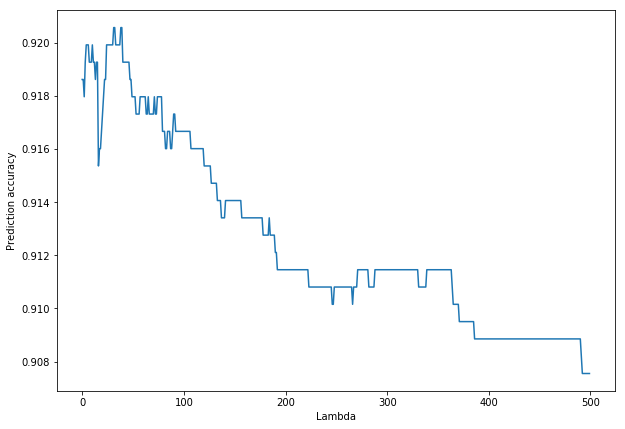

In [56]:
nextplot()
plt.plot(range(500), accuracy)
plt.xlabel("Lambda")
plt.ylabel("Prediction accuracy")
#plt.savefig('4_3.png')

Text(0,0.5,'Train data log likelihood')

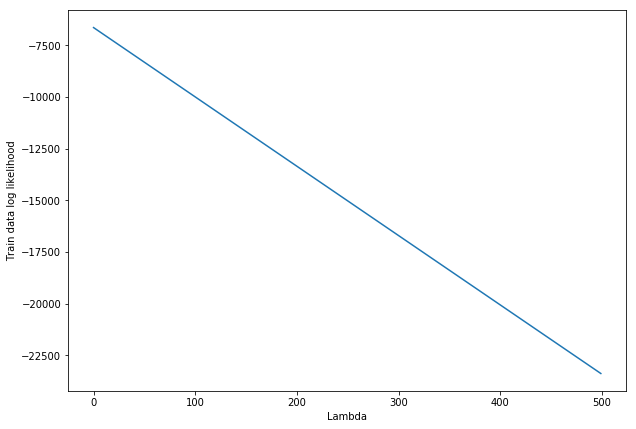

In [57]:
nextplot()
plt.plot(range(500), train_loglik)
plt.xlabel("Lambda")
plt.ylabel("Train data log likelihood")
#plt.savefig('4_1.png')

Text(0,0.5,'Test data log likelihood')

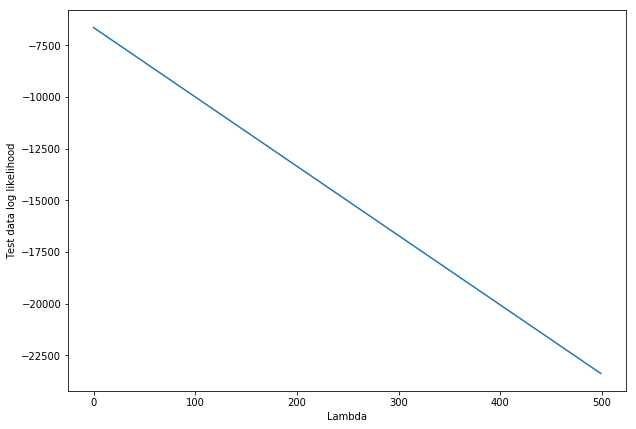

In [58]:
nextplot()
plt.plot(range(500), train_loglik)
plt.xlabel("Lambda")
plt.ylabel("Test data log likelihood")
#plt.savefig('4_2.png')

## 4c Composition of Weight Vector

Text(0,0.5,'Weight sum')

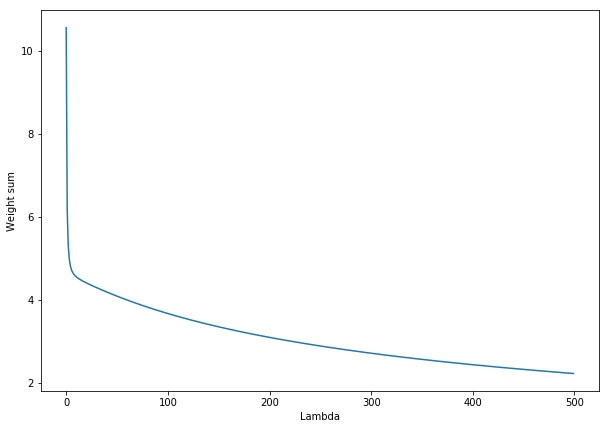

In [59]:
# YOUR CODE HERE
w_lambda = np.zeros(lambdas)
for lambda_ in range(lambdas):
    w_lambda[lambda_] = np.sum(wz_gd_l2[:,lambda_])
    
nextplot()
plt.plot(range(500), w_lambda)
plt.xlabel("Lambda")
plt.ylabel("Weight sum")
#plt.savefig('4_4.png')


# 5. exploration

In [60]:
#Gradient descent on the original data without using z-scores
lambda_=100
w_gd, v_gd, e_gd = optimize(gd(y, X), w0, nepochs=500)

/Users/soumya/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in exp
  import sys
/Users/soumya/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys
/Users/soumya/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app


Epoch   0: f=       nan, eps=0.010000000
Epoch   1: f=       nan, eps=0.010500000
Epoch   2: f=       nan, eps=0.011025000
Epoch   3: f=       nan, eps=0.011576250
Epoch   4: f=       nan, eps=0.012155063
Epoch   5: f=       nan, eps=0.012762816
Epoch   6: f=       nan, eps=0.013400956
Epoch   7: f=       nan, eps=0.014071004
Epoch   8: f=       nan, eps=0.014774554
Epoch   9: f=       nan, eps=0.015513282
Epoch  10: f=       nan, eps=0.016288946
Epoch  11: f=       nan, eps=0.017103394
Epoch  12: f=       nan, eps=0.017958563
Epoch  13: f=       nan, eps=0.018856491
Epoch  14: f=       nan, eps=0.019799316
Epoch  15: f=       nan, eps=0.020789282
Epoch  16: f=       nan, eps=0.021828746
Epoch  17: f=       nan, eps=0.022920183
Epoch  18: f=       nan, eps=0.024066192
Epoch  19: f=       nan, eps=0.025269502
Epoch  20: f=       nan, eps=0.026532977
Epoch  21: f=       nan, eps=0.027859626
Epoch  22: f=       nan, eps=0.029252607
Epoch  23: f=       nan, eps=0.030715238
Epoch  24: f=   

Epoch 309: f=       nan, eps=35277.143573269
Epoch 310: f=       nan, eps=37041.000751932
Epoch 311: f=       nan, eps=38893.050789529
Epoch 312: f=       nan, eps=40837.703329005
Epoch 313: f=       nan, eps=42879.588495455
Epoch 314: f=       nan, eps=45023.567920228
Epoch 315: f=       nan, eps=47274.746316239
Epoch 316: f=       nan, eps=49638.483632051
Epoch 317: f=       nan, eps=52120.407813654
Epoch 318: f=       nan, eps=54726.428204337
Epoch 319: f=       nan, eps=57462.749614553
Epoch 320: f=       nan, eps=60335.887095281
Epoch 321: f=       nan, eps=63352.681450045
Epoch 322: f=       nan, eps=66520.315522547
Epoch 323: f=       nan, eps=69846.331298675
Epoch 324: f=       nan, eps=73338.647863609
Epoch 325: f=       nan, eps=77005.580256789
Epoch 326: f=       nan, eps=80855.859269628
Epoch 327: f=       nan, eps=84898.652233110
Epoch 328: f=       nan, eps=89143.584844765
Epoch 329: f=       nan, eps=93600.764087004
Epoch 330: f=       nan, eps=98280.802291354
Epoch 331:

In [61]:
#Add a bias feature (make sure that you do not scale it)
X_bias = np.c_[ Xz, np.ones(N) ]
w0_b = np.random.normal(size=D+1)
wb_gd, vb_gd, eb_gd = optimize(gd(y, X_bias), w0_b, nepochs=500)

yhat_b = predict(X_bias, wb_gd)
ypred_b = classify(X_bias, wb_gd)
acc_b = sklearn.metrics.accuracy_score(y, ypred_b)
acc_b

Epoch   0: f=  6670.328, eps=0.010000000
Epoch   1: f=  4036.983, eps=0.010500000
Epoch   2: f=  2940.039, eps=0.011025000
Epoch   3: f=  2141.266, eps=0.011576250
Epoch   4: f=  1608.205, eps=0.012155063
Epoch   5: f=  1296.939, eps=0.012762816
Epoch   6: f=  1089.706, eps=0.013400956
Epoch   7: f=   969.514, eps=0.014071004
Epoch   8: f=   889.018, eps=0.014774554
Epoch   9: f=   869.466, eps=0.015513282
Epoch  10: f=  1072.394, eps=0.007756641
Epoch  11: f=  1084.624, eps=0.003878321
Epoch  12: f=   797.963, eps=0.004072237
Epoch  13: f=   740.266, eps=0.004275848
Epoch  14: f=   723.614, eps=0.004489641
Epoch  15: f=   714.417, eps=0.004714123
Epoch  16: f=   706.097, eps=0.004949829
Epoch  17: f=   698.219, eps=0.005197320
Epoch  18: f=   690.640, eps=0.005457186
Epoch  19: f=   683.391, eps=0.005730046
Epoch  20: f=   676.543, eps=0.006016548
Epoch  21: f=   670.075, eps=0.006317375
Epoch  22: f=   664.362, eps=0.006633244
Epoch  23: f=   658.865, eps=0.006964906
Epoch  24: f=   

Epoch 306: f=   594.598, eps=0.010953165
Epoch 307: f=   594.948, eps=0.005476582
Epoch 308: f=   595.172, eps=0.002738291
Epoch 309: f=   594.476, eps=0.002875206
Epoch 310: f=   594.455, eps=0.003018966
Epoch 311: f=   594.441, eps=0.003169914
Epoch 312: f=   594.425, eps=0.003328410
Epoch 313: f=   594.409, eps=0.003494831
Epoch 314: f=   594.393, eps=0.003669572
Epoch 315: f=   594.375, eps=0.003853051
Epoch 316: f=   594.357, eps=0.004045703
Epoch 317: f=   594.337, eps=0.004247988
Epoch 318: f=   594.317, eps=0.004460388
Epoch 319: f=   594.296, eps=0.004683407
Epoch 320: f=   594.274, eps=0.004917578
Epoch 321: f=   594.251, eps=0.005163456
Epoch 322: f=   594.227, eps=0.005421629
Epoch 323: f=   594.201, eps=0.005692711
Epoch 324: f=   594.175, eps=0.005977346
Epoch 325: f=   594.147, eps=0.006276214
Epoch 326: f=   594.118, eps=0.006590024
Epoch 327: f=   594.087, eps=0.006919525
Epoch 328: f=   594.056, eps=0.007265502
Epoch 329: f=   594.022, eps=0.007628777
Epoch 330: f=   

0.9298531810766721

In [62]:
#Cross validation
N=50
K=5
Kf = KFold(n_splits=K, shuffle=True)
acc_mle = np.zeros(K)
acc_map = np.zeros(K)

i=0

for i_train, i_test in Kf.split(Xz):
    
    #MLE
    wz_gd, vz_gd, ez_gd = optimize(gd(y[i_train], Xz[i_train]), w0, nepochs=500)

    yhat_mle = predict(Xz[i_test], wz_gd)
    ypred_mle = classify(Xz[i_test], wz_gd)
    acc_mle[i] = sklearn.metrics.accuracy_score(y[i_test], ypred_mle)
    
    #MAP
    wz_gd_l2, vz_gd_l2, ez_gd_l2 = optimize(gd_l2(y[i_train], Xz[i_train], lambda_), w0, nepochs=500)

    yhat_map = predict(Xz[i_test], wz_gd_l2)
    ypred_map = classify(Xz[i_test], wz_gd_l2)
    acc_map[i] = sklearn.metrics.accuracy_score(y[i_test], ypred_map)
    
    i = i+1

accuracy_mle = np.average(acc_mle)
accuracy_map = np.average(acc_map)
print(accuracy_mle)
print(accuracy_map)

Epoch   0: f=  5318.350, eps=0.010000000
Epoch   1: f=  2705.756, eps=0.010500000
Epoch   2: f=  1702.719, eps=0.011025000
Epoch   3: f=  1246.981, eps=0.011576250
Epoch   4: f=   965.223, eps=0.012155063
Epoch   5: f=   831.684, eps=0.012762816
Epoch   6: f=   754.477, eps=0.013400956
Epoch   7: f=   708.814, eps=0.014071004
Epoch   8: f=   694.019, eps=0.014774554
Epoch   9: f=   689.262, eps=0.015513282
Epoch  10: f=   788.297, eps=0.007756641
Epoch  11: f=   637.983, eps=0.008144473
Epoch  12: f=   595.856, eps=0.008551697
Epoch  13: f=   585.452, eps=0.008979282
Epoch  14: f=   579.832, eps=0.009428246
Epoch  15: f=   577.738, eps=0.009899658
Epoch  16: f=   571.818, eps=0.010394641
Epoch  17: f=   574.113, eps=0.005197320
Epoch  18: f=   560.425, eps=0.005457186
Epoch  19: f=   557.232, eps=0.005730046
Epoch  20: f=   555.248, eps=0.006016548
Epoch  21: f=   553.284, eps=0.006317375
Epoch  22: f=   551.643, eps=0.006633244
Epoch  23: f=   550.001, eps=0.006964906
Epoch  24: f=   

Epoch 200: f=   529.731, eps=0.011194610
Epoch 201: f=   529.696, eps=0.011754341
Epoch 202: f=   529.658, eps=0.012342058
Epoch 203: f=   529.619, eps=0.012959161
Epoch 204: f=   529.582, eps=0.013607119
Epoch 205: f=   529.595, eps=0.006803559
Epoch 206: f=   529.634, eps=0.003401780
Epoch 207: f=   529.513, eps=0.003571869
Epoch 208: f=   529.492, eps=0.003750462
Epoch 209: f=   529.480, eps=0.003937985
Epoch 210: f=   529.468, eps=0.004134885
Epoch 211: f=   529.455, eps=0.004341629
Epoch 212: f=   529.441, eps=0.004558710
Epoch 213: f=   529.427, eps=0.004786646
Epoch 214: f=   529.412, eps=0.005025978
Epoch 215: f=   529.396, eps=0.005277277
Epoch 216: f=   529.380, eps=0.005541141
Epoch 217: f=   529.362, eps=0.005818198
Epoch 218: f=   529.344, eps=0.006109108
Epoch 219: f=   529.325, eps=0.006414563
Epoch 220: f=   529.305, eps=0.006735291
Epoch 221: f=   529.284, eps=0.007072056
Epoch 222: f=   529.262, eps=0.007425659
Epoch 223: f=   529.239, eps=0.007796941
Epoch 224: f=   

Epoch 411: f=   525.833, eps=0.010206597
Epoch 412: f=   525.807, eps=0.010716927
Epoch 413: f=   525.784, eps=0.011252773
Epoch 414: f=   525.798, eps=0.005626387
Epoch 415: f=   525.793, eps=0.005907706
Epoch 416: f=   525.789, eps=0.006203091
Epoch 417: f=   525.819, eps=0.003101546
Epoch 418: f=   525.698, eps=0.003256623
Epoch 419: f=   525.690, eps=0.003419454
Epoch 420: f=   525.681, eps=0.003590427
Epoch 421: f=   525.672, eps=0.003769948
Epoch 422: f=   525.662, eps=0.003958445
Epoch 423: f=   525.652, eps=0.004156368
Epoch 424: f=   525.642, eps=0.004364186
Epoch 425: f=   525.631, eps=0.004582395
Epoch 426: f=   525.619, eps=0.004811515
Epoch 427: f=   525.607, eps=0.005052091
Epoch 428: f=   525.594, eps=0.005304695
Epoch 429: f=   525.581, eps=0.005569930
Epoch 430: f=   525.567, eps=0.005848427
Epoch 431: f=   525.552, eps=0.006140848
Epoch 432: f=   525.537, eps=0.006447890
Epoch 433: f=   525.520, eps=0.006770285
Epoch 434: f=   525.503, eps=0.007108799
Epoch 435: f=   

Epoch 151: f=   819.350, eps=0.000000003
Epoch 152: f=   819.350, eps=0.000000004
Epoch 153: f=   819.350, eps=0.000000004
Epoch 154: f=   819.350, eps=0.000000004
Epoch 155: f=   819.350, eps=0.000000002
Epoch 156: f=   819.350, eps=0.000000002
Epoch 157: f=   819.350, eps=0.000000002
Epoch 158: f=   819.350, eps=0.000000002
Epoch 159: f=   819.350, eps=0.000000002
Epoch 160: f=   819.350, eps=0.000000003
Epoch 161: f=   819.350, eps=0.000000003
Epoch 162: f=   819.350, eps=0.000000003
Epoch 163: f=   819.350, eps=0.000000003
Epoch 164: f=   819.350, eps=0.000000003
Epoch 165: f=   819.350, eps=0.000000003
Epoch 166: f=   819.350, eps=0.000000002
Epoch 167: f=   819.350, eps=0.000000002
Epoch 168: f=   819.350, eps=0.000000002
Epoch 169: f=   819.350, eps=0.000000002
Epoch 170: f=   819.350, eps=0.000000002
Epoch 171: f=   819.350, eps=0.000000002
Epoch 172: f=   819.350, eps=0.000000002
Epoch 173: f=   819.350, eps=0.000000001
Epoch 174: f=   819.350, eps=0.000000001
Epoch 175: f=   

Epoch  46: f=   537.788, eps=0.004850992
Epoch  47: f=   537.665, eps=0.005093542
Epoch  48: f=   537.555, eps=0.005348219
Epoch  49: f=   537.456, eps=0.005615630
Epoch  50: f=   537.362, eps=0.005896411
Epoch  51: f=   537.274, eps=0.006191232
Epoch  52: f=   537.191, eps=0.006500794
Epoch  53: f=   537.123, eps=0.006825833
Epoch  54: f=   537.075, eps=0.007167125
Epoch  55: f=   537.105, eps=0.003583562
Epoch  56: f=   536.886, eps=0.003762741
Epoch  57: f=   536.842, eps=0.003950878
Epoch  58: f=   536.803, eps=0.004148421
Epoch  59: f=   536.763, eps=0.004355843
Epoch  60: f=   536.724, eps=0.004573635
Epoch  61: f=   536.683, eps=0.004802316
Epoch  62: f=   536.643, eps=0.005042432
Epoch  63: f=   536.602, eps=0.005294554
Epoch  64: f=   536.560, eps=0.005559282
Epoch  65: f=   536.518, eps=0.005837246
Epoch  66: f=   536.476, eps=0.006129108
Epoch  67: f=   536.433, eps=0.006435563
Epoch  68: f=   536.390, eps=0.006757341
Epoch  69: f=   536.346, eps=0.007095208
Epoch  70: f=   

Epoch 276: f=   531.661, eps=0.005322062
Epoch 277: f=   531.646, eps=0.005588165
Epoch 278: f=   531.630, eps=0.005867574
Epoch 279: f=   531.613, eps=0.006160952
Epoch 280: f=   531.595, eps=0.006469000
Epoch 281: f=   531.577, eps=0.006792450
Epoch 282: f=   531.558, eps=0.007132072
Epoch 283: f=   531.538, eps=0.007488676
Epoch 284: f=   531.516, eps=0.007863110
Epoch 285: f=   531.494, eps=0.008256265
Epoch 286: f=   531.471, eps=0.008669078
Epoch 287: f=   531.446, eps=0.009102532
Epoch 288: f=   531.421, eps=0.009557659
Epoch 289: f=   531.394, eps=0.010035542
Epoch 290: f=   531.366, eps=0.010537319
Epoch 291: f=   531.336, eps=0.011064185
Epoch 292: f=   531.306, eps=0.011617394
Epoch 293: f=   531.274, eps=0.012198264
Epoch 294: f=   531.250, eps=0.012808177
Epoch 295: f=   531.348, eps=0.006404089
Epoch 296: f=   531.440, eps=0.003202044
Epoch 297: f=   531.178, eps=0.003362147
Epoch 298: f=   531.168, eps=0.003530254
Epoch 299: f=   531.158, eps=0.003706767
Epoch 300: f=   

Epoch 499: f=   527.924, eps=0.004149581
Result after 500 epochs: f=527.8726931313831
Epoch   0: f=  8656.461, eps=0.010000000
Epoch   1: f= 15256.001, eps=0.005000000
Epoch   2: f=  3540.988, eps=0.005250000
Epoch   3: f=  1053.779, eps=0.005512500
Epoch   4: f=   927.523, eps=0.005788125
Epoch   5: f=  1169.892, eps=0.002894063
Epoch   6: f=  1011.445, eps=0.003038766
Epoch   7: f=   846.685, eps=0.003190704
Epoch   8: f=   845.731, eps=0.003350239
Epoch   9: f=   844.778, eps=0.003517751
Epoch  10: f=   863.962, eps=0.001758876
Epoch  11: f=   823.290, eps=0.001846819
Epoch  12: f=   822.846, eps=0.001939160
Epoch  13: f=   822.814, eps=0.002036118
Epoch  14: f=   822.810, eps=0.002137924
Epoch  15: f=   822.809, eps=0.002244820
Epoch  16: f=   822.809, eps=0.002357061
Epoch  17: f=   822.809, eps=0.002474914
Epoch  18: f=   822.809, eps=0.002598660
Epoch  19: f=   822.809, eps=0.002728593
Epoch  20: f=   822.809, eps=0.002865023
Epoch  21: f=   822.809, eps=0.003008274
Epoch  22: f

Epoch 232: f=   822.809, eps=0.000000004
Epoch 233: f=   822.809, eps=0.000000002
Epoch 234: f=   822.809, eps=0.000000002
Epoch 235: f=   822.809, eps=0.000000002
Epoch 236: f=   822.809, eps=0.000000001
Epoch 237: f=   822.809, eps=0.000000001
Epoch 238: f=   822.809, eps=0.000000001
Epoch 239: f=   822.809, eps=0.000000001
Epoch 240: f=   822.809, eps=0.000000001
Epoch 241: f=   822.809, eps=0.000000001
Epoch 242: f=   822.809, eps=0.000000001
Epoch 243: f=   822.809, eps=0.000000001
Epoch 244: f=   822.809, eps=0.000000001
Epoch 245: f=   822.809, eps=0.000000001
Epoch 246: f=   822.809, eps=0.000000001
Epoch 247: f=   822.809, eps=0.000000001
Epoch 248: f=   822.809, eps=0.000000001
Epoch 249: f=   822.809, eps=0.000000001
Epoch 250: f=   822.809, eps=0.000000001
Epoch 251: f=   822.809, eps=0.000000001
Epoch 252: f=   822.809, eps=0.000000001
Epoch 253: f=   822.809, eps=0.000000001
Epoch 254: f=   822.809, eps=0.000000001
Epoch 255: f=   822.809, eps=0.000000000
Epoch 256: f=   

Epoch 464: f=   822.809, eps=0.000000001
Epoch 465: f=   822.809, eps=0.000000001
Epoch 466: f=   822.809, eps=0.000000001
Epoch 467: f=   822.809, eps=0.000000001
Epoch 468: f=   822.809, eps=0.000000000
Epoch 469: f=   822.809, eps=0.000000000
Epoch 470: f=   822.809, eps=0.000000000
Epoch 471: f=   822.809, eps=0.000000000
Epoch 472: f=   822.809, eps=0.000000000
Epoch 473: f=   822.809, eps=0.000000000
Epoch 474: f=   822.809, eps=0.000000000
Epoch 475: f=   822.809, eps=0.000000000
Epoch 476: f=   822.809, eps=0.000000000
Epoch 477: f=   822.809, eps=0.000000001
Epoch 478: f=   822.809, eps=0.000000001
Epoch 479: f=   822.809, eps=0.000000001
Epoch 480: f=   822.809, eps=0.000000001
Epoch 481: f=   822.809, eps=0.000000001
Epoch 482: f=   822.809, eps=0.000000001
Epoch 483: f=   822.809, eps=0.000000001
Epoch 484: f=   822.809, eps=0.000000001
Epoch 485: f=   822.809, eps=0.000000001
Epoch 486: f=   822.809, eps=0.000000001
Epoch 487: f=   822.809, eps=0.000000001
Epoch 488: f=   

Epoch 203: f=   490.435, eps=0.006171029
Epoch 204: f=   490.417, eps=0.006479580
Epoch 205: f=   490.398, eps=0.006803559
Epoch 206: f=   490.378, eps=0.007143737
Epoch 207: f=   490.357, eps=0.007500924
Epoch 208: f=   490.336, eps=0.007875970
Epoch 209: f=   490.313, eps=0.008269769
Epoch 210: f=   490.290, eps=0.008683257
Epoch 211: f=   490.265, eps=0.009117420
Epoch 212: f=   490.239, eps=0.009573291
Epoch 213: f=   490.212, eps=0.010051956
Epoch 214: f=   490.184, eps=0.010554554
Epoch 215: f=   490.157, eps=0.011082281
Epoch 216: f=   490.138, eps=0.011636395
Epoch 217: f=   490.199, eps=0.005818198
Epoch 218: f=   490.160, eps=0.006109108
Epoch 219: f=   490.142, eps=0.006414563
Epoch 220: f=   490.138, eps=0.006735291
Epoch 221: f=   490.161, eps=0.003367646
Epoch 222: f=   490.015, eps=0.003536028
Epoch 223: f=   490.004, eps=0.003712829
Epoch 224: f=   489.994, eps=0.003898471
Epoch 225: f=   489.984, eps=0.004093394
Epoch 226: f=   489.973, eps=0.004298064
Epoch 227: f=   

Epoch 421: f=   487.149, eps=0.007916891
Epoch 422: f=   487.137, eps=0.008312735
Epoch 423: f=   487.125, eps=0.008728372
Epoch 424: f=   487.112, eps=0.009164791
Epoch 425: f=   487.098, eps=0.009623030
Epoch 426: f=   487.084, eps=0.010104182
Epoch 427: f=   487.069, eps=0.010609391
Epoch 428: f=   487.054, eps=0.011139860
Epoch 429: f=   487.038, eps=0.011696853
Epoch 430: f=   487.025, eps=0.012281696
Epoch 431: f=   487.045, eps=0.006140848
Epoch 432: f=   487.037, eps=0.006447890
Epoch 433: f=   487.038, eps=0.003223945
Epoch 434: f=   486.981, eps=0.003385142
Epoch 435: f=   486.976, eps=0.003554400
Epoch 436: f=   486.971, eps=0.003732120
Epoch 437: f=   486.965, eps=0.003918726
Epoch 438: f=   486.960, eps=0.004114662
Epoch 439: f=   486.954, eps=0.004320395
Epoch 440: f=   486.948, eps=0.004536415
Epoch 441: f=   486.942, eps=0.004763235
Epoch 442: f=   486.935, eps=0.005001397
Epoch 443: f=   486.928, eps=0.005251467
Epoch 444: f=   486.920, eps=0.005514040
Epoch 445: f=   

Epoch 346: f=   807.560, eps=0.000000001
Epoch 347: f=   807.560, eps=0.000000001
Epoch 348: f=   807.560, eps=0.000000002
Epoch 349: f=   807.560, eps=0.000000002
Epoch 350: f=   807.560, eps=0.000000002
Epoch 351: f=   807.560, eps=0.000000002
Epoch 352: f=   807.560, eps=0.000000002
Epoch 353: f=   807.560, eps=0.000000002
Epoch 354: f=   807.560, eps=0.000000002
Epoch 355: f=   807.560, eps=0.000000002
Epoch 356: f=   807.560, eps=0.000000001
Epoch 357: f=   807.560, eps=0.000000001
Epoch 358: f=   807.560, eps=0.000000001
Epoch 359: f=   807.560, eps=0.000000001
Epoch 360: f=   807.560, eps=0.000000001
Epoch 361: f=   807.560, eps=0.000000001
Epoch 362: f=   807.560, eps=0.000000001
Epoch 363: f=   807.560, eps=0.000000002
Epoch 364: f=   807.560, eps=0.000000002
Epoch 365: f=   807.560, eps=0.000000002
Epoch 366: f=   807.560, eps=0.000000002
Epoch 367: f=   807.560, eps=0.000000002
Epoch 368: f=   807.560, eps=0.000000002
Epoch 369: f=   807.560, eps=0.000000002
Epoch 370: f=   

Epoch  69: f=   495.419, eps=0.003378671
Epoch  70: f=   495.326, eps=0.003547604
Epoch  71: f=   495.236, eps=0.003724984
Epoch  72: f=   495.145, eps=0.003911234
Epoch  73: f=   495.054, eps=0.004106795
Epoch  74: f=   494.961, eps=0.004312135
Epoch  75: f=   494.868, eps=0.004527742
Epoch  76: f=   494.774, eps=0.004754129
Epoch  77: f=   494.680, eps=0.004991835
Epoch  78: f=   494.585, eps=0.005241427
Epoch  79: f=   494.489, eps=0.005503499
Epoch  80: f=   494.394, eps=0.005778674
Epoch  81: f=   494.300, eps=0.006067607
Epoch  82: f=   494.210, eps=0.006370988
Epoch  83: f=   494.135, eps=0.006689537
Epoch  84: f=   494.132, eps=0.007024014
Epoch  85: f=   494.345, eps=0.003512007
Epoch  86: f=   494.006, eps=0.003687607
Epoch  87: f=   493.850, eps=0.003871988
Epoch  88: f=   493.791, eps=0.004065587
Epoch  89: f=   493.735, eps=0.004268866
Epoch  90: f=   493.684, eps=0.004482310
Epoch  91: f=   493.632, eps=0.004706425
Epoch  92: f=   493.584, eps=0.004941746
Epoch  93: f=   

Epoch 490: f=   488.828, eps=0.005617199
Epoch 491: f=   488.822, eps=0.005898059
Epoch 492: f=   488.819, eps=0.006192962
Epoch 493: f=   488.828, eps=0.003096481
Epoch 494: f=   488.803, eps=0.003251305
Epoch 495: f=   488.797, eps=0.003413870
Epoch 496: f=   488.792, eps=0.003584564
Epoch 497: f=   488.787, eps=0.003763792
Epoch 498: f=   488.782, eps=0.003951982
Epoch 499: f=   488.777, eps=0.004149581
Result after 500 epochs: f=488.77201582303667
Epoch   0: f=  8655.271, eps=0.010000000
Epoch   1: f= 15696.346, eps=0.005000000
Epoch   2: f=  3674.875, eps=0.005250000
Epoch   3: f=  1051.512, eps=0.005512500
Epoch   4: f=   876.210, eps=0.005788125
Epoch   5: f=  1011.245, eps=0.002894063
Epoch   6: f=   908.929, eps=0.003038766
Epoch   7: f=   831.856, eps=0.003190704
Epoch   8: f=   832.271, eps=0.001595352
Epoch   9: f=   809.736, eps=0.001675120
Epoch  10: f=   809.307, eps=0.001758876
Epoch  11: f=   809.273, eps=0.001846819
Epoch  12: f=   809.263, eps=0.001939160
Epoch  13: 

Epoch 217: f=   809.257, eps=0.000000001
Epoch 218: f=   809.257, eps=0.000000001
Epoch 219: f=   809.257, eps=0.000000001
Epoch 220: f=   809.257, eps=0.000000001
Epoch 221: f=   809.257, eps=0.000000001
Epoch 222: f=   809.257, eps=0.000000001
Epoch 223: f=   809.257, eps=0.000000001
Epoch 224: f=   809.257, eps=0.000000001
Epoch 225: f=   809.257, eps=0.000000001
Epoch 226: f=   809.257, eps=0.000000002
Epoch 227: f=   809.257, eps=0.000000002
Epoch 228: f=   809.257, eps=0.000000002
Epoch 229: f=   809.257, eps=0.000000002
Epoch 230: f=   809.257, eps=0.000000002
Epoch 231: f=   809.257, eps=0.000000002
Epoch 232: f=   809.257, eps=0.000000002
Epoch 233: f=   809.257, eps=0.000000002
Epoch 234: f=   809.257, eps=0.000000002
Epoch 235: f=   809.257, eps=0.000000002
Epoch 236: f=   809.257, eps=0.000000003
Epoch 237: f=   809.257, eps=0.000000003
Epoch 238: f=   809.257, eps=0.000000003
Epoch 239: f=   809.257, eps=0.000000003
Epoch 240: f=   809.257, eps=0.000000003
Epoch 241: f=   

Epoch 452: f=   809.257, eps=0.000000003
Epoch 453: f=   809.257, eps=0.000000001
Epoch 454: f=   809.257, eps=0.000000002
Epoch 455: f=   809.257, eps=0.000000002
Epoch 456: f=   809.257, eps=0.000000002
Epoch 457: f=   809.257, eps=0.000000001
Epoch 458: f=   809.257, eps=0.000000001
Epoch 459: f=   809.257, eps=0.000000001
Epoch 460: f=   809.257, eps=0.000000001
Epoch 461: f=   809.257, eps=0.000000001
Epoch 462: f=   809.257, eps=0.000000001
Epoch 463: f=   809.257, eps=0.000000001
Epoch 464: f=   809.257, eps=0.000000001
Epoch 465: f=   809.257, eps=0.000000001
Epoch 466: f=   809.257, eps=0.000000001
Epoch 467: f=   809.257, eps=0.000000001
Epoch 468: f=   809.257, eps=0.000000001
Epoch 469: f=   809.257, eps=0.000000002
Epoch 470: f=   809.257, eps=0.000000002
Epoch 471: f=   809.257, eps=0.000000002
Epoch 472: f=   809.257, eps=0.000000002
Epoch 473: f=   809.257, eps=0.000000002
Epoch 474: f=   809.257, eps=0.000000002
Epoch 475: f=   809.257, eps=0.000000002
Epoch 476: f=   

Epoch 185: f=   542.435, eps=0.011308078
Epoch 186: f=   542.468, eps=0.005654039
Epoch 187: f=   542.516, eps=0.002827019
Epoch 188: f=   542.366, eps=0.002968370
Epoch 189: f=   542.356, eps=0.003116789
Epoch 190: f=   542.345, eps=0.003272628
Epoch 191: f=   542.335, eps=0.003436260
Epoch 192: f=   542.324, eps=0.003608073
Epoch 193: f=   542.312, eps=0.003788476
Epoch 194: f=   542.300, eps=0.003977900
Epoch 195: f=   542.287, eps=0.004176795
Epoch 196: f=   542.274, eps=0.004385635
Epoch 197: f=   542.260, eps=0.004604917
Epoch 198: f=   542.245, eps=0.004835163
Epoch 199: f=   542.229, eps=0.005076921
Epoch 200: f=   542.213, eps=0.005330767
Epoch 201: f=   542.196, eps=0.005597305
Epoch 202: f=   542.178, eps=0.005877170
Epoch 203: f=   542.160, eps=0.006171029
Epoch 204: f=   542.140, eps=0.006479580
Epoch 205: f=   542.120, eps=0.006803559
Epoch 206: f=   542.098, eps=0.007143737
Epoch 207: f=   542.076, eps=0.007500924
Epoch 208: f=   542.052, eps=0.007875970
Epoch 209: f=   

Epoch 426: f=   538.637, eps=0.010104182
Epoch 427: f=   538.614, eps=0.010609391
Epoch 428: f=   538.589, eps=0.011139860
Epoch 429: f=   538.564, eps=0.011696853
Epoch 430: f=   538.545, eps=0.012281696
Epoch 431: f=   538.643, eps=0.006140848
Epoch 432: f=   538.689, eps=0.003070424
Epoch 433: f=   538.518, eps=0.003223945
Epoch 434: f=   538.481, eps=0.003385142
Epoch 435: f=   538.473, eps=0.003554400
Epoch 436: f=   538.464, eps=0.003732120
Epoch 437: f=   538.456, eps=0.003918726
Epoch 438: f=   538.447, eps=0.004114662
Epoch 439: f=   538.437, eps=0.004320395
Epoch 440: f=   538.427, eps=0.004536415
Epoch 441: f=   538.417, eps=0.004763235
Epoch 442: f=   538.406, eps=0.005001397
Epoch 443: f=   538.395, eps=0.005251467
Epoch 444: f=   538.383, eps=0.005514040
Epoch 445: f=   538.370, eps=0.005789742
Epoch 446: f=   538.357, eps=0.006079230
Epoch 447: f=   538.344, eps=0.006383191
Epoch 448: f=   538.329, eps=0.006702351
Epoch 449: f=   538.314, eps=0.007037468
Epoch 450: f=   

Epoch 162: f=   823.117, eps=0.000000006
Epoch 163: f=   823.117, eps=0.000000006
Epoch 164: f=   823.117, eps=0.000000006
Epoch 165: f=   823.117, eps=0.000000007
Epoch 166: f=   823.117, eps=0.000000007
Epoch 167: f=   823.117, eps=0.000000004
Epoch 168: f=   823.117, eps=0.000000004
Epoch 169: f=   823.117, eps=0.000000004
Epoch 170: f=   823.117, eps=0.000000004
Epoch 171: f=   823.117, eps=0.000000004
Epoch 172: f=   823.117, eps=0.000000005
Epoch 173: f=   823.117, eps=0.000000005
Epoch 174: f=   823.117, eps=0.000000005
Epoch 175: f=   823.117, eps=0.000000002
Epoch 176: f=   823.117, eps=0.000000003
Epoch 177: f=   823.117, eps=0.000000003
Epoch 178: f=   823.117, eps=0.000000003
Epoch 179: f=   823.117, eps=0.000000003
Epoch 180: f=   823.117, eps=0.000000003
Epoch 181: f=   823.117, eps=0.000000003
Epoch 182: f=   823.117, eps=0.000000002
Epoch 183: f=   823.117, eps=0.000000002
Epoch 184: f=   823.117, eps=0.000000001
Epoch 185: f=   823.117, eps=0.000000001
Epoch 186: f=   

Epoch 400: f=   823.117, eps=0.000000001
Epoch 401: f=   823.117, eps=0.000000001
Epoch 402: f=   823.117, eps=0.000000001
Epoch 403: f=   823.117, eps=0.000000001
Epoch 404: f=   823.117, eps=0.000000001
Epoch 405: f=   823.117, eps=0.000000001
Epoch 406: f=   823.117, eps=0.000000001
Epoch 407: f=   823.117, eps=0.000000001
Epoch 408: f=   823.117, eps=0.000000002
Epoch 409: f=   823.117, eps=0.000000002
Epoch 410: f=   823.117, eps=0.000000002
Epoch 411: f=   823.117, eps=0.000000002
Epoch 412: f=   823.117, eps=0.000000002
Epoch 413: f=   823.117, eps=0.000000002
Epoch 414: f=   823.117, eps=0.000000002
Epoch 415: f=   823.117, eps=0.000000002
Epoch 416: f=   823.117, eps=0.000000002
Epoch 417: f=   823.117, eps=0.000000002
Epoch 418: f=   823.117, eps=0.000000002
Epoch 419: f=   823.117, eps=0.000000003
Epoch 420: f=   823.117, eps=0.000000003
Epoch 421: f=   823.117, eps=0.000000003
Epoch 422: f=   823.117, eps=0.000000003
Epoch 423: f=   823.117, eps=0.000000003
Epoch 424: f=   

In [63]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0, solver='sag').fit(Xz, y)
ypred_s = clf.predict(Xtestz)
acc_s = sklearn.metrics.accuracy_score(ytest, ypred_s)

print(acc_s)
print(clf.coef_)

0.9173177083333334
[[-0.01494807 -0.22098447  0.13271044  0.51343368  0.2600243   0.1828934
   0.98365153  0.31543829  0.1405519   0.06181832 -0.05941421 -0.15161588
  -0.06103509  0.02478756  0.3060293   0.80284363  0.48688514  0.07939427
   0.26962669  0.22839105  0.2541367   0.49126532  0.8859313   0.26730405
  -1.7144732  -0.69799738 -1.3591666  -0.10005568 -0.57347173 -0.21962732
  -0.273358   -0.19311801 -0.44872499 -0.29478484 -0.29291997  0.3408891
   0.01776349 -0.14975602 -0.38981782 -0.10122188 -0.52067372 -0.91748739
  -0.32645759 -0.71592124 -0.84445832 -1.13736971 -0.14468598 -0.68279027
  -0.37438103 -0.17275848 -0.13098093  0.23584931  1.63947174  0.45473962
  -0.04493114  0.73956352  0.40784358]]


/Users/soumya/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/sag.py:334: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


## 5 Exploration (optional)

### 5 Exploration: PyTorch

In [64]:
# if you want to experiment, here is an implementation of logistic
# regression in PyTorch
import math
import torch
import torch.nn as nn
import torch.utils.data
import torch.nn.functional as F

# prepare the data
Xztorch = torch.FloatTensor(Xz)
ytorch = torch.LongTensor(y)
train = torch.utils.data.TensorDataset(Xztorch, ytorch)


# manual implementation of logistic regression (without bias)
class LogisticRegression(nn.Module):
    def __init__(self, D, C):
        super(LogisticRegression, self).__init__()
        self.weights = torch.nn.Parameter(
            torch.randn(D, C) / math.sqrt(D)
        )  # xavier initialization
        self.register_parameter("W", self.weights)

    def forward(self, x):
        out = torch.matmul(x, self.weights)
        out = F.log_softmax(out)
        return out


# define the objective and update function. here we ignore the learning rates
# and parameters given to us by optimize (they are stored in the PyTorch model
# and optimizer, resp., instead)
def opt_pytorch():
    #model = LogisticRegression(D, 2)
    #criterion = nn.NLLLoss(reduction="sum")
    # change the next line to try different optimizers
#     optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
#     optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
#     optimizer = torch.optim.ASGD(model.parameters(), lr=learning_rate)
    optimizer = torch.optim.Adagrad(model.parameters(), lr=learning_rate)
#     optimizer = torch.optim.Adadelta(model.parameters(), lr=learning_rate)

    def objective(_):
        outputs = model(Xztorch)
        return criterion(outputs, ytorch)

    def update(_1, _2):
        for i, (examples, labels) in enumerate(train_loader):
            outputs = model(examples)
            loss = criterion(outputs, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        W = model.state_dict()["W"]
        w = W[:, 1] - W[:, 0]
        return w

    return (objective, update)

In [65]:
# run the optimizer
learning_rate = 0.01
batch_size = 100  # number of data points to sample for gradient estimate
shuffle = True  # sample with replacement (false) or without replacement (true)

model = LogisticRegression(D, 2)
criterion = nn.NLLLoss(reduction="sum")
gd_optimisers = [torch.optim.Adam(model.parameters(), lr=learning_rate), 
                 torch.optim.SGD(model.parameters(), lr=learning_rate),
                torch.optim.ASGD(model.parameters(), lr=learning_rate)]

train_loader = torch.utils.data.DataLoader(train, batch_size, shuffle=True)

# i=0
#for opt in gd_optimisers:
wz_t, vz_t, _ = optimize(opt_pytorch(), None, nepochs=100, eps0=None, verbose=True)
    
#     yhat_pt = predict(Xz[i_test], wz_t)
#     ypred_pt = classify(Xz[i_test], wz_t)
#     acc_pt[i] = sklearn.metrics.accuracy_score(y[i_test], ypred_mle)
#     i=i+1
    

/Users/soumya/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.


Epoch   0: f=  2312.028, eps=       nan
Epoch   1: f=  1271.836, eps=       nan
Epoch   2: f=  1117.316, eps=       nan
Epoch   3: f=  1040.977, eps=       nan
Epoch   4: f=   992.895, eps=       nan
Epoch   5: f=   959.131, eps=       nan
Epoch   6: f=   933.435, eps=       nan
Epoch   7: f=   913.092, eps=       nan
Epoch   8: f=   896.365, eps=       nan
Epoch   9: f=   882.321, eps=       nan
Epoch  10: f=   870.372, eps=       nan
Epoch  11: f=   859.986, eps=       nan
Epoch  12: f=   850.870, eps=       nan
Epoch  13: f=   842.780, eps=       nan
Epoch  14: f=   835.543, eps=       nan
Epoch  15: f=   829.005, eps=       nan
Epoch  16: f=   823.085, eps=       nan
Epoch  17: f=   817.700, eps=       nan
Epoch  18: f=   812.756, eps=       nan
Epoch  19: f=   808.218, eps=       nan
Epoch  20: f=   804.009, eps=       nan
Epoch  21: f=   800.107, eps=       nan
Epoch  22: f=   796.464, eps=       nan
Epoch  23: f=   793.060, eps=       nan
Epoch  24: f=   789.863, eps=       nan


In [66]:
yhat_t = predict(Xz, wz_t)
ypred_t = classify(Xz, wz_t)
acc_t = sklearn.metrics.accuracy_score(y, ypred_t)
print(acc_t)

0.9187601957585645
